In [9]:
!pip install albumentations

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 125.2/125.2 kB 1.4 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 165.3/165.3 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 423.9/423.9 kB 5.3 MB/s eta 0:00:00ta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 11.4 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.0/11.0 MB 11.7 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: threadpoolctl
    Found existing installation: threadpoolctl 2.2.0
    Uninstalling threadpoolctl-2.2.0:
      Successfully uninstalled threadpoolctl-2.2.0
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.2
    Uninstalling scikit-learn-1.2.2:
      Successfully uninstalled scikit-learn-1.2.2
  Attempting uninstall: pydantic
    Found existing installation: pydantic 1.10.12
    Uninstalling pydantic-1.10.12:
      Successfully uninstalled pydantic-1.10.12


In [3]:
import cv2
import os

def convert_images(input_folder, output_folder):
    # Create the output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)
    
    # Iterate over all files in the input folder
    for filename in os.listdir(input_folder):
        if filename.endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
            # Read the image
            img_path = os.path.join(input_folder, filename)
            image = cv2.imread(img_path)

            # Convert to grayscale
            gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

            # Resize to 64x64
            resized_image = cv2.resize(gray_image, (64, 64))

            # Save the processed image
            output_path = os.path.join(output_folder, filename)
            cv2.imwrite(output_path, resized_image)

# Example usage
input_folder = '/Users/randithasenarathne/Desktop/hole'
output_folder = '/Users/randithasenarathne/Desktop/hole_new'
convert_images(input_folder, output_folder)

In [10]:
import os
import matplotlib.pyplot as plt
import shutil
import cv2
from PIL import Image
import albumentations as A
import numpy as np
import random

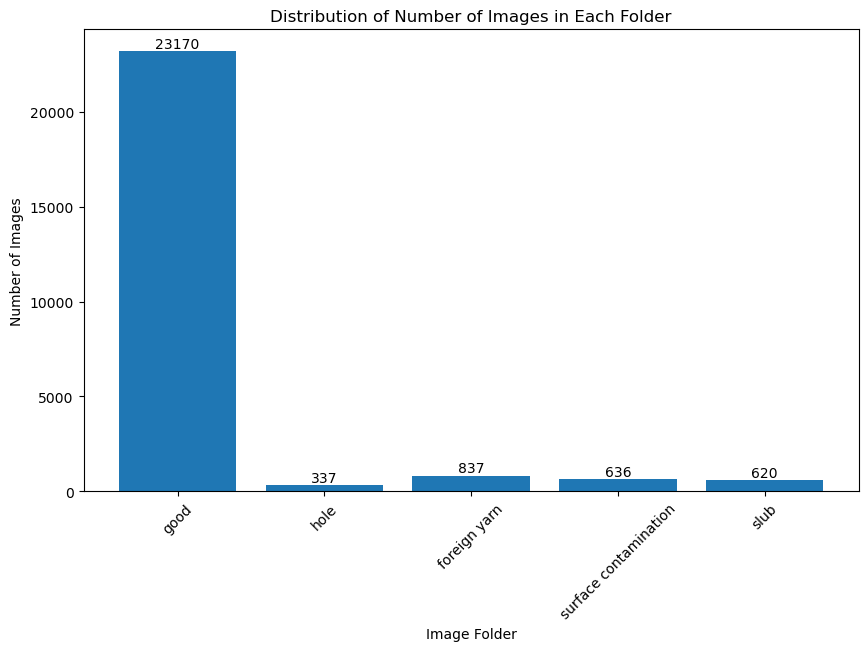

In [11]:
# Define the image folders
image_folders = [
    '/Users/randithasenarathne/FYP/FabricDefects/good/',
    '/Users/randithasenarathne/FYP/FabricDefects/hole/',
    '/Users/randithasenarathne/FYP/FabricDefects/foreign yarn/',
    '/Users/randithasenarathne/FYP/FabricDefects/surface contamination/',
    '/Users/randithasenarathne/FYP/FabricDefects/slub/'
]

# Function to count the number of images in a folder
def count_images_in_folder(folder_path):
    return len([file for file in os.listdir(folder_path) if file.endswith('.png')])

# Get the number of images in each folder
image_counts = [count_images_in_folder(folder) for folder in image_folders]

# Plot the distribution of the number of images inside each folder
plt.figure(figsize=(10, 6))
bars = plt.bar(range(len(image_folders)), image_counts)
plt.xticks(range(len(image_folders)), [os.path.basename(folder.rstrip('/')) for folder in image_folders], rotation=45)
plt.xlabel('Image Folder')
plt.ylabel('Number of Images')
plt.title('Distribution of Number of Images in Each Folder')

# Add text labels with the exact number of images above each bar
for bar, count in zip(bars, image_counts):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), str(count), ha='center', va='bottom')

plt.show()

In [12]:
def delete_folder(folder_path):
    try:
        shutil.rmtree(folder_path)
        print(f"Folder '{folder_path}' and its contents have been deleted successfully.")
    except OSError as e:
        print(f"Error: {e}")

In [13]:
folders = ['/Users/randithasenarathne/FYP/FabricDefectsAugmented/good_augmented/',
           '/Users/randithasenarathne/FYP/FabricDefectsAugmented/hole_augmented/',
           '/Users/randithasenarathne/FYP/FabricDefectsAugmented/foreign_yarn_augmented/',
           '/Users/randithasenarathne/FYP/FabricDefectsAugmented/surface_contamination_augmented/',
           '/Users/randithasenarathne/FYP/FabricDefectsAugmented/slub_augmented/']

for folder in folders:
    delete_folder(folder)

Error: [Errno 2] No such file or directory: '/Users/randithasenarathne/FYP/FabricDefectsAugmented/good_augmented/'
Error: [Errno 2] No such file or directory: '/Users/randithasenarathne/FYP/FabricDefectsAugmented/hole_augmented/'
Error: [Errno 2] No such file or directory: '/Users/randithasenarathne/FYP/FabricDefectsAugmented/foreign_yarn_augmented/'
Error: [Errno 2] No such file or directory: '/Users/randithasenarathne/FYP/FabricDefectsAugmented/surface_contamination_augmented/'
Error: [Errno 2] No such file or directory: '/Users/randithasenarathne/FYP/FabricDefectsAugmented/slub_augmented/'


In [17]:
try:
    import albumentations as A
except ImportError:
    !pip install albumentations
    import albumentations as A

def augment_images(input_folder, output_folder, num_augmentations):
    # Create the output folder if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # List all image files in the input folder
    image_files = [filename for filename in os.listdir(input_folder) if filename.endswith('.png')]

    # Randomly select images for augmentation (1000 for the 'good' folder)
    if 'good' in input_folder:
        selected_image_files = random.sample(image_files, min(1000, len(image_files)))
    else:
        selected_image_files = image_files

    # Define the augmentations to apply
    # Define the augmentations to apply
    augmentations = A.Compose([
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.RandomRotate90(p=0.5),
        A.Rotate(limit=180,
                 interpolation=cv2.INTER_LANCZOS4, 
                 border_mode=cv2.BORDER_REFLECT, 
                 p=0.75),
        A.RandomBrightnessContrast(p=0.5),
        A.AdvancedBlur(p=0.33),
        A.GaussNoise(p=0.25),
        A.UnsharpMask(p=0.1),
    ])

    # Augment and save the new images
    for filename in selected_image_files:
        image_path = os.path.join(input_folder, filename)
        image = Image.open(image_path)

        for i in range(num_augmentations):
            augmented_image = augmentations(image=np.array(image))['image']
            new_image_path = os.path.join(output_folder, f"{os.path.splitext(filename)[0]}_{i+1}.png")
            Image.fromarray(augmented_image).save(new_image_path)

# Specify input and output folders for image augmentation
input_folders = {
    '/Users/randithasenarathne/FYP/FabricDefects/good/': '/Users/randithasenarathne/FYP/FabricDefectsAugmented/good_augmented/',
    '/Users/randithasenarathne/FYP/FabricDefects/hole/': '/Users/randithasenarathne/FYP/FabricDefectsAugmented/hole_augmented/',
    '/Users/randithasenarathne/FYP/FabricDefects/foreign yarn/': '/Users/randithasenarathne/FYP/FabricDefectsAugmented/foreign_yarn_augmented/',
    '/Users/randithasenarathne/FYP/FabricDefects/surface contamination/': '/Users/randithasenarathne/FYP/FabricDefectsAugmented/surface_contamination_augmented/',
    '/Users/randithasenarathne/FYP/FabricDefects/slub/': '/Users/randithasenarathne/FYP/FabricDefectsAugmented/slub_augmented/',
}

# Perform augmentation for each category
num_augmentations = {
    'good': 5,
    'hole': 15,
    'foreign yarn': 6,
    'surface contamination': 8,
    'slub': 8,
}

for input_folder, output_folder in input_folders.items():
    augment_images(input_folder, output_folder, num_augmentations[os.path.basename(os.path.dirname(input_folder))])

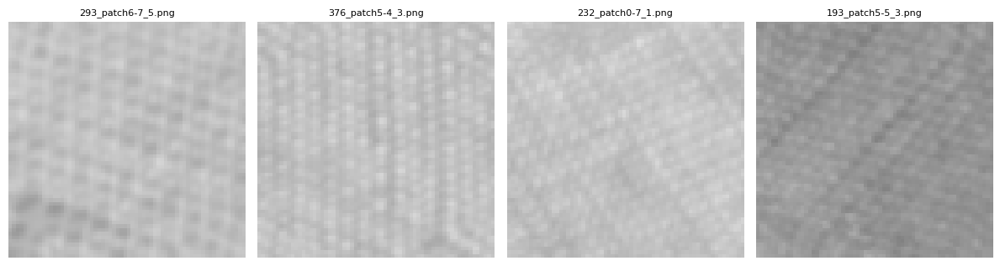

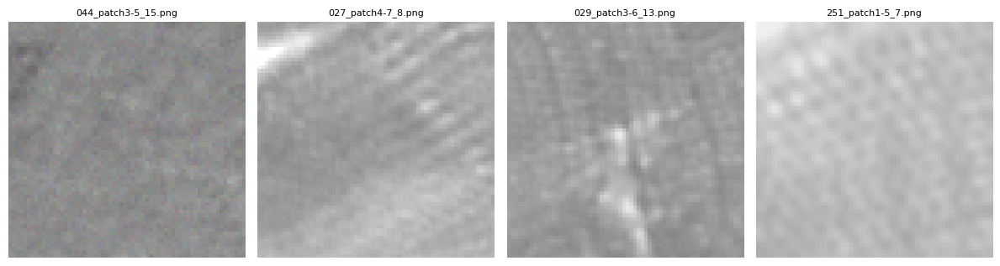

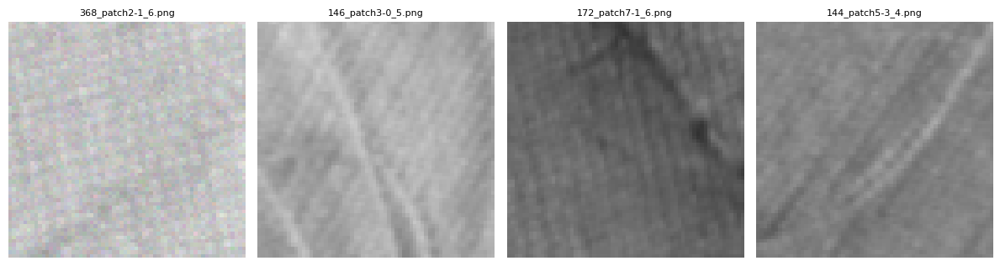

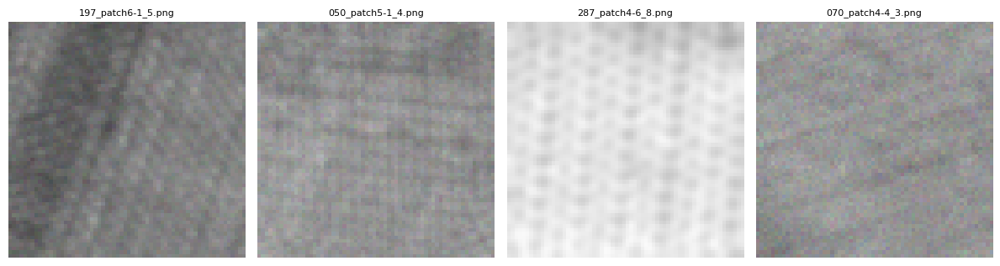

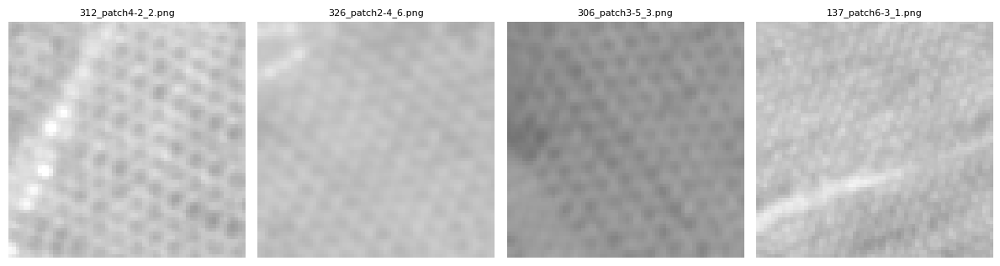

In [18]:
import os
import random
import matplotlib.pyplot as plt

def display_random_images(folder_path, num_images=4, rows=1, cols=4):
    image_files = os.listdir(folder_path)
    random_images = random.sample(image_files, num_images)

    plt.figure(figsize=(12, 6))
    for i, image_file in enumerate(random_images):
        image_path = os.path.join(folder_path, image_file)
        image = plt.imread(image_path)

        plt.subplot(rows, cols, i+1)
        plt.imshow(image)
        plt.title(image_file, fontsize=8)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

folders = ['/Users/randithasenarathne/FYP/FabricDefectsAugmented/good_augmented/',
           '/Users/randithasenarathne/FYP/FabricDefectsAugmented/hole_augmented/',
           '/Users/randithasenarathne/FYP/FabricDefectsAugmented/foreign_yarn_augmented/',
           '/Users/randithasenarathne/FYP/FabricDefectsAugmented/surface_contamination_augmented/',
           '/Users/randithasenarathne/FYP/FabricDefectsAugmented/slub_augmented/']

for folder in folders:
    display_random_images(folder)

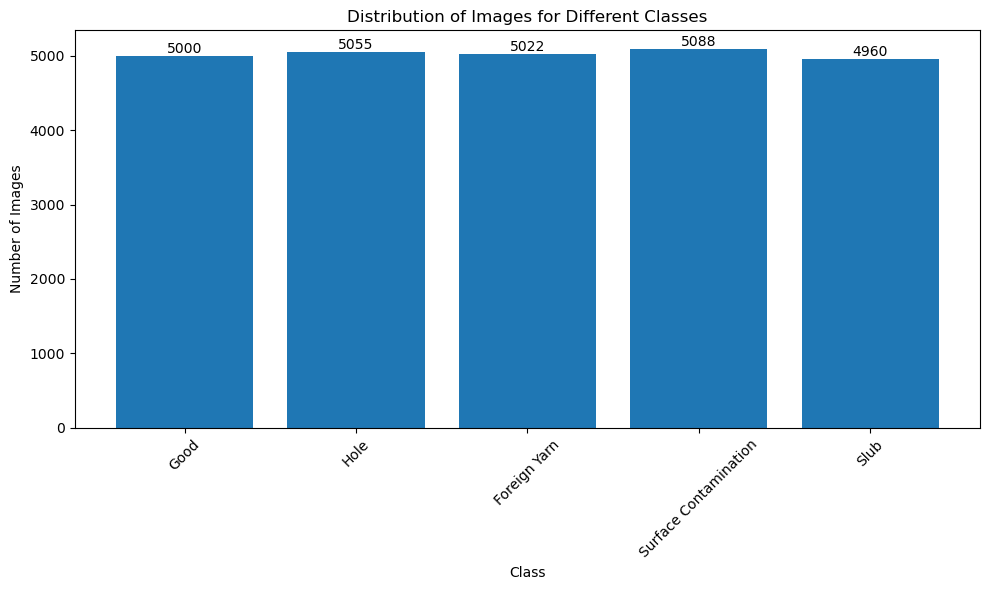

In [20]:
import os
import matplotlib.pyplot as plt

# List of folders for each class
class_folders = ['/Users/randithasenarathne/FYP/FabricDefectsAugmented/good_augmented/',
                 '/Users/randithasenarathne/FYP/FabricDefectsAugmented/hole_augmented/',
                 '/Users/randithasenarathne/FYP/FabricDefectsAugmented/foreign_yarn_augmented/',
                 '/Users/randithasenarathne/FYP/FabricDefectsAugmented/surface_contamination_augmented/',
                 '/Users/randithasenarathne/FYP/FabricDefectsAugmented/slub_augmented/']

# Function to count images in a folder
def count_images_in_folder(folder):
    return len([filename for filename in os.listdir(folder) if filename.endswith('.png')])

# Get the number of images in each folder
image_counts = [count_images_in_folder(folder) for folder in class_folders]

# Class labels
class_labels = ['Good', 'Hole', 'Foreign Yarn', 'Surface Contamination', 'Slub']

# Plot the distribution of images for each class
plt.figure(figsize=(10, 6))
bars = plt.bar(class_labels, image_counts)
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.title('Distribution of Images for Different Classes')

# Add text labels with the exact number of images above each bar
for bar, count in zip(bars, image_counts):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), str(count), ha='center', va='bottom')

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [22]:
import os
import random
import shutil

def create_subfolders(root_folder, subfolders):
    for subfolder in subfolders:
        folder_path = os.path.join(root_folder, subfolder)
        os.makedirs(folder_path, exist_ok=True)

def split_dataset(input_folder, output_folder, class_name, split_proportions=[0.7, 0.2, 0.1]):
    image_files = os.listdir(input_folder)
    random.shuffle(image_files)

    num_images = len(image_files)
    num_train = int(num_images * split_proportions[0])
    num_valid = int(num_images * split_proportions[1])
    num_test = int(num_images * split_proportions[2])

    train_files = image_files[:num_train]
    valid_files = image_files[num_train:num_train + num_valid]
    test_files = image_files[num_train + num_valid:]

    for subset, subset_folder in zip([train_files, valid_files, test_files], ['train', 'val', 'test']):
        class_folder = os.path.join(output_folder, subset_folder, class_name)
        os.makedirs(class_folder, exist_ok=True)
        for image_file in subset:
            source_path = os.path.join(input_folder, image_file)
            destination_path = os.path.join(class_folder, image_file)
            shutil.copy(source_path, destination_path)

# Usage:
output_folder = '/Users/randithasenarathne/FYP/FabricDefects/cls-multi/'
class_folders = {
    'good': '/Users/randithasenarathne/FYP/FabricDefectsAugmented/good_augmented/',
    'hole': '/Users/randithasenarathne/FYP/FabricDefectsAugmented/hole_augmented/',
    'foreign yarn': '/Users/randithasenarathne/FYP/FabricDefectsAugmented/foreign_yarn_augmented/',
    'surface contamination': '/Users/randithasenarathne/FYP/FabricDefectsAugmented/surface_contamination_augmented/',
    'slub': '/Users/randithasenarathne/FYP/FabricDefectsAugmented/slub_augmented/'
}

# Step 1: Create the required folders
create_subfolders(output_folder, ['train', 'val', 'test'])

# Step 2: Split datasets for all classes
for class_name, input_folder in class_folders.items():
    split_dataset(input_folder, output_folder, class_name)

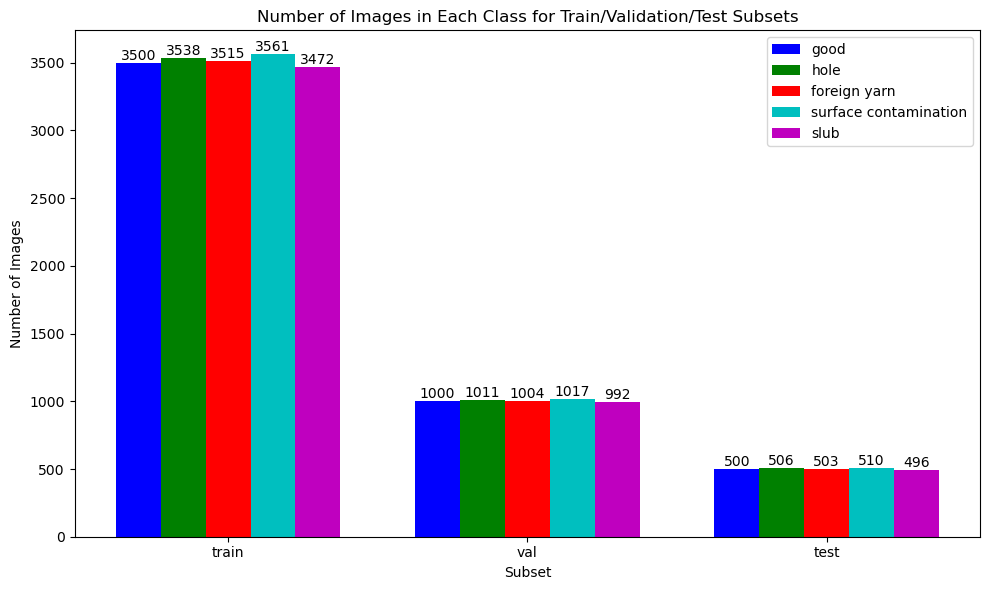

In [23]:
import os
import matplotlib.pyplot as plt

def count_images_in_folder(folder_path):
    return len([file for file in os.listdir(folder_path) if file.endswith('.png')])

def count_images_in_subfolders(root_folder, subfolders, class_names):
    image_counts = {}
    for subset_folder in subfolders:
        subset_path = os.path.join(root_folder, subset_folder)
        class_counts = {}
        for class_name in class_names:
            class_folder = os.path.join(subset_path, class_name)
            class_count = count_images_in_folder(class_folder)
            class_counts[class_name] = class_count
        image_counts[subset_folder] = class_counts
    return image_counts

def plot_bar_chart(image_counts, class_names):
    subsets = list(image_counts.keys())
    colors = ['b', 'g', 'r', 'c', 'm']

    plt.figure(figsize=(10, 6))
    bar_width = 0.15
    index = [i for i in range(len(subsets))]

    for i, class_name in enumerate(class_names):
        counts = [image_counts[subset][class_name] for subset in subsets]
        bars = plt.bar([ind + i * bar_width for ind in index], counts, width=bar_width, color=colors[i], label=class_name)
        for bar in bars:
            plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), str(bar.get_height()), ha='center', va='bottom')

    plt.xlabel('Subset')
    plt.ylabel('Number of Images')
    plt.title('Number of Images in Each Class for Train/Validation/Test Subsets')
    plt.xticks([ind + bar_width * (len(class_names) - 1) / 2 for ind in index], subsets)
    plt.legend()
    plt.tight_layout()
    plt.show()

# Example usage:
output_folder = '/Users/randithasenarathne/FYP/FabricDefects/cls-multi/'
class_names = ['good', 'hole', 'foreign yarn', 'surface contamination', 'slub']

# Count the number of images in each folder for each train/valid/test subset
subsets = ['train', 'val', 'test']
image_counts = count_images_in_subfolders(output_folder, subsets, class_names)

# Plot the bar chart
plot_bar_chart(image_counts, class_names)

In [1]:
!pip install ultralytics

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

from ultralytics import YOLO
from IPython.display import display, Image

Ultralytics YOLOv8.2.56 🚀 Python-3.11.7 torch-2.3.1 CPU (Apple M2)
Setup complete ✅ (8 CPUs, 8.0 GB RAM, 440.4/460.4 GB disk)


In [2]:
!yolo task=classify mode=train model=yolov8s-cls.pt data="/Users/randithasenarathne/FYP/FabricDefects/cls-multi" epochs=150 imgsz=64

New https://pypi.org/project/ultralytics/8.3.9 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.56 🚀 Python-3.11.7 torch-2.3.1 CPU (Apple M2)
engine/trainer: task=classify, mode=train, model=yolov8s-cls.pt, data=/Users/randithasenarathne/FYP/FabricDefects/cls-multi, epochs=150, time=None, patience=100, batch=16, imgsz=64, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=Fa

               classes   top1_acc   top5_acc: 100%|██████████| 157/157 [01:17<00
                   all      0.811          1

      Epoch    GPU_mem       loss  Instances       Size
     47/150         0G     0.8927          2         64: 100%|██████████| 1100/1
               classes   top1_acc   top5_acc: 100%|██████████| 157/157 [01:17<00
                   all      0.812          1

      Epoch    GPU_mem       loss  Instances       Size
     48/150         0G     0.8764          2         64: 100%|██████████| 1100/1
               classes   top1_acc   top5_acc: 100%|██████████| 157/157 [01:19<00
                   all      0.816          1

      Epoch    GPU_mem       loss  Instances       Size
     49/150         0G     0.8739          2         64: 100%|██████████| 1100/1
               classes   top1_acc   top5_acc: 100%|██████████| 157/157 [01:20<00
                   all      0.816          1

      Epoch    GPU_mem       loss  Instances       Size
     50/150         0G   

               classes   top1_acc   top5_acc: 100%|██████████| 157/157 [01:17<00
                   all      0.858          1

      Epoch    GPU_mem       loss  Instances       Size
    109/150         0G     0.6304          2         64: 100%|██████████| 1100/1
               classes   top1_acc   top5_acc: 100%|██████████| 157/157 [01:17<00
                   all      0.859          1

      Epoch    GPU_mem       loss  Instances       Size
    110/150         0G     0.6054          2         64: 100%|██████████| 1100/1
               classes   top1_acc   top5_acc: 100%|██████████| 157/157 [01:17<00
                   all      0.859          1

      Epoch    GPU_mem       loss  Instances       Size
    111/150         0G      0.612          2         64: 100%|██████████| 1100/1
               classes   top1_acc   top5_acc: 100%|██████████| 157/157 [01:17<00
                   all       0.86          1

      Epoch    GPU_mem       loss  Instances       Size
    112/150         0G   

In [4]:
from ultralytics import YOLO

# Load your trained model
model = YOLO('/Users/randithasenarathne/FYP/runs/classify/train/weights/best.pt')

In [27]:
import os
import cv2
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from ultralytics import YOLO
from PIL import Image

# Load the YOLO model from the best checkpoint
model_path = '/Users/randithasenarathne/FYP/runs/classify/train/weights/best.pt'
model = YOLO(model_path)

# Define class names
class_names = ['foreign yarn', 'good', 'hole', 'slub', 'surface contamination']

# Directories for test images
test_dir = '/Users/randithasenarathne/FYP/FabricDefects/cls-multi/test'

# Lists to hold true labels and predictions
true_labels = []
predicted_labels = []

def preprocess_image(image_path):
    # Load the image and convert it to grayscale
    frame = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    # Resize to 64x64
    resized_frame = cv2.resize(frame, (64, 64))
    
    # Normalize the image to the range [0, 255] and convert to uint8
    normalized_frame = (resized_frame * 255.0 / np.max(resized_frame)).astype(np.uint8)
    
    # Expand dimensions to match model input requirements
    expanded_frame = np.expand_dims(normalized_frame, axis=-1)
    
    # Convert grayscale to 3-channel RGB
    rgb_frame = np.repeat(expanded_frame, 3, axis=-1)
    
    # Add batch dimension
    batch_frame = np.expand_dims(rgb_frame, axis=0)
    
    return batch_frame

def predict_class(image, model):
    # Convert image to uint8 and PIL format
    image_uint8 = (image[0] * 255).astype(np.uint8)
    image_pil = Image.fromarray(image_uint8)
    
    # Make prediction
    results = model.predict(image_pil)
    
    # Extract the data tensor from results[0].probs and convert to numpy array
    if results[0].probs is not None:
        probs_data = results[0].probs.data.cpu().numpy()  # Extracting tensor and converting to numpy
        
        # Use np.argmax to get the predicted class
        predicted_class = np.argmax(probs_data)
    else:
        raise ValueError("Unknown results structure: Unable to access 'probs'")
    
    return predicted_class

# Iterate through each class directory and predict the class
for label, class_name in enumerate(class_names):
    class_dir = os.path.join(test_dir, class_name)
    for img_file in os.listdir(class_dir):
        img_path = os.path.join(class_dir, img_file)
        
        # Preprocess and predict the class for each image
        image = preprocess_image(img_path)
        predicted_class = predict_class(image, model)
        
        # Store true label and predicted label
        true_labels.append(label)
        predicted_labels.append(predicted_class)

# Calculate metrics
accuracy = accuracy_score(true_labels, predicted_labels)
precision = precision_score(true_labels, predicted_labels, average='weighted')
recall = recall_score(true_labels, predicted_labels, average='weighted')
f1 = f1_score(true_labels, predicted_labels, average='weighted')

# Print the metrics
print(f"Test Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision * 100:.2f}%")
print(f"Recall: {recall * 100:.2f}%")
print(f"F1 Score: {f1 * 100:.2f}%")


0: 64x64 foreign yarn 0.50, surface contamination 0.50, hole 0.00, slub 0.00, good 0.00, 5.7ms
Speed: 1.8ms preprocess, 5.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, surface contamination 0.01, good 0.00, hole 0.00, slub 0.00, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.42, foreign yarn 0.30, good 0.17, hole 0.09, surface contamination 0.02, 4.3ms
Speed: 0.6ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.90, good 0.09, surface contamination 0.01, slub 0.00, hole 0.00, 4.7ms
Speed: 1.2ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, good 0.00, surface contamination 0.00, hole 0.00, slub 0.00, 3.9ms
Speed: 1.0ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.00, good 0.00,

Speed: 0.6ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.67, foreign yarn 0.24, hole 0.04, slub 0.03, surface contamination 0.03, 3.5ms
Speed: 0.5ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.62, hole 0.38, slub 0.00, good 0.00, surface contamination 0.00, 3.4ms
Speed: 0.5ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.42, foreign yarn 0.41, hole 0.14, good 0.03, surface contamination 0.00, 3.4ms
Speed: 0.5ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.53, foreign yarn 0.41, slub 0.03, surface contamination 0.02, hole 0.01, 4.2ms
Speed: 0.6ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.64, foreign yarn 0.20, surface contamination 0.11, slub 0.02, hole 0.02, 4.0ms
Speed: 0.9ms preprocess, 4.0ms inference, 0.0ms po


0: 64x64 good 0.64, foreign yarn 0.21, slub 0.06, surface contamination 0.06, hole 0.04, 4.0ms
Speed: 0.9ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.75, slub 0.21, good 0.02, surface contamination 0.01, hole 0.00, 4.2ms
Speed: 1.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.71, slub 0.20, surface contamination 0.04, hole 0.04, good 0.01, 4.3ms
Speed: 0.9ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.78, foreign yarn 0.16, surface contamination 0.05, slub 0.01, hole 0.00, 4.3ms
Speed: 1.3ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.93, hole 0.06, good 0.01, slub 0.00, surface contamination 0.00, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.74, foreign yarn 0.12, hole 0.05,

Speed: 1.1ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.76, foreign yarn 0.14, surface contamination 0.05, slub 0.03, hole 0.01, 4.7ms
Speed: 0.8ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, slub 0.00, good 0.00, surface contamination 0.00, 4.3ms
Speed: 1.6ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.85, hole 0.15, slub 0.00, good 0.00, surface contamination 0.00, 4.3ms
Speed: 0.9ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.93, surface contamination 0.07, hole 0.00, good 0.00, slub 0.00, 4.1ms
Speed: 0.8ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.31, foreign yarn 0.23, hole 0.21, slub 0.14, surface contamination 0.11, 4.1ms
Speed: 1.3ms preprocess, 4.1ms inference, 0.0ms po


0: 64x64 slub 0.29, foreign yarn 0.25, good 0.20, hole 0.18, surface contamination 0.07, 4.2ms
Speed: 0.9ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.35, good 0.28, surface contamination 0.19, slub 0.12, hole 0.05, 4.2ms
Speed: 1.0ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.95, hole 0.02, surface contamination 0.02, good 0.01, slub 0.00, 3.8ms
Speed: 0.8ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.47, foreign yarn 0.38, surface contamination 0.08, slub 0.04, hole 0.02, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, surface contamination 0.00, slub 0.00, good 0.00, hole 0.00, 4.6ms
Speed: 0.6ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.61, foreign yarn 0.20, slub 0.11,

Speed: 0.6ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, good 0.01, surface contamination 0.00, slub 0.00, hole 0.00, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.68, foreign yarn 0.17, surface contamination 0.10, slub 0.03, hole 0.02, 4.0ms
Speed: 1.0ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.90, foreign yarn 0.10, good 0.00, surface contamination 0.00, slub 0.00, 3.8ms
Speed: 0.8ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.91, good 0.04, surface contamination 0.03, slub 0.02, hole 0.00, 4.3ms
Speed: 1.0ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, hole 0.01, slub 0.01, good 0.00, surface contamination 0.00, 3.8ms
Speed: 0.5ms preprocess, 3.8ms inference, 0.0ms po


0: 64x64 good 0.65, foreign yarn 0.30, surface contamination 0.04, slub 0.01, hole 0.00, 3.8ms
Speed: 0.7ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.71, surface contamination 0.13, foreign yarn 0.12, slub 0.02, hole 0.01, 3.8ms
Speed: 0.6ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.56, good 0.21, hole 0.13, slub 0.06, surface contamination 0.03, 3.7ms
Speed: 0.6ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, surface contamination 0.00, good 0.00, 3.6ms
Speed: 0.7ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.62, good 0.33, surface contamination 0.03, slub 0.01, hole 0.01, 4.0ms
Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.53, good 0.27, slub 0.14,

Speed: 1.0ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.73, hole 0.27, surface contamination 0.00, good 0.00, slub 0.00, 4.9ms
Speed: 1.0ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.46, foreign yarn 0.32, slub 0.11, surface contamination 0.08, hole 0.04, 4.5ms
Speed: 0.6ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.68, good 0.18, surface contamination 0.08, slub 0.03, hole 0.03, 4.1ms
Speed: 1.6ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.77, foreign yarn 0.19, surface contamination 0.02, slub 0.01, hole 0.01, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, good 0.00, surface contamination 0.00, slub 0.00, 3.9ms
Speed: 1.3ms preprocess, 3.9ms inference, 0.0ms po


0: 64x64 foreign yarn 0.99, slub 0.00, hole 0.00, surface contamination 0.00, good 0.00, 4.0ms
Speed: 0.8ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.00, surface contamination 0.00, slub 0.00, good 0.00, 3.8ms
Speed: 1.3ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.46, foreign yarn 0.40, surface contamination 0.14, hole 0.00, slub 0.00, 4.0ms
Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.92, hole 0.07, slub 0.01, good 0.00, surface contamination 0.00, 5.5ms
Speed: 1.6ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, good 0.01, surface contamination 0.00, slub 0.00, hole 0.00, 4.1ms
Speed: 0.8ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.41, foreign yarn

Speed: 1.1ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 5.1ms
Speed: 0.7ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.87, good 0.10, surface contamination 0.01, slub 0.01, hole 0.01, 4.1ms
Speed: 1.1ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.56, surface contamination 0.18, foreign yarn 0.13, slub 0.11, hole 0.03, 3.8ms
Speed: 1.1ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.60, foreign yarn 0.31, surface contamination 0.08, hole 0.01, slub 0.01, 4.7ms
Speed: 1.3ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, slub 0.00, hole 0.00, good 0.00, surface contamination 0.00, 4.2ms
Speed: 1.0ms preprocess, 4.2ms inference, 0.0ms po


0: 64x64 foreign yarn 0.69, good 0.26, surface contamination 0.04, slub 0.01, hole 0.01, 3.9ms
Speed: 0.6ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.74, slub 0.18, foreign yarn 0.08, good 0.00, surface contamination 0.00, 3.9ms
Speed: 1.1ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, surface contamination 0.00, good 0.00, 4.3ms
Speed: 0.9ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, surface contamination 0.01, good 0.00, hole 0.00, slub 0.00, 3.8ms
Speed: 0.8ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, good 0.01, surface contamination 0.01, hole 0.00, slub 0.00, 3.7ms
Speed: 0.6ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, good 0.00, hole 0.00,

Speed: 1.0ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.66, foreign yarn 0.33, slub 0.00, good 0.00, surface contamination 0.00, 4.3ms
Speed: 1.2ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.96, slub 0.01, surface contamination 0.01, hole 0.01, good 0.00, 4.1ms
Speed: 1.6ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.65, good 0.16, slub 0.08, surface contamination 0.08, hole 0.03, 4.2ms
Speed: 1.0ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.94, foreign yarn 0.05, slub 0.01, surface contamination 0.00, good 0.00, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, surface contamination 0.01, good 0.00, hole 0.00, slub 0.00, 4.2ms
Speed: 1.0ms preprocess, 4.2ms inference, 0.0ms po


0: 64x64 good 0.87, surface contamination 0.08, slub 0.04, hole 0.01, foreign yarn 0.00, 4.3ms
Speed: 1.3ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.91, foreign yarn 0.05, surface contamination 0.04, slub 0.00, hole 0.00, 4.2ms
Speed: 1.0ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.74, foreign yarn 0.10, surface contamination 0.09, slub 0.05, hole 0.02, 3.9ms
Speed: 0.8ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.71, surface contamination 0.25, slub 0.03, hole 0.01, foreign yarn 0.00, 4.2ms
Speed: 0.9ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.78, foreign yarn 0.13, surface contamination 0.06, hole 0.03, slub 0.00, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.68, surface contamination 0.12, f

Speed: 0.8ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.89, foreign yarn 0.07, surface contamination 0.03, slub 0.00, hole 0.00, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.63, surface contamination 0.30, foreign yarn 0.05, slub 0.01, hole 0.01, 3.9ms
Speed: 0.6ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.75, surface contamination 0.10, hole 0.08, foreign yarn 0.04, slub 0.03, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.56, surface contamination 0.23, slub 0.10, hole 0.06, foreign yarn 0.05, 3.8ms
Speed: 0.9ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.94, surface contamination 0.05, foreign yarn 0.01, slub 0.00, hole 0.00, 4.5ms
Speed: 0.7ms preprocess, 4.5ms inference, 0.0ms po


0: 64x64 good 0.43, hole 0.21, surface contamination 0.19, slub 0.13, foreign yarn 0.06, 4.1ms
Speed: 0.6ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.76, surface contamination 0.21, foreign yarn 0.03, slub 0.00, hole 0.00, 4.3ms
Speed: 0.9ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.59, surface contamination 0.24, foreign yarn 0.12, slub 0.03, hole 0.02, 4.0ms
Speed: 0.8ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.63, slub 0.18, surface contamination 0.10, foreign yarn 0.06, hole 0.03, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.63, slub 0.13, foreign yarn 0.11, surface contamination 0.09, hole 0.05, 4.2ms
Speed: 0.9ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.67, surface contamination 0.26, s

Speed: 0.8ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.50, foreign yarn 0.33, surface contamination 0.08, hole 0.08, slub 0.01, 4.0ms
Speed: 0.6ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.94, foreign yarn 0.04, surface contamination 0.01, hole 0.01, slub 0.00, 4.4ms
Speed: 1.0ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.66, surface contamination 0.10, foreign yarn 0.10, slub 0.07, hole 0.07, 4.3ms
Speed: 1.0ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.81, foreign yarn 0.10, surface contamination 0.05, slub 0.03, hole 0.01, 4.8ms
Speed: 0.8ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.95, foreign yarn 0.04, surface contamination 0.01, slub 0.00, hole 0.00, 4.3ms
Speed: 0.9ms preprocess, 4.3ms inference, 0.0ms po


0: 64x64 good 0.92, surface contamination 0.07, slub 0.00, foreign yarn 0.00, hole 0.00, 4.2ms
Speed: 1.2ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.87, foreign yarn 0.09, surface contamination 0.04, hole 0.00, slub 0.00, 3.9ms
Speed: 0.6ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.56, foreign yarn 0.19, surface contamination 0.14, slub 0.06, hole 0.05, 4.5ms
Speed: 1.5ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.47, surface contamination 0.26, foreign yarn 0.12, hole 0.08, slub 0.07, 3.9ms
Speed: 0.7ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.71, foreign yarn 0.23, surface contamination 0.05, hole 0.01, slub 0.01, 4.1ms
Speed: 1.2ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.91, foreign yarn 0.04, surface co

Speed: 1.0ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.72, surface contamination 0.14, hole 0.09, slub 0.04, foreign yarn 0.01, 4.1ms
Speed: 1.0ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.62, slub 0.19, foreign yarn 0.10, surface contamination 0.07, hole 0.03, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.67, surface contamination 0.15, hole 0.15, foreign yarn 0.02, slub 0.01, 4.1ms
Speed: 1.2ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.89, foreign yarn 0.07, surface contamination 0.02, slub 0.01, hole 0.01, 4.4ms
Speed: 1.0ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.88, surface contamination 0.10, foreign yarn 0.01, slub 0.01, hole 0.00, 4.2ms
Speed: 1.2ms preprocess, 4.2ms inference, 0.0ms po


0: 64x64 good 0.81, foreign yarn 0.09, surface contamination 0.07, slub 0.02, hole 0.01, 4.5ms
Speed: 0.8ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.68, surface contamination 0.10, slub 0.09, foreign yarn 0.07, hole 0.06, 3.7ms
Speed: 0.6ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.76, foreign yarn 0.13, surface contamination 0.08, slub 0.02, hole 0.02, 4.3ms
Speed: 0.6ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.77, surface contamination 0.08, foreign yarn 0.07, hole 0.05, slub 0.04, 4.0ms
Speed: 1.0ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.89, foreign yarn 0.07, surface contamination 0.03, hole 0.00, slub 0.00, 4.5ms
Speed: 0.6ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.97, surface contamination 0.02, f

Speed: 0.7ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.81, surface contamination 0.08, slub 0.05, foreign yarn 0.04, hole 0.01, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.70, surface contamination 0.11, foreign yarn 0.08, slub 0.06, hole 0.04, 3.9ms
Speed: 1.2ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.65, foreign yarn 0.18, surface contamination 0.08, slub 0.06, hole 0.02, 4.1ms
Speed: 0.6ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.87, surface contamination 0.08, slub 0.04, hole 0.01, foreign yarn 0.00, 4.1ms
Speed: 1.6ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.71, surface contamination 0.23, foreign yarn 0.06, slub 0.00, hole 0.00, 4.0ms
Speed: 0.6ms preprocess, 4.0ms inference, 0.0ms po


0: 64x64 good 0.62, foreign yarn 0.20, surface contamination 0.12, slub 0.03, hole 0.02, 4.1ms
Speed: 1.1ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.66, surface contamination 0.17, hole 0.06, foreign yarn 0.06, slub 0.04, 4.0ms
Speed: 0.6ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.55, surface contamination 0.32, foreign yarn 0.12, slub 0.01, hole 0.00, 4.4ms
Speed: 1.3ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.79, surface contamination 0.19, slub 0.01, hole 0.01, foreign yarn 0.00, 3.9ms
Speed: 0.6ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.71, surface contamination 0.10, foreign yarn 0.10, slub 0.06, hole 0.03, 4.0ms
Speed: 0.9ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.83, foreign yarn 0.13, surface co

Speed: 0.6ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.90, foreign yarn 0.07, surface contamination 0.03, slub 0.00, hole 0.00, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.68, slub 0.11, surface contamination 0.10, foreign yarn 0.07, hole 0.05, 4.0ms
Speed: 1.1ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.75, surface contamination 0.10, foreign yarn 0.09, hole 0.04, slub 0.02, 4.1ms
Speed: 0.9ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.58, foreign yarn 0.26, surface contamination 0.08, hole 0.04, slub 0.03, 3.8ms
Speed: 1.0ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.65, hole 0.13, good 0.13, foreign yarn 0.06, surface contamination 0.02, 4.2ms
Speed: 0.9ms preprocess, 4.2ms inference, 0.0ms po


0: 64x64 good 0.54, surface contamination 0.19, slub 0.18, hole 0.07, foreign yarn 0.02, 4.2ms
Speed: 0.6ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.68, surface contamination 0.11, foreign yarn 0.11, hole 0.05, slub 0.05, 4.0ms
Speed: 0.9ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.52, foreign yarn 0.17, surface contamination 0.12, hole 0.10, slub 0.09, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.96, foreign yarn 0.03, hole 0.01, surface contamination 0.01, slub 0.00, 4.2ms
Speed: 1.0ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.75, surface contamination 0.07, foreign yarn 0.06, hole 0.06, slub 0.06, 4.0ms
Speed: 0.6ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.57, surface contamination 0.17, f

Speed: 0.8ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.93, foreign yarn 0.05, surface contamination 0.01, hole 0.00, slub 0.00, 4.0ms
Speed: 0.8ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.77, foreign yarn 0.14, surface contamination 0.06, slub 0.02, hole 0.01, 4.0ms
Speed: 0.6ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 3.9ms
Speed: 1.2ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, hole 0.01, slub 0.00, surface contamination 0.00, good 0.00, 3.9ms
Speed: 0.9ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.58, hole 0.24, slub 0.13, surface contamination 0.05, good 0.01, 4.2ms
Speed: 1.4ms preprocess, 4.2ms inference, 0.0ms po


0: 64x64 foreign yarn 0.39, hole 0.27, good 0.22, surface contamination 0.11, slub 0.01, 3.8ms
Speed: 0.7ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.83, slub 0.06, surface contamination 0.05, foreign yarn 0.05, hole 0.03, 4.2ms
Speed: 0.6ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.88, surface contamination 0.09, hole 0.02, slub 0.01, good 0.00, 4.1ms
Speed: 1.4ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.96, foreign yarn 0.04, good 0.00, slub 0.00, surface contamination 0.00, 4.1ms
Speed: 0.6ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.64, hole 0.35, foreign yarn 0.00, surface contamination 0.00, good 0.00, 4.2ms
Speed: 1.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.87, slub 0.07, surface contaminat

Speed: 1.1ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.62, hole 0.23, slub 0.07, surface contamination 0.04, good 0.04, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.96, slub 0.02, foreign yarn 0.01, good 0.00, surface contamination 0.00, 4.3ms
Speed: 0.6ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.95, foreign yarn 0.03, surface contamination 0.01, slub 0.01, good 0.01, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.56, slub 0.41, good 0.02, foreign yarn 0.01, surface contamination 0.01, 4.3ms
Speed: 1.1ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.62, slub 0.38, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.9ms
Speed: 0.6ms preprocess, 3.9ms inference, 0.0ms po


0: 64x64 hole 0.84, foreign yarn 0.12, surface contamination 0.02, good 0.01, slub 0.00, 3.8ms
Speed: 1.0ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.99, good 0.01, slub 0.00, foreign yarn 0.00, surface contamination 0.00, 3.9ms
Speed: 0.7ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.60, slub 0.40, foreign yarn 0.00, surface contamination 0.00, good 0.00, 4.1ms
Speed: 1.1ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.56, foreign yarn 0.32, good 0.08, slub 0.03, hole 0.00, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.93, slub 0.07, foreign yarn 0.00, good 0.00, surface contamination 0.00, 4.4ms
Speed: 1.2ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 1.00, foreign yarn 0.00, good 0.00,

Speed: 0.7ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.79, foreign yarn 0.20, slub 0.00, good 0.00, surface contamination 0.00, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.50, slub 0.27, hole 0.09, foreign yarn 0.07, surface contamination 0.07, 4.1ms
Speed: 0.9ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.62, foreign yarn 0.24, hole 0.12, good 0.02, surface contamination 0.01, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.52, slub 0.20, foreign yarn 0.12, hole 0.12, surface contamination 0.04, 4.1ms
Speed: 1.0ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.7ms
Speed: 0.7ms preprocess, 3.7ms inference, 0.0ms po


0: 64x64 slub 0.51, hole 0.49, foreign yarn 0.00, surface contamination 0.00, good 0.00, 4.0ms
Speed: 0.6ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.94, slub 0.06, foreign yarn 0.00, good 0.00, surface contamination 0.00, 4.5ms
Speed: 0.8ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.37, surface contamination 0.24, slub 0.22, foreign yarn 0.16, good 0.01, 3.9ms
Speed: 1.1ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.51, surface contamination 0.39, good 0.08, hole 0.02, slub 0.00, 4.0ms
Speed: 0.8ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.75, hole 0.19, surface contamination 0.03, good 0.02, slub 0.01, 4.1ms
Speed: 1.0ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.65, surface contamination 0.13, f

Speed: 1.1ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.62, surface contamination 0.35, hole 0.03, good 0.00, slub 0.00, 3.9ms
Speed: 0.9ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.72, slub 0.16, hole 0.09, good 0.01, surface contamination 0.01, 4.3ms
Speed: 0.9ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.53, surface contamination 0.21, good 0.10, hole 0.09, foreign yarn 0.08, 4.7ms
Speed: 1.0ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.99, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.44, foreign yarn 0.32, surface contamination 0.10, hole 0.09, slub 0.07, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms po


0: 64x64 surface contamination 0.89, good 0.08, foreign yarn 0.03, slub 0.00, hole 0.00, 4.6ms
Speed: 1.6ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.31, hole 0.23, foreign yarn 0.17, slub 0.17, surface contamination 0.11, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.73, foreign yarn 0.16, hole 0.05, good 0.03, surface contamination 0.02, 4.8ms
Speed: 0.9ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.68, foreign yarn 0.25, surface contamination 0.07, slub 0.00, hole 0.00, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.96, slub 0.04, foreign yarn 0.00, surface contamination 0.00, good 0.00, 5.1ms
Speed: 0.9ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.70, foreign yarn 0.20, surface co

Speed: 1.3ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.95, slub 0.03, foreign yarn 0.02, good 0.00, surface contamination 0.00, 4.9ms
Speed: 0.9ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.36, hole 0.26, surface contamination 0.26, good 0.08, slub 0.04, 5.5ms
Speed: 1.5ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.59, foreign yarn 0.25, good 0.09, slub 0.05, surface contamination 0.03, 4.8ms
Speed: 0.9ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.89, foreign yarn 0.06, surface contamination 0.04, slub 0.00, good 0.00, 5.3ms
Speed: 1.1ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.88, slub 0.08, foreign yarn 0.03, good 0.00, surface contamination 0.00, 5.5ms
Speed: 1.4ms preprocess, 5.5ms inference, 0.0ms po


0: 64x64 foreign yarn 0.89, hole 0.06, good 0.05, slub 0.01, surface contamination 0.00, 5.0ms
Speed: 0.9ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.77, hole 0.11, surface contamination 0.10, good 0.02, slub 0.01, 5.0ms
Speed: 0.9ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.99, foreign yarn 0.00, hole 0.00, good 0.00, surface contamination 0.00, 5.0ms
Speed: 0.9ms preprocess, 5.0ms inference, 0.1ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.92, foreign yarn 0.05, slub 0.02, good 0.01, surface contamination 0.00, 5.0ms
Speed: 0.8ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.48, surface contamination 0.27, hole 0.20, foreign yarn 0.05, good 0.00, 5.3ms
Speed: 0.9ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.63, foreign yarn 0.21, slub 0.16,

Speed: 1.2ms preprocess, 5.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.37, good 0.30, foreign yarn 0.16, hole 0.11, surface contamination 0.07, 4.9ms
Speed: 0.8ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.29, surface contamination 0.19, slub 0.19, foreign yarn 0.18, good 0.14, 5.2ms
Speed: 1.4ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.54, hole 0.35, surface contamination 0.09, slub 0.02, good 0.00, 4.9ms
Speed: 1.1ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.85, foreign yarn 0.13, slub 0.02, surface contamination 0.00, good 0.00, 5.6ms
Speed: 1.1ms preprocess, 5.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.79, foreign yarn 0.15, good 0.05, slub 0.01, hole 0.00, 5.0ms
Speed: 1.3ms preprocess, 5.0ms inference, 0.0ms po


0: 64x64 surface contamination 0.75, foreign yarn 0.15, hole 0.05, good 0.04, slub 0.01, 5.1ms
Speed: 0.9ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.54, hole 0.43, surface contamination 0.02, foreign yarn 0.00, good 0.00, 5.1ms
Speed: 0.9ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.51, foreign yarn 0.33, surface contamination 0.11, good 0.03, slub 0.02, 5.2ms
Speed: 0.9ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.92, hole 0.08, slub 0.00, surface contamination 0.00, good 0.00, 5.0ms
Speed: 1.3ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.87, slub 0.10, good 0.02, foreign yarn 0.02, surface contamination 0.00, 5.2ms
Speed: 0.8ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.49, hole 0.34, foreign yarn 0.14,

Speed: 1.2ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.31, hole 0.31, good 0.25, foreign yarn 0.09, surface contamination 0.04, 4.7ms
Speed: 0.7ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.75, surface contamination 0.10, slub 0.07, foreign yarn 0.05, hole 0.03, 5.5ms
Speed: 0.6ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.79, foreign yarn 0.12, surface contamination 0.07, good 0.01, hole 0.00, 4.8ms
Speed: 1.7ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.77, hole 0.13, good 0.05, foreign yarn 0.04, surface contamination 0.01, 4.9ms
Speed: 0.9ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.60, good 0.13, slub 0.12, hole 0.09, surface contamination 0.07, 4.8ms
Speed: 1.6ms preprocess, 4.8ms inference, 0.0ms po


0: 64x64 slub 0.48, good 0.40, surface contamination 0.07, foreign yarn 0.04, hole 0.01, 5.1ms
Speed: 0.8ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.91, good 0.05, hole 0.02, foreign yarn 0.02, surface contamination 0.00, 4.9ms
Speed: 1.0ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.79, surface contamination 0.10, slub 0.09, foreign yarn 0.03, hole 0.00, 4.8ms
Speed: 0.7ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.56, foreign yarn 0.25, surface contamination 0.16, good 0.02, hole 0.01, 5.8ms
Speed: 1.3ms preprocess, 5.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.96, hole 0.03, good 0.00, surface contamination 0.00, foreign yarn 0.00, 4.9ms
Speed: 0.8ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.39, slub 0.28, foreign yarn 0.22,

Speed: 1.4ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.90, foreign yarn 0.06, hole 0.03, good 0.00, surface contamination 0.00, 5.2ms
Speed: 1.0ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.81, hole 0.19, foreign yarn 0.00, good 0.00, surface contamination 0.00, 5.1ms
Speed: 0.8ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.51, slub 0.20, hole 0.19, good 0.07, surface contamination 0.03, 4.7ms
Speed: 1.1ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.43, hole 0.19, foreign yarn 0.14, good 0.14, surface contamination 0.10, 5.2ms
Speed: 0.8ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.55, slub 0.34, good 0.06, foreign yarn 0.03, surface contamination 0.02, 5.0ms
Speed: 1.0ms preprocess, 5.0ms inference, 0.0ms po


0: 64x64 good 0.59, foreign yarn 0.15, slub 0.15, surface contamination 0.06, hole 0.05, 5.3ms
Speed: 1.1ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.94, foreign yarn 0.05, good 0.01, hole 0.01, surface contamination 0.00, 4.7ms
Speed: 0.8ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.92, foreign yarn 0.02, good 0.02, surface contamination 0.02, hole 0.01, 5.6ms
Speed: 1.2ms preprocess, 5.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.55, hole 0.41, surface contamination 0.02, foreign yarn 0.02, good 0.01, 5.1ms
Speed: 1.1ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.69, slub 0.23, foreign yarn 0.06, surface contamination 0.02, hole 0.00, 5.9ms
Speed: 1.0ms preprocess, 5.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.97, surface contamination 0.01, g

Speed: 0.8ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.43, foreign yarn 0.34, slub 0.20, surface contamination 0.02, good 0.01, 5.4ms
Speed: 1.2ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.67, slub 0.13, foreign yarn 0.08, hole 0.07, surface contamination 0.04, 4.9ms
Speed: 0.8ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.87, surface contamination 0.05, foreign yarn 0.04, good 0.03, hole 0.01, 5.4ms
Speed: 1.4ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.88, surface contamination 0.05, slub 0.04, hole 0.02, good 0.01, 4.8ms
Speed: 0.8ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.95, hole 0.04, good 0.00, foreign yarn 0.00, surface contamination 0.00, 4.8ms
Speed: 1.2ms preprocess, 4.8ms inference, 0.0ms po


0: 64x64 slub 0.92, hole 0.05, foreign yarn 0.01, surface contamination 0.01, good 0.00, 5.6ms
Speed: 1.1ms preprocess, 5.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.59, surface contamination 0.26, hole 0.08, good 0.06, foreign yarn 0.01, 5.2ms
Speed: 1.4ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.86, foreign yarn 0.09, hole 0.02, good 0.02, surface contamination 0.01, 5.1ms
Speed: 1.1ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.65, hole 0.16, slub 0.12, surface contamination 0.05, good 0.02, 5.3ms
Speed: 1.3ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.38, slub 0.38, surface contamination 0.10, foreign yarn 0.09, hole 0.05, 4.9ms
Speed: 1.1ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.84, foreign yarn 0.12, surface co

Speed: 1.3ms preprocess, 5.5ms inference, 0.1ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.99, foreign yarn 0.01, hole 0.00, surface contamination 0.00, good 0.00, 6.0ms
Speed: 0.9ms preprocess, 6.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.39, slub 0.27, surface contamination 0.21, foreign yarn 0.10, hole 0.03, 6.1ms
Speed: 1.3ms preprocess, 6.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.87, hole 0.11, good 0.02, surface contamination 0.00, foreign yarn 0.00, 6.1ms
Speed: 1.9ms preprocess, 6.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 5.2ms
Speed: 0.9ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.95, hole 0.03, good 0.01, surface contamination 0.01, foreign yarn 0.01, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 0.0ms po


0: 64x64 slub 0.77, good 0.18, surface contamination 0.04, hole 0.01, foreign yarn 0.00, 5.1ms
Speed: 0.8ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.54, hole 0.26, foreign yarn 0.11, surface contamination 0.07, good 0.02, 5.3ms
Speed: 1.0ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.94, good 0.03, foreign yarn 0.03, surface contamination 0.00, hole 0.00, 4.9ms
Speed: 0.9ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 1.00, foreign yarn 0.00, surface contamination 0.00, hole 0.00, good 0.00, 5.3ms
Speed: 0.9ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.99, foreign yarn 0.01, hole 0.00, good 0.00, surface contamination 0.00, 4.7ms
Speed: 0.9ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.56, good 0.23, hole 0.14, surface

Speed: 0.7ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.94, foreign yarn 0.05, hole 0.01, surface contamination 0.00, good 0.00, 5.2ms
Speed: 1.4ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.41, slub 0.26, surface contamination 0.16, foreign yarn 0.12, hole 0.05, 5.2ms
Speed: 1.0ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 1.00, hole 0.00, surface contamination 0.00, good 0.00, foreign yarn 0.00, 6.0ms
Speed: 1.7ms preprocess, 6.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.95, hole 0.02, surface contamination 0.01, good 0.01, foreign yarn 0.00, 5.9ms
Speed: 1.1ms preprocess, 5.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.58, good 0.29, surface contamination 0.04, foreign yarn 0.04, hole 0.04, 6.1ms
Speed: 1.4ms preprocess, 6.1ms inference, 0.0ms po


0: 64x64 slub 0.95, hole 0.05, good 0.00, surface contamination 0.00, foreign yarn 0.00, 6.2ms
Speed: 1.6ms preprocess, 6.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.44, surface contamination 0.35, hole 0.09, slub 0.07, good 0.04, 6.1ms
Speed: 1.3ms preprocess, 6.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.38, good 0.38, surface contamination 0.12, hole 0.06, slub 0.05, 5.5ms
Speed: 1.0ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.99, hole 0.01, good 0.00, surface contamination 0.00, foreign yarn 0.00, 5.3ms
Speed: 1.0ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.99, hole 0.01, surface contamination 0.00, good 0.00, foreign yarn 0.00, 5.7ms
Speed: 1.2ms preprocess, 5.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.75, foreign yarn 0.09, slub 0.08,

Speed: 1.0ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.41, good 0.20, hole 0.14, surface contamination 0.13, slub 0.12, 5.5ms
Speed: 1.1ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.88, good 0.06, surface contamination 0.04, hole 0.02, foreign yarn 0.01, 5.0ms
Speed: 0.9ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.99, foreign yarn 0.01, good 0.00, hole 0.00, surface contamination 0.00, 5.7ms
Speed: 1.2ms preprocess, 5.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.97, good 0.02, foreign yarn 0.01, hole 0.01, surface contamination 0.00, 5.0ms
Speed: 0.9ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.97, hole 0.01, good 0.01, surface contamination 0.01, foreign yarn 0.00, 5.2ms
Speed: 1.5ms preprocess, 5.2ms inference, 0.0ms po


0: 64x64 slub 0.90, surface contamination 0.05, good 0.03, foreign yarn 0.02, hole 0.01, 6.6ms
Speed: 1.5ms preprocess, 6.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.56, hole 0.21, slub 0.14, surface contamination 0.06, good 0.03, 6.2ms
Speed: 1.0ms preprocess, 6.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.57, good 0.20, slub 0.12, surface contamination 0.11, hole 0.01, 5.6ms
Speed: 1.4ms preprocess, 5.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.45, slub 0.32, good 0.12, foreign yarn 0.09, hole 0.02, 5.4ms
Speed: 1.2ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.95, good 0.02, foreign yarn 0.01, slub 0.00, hole 0.00, 5.6ms
Speed: 1.1ms preprocess, 5.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.93, good 0.06, f

Speed: 1.1ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.69, foreign yarn 0.16, surface contamination 0.12, hole 0.01, slub 0.01, 5.4ms
Speed: 1.2ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.58, surface contamination 0.29, foreign yarn 0.12, slub 0.00, hole 0.00, 4.9ms
Speed: 1.0ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.99, slub 0.01, good 0.00, foreign yarn 0.00, hole 0.00, 5.7ms
Speed: 1.2ms preprocess, 5.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.99, good 0.00, foreign yarn 0.00, slub 0.00, hole 0.00, 5.2ms
Speed: 1.3ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.48, good 0.28, foreign yarn 0.14, hole 0.06, slub 0.04, 5.5ms
Speed: 1.3ms preprocess, 5.5ms inference, 0.0ms po


0: 64x64 good 0.50, surface contamination 0.42, foreign yarn 0.05, slub 0.02, hole 0.00, 6.4ms
Speed: 1.5ms preprocess, 6.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.41, surface contamination 0.32, slub 0.18, foreign yarn 0.06, hole 0.03, 6.1ms
Speed: 1.2ms preprocess, 6.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.61, foreign yarn 0.14, surface contamination 0.10, slub 0.10, hole 0.05, 6.1ms
Speed: 1.7ms preprocess, 6.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.36, good 0.30, slub 0.19, surface contamination 0.09, hole 0.06, 6.7ms
Speed: 1.5ms preprocess, 6.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.73, hole 0.14, good 0.07, surface contamination 0.03, foreign yarn 0.03, 5.3ms
Speed: 1.3ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.72, foreign yarn 0.12, surface co

Speed: 2.2ms preprocess, 5.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.44, surface contamination 0.31, foreign yarn 0.12, slub 0.11, hole 0.02, 5.8ms
Speed: 1.1ms preprocess, 5.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.48, slub 0.22, foreign yarn 0.17, surface contamination 0.09, hole 0.04, 5.0ms
Speed: 1.0ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.65, foreign yarn 0.19, surface contamination 0.12, slub 0.02, good 0.01, 5.4ms
Speed: 1.2ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.90, foreign yarn 0.07, surface contamination 0.02, hole 0.01, slub 0.00, 5.8ms
Speed: 1.2ms preprocess, 5.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.69, good 0.17, foreign yarn 0.10, hole 0.02, slub 0.01, 6.6ms
Speed: 1.4ms preprocess, 6.6ms inference, 0.0ms po


0: 64x64 good 0.87, foreign yarn 0.09, surface contamination 0.03, hole 0.01, slub 0.00, 6.6ms
Speed: 0.9ms preprocess, 6.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.41, hole 0.32, foreign yarn 0.14, surface contamination 0.12, good 0.00, 6.5ms
Speed: 1.4ms preprocess, 6.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.75, good 0.19, foreign yarn 0.03, slub 0.03, hole 0.00, 6.2ms
Speed: 1.4ms preprocess, 6.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.50, good 0.38, foreign yarn 0.09, slub 0.03, hole 0.00, 6.8ms
Speed: 1.3ms preprocess, 6.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.82, surface contamination 0.16, foreign yarn 0.01, hole 0.00, good 0.00, 6.1ms
Speed: 1.5ms preprocess, 6.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.77, good 0.18, f

Speed: 1.0ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.65, foreign yarn 0.17, good 0.15, slub 0.02, hole 0.01, 5.3ms
Speed: 1.0ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.97, foreign yarn 0.02, good 0.00, slub 0.00, hole 0.00, 4.9ms
Speed: 1.1ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.49, surface contamination 0.29, foreign yarn 0.15, slub 0.04, hole 0.03, 5.3ms
Speed: 0.9ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.43, surface contamination 0.27, good 0.11, slub 0.10, hole 0.09, 5.0ms
Speed: 1.0ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.71, hole 0.15, foreign yarn 0.06, good 0.04, surface contamination 0.03, 5.0ms
Speed: 1.0ms preprocess, 5.0ms inference, 0.0ms po


0: 64x64 surface contamination 0.66, foreign yarn 0.25, good 0.06, slub 0.02, hole 0.01, 5.4ms
Speed: 1.6ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.94, good 0.03, slub 0.02, foreign yarn 0.01, hole 0.01, 5.0ms
Speed: 1.1ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.51, foreign yarn 0.35, good 0.09, hole 0.03, slub 0.01, 5.4ms
Speed: 1.3ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.98, foreign yarn 0.01, good 0.00, slub 0.00, hole 0.00, 5.4ms
Speed: 1.0ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.62, foreign yarn 0.23, surface contamination 0.13, slub 0.02, hole 0.01, 5.5ms
Speed: 1.2ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.59, foreign yarn 0.20, surface co

Speed: 1.3ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.43, good 0.41, foreign yarn 0.12, hole 0.02, slub 0.01, 4.9ms
Speed: 1.1ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.92, foreign yarn 0.04, surface contamination 0.03, hole 0.01, slub 0.00, 5.2ms
Speed: 1.2ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.78, hole 0.08, good 0.07, foreign yarn 0.04, surface contamination 0.03, 5.0ms
Speed: 1.1ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.91, foreign yarn 0.05, good 0.02, slub 0.02, hole 0.00, 6.3ms
Speed: 1.1ms preprocess, 6.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.87, slub 0.06, foreign yarn 0.06, good 0.01, hole 0.00, 5.0ms
Speed: 1.7ms preprocess, 5.0ms inference, 0.0ms po


0: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 4.8ms
Speed: 0.7ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.81, foreign yarn 0.07, hole 0.06, surface contamination 0.04, good 0.02, 5.7ms
Speed: 1.1ms preprocess, 5.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.42, surface contamination 0.30, foreign yarn 0.10, good 0.09, hole 0.09, 4.9ms
Speed: 0.9ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.63, foreign yarn 0.18, surface contamination 0.11, good 0.06, hole 0.02, 5.5ms
Speed: 1.6ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.42, surface contamination 0.31, good 0.18, hole 0.05, slub 0.04, 5.1ms
Speed: 0.9ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.84, foreign yarn

Speed: 1.1ms preprocess, 5.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.62, foreign yarn 0.16, surface contamination 0.15, slub 0.04, hole 0.03, 5.6ms
Speed: 1.0ms preprocess, 5.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.64, good 0.14, foreign yarn 0.10, slub 0.06, hole 0.06, 6.2ms
Speed: 0.8ms preprocess, 6.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 1.00, foreign yarn 0.00, slub 0.00, good 0.00, hole 0.00, 6.5ms
Speed: 2.3ms preprocess, 6.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 1.00, foreign yarn 0.00, hole 0.00, good 0.00, slub 0.00, 5.1ms
Speed: 0.9ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.35, foreign yarn 0.26, hole 0.26, slub 0.08, good 0.05, 5.3ms
Speed: 1.2ms preprocess, 5.3ms inference, 0.0ms po


0: 64x64 surface contamination 0.48, good 0.33, foreign yarn 0.16, hole 0.02, slub 0.01, 5.3ms
Speed: 0.8ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.99, good 0.00, foreign yarn 0.00, hole 0.00, slub 0.00, 5.1ms
Speed: 1.1ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.76, foreign yarn 0.15, good 0.08, slub 0.01, hole 0.01, 5.4ms
Speed: 0.8ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.99, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 4.5ms
Speed: 1.4ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.75, good 0.15, foreign yarn 0.09, slub 0.00, hole 0.00, 4.9ms
Speed: 0.7ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.99, foreign yarn

Speed: 0.9ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.63, good 0.17, surface contamination 0.09, foreign yarn 0.08, hole 0.04, 5.4ms
Speed: 1.1ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.82, foreign yarn 0.15, surface contamination 0.02, hole 0.01, good 0.00, 5.0ms
Speed: 0.9ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.36, foreign yarn 0.31, hole 0.13, surface contamination 0.12, slub 0.08, 5.5ms
Speed: 1.1ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.47, good 0.44, foreign yarn 0.08, slub 0.00, hole 0.00, 4.9ms
Speed: 0.9ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.63, surface contamination 0.18, hole 0.10, slub 0.08, good 0.02, 5.8ms
Speed: 1.3ms preprocess, 5.8ms inference, 0.0ms po

In [30]:
import os
import cv2
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from ultralytics import YOLO
from PIL import Image

# Load the YOLO model from the best checkpoint
model_path = '/Users/randithasenarathne/FYP/runs/classify/train/weights/best.pt'
model = YOLO(model_path)

# Define class names
class_names = ['foreign yarn', 'good', 'hole', 'slub', 'surface contamination']

# Directories for test images
test_dir = '/Users/randithasenarathne/FYP/FabricDefects/cls-multi/test'

# Lists to hold true labels and predictions
true_labels = []
predicted_labels = []

def preprocess_image(image_path):
    # Load the image and convert it to grayscale
    frame = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    # Resize to 64x64
    resized_frame = cv2.resize(frame, (64, 64))
    
    # Normalize the image to the range [0, 255] and convert to uint8
    normalized_frame = (resized_frame * 255.0 / np.max(resized_frame)).astype(np.uint8)
    
    # Expand dimensions to match model input requirements
    expanded_frame = np.expand_dims(normalized_frame, axis=-1)
    
    # Convert grayscale to 3-channel RGB
    rgb_frame = np.repeat(expanded_frame, 3, axis=-1)
    
    # Add batch dimension
    batch_frame = np.expand_dims(rgb_frame, axis=0)
    
    return batch_frame

def predict_top1_class(image, model):
    # Convert image to uint8 and PIL format
    image_uint8 = (image[0] * 255).astype(np.uint8)
    image_pil = Image.fromarray(image_uint8)
    
    # Make prediction
    results = model.predict(image_pil)
    
    # Extract the top-1 prediction
    if results[0].probs is not None:
        probs_data = results[0].probs.data.cpu().numpy()  # Extracting tensor and converting to numpy
        
        # Use np.argmax to get the top-1 predicted class
        top1_predicted_class = np.argmax(probs_data)
    else:
        raise ValueError("Unknown results structure: Unable to access 'probs'")
    
    return top1_predicted_class

# Iterate through each class directory and predict the class
for label, class_name in enumerate(class_names):
    class_dir = os.path.join(test_dir, class_name)
    for img_file in os.listdir(class_dir):
        img_path = os.path.join(class_dir, img_file)
        
        # Preprocess and predict the class for each image
        image = preprocess_image(img_path)
        predicted_class = predict_top1_class(image, model)
        
        # Store true label and predicted label
        true_labels.append(label)
        predicted_labels.append(predicted_class)

# Calculate metrics
top1_accuracy = accuracy_score(true_labels, predicted_labels)
precision = precision_score(true_labels, predicted_labels, average='weighted')
recall = recall_score(true_labels, predicted_labels, average='weighted')
f1 = f1_score(true_labels, predicted_labels, average='weighted')

# Print the metrics
print(f"Top-1 Accuracy: {top1_accuracy * 100:.2f}%")
print(f"Precision: {precision * 100:.2f}%")
print(f"Recall: {recall * 100:.2f}%")
print(f"F1 Score: {f1 * 100:.2f}%")


0: 64x64 foreign yarn 0.50, surface contamination 0.50, hole 0.00, slub 0.00, good 0.00, 4.8ms
Speed: 1.8ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, surface contamination 0.01, good 0.00, hole 0.00, slub 0.00, 4.0ms
Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.42, foreign yarn 0.30, good 0.17, hole 0.09, surface contamination 0.02, 3.9ms
Speed: 0.8ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.90, good 0.09, surface contamination 0.01, slub 0.00, hole 0.00, 4.5ms
Speed: 0.7ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, good 0.00, surface contamination 0.00, hole 0.00, slub 0.00, 4.5ms
Speed: 1.3ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.00, good 0.00,

Speed: 1.3ms preprocess, 6.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.67, foreign yarn 0.24, hole 0.04, slub 0.03, surface contamination 0.03, 5.8ms
Speed: 1.2ms preprocess, 5.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.62, hole 0.38, slub 0.00, good 0.00, surface contamination 0.00, 6.0ms
Speed: 1.2ms preprocess, 6.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.42, foreign yarn 0.41, hole 0.14, good 0.03, surface contamination 0.00, 5.7ms
Speed: 1.6ms preprocess, 5.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.53, foreign yarn 0.41, slub 0.03, surface contamination 0.02, hole 0.01, 5.8ms
Speed: 1.3ms preprocess, 5.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.64, foreign yarn 0.20, surface contamination 0.11, slub 0.02, hole 0.02, 6.0ms
Speed: 1.0ms preprocess, 6.0ms inference, 0.0ms po


0: 64x64 good 0.64, foreign yarn 0.21, slub 0.06, surface contamination 0.06, hole 0.04, 5.8ms
Speed: 1.4ms preprocess, 5.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.75, slub 0.21, good 0.02, surface contamination 0.01, hole 0.00, 5.2ms
Speed: 1.5ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.71, slub 0.20, surface contamination 0.04, hole 0.04, good 0.01, 5.2ms
Speed: 1.1ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.78, foreign yarn 0.16, surface contamination 0.05, slub 0.01, hole 0.00, 6.3ms
Speed: 1.6ms preprocess, 6.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.93, hole 0.06, good 0.01, slub 0.00, surface contamination 0.00, 7.1ms
Speed: 1.2ms preprocess, 7.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.74, foreign yarn 0.12, hole 0.05,

Speed: 1.2ms preprocess, 6.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.76, foreign yarn 0.14, surface contamination 0.05, slub 0.03, hole 0.01, 6.2ms
Speed: 1.3ms preprocess, 6.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, slub 0.00, good 0.00, surface contamination 0.00, 8.2ms
Speed: 2.7ms preprocess, 8.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.85, hole 0.15, slub 0.00, good 0.00, surface contamination 0.00, 6.3ms
Speed: 1.7ms preprocess, 6.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.93, surface contamination 0.07, hole 0.00, good 0.00, slub 0.00, 8.8ms
Speed: 1.5ms preprocess, 8.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.31, foreign yarn 0.23, hole 0.21, slub 0.14, surface contamination 0.11, 7.0ms
Speed: 1.1ms preprocess, 7.0ms inference, 0.0ms po


0: 64x64 slub 0.29, foreign yarn 0.25, good 0.20, hole 0.18, surface contamination 0.07, 5.1ms
Speed: 1.2ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.35, good 0.28, surface contamination 0.19, slub 0.12, hole 0.05, 5.9ms
Speed: 1.3ms preprocess, 5.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.95, hole 0.02, surface contamination 0.02, good 0.01, slub 0.00, 5.4ms
Speed: 1.2ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.47, foreign yarn 0.38, surface contamination 0.08, slub 0.04, hole 0.02, 5.3ms
Speed: 1.2ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, surface contamination 0.00, slub 0.00, good 0.00, hole 0.00, 5.1ms
Speed: 1.1ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.61, foreign yarn 0.20, slub 0.11,

Speed: 1.0ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, good 0.01, surface contamination 0.00, slub 0.00, hole 0.00, 5.0ms
Speed: 0.9ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.68, foreign yarn 0.17, surface contamination 0.10, slub 0.03, hole 0.02, 4.7ms
Speed: 1.1ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.90, foreign yarn 0.10, good 0.00, surface contamination 0.00, slub 0.00, 4.8ms
Speed: 0.8ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.91, good 0.04, surface contamination 0.03, slub 0.02, hole 0.00, 5.6ms
Speed: 1.1ms preprocess, 5.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, hole 0.01, slub 0.01, good 0.00, surface contamination 0.00, 4.8ms
Speed: 0.9ms preprocess, 4.8ms inference, 0.0ms po


0: 64x64 good 0.65, foreign yarn 0.30, surface contamination 0.04, slub 0.01, hole 0.00, 4.9ms
Speed: 1.0ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.71, surface contamination 0.13, foreign yarn 0.12, slub 0.02, hole 0.01, 4.8ms
Speed: 0.8ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.56, good 0.21, hole 0.13, slub 0.06, surface contamination 0.03, 4.9ms
Speed: 1.0ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, surface contamination 0.00, good 0.00, 5.6ms
Speed: 0.9ms preprocess, 5.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.62, good 0.33, surface contamination 0.03, slub 0.01, hole 0.01, 4.9ms
Speed: 1.0ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.53, good 0.27, slub 0.14,

Speed: 1.7ms preprocess, 5.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.73, hole 0.27, surface contamination 0.00, good 0.00, slub 0.00, 4.8ms
Speed: 0.8ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.46, foreign yarn 0.32, slub 0.11, surface contamination 0.08, hole 0.04, 5.3ms
Speed: 1.2ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.68, good 0.18, surface contamination 0.08, slub 0.03, hole 0.03, 4.9ms
Speed: 1.2ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.77, foreign yarn 0.19, surface contamination 0.02, slub 0.01, hole 0.01, 5.5ms
Speed: 1.0ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, good 0.00, surface contamination 0.00, slub 0.00, 4.8ms
Speed: 1.2ms preprocess, 4.8ms inference, 0.0ms po


0: 64x64 foreign yarn 0.99, slub 0.00, hole 0.00, surface contamination 0.00, good 0.00, 5.2ms
Speed: 1.0ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.00, surface contamination 0.00, slub 0.00, good 0.00, 6.3ms
Speed: 1.4ms preprocess, 6.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.46, foreign yarn 0.40, surface contamination 0.14, hole 0.00, slub 0.00, 5.6ms
Speed: 1.5ms preprocess, 5.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.92, hole 0.07, slub 0.01, good 0.00, surface contamination 0.00, 5.1ms
Speed: 0.8ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, good 0.01, surface contamination 0.00, slub 0.00, hole 0.00, 5.8ms
Speed: 1.5ms preprocess, 5.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.41, foreign yarn

Speed: 1.5ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 5.4ms
Speed: 0.9ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.87, good 0.10, surface contamination 0.01, slub 0.01, hole 0.01, 5.2ms
Speed: 1.3ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.56, surface contamination 0.18, foreign yarn 0.13, slub 0.11, hole 0.03, 4.8ms
Speed: 1.0ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.60, foreign yarn 0.31, surface contamination 0.08, hole 0.01, slub 0.01, 5.3ms
Speed: 0.8ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, slub 0.00, hole 0.00, good 0.00, surface contamination 0.00, 5.3ms
Speed: 1.8ms preprocess, 5.3ms inference, 0.0ms po


0: 64x64 foreign yarn 0.69, good 0.26, surface contamination 0.04, slub 0.01, hole 0.01, 5.2ms
Speed: 1.1ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.74, slub 0.18, foreign yarn 0.08, good 0.00, surface contamination 0.00, 4.7ms
Speed: 0.7ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, surface contamination 0.00, good 0.00, 5.4ms
Speed: 0.8ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, surface contamination 0.01, good 0.00, hole 0.00, slub 0.00, 5.1ms
Speed: 1.5ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, good 0.01, surface contamination 0.01, hole 0.00, slub 0.00, 5.3ms
Speed: 0.8ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, good 0.00, hole 0.00,

Speed: 1.3ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.66, foreign yarn 0.33, slub 0.00, good 0.00, surface contamination 0.00, 4.9ms
Speed: 1.1ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.96, slub 0.01, surface contamination 0.01, hole 0.01, good 0.00, 5.0ms
Speed: 1.4ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.65, good 0.16, slub 0.08, surface contamination 0.08, hole 0.03, 5.1ms
Speed: 1.1ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.94, foreign yarn 0.05, slub 0.01, surface contamination 0.00, good 0.00, 5.0ms
Speed: 1.2ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, surface contamination 0.01, good 0.00, hole 0.00, slub 0.00, 5.5ms
Speed: 0.8ms preprocess, 5.5ms inference, 0.0ms po


0: 64x64 good 0.87, surface contamination 0.08, slub 0.04, hole 0.01, foreign yarn 0.00, 5.0ms
Speed: 1.1ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.91, foreign yarn 0.05, surface contamination 0.04, slub 0.00, hole 0.00, 5.7ms
Speed: 1.0ms preprocess, 5.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.74, foreign yarn 0.10, surface contamination 0.09, slub 0.05, hole 0.02, 4.8ms
Speed: 1.0ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.71, surface contamination 0.25, slub 0.03, hole 0.01, foreign yarn 0.00, 5.2ms
Speed: 1.0ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.78, foreign yarn 0.13, surface contamination 0.06, hole 0.03, slub 0.00, 5.1ms
Speed: 1.3ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.68, surface contamination 0.12, f

Speed: 0.8ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.89, foreign yarn 0.07, surface contamination 0.03, slub 0.00, hole 0.00, 5.1ms
Speed: 0.7ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.63, surface contamination 0.30, foreign yarn 0.05, slub 0.01, hole 0.01, 5.1ms
Speed: 1.3ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.75, surface contamination 0.10, hole 0.08, foreign yarn 0.04, slub 0.03, 4.8ms
Speed: 0.7ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.56, surface contamination 0.23, slub 0.10, hole 0.06, foreign yarn 0.05, 6.1ms
Speed: 1.1ms preprocess, 6.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.94, surface contamination 0.05, foreign yarn 0.01, slub 0.00, hole 0.00, 5.2ms
Speed: 0.9ms preprocess, 5.2ms inference, 0.0ms po


0: 64x64 good 0.43, hole 0.21, surface contamination 0.19, slub 0.13, foreign yarn 0.06, 5.4ms
Speed: 0.9ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.76, surface contamination 0.21, foreign yarn 0.03, slub 0.00, hole 0.00, 4.8ms
Speed: 0.9ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.59, surface contamination 0.24, foreign yarn 0.12, slub 0.03, hole 0.02, 5.0ms
Speed: 0.9ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.63, slub 0.18, surface contamination 0.10, foreign yarn 0.06, hole 0.03, 5.0ms
Speed: 1.8ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.63, slub 0.13, foreign yarn 0.11, surface contamination 0.09, hole 0.05, 5.2ms
Speed: 1.0ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.67, surface contamination 0.26, s

Speed: 0.8ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.50, foreign yarn 0.33, surface contamination 0.08, hole 0.08, slub 0.01, 5.0ms
Speed: 1.0ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.94, foreign yarn 0.04, surface contamination 0.01, hole 0.01, slub 0.00, 4.6ms
Speed: 1.1ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.66, surface contamination 0.10, foreign yarn 0.10, slub 0.07, hole 0.07, 4.7ms
Speed: 0.7ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.81, foreign yarn 0.10, surface contamination 0.05, slub 0.03, hole 0.01, 5.6ms
Speed: 1.3ms preprocess, 5.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.95, foreign yarn 0.04, surface contamination 0.01, slub 0.00, hole 0.00, 4.8ms
Speed: 1.1ms preprocess, 4.8ms inference, 0.0ms po


0: 64x64 good 0.92, surface contamination 0.07, slub 0.00, foreign yarn 0.00, hole 0.00, 4.7ms
Speed: 1.0ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.87, foreign yarn 0.09, surface contamination 0.04, hole 0.00, slub 0.00, 5.1ms
Speed: 0.8ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.56, foreign yarn 0.19, surface contamination 0.14, slub 0.06, hole 0.05, 5.6ms
Speed: 1.0ms preprocess, 5.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.47, surface contamination 0.26, foreign yarn 0.12, hole 0.08, slub 0.07, 5.0ms
Speed: 0.8ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.71, foreign yarn 0.23, surface contamination 0.05, hole 0.01, slub 0.01, 5.1ms
Speed: 1.7ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.91, foreign yarn 0.04, surface co

Speed: 0.7ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.72, surface contamination 0.14, hole 0.09, slub 0.04, foreign yarn 0.01, 5.3ms
Speed: 0.8ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.62, slub 0.19, foreign yarn 0.10, surface contamination 0.07, hole 0.03, 5.0ms
Speed: 1.5ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.67, surface contamination 0.15, hole 0.15, foreign yarn 0.02, slub 0.01, 4.9ms
Speed: 0.9ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.89, foreign yarn 0.07, surface contamination 0.02, slub 0.01, hole 0.01, 4.8ms
Speed: 0.9ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.88, surface contamination 0.10, foreign yarn 0.01, slub 0.01, hole 0.00, 5.3ms
Speed: 1.0ms preprocess, 5.3ms inference, 0.0ms po


0: 64x64 good 0.81, foreign yarn 0.09, surface contamination 0.07, slub 0.02, hole 0.01, 7.1ms
Speed: 2.0ms preprocess, 7.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.68, surface contamination 0.10, slub 0.09, foreign yarn 0.07, hole 0.06, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.76, foreign yarn 0.13, surface contamination 0.08, slub 0.02, hole 0.02, 6.3ms
Speed: 1.3ms preprocess, 6.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.77, surface contamination 0.08, foreign yarn 0.07, hole 0.05, slub 0.04, 6.9ms
Speed: 1.7ms preprocess, 6.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.89, foreign yarn 0.07, surface contamination 0.03, hole 0.00, slub 0.00, 5.9ms
Speed: 1.9ms preprocess, 5.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.97, surface contamination 0.02, f

Speed: 1.0ms preprocess, 6.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.81, surface contamination 0.08, slub 0.05, foreign yarn 0.04, hole 0.01, 6.0ms
Speed: 1.5ms preprocess, 6.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.70, surface contamination 0.11, foreign yarn 0.08, slub 0.06, hole 0.04, 6.6ms
Speed: 1.4ms preprocess, 6.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.65, foreign yarn 0.18, surface contamination 0.08, slub 0.06, hole 0.02, 7.0ms
Speed: 2.9ms preprocess, 7.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.87, surface contamination 0.08, slub 0.04, hole 0.01, foreign yarn 0.00, 6.3ms
Speed: 1.1ms preprocess, 6.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.71, surface contamination 0.23, foreign yarn 0.06, slub 0.00, hole 0.00, 5.7ms
Speed: 1.2ms preprocess, 5.7ms inference, 0.0ms po


0: 64x64 good 0.62, foreign yarn 0.20, surface contamination 0.12, slub 0.03, hole 0.02, 5.2ms
Speed: 1.0ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.66, surface contamination 0.17, hole 0.06, foreign yarn 0.06, slub 0.04, 4.8ms
Speed: 0.7ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.55, surface contamination 0.32, foreign yarn 0.12, slub 0.01, hole 0.00, 5.1ms
Speed: 0.8ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.79, surface contamination 0.19, slub 0.01, hole 0.01, foreign yarn 0.00, 5.1ms
Speed: 1.0ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.71, surface contamination 0.10, foreign yarn 0.10, slub 0.06, hole 0.03, 5.4ms
Speed: 1.0ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.83, foreign yarn 0.13, surface co

Speed: 1.5ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.90, foreign yarn 0.07, surface contamination 0.03, slub 0.00, hole 0.00, 4.8ms
Speed: 0.9ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.68, slub 0.11, surface contamination 0.10, foreign yarn 0.07, hole 0.05, 5.1ms
Speed: 1.4ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.75, surface contamination 0.10, foreign yarn 0.09, hole 0.04, slub 0.02, 4.8ms
Speed: 0.9ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.58, foreign yarn 0.26, surface contamination 0.08, hole 0.04, slub 0.03, 5.3ms
Speed: 0.9ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.65, hole 0.13, good 0.13, foreign yarn 0.06, surface contamination 0.02, 4.9ms
Speed: 1.2ms preprocess, 4.9ms inference, 0.0ms po


0: 64x64 good 0.54, surface contamination 0.19, slub 0.18, hole 0.07, foreign yarn 0.02, 6.2ms
Speed: 1.3ms preprocess, 6.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.68, surface contamination 0.11, foreign yarn 0.11, hole 0.05, slub 0.05, 5.6ms
Speed: 1.9ms preprocess, 5.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.52, foreign yarn 0.17, surface contamination 0.12, hole 0.10, slub 0.09, 4.7ms
Speed: 1.3ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.96, foreign yarn 0.03, hole 0.01, surface contamination 0.01, slub 0.00, 4.9ms
Speed: 0.9ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.75, surface contamination 0.07, foreign yarn 0.06, hole 0.06, slub 0.06, 4.9ms
Speed: 1.5ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.57, surface contamination 0.17, f

Speed: 1.3ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.93, foreign yarn 0.05, surface contamination 0.01, hole 0.00, slub 0.00, 4.9ms
Speed: 1.0ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.77, foreign yarn 0.14, surface contamination 0.06, slub 0.02, hole 0.01, 5.8ms
Speed: 0.8ms preprocess, 5.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 5.5ms
Speed: 0.7ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, hole 0.01, slub 0.00, surface contamination 0.00, good 0.00, 6.6ms
Speed: 1.5ms preprocess, 6.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.58, hole 0.24, slub 0.13, surface contamination 0.05, good 0.01, 6.1ms
Speed: 1.6ms preprocess, 6.1ms inference, 0.0ms po


0: 64x64 foreign yarn 0.39, hole 0.27, good 0.22, surface contamination 0.11, slub 0.01, 4.9ms
Speed: 1.1ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.83, slub 0.06, surface contamination 0.05, foreign yarn 0.05, hole 0.03, 5.0ms
Speed: 0.8ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.88, surface contamination 0.09, hole 0.02, slub 0.01, good 0.00, 5.3ms
Speed: 0.7ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.96, foreign yarn 0.04, good 0.00, slub 0.00, surface contamination 0.00, 5.0ms
Speed: 1.7ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.64, hole 0.35, foreign yarn 0.00, surface contamination 0.00, good 0.00, 5.0ms
Speed: 0.7ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.87, slub 0.07, surface contaminat

Speed: 1.2ms preprocess, 5.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.62, hole 0.23, slub 0.07, surface contamination 0.04, good 0.04, 4.8ms
Speed: 0.7ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.96, slub 0.02, foreign yarn 0.01, good 0.00, surface contamination 0.00, 4.9ms
Speed: 1.4ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.95, foreign yarn 0.03, surface contamination 0.01, slub 0.01, good 0.01, 5.3ms
Speed: 1.6ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.56, slub 0.41, good 0.02, foreign yarn 0.01, surface contamination 0.01, 4.9ms
Speed: 1.0ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.62, slub 0.38, foreign yarn 0.00, good 0.00, surface contamination 0.00, 5.4ms
Speed: 1.2ms preprocess, 5.4ms inference, 0.0ms po


0: 64x64 hole 0.84, foreign yarn 0.12, surface contamination 0.02, good 0.01, slub 0.00, 5.4ms
Speed: 1.3ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.99, good 0.01, slub 0.00, foreign yarn 0.00, surface contamination 0.00, 4.7ms
Speed: 1.1ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.60, slub 0.40, foreign yarn 0.00, surface contamination 0.00, good 0.00, 5.3ms
Speed: 1.5ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.56, foreign yarn 0.32, good 0.08, slub 0.03, hole 0.00, 5.3ms
Speed: 1.0ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.93, slub 0.07, foreign yarn 0.00, good 0.00, surface contamination 0.00, 4.9ms
Speed: 1.0ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 1.00, foreign yarn 0.00, good 0.00,

Speed: 1.2ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.79, foreign yarn 0.20, slub 0.00, good 0.00, surface contamination 0.00, 4.8ms
Speed: 0.9ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.50, slub 0.27, hole 0.09, foreign yarn 0.07, surface contamination 0.07, 5.0ms
Speed: 0.6ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.62, foreign yarn 0.24, hole 0.12, good 0.02, surface contamination 0.01, 4.9ms
Speed: 1.4ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.52, slub 0.20, foreign yarn 0.12, hole 0.12, surface contamination 0.04, 4.7ms
Speed: 0.8ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 5.1ms
Speed: 1.0ms preprocess, 5.1ms inference, 0.0ms po


0: 64x64 slub 0.51, hole 0.49, foreign yarn 0.00, surface contamination 0.00, good 0.00, 5.4ms
Speed: 1.5ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.94, slub 0.06, foreign yarn 0.00, good 0.00, surface contamination 0.00, 5.1ms
Speed: 0.7ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.37, surface contamination 0.24, slub 0.22, foreign yarn 0.16, good 0.01, 5.5ms
Speed: 1.1ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.51, surface contamination 0.39, good 0.08, hole 0.02, slub 0.00, 5.0ms
Speed: 1.1ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.75, hole 0.19, surface contamination 0.03, good 0.02, slub 0.01, 5.2ms
Speed: 1.6ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.65, surface contamination 0.13, f

Speed: 1.2ms preprocess, 5.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.62, surface contamination 0.35, hole 0.03, good 0.00, slub 0.00, 4.8ms
Speed: 1.0ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.72, slub 0.16, hole 0.09, good 0.01, surface contamination 0.01, 5.0ms
Speed: 1.7ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.53, surface contamination 0.21, good 0.10, hole 0.09, foreign yarn 0.08, 5.2ms
Speed: 1.1ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.99, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 4.8ms
Speed: 0.8ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.44, foreign yarn 0.32, surface contamination 0.10, hole 0.09, slub 0.07, 5.5ms
Speed: 0.9ms preprocess, 5.5ms inference, 0.0ms po


0: 64x64 surface contamination 0.89, good 0.08, foreign yarn 0.03, slub 0.00, hole 0.00, 5.3ms
Speed: 2.1ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.31, hole 0.23, foreign yarn 0.17, slub 0.17, surface contamination 0.11, 4.9ms
Speed: 1.1ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.73, foreign yarn 0.16, hole 0.05, good 0.03, surface contamination 0.02, 5.3ms
Speed: 0.9ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.68, foreign yarn 0.25, surface contamination 0.07, slub 0.00, hole 0.00, 5.0ms
Speed: 1.2ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.96, slub 0.04, foreign yarn 0.00, surface contamination 0.00, good 0.00, 5.7ms
Speed: 0.9ms preprocess, 5.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.70, foreign yarn 0.20, surface co

Speed: 1.0ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.95, slub 0.03, foreign yarn 0.02, good 0.00, surface contamination 0.00, 5.0ms
Speed: 0.8ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.36, hole 0.26, surface contamination 0.26, good 0.08, slub 0.04, 5.8ms
Speed: 1.4ms preprocess, 5.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.59, foreign yarn 0.25, good 0.09, slub 0.05, surface contamination 0.03, 5.5ms
Speed: 1.0ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.89, foreign yarn 0.06, surface contamination 0.04, slub 0.00, good 0.00, 5.2ms
Speed: 1.5ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.88, slub 0.08, foreign yarn 0.03, good 0.00, surface contamination 0.00, 5.4ms
Speed: 0.8ms preprocess, 5.4ms inference, 0.0ms po


0: 64x64 foreign yarn 0.89, hole 0.06, good 0.05, slub 0.01, surface contamination 0.00, 5.0ms
Speed: 1.5ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.77, hole 0.11, surface contamination 0.10, good 0.02, slub 0.01, 4.7ms
Speed: 0.8ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.99, foreign yarn 0.00, hole 0.00, good 0.00, surface contamination 0.00, 5.4ms
Speed: 1.0ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.92, foreign yarn 0.05, slub 0.02, good 0.01, surface contamination 0.00, 5.3ms
Speed: 1.0ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.48, surface contamination 0.27, hole 0.20, foreign yarn 0.05, good 0.00, 5.6ms
Speed: 1.3ms preprocess, 5.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.63, foreign yarn 0.21, slub 0.16,

Speed: 1.0ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.37, good 0.30, foreign yarn 0.16, hole 0.11, surface contamination 0.07, 5.0ms
Speed: 0.9ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.29, surface contamination 0.19, slub 0.19, foreign yarn 0.18, good 0.14, 5.2ms
Speed: 0.8ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.54, hole 0.35, surface contamination 0.09, slub 0.02, good 0.00, 5.0ms
Speed: 1.6ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.85, foreign yarn 0.13, slub 0.02, surface contamination 0.00, good 0.00, 5.5ms
Speed: 0.8ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.79, foreign yarn 0.15, good 0.05, slub 0.01, hole 0.00, 5.1ms
Speed: 1.9ms preprocess, 5.1ms inference, 0.0ms po


0: 64x64 surface contamination 0.75, foreign yarn 0.15, hole 0.05, good 0.04, slub 0.01, 5.1ms
Speed: 1.0ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.54, hole 0.43, surface contamination 0.02, foreign yarn 0.00, good 0.00, 4.9ms
Speed: 1.0ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.51, foreign yarn 0.33, surface contamination 0.11, good 0.03, slub 0.02, 4.9ms
Speed: 0.9ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.92, hole 0.08, slub 0.00, surface contamination 0.00, good 0.00, 5.3ms
Speed: 1.0ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.87, slub 0.10, good 0.02, foreign yarn 0.02, surface contamination 0.00, 5.7ms
Speed: 1.3ms preprocess, 5.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.49, hole 0.34, foreign yarn 0.14,

Speed: 1.0ms preprocess, 6.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.31, hole 0.31, good 0.25, foreign yarn 0.09, surface contamination 0.04, 5.0ms
Speed: 1.7ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.75, surface contamination 0.10, slub 0.07, foreign yarn 0.05, hole 0.03, 5.4ms
Speed: 0.8ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.79, foreign yarn 0.12, surface contamination 0.07, good 0.01, hole 0.00, 5.3ms
Speed: 0.9ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.77, hole 0.13, good 0.05, foreign yarn 0.04, surface contamination 0.01, 5.0ms
Speed: 1.1ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.60, good 0.13, slub 0.12, hole 0.09, surface contamination 0.07, 5.6ms
Speed: 0.8ms preprocess, 5.6ms inference, 0.0ms po


0: 64x64 slub 0.48, good 0.40, surface contamination 0.07, foreign yarn 0.04, hole 0.01, 5.1ms
Speed: 1.0ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.91, good 0.05, hole 0.02, foreign yarn 0.02, surface contamination 0.00, 5.1ms
Speed: 1.2ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.79, surface contamination 0.10, slub 0.09, foreign yarn 0.03, hole 0.00, 4.9ms
Speed: 1.0ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.56, foreign yarn 0.25, surface contamination 0.16, good 0.02, hole 0.01, 5.3ms
Speed: 0.9ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.96, hole 0.03, good 0.00, surface contamination 0.00, foreign yarn 0.00, 4.7ms
Speed: 1.4ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.39, slub 0.28, foreign yarn 0.22,

Speed: 1.1ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.90, foreign yarn 0.06, hole 0.03, good 0.00, surface contamination 0.00, 5.0ms
Speed: 0.9ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.81, hole 0.19, foreign yarn 0.00, good 0.00, surface contamination 0.00, 5.5ms
Speed: 1.5ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.51, slub 0.20, hole 0.19, good 0.07, surface contamination 0.03, 6.0ms
Speed: 1.4ms preprocess, 6.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.43, hole 0.19, foreign yarn 0.14, good 0.14, surface contamination 0.10, 6.4ms
Speed: 1.3ms preprocess, 6.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.55, slub 0.34, good 0.06, foreign yarn 0.03, surface contamination 0.02, 5.3ms
Speed: 1.1ms preprocess, 5.3ms inference, 0.0ms po


0: 64x64 good 0.59, foreign yarn 0.15, slub 0.15, surface contamination 0.06, hole 0.05, 4.9ms
Speed: 1.4ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.94, foreign yarn 0.05, good 0.01, hole 0.01, surface contamination 0.00, 4.8ms
Speed: 1.1ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.92, foreign yarn 0.02, good 0.02, surface contamination 0.02, hole 0.01, 5.0ms
Speed: 1.0ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.55, hole 0.41, surface contamination 0.02, foreign yarn 0.02, good 0.01, 4.8ms
Speed: 0.8ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.69, slub 0.23, foreign yarn 0.06, surface contamination 0.02, hole 0.00, 5.4ms
Speed: 0.7ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.97, surface contamination 0.01, g

Speed: 0.7ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.43, foreign yarn 0.34, slub 0.20, surface contamination 0.02, good 0.01, 4.9ms
Speed: 1.6ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.67, slub 0.13, foreign yarn 0.08, hole 0.07, surface contamination 0.04, 5.1ms
Speed: 0.8ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.87, surface contamination 0.05, foreign yarn 0.04, good 0.03, hole 0.01, 5.1ms
Speed: 1.5ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.88, surface contamination 0.05, slub 0.04, hole 0.02, good 0.01, 5.2ms
Speed: 0.9ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.95, hole 0.04, good 0.00, foreign yarn 0.00, surface contamination 0.00, 5.0ms
Speed: 1.4ms preprocess, 5.0ms inference, 0.0ms po


0: 64x64 slub 0.92, hole 0.05, foreign yarn 0.01, surface contamination 0.01, good 0.00, 6.6ms
Speed: 1.3ms preprocess, 6.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.59, surface contamination 0.26, hole 0.08, good 0.06, foreign yarn 0.01, 6.1ms
Speed: 1.9ms preprocess, 6.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.86, foreign yarn 0.09, hole 0.02, good 0.02, surface contamination 0.01, 5.8ms
Speed: 1.4ms preprocess, 5.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.65, hole 0.16, slub 0.12, surface contamination 0.05, good 0.02, 6.1ms
Speed: 1.8ms preprocess, 6.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.38, slub 0.38, surface contamination 0.10, foreign yarn 0.09, hole 0.05, 6.0ms
Speed: 1.1ms preprocess, 6.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.84, foreign yarn 0.12, surface co

Speed: 1.5ms preprocess, 6.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.99, foreign yarn 0.01, hole 0.00, surface contamination 0.00, good 0.00, 6.4ms
Speed: 1.4ms preprocess, 6.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.39, slub 0.27, surface contamination 0.21, foreign yarn 0.10, hole 0.03, 6.0ms
Speed: 1.1ms preprocess, 6.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.87, hole 0.11, good 0.02, surface contamination 0.00, foreign yarn 0.00, 6.0ms
Speed: 1.4ms preprocess, 6.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 5.5ms
Speed: 0.9ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.95, hole 0.03, good 0.01, surface contamination 0.01, foreign yarn 0.01, 6.2ms
Speed: 1.3ms preprocess, 6.2ms inference, 0.0ms po


0: 64x64 slub 0.77, good 0.18, surface contamination 0.04, hole 0.01, foreign yarn 0.00, 6.3ms
Speed: 1.1ms preprocess, 6.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.54, hole 0.26, foreign yarn 0.11, surface contamination 0.07, good 0.02, 6.2ms
Speed: 1.2ms preprocess, 6.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.94, good 0.03, foreign yarn 0.03, surface contamination 0.00, hole 0.00, 6.6ms
Speed: 1.3ms preprocess, 6.6ms inference, 0.1ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 1.00, foreign yarn 0.00, surface contamination 0.00, hole 0.00, good 0.00, 6.2ms
Speed: 1.5ms preprocess, 6.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.99, foreign yarn 0.01, hole 0.00, good 0.00, surface contamination 0.00, 5.9ms
Speed: 1.3ms preprocess, 5.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.56, good 0.23, hole 0.14, surface

Speed: 1.0ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.94, foreign yarn 0.05, hole 0.01, surface contamination 0.00, good 0.00, 5.5ms
Speed: 0.8ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.41, slub 0.26, surface contamination 0.16, foreign yarn 0.12, hole 0.05, 5.3ms
Speed: 1.2ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 1.00, hole 0.00, surface contamination 0.00, good 0.00, foreign yarn 0.00, 5.5ms
Speed: 0.7ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.95, hole 0.02, surface contamination 0.01, good 0.01, foreign yarn 0.00, 6.3ms
Speed: 1.4ms preprocess, 6.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.58, good 0.29, surface contamination 0.04, foreign yarn 0.04, hole 0.04, 6.1ms
Speed: 1.3ms preprocess, 6.1ms inference, 0.0ms po


0: 64x64 slub 0.95, hole 0.05, good 0.00, surface contamination 0.00, foreign yarn 0.00, 5.0ms
Speed: 1.2ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.44, surface contamination 0.35, hole 0.09, slub 0.07, good 0.04, 4.9ms
Speed: 1.0ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.38, good 0.38, surface contamination 0.12, hole 0.06, slub 0.05, 5.1ms
Speed: 1.0ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.99, hole 0.01, good 0.00, surface contamination 0.00, foreign yarn 0.00, 5.6ms
Speed: 1.5ms preprocess, 5.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.99, hole 0.01, surface contamination 0.00, good 0.00, foreign yarn 0.00, 5.2ms
Speed: 1.2ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.75, foreign yarn 0.09, slub 0.08,

Speed: 1.3ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.41, good 0.20, hole 0.14, surface contamination 0.13, slub 0.12, 4.9ms
Speed: 1.5ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.88, good 0.06, surface contamination 0.04, hole 0.02, foreign yarn 0.01, 5.0ms
Speed: 1.0ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.99, foreign yarn 0.01, good 0.00, hole 0.00, surface contamination 0.00, 5.1ms
Speed: 0.9ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.97, good 0.02, foreign yarn 0.01, hole 0.01, surface contamination 0.00, 5.0ms
Speed: 0.9ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.97, hole 0.01, good 0.01, surface contamination 0.01, foreign yarn 0.00, 5.3ms
Speed: 0.8ms preprocess, 5.3ms inference, 0.0ms po


0: 64x64 slub 0.90, surface contamination 0.05, good 0.03, foreign yarn 0.02, hole 0.01, 6.5ms
Speed: 1.1ms preprocess, 6.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.56, hole 0.21, slub 0.14, surface contamination 0.06, good 0.03, 6.7ms
Speed: 1.6ms preprocess, 6.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.57, good 0.20, slub 0.12, surface contamination 0.11, hole 0.01, 6.2ms
Speed: 1.6ms preprocess, 6.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.45, slub 0.32, good 0.12, foreign yarn 0.09, hole 0.02, 6.4ms
Speed: 1.0ms preprocess, 6.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.95, good 0.02, foreign yarn 0.01, slub 0.00, hole 0.00, 6.6ms
Speed: 1.4ms preprocess, 6.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.93, good 0.06, f

Speed: 1.3ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.69, foreign yarn 0.16, surface contamination 0.12, hole 0.01, slub 0.01, 5.3ms
Speed: 0.9ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.58, surface contamination 0.29, foreign yarn 0.12, slub 0.00, hole 0.00, 4.7ms
Speed: 1.0ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.99, slub 0.01, good 0.00, foreign yarn 0.00, hole 0.00, 4.8ms
Speed: 1.1ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.99, good 0.00, foreign yarn 0.00, slub 0.00, hole 0.00, 5.4ms
Speed: 1.4ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.48, good 0.28, foreign yarn 0.14, hole 0.06, slub 0.04, 4.9ms
Speed: 0.9ms preprocess, 4.9ms inference, 0.0ms po


0: 64x64 good 0.50, surface contamination 0.42, foreign yarn 0.05, slub 0.02, hole 0.00, 4.6ms
Speed: 0.8ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.41, surface contamination 0.32, slub 0.18, foreign yarn 0.06, hole 0.03, 5.0ms
Speed: 0.9ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.61, foreign yarn 0.14, surface contamination 0.10, slub 0.10, hole 0.05, 5.3ms
Speed: 1.2ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.36, good 0.30, slub 0.19, surface contamination 0.09, hole 0.06, 5.1ms
Speed: 0.8ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.73, hole 0.14, good 0.07, surface contamination 0.03, foreign yarn 0.03, 5.4ms
Speed: 1.1ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.72, foreign yarn 0.12, surface co

Speed: 1.0ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.44, surface contamination 0.31, foreign yarn 0.12, slub 0.11, hole 0.02, 5.3ms
Speed: 1.1ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.48, slub 0.22, foreign yarn 0.17, surface contamination 0.09, hole 0.04, 5.2ms
Speed: 0.8ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.65, foreign yarn 0.19, surface contamination 0.12, slub 0.02, good 0.01, 5.3ms
Speed: 1.1ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.90, foreign yarn 0.07, surface contamination 0.02, hole 0.01, slub 0.00, 5.4ms
Speed: 1.0ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.69, good 0.17, foreign yarn 0.10, hole 0.02, slub 0.01, 4.9ms
Speed: 1.5ms preprocess, 4.9ms inference, 0.0ms po


0: 64x64 good 0.87, foreign yarn 0.09, surface contamination 0.03, hole 0.01, slub 0.00, 5.0ms
Speed: 0.8ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.41, hole 0.32, foreign yarn 0.14, surface contamination 0.12, good 0.00, 5.2ms
Speed: 1.4ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.75, good 0.19, foreign yarn 0.03, slub 0.03, hole 0.00, 4.7ms
Speed: 0.8ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.50, good 0.38, foreign yarn 0.09, slub 0.03, hole 0.00, 5.2ms
Speed: 0.8ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.82, surface contamination 0.16, foreign yarn 0.01, hole 0.00, good 0.00, 5.0ms
Speed: 1.0ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.77, good 0.18, f

Speed: 0.8ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.65, foreign yarn 0.17, good 0.15, slub 0.02, hole 0.01, 5.4ms
Speed: 1.5ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.97, foreign yarn 0.02, good 0.00, slub 0.00, hole 0.00, 5.3ms
Speed: 1.3ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.49, surface contamination 0.29, foreign yarn 0.15, slub 0.04, hole 0.03, 5.1ms
Speed: 0.8ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.43, surface contamination 0.27, good 0.11, slub 0.10, hole 0.09, 4.8ms
Speed: 1.3ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.71, hole 0.15, foreign yarn 0.06, good 0.04, surface contamination 0.03, 4.9ms
Speed: 1.0ms preprocess, 4.9ms inference, 0.0ms po


0: 64x64 surface contamination 0.66, foreign yarn 0.25, good 0.06, slub 0.02, hole 0.01, 4.7ms
Speed: 2.1ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.94, good 0.03, slub 0.02, foreign yarn 0.01, hole 0.01, 5.4ms
Speed: 1.0ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.51, foreign yarn 0.35, good 0.09, hole 0.03, slub 0.01, 5.8ms
Speed: 1.1ms preprocess, 5.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.98, foreign yarn 0.01, good 0.00, slub 0.00, hole 0.00, 5.2ms
Speed: 0.8ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.62, foreign yarn 0.23, surface contamination 0.13, slub 0.02, hole 0.01, 4.8ms
Speed: 0.9ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.59, foreign yarn 0.20, surface co

Speed: 0.9ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.43, good 0.41, foreign yarn 0.12, hole 0.02, slub 0.01, 5.5ms
Speed: 1.1ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.92, foreign yarn 0.04, surface contamination 0.03, hole 0.01, slub 0.00, 4.8ms
Speed: 0.7ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.78, hole 0.08, good 0.07, foreign yarn 0.04, surface contamination 0.03, 5.0ms
Speed: 0.8ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.91, foreign yarn 0.05, good 0.02, slub 0.02, hole 0.00, 5.5ms
Speed: 0.8ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.87, slub 0.06, foreign yarn 0.06, good 0.01, hole 0.00, 5.3ms
Speed: 1.3ms preprocess, 5.3ms inference, 0.0ms po


0: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.81, foreign yarn 0.07, hole 0.06, surface contamination 0.04, good 0.02, 4.6ms
Speed: 0.8ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.42, surface contamination 0.30, foreign yarn 0.10, good 0.09, hole 0.09, 4.7ms
Speed: 0.7ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.63, foreign yarn 0.18, surface contamination 0.11, good 0.06, hole 0.02, 4.5ms
Speed: 1.1ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.42, surface contamination 0.31, good 0.18, hole 0.05, slub 0.04, 4.2ms
Speed: 1.0ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.84, foreign yarn

Speed: 0.9ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.62, foreign yarn 0.16, surface contamination 0.15, slub 0.04, hole 0.03, 5.1ms
Speed: 1.0ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.64, good 0.14, foreign yarn 0.10, slub 0.06, hole 0.06, 4.7ms
Speed: 1.3ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 1.00, foreign yarn 0.00, slub 0.00, good 0.00, hole 0.00, 5.0ms
Speed: 0.9ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 1.00, foreign yarn 0.00, hole 0.00, good 0.00, slub 0.00, 5.9ms
Speed: 1.1ms preprocess, 5.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.35, foreign yarn 0.26, hole 0.26, slub 0.08, good 0.05, 4.8ms
Speed: 0.8ms preprocess, 4.8ms inference, 0.0ms po


0: 64x64 surface contamination 0.48, good 0.33, foreign yarn 0.16, hole 0.02, slub 0.01, 5.2ms
Speed: 0.9ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.99, good 0.00, foreign yarn 0.00, hole 0.00, slub 0.00, 5.4ms
Speed: 1.0ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.76, foreign yarn 0.15, good 0.08, slub 0.01, hole 0.01, 5.2ms
Speed: 1.0ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.99, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 4.9ms
Speed: 1.5ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.75, good 0.15, foreign yarn 0.09, slub 0.00, hole 0.00, 5.0ms
Speed: 1.1ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.99, foreign yarn

Speed: 1.3ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.63, good 0.17, surface contamination 0.09, foreign yarn 0.08, hole 0.04, 5.0ms
Speed: 1.0ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.82, foreign yarn 0.15, surface contamination 0.02, hole 0.01, good 0.00, 5.2ms
Speed: 1.3ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.36, foreign yarn 0.31, hole 0.13, surface contamination 0.12, slub 0.08, 5.0ms
Speed: 1.3ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.47, good 0.44, foreign yarn 0.08, slub 0.00, hole 0.00, 6.2ms
Speed: 1.3ms preprocess, 6.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.63, surface contamination 0.18, hole 0.10, slub 0.08, good 0.02, 6.1ms
Speed: 1.2ms preprocess, 6.1ms inference, 0.0ms po

In [8]:
def get_true_class(img_path):
    # Example: Assuming image filenames are in the format "classname_xxx.jpg"
    filename = os.path.basename(img_path)
    class_name = filename.split('_')[0]  # Adjust this based on your naming convention
    class_mapping = {
        'hole': 0,
        'objects': 1,
        'oil_spot': 2,
        'thread_error': 3
    }
    return class_mapping.get(class_name, -1)  # Return -1 if class is not found

In [9]:
# Calculate precision, recall, and F1 score
precision = precision_score(true_labels, predicted_labels, average='weighted', zero_division=0)
recall = recall_score(true_labels, predicted_labels, average='weighted', zero_division=0)
f1 = f1_score(true_labels, predicted_labels, average='weighted', zero_division=0)

# Print results
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1 Score: {f1:.2f}')

Precision: nan
Recall: nan
F1 Score: nan


In [29]:
import shutil

def zip_folder_contents(source_folder, destination_folder, zip_filename):
    try:
        destination_zip = os.path.join(destination_folder, zip_filename)
        shutil.make_archive(destination_zip, 'zip', source_folder)
        print(f"Contents of '{source_folder}' zipped and saved as '{zip_filename}' in '{destination_folder}'")
    except Exception as e:
        print(f"Error zipping contents: {e}")

source_folder = '/Users/randithasenarathne/FYP/runs/classify/train4'
destination_folder = '/Users/randithasenarathne/FYP'
zip_filename = 'train4'

zip_folder_contents(source_folder, destination_folder, zip_filename)

Contents of '/Users/randithasenarathne/FYP/runs/classify/train4' zipped and saved as 'train4' in '/Users/randithasenarathne/FYP'


  0%|                                                  | 0/1004 [00:00<?, ?it/s]


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/373_patch4-2_1.png: 64x64 foreign yarn 1.00, slub 0.00, good 0.00, hole 0.00, surface contamination 0.00, 3.1ms
Speed: 1.3ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


  0%|                                          | 1/1004 [00:00<01:51,  8.96it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[151, 151, 151],
        [151, 151, 151],
        [148, 148, 148],
        ...,
        [158, 158, 158],
        [155, 155, 155],
        [150, 150, 150]],

       [[151, 151, 151],
        [151, 151, 151],
        [147, 147, 147],
        ...,
        [151, 151, 151],
        [152, 152, 152],
        [150, 150, 150]],

       [[147, 147, 147],
        [145, 145, 145],
        [144, 144, 144],
        ...,
        [151, 151, 151],
        [153, 153, 153],
        [150, 150, 150]],

       ...,

       [[153, 153, 153],
        [152, 152, 152],
        [157, 157, 157],
        ...,
        [145, 145, 145],
        [139, 139, 139],
        [138, 138, 138]],

       [[151, 151, 151],
        [151, 151, 151],
        [155, 155, 155],
        ...,
        [141, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/369_patch4-0_1.png: 64x64 foreign yarn 0.99, surface contamination 0.00, good 0.00, slub 0.00, hole 0.00, 3.3ms
Speed: 0.6ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[211, 211, 211],
        [214, 214, 214],
        [214, 214, 214],
        ...,
        [207, 207, 207],
        [209, 209, 209],
        [215, 215, 215]],

       [[211, 211, 211],
        [214, 214, 214],
        [217, 217, 217],
        ...,
        [212, 212, 212],
        [219, 219, 219],
        [227, 227, 227]],

       [[215, 215, 215],
        [214, 214, 214],
        [214, 214, 214],
        ...,
        [220, 220, 220],
        [222, 222, 222],
        [225, 225, 22

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/157_patch4-4_6.png: 64x64 surface contamination 0.59, foreign yarn 0.33, good 0.06, slub 0.01, hole 0.01, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[159, 159, 159],
        [159, 159, 159],
        [159, 159, 159],
        ...,
        [126, 126, 126],
        [125, 125, 125],
        [130, 130, 130]],

       [[161, 161, 161],
        [159, 159, 159],
        [157, 157, 157],
        ...,
        [129, 129, 129],
        [127, 127, 127],
        [130, 130, 130]],

       [[160, 160, 160],
        [159, 159, 159],
        [157, 157, 157],
        ...,
        [128, 128, 128],
        [126, 126, 126],
        [130, 130, 13

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/353_patch2-1_6.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, hole 0.00, slub 0.00, 3.4ms
Speed: 0.5ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[168, 168, 168],
        [176, 176, 176],
        [181, 181, 181],
        ...,
        [172, 172, 172],
        [175, 175, 175],
        [168, 168, 168]],

       [[157, 157, 157],
        [161, 161, 161],
        [167, 167, 167],
        ...,
        [184, 184, 184],
        [189, 189, 189],
        [180, 180, 180]],

       [[156, 156, 156],
        [158, 158, 158],
        [164, 164, 164],
        ...,
        [184, 184, 184],
        [189, 189, 189],
        [181, 181, 18

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/150_patch6-3_6.png: 64x64 foreign yarn 0.97, surface contamination 0.01, hole 0.01, good 0.00, slub 0.00, 3.5ms
Speed: 0.4ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


  2%|▋                                        | 17/1004 [00:00<00:10, 92.43it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[ 91,  95,  93],
        [102,  89,  87],
        [ 90,  94,  97],
        ...,
        [ 92,  95,  88],
        [101,  97, 110],
        [112, 106, 106]],

       [[101,  97,  95],
        [102,  99,  98],
        [ 97,  99, 100],
        ...,
        [ 92,  94, 102],
        [101, 103, 104],
        [110, 108, 108]],

       [[ 94, 111,  98],
        [ 96, 101,  91],
        [ 94, 100,  93],
        ...,
        [106, 100, 112],
        [101, 109, 109],
        [110, 107, 115]],

       ...,

       [[104, 102, 107],
        [114, 108, 101],
        [107, 110, 109],
        ...,
        [ 80,  79,  78],
        [ 88,  91,  90],
        [ 99, 103, 103]],

       [[115, 117, 119],
        [105, 111, 111],
        [111, 112, 111],
        ...,
        [ 86,  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/170_patch3-3_3.png: 64x64 foreign yarn 0.96, good 0.02, surface contamination 0.01, slub 0.01, hole 0.00, 3.2ms
Speed: 0.4ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[129, 138, 132],
        [139, 138, 138],
        [133, 135, 134],
        ...,
        [147, 140, 139],
        [142, 139, 143],
        [148, 148, 149]],

       [[138, 138, 139],
        [138, 138, 138],
        [134, 134, 129],
        ...,
        [122, 133, 125],
        [141, 141, 143],
        [147, 151, 145]],

       [[140, 139, 135],
        [143, 134, 148],
        [130, 132, 126],
        ...,
        [135, 130, 134],
        [139, 143, 140],
        [137, 145, 13

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/394_patch4-3_5.png: 64x64 foreign yarn 1.00, surface contamination 0.00, slub 0.00, good 0.00, hole 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[189, 189, 189],
        [193, 193, 193],
        [194, 194, 194],
        ...,
        [200, 200, 200],
        [196, 196, 196],
        [196, 196, 196]],

       [[189, 189, 189],
        [198, 198, 198],
        [199, 199, 199],
        ...,
        [203, 203, 203],
        [198, 198, 198],
        [204, 204, 204]],

       [[190, 190, 190],
        [198, 198, 198],
        [198, 198, 198],
        ...,
        [204, 204, 204],
        [204, 204, 204],
        [212, 212, 21

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/151_patch5-4_4.png: 64x64 surface contamination 0.48, good 0.33, foreign yarn 0.15, slub 0.03, hole 0.00, 3.2ms
Speed: 0.6ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[136, 136, 136],
        [135, 135, 135],
        [134, 134, 134],
        ...,
        [132, 132, 132],
        [132, 132, 132],
        [133, 133, 133]],

       [[137, 137, 137],
        [137, 137, 137],
        [135, 135, 135],
        ...,
        [132, 132, 132],
        [133, 133, 133],
        [133, 133, 133]],

       [[139, 139, 139],
        [139, 139, 139],
        [137, 137, 137],
        ...,
        [134, 134, 134],
        [134, 134, 134],
        [134, 134, 13

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/368_patch6-1_1.png: 64x64 good 0.51, foreign yarn 0.48, surface contamination 0.01, slub 0.00, hole 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[187, 187, 187],
        [179, 179, 179],
        [173, 173, 173],
        ...,
        [154, 154, 154],
        [166, 166, 166],
        [168, 168, 168]],

       [[178, 178, 178],
        [174, 174, 174],
        [168, 168, 168],
        ...,
        [166, 166, 166],
        [173, 173, 173],
        [173, 173, 173]],

       [[179, 179, 179],
        [180, 180, 180],
        [175, 175, 175],
        ...,
        [168, 168, 168],
        [180, 180, 180],
        [176, 176, 17

  3%|█▍                                      | 35/1004 [00:00<00:07, 128.38it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[159, 159, 159],
        [156, 156, 156],
        [153, 153, 153],
        ...,
        [152, 152, 152],
        [153, 153, 153],
        [155, 155, 155]],

       [[159, 159, 159],
        [156, 156, 156],
        [157, 157, 157],
        ...,
        [154, 154, 154],
        [155, 155, 155],
        [155, 155, 155]],

       [[165, 165, 165],
        [165, 165, 165],
        [167, 167, 167],
        ...,
        [156, 156, 156],
        [156, 156, 156],
        [151, 151, 151]],

       ...,

       [[162, 162, 162],
        [155, 155, 155],
        [153, 153, 153],
        ...,
        [158, 158, 158],
        [159, 159, 159],
        [160, 160, 160]],

       [[165, 165, 165],
        [160, 160, 160],
        [160, 160, 160],
        ...,
        [156, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/157_patch4-2_1.png: 64x64 foreign yarn 0.99, surface contamination 0.00, good 0.00, hole 0.00, slub 0.00, 2.8ms
Speed: 0.6ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[87, 87, 87],
        [88, 88, 88],
        [97, 97, 97],
        ...,
        [56, 56, 56],
        [63, 63, 63],
        [74, 74, 74]],

       [[90, 90, 90],
        [88, 88, 88],
        [94, 94, 94],
        ...,
        [66, 66, 66],
        [73, 73, 73],
        [84, 84, 84]],

       [[88, 88, 88],
        [86, 86, 86],
        [93, 93, 93],
        ...,
        [68, 68, 68],
        [73, 73, 73],
        [83, 83, 83]],

       ...,

       [[73, 73, 73],
        [73, 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/156_patch4-6_1.png: 64x64 foreign yarn 0.52, good 0.40, surface contamination 0.07, slub 0.01, hole 0.00, 3.9ms
Speed: 1.1ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[130, 130, 130],
        [128, 128, 128],
        [126, 126, 126],
        ...,
        [109, 109, 109],
        [116, 116, 116],
        [119, 119, 119]],

       [[123, 123, 123],
        [128, 128, 128],
        [131, 131, 131],
        ...,
        [106, 106, 106],
        [109, 109, 109],
        [113, 113, 113]],

       [[123, 123, 123],
        [129, 129, 129],
        [131, 131, 131],
        ...,
        [115, 115, 115],
        [115, 115, 115],
        [120, 120, 12

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/151_patch4-2_6.png: 64x64 surface contamination 0.79, foreign yarn 0.20, good 0.01, hole 0.00, slub 0.00, 3.2ms
Speed: 0.5ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[130, 130, 130],
        [131, 131, 131],
        [127, 127, 127],
        ...,
        [116, 116, 116],
        [117, 117, 117],
        [121, 121, 121]],

       [[125, 125, 125],
        [126, 126, 126],
        [126, 126, 126],
        ...,
        [114, 114, 114],
        [116, 116, 116],
        [119, 119, 119]],

       [[127, 127, 127],
        [128, 128, 128],
        [129, 129, 129],
        ...,
        [116, 116, 116],
        [119, 119, 119],
        [122, 122, 12

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/383_patch4-4_4.png: 64x64 foreign yarn 1.00, good 0.00, surface contamination 0.00, slub 0.00, hole 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[187, 187, 187],
        [193, 193, 193],
        [196, 196, 196],
        ...,
        [195, 195, 195],
        [189, 189, 189],
        [186, 186, 186]],

       [[193, 193, 193],
        [192, 192, 192],
        [188, 188, 188],
        ...,
        [196, 196, 196],
        [191, 191, 191],
        [194, 194, 194]],

       [[203, 203, 203],
        [203, 203, 203],
        [193, 193, 193],
        ...,
        [190, 190, 190],
        [190, 190, 190],
        [199, 199, 19

  5%|██                                      | 53/1004 [00:00<00:06, 145.49it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[199, 197, 198],
        [213, 206, 203],
        [197, 203, 202],
        ...,
        [197, 201, 208],
        [205, 206, 205],
        [208, 208, 212]],

       [[197, 186, 195],
        [202, 197, 202],
        [203, 203, 200],
        ...,
        [190, 194, 193],
        [193, 196, 199],
        [196, 202, 204]],

       [[176, 180, 184],
        [185, 182, 187],
        [189, 191, 190],
        ...,
        [192, 193, 195],
        [184, 184, 187],
        [191, 188, 193]],

       ...,

       [[185, 185, 187],
        [192, 191, 190],
        [188, 191, 185],
        ...,
        [192, 196, 194],
        [191, 185, 191],
        [185, 184, 181]],

       [[182, 187, 183],
        [191, 189, 188],
        [183, 188, 186],
        ...,
        [203, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/397_patch4-2_6.png: 64x64 foreign yarn 1.00, surface contamination 0.00, slub 0.00, good 0.00, hole 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[212, 212, 212],
        [211, 211, 211],
        [206, 206, 206],
        ...,
        [200, 200, 200],
        [201, 201, 201],
        [197, 197, 197]],

       [[210, 210, 210],
        [217, 217, 217],
        [210, 210, 210],
        ...,
        [196, 196, 196],
        [196, 196, 196],
        [195, 195, 195]],

       [[217, 217, 217],
        [217, 217, 217],
        [209, 209, 209],
        ...,
        [195, 195, 195],
        [200, 200, 200],
        [204, 204, 20

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/160_patch3-4_3.png: 64x64 foreign yarn 0.76, good 0.18, hole 0.03, surface contamination 0.02, slub 0.01, 3.5ms
Speed: 0.6ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[116, 107, 116],
        [113, 122, 118],
        [111, 109, 100],
        ...,
        [114, 108, 113],
        [109, 106, 120],
        [119, 123, 120]],

       [[125, 113, 115],
        [112, 119, 107],
        [119, 114, 112],
        ...,
        [121, 116, 113],
        [110, 112, 114],
        [115, 102, 113]],

       [[112, 126, 121],
        [120, 111, 116],
        [121, 123, 114],
        ...,
        [117, 110, 114],
        [110, 114, 123],
        [119, 104, 11

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/388_patch5-1_4.png: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[153, 153, 153],
        [151, 151, 151],
        [146, 146, 146],
        ...,
        [171, 171, 171],
        [171, 171, 171],
        [176, 176, 176]],

       [[168, 168, 168],
        [155, 155, 155],
        [147, 147, 147],
        ...,
        [175, 175, 175],
        [169, 169, 169],
        [176, 176, 176]],

       [[186, 186, 186],
        [171, 171, 171],
        [166, 166, 166],
        ...,
        [176, 176, 176],
        [171, 171, 171],
        [184, 184, 18

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/170_patch0-6_4.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, slub 0.00, hole 0.00, 3.5ms
Speed: 0.7ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[126, 126, 126],
        [124, 124, 124],
        [126, 126, 126],
        ...,
        [146, 146, 146],
        [148, 148, 148],
        [143, 143, 143]],

       [[128, 128, 128],
        [130, 130, 130],
        [127, 127, 127],
        ...,
        [144, 144, 144],
        [144, 144, 144],
        [146, 146, 146]],

       [[127, 127, 127],
        [130, 130, 130],
        [132, 132, 132],
        ...,
        [139, 139, 139],
        [136, 136, 136],
        [139, 139, 13

  7%|██▊                                     | 71/1004 [00:00<00:05, 157.33it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[143, 143, 143],
        [139, 139, 139],
        [138, 138, 138],
        ...,
        [134, 134, 134],
        [139, 139, 139],
        [148, 148, 148]],

       [[141, 141, 141],
        [136, 136, 136],
        [135, 135, 135],
        ...,
        [126, 126, 126],
        [138, 138, 138],
        [149, 149, 149]],

       [[140, 140, 140],
        [138, 138, 138],
        [141, 141, 141],
        ...,
        [130, 130, 130],
        [138, 138, 138],
        [144, 144, 144]],

       ...,

       [[134, 134, 134],
        [129, 129, 129],
        [129, 129, 129],
        ...,
        [132, 132, 132],
        [132, 132, 132],
        [126, 126, 126]],

       [[140, 140, 140],
        [137, 137, 137],
        [136, 136, 136],
        ...,
        [128, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/139_patch4-1_6.png: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, good 0.00, surface contamination 0.00, 3.8ms
Speed: 0.5ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[91, 91, 91],
        [88, 88, 88],
        [89, 89, 89],
        ...,
        [ 3,  3,  3],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[91, 91, 91],
        [93, 93, 93],
        [91, 91, 91],
        ...,
        [20, 20, 20],
        [ 1,  1,  1],
        [ 0,  0,  0]],

       [[88, 88, 88],
        [90, 90, 90],
        [89, 89, 89],
        ...,
        [29, 29, 29],
        [ 9,  9,  9],
        [ 0,  0,  0]],

       ...,

       [[50, 50, 50],
        [52, 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/367_patch4-2_6.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, slub 0.00, hole 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[200, 200, 200],
        [199, 199, 199],
        [198, 198, 198],
        ...,
        [204, 204, 204],
        [193, 193, 193],
        [195, 195, 195]],

       [[187, 187, 187],
        [187, 187, 187],
        [189, 189, 189],
        ...,
        [209, 209, 209],
        [198, 198, 198],
        [198, 198, 198]],

       [[182, 182, 182],
        [188, 188, 188],
        [194, 194, 194],
        ...,
        [201, 201, 201],
        [201, 201, 201],
        [198, 198, 19

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/147_patch5-3_3.png: 64x64 foreign yarn 0.99, surface contamination 0.00, good 0.00, hole 0.00, slub 0.00, 3.0ms
Speed: 0.9ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[168, 168, 168],
        [171, 171, 171],
        [169, 169, 169],
        ...,
        [155, 155, 155],
        [157, 157, 157],
        [165, 165, 165]],

       [[166, 166, 166],
        [169, 169, 169],
        [168, 168, 168],
        ...,
        [152, 152, 152],
        [156, 156, 156],
        [164, 164, 164]],

       [[161, 161, 161],
        [157, 157, 157],
        [159, 159, 159],
        ...,
        [159, 159, 159],
        [163, 163, 163],
        [163, 163, 16

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/352_patch3-1_4.png: 64x64 good 0.50, foreign yarn 0.40, slub 0.09, surface contamination 0.01, hole 0.00, 3.6ms
Speed: 0.3ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[138, 135, 121],
        [130, 141, 122],
        [132, 130, 125],
        ...,
        [147, 140, 154],
        [146, 148, 145],
        [145, 145, 134]],

       [[143, 132, 135],
        [132, 129, 124],
        [134, 136, 141],
        ...,
        [132, 144, 141],
        [138, 136, 129],
        [139, 139, 144]],

       [[140, 142, 132],
        [138, 134, 136],
        [133, 140, 137],
        ...,
        [131, 138, 140],
        [138, 125, 124],
        [129, 138, 14

  9%|███▌                                    | 90/1004 [00:00<00:05, 165.03it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[154, 138, 154],
        [148, 146, 145],
        [133, 156, 142],
        ...,
        [138, 149, 145],
        [150, 130, 133],
        [133, 143, 141]],

       [[158, 144, 160],
        [146, 148, 149],
        [136, 144, 140],
        ...,
        [141, 130, 141],
        [137, 140, 134],
        [142, 138, 140]],

       [[139, 134, 143],
        [147, 151, 146],
        [147, 143, 141],
        ...,
        [137, 133, 134],
        [135, 133, 144],
        [141, 145, 138]],

       ...,

       [[132, 126, 133],
        [142, 139, 128],
        [147, 147, 148],
        ...,
        [122, 120, 128],
        [121, 130, 126],
        [125, 130, 133]],

       [[126, 130, 130],
        [122, 138, 133],
        [134, 144, 142],
        ...,
        [133, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/366_patch4-4_4.png: 64x64 foreign yarn 1.00, slub 0.00, hole 0.00, good 0.00, surface contamination 0.00, 3.3ms
Speed: 0.5ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[179, 174, 183],
        [180, 178, 161],
        [174, 175, 170],
        ...,
        [158, 180, 178],
        [173, 171, 192],
        [176, 174, 173]],

       [[171, 169, 168],
        [165, 175, 169],
        [177, 162, 173],
        ...,
        [167, 168, 167],
        [179, 174, 171],
        [174, 179, 173]],

       [[153, 170, 169],
        [173, 156, 166],
        [171, 178, 169],
        ...,
        [172, 161, 170],
        [163, 172, 178],
        [179, 168, 17

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/369_patch5-4_3.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, slub 0.00, hole 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[199, 199, 199],
        [188, 188, 188],
        [183, 183, 183],
        ...,
        [197, 197, 197],
        [205, 205, 205],
        [212, 212, 212]],

       [[203, 203, 203],
        [196, 196, 196],
        [192, 192, 192],
        ...,
        [188, 188, 188],
        [201, 201, 201],
        [207, 207, 207]],

       [[209, 209, 209],
        [210, 210, 210],
        [205, 205, 205],
        ...,
        [190, 190, 190],
        [192, 192, 192],
        [193, 193, 19

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/178_patch0-0_2.png: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, surface contamination 0.00, good 0.00, 3.3ms
Speed: 0.5ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[156, 156, 156],
        [161, 161, 161],
        [165, 165, 165],
        ...,
        [150, 150, 150],
        [151, 151, 151],
        [156, 156, 156]],

       [[155, 155, 155],
        [160, 160, 160],
        [167, 167, 167],
        ...,
        [154, 154, 154],
        [147, 147, 147],
        [150, 150, 150]],

       [[161, 161, 161],
        [161, 161, 161],
        [162, 162, 162],
        ...,
        [156, 156, 156],
        [145, 145, 145],
        [145, 145, 14

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/389_patch7-0_4.png: 64x64 foreign yarn 0.99, good 0.01, slub 0.00, surface contamination 0.00, hole 0.00, 3.3ms
Speed: 0.6ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[119, 119, 119],
        [121, 121, 121],
        [119, 119, 119],
        ...,
        [120, 120, 120],
        [115, 115, 115],
        [117, 117, 117]],

       [[124, 124, 124],
        [124, 124, 124],
        [119, 119, 119],
        ...,
        [123, 123, 123],
        [119, 119, 119],
        [119, 119, 119]],

       [[135, 135, 135],
        [131, 131, 131],
        [123, 123, 123],
        ...,
        [124, 124, 124],
        [117, 117, 117],
        [119, 119, 11

 11%|████▏                                  | 108/1004 [00:00<00:05, 169.36it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[212, 212, 212],
        [216, 216, 216],
        [226, 226, 226],
        ...,
        [229, 229, 229],
        [224, 224, 224],
        [212, 212, 212]],

       [[219, 219, 219],
        [217, 217, 217],
        [230, 230, 230],
        ...,
        [226, 226, 226],
        [224, 224, 224],
        [216, 216, 216]],

       [[227, 227, 227],
        [224, 224, 224],
        [226, 226, 226],
        ...,
        [220, 220, 220],
        [218, 218, 218],
        [219, 219, 219]],

       ...,

       [[210, 210, 210],
        [218, 218, 218],
        [219, 219, 219],
        ...,
        [208, 208, 208],
        [210, 210, 210],
        [217, 217, 217]],

       [[222, 222, 222],
        [223, 223, 223],
        [218, 218, 218],
        ...,
        [210, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/144_patch5-6_4.png: 64x64 good 0.50, foreign yarn 0.40, slub 0.06, surface contamination 0.02, hole 0.01, 3.4ms
Speed: 0.6ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[174, 174, 174],
        [173, 173, 173],
        [170, 170, 170],
        ...,
        [173, 173, 173],
        [171, 171, 171],
        [171, 171, 171]],

       [[170, 170, 170],
        [170, 170, 170],
        [170, 170, 170],
        ...,
        [174, 174, 174],
        [171, 171, 171],
        [170, 170, 170]],

       [[170, 170, 170],
        [169, 169, 169],
        [169, 169, 169],
        ...,
        [173, 173, 173],
        [171, 171, 171],
        [172, 172, 17

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/371_patch4-7_1.png: 64x64 foreign yarn 1.00, good 0.00, surface contamination 0.00, slub 0.00, hole 0.00, 3.0ms
Speed: 0.6ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[187, 187, 187],
        [181, 181, 181],
        [177, 177, 177],
        ...,
        [161, 161, 161],
        [157, 157, 157],
        [156, 156, 156]],

       [[192, 192, 192],
        [182, 182, 182],
        [177, 177, 177],
        ...,
        [158, 158, 158],
        [161, 161, 161],
        [162, 162, 162]],

       [[189, 189, 189],
        [185, 185, 185],
        [181, 181, 181],
        ...,
        [154, 154, 154],
        [162, 162, 162],
        [164, 164, 16

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/164_patch2-5_6.png: 64x64 good 0.70, foreign yarn 0.13, surface contamination 0.10, hole 0.05, slub 0.02, 3.8ms
Speed: 0.4ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[201, 199, 197],
        [203, 200, 202],
        [202, 196, 205],
        ...,
        [202, 199, 200],
        [204, 203, 209],
        [207, 215, 216]],

       [[197, 203, 198],
        [195, 201, 200],
        [198, 203, 200],
        ...,
        [197, 197, 198],
        [205, 201, 208],
        [211, 212, 207]],

       [[198, 199, 196],
        [197, 197, 192],
        [197, 196, 196],
        ...,
        [190, 202, 191],
        [204, 213, 209],
        [210, 211, 20

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/178_patch0-4_6.png: 64x64 foreign yarn 0.99, hole 0.01, slub 0.00, good 0.00, surface contamination 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[182, 182, 182],
        [187, 187, 187],
        [189, 189, 189],
        ...,
        [177, 177, 177],
        [177, 177, 177],
        [173, 173, 173]],

       [[177, 177, 177],
        [183, 183, 183],
        [190, 190, 190],
        ...,
        [177, 177, 177],
        [179, 179, 179],
        [181, 181, 181]],

       [[182, 182, 182],
        [182, 182, 182],
        [186, 186, 186],
        ...,
        [186, 186, 186],
        [185, 185, 185],
        [185, 185, 18

 13%|████▉                                  | 127/1004 [00:00<00:05, 173.07it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[112, 112, 112],
        [104, 104, 104],
        [ 86,  86,  86],
        ...,
        [126, 126, 126],
        [126, 126, 126],
        [122, 122, 122]],

       [[105, 105, 105],
        [101, 101, 101],
        [ 91,  91,  91],
        ...,
        [120, 120, 120],
        [121, 121, 121],
        [118, 118, 118]],

       [[112, 112, 112],
        [109, 109, 109],
        [ 98,  98,  98],
        ...,
        [133, 133, 133],
        [131, 131, 131],
        [124, 124, 124]],

       ...,

       [[142, 142, 142],
        [125, 125, 125],
        [126, 126, 126],
        ...,
        [129, 129, 129],
        [113, 113, 113],
        [115, 115, 115]],

       [[145, 145, 145],
        [126, 126, 126],
        [125, 125, 125],
        ...,
        [134, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/170_patch0-6_5.png: 64x64 foreign yarn 1.00, surface contamination 0.00, hole 0.00, good 0.00, slub 0.00, 2.8ms
Speed: 0.6ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[130, 130, 130],
        [136, 136, 136],
        [138, 138, 138],
        ...,
        [137, 137, 137],
        [135, 135, 135],
        [142, 142, 142]],

       [[131, 131, 131],
        [140, 140, 140],
        [137, 137, 137],
        ...,
        [140, 140, 140],
        [138, 138, 138],
        [144, 144, 144]],

       [[131, 131, 131],
        [143, 143, 143],
        [142, 142, 142],
        ...,
        [138, 138, 138],
        [135, 135, 135],
        [141, 141, 14

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/390_patch5-2_3.png: 64x64 foreign yarn 0.99, surface contamination 0.00, good 0.00, slub 0.00, hole 0.00, 3.7ms
Speed: 0.6ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[214, 214, 214],
        [210, 210, 210],
        [203, 203, 203],
        ...,
        [206, 206, 206],
        [200, 200, 200],
        [194, 194, 194]],

       [[214, 214, 214],
        [209, 209, 209],
        [202, 202, 202],
        ...,
        [202, 202, 202],
        [198, 198, 198],
        [194, 194, 194]],

       [[210, 210, 210],
        [205, 205, 205],
        [200, 200, 200],
        ...,
        [199, 199, 199],
        [196, 196, 196],
        [195, 195, 19

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/139_patch5-1_6.png: 64x64 foreign yarn 0.99, surface contamination 0.01, hole 0.00, good 0.00, slub 0.00, 3.1ms
Speed: 0.7ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[ 94,  94,  94],
        [ 84,  84,  84],
        [ 84,  84,  84],
        ...,
        [ 72,  72,  72],
        [ 79,  79,  79],
        [ 87,  87,  87]],

       [[103, 103, 103],
        [ 89,  89,  89],
        [ 85,  85,  85],
        ...,
        [ 85,  85,  85],
        [ 93,  93,  93],
        [ 93,  93,  93]],

       [[105, 105, 105],
        [101, 101, 101],
        [105, 105, 105],
        ...,
        [ 92,  92,  92],
        [ 99,  99,  99],
        [ 97,  97,  9

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/160_patch1-5_3.png: 64x64 good 0.74, foreign yarn 0.12, surface contamination 0.07, hole 0.04, slub 0.04, 3.1ms
Speed: 0.6ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[137, 137, 134],
        [135, 134, 142],
        [147, 143, 134],
        ...,
        [158, 140, 149],
        [136, 147, 134],
        [147, 152, 145]],

       [[132, 131, 133],
        [134, 131, 131],
        [119, 128, 138],
        ...,
        [141, 152, 155],
        [140, 139, 148],
        [134, 133, 131]],

       [[140, 132, 129],
        [136, 133, 139],
        [135, 135, 137],
        ...,
        [155, 148, 151],
        [143, 130, 130],
        [119, 136, 12

 15%|█████▋                                 | 146/1004 [00:00<00:04, 176.69it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[73, 73, 73],
        [76, 76, 76],
        [72, 72, 72],
        ...,
        [75, 75, 75],
        [75, 75, 75],
        [79, 79, 79]],

       [[68, 68, 68],
        [72, 72, 72],
        [72, 72, 72],
        ...,
        [75, 75, 75],
        [74, 74, 74],
        [80, 80, 80]],

       [[63, 63, 63],
        [64, 64, 64],
        [64, 64, 64],
        ...,
        [72, 72, 72],
        [73, 73, 73],
        [82, 82, 82]],

       ...,

       [[71, 71, 71],
        [74, 74, 74],
        [76, 76, 76],
        ...,
        [87, 87, 87],
        [85, 85, 85],
        [87, 87, 87]],

       [[70, 70, 70],
        [73, 73, 73],
        [73, 73, 73],
        ...,
        [85, 85, 85],
        [83, 83, 83],
        [87, 87, 87]],

       [[73, 73, 73],
      

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/375_patch6-3_5.png: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, surface contamination 0.00, good 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[180, 180, 180],
        [180, 180, 180],
        [180, 180, 180],
        ...,
        [182, 182, 182],
        [181, 181, 181],
        [179, 179, 179]],

       [[179, 179, 179],
        [181, 181, 181],
        [183, 183, 183],
        ...,
        [182, 182, 182],
        [182, 182, 182],
        [180, 180, 180]],

       [[181, 181, 181],
        [184, 184, 184],
        [188, 188, 188],
        ...,
        [183, 183, 183],
        [184, 184, 184],
        [183, 183, 18

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/365_patch5-1_2.png: 64x64 foreign yarn 1.00, surface contamination 0.00, hole 0.00, good 0.00, slub 0.00, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[188, 190, 197],
        [190, 212, 205],
        [213, 221, 202],
        ...,
        [228, 228, 234],
        [226, 231, 227],
        [239, 224, 226]],

       [[192, 180, 191],
        [185, 187, 190],
        [201, 215, 197],
        ...,
        [230, 234, 234],
        [233, 231, 226],
        [232, 230, 235]],

       [[179, 184, 166],
        [184, 179, 182],
        [198, 197, 190],
        ...,
        [234, 228, 237],
        [232, 242, 237],
        [244, 233, 22

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/169_patch1-7_4.png: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, surface contamination 0.00, good 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[142, 142, 142],
        [140, 140, 140],
        [137, 137, 137],
        ...,
        [134, 134, 134],
        [132, 132, 132],
        [132, 132, 132]],

       [[142, 142, 142],
        [139, 139, 139],
        [134, 134, 134],
        ...,
        [134, 134, 134],
        [133, 133, 133],
        [135, 135, 135]],

       [[146, 146, 146],
        [145, 145, 145],
        [141, 141, 141],
        ...,
        [132, 132, 132],
        [134, 134, 134],
        [140, 140, 14

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/377_patch5-1_1.png: 64x64 foreign yarn 1.00, surface contamination 0.00, slub 0.00, good 0.00, hole 0.00, 2.9ms
Speed: 0.8ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[187, 193, 180],
        [193, 184, 185],
        [188, 190, 178],
        ...,
        [170, 164, 162],
        [165, 169, 163],
        [164, 160, 164]],

       [[180, 185, 178],
        [192, 188, 190],
        [186, 190, 192],
        ...,
        [165, 155, 168],
        [166, 170, 164],
        [164, 165, 165]],

       [[186, 180, 177],
        [193, 189, 194],
        [196, 195, 189],
        ...,
        [163, 161, 163],
        [175, 167, 164],
        [170, 163, 16

 16%|██████▎                                | 164/1004 [00:01<00:04, 175.08it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[131, 131, 131],
        [130, 130, 130],
        [129, 129, 129],
        ...,
        [148, 148, 148],
        [145, 145, 145],
        [146, 146, 146]],

       [[130, 130, 130],
        [130, 130, 130],
        [131, 131, 131],
        ...,
        [147, 147, 147],
        [148, 148, 148],
        [149, 149, 149]],

       [[133, 133, 133],
        [132, 132, 132],
        [132, 132, 132],
        ...,
        [145, 145, 145],
        [149, 149, 149],
        [153, 153, 153]],

       ...,

       [[153, 153, 153],
        [152, 152, 152],
        [152, 152, 152],
        ...,
        [161, 161, 161],
        [164, 164, 164],
        [164, 164, 164]],

       [[152, 152, 152],
        [149, 149, 149],
        [148, 148, 148],
        ...,
        [161, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/187_patch2-5_6.png: 64x64 foreign yarn 0.68, surface contamination 0.26, slub 0.05, good 0.02, hole 0.00, 3.0ms
Speed: 0.3ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[130, 123, 129],
        [111, 117, 117],
        [113, 123, 127],
        ...,
        [119, 138, 139],
        [143, 134, 133],
        [141, 137, 142]],

       [[129, 127, 129],
        [124, 130, 117],
        [120, 119, 116],
        ...,
        [131, 131, 131],
        [124, 141, 127],
        [137, 125, 133]],

       [[130, 133, 130],
        [135, 133, 133],
        [125, 127, 121],
        ...,
        [115, 103, 135],
        [128, 131, 122],
        [139, 116, 13

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/164_patch3-5_6.png: 64x64 good 0.47, foreign yarn 0.45, surface contamination 0.04, slub 0.03, hole 0.00, 3.5ms
Speed: 0.5ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[142, 144, 137],
        [137, 132, 139],
        [130, 130, 132],
        ...,
        [120, 127, 124],
        [125, 128, 126],
        [128, 129, 133]],

       [[140, 144, 140],
        [132, 131, 132],
        [131, 130, 135],
        ...,
        [120, 118, 121],
        [127, 126, 132],
        [132, 126, 131]],

       [[147, 133, 139],
        [135, 137, 136],
        [134, 133, 136],
        ...,
        [116, 120, 116],
        [131, 123, 118],
        [132, 132, 12

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/382_patch4-4_6.png: 64x64 good 0.57, slub 0.22, foreign yarn 0.13, surface contamination 0.06, hole 0.02, 4.6ms
Speed: 0.4ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[141, 150, 147],
        [151, 148, 139],
        [137, 135, 143],
        ...,
        [153, 156, 156],
        [151, 140, 147],
        [147, 146, 144]],

       [[148, 149, 152],
        [144, 142, 147],
        [145, 136, 141],
        ...,
        [155, 155, 152],
        [159, 149, 154],
        [154, 159, 158]],

       [[145, 154, 159],
        [145, 141, 134],
        [134, 139, 136],
        ...,
        [148, 154, 161],
        [159, 156, 156],
        [152, 151, 14

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/164_patch2-5_3.png: 64x64 good 0.45, foreign yarn 0.28, slub 0.13, surface contamination 0.08, hole 0.06, 3.3ms
Speed: 0.7ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[155, 155, 155],
        [155, 155, 155],
        [156, 156, 156],
        ...,
        [147, 147, 147],
        [146, 146, 146],
        [144, 144, 144]],

       [[154, 154, 154],
        [156, 156, 156],
        [157, 157, 157],
        ...,
        [148, 148, 148],
        [145, 145, 145],
        [144, 144, 144]],

       [[154, 154, 154],
        [155, 155, 155],
        [158, 158, 158],
        ...,
        [149, 149, 149],
        [145, 145, 145],
        [143, 143, 14

 18%|███████                                | 182/1004 [00:01<00:04, 171.94it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[134, 134, 134],
        [131, 131, 131],
        [127, 127, 127],
        ...,
        [128, 128, 128],
        [128, 128, 128],
        [128, 128, 128]],

       [[129, 129, 129],
        [129, 129, 129],
        [128, 128, 128],
        ...,
        [133, 133, 133],
        [134, 134, 134],
        [129, 129, 129]],

       [[123, 123, 123],
        [122, 122, 122],
        [123, 123, 123],
        ...,
        [143, 143, 143],
        [144, 144, 144],
        [135, 135, 135]],

       ...,

       [[133, 133, 133],
        [136, 136, 136],
        [128, 128, 128],
        ...,
        [128, 128, 128],
        [131, 131, 131],
        [132, 132, 132]],

       [[130, 130, 130],
        [132, 132, 132],
        [130, 130, 130],
        ...,
        [133, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/173_patch1-5_5.png: 64x64 foreign yarn 1.00, slub 0.00, hole 0.00, surface contamination 0.00, good 0.00, 3.3ms
Speed: 0.5ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[138, 138, 138],
        [138, 138, 138],
        [138, 138, 138],
        ...,
        [124, 124, 124],
        [128, 128, 128],
        [131, 131, 131]],

       [[134, 134, 134],
        [134, 134, 134],
        [134, 134, 134],
        ...,
        [126, 126, 126],
        [130, 130, 130],
        [132, 132, 132]],

       [[132, 132, 132],
        [131, 131, 131],
        [131, 131, 131],
        ...,
        [133, 133, 133],
        [139, 139, 139],
        [141, 141, 14

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/151_patch6-7_1.png: 64x64 foreign yarn 0.96, hole 0.02, slub 0.01, good 0.00, surface contamination 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[108, 108, 108],
        [113, 113, 113],
        [110, 110, 110],
        ...,
        [107, 107, 107],
        [113, 113, 113],
        [111, 111, 111]],

       [[107, 107, 107],
        [111, 111, 111],
        [107, 107, 107],
        ...,
        [110, 110, 110],
        [116, 116, 116],
        [112, 112, 112]],

       [[103, 103, 103],
        [105, 105, 105],
        [103, 103, 103],
        ...,
        [110, 110, 110],
        [114, 114, 114],
        [113, 113, 11

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/157_patch7-5_1.png: 64x64 foreign yarn 1.00, slub 0.00, surface contamination 0.00, good 0.00, hole 0.00, 3.2ms
Speed: 0.8ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[119, 119, 119],
        [124, 124, 124],
        [121, 121, 121],
        ...,
        [104, 104, 104],
        [112, 112, 112],
        [116, 116, 116]],

       [[110, 110, 110],
        [116, 116, 116],
        [123, 123, 123],
        ...,
        [109, 109, 109],
        [116, 116, 116],
        [115, 115, 115]],

       [[116, 116, 116],
        [118, 118, 118],
        [122, 122, 122],
        ...,
        [115, 115, 115],
        [119, 119, 119],
        [117, 117, 11

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/160_patch2-4_2.png: 64x64 foreign yarn 0.81, good 0.11, surface contamination 0.04, slub 0.03, hole 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[142, 142, 142],
        [136, 136, 136],
        [124, 124, 124],
        ...,
        [141, 141, 141],
        [141, 141, 141],
        [143, 143, 143]],

       [[140, 140, 140],
        [134, 134, 134],
        [127, 127, 127],
        ...,
        [142, 142, 142],
        [144, 144, 144],
        [149, 149, 149]],

       [[139, 139, 139],
        [133, 133, 133],
        [134, 134, 134],
        ...,
        [139, 139, 139],
        [144, 144, 144],
        [148, 148, 14

 20%|███████▊                               | 200/1004 [00:01<00:04, 170.83it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[200, 200, 200],
        [205, 205, 205],
        [211, 211, 211],
        ...,
        [216, 216, 216],
        [222, 222, 222],
        [222, 222, 222]],

       [[195, 195, 195],
        [201, 201, 201],
        [204, 204, 204],
        ...,
        [213, 213, 213],
        [218, 218, 218],
        [218, 218, 218]],

       [[195, 195, 195],
        [196, 196, 196],
        [204, 204, 204],
        ...,
        [207, 207, 207],
        [214, 214, 214],
        [218, 218, 218]],

       ...,

       [[200, 200, 200],
        [210, 210, 210],
        [226, 226, 226],
        ...,
        [198, 198, 198],
        [200, 200, 200],
        [207, 207, 207]],

       [[201, 201, 201],
        [201, 201, 201],
        [211, 211, 211],
        ...,
        [208, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/397_patch4-2_2.png: 64x64 foreign yarn 1.00, surface contamination 0.00, slub 0.00, good 0.00, hole 0.00, 3.3ms
Speed: 0.3ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[221, 221, 221],
        [217, 217, 217],
        [221, 221, 221],
        ...,
        [229, 229, 229],
        [232, 232, 232],
        [234, 234, 234]],

       [[220, 220, 220],
        [220, 220, 220],
        [226, 226, 226],
        ...,
        [234, 234, 234],
        [241, 241, 241],
        [241, 241, 241]],

       [[219, 219, 219],
        [228, 228, 228],
        [241, 241, 241],
        ...,
        [231, 231, 231],
        [244, 244, 244],
        [250, 250, 25

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/139_patch6-0_5.png: 64x64 surface contamination 0.52, foreign yarn 0.43, good 0.05, slub 0.00, hole 0.00, 3.5ms
Speed: 0.7ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[139, 139, 139],
        [119, 119, 119],
        [119, 119, 119],
        ...,
        [137, 137, 137],
        [133, 133, 133],
        [128, 128, 128]],

       [[135, 135, 135],
        [123, 123, 123],
        [120, 120, 120],
        ...,
        [133, 133, 133],
        [140, 140, 140],
        [141, 141, 141]],

       [[131, 131, 131],
        [130, 130, 130],
        [132, 132, 132],
        ...,
        [136, 136, 136],
        [143, 143, 143],
        [148, 148, 14

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/354_patch3-1_5.png: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, surface contamination 0.00, good 0.00, 2.7ms
Speed: 0.3ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[204, 204, 204],
        [207, 207, 207],
        [210, 210, 210],
        ...,
        [158, 158, 158],
        [162, 162, 162],
        [166, 166, 166]],

       [[206, 206, 206],
        [213, 213, 213],
        [216, 216, 216],
        ...,
        [160, 160, 160],
        [163, 163, 163],
        [161, 161, 161]],

       [[204, 204, 204],
        [209, 209, 209],
        [210, 210, 210],
        ...,
        [173, 173, 173],
        [167, 167, 167],
        [164, 164, 16

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/177_patch0-6_1.png: 64x64 good 0.80, foreign yarn 0.17, surface contamination 0.03, slub 0.01, hole 0.00, 3.4ms
Speed: 0.8ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[153, 153, 153],
        [152, 152, 152],
        [149, 149, 149],
        ...,
        [177, 177, 177],
        [171, 171, 171],
        [176, 176, 176]],

       [[150, 150, 150],
        [147, 147, 147],
        [150, 150, 150],
        ...,
        [176, 176, 176],
        [169, 169, 169],
        [173, 173, 173]],

       [[151, 151, 151],
        [152, 152, 152],
        [157, 157, 157],
        ...,
        [165, 165, 165],
        [163, 163, 163],
        [166, 166, 16

 22%|████████▍                              | 218/1004 [00:01<00:04, 170.95it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[148, 138, 151],
        [139, 140, 147],
        [155, 150, 155],
        ...,
        [143, 147, 147],
        [140, 132, 133],
        [137, 136, 142]],

       [[142, 144, 144],
        [155, 147, 127],
        [151, 145, 152],
        ...,
        [130, 129, 143],
        [143, 135, 129],
        [136, 136, 137]],

       [[135, 140, 134],
        [139, 131, 142],
        [138, 136, 142],
        ...,
        [146, 147, 140],
        [150, 140, 136],
        [131, 127, 136]],

       ...,

       [[145, 142, 140],
        [143, 153, 148],
        [150, 152, 148],
        ...,
        [135, 129, 135],
        [142, 140, 135],
        [138, 146, 131]],

       [[149, 135, 139],
        [143, 141, 130],
        [140, 139, 142],
        ...,
        [133, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/362_patch6-4_6.png: 64x64 good 0.76, foreign yarn 0.23, surface contamination 0.01, slub 0.00, hole 0.00, 2.9ms
Speed: 0.6ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[193, 193, 193],
        [193, 193, 193],
        [190, 190, 190],
        ...,
        [192, 192, 192],
        [198, 198, 198],
        [197, 197, 197]],

       [[202, 202, 202],
        [198, 198, 198],
        [190, 190, 190],
        ...,
        [194, 194, 194],
        [204, 204, 204],
        [206, 206, 206]],

       [[202, 202, 202],
        [202, 202, 202],
        [194, 194, 194],
        ...,
        [193, 193, 193],
        [200, 200, 200],
        [206, 206, 20

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/157_patch4-2_5.png: 64x64 foreign yarn 0.50, good 0.37, surface contamination 0.13, slub 0.00, hole 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[124, 124, 124],
        [118, 118, 118],
        [116, 116, 116],
        ...,
        [119, 119, 119],
        [123, 123, 123],
        [121, 121, 121]],

       [[127, 127, 127],
        [116, 116, 116],
        [114, 114, 114],
        ...,
        [118, 118, 118],
        [123, 123, 123],
        [124, 124, 124]],

       [[127, 127, 127],
        [116, 116, 116],
        [116, 116, 116],
        ...,
        [119, 119, 119],
        [121, 121, 121],
        [126, 126, 12

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/144_patch5-6_3.png: 64x64 foreign yarn 0.55, good 0.37, surface contamination 0.04, hole 0.02, slub 0.02, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.1ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[121, 121, 121],
        [125, 125, 125],
        [130, 130, 130],
        ...,
        [121, 121, 121],
        [120, 120, 120],
        [120, 120, 120]],

       [[122, 122, 122],
        [126, 126, 126],
        [129, 129, 129],
        ...,
        [121, 121, 121],
        [120, 120, 120],
        [120, 120, 120]],

       [[122, 122, 122],
        [124, 124, 124],
        [126, 126, 126],
        ...,
        [121, 121, 121],
        [119, 119, 119],
        [119, 119, 11

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/144_patch6-5_1.png: 64x64 foreign yarn 1.00, good 0.00, hole 0.00, slub 0.00, surface contamination 0.00, 3.2ms
Speed: 0.7ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[137, 137, 137],
        [127, 127, 127],
        [124, 124, 124],
        ...,
        [117, 117, 117],
        [122, 122, 122],
        [126, 126, 126]],

       [[135, 135, 135],
        [129, 129, 129],
        [129, 129, 129],
        ...,
        [118, 118, 118],
        [118, 118, 118],
        [122, 122, 122]],

       [[126, 126, 126],
        [132, 132, 132],
        [139, 139, 139],
        ...,
        [122, 122, 122],
        [119, 119, 119],
        [113, 113, 11

 24%|█████████▏                             | 237/1004 [00:01<00:04, 175.50it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[199, 199, 199],
        [203, 203, 203],
        [202, 202, 202],
        ...,
        [200, 200, 200],
        [199, 199, 199],
        [196, 196, 196]],

       [[202, 202, 202],
        [212, 212, 212],
        [196, 196, 196],
        ...,
        [194, 194, 194],
        [193, 193, 193],
        [193, 193, 193]],

       [[194, 194, 194],
        [197, 197, 197],
        [186, 186, 186],
        ...,
        [198, 198, 198],
        [193, 193, 193],
        [190, 190, 190]],

       ...,

       [[193, 193, 193],
        [194, 194, 194],
        [190, 190, 190],
        ...,
        [187, 187, 187],
        [185, 185, 185],
        [184, 184, 184]],

       [[186, 186, 186],
        [183, 183, 183],
        [181, 181, 181],
        ...,
        [177, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/396_patch4-0_5.png: 64x64 foreign yarn 1.00, good 0.00, surface contamination 0.00, slub 0.00, hole 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[198, 201, 195],
        [199, 195, 197],
        [200, 197, 208],
        ...,
        [196, 191, 191],
        [184, 190, 182],
        [183, 184, 182]],

       [[204, 207, 210],
        [210, 206, 203],
        [200, 200, 204],
        ...,
        [200, 197, 198],
        [199, 195, 193],
        [188, 194, 190]],

       [[215, 215, 218],
        [214, 222, 220],
        [213, 212, 211],
        ...,
        [212, 204, 212],
        [202, 201, 205],
        [203, 202, 20

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/366_patch4-4_3.png: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, surface contamination 0.00, good 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[203, 203, 205],
        [188, 193, 187],
        [187, 187, 186],
        ...,
        [193, 191, 195],
        [195, 193, 195],
        [190, 182, 191]],

       [[205, 206, 201],
        [193, 196, 192],
        [195, 195, 198],
        ...,
        [191, 194, 186],
        [187, 186, 177],
        [189, 190, 188]],

       [[196, 194, 194],
        [198, 194, 198],
        [196, 198, 200],
        ...,
        [184, 184, 178],
        [186, 180, 183],
        [193, 186, 18

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/148_patch4-3_3.png: 64x64 foreign yarn 0.62, good 0.31, surface contamination 0.07, slub 0.00, hole 0.00, 3.6ms
Speed: 0.4ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[83, 83, 83],
        [83, 83, 83],
        [85, 85, 85],
        ...,
        [65, 65, 65],
        [71, 71, 71],
        [74, 74, 74]],

       [[80, 80, 80],
        [80, 80, 80],
        [81, 81, 81],
        ...,
        [70, 70, 70],
        [69, 69, 69],
        [72, 72, 72]],

       [[75, 75, 75],
        [79, 79, 79],
        [84, 84, 84],
        ...,
        [74, 74, 74],
        [67, 67, 67],
        [69, 69, 69]],

       ...,

       [[73, 73, 73],
        [66, 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/373_patch5-4_6.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, hole 0.00, slub 0.00, 3.3ms
Speed: 0.7ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[196, 196, 196],
        [192, 192, 192],
        [194, 194, 194],
        ...,
        [201, 201, 201],
        [205, 205, 205],
        [208, 208, 208]],

       [[197, 197, 197],
        [193, 193, 193],
        [196, 196, 196],
        ...,
        [202, 202, 202],
        [203, 203, 203],
        [204, 204, 204]],

       [[199, 199, 199],
        [198, 198, 198],
        [200, 200, 200],
        ...,
        [208, 208, 208],
        [205, 205, 205],
        [204, 204, 20

 25%|█████████▉                             | 255/1004 [00:01<00:04, 176.46it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[141, 141, 141],
        [140, 140, 140],
        [136, 136, 136],
        ...,
        [ 27,  27,  27],
        [ 33,  33,  33],
        [ 35,  35,  35]],

       [[136, 136, 136],
        [135, 135, 135],
        [134, 134, 134],
        ...,
        [ 22,  22,  22],
        [ 24,  24,  24],
        [ 27,  27,  27]],

       [[131, 131, 131],
        [128, 128, 128],
        [124, 124, 124],
        ...,
        [ 18,  18,  18],
        [ 18,  18,  18],
        [ 21,  21,  21]],

       ...,

       [[116, 116, 116],
        [119, 119, 119],
        [118, 118, 118],
        ...,
        [107, 107, 107],
        [103, 103, 103],
        [ 99,  99,  99]],

       [[120, 120, 120],
        [122, 122, 122],
        [123, 123, 123],
        ...,
        [107, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/153_patch5-1_2.png: 64x64 foreign yarn 0.38, good 0.37, slub 0.16, hole 0.04, surface contamination 0.04, 3.1ms
Speed: 0.7ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[134, 134, 134],
        [135, 135, 135],
        [138, 138, 138],
        ...,
        [144, 144, 144],
        [147, 147, 147],
        [149, 149, 149]],

       [[141, 141, 141],
        [142, 142, 142],
        [145, 145, 145],
        ...,
        [145, 145, 145],
        [150, 150, 150],
        [151, 151, 151]],

       [[147, 147, 147],
        [148, 148, 148],
        [150, 150, 150],
        ...,
        [144, 144, 144],
        [145, 145, 145],
        [144, 144, 14

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/174_patch1-3_3.png: 64x64 foreign yarn 0.76, hole 0.17, slub 0.04, good 0.02, surface contamination 0.00, 4.8ms
Speed: 0.4ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[198, 198, 195],
        [190, 193, 184],
        [196, 193, 183],
        ...,
        [178, 169, 180],
        [191, 192, 188],
        [184, 182, 175]],

       [[201, 197, 202],
        [187, 194, 188],
        [192, 201, 193],
        ...,
        [179, 181, 182],
        [189, 192, 189],
        [186, 182, 186]],

       [[194, 187, 183],
        [185, 188, 193],
        [190, 185, 199],
        ...,
        [189, 198, 184],
        [186, 194, 196],
        [189, 186, 19

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/178_patch1-4_5.png: 64x64 foreign yarn 1.00, slub 0.00, hole 0.00, surface contamination 0.00, good 0.00, 4.0ms
Speed: 0.5ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[137, 137, 137],
        [135, 135, 135],
        [135, 135, 135],
        ...,
        [145, 145, 145],
        [143, 143, 143],
        [143, 143, 143]],

       [[137, 137, 137],
        [135, 135, 135],
        [135, 135, 135],
        ...,
        [147, 147, 147],
        [143, 143, 143],
        [142, 142, 142]],

       [[135, 135, 135],
        [133, 133, 133],
        [133, 133, 133],
        ...,
        [147, 147, 147],
        [142, 142, 142],
        [140, 140, 14

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/148_patch7-1_6.png: 64x64 good 0.94, foreign yarn 0.04, surface contamination 0.02, slub 0.00, hole 0.00, 4.5ms
Speed: 0.4ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[109, 107, 108],
        [111, 112, 112],
        [120, 121, 119],
        ...,
        [118, 119, 123],
        [127, 125, 130],
        [135, 139, 136]],

       [[107, 100, 102],
        [109, 108, 113],
        [125, 126, 131],
        ...,
        [112, 105, 115],
        [130, 131, 129],
        [142, 139, 136]],

       [[108, 107, 105],
        [111, 116, 122],
        [123, 124, 122],
        ...,
        [122, 128, 123],
        [132, 133, 131],
        [125, 129, 12

 27%|██████████▌                            | 273/1004 [00:01<00:04, 167.62it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[152, 154, 155],
        [156, 150, 161],
        [140, 148, 158],
        ...,
        [161, 146, 151],
        [144, 146, 149],
        [147, 147, 139]],

       [[151, 168, 146],
        [162, 147, 158],
        [139, 160, 140],
        ...,
        [155, 148, 151],
        [152, 155, 158],
        [143, 156, 141]],

       [[147, 154, 153],
        [152, 144, 150],
        [162, 152, 154],
        ...,
        [147, 150, 156],
        [157, 142, 140],
        [149, 158, 161]],

       ...,

       [[150, 140, 147],
        [129, 139, 146],
        [154, 144, 149],
        ...,
        [156, 164, 143],
        [163, 151, 165],
        [161, 152, 162]],

       [[154, 151, 144],
        [147, 143, 136],
        [137, 143, 152],
        ...,
        [153, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/359_patch3-7_1.png: 64x64 foreign yarn 1.00, slub 0.00, good 0.00, surface contamination 0.00, hole 0.00, 3.8ms
Speed: 0.5ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[193, 193, 193],
        [200, 200, 200],
        [204, 204, 204],
        ...,
        [187, 187, 187],
        [188, 188, 188],
        [189, 189, 189]],

       [[190, 190, 190],
        [196, 196, 196],
        [201, 201, 201],
        ...,
        [184, 184, 184],
        [186, 186, 186],
        [190, 190, 190]],

       [[185, 185, 185],
        [188, 188, 188],
        [193, 193, 193],
        ...,
        [184, 184, 184],
        [184, 184, 184],
        [187, 187, 18

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/391_patch4-3_3.png: 64x64 foreign yarn 1.00, surface contamination 0.00, slub 0.00, hole 0.00, good 0.00, 3.9ms
Speed: 0.8ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[200, 200, 200],
        [208, 208, 208],
        [207, 207, 207],
        ...,
        [197, 197, 197],
        [194, 194, 194],
        [195, 195, 195]],

       [[199, 199, 199],
        [209, 209, 209],
        [207, 207, 207],
        ...,
        [199, 199, 199],
        [198, 198, 198],
        [198, 198, 198]],

       [[200, 200, 200],
        [203, 203, 203],
        [207, 207, 207],
        ...,
        [201, 201, 201],
        [204, 204, 204],
        [204, 204, 20

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/157_patch4-3_3.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, hole 0.00, slub 0.00, 3.9ms
Speed: 0.6ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[138, 138, 138],
        [140, 140, 140],
        [142, 142, 142],
        ...,
        [148, 148, 148],
        [143, 143, 143],
        [134, 134, 134]],

       [[138, 138, 138],
        [139, 139, 139],
        [141, 141, 141],
        ...,
        [147, 147, 147],
        [141, 141, 141],
        [139, 139, 139]],

       [[135, 135, 135],
        [137, 137, 137],
        [137, 137, 137],
        ...,
        [142, 142, 142],
        [135, 135, 135],
        [141, 141, 14

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/178_patch0-3_1.png: 64x64 foreign yarn 0.99, hole 0.01, good 0.00, surface contamination 0.00, slub 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[202, 208, 199],
        [223, 212, 206],
        [209, 221, 207],
        ...,
        [186, 190, 185],
        [180, 174, 179],
        [175, 166, 182]],

       [[210, 217, 206],
        [197, 214, 210],
        [199, 213, 215],
        ...,
        [184, 185, 185],
        [187, 176, 180],
        [186, 181, 167]],

       [[209, 217, 225],
        [213, 214, 215],
        [195, 208, 202],
        ...,
        [173, 180, 175],
        [176, 182, 181],
        [180, 173, 17

 29%|███████████▎                           | 290/1004 [00:01<00:04, 161.48it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[236, 236, 236],
        [232, 232, 232],
        [231, 231, 231],
        ...,
        [247, 247, 247],
        [242, 242, 242],
        [246, 246, 246]],

       [[235, 235, 235],
        [234, 234, 234],
        [231, 231, 231],
        ...,
        [245, 245, 245],
        [237, 237, 237],
        [241, 241, 241]],

       [[235, 235, 235],
        [234, 234, 234],
        [231, 231, 231],
        ...,
        [240, 240, 240],
        [239, 239, 239],
        [240, 240, 240]],

       ...,

       [[231, 231, 231],
        [235, 235, 235],
        [240, 240, 240],
        ...,
        [239, 239, 239],
        [240, 240, 240],
        [240, 240, 240]],

       [[227, 227, 227],
        [230, 230, 230],
        [233, 233, 233],
        ...,
        [242, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/144_patch4-3_4.png: 64x64 foreign yarn 1.00, good 0.00, slub 0.00, hole 0.00, surface contamination 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[141, 143, 148],
        [142, 138, 139],
        [128, 138, 145],
        ...,
        [142, 133, 141],
        [146, 147, 134],
        [138, 137, 140]],

       [[144, 146, 138],
        [139, 134, 137],
        [135, 131, 130],
        ...,
        [141, 133, 141],
        [139, 131, 140],
        [130, 133, 127]],

       [[139, 140, 139],
        [136, 129, 124],
        [136, 131, 132],
        ...,
        [133, 130, 127],
        [137, 134, 136],
        [127, 132, 12

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/167_patch0-6_2.png: 64x64 foreign yarn 0.99, hole 0.01, slub 0.00, surface contamination 0.00, good 0.00, 7.1ms
Speed: 1.5ms preprocess, 7.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[134, 134, 134],
        [134, 134, 134],
        [134, 134, 134],
        ...,
        [142, 142, 142],
        [142, 142, 142],
        [142, 142, 142]],

       [[135, 135, 135],
        [134, 134, 134],
        [134, 134, 134],
        ...,
        [144, 144, 144],
        [144, 144, 144],
        [143, 143, 143]],

       [[134, 134, 134],
        [135, 135, 135],
        [134, 134, 134],
        ...,
        [146, 146, 146],
        [145, 145, 145],
        [145, 145, 14

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/177_patch2-6_2.png: 64x64 surface contamination 0.54, slub 0.22, foreign yarn 0.21, good 0.01, hole 0.01, 3.4ms
Speed: 0.9ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[132, 132, 132],
        [133, 133, 133],
        [133, 133, 133],
        ...,
        [139, 139, 139],
        [135, 135, 135],
        [134, 134, 134]],

       [[131, 131, 131],
        [132, 132, 132],
        [133, 133, 133],
        ...,
        [139, 139, 139],
        [135, 135, 135],
        [133, 133, 133]],

       [[129, 129, 129],
        [129, 129, 129],
        [131, 131, 131],
        ...,
        [139, 139, 139],
        [136, 136, 136],
        [134, 134, 13

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/157_patch6-4_1.png: 64x64 good 0.68, foreign yarn 0.29, slub 0.02, surface contamination 0.01, hole 0.00, 3.3ms
Speed: 0.5ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[74, 68, 76],
        [74, 68, 80],
        [74, 72, 75],
        ...,
        [80, 91, 73],
        [85, 89, 86],
        [89, 87, 85]],

       [[75, 75, 69],
        [77, 78, 74],
        [73, 70, 69],
        ...,
        [84, 87, 88],
        [83, 98, 88],
        [87, 87, 82]],

       [[72, 76, 74],
        [70, 76, 77],
        [66, 69, 64],
        ...,
        [96, 85, 86],
        [96, 88, 94],
        [88, 79, 89]],

       ...,

       [[74, 79, 71],
        [74, 

 31%|███████████▉                           | 307/1004 [00:01<00:04, 156.66it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[134, 133, 114],
        [131, 133, 129],
        [132, 136, 144],
        ...,
        [151, 143, 147],
        [147, 149, 148],
        [149, 155, 138]],

       [[117, 121, 112],
        [133, 115, 125],
        [124, 118, 123],
        ...,
        [126, 128, 134],
        [134, 141, 151],
        [139, 133, 135]],

       [[124, 114, 113],
        [119, 121, 127],
        [126, 129, 126],
        ...,
        [147, 136, 134],
        [139, 133, 135],
        [138, 142, 126]],

       ...,

       [[ 29,  36,  34],
        [ 36,  47,  42],
        [ 36,  46,  42],
        ...,
        [123, 130, 121],
        [128, 117, 120],
        [116, 128, 114]],

       [[ 39,  40,  38],
        [ 39,  56,  51],
        [ 46,  55,  49],
        ...,
        [119, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/369_patch4-1_3.png: 64x64 foreign yarn 0.68, surface contamination 0.20, good 0.11, hole 0.01, slub 0.00, 3.3ms
Speed: 0.5ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[182, 182, 182],
        [179, 179, 179],
        [182, 182, 182],
        ...,
        [178, 178, 178],
        [179, 179, 179],
        [182, 182, 182]],

       [[178, 178, 178],
        [178, 178, 178],
        [178, 178, 178],
        ...,
        [183, 183, 183],
        [181, 181, 181],
        [187, 187, 187]],

       [[188, 188, 188],
        [186, 186, 186],
        [182, 182, 182],
        ...,
        [189, 189, 189],
        [190, 190, 190],
        [194, 194, 19

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/180_patch3-2_3.png: 64x64 foreign yarn 1.00, slub 0.00, hole 0.00, surface contamination 0.00, good 0.00, 3.2ms
Speed: 1.6ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[141, 141, 141],
        [139, 139, 139],
        [139, 139, 139],
        ...,
        [144, 144, 144],
        [140, 140, 140],
        [134, 134, 134]],

       [[134, 134, 134],
        [131, 131, 131],
        [134, 134, 134],
        ...,
        [147, 147, 147],
        [141, 141, 141],
        [133, 133, 133]],

       [[128, 128, 128],
        [129, 129, 129],
        [131, 131, 131],
        ...,
        [138, 138, 138],
        [133, 133, 133],
        [131, 131, 13

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/149_patch5-2_4.png: 64x64 foreign yarn 1.00, surface contamination 0.00, hole 0.00, good 0.00, slub 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[161, 158, 168],
        [180, 169, 178],
        [164, 161, 158],
        ...,
        [142, 145, 140],
        [142, 140, 137],
        [141, 140, 132]],

       [[178, 173, 171],
        [177, 177, 174],
        [174, 165, 166],
        ...,
        [141, 141, 141],
        [137, 135, 148],
        [137, 144, 148]],

       [[168, 176, 176],
        [184, 178, 182],
        [177, 169, 180],
        ...,
        [135, 132, 131],
        [143, 139, 147],
        [140, 137, 14

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/152_patch5-4_4.png: 64x64 foreign yarn 0.99, good 0.01, slub 0.00, surface contamination 0.00, hole 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 32%|████████████▌                          | 323/1004 [00:02<00:04, 154.32it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[137, 137, 137],
        [147, 147, 147],
        [150, 150, 150],
        ...,
        [138, 138, 138],
        [145, 145, 145],
        [144, 144, 144]],

       [[138, 138, 138],
        [143, 143, 143],
        [146, 146, 146],
        ...,
        [140, 140, 140],
        [146, 146, 146],
        [147, 147, 147]],

       [[137, 137, 137],
        [134, 134, 134],
        [136, 136, 136],
        ...,
        [145, 145, 145],
        [150, 150, 150],
        [148, 148, 148]],

       ...,

       [[131, 131, 131],
        [136, 136, 136],
        [145, 145, 145],
        ...,
        [138, 138, 138],
        [136, 136, 136],
        [134, 134, 134]],

       [[134, 134, 134],
        [135, 135, 135],
        [141, 141, 141],
        ...,
        [127, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/397_patch6-4_6.png: 64x64 foreign yarn 1.00, good 0.00, slub 0.00, hole 0.00, surface contamination 0.00, 5.5ms
Speed: 0.6ms preprocess, 5.5ms inference, 0.1ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[250, 250, 250],
        [243, 243, 243],
        [239, 239, 239],
        ...,
        [227, 227, 227],
        [228, 228, 228],
        [233, 233, 233]],

       [[248, 248, 248],
        [244, 244, 244],
        [242, 242, 242],
        ...,
        [221, 221, 221],
        [224, 224, 224],
        [237, 237, 237]],

       [[236, 236, 236],
        [237, 237, 237],
        [235, 235, 235],
        ...,
        [229, 229, 229],
        [225, 225, 225],
        [232, 232, 23

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/161_patch1-6_1.png: 64x64 good 0.57, foreign yarn 0.31, surface contamination 0.07, slub 0.03, hole 0.02, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[135, 135, 135],
        [136, 136, 136],
        [139, 139, 139],
        ...,
        [131, 131, 131],
        [128, 128, 128],
        [126, 126, 126]],

       [[138, 138, 138],
        [141, 141, 141],
        [144, 144, 144],
        ...,
        [134, 134, 134],
        [134, 134, 134],
        [130, 130, 130]],

       [[138, 138, 138],
        [140, 140, 140],
        [140, 140, 140],
        ...,
        [130, 130, 130],
        [134, 134, 134],
        [133, 133, 13

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/358_patch3-1_2.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, slub 0.00, hole 0.00, 3.3ms
Speed: 0.7ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[153, 153, 153],
        [156, 156, 156],
        [164, 164, 164],
        ...,
        [149, 149, 149],
        [147, 147, 147],
        [142, 142, 142]],

       [[151, 151, 151],
        [151, 151, 151],
        [152, 152, 152],
        ...,
        [162, 162, 162],
        [157, 157, 157],
        [144, 144, 144]],

       [[155, 155, 155],
        [155, 155, 155],
        [152, 152, 152],
        ...,
        [152, 152, 152],
        [146, 146, 146],
        [144, 144, 14

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/187_patch2-4_3.png: 64x64 surface contamination 0.97, foreign yarn 0.03, good 0.00, slub 0.00, hole 0.00, 2.7ms
Speed: 0.7ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 34%|█████████████▏                         | 339/1004 [00:02<00:04, 154.67it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[123, 123, 123],
        [126, 126, 126],
        [120, 120, 120],
        ...,
        [140, 140, 140],
        [138, 138, 138],
        [135, 135, 135]],

       [[122, 122, 122],
        [127, 127, 127],
        [121, 121, 121],
        ...,
        [141, 141, 141],
        [128, 128, 128],
        [131, 131, 131]],

       [[126, 126, 126],
        [124, 124, 124],
        [122, 122, 122],
        ...,
        [140, 140, 140],
        [133, 133, 133],
        [136, 136, 136]],

       ...,

       [[123, 123, 123],
        [119, 119, 119],
        [113, 113, 113],
        ...,
        [144, 144, 144],
        [143, 143, 143],
        [138, 138, 138]],

       [[123, 123, 123],
        [120, 120, 120],
        [114, 114, 114],
        ...,
        [137, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/380_patch4-4_5.png: 64x64 foreign yarn 0.74, good 0.13, slub 0.07, surface contamination 0.04, hole 0.02, 4.5ms
Speed: 0.4ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[192, 192, 192],
        [191, 191, 191],
        [190, 190, 190],
        ...,
        [197, 197, 197],
        [196, 196, 196],
        [196, 196, 196]],

       [[191, 191, 191],
        [191, 191, 191],
        [190, 190, 190],
        ...,
        [197, 197, 197],
        [196, 196, 196],
        [196, 196, 196]],

       [[189, 189, 189],
        [189, 189, 189],
        [189, 189, 189],
        ...,
        [196, 196, 196],
        [194, 194, 194],
        [194, 194, 19

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/152_patch5-0_2.png: 64x64 foreign yarn 0.99, good 0.00, surface contamination 0.00, hole 0.00, slub 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[170, 170, 170],
        [184, 184, 184],
        [187, 187, 187],
        ...,
        [192, 192, 192],
        [191, 191, 191],
        [191, 191, 191]],

       [[177, 177, 177],
        [184, 184, 184],
        [188, 188, 188],
        ...,
        [196, 196, 196],
        [189, 189, 189],
        [181, 181, 181]],

       [[181, 181, 181],
        [183, 183, 183],
        [189, 189, 189],
        ...,
        [193, 193, 193],
        [184, 184, 184],
        [180, 180, 18

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/150_patch4-3_3.png: 64x64 foreign yarn 1.00, surface contamination 0.00, hole 0.00, good 0.00, slub 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[132, 132, 132],
        [133, 133, 133],
        [134, 134, 134],
        ...,
        [ 47,  47,  47],
        [ 67,  67,  67],
        [ 90,  90,  90]],

       [[138, 138, 138],
        [136, 136, 136],
        [135, 135, 135],
        ...,
        [ 38,  38,  38],
        [ 53,  53,  53],
        [ 77,  77,  77]],

       [[142, 142, 142],
        [138, 138, 138],
        [133, 133, 133],
        ...,
        [ 35,  35,  35],
        [ 43,  43,  43],
        [ 63,  63,  6

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/147_patch7-3_5.png: 64x64 foreign yarn 1.00, good 0.00, surface contamination 0.00, slub 0.00, hole 0.00, 3.4ms
Speed: 0.5ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[115, 115, 115],
        [120, 120, 120],
        [122, 122, 122],
        ...,
        [ 43,  43,  43],
        [ 31,  31,  31],
        [ 25,  25,  25]],

       [[115, 115, 115],
        [113, 113, 113],
        [115, 115, 115],
        ...,
        [ 50,  50,  50],
        [ 36,  36,  36],
        [ 26,  26,  26]],

       [[114, 114, 114],
        [111, 111, 111],
        [112, 112, 112],
        ...,
        [ 56,  56,  56],
        [ 45,  45,  45],
        [ 34,  34,  3

 36%|█████████████▊                         | 357/1004 [00:02<00:04, 159.99it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[179, 179, 179],
        [179, 182, 183],
        [182, 193, 188],
        ...,
        [181, 177, 175],
        [175, 180, 181],
        [188, 184, 188]],

       [[184, 181, 196],
        [180, 193, 182],
        [188, 179, 183],
        ...,
        [186, 178, 184],
        [192, 187, 186],
        [181, 189, 191]],

       [[201, 190, 193],
        [196, 191, 190],
        [183, 177, 178],
        ...,
        [178, 188, 190],
        [188, 188, 171],
        [180, 184, 180]],

       ...,

       [[175, 174, 180],
        [171, 174, 172],
        [177, 175, 173],
        ...,
        [189, 191, 196],
        [201, 202, 195],
        [193, 194, 195]],

       [[189, 188, 186],
        [171, 183, 182],
        [175, 173, 173],
        ...,
        [187, 1

Probabilities: ultralytics.engine.results.Probs object with attributes:

data: array([   0.081202,    0.021521,    0.022403,     0.87027,   0.0046073], dtype=float32)
orig_shape: None
shape: (5,)
top1: 3
top1conf: 0.87026733
top5: [3, 0, 2, 1, 4]
top5conf: array([    0.87027,    0.081202,    0.022403,    0.021521,   0.0046073], dtype=float32)
Shape of Probabilities: (5,)
Error accessing probabilities: data must be torch.Tensor or np.ndarray

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/201_patch4-1_3.png: 64x64 foreign yarn 1.00, surface contamination 0.00, slub 0.00, hole 0.00, good 0.00, 4.5ms
Speed: 0.8ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[127, 127, 127],
        [127, 127,

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/362_patch5-4_3.png: 64x64 foreign yarn 0.77, surface contamination 0.19, good 0.03, slub 0.01, hole 0.00, 3.3ms
Speed: 0.7ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[215, 215, 215],
        [215, 215, 215],
        [216, 216, 216],
        ...,
        [216, 216, 216],
        [219, 219, 219],
        [221, 221, 221]],

       [[215, 215, 215],
        [215, 215, 215],
        [216, 216, 216],
        ...,
        [215, 215, 215],
        [217, 217, 217],
        [218, 218, 218]],

       [[215, 215, 215],
        [215, 215, 215],
        [216, 216, 216],
        ...,
        [211, 211, 211],
        [211, 211, 211],
        [212, 212, 21

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/149_patch4-0_1.png: 64x64 foreign yarn 0.94, surface contamination 0.06, good 0.00, hole 0.00, slub 0.00, 3.1ms
Speed: 0.6ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[154, 154, 154],
        [148, 148, 148],
        [156, 156, 156],
        ...,
        [178, 178, 178],
        [170, 170, 170],
        [173, 173, 173]],

       [[155, 155, 155],
        [152, 152, 152],
        [163, 163, 163],
        ...,
        [176, 176, 176],
        [175, 175, 175],
        [181, 181, 181]],

       [[162, 162, 162],
        [159, 159, 159],
        [169, 169, 169],
        ...,
        [181, 181, 181],
        [176, 176, 176],
        [186, 186, 18

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/369_patch4-1_1.png: 64x64 foreign yarn 0.87, surface contamination 0.10, good 0.02, slub 0.00, hole 0.00, 3.3ms
Speed: 0.3ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[195, 195, 195],
        [197, 197, 197],
        [198, 198, 198],
        ...,
        [210, 210, 210],
        [214, 214, 214],
        [213, 213, 213]],

       [[197, 197, 197],
        [198, 198, 198],
        [199, 199, 199],
        ...,
        [212, 212, 212],
        [215, 215, 215],
        [214, 214, 214]],

       [[200, 200, 200],
        [200, 200, 200],
        [201, 201, 201],
        ...,
        [212, 212, 212],
        [215, 215, 215],
        [213, 213, 21

 37%|██████████████▌                        | 374/1004 [00:02<00:03, 161.98it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[193, 193, 193],
        [193, 193, 193],
        [189, 189, 189],
        ...,
        [218, 218, 218],
        [218, 218, 218],
        [207, 207, 207]],

       [[189, 189, 189],
        [192, 192, 192],
        [190, 190, 190],
        ...,
        [213, 213, 213],
        [214, 214, 214],
        [210, 210, 210]],

       [[191, 191, 191],
        [195, 195, 195],
        [195, 195, 195],
        ...,
        [207, 207, 207],
        [210, 210, 210],
        [209, 209, 209]],

       ...,

       [[178, 178, 178],
        [180, 180, 180],
        [183, 183, 183],
        ...,
        [193, 193, 193],
        [189, 189, 189],
        [182, 182, 182]],

       [[185, 185, 185],
        [183, 183, 183],
        [185, 185, 185],
        ...,
        [198, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/158_patch7-4_5.png: 64x64 foreign yarn 1.00, surface contamination 0.00, hole 0.00, slub 0.00, good 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[118, 124, 122],
        [105, 115, 121],
        [111,  99, 117],
        ...,
        [115, 125, 131],
        [129, 117, 129],
        [120, 118, 122]],

       [[122, 113, 123],
        [102, 102, 107],
        [106, 110, 110],
        ...,
        [117, 119, 107],
        [119, 113, 114],
        [127, 116, 116]],

       [[116, 111, 113],
        [117, 120, 116],
        [120, 114, 123],
        ...,
        [107, 110, 103],
        [113, 106, 102],
        [120, 118, 12

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/178_patch3-4_5.png: 64x64 foreign yarn 0.98, slub 0.02, hole 0.00, good 0.00, surface contamination 0.00, 2.9ms
Speed: 0.6ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[132, 132, 132],
        [138, 138, 138],
        [139, 139, 139],
        ...,
        [134, 134, 134],
        [132, 132, 132],
        [129, 129, 129]],

       [[131, 131, 131],
        [137, 137, 137],
        [135, 135, 135],
        ...,
        [130, 130, 130],
        [129, 129, 129],
        [130, 130, 130]],

       [[132, 132, 132],
        [137, 137, 137],
        [134, 134, 134],
        ...,
        [131, 131, 131],
        [131, 131, 131],
        [131, 131, 13

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/394_patch4-2_4.png: 64x64 good 0.46, foreign yarn 0.45, surface contamination 0.09, slub 0.00, hole 0.00, 3.5ms
Speed: 1.1ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[217, 217, 217],
        [215, 215, 215],
        [201, 201, 201],
        ...,
        [200, 200, 200],
        [209, 209, 209],
        [216, 216, 216]],

       [[210, 210, 210],
        [212, 212, 212],
        [202, 202, 202],
        ...,
        [195, 195, 195],
        [206, 206, 206],
        [212, 212, 212]],

       [[199, 199, 199],
        [203, 203, 203],
        [207, 207, 207],
        ...,
        [195, 195, 195],
        [198, 198, 198],
        [198, 198, 19

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/201_patch4-1_2.png: 64x64 foreign yarn 1.00, surface contamination 0.00, slub 0.00, hole 0.00, good 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[134, 134, 134],
        [133, 133, 133],
        [136, 136, 136],
        ...,
        [118, 118, 118],
        [116, 116, 116],
        [114, 114, 114]],

       [[134, 134, 134],
        [136, 136, 136],
        [142, 142, 142],
        ...,
        [114, 114, 114],
        [114, 114, 114],
        [114, 114, 114]],

       [[136, 136, 136],
        [138, 138, 138],
        [140, 140, 140],
        ...,
        [106, 106, 106],
        [109, 109, 109],
        [111, 111, 11

 39%|███████████████▏                       | 392/1004 [00:02<00:03, 166.16it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[129, 129, 129],
        [129, 129, 129],
        [129, 129, 129],
        ...,
        [144, 144, 144],
        [149, 149, 149],
        [145, 145, 145]],

       [[128, 128, 128],
        [129, 129, 129],
        [133, 133, 133],
        ...,
        [141, 141, 141],
        [139, 139, 139],
        [139, 139, 139]],

       [[136, 136, 136],
        [134, 134, 134],
        [133, 133, 133],
        ...,
        [136, 136, 136],
        [133, 133, 133],
        [132, 132, 132]],

       ...,

       [[142, 142, 142],
        [145, 145, 145],
        [138, 138, 138],
        ...,
        [136, 136, 136],
        [136, 136, 136],
        [133, 133, 133]],

       [[141, 141, 141],
        [142, 142, 142],
        [143, 143, 143],
        ...,
        [133, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/377_patch4-0_3.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, hole 0.00, slub 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[188, 188, 188],
        [193, 193, 193],
        [194, 194, 194],
        ...,
        [207, 207, 207],
        [204, 204, 204],
        [205, 205, 205]],

       [[185, 185, 185],
        [201, 201, 201],
        [200, 200, 200],
        ...,
        [206, 206, 206],
        [204, 204, 204],
        [206, 206, 206]],

       [[183, 183, 183],
        [198, 198, 198],
        [198, 198, 198],
        ...,
        [206, 206, 206],
        [204, 204, 204],
        [206, 206, 20

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/157_patch4-1_3.png: 64x64 foreign yarn 0.88, good 0.11, surface contamination 0.01, slub 0.00, hole 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[119, 133, 132],
        [130, 130, 123],
        [135, 140, 132],
        ...,
        [128, 141, 138],
        [131, 134, 133],
        [127, 131, 126]],

       [[128, 136, 128],
        [142, 140, 140],
        [141, 139, 138],
        ...,
        [136, 146, 143],
        [135, 132, 136],
        [122, 132, 121]],

       [[130, 133, 128],
        [129, 129, 133],
        [140, 128, 124],
        ...,
        [142, 128, 132],
        [137, 135, 136],
        [127, 119, 12

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/380_patch7-5_6.png: 64x64 good 0.65, foreign yarn 0.34, surface contamination 0.01, slub 0.00, hole 0.00, 3.1ms
Speed: 0.7ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[161, 161, 161],
        [149, 149, 149],
        [148, 148, 148],
        ...,
        [152, 152, 152],
        [145, 145, 145],
        [141, 141, 141]],

       [[161, 161, 161],
        [154, 154, 154],
        [151, 151, 151],
        ...,
        [149, 149, 149],
        [142, 142, 142],
        [137, 137, 137]],

       [[160, 160, 160],
        [155, 155, 155],
        [159, 159, 159],
        ...,
        [147, 147, 147],
        [143, 143, 143],
        [138, 138, 13

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/377_patch5-0_2.png: 64x64 foreign yarn 0.98, surface contamination 0.01, slub 0.00, good 0.00, hole 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[197, 197, 197],
        [200, 200, 200],
        [202, 202, 202],
        ...,
        [195, 195, 195],
        [184, 184, 184],
        [176, 176, 176]],

       [[194, 194, 194],
        [198, 198, 198],
        [201, 201, 201],
        ...,
        [193, 193, 193],
        [182, 182, 182],
        [175, 175, 175]],

       [[199, 199, 199],
        [202, 202, 202],
        [203, 203, 203],
        ...,
        [190, 190, 190],
        [180, 180, 180],
        [175, 175, 17

 41%|███████████████▉                       | 410/1004 [00:02<00:03, 168.21it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[87, 87, 87],
        [89, 89, 89],
        [86, 86, 86],
        ...,
        [73, 73, 73],
        [69, 69, 69],
        [71, 71, 71]],

       [[94, 94, 94],
        [96, 96, 96],
        [87, 87, 87],
        ...,
        [72, 72, 72],
        [73, 73, 73],
        [74, 74, 74]],

       [[85, 85, 85],
        [87, 87, 87],
        [83, 83, 83],
        ...,
        [73, 73, 73],
        [71, 71, 71],
        [71, 71, 71]],

       ...,

       [[69, 69, 69],
        [64, 64, 64],
        [62, 62, 62],
        ...,
        [85, 85, 85],
        [84, 84, 84],
        [79, 79, 79]],

       [[69, 69, 69],
        [64, 64, 64],
        [59, 59, 59],
        ...,
        [87, 87, 87],
        [81, 81, 81],
        [77, 77, 77]],

       [[65, 65, 65],
      

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/399_patch5-3_1.png: 64x64 foreign yarn 1.00, slub 0.00, surface contamination 0.00, hole 0.00, good 0.00, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[213, 213, 213],
        [212, 212, 212],
        [215, 215, 215],
        ...,
        [211, 211, 211],
        [204, 204, 204],
        [196, 196, 196]],

       [[212, 212, 212],
        [214, 214, 214],
        [211, 211, 211],
        ...,
        [216, 216, 216],
        [205, 205, 205],
        [192, 192, 192]],

       [[211, 211, 211],
        [214, 214, 214],
        [213, 213, 213],
        ...,
        [212, 212, 212],
        [205, 205, 205],
        [194, 194, 19

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/164_patch1-5_1.png: 64x64 foreign yarn 1.00, good 0.00, surface contamination 0.00, hole 0.00, slub 0.00, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[140, 140, 140],
        [140, 140, 140],
        [146, 146, 146],
        ...,
        [148, 148, 148],
        [144, 144, 144],
        [145, 145, 145]],

       [[138, 138, 138],
        [137, 137, 137],
        [143, 143, 143],
        ...,
        [144, 144, 144],
        [139, 139, 139],
        [139, 139, 139]],

       [[137, 137, 137],
        [136, 136, 136],
        [143, 143, 143],
        ...,
        [141, 141, 141],
        [134, 134, 134],
        [135, 135, 13

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/363_patch5-0_6.png: 64x64 foreign yarn 1.00, slub 0.00, good 0.00, hole 0.00, surface contamination 0.00, 3.7ms
Speed: 0.5ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[172, 166, 178],
        [157, 168, 163],
        [156, 153, 166],
        ...,
        [176, 169, 176],
        [175, 182, 171],
        [168, 176, 166]],

       [[179, 172, 175],
        [172, 169, 163],
        [161, 167, 160],
        ...,
        [183, 190, 184],
        [182, 180, 179],
        [183, 183, 179]],

       [[172, 176, 188],
        [171, 177, 179],
        [170, 164, 161],
        ...,
        [176, 182, 175],
        [164, 175, 184],
        [184, 175, 17

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/141_patch5-2_2.png: 64x64 foreign yarn 1.00, hole 0.00, good 0.00, surface contamination 0.00, slub 0.00, 3.4ms
Speed: 1.1ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[ 96,  96,  96],
        [ 98,  98,  98],
        [ 99,  99,  99],
        ...,
        [121, 121, 121],
        [124, 124, 124],
        [109, 109, 109]],

       [[ 92,  92,  92],
        [ 96,  96,  96],
        [101, 101, 101],
        ...,
        [116, 116, 116],
        [121, 121, 121],
        [111, 111, 111]],

       [[ 95,  95,  95],
        [ 99,  99,  99],
        [102, 102, 102],
        ...,
        [114, 114, 114],
        [114, 114, 114],
        [111, 111, 11

 43%|████████████████▋                      | 428/1004 [00:02<00:03, 171.64it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[136, 136, 136],
        [139, 139, 139],
        [140, 140, 140],
        ...,
        [103, 103, 103],
        [104, 104, 104],
        [109, 109, 109]],

       [[135, 135, 135],
        [140, 140, 140],
        [144, 144, 144],
        ...,
        [105, 105, 105],
        [110, 110, 110],
        [118, 118, 118]],

       [[138, 138, 138],
        [139, 139, 139],
        [141, 141, 141],
        ...,
        [105, 105, 105],
        [117, 117, 117],
        [128, 128, 128]],

       ...,

       [[137, 137, 137],
        [141, 141, 141],
        [144, 144, 144],
        ...,
        [123, 123, 123],
        [124, 124, 124],
        [124, 124, 124]],

       [[140, 140, 140],
        [139, 139, 139],
        [138, 138, 138],
        ...,
        [121, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/165_patch2-4_5.png: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, surface contamination 0.00, good 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[147, 147, 147],
        [148, 148, 148],
        [149, 149, 149],
        ...,
        [110, 110, 110],
        [106, 106, 106],
        [105, 105, 105]],

       [[150, 150, 150],
        [146, 146, 146],
        [145, 145, 145],
        ...,
        [104, 104, 104],
        [102, 102, 102],
        [108, 108, 108]],

       [[149, 149, 149],
        [146, 146, 146],
        [146, 146, 146],
        ...,
        [102, 102, 102],
        [106, 106, 106],
        [112, 112, 11

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/165_patch1-5_5.png: 64x64 foreign yarn 1.00, slub 0.00, hole 0.00, surface contamination 0.00, good 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[117, 117, 117],
        [114, 114, 114],
        [114, 114, 114],
        ...,
        [118, 118, 118],
        [128, 128, 128],
        [117, 117, 117]],

       [[114, 114, 114],
        [114, 114, 114],
        [113, 113, 113],
        ...,
        [111, 111, 111],
        [113, 113, 113],
        [106, 106, 106]],

       [[110, 110, 110],
        [107, 107, 107],
        [108, 108, 108],
        ...,
        [102, 102, 102],
        [ 98,  98,  98],
        [ 92,  92,  9

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/369_patch4-1_4.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, hole 0.00, slub 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[211, 211, 211],
        [211, 211, 211],
        [208, 208, 208],
        ...,
        [201, 201, 201],
        [198, 198, 198],
        [197, 197, 197]],

       [[211, 211, 211],
        [211, 211, 211],
        [208, 208, 208],
        ...,
        [201, 201, 201],
        [199, 199, 199],
        [198, 198, 198]],

       [[211, 211, 211],
        [211, 211, 211],
        [209, 209, 209],
        ...,
        [200, 200, 200],
        [199, 199, 199],
        [198, 198, 19

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/170_patch1-5_4.png: 64x64 foreign yarn 1.00, surface contamination 0.00, slub 0.00, good 0.00, hole 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[ 95,  95,  95],
        [ 96,  96,  96],
        [ 97,  97,  97],
        ...,
        [ 83,  83,  83],
        [ 80,  80,  80],
        [ 80,  80,  80]],

       [[ 99,  99,  99],
        [100, 100, 100],
        [ 95,  95,  95],
        ...,
        [ 83,  83,  83],
        [ 79,  79,  79],
        [ 77,  77,  77]],

       [[ 97,  97,  97],
        [ 99,  99,  99],
        [ 92,  92,  92],
        ...,
        [ 77,  77,  77],
        [ 72,  72,  72],
        [ 66,  66,  6

 44%|█████████████████▎                     | 446/1004 [00:02<00:03, 173.69it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[165, 161, 160],
        [149, 139, 152],
        [125, 120, 114],
        ...,
        [146, 128, 137],
        [144, 135, 131],
        [143, 135, 131]],

       [[174, 170, 163],
        [149, 148, 142],
        [132, 149, 128],
        ...,
        [139, 144, 140],
        [140, 128, 133],
        [131, 144, 148]],

       [[158, 156, 149],
        [149, 133, 150],
        [128, 119, 141],
        ...,
        [144, 148, 155],
        [137, 126, 140],
        [148, 152, 146]],

       ...,

       [[148, 163, 154],
        [152, 150, 151],
        [153, 145, 152],
        ...,
        [136, 139, 143],
        [140, 142, 148],
        [155, 144, 147]],

       [[161, 152, 142],
        [150, 141, 151],
        [150, 145, 144],
        ...,
        [146, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/170_patch2-4_4.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, slub 0.00, hole 0.00, 3.3ms
Speed: 0.5ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[129, 129, 129],
        [137, 137, 137],
        [137, 137, 137],
        ...,
        [130, 130, 130],
        [134, 134, 134],
        [134, 134, 134]],

       [[137, 137, 137],
        [141, 141, 141],
        [135, 135, 135],
        ...,
        [138, 138, 138],
        [136, 136, 136],
        [135, 135, 135]],

       [[145, 145, 145],
        [145, 145, 145],
        [137, 137, 137],
        ...,
        [140, 140, 140],
        [142, 142, 142],
        [140, 140, 14

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/174_patch0-2_6.png: 64x64 foreign yarn 0.92, hole 0.05, slub 0.03, good 0.00, surface contamination 0.00, 3.2ms
Speed: 0.7ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[173, 170, 180],
        [186, 180, 169],
        [171, 162, 172],
        ...,
        [166, 162, 168],
        [157, 152, 151],
        [137, 155, 133]],

       [[183, 168, 171],
        [171, 172, 168],
        [166, 160, 167],
        ...,
        [160, 160, 167],
        [167, 161, 161],
        [155, 150, 168]],

       [[170, 174, 160],
        [180, 176, 184],
        [177, 178, 170],
        ...,
        [146, 154, 149],
        [157, 159, 157],
        [158, 172, 16

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/151_patch4-3_3.png: 64x64 foreign yarn 0.55, surface contamination 0.44, good 0.01, hole 0.00, slub 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[158, 162, 169],
        [166, 170, 160],
        [170, 174, 172],
        ...,
        [158, 158, 153],
        [155, 159, 166],
        [154, 167, 164]],

       [[163, 173, 166],
        [164, 166, 161],
        [169, 177, 177],
        ...,
        [164, 168, 158],
        [156, 155, 160],
        [164, 164, 154]],

       [[170, 172, 161],
        [166, 166, 166],
        [159, 165, 162],
        ...,
        [169, 159, 172],
        [160, 159, 162],
        [166, 158, 16

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/369_patch7-4_1.png: 64x64 foreign yarn 0.75, surface contamination 0.16, good 0.06, hole 0.02, slub 0.00, 2.9ms
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[188, 173, 180],
        [168, 177, 172],
        [171, 164, 159],
        ...,
        [182, 187, 183],
        [180, 183, 177],
        [180, 185, 174]],

       [[182, 182, 180],
        [180, 173, 175],
        [163, 168, 169],
        ...,
        [170, 179, 162],
        [176, 173, 175],
        [169, 178, 178]],

       [[177, 178, 178],
        [174, 173, 167],
        [172, 167, 161],
        ...,
        [174, 172, 162],
        [175, 175, 172],
        [172, 173, 17

 46%|██████████████████                     | 464/1004 [00:02<00:03, 174.37it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[196, 196, 196],
        [196, 196, 196],
        [198, 198, 198],
        ...,
        [184, 184, 184],
        [189, 189, 189],
        [189, 189, 189]],

       [[199, 199, 199],
        [197, 197, 197],
        [198, 198, 198],
        ...,
        [185, 185, 185],
        [190, 190, 190],
        [187, 187, 187]],

       [[198, 198, 198],
        [196, 196, 196],
        [198, 198, 198],
        ...,
        [183, 183, 183],
        [184, 184, 184],
        [182, 182, 182]],

       ...,

       [[207, 207, 207],
        [208, 208, 208],
        [210, 210, 210],
        ...,
        [170, 170, 170],
        [168, 168, 168],
        [169, 169, 169]],

       [[207, 207, 207],
        [206, 206, 206],
        [207, 207, 207],
        ...,
        [178, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/380_patch4-4_3.png: 64x64 foreign yarn 0.98, good 0.01, surface contamination 0.01, slub 0.00, hole 0.00, 2.9ms
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[190, 190, 190],
        [191, 191, 191],
        [191, 191, 191],
        ...,
        [202, 202, 202],
        [202, 202, 202],
        [201, 201, 201]],

       [[186, 186, 186],
        [187, 187, 187],
        [187, 187, 187],
        ...,
        [204, 204, 204],
        [203, 203, 203],
        [203, 203, 203]],

       [[182, 182, 182],
        [183, 183, 183],
        [183, 183, 183],
        ...,
        [202, 202, 202],
        [201, 201, 201],
        [200, 200, 20

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/377_patch4-2_4.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, slub 0.00, hole 0.00, 3.0ms
Speed: 0.6ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[184, 184, 184],
        [188, 188, 188],
        [188, 188, 188],
        ...,
        [183, 183, 183],
        [181, 181, 181],
        [180, 180, 180]],

       [[187, 187, 187],
        [192, 192, 192],
        [194, 194, 194],
        ...,
        [185, 185, 185],
        [184, 184, 184],
        [184, 184, 184]],

       [[182, 182, 182],
        [185, 185, 185],
        [187, 187, 187],
        ...,
        [184, 184, 184],
        [182, 182, 182],
        [182, 182, 18

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/191_patch3-3_4.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, hole 0.00, slub 0.00, 3.5ms
Speed: 0.5ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[134, 134, 134],
        [140, 140, 140],
        [155, 155, 155],
        ...,
        [128, 128, 128],
        [130, 130, 130],
        [136, 136, 136]],

       [[139, 139, 139],
        [146, 146, 146],
        [156, 156, 156],
        ...,
        [126, 126, 126],
        [131, 131, 131],
        [136, 136, 136]],

       [[132, 132, 132],
        [137, 137, 137],
        [147, 147, 147],
        ...,
        [130, 130, 130],
        [130, 130, 130],
        [131, 131, 13

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/167_patch1-2_6.png: 64x64 foreign yarn 1.00, slub 0.00, hole 0.00, surface contamination 0.00, good 0.00, 3.6ms
Speed: 0.5ms preprocess, 3.6ms inference, 0.2ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[161, 161, 161],
        [160, 160, 160],
        [152, 152, 152],
        ...,
        [156, 156, 156],
        [154, 154, 154],
        [144, 144, 144]],

       [[150, 150, 150],
        [158, 158, 158],
        [155, 155, 155],
        ...,
        [152, 152, 152],
        [154, 154, 154],
        [143, 143, 143]],

       [[150, 150, 150],
        [161, 161, 161],
        [159, 159, 159],
        ...,
        [155, 155, 155],
        [154, 154, 154],
        [151, 151, 15

 48%|██████████████████▋                    | 482/1004 [00:02<00:02, 174.83it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[222, 222, 222],
        [228, 228, 228],
        [220, 220, 220],
        ...,
        [216, 216, 216],
        [217, 217, 217],
        [217, 217, 217]],

       [[219, 219, 219],
        [220, 220, 220],
        [219, 219, 219],
        ...,
        [215, 215, 215],
        [210, 210, 210],
        [209, 209, 209]],

       [[211, 211, 211],
        [212, 212, 212],
        [214, 214, 214],
        ...,
        [210, 210, 210],
        [204, 204, 204],
        [202, 202, 202]],

       ...,

       [[217, 217, 217],
        [216, 216, 216],
        [217, 217, 217],
        ...,
        [222, 222, 222],
        [225, 225, 225],
        [226, 226, 226]],

       [[228, 228, 228],
        [228, 228, 228],
        [226, 226, 226],
        ...,
        [223, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/142_patch4-3_6.png: 64x64 foreign yarn 0.98, good 0.01, hole 0.00, surface contamination 0.00, slub 0.00, 3.1ms
Speed: 0.6ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[85, 85, 85],
        [87, 87, 87],
        [86, 86, 86],
        ...,
        [78, 78, 78],
        [76, 76, 76],
        [78, 78, 78]],

       [[82, 82, 82],
        [85, 85, 85],
        [85, 85, 85],
        ...,
        [81, 81, 81],
        [78, 78, 78],
        [80, 80, 80]],

       [[84, 84, 84],
        [86, 86, 86],
        [83, 83, 83],
        ...,
        [84, 84, 84],
        [80, 80, 80],
        [81, 81, 81]],

       ...,

       [[85, 85, 85],
        [87, 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/394_patch4-2_3.png: 64x64 good 0.39, surface contamination 0.35, foreign yarn 0.25, slub 0.00, hole 0.00, 2.7ms
Speed: 0.6ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[203, 203, 203],
        [203, 203, 203],
        [198, 198, 198],
        ...,
        [206, 206, 206],
        [199, 199, 199],
        [192, 192, 192]],

       [[199, 199, 199],
        [197, 197, 197],
        [198, 198, 198],
        ...,
        [213, 213, 213],
        [203, 203, 203],
        [195, 195, 195]],

       [[201, 201, 201],
        [197, 197, 197],
        [197, 197, 197],
        ...,
        [210, 210, 210],
        [204, 204, 204],
        [199, 199, 19

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/351_patch3-3_1.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, slub 0.00, hole 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[207, 207, 207],
        [207, 207, 207],
        [197, 197, 197],
        ...,
        [200, 200, 200],
        [199, 199, 199],
        [199, 199, 199]],

       [[204, 204, 204],
        [202, 202, 202],
        [195, 195, 195],
        ...,
        [196, 196, 196],
        [200, 200, 200],
        [201, 201, 201]],

       [[196, 196, 196],
        [196, 196, 196],
        [195, 195, 195],
        ...,
        [203, 203, 203],
        [209, 209, 209],
        [206, 206, 20

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/146_patch7-1_4.png: 64x64 foreign yarn 1.00, good 0.00, hole 0.00, surface contamination 0.00, slub 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[119, 119, 126],
        [123, 124, 120],
        [115, 115, 119],
        ...,
        [125, 133, 120],
        [133, 128, 131],
        [126, 131, 121]],

       [[125, 125, 131],
        [136, 130, 129],
        [116, 122, 117],
        ...,
        [125, 132, 116],
        [129, 130, 129],
        [133, 125, 132]],

       [[142, 135, 135],
        [135, 135, 133],
        [113, 124, 115],
        ...,
        [120, 120, 122],
        [137, 129, 128],
        [131, 128, 13

 50%|███████████████████▍                   | 500/1004 [00:03<00:02, 175.70it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[181, 181, 181],
        [185, 185, 185],
        [193, 193, 193],
        ...,
        [190, 190, 190],
        [187, 187, 187],
        [181, 181, 181]],

       [[180, 180, 180],
        [179, 179, 179],
        [187, 187, 187],
        ...,
        [186, 186, 186],
        [188, 188, 188],
        [182, 182, 182]],

       [[184, 184, 184],
        [182, 182, 182],
        [185, 185, 185],
        ...,
        [185, 185, 185],
        [185, 185, 185],
        [182, 182, 182]],

       ...,

       [[189, 189, 189],
        [183, 183, 183],
        [182, 182, 182],
        ...,
        [193, 193, 193],
        [192, 192, 192],
        [194, 194, 194]],

       [[184, 184, 184],
        [185, 185, 185],
        [184, 184, 184],
        ...,
        [187, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/180_patch1-3_3.png: 64x64 foreign yarn 1.00, slub 0.00, hole 0.00, good 0.00, surface contamination 0.00, 3.6ms
Speed: 0.7ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[152, 152, 152],
        [157, 157, 157],
        [155, 155, 155],
        ...,
        [161, 161, 161],
        [164, 164, 164],
        [167, 167, 167]],

       [[160, 160, 160],
        [165, 165, 165],
        [158, 158, 158],
        ...,
        [157, 157, 157],
        [160, 160, 160],
        [163, 163, 163]],

       [[160, 160, 160],
        [163, 163, 163],
        [161, 161, 161],
        ...,
        [163, 163, 163],
        [162, 162, 162],
        [166, 166, 16

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/161_patch1-6_4.png: 64x64 good 0.63, foreign yarn 0.22, surface contamination 0.08, slub 0.06, hole 0.01, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[194, 186, 194],
        [192, 192, 194],
        [186, 191, 191],
        ...,
        [180, 184, 186],
        [186, 179, 182],
        [190, 179, 182]],

       [[201, 189, 189],
        [194, 192, 195],
        [190, 186, 192],
        ...,
        [182, 179, 178],
        [172, 173, 176],
        [176, 175, 174]],

       [[201, 199, 193],
        [194, 192, 190],
        [184, 183, 180],
        ...,
        [172, 169, 167],
        [167, 174, 173],
        [183, 175, 17

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/389_patch5-0_4.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, hole 0.00, slub 0.00, 3.2ms
Speed: 0.5ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[187, 191, 186],
        [194, 186, 190],
        [193, 193, 196],
        ...,
        [204, 206, 206],
        [197, 196, 190],
        [186, 176, 187]],

       [[180, 183, 183],
        [186, 192, 191],
        [201, 202, 196],
        ...,
        [206, 208, 198],
        [187, 190, 195],
        [184, 181, 184]],

       [[185, 188, 188],
        [183, 187, 187],
        [198, 195, 200],
        ...,
        [197, 201, 193],
        [202, 191, 193],
        [198, 198, 19

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/351_patch3-5_6.png: 64x64 foreign yarn 0.77, surface contamination 0.18, good 0.04, slub 0.01, hole 0.00, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[191, 191, 191],
        [190, 190, 190],
        [191, 191, 191],
        ...,
        [202, 202, 202],
        [199, 199, 199],
        [198, 198, 198]],

       [[185, 185, 185],
        [190, 190, 190],
        [198, 198, 198],
        ...,
        [209, 209, 209],
        [198, 198, 198],
        [193, 193, 193]],

       [[186, 186, 186],
        [190, 190, 190],
        [199, 199, 199],
        ...,
        [207, 207, 207],
        [197, 197, 197],
        [194, 194, 19

 52%|████████████████████                   | 518/1004 [00:03<00:02, 176.90it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[206, 206, 206],
        [198, 198, 198],
        [196, 196, 196],
        ...,
        [200, 200, 200],
        [201, 201, 201],
        [211, 211, 211]],

       [[200, 200, 200],
        [199, 199, 199],
        [205, 205, 205],
        ...,
        [193, 193, 193],
        [201, 201, 201],
        [213, 213, 213]],

       [[193, 193, 193],
        [201, 201, 201],
        [209, 209, 209],
        ...,
        [199, 199, 199],
        [207, 207, 207],
        [215, 215, 215]],

       ...,

       [[191, 191, 191],
        [194, 194, 194],
        [189, 189, 189],
        ...,
        [195, 195, 195],
        [193, 193, 193],
        [198, 198, 198]],

       [[185, 185, 185],
        [183, 183, 183],
        [179, 179, 179],
        ...,
        [183, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/378_patch2-7_1.png: 64x64 foreign yarn 1.00, slub 0.00, good 0.00, surface contamination 0.00, hole 0.00, 3.3ms
Speed: 0.7ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[169, 169, 169],
        [171, 171, 171],
        [164, 164, 164],
        ...,
        [179, 179, 179],
        [169, 169, 169],
        [156, 156, 156]],

       [[171, 171, 171],
        [168, 168, 168],
        [159, 159, 159],
        ...,
        [163, 163, 163],
        [157, 157, 157],
        [157, 157, 157]],

       [[178, 178, 178],
        [168, 168, 168],
        [160, 160, 160],
        ...,
        [162, 162, 162],
        [163, 163, 163],
        [170, 170, 17

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/390_patch2-2_3.png: 64x64 foreign yarn 0.54, slub 0.16, good 0.15, hole 0.15, surface contamination 0.01, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[237, 244, 235],
        [237, 238, 235],
        [235, 245, 236],
        ...,
        [230, 233, 236],
        [227, 229, 225],
        [247, 247, 244]],

       [[235, 235, 233],
        [232, 237, 238],
        [239, 245, 246],
        ...,
        [225, 233, 227],
        [223, 224, 243],
        [229, 237, 243]],

       [[229, 250, 236],
        [241, 233, 239],
        [241, 244, 239],
        ...,
        [237, 235, 235],
        [243, 234, 235],
        [227, 237, 23

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/374_patch3-6_4.png: 64x64 foreign yarn 1.00, hole 0.00, good 0.00, surface contamination 0.00, slub 0.00, 3.1ms
Speed: 0.7ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[150, 150, 150],
        [156, 156, 156],
        [158, 158, 158],
        ...,
        [156, 156, 156],
        [154, 154, 154],
        [158, 158, 158]],

       [[153, 153, 153],
        [159, 159, 159],
        [161, 161, 161],
        ...,
        [154, 154, 154],
        [154, 154, 154],
        [157, 157, 157]],

       [[154, 154, 154],
        [159, 159, 159],
        [160, 160, 160],
        ...,
        [150, 150, 150],
        [154, 154, 154],
        [159, 159, 15

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/144_patch2-4_6.png: 64x64 foreign yarn 0.95, good 0.02, hole 0.02, slub 0.01, surface contamination 0.00, 3.3ms
Speed: 1.1ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[159, 159, 159],
        [162, 162, 162],
        [164, 164, 164],
        ...,
        [153, 153, 153],
        [162, 162, 162],
        [169, 169, 169]],

       [[162, 162, 162],
        [166, 166, 166],
        [164, 164, 164],
        ...,
        [155, 155, 155],
        [164, 164, 164],
        [172, 172, 172]],

       [[161, 161, 161],
        [159, 159, 159],
        [156, 156, 156],
        ...,
        [158, 158, 158],
        [158, 158, 158],
        [161, 161, 16

 53%|████████████████████▊                  | 537/1004 [00:03<00:02, 176.92it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[ 97,  94,  88],
        [104,  92, 103],
        [101,  99, 101],
        ...,
        [147, 150, 152],
        [137, 138, 151],
        [141, 142, 143]],

       [[ 64,  76,  85],
        [ 89,  87,  81],
        [ 94,  82,  91],
        ...,
        [142, 137, 140],
        [142, 142, 152],
        [139, 132, 140]],

       [[ 72,  75,  70],
        [ 73,  64,  70],
        [ 70,  70,  70],
        ...,
        [139, 135, 137],
        [135, 131, 138],
        [126, 140, 131]],

       ...,

       [[124, 117, 125],
        [117, 118, 116],
        [122, 125, 128],
        ...,
        [134, 141, 128],
        [141, 135, 146],
        [146, 146, 140]],

       [[123, 120, 122],
        [122, 127, 139],
        [117, 130, 123],
        ...,
        [133, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/156_patch3-6_3.png: 64x64 foreign yarn 0.98, good 0.02, hole 0.01, slub 0.00, surface contamination 0.00, 3.7ms
Speed: 0.4ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[195, 195, 195],
        [191, 191, 191],
        [189, 189, 189],
        ...,
        [192, 192, 192],
        [185, 185, 185],
        [185, 185, 185]],

       [[184, 184, 184],
        [188, 188, 188],
        [190, 190, 190],
        ...,
        [194, 194, 194],
        [188, 188, 188],
        [181, 181, 181]],

       [[185, 185, 185],
        [189, 189, 189],
        [190, 190, 190],
        ...,
        [189, 189, 189],
        [187, 187, 187],
        [183, 183, 18

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/383_patch2-2_5.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, slub 0.00, hole 0.00, 4.5ms
Speed: 0.5ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[199, 196, 193],
        [191, 195, 190],
        [200, 190, 199],
        ...,
        [183, 188, 178],
        [195, 185, 191],
        [176, 199, 194]],

       [[209, 203, 199],
        [198, 200, 200],
        [206, 202, 194],
        ...,
        [188, 186, 184],
        [197, 180, 188],
        [206, 191, 188]],

       [[205, 203, 214],
        [199, 199, 202],
        [193, 202, 203],
        ...,
        [181, 182, 180],
        [193, 195, 201],
        [186, 193, 19

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/397_patch2-0_3.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, hole 0.00, slub 0.00, 3.2ms
Speed: 1.1ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[196, 196, 196],
        [196, 196, 196],
        [195, 195, 195],
        ...,
        [203, 203, 203],
        [201, 201, 201],
        [204, 204, 204]],

       [[203, 203, 203],
        [200, 200, 200],
        [195, 195, 195],
        ...,
        [198, 198, 198],
        [201, 201, 201],
        [208, 208, 208]],

       [[209, 209, 209],
        [209, 209, 209],
        [198, 198, 198],
        ...,
        [205, 205, 205],
        [209, 209, 209],
        [213, 213, 21

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/169_patch5-2_5.png: 64x64 foreign yarn 0.82, good 0.13, surface contamination 0.04, slub 0.01, hole 0.00, 3.0ms
Speed: 0.3ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[172, 172, 172],
        [169, 169, 169],
        [170, 170, 170],
        ...,
        [171, 171, 171],
        [174, 174, 174],
        [176, 176, 176]],

       [[175, 175, 175],
        [174, 174, 174],
        [171, 171, 171],
        ...,
        [166, 166, 166],
        [164, 164, 164],
        [165, 165, 165]],

       [[179, 179, 179],
        [180, 180, 180],
        [179, 179, 179],
        ...,
        [166, 166, 166],
        [159, 159, 159],
        [164, 164, 16

 55%|█████████████████████▌                 | 555/1004 [00:03<00:02, 177.42it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[180, 188, 173],
        [179, 181, 178],
        [173, 171, 173],
        ...,
        [178, 182, 181],
        [185, 178, 173],
        [199, 195, 199]],

       [[169, 182, 176],
        [178, 168, 169],
        [170, 172, 170],
        ...,
        [185, 189, 186],
        [196, 185, 192],
        [202, 203, 200]],

       [[174, 173, 181],
        [177, 169, 172],
        [168, 172, 177],
        ...,
        [177, 196, 187],
        [197, 188, 186],
        [198, 211, 198]],

       ...,

       [[187, 191, 194],
        [194, 186, 200],
        [185, 197, 201],
        ...,
        [189, 191, 188],
        [176, 183, 180],
        [187, 187, 185]],

       [[191, 190, 195],
        [189, 186, 187],
        [186, 188, 199],
        ...,
        [186, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/177_patch5-7_2.png: 64x64 foreign yarn 0.59, good 0.32, slub 0.05, surface contamination 0.02, hole 0.01, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[74, 74, 74],
        [73, 73, 73],
        [68, 68, 68],
        ...,
        [73, 73, 73],
        [71, 71, 71],
        [69, 69, 69]],

       [[75, 75, 75],
        [74, 74, 74],
        [68, 68, 68],
        ...,
        [75, 75, 75],
        [75, 75, 75],
        [70, 70, 70]],

       [[72, 72, 72],
        [77, 77, 77],
        [76, 76, 76],
        ...,
        [77, 77, 77],
        [74, 74, 74],
        [69, 69, 69]],

       ...,

       [[65, 65, 65],
        [65, 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/146_patch2-1_5.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, slub 0.00, hole 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[138, 138, 138],
        [145, 145, 145],
        [153, 153, 153],
        ...,
        [147, 147, 147],
        [149, 149, 149],
        [148, 148, 148]],

       [[132, 132, 132],
        [144, 144, 144],
        [153, 153, 153],
        ...,
        [152, 152, 152],
        [151, 151, 151],
        [152, 152, 152]],

       [[139, 139, 139],
        [146, 146, 146],
        [151, 151, 151],
        ...,
        [155, 155, 155],
        [149, 149, 149],
        [152, 152, 15

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/370_patch3-5_6.png: 64x64 foreign yarn 0.99, slub 0.00, good 0.00, hole 0.00, surface contamination 0.00, 3.2ms
Speed: 0.8ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[241, 241, 241],
        [242, 242, 242],
        [247, 247, 247],
        ...,
        [255, 255, 255],
        [245, 245, 245],
        [252, 252, 252]],

       [[236, 236, 236],
        [237, 237, 237],
        [244, 244, 244],
        ...,
        [250, 250, 250],
        [244, 244, 244],
        [242, 242, 242]],

       [[235, 235, 235],
        [236, 236, 236],
        [243, 243, 243],
        ...,
        [247, 247, 247],
        [243, 243, 243],
        [235, 235, 23

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/172_patch4-4_2.png: 64x64 foreign yarn 1.00, surface contamination 0.00, slub 0.00, good 0.00, hole 0.00, 2.7ms
Speed: 0.7ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[112, 112, 112],
        [113, 113, 113],
        [112, 112, 112],
        ...,
        [119, 119, 119],
        [116, 116, 116],
        [115, 115, 115]],

       [[113, 113, 113],
        [116, 116, 116],
        [116, 116, 116],
        ...,
        [121, 121, 121],
        [117, 117, 117],
        [115, 115, 115]],

       [[112, 112, 112],
        [115, 115, 115],
        [116, 116, 116],
        ...,
        [126, 126, 126],
        [121, 121, 121],
        [121, 121, 12

 57%|██████████████████████▎                | 573/1004 [00:03<00:02, 178.13it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[211, 211, 211],
        [199, 199, 199],
        [186, 186, 186],
        ...,
        [203, 203, 203],
        [197, 197, 197],
        [198, 198, 198]],

       [[207, 207, 207],
        [200, 200, 200],
        [190, 190, 190],
        ...,
        [196, 196, 196],
        [197, 197, 197],
        [200, 200, 200]],

       [[205, 205, 205],
        [196, 196, 196],
        [186, 186, 186],
        ...,
        [201, 201, 201],
        [208, 208, 208],
        [207, 207, 207]],

       ...,

       [[194, 194, 194],
        [199, 199, 199],
        [205, 205, 205],
        ...,
        [201, 201, 201],
        [196, 196, 196],
        [203, 203, 203]],

       [[190, 190, 190],
        [189, 189, 189],
        [189, 189, 189],
        ...,
        [197, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/374_patch1-1_4.png: 64x64 good 0.92, foreign yarn 0.07, surface contamination 0.02, slub 0.00, hole 0.00, 2.9ms
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[170, 170, 170],
        [164, 164, 164],
        [172, 172, 172],
        ...,
        [171, 171, 171],
        [173, 173, 173],
        [174, 174, 174]],

       [[181, 181, 181],
        [171, 171, 171],
        [179, 179, 179],
        ...,
        [177, 177, 177],
        [175, 175, 175],
        [176, 176, 176]],

       [[177, 177, 177],
        [170, 170, 170],
        [187, 187, 187],
        ...,
        [171, 171, 171],
        [168, 168, 168],
        [170, 170, 17

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/147_patch1-6_5.png: 64x64 foreign yarn 1.00, surface contamination 0.00, hole 0.00, slub 0.00, good 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[ 76,  80,  64],
        [ 87,  85,  86],
        [ 68,  78,  75],
        ...,
        [122, 113, 119],
        [118, 111, 109],
        [110, 112, 112]],

       [[ 84,  79,  75],
        [ 87,  91,  84],
        [ 75,  84,  79],
        ...,
        [123, 116, 114],
        [126, 111, 120],
        [109, 110, 115]],

       [[ 83,  84,  83],
        [ 82,  77,  85],
        [ 74,  79,  75],
        ...,
        [122, 122, 123],
        [123, 117, 124],
        [100, 107, 10

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/172_patch6-3_1.png: 64x64 good 0.90, foreign yarn 0.05, slub 0.03, surface contamination 0.01, hole 0.01, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[116, 116, 116],
        [121, 121, 121],
        [128, 128, 128],
        ...,
        [111, 111, 111],
        [117, 117, 117],
        [115, 115, 115]],

       [[118, 118, 118],
        [117, 117, 117],
        [123, 123, 123],
        ...,
        [112, 112, 112],
        [115, 115, 115],
        [113, 113, 113]],

       [[114, 114, 114],
        [113, 113, 113],
        [117, 117, 117],
        ...,
        [113, 113, 113],
        [115, 115, 115],
        [113, 113, 11

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/356_patch5-4_6.png: 64x64 foreign yarn 0.99, surface contamination 0.00, hole 0.00, good 0.00, slub 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[249, 243, 245],
        [247, 255, 248],
        [247, 248, 251],
        ...,
        [254, 252, 252],
        [247, 252, 243],
        [254, 251, 254]],

       [[252, 252, 248],
        [251, 251, 234],
        [250, 251, 254],
        ...,
        [249, 247, 250],
        [243, 248, 253],
        [246, 251, 245]],

       [[251, 249, 249],
        [250, 254, 241],
        [255, 255, 247],
        ...,
        [249, 255, 247],
        [243, 253, 253],
        [250, 247, 25

 59%|██████████████████████▉                | 591/1004 [00:03<00:02, 178.66it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[131, 131, 131],
        [134, 134, 134],
        [137, 137, 137],
        ...,
        [148, 148, 148],
        [147, 147, 147],
        [145, 145, 145]],

       [[135, 135, 135],
        [134, 134, 134],
        [139, 139, 139],
        ...,
        [150, 150, 150],
        [149, 149, 149],
        [144, 144, 144]],

       [[138, 138, 138],
        [134, 134, 134],
        [139, 139, 139],
        ...,
        [152, 152, 152],
        [150, 150, 150],
        [145, 145, 145]],

       ...,

       [[131, 131, 131],
        [131, 131, 131],
        [131, 131, 131],
        ...,
        [127, 127, 127],
        [125, 125, 125],
        [125, 125, 125]],

       [[132, 132, 132],
        [131, 131, 131],
        [132, 132, 132],
        ...,
        [128, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/377_patch2-3_4.png: 64x64 foreign yarn 1.00, slub 0.00, good 0.00, surface contamination 0.00, hole 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[176, 176, 176],
        [184, 184, 184],
        [191, 191, 191],
        ...,
        [179, 179, 179],
        [179, 179, 179],
        [186, 186, 186]],

       [[182, 182, 182],
        [190, 190, 190],
        [190, 190, 190],
        ...,
        [183, 183, 183],
        [188, 188, 188],
        [190, 190, 190]],

       [[190, 190, 190],
        [195, 195, 195],
        [192, 192, 192],
        ...,
        [195, 195, 195],
        [198, 198, 198],
        [199, 199, 19

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/389_patch0-2_5.png: 64x64 foreign yarn 0.74, good 0.17, surface contamination 0.08, slub 0.00, hole 0.00, 3.0ms
Speed: 0.6ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[202, 202, 202],
        [199, 199, 199],
        [204, 204, 204],
        ...,
        [207, 207, 207],
        [209, 209, 209],
        [207, 207, 207]],

       [[202, 202, 202],
        [197, 197, 197],
        [201, 201, 201],
        ...,
        [209, 209, 209],
        [207, 207, 207],
        [209, 209, 209]],

       [[203, 203, 203],
        [200, 200, 200],
        [209, 209, 209],
        ...,
        [208, 208, 208],
        [212, 212, 212],
        [214, 214, 21

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/399_patch2-2_4.png: 64x64 foreign yarn 1.00, good 0.00, slub 0.00, surface contamination 0.00, hole 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[216, 216, 216],
        [220, 220, 220],
        [218, 218, 218],
        ...,
        [205, 205, 205],
        [209, 209, 209],
        [210, 210, 210]],

       [[214, 214, 214],
        [220, 220, 220],
        [215, 215, 215],
        ...,
        [217, 217, 217],
        [223, 223, 223],
        [219, 219, 219]],

       [[212, 212, 212],
        [214, 214, 214],
        [208, 208, 208],
        ...,
        [217, 217, 217],
        [223, 223, 223],
        [221, 221, 22

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/374_patch3-4_4.png: 64x64 good 0.90, foreign yarn 0.08, surface contamination 0.01, slub 0.01, hole 0.00, 3.0ms
Speed: 0.3ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[183, 183, 183],
        [180, 182, 181],
        [187, 187, 183],
        ...,
        [198, 202, 199],
        [197, 198, 199],
        [205, 210, 206]],

       [[182, 181, 181],
        [182, 175, 181],
        [188, 188, 186],
        ...,
        [196, 197, 192],
        [197, 203, 194],
        [205, 194, 197]],

       [[188, 186, 182],
        [184, 182, 184],
        [191, 189, 185],
        ...,
        [190, 188, 192],
        [188, 189, 194],
        [186, 191, 18

 61%|███████████████████████▋               | 609/1004 [00:03<00:02, 178.45it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[135, 127, 122],
        [122, 125, 115],
        [123, 124, 121],
        ...,
        [ 86,  81,  78],
        [ 95,  92,  96],
        [100, 108, 102]],

       [[131, 121, 127],
        [132, 125, 125],
        [123, 123, 123],
        ...,
        [ 78,  80,  87],
        [ 96,  88,  90],
        [ 90, 107, 103]],

       [[136, 126, 130],
        [121, 111, 123],
        [123, 113, 117],
        ...,
        [ 84,  92,  86],
        [ 97, 103, 107],
        [108, 106,  99]],

       ...,

       [[125, 135, 130],
        [136, 138, 136],
        [139, 143, 140],
        ...,
        [136, 138, 135],
        [135, 147, 130],
        [138, 143, 150]],

       [[126, 125, 125],
        [146, 144, 136],
        [137, 144, 142],
        ...,
        [137, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/379_patch1-0_1.png: 64x64 foreign yarn 0.51, good 0.38, slub 0.05, surface contamination 0.05, hole 0.02, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[194, 189, 191],
        [206, 204, 203],
        [203, 199, 203],
        ...,
        [203, 197, 196],
        [197, 195, 195],
        [199, 205, 203]],

       [[191, 190, 188],
        [208, 198, 207],
        [194, 204, 201],
        ...,
        [218, 211, 223],
        [202, 208, 205],
        [198, 199, 202]],

       [[195, 186, 195],
        [206, 207, 195],
        [210, 211, 207],
        ...,
        [212, 212, 214],
        [196, 201, 199],
        [203, 210, 20

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/391_patch3-4_6.png: 64x64 foreign yarn 1.00, surface contamination 0.00, slub 0.00, good 0.00, hole 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[141, 141, 141],
        [140, 140, 140],
        [139, 139, 139],
        ...,
        [161, 161, 161],
        [160, 160, 160],
        [161, 161, 161]],

       [[139, 139, 139],
        [140, 140, 140],
        [141, 141, 141],
        ...,
        [160, 160, 160],
        [160, 160, 160],
        [160, 160, 160]],

       [[137, 137, 137],
        [138, 138, 138],
        [142, 142, 142],
        ...,
        [159, 159, 159],
        [159, 159, 159],
        [160, 160, 16

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/379_patch3-3_6.png: 64x64 foreign yarn 1.00, surface contamination 0.00, hole 0.00, good 0.00, slub 0.00, 2.8ms
Speed: 0.7ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[208, 208, 208],
        [216, 216, 216],
        [212, 212, 212],
        ...,
        [182, 182, 182],
        [192, 192, 192],
        [188, 188, 188]],

       [[207, 207, 207],
        [214, 214, 214],
        [211, 211, 211],
        ...,
        [184, 184, 184],
        [196, 196, 196],
        [194, 194, 194]],

       [[206, 206, 206],
        [206, 206, 206],
        [202, 202, 202],
        ...,
        [184, 184, 184],
        [195, 195, 195],
        [198, 198, 19

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/374_patch1-1_5.png: 64x64 good 0.90, foreign yarn 0.07, surface contamination 0.02, slub 0.00, hole 0.00, 2.9ms
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[192, 202, 197],
        [204, 196, 200],
        [195, 192, 199],
        ...,
        [196, 204, 196],
        [189, 189, 195],
        [185, 187, 199]],

       [[198, 199, 209],
        [203, 205, 200],
        [194, 201, 211],
        ...,
        [184, 188, 191],
        [175, 186, 179],
        [193, 197, 192]],

       [[206, 203, 211],
        [207, 213, 205],
        [211, 209, 205],
        ...,
        [188, 190, 189],
        [202, 194, 192],
        [200, 196, 20

 63%|████████████████████████▍              | 628/1004 [00:03<00:02, 179.51it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[196, 196, 196],
        [194, 194, 194],
        [188, 188, 188],
        ...,
        [206, 206, 206],
        [198, 198, 198],
        [192, 192, 192]],

       [[194, 194, 194],
        [195, 195, 195],
        [195, 195, 195],
        ...,
        [204, 204, 204],
        [191, 191, 191],
        [189, 189, 189]],

       [[196, 196, 196],
        [196, 196, 196],
        [195, 195, 195],
        ...,
        [203, 203, 203],
        [202, 202, 202],
        [201, 201, 201]],

       ...,

       [[203, 203, 203],
        [202, 202, 202],
        [206, 206, 206],
        ...,
        [212, 212, 212],
        [203, 203, 203],
        [194, 194, 194]],

       [[204, 204, 204],
        [199, 199, 199],
        [199, 199, 199],
        ...,
        [210, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/365_patch3-5_1.png: 64x64 foreign yarn 1.00, good 0.00, surface contamination 0.00, hole 0.00, slub 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[193, 193, 193],
        [201, 201, 201],
        [197, 197, 197],
        ...,
        [191, 191, 191],
        [190, 190, 190],
        [189, 189, 189]],

       [[196, 196, 196],
        [199, 199, 199],
        [199, 199, 199],
        ...,
        [200, 200, 200],
        [197, 197, 197],
        [191, 191, 191]],

       [[199, 199, 199],
        [202, 202, 202],
        [197, 197, 197],
        ...,
        [203, 203, 203],
        [203, 203, 203],
        [195, 195, 19

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/144_patch2-2_6.png: 64x64 surface contamination 0.44, foreign yarn 0.25, good 0.18, slub 0.09, hole 0.03, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[156, 139, 153],
        [142, 146, 131],
        [155, 151, 151],
        ...,
        [128, 141, 136],
        [130, 136, 136],
        [147, 127, 128]],

       [[139, 135, 158],
        [141, 147, 145],
        [147, 140, 153],
        ...,
        [139, 146, 140],
        [143, 132, 134],
        [134, 141, 136]],

       [[139, 149, 135],
        [146, 145, 138],
        [156, 150, 151],
        ...,
        [132, 141, 146],
        [135, 120, 130],
        [125, 128, 12

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/397_patch3-2_3.png: 64x64 foreign yarn 0.81, good 0.16, slub 0.01, surface contamination 0.01, hole 0.00, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[187, 195, 190],
        [189, 190, 196],
        [204, 187, 191],
        ...,
        [204, 204, 207],
        [197, 197, 205],
        [185, 195, 191]],

       [[207, 211, 215],
        [204, 199, 201],
        [199, 197, 196],
        ...,
        [223, 216, 218],
        [206, 207, 210],
        [203, 203, 206]],

       [[207, 211, 211],
        [206, 210, 200],
        [190, 190, 198],
        ...,
        [236, 229, 237],
        [224, 221, 228],
        [203, 207, 20

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/381_patch3-1_3.png: 64x64 foreign yarn 1.00, good 0.00, slub 0.00, surface contamination 0.00, hole 0.00, 2.9ms
Speed: 0.7ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[192, 192, 192],
        [189, 189, 189],
        [184, 184, 184],
        ...,
        [194, 194, 194],
        [201, 201, 201],
        [211, 211, 211]],

       [[195, 195, 195],
        [189, 189, 189],
        [185, 185, 185],
        ...,
        [194, 194, 194],
        [199, 199, 199],
        [208, 208, 208]],

       [[189, 189, 189],
        [186, 186, 186],
        [188, 188, 188],
        ...,
        [198, 198, 198],
        [197, 197, 197],
        [204, 204, 20

 64%|█████████████████████████▏             | 647/1004 [00:03<00:01, 180.16it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[193, 193, 193],
        [190, 190, 190],
        [187, 187, 187],
        ...,
        [196, 196, 196],
        [200, 200, 200],
        [202, 202, 202]],

       [[190, 190, 190],
        [194, 194, 194],
        [194, 194, 194],
        ...,
        [196, 196, 196],
        [200, 200, 200],
        [198, 198, 198]],

       [[188, 188, 188],
        [198, 198, 198],
        [202, 202, 202],
        ...,
        [194, 194, 194],
        [195, 195, 195],
        [195, 195, 195]],

       ...,

       [[196, 196, 196],
        [193, 193, 193],
        [194, 194, 194],
        ...,
        [202, 202, 202],
        [201, 201, 201],
        [199, 199, 199]],

       [[203, 203, 203],
        [204, 204, 204],
        [199, 199, 199],
        ...,
        [188, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/186_patch6-0_5.png: 64x64 foreign yarn 1.00, good 0.00, surface contamination 0.00, hole 0.00, slub 0.00, 3.5ms
Speed: 0.4ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[ 90,  90,  90],
        [ 71,  71,  71],
        [ 48,  48,  48],
        ...,
        [134, 134, 134],
        [133, 133, 133],
        [127, 127, 127]],

       [[ 89,  89,  89],
        [ 74,  74,  74],
        [ 49,  49,  49],
        ...,
        [141, 141, 141],
        [143, 143, 143],
        [134, 134, 134]],

       [[ 86,  86,  86],
        [ 74,  74,  74],
        [ 53,  53,  53],
        ...,
        [138, 138, 138],
        [140, 140, 140],
        [137, 137, 13

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/369_patch3-4_1.png: 64x64 foreign yarn 0.64, good 0.19, surface contamination 0.11, slub 0.04, hole 0.01, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[160, 160, 160],
        [163, 163, 163],
        [167, 167, 167],
        ...,
        [164, 164, 164],
        [174, 174, 174],
        [174, 174, 174]],

       [[156, 156, 156],
        [160, 160, 160],
        [170, 170, 170],
        ...,
        [152, 152, 152],
        [164, 164, 164],
        [173, 173, 173]],

       [[152, 152, 152],
        [159, 159, 159],
        [174, 174, 174],
        ...,
        [151, 151, 151],
        [161, 161, 161],
        [171, 171, 17

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/156_patch3-6_4.png: 64x64 foreign yarn 0.98, surface contamination 0.01, good 0.00, slub 0.00, hole 0.00, 2.9ms
Speed: 0.6ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[150, 150, 150],
        [151, 151, 151],
        [138, 138, 138],
        ...,
        [139, 139, 139],
        [138, 138, 138],
        [139, 139, 139]],

       [[150, 150, 150],
        [153, 153, 153],
        [140, 140, 140],
        ...,
        [143, 143, 143],
        [145, 145, 145],
        [144, 144, 144]],

       [[146, 146, 146],
        [148, 148, 148],
        [136, 136, 136],
        ...,
        [140, 140, 140],
        [147, 147, 147],
        [145, 145, 14

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/165_patch4-3_6.png: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, surface contamination 0.00, good 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[137, 122, 137],
        [122, 138, 132],
        [114, 141, 126],
        ...,
        [146, 156, 140],
        [135, 130, 137],
        [150, 131, 133]],

       [[145, 136, 134],
        [129, 133, 135],
        [115, 126, 123],
        ...,
        [132, 155, 135],
        [130, 143, 155],
        [135, 149, 138]],

       [[129, 146, 115],
        [130, 136, 130],
        [132, 124, 137],
        ...,
        [138, 144, 145],
        [143, 141, 125],
        [129, 137, 14

 66%|█████████████████████████▊             | 666/1004 [00:03<00:01, 181.30it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[196, 196, 196],
        [209, 209, 209],
        [209, 209, 209],
        ...,
        [198, 198, 198],
        [198, 198, 198],
        [207, 207, 207]],

       [[203, 203, 203],
        [208, 208, 208],
        [207, 207, 207],
        ...,
        [196, 196, 196],
        [202, 202, 202],
        [211, 211, 211]],

       [[209, 209, 209],
        [200, 200, 200],
        [196, 196, 196],
        ...,
        [197, 197, 197],
        [200, 200, 200],
        [205, 205, 205]],

       ...,

       [[193, 193, 193],
        [187, 187, 187],
        [195, 195, 195],
        ...,
        [205, 205, 205],
        [201, 201, 201],
        [202, 202, 202]],

       [[188, 188, 188],
        [185, 185, 185],
        [197, 197, 197],
        ...,
        [202, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/355_patch4-1_1.png: 64x64 good 0.76, foreign yarn 0.15, hole 0.07, surface contamination 0.01, slub 0.01, 3.0ms
Speed: 0.6ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[245, 245, 245],
        [243, 243, 243],
        [237, 237, 237],
        ...,
        [251, 251, 251],
        [249, 249, 249],
        [247, 247, 247]],

       [[245, 245, 245],
        [244, 244, 244],
        [239, 239, 239],
        ...,
        [251, 251, 251],
        [248, 248, 248],
        [246, 246, 246]],

       [[243, 243, 243],
        [245, 245, 245],
        [245, 245, 245],
        ...,
        [253, 253, 253],
        [248, 248, 248],
        [245, 245, 24

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/361_patch2-4_4.png: 64x64 foreign yarn 0.98, surface contamination 0.02, slub 0.00, good 0.00, hole 0.00, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[195, 195, 195],
        [198, 198, 198],
        [202, 202, 202],
        ...,
        [188, 188, 188],
        [189, 189, 189],
        [195, 195, 195]],

       [[200, 200, 200],
        [201, 201, 201],
        [202, 202, 202],
        ...,
        [185, 185, 185],
        [185, 185, 185],
        [186, 186, 186]],

       [[205, 205, 205],
        [202, 202, 202],
        [203, 203, 203],
        ...,
        [193, 193, 193],
        [191, 191, 191],
        [182, 182, 18

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/371_patch0-2_2.png: 64x64 foreign yarn 0.99, good 0.00, hole 0.00, slub 0.00, surface contamination 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[243, 243, 243],
        [240, 240, 240],
        [238, 238, 238],
        ...,
        [234, 234, 234],
        [241, 241, 241],
        [242, 242, 242]],

       [[231, 231, 231],
        [235, 235, 235],
        [242, 242, 242],
        ...,
        [235, 235, 235],
        [243, 243, 243],
        [243, 243, 243]],

       [[232, 232, 232],
        [234, 234, 234],
        [243, 243, 243],
        ...,
        [243, 243, 243],
        [249, 249, 249],
        [250, 250, 25

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/373_patch3-2_4.png: 64x64 foreign yarn 0.58, good 0.28, surface contamination 0.06, hole 0.06, slub 0.01, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[174, 175, 176],
        [186, 172, 170],
        [173, 166, 167],
        ...,
        [179, 171, 169],
        [164, 172, 174],
        [169, 173, 168]],

       [[168, 175, 179],
        [175, 178, 175],
        [186, 182, 177],
        ...,
        [174, 175, 162],
        [171, 168, 184],
        [188, 172, 179]],

       [[175, 179, 190],
        [190, 189, 186],
        [201, 182, 191],
        ...,
        [175, 174, 174],
        [181, 186, 189],
        [185, 187, 18

 68%|██████████████████████████▌            | 685/1004 [00:04<00:01, 182.31it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[134, 134, 134],
        [134, 134, 134],
        [143, 143, 143],
        ...,
        [131, 131, 131],
        [134, 134, 134],
        [138, 138, 138]],

       [[130, 130, 130],
        [129, 129, 129],
        [135, 135, 135],
        ...,
        [126, 126, 126],
        [131, 131, 131],
        [137, 137, 137]],

       [[125, 125, 125],
        [127, 127, 127],
        [131, 131, 131],
        ...,
        [120, 120, 120],
        [128, 128, 128],
        [136, 136, 136]],

       ...,

       [[145, 145, 145],
        [141, 141, 141],
        [129, 129, 129],
        ...,
        [139, 139, 139],
        [131, 131, 131],
        [132, 132, 132]],

       [[141, 141, 141],
        [142, 142, 142],
        [132, 132, 132],
        ...,
        [135, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/366_patch0-3_4.png: 64x64 foreign yarn 1.00, good 0.00, surface contamination 0.00, slub 0.00, hole 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[169, 174, 181],
        [186, 188, 190],
        [179, 179, 194],
        ...,
        [165, 168, 168],
        [181, 179, 181],
        [183, 192, 184]],

       [[169, 171, 171],
        [173, 174, 170],
        [175, 180, 180],
        ...,
        [178, 171, 161],
        [164, 181, 171],
        [179, 175, 177]],

       [[179, 182, 172],
        [183, 190, 179],
        [178, 187, 175],
        ...,
        [172, 164, 171],
        [173, 168, 164],
        [172, 164, 17

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/177_patch4-7_1.png: 64x64 foreign yarn 0.91, good 0.09, surface contamination 0.00, slub 0.00, hole 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[126, 126, 126],
        [118, 118, 118],
        [117, 117, 117],
        ...,
        [125, 125, 125],
        [119, 119, 119],
        [122, 122, 122]],

       [[123, 123, 123],
        [120, 120, 120],
        [119, 119, 119],
        ...,
        [125, 125, 125],
        [121, 121, 121],
        [121, 121, 121]],

       [[122, 122, 122],
        [122, 122, 122],
        [120, 120, 120],
        ...,
        [124, 124, 124],
        [123, 123, 123],
        [125, 125, 12

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/392_patch1-0_2.png: 64x64 foreign yarn 0.99, hole 0.01, slub 0.00, surface contamination 0.00, good 0.00, 3.7ms
Speed: 0.5ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[187, 188, 184],
        [193, 176, 185],
        [190, 187, 193],
        ...,
        [178, 167, 178],
        [162, 174, 171],
        [155, 164, 166]],

       [[186, 185, 182],
        [191, 192, 188],
        [191, 198, 197],
        ...,
        [172, 179, 168],
        [171, 168, 160],
        [159, 159, 162]],

       [[190, 190, 194],
        [213, 187, 202],
        [189, 200, 199],
        ...,
        [165, 160, 158],
        [166, 167, 159],
        [165, 159, 16

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/393_patch1-4_2.png: 64x64 surface contamination 0.96, foreign yarn 0.03, slub 0.01, good 0.01, hole 0.00, 3.5ms
Speed: 0.5ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[204, 204, 204],
        [204, 204, 204],
        [207, 207, 207],
        ...,
        [193, 193, 193],
        [191, 191, 191],
        [191, 191, 191]],

       [[203, 203, 203],
        [204, 204, 204],
        [206, 206, 206],
        ...,
        [192, 192, 192],
        [191, 191, 191],
        [192, 192, 192]],

       [[202, 202, 202],
        [202, 202, 202],
        [204, 204, 204],
        ...,
        [193, 193, 193],
        [193, 193, 193],
        [194, 194, 19

 70%|███████████████████████████▎           | 704/1004 [00:04<00:01, 180.78it/s]

ultralytics.engine.results.Probs object with attributes:

data: array([    0.99999,  7.2125e-07,  2.7818e-07,   2.627e-06,  1.7371e-06], dtype=float32)
orig_shape: None
shape: (5,)
top1: 0
top1conf: 0.99999464
top5: [0, 3, 4, 1, 2]
top5conf: array([    0.99999,   2.627e-06,  1.7371e-06,  7.2125e-07,  2.7818e-07], dtype=float32)
Shape of Probabilities: (5,)
Error accessing probabilities: data must be torch.Tensor or np.ndarray

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/362_patch2-5_4.png: 64x64 surface contamination 0.39, foreign yarn 0.35, good 0.26, slub 0.00, hole 0.00, 3.4ms
Speed: 1.0ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[212, 212, 212],
        [215, 215, 215],
        

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/147_patch1-6_3.png: 64x64 foreign yarn 0.93, surface contamination 0.07, good 0.00, hole 0.00, slub 0.00, 2.9ms
Speed: 0.8ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[188, 188, 188],
        [189, 189, 189],
        [192, 192, 192],
        ...,
        [181, 181, 181],
        [178, 178, 178],
        [177, 177, 177]],

       [[191, 191, 191],
        [196, 196, 196],
        [192, 192, 192],
        ...,
        [179, 179, 179],
        [183, 183, 183],
        [187, 187, 187]],

       [[189, 189, 189],
        [194, 194, 194],
        [197, 197, 197],
        ...,
        [182, 182, 182],
        [189, 189, 189],
        [188, 188, 18

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/146_patch3-1_4.png: 64x64 foreign yarn 1.00, hole 0.00, good 0.00, slub 0.00, surface contamination 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[158, 158, 158],
        [160, 160, 160],
        [159, 159, 159],
        ...,
        [152, 152, 152],
        [160, 160, 160],
        [157, 157, 157]],

       [[160, 160, 160],
        [159, 159, 159],
        [155, 155, 155],
        ...,
        [161, 161, 161],
        [165, 165, 165],
        [159, 159, 159]],

       [[161, 161, 161],
        [156, 156, 156],
        [150, 150, 150],
        ...,
        [163, 163, 163],
        [161, 161, 161],
        [162, 162, 16

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/170_patch4-1_6.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, hole 0.00, slub 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[113, 113, 113],
        [113, 113, 113],
        [116, 116, 116],
        ...,
        [129, 129, 129],
        [128, 128, 128],
        [128, 128, 128]],

       [[113, 113, 113],
        [114, 114, 114],
        [117, 117, 117],
        ...,
        [129, 129, 129],
        [128, 128, 128],
        [128, 128, 128]],

       [[111, 111, 111],
        [114, 114, 114],
        [118, 118, 118],
        ...,
        [129, 129, 129],
        [129, 129, 129],
        [129, 129, 12

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/178_patch6-0_2.png: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, surface contamination 0.00, good 0.00, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[117, 112, 120],
        [120, 100, 115],
        [114, 115, 116],
        ...,
        [102, 103, 102],
        [103,  89,  92],
        [ 90,  96,  91]],

       [[128, 113, 125],
        [114, 125, 124],
        [108, 124, 120],
        ...,
        [100,  98,  97],
        [ 84,  99, 101],
        [106,  95,  91]],

       [[127, 124, 125],
        [124, 121, 129],
        [121, 119, 117],
        ...,
        [ 95,  96,  90],
        [104, 101, 103],
        [102,  96,  9

 72%|████████████████████████████           | 723/1004 [00:04<00:01, 181.75it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[205, 214, 202],
        [200, 207, 209],
        [202, 198, 199],
        ...,
        [204, 191, 191],
        [174, 180, 179],
        [174, 179, 175]],

       [[205, 197, 193],
        [203, 196, 195],
        [200, 197, 178],
        ...,
        [196, 184, 185],
        [179, 171, 174],
        [181, 188, 179]],

       [[199, 196, 196],
        [192, 202, 200],
        [179, 194, 185],
        ...,
        [190, 186, 185],
        [182, 177, 187],
        [190, 187, 191]],

       ...,

       [[204, 214, 190],
        [206, 185, 200],
        [193, 196, 192],
        ...,
        [189, 196, 193],
        [194, 200, 185],
        [197, 191, 196]],

       [[193, 213, 214],
        [204, 198, 198],
        [205, 199, 194],
        ...,
        [191, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/386_patch2-3_4.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, slub 0.00, hole 0.00, 3.5ms
Speed: 0.5ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[208, 208, 208],
        [213, 213, 213],
        [214, 214, 214],
        ...,
        [195, 195, 195],
        [195, 195, 195],
        [199, 199, 199]],

       [[210, 210, 210],
        [209, 209, 209],
        [208, 208, 208],
        ...,
        [200, 200, 200],
        [197, 197, 197],
        [195, 195, 195]],

       [[213, 213, 213],
        [204, 204, 204],
        [198, 198, 198],
        ...,
        [205, 205, 205],
        [201, 201, 201],
        [194, 194, 19

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/381_patch0-2_3.png: 64x64 good 0.57, foreign yarn 0.21, slub 0.15, surface contamination 0.06, hole 0.01, 2.9ms
Speed: 0.6ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[201, 201, 201],
        [205, 205, 205],
        [210, 210, 210],
        ...,
        [219, 219, 219],
        [212, 212, 212],
        [208, 208, 208]],

       [[202, 202, 202],
        [205, 205, 205],
        [207, 207, 207],
        ...,
        [211, 211, 211],
        [208, 208, 208],
        [210, 210, 210]],

       [[202, 202, 202],
        [208, 208, 208],
        [209, 209, 209],
        ...,
        [209, 209, 209],
        [205, 205, 205],
        [210, 210, 21

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/386_patch1-2_5.png: 64x64 good 0.61, foreign yarn 0.38, surface contamination 0.01, hole 0.00, slub 0.00, 2.8ms
Speed: 0.7ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[199, 199, 199],
        [198, 198, 198],
        [200, 200, 200],
        ...,
        [208, 208, 208],
        [206, 206, 206],
        [205, 205, 205]],

       [[209, 209, 209],
        [206, 206, 206],
        [203, 203, 203],
        ...,
        [216, 216, 216],
        [211, 211, 211],
        [205, 205, 205]],

       [[213, 213, 213],
        [209, 209, 209],
        [201, 201, 201],
        ...,
        [219, 219, 219],
        [219, 219, 219],
        [212, 212, 21

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/367_patch3-0_1.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, slub 0.00, hole 0.00, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[156, 156, 156],
        [161, 161, 161],
        [170, 170, 170],
        ...,
        [164, 164, 164],
        [161, 161, 161],
        [160, 160, 160]],

       [[174, 174, 174],
        [171, 171, 171],
        [169, 169, 169],
        ...,
        [167, 167, 167],
        [164, 164, 164],
        [160, 160, 160]],

       [[172, 172, 172],
        [167, 167, 167],
        [164, 164, 164],
        ...,
        [163, 163, 163],
        [166, 166, 166],
        [167, 167, 16

 74%|████████████████████████████▊          | 742/1004 [00:04<00:01, 183.02it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[204, 194, 198],
        [203, 200, 196],
        [193, 195, 194],
        ...,
        [141, 142, 148],
        [150, 146, 142],
        [126, 137, 143]],

       [[216, 202, 201],
        [209, 191, 205],
        [203, 202, 205],
        ...,
        [144, 157, 153],
        [151, 145, 149],
        [157, 146, 152]],

       [[208, 207, 199],
        [207, 193, 209],
        [204, 200, 201],
        ...,
        [142, 159, 163],
        [157, 147, 145],
        [156, 160, 147]],

       ...,

       [[198, 192, 194],
        [175, 196, 182],
        [190, 199, 200],
        ...,
        [196, 199, 205],
        [177, 184, 181],
        [178, 183, 183]],

       [[206, 200, 196],
        [187, 188, 180],
        [183, 178, 180],
        ...,
        [194, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/171_patch4-3_1.png: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, slub 0.00, good 0.00, 3.2ms
Speed: 0.5ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[135, 150, 144],
        [141, 127, 134],
        [125, 128, 131],
        ...,
        [141, 145, 139],
        [125, 140, 148],
        [137, 138, 140]],

       [[132, 132, 129],
        [125, 128, 122],
        [132, 135, 145],
        ...,
        [158, 143, 153],
        [143, 149, 150],
        [142, 137, 153]],

       [[131, 135, 137],
        [144, 129, 130],
        [130, 138, 138],
        ...,
        [141, 140, 143],
        [153, 167, 159],
        [141, 147, 14

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/157_patch3-6_2.png: 64x64 foreign yarn 0.92, good 0.03, slub 0.02, hole 0.02, surface contamination 0.01, 2.8ms
Speed: 0.6ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[175, 172, 182],
        [175, 174, 171],
        [174, 173, 175],
        ...,
        [177, 168, 171],
        [179, 184, 180],
        [169, 181, 182]],

       [[171, 171, 183],
        [177, 173, 174],
        [168, 178, 178],
        ...,
        [177, 181, 180],
        [175, 178, 175],
        [185, 189, 180]],

       [[176, 183, 186],
        [180, 181, 178],
        [176, 173, 173],
        ...,
        [167, 159, 173],
        [190, 181, 177],
        [185, 184, 18

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/398_patch0-3_3.png: 64x64 foreign yarn 1.00, good 0.00, surface contamination 0.00, hole 0.00, slub 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[214, 214, 214],
        [214, 214, 214],
        [206, 206, 206],
        ...,
        [184, 184, 184],
        [185, 185, 185],
        [185, 185, 185]],

       [[210, 210, 210],
        [210, 210, 210],
        [205, 205, 205],
        ...,
        [194, 194, 194],
        [192, 192, 192],
        [188, 188, 188]],

       [[210, 210, 210],
        [215, 215, 215],
        [215, 215, 215],
        ...,
        [206, 206, 206],
        [206, 206, 206],
        [199, 199, 19

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/139_patch3-1_3.png: 64x64 foreign yarn 1.00, surface contamination 0.00, hole 0.00, good 0.00, slub 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[127, 127, 127],
        [119, 119, 119],
        [118, 118, 118],
        ...,
        [ 26,  26,  26],
        [ 26,  26,  26],
        [ 24,  24,  24]],

       [[122, 122, 122],
        [113, 113, 113],
        [115, 115, 115],
        ...,
        [ 24,  24,  24],
        [ 25,  25,  25],
        [ 26,  26,  26]],

       [[116, 116, 116],
        [115, 115, 115],
        [114, 114, 114],
        ...,
        [ 25,  25,  25],
        [ 24,  24,  24],
        [ 25,  25,  2

 76%|█████████████████████████████▌         | 761/1004 [00:04<00:01, 181.76it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[151, 151, 151],
        [157, 157, 157],
        [159, 159, 159],
        ...,
        [151, 151, 151],
        [144, 144, 144],
        [140, 140, 140]],

       [[141, 141, 141],
        [147, 147, 147],
        [151, 151, 151],
        ...,
        [156, 156, 156],
        [151, 151, 151],
        [143, 143, 143]],

       [[133, 133, 133],
        [139, 139, 139],
        [147, 147, 147],
        ...,
        [154, 154, 154],
        [149, 149, 149],
        [145, 145, 145]],

       ...,

       [[153, 153, 153],
        [155, 155, 155],
        [152, 152, 152],
        ...,
        [151, 151, 151],
        [145, 145, 145],
        [142, 142, 142]],

       [[147, 147, 147],
        [150, 150, 150],
        [150, 150, 150],
        ...,
        [146, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/386_patch0-1_5.png: 64x64 good 0.54, foreign yarn 0.41, surface contamination 0.03, slub 0.01, hole 0.01, 2.8ms
Speed: 0.6ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[227, 227, 226],
        [234, 229, 221],
        [232, 233, 236],
        ...,
        [224, 217, 220],
        [243, 230, 223],
        [238, 240, 236]],

       [[230, 223, 231],
        [237, 244, 236],
        [240, 236, 234],
        ...,
        [225, 233, 229],
        [241, 219, 223],
        [231, 232, 236]],

       [[230, 244, 243],
        [239, 236, 237],
        [246, 245, 230],
        ...,
        [226, 226, 230],
        [221, 226, 228],
        [218, 239, 22

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/381_patch0-3_4.png: 64x64 foreign yarn 0.73, surface contamination 0.26, good 0.00, hole 0.00, slub 0.00, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[208, 208, 208],
        [199, 199, 199],
        [200, 200, 200],
        ...,
        [178, 178, 178],
        [183, 183, 183],
        [192, 192, 192]],

       [[211, 211, 211],
        [199, 199, 199],
        [202, 202, 202],
        ...,
        [176, 176, 176],
        [183, 183, 183],
        [193, 193, 193]],

       [[205, 205, 205],
        [203, 203, 203],
        [207, 207, 207],
        ...,
        [186, 186, 186],
        [188, 188, 188],
        [188, 188, 18

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/181_patch6-3_1.png: 64x64 foreign yarn 0.57, surface contamination 0.43, good 0.00, slub 0.00, hole 0.00, 2.8ms
Speed: 0.6ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[119, 119, 119],
        [117, 117, 117],
        [113, 113, 113],
        ...,
        [120, 120, 120],
        [120, 120, 120],
        [119, 119, 119]],

       [[114, 114, 114],
        [114, 114, 114],
        [110, 110, 110],
        ...,
        [121, 121, 121],
        [122, 122, 122],
        [122, 122, 122]],

       [[110, 110, 110],
        [112, 112, 112],
        [111, 111, 111],
        ...,
        [120, 120, 120],
        [124, 124, 124],
        [125, 125, 12

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/147_patch3-4_2.png: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, good 0.00, slub 0.00, 2.8ms
Speed: 0.6ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[131, 131, 131],
        [126, 126, 126],
        [127, 127, 127],
        ...,
        [140, 140, 140],
        [141, 141, 141],
        [142, 142, 142]],

       [[129, 129, 129],
        [125, 125, 125],
        [124, 124, 124],
        ...,
        [137, 137, 137],
        [138, 138, 138],
        [142, 142, 142]],

       [[133, 133, 133],
        [129, 129, 129],
        [126, 126, 126],
        ...,
        [136, 136, 136],
        [138, 138, 138],
        [141, 141, 14

 78%|██████████████████████████████▎        | 780/1004 [00:04<00:01, 182.44it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[218, 224, 220],
        [220, 217, 219],
        [224, 219, 218],
        ...,
        [213, 228, 228],
        [224, 222, 222],
        [225, 224, 224]],

       [[220, 220, 219],
        [220, 223, 219],
        [217, 222, 215],
        ...,
        [220, 218, 218],
        [220, 226, 224],
        [221, 236, 220]],

       [[220, 216, 218],
        [221, 217, 223],
        [217, 223, 218],
        ...,
        [217, 218, 220],
        [219, 225, 219],
        [220, 224, 227]],

       ...,

       [[221, 212, 213],
        [214, 210, 221],
        [216, 214, 220],
        ...,
        [230, 229, 224],
        [229, 227, 224],
        [232, 229, 224]],

       [[209, 211, 211],
        [214, 220, 212],
        [219, 215, 213],
        ...,
        [230, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/397_patch3-1_4.png: 64x64 foreign yarn 0.99, good 0.01, surface contamination 0.00, slub 0.00, hole 0.00, 3.2ms
Speed: 0.7ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[241, 245, 254],
        [239, 242, 226],
        [231, 234, 233],
        ...,
        [207, 199, 211],
        [216, 202, 213],
        [220, 223, 215]],

       [[245, 250, 240],
        [224, 240, 228],
        [229, 218, 220],
        ...,
        [200, 215, 203],
        [218, 211, 207],
        [230, 215, 218]],

       [[221, 225, 235],
        [223, 220, 217],
        [217, 210, 212],
        ...,
        [212, 221, 229],
        [216, 224, 217],
        [221, 223, 22

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/379_patch1-3_3.png: 64x64 good 0.41, slub 0.26, foreign yarn 0.20, surface contamination 0.11, hole 0.02, 3.2ms
Speed: 0.8ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[134, 134, 134],
        [136, 136, 136],
        [141, 141, 141],
        ...,
        [147, 147, 147],
        [145, 145, 145],
        [142, 142, 142]],

       [[133, 133, 133],
        [136, 136, 136],
        [141, 141, 141],
        ...,
        [144, 144, 144],
        [141, 141, 141],
        [138, 138, 138]],

       [[137, 137, 137],
        [138, 138, 138],
        [142, 142, 142],
        ...,
        [136, 136, 136],
        [135, 135, 135],
        [134, 134, 13

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/368_patch2-5_4.png: 64x64 foreign yarn 0.99, surface contamination 0.01, slub 0.00, good 0.00, hole 0.00, 3.3ms
Speed: 0.7ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[122, 121, 116],
        [123, 120, 117],
        [117, 125, 120],
        ...,
        [ 99,  97,  95],
        [ 97,  88,  98],
        [ 99,  95,  94]],

       [[125, 121, 118],
        [118, 125, 124],
        [124, 130, 132],
        ...,
        [ 81,  82,  83],
        [ 83,  84,  88],
        [ 89,  90,  88]],

       [[126, 126, 132],
        [129, 131, 133],
        [122, 129, 117],
        ...,
        [ 74,  71,  72],
        [ 68,  74,  67],
        [ 80,  87,  7

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/385_patch3-3_4.png: 64x64 good 0.57, foreign yarn 0.40, surface contamination 0.03, slub 0.00, hole 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[227, 227, 227],
        [230, 230, 230],
        [232, 232, 232],
        ...,
        [229, 229, 229],
        [238, 238, 238],
        [239, 239, 239]],

       [[232, 232, 232],
        [229, 229, 229],
        [229, 229, 229],
        ...,
        [233, 233, 233],
        [239, 239, 239],
        [239, 239, 239]],

       [[232, 232, 232],
        [231, 231, 231],
        [229, 229, 229],
        ...,
        [236, 236, 236],
        [238, 238, 238],
        [238, 238, 23

 80%|███████████████████████████████        | 799/1004 [00:04<00:01, 181.85it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[194, 194, 194],
        [201, 201, 201],
        [204, 204, 204],
        ...,
        [193, 193, 193],
        [194, 194, 194],
        [194, 194, 194]],

       [[195, 195, 195],
        [199, 199, 199],
        [199, 199, 199],
        ...,
        [193, 193, 193],
        [194, 194, 194],
        [186, 186, 186]],

       [[186, 186, 186],
        [189, 189, 189],
        [187, 187, 187],
        ...,
        [195, 195, 195],
        [199, 199, 199],
        [187, 187, 187]],

       ...,

       [[185, 185, 185],
        [195, 195, 195],
        [204, 204, 204],
        ...,
        [195, 195, 195],
        [194, 194, 194],
        [188, 188, 188]],

       [[183, 183, 183],
        [189, 189, 189],
        [199, 199, 199],
        ...,
        [193, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/358_patch7-4_4.png: 64x64 foreign yarn 1.00, slub 0.00, hole 0.00, good 0.00, surface contamination 0.00, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[183, 183, 191],
        [194, 185, 192],
        [193, 189, 198],
        ...,
        [132, 135, 131],
        [134, 139, 134],
        [132, 138, 141]],

       [[192, 186, 189],
        [192, 194, 190],
        [197, 192, 197],
        ...,
        [138, 130, 137],
        [145, 139, 145],
        [134, 148, 137]],

       [[187, 188, 183],
        [187, 183, 183],
        [185, 194, 187],
        ...,
        [149, 144, 140],
        [148, 146, 149],
        [139, 149, 14

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/356_patch7-4_2.png: 64x64 foreign yarn 0.80, good 0.14, surface contamination 0.05, hole 0.00, slub 0.00, 3.1ms
Speed: 0.8ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[200, 200, 200],
        [200, 200, 200],
        [195, 195, 195],
        ...,
        [185, 185, 185],
        [187, 187, 187],
        [189, 189, 189]],

       [[195, 195, 195],
        [194, 194, 194],
        [191, 191, 191],
        ...,
        [195, 195, 195],
        [195, 195, 195],
        [193, 193, 193]],

       [[197, 197, 197],
        [191, 191, 191],
        [183, 183, 183],
        ...,
        [204, 204, 204],
        [212, 212, 212],
        [208, 208, 20

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/383_patch1-2_6.png: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, good 0.00, surface contamination 0.00, 3.5ms
Speed: 0.4ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[139, 138, 139],
        [143, 143, 148],
        [140, 134, 120],
        ...,
        [197, 202, 199],
        [202, 205, 216],
        [216, 219, 207]],

       [[143, 137, 144],
        [132, 138, 127],
        [127, 134, 128],
        ...,
        [194, 198, 196],
        [202, 194, 199],
        [201, 198, 203]],

       [[142, 138, 136],
        [135, 136, 141],
        [139, 137, 126],
        ...,
        [178, 187, 181],
        [178, 187, 179],
        [177, 191, 18

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/150_patch1-2_6.png: 64x64 foreign yarn 1.00, good 0.00, hole 0.00, surface contamination 0.00, slub 0.00, 3.4ms
Speed: 0.7ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[140, 140, 140],
        [145, 145, 145],
        [138, 138, 138],
        ...,
        [114, 114, 114],
        [122, 122, 122],
        [129, 129, 129]],

       [[139, 139, 139],
        [141, 141, 141],
        [137, 137, 137],
        ...,
        [110, 110, 110],
        [118, 118, 118],
        [121, 121, 121]],

       [[143, 143, 143],
        [144, 144, 144],
        [139, 139, 139],
        ...,
        [111, 111, 111],
        [114, 114, 114],
        [112, 112, 11

 81%|███████████████████████████████▊       | 818/1004 [00:04<00:01, 181.15it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[127, 127, 127],
        [127, 127, 127],
        [126, 126, 126],
        ...,
        [105, 105, 105],
        [107, 107, 107],
        [103, 103, 103]],

       [[130, 130, 130],
        [131, 131, 131],
        [129, 129, 129],
        ...,
        [107, 107, 107],
        [109, 109, 109],
        [107, 107, 107]],

       [[135, 135, 135],
        [135, 135, 135],
        [135, 135, 135],
        ...,
        [113, 113, 113],
        [119, 119, 119],
        [117, 117, 117]],

       ...,

       [[123, 123, 123],
        [124, 124, 124],
        [126, 126, 126],
        ...,
        [129, 129, 129],
        [131, 131, 131],
        [130, 130, 130]],

       [[122, 122, 122],
        [126, 126, 126],
        [127, 127, 127],
        ...,
        [139, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/186_patch4-0_6.png: 64x64 foreign yarn 1.00, good 0.00, hole 0.00, surface contamination 0.00, slub 0.00, 3.8ms
Speed: 0.5ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[113, 113, 113],
        [112, 112, 112],
        [113, 113, 113],
        ...,
        [ 69,  69,  69],
        [ 50,  50,  50],
        [ 37,  37,  37]],

       [[114, 114, 114],
        [121, 121, 121],
        [116, 116, 116],
        ...,
        [ 59,  59,  59],
        [ 43,  43,  43],
        [ 38,  38,  38]],

       [[109, 109, 109],
        [118, 118, 118],
        [115, 115, 115],
        ...,
        [ 49,  49,  49],
        [ 40,  40,  40],
        [ 42,  42,  4

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/142_patch2-1_5.png: 64x64 good 0.69, foreign yarn 0.25, slub 0.03, surface contamination 0.02, hole 0.02, 3.7ms
Speed: 0.6ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[149, 149, 149],
        [152, 152, 152],
        [146, 146, 146],
        ...,
        [154, 154, 154],
        [153, 153, 153],
        [149, 149, 149]],

       [[145, 145, 145],
        [147, 147, 147],
        [139, 139, 139],
        ...,
        [150, 150, 150],
        [148, 148, 148],
        [148, 148, 148]],

       [[147, 147, 147],
        [145, 145, 145],
        [142, 142, 142],
        ...,
        [148, 148, 148],
        [142, 142, 142],
        [147, 147, 14

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/391_patch3-3_2.png: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, surface contamination 0.00, good 0.00, 4.2ms
Speed: 0.5ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[175, 175, 175],
        [179, 179, 179],
        [189, 189, 189],
        ...,
        [172, 172, 172],
        [176, 176, 176],
        [169, 169, 169]],

       [[179, 179, 179],
        [182, 182, 182],
        [185, 185, 185],
        ...,
        [170, 170, 170],
        [177, 177, 177],
        [171, 171, 171]],

       [[199, 199, 199],
        [194, 194, 194],
        [184, 184, 184],
        ...,
        [172, 172, 172],
        [167, 167, 167],
        [164, 164, 16

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/150_patch0-2_1.png: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, good 0.00, slub 0.00, 3.2ms
Speed: 0.9ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[149, 150, 141],
        [137, 148, 142],
        [131, 145, 139],
        ...,
        [144, 141, 142],
        [141, 142, 147],
        [135, 142, 132]],

       [[149, 144, 160],
        [140, 145, 169],
        [150, 135, 134],
        ...,
        [152, 162, 140],
        [152, 153, 140],
        [137, 150, 146]],

       [[151, 151, 163],
        [152, 151, 156],
        [163, 145, 149],
        ...,
        [145, 129, 136],
        [144, 138, 143],
        [147, 147, 13

 83%|████████████████████████████████▌      | 837/1004 [00:04<00:00, 180.35it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[134, 134, 134],
        [127, 127, 127],
        [124, 124, 124],
        ...,
        [139, 139, 139],
        [133, 133, 133],
        [126, 126, 126]],

       [[130, 130, 130],
        [126, 126, 126],
        [128, 128, 128],
        ...,
        [142, 142, 142],
        [138, 138, 138],
        [126, 126, 126]],

       [[127, 127, 127],
        [131, 131, 131],
        [137, 137, 137],
        ...,
        [141, 141, 141],
        [141, 141, 141],
        [129, 129, 129]],

       ...,

       [[146, 146, 146],
        [143, 143, 143],
        [135, 135, 135],
        ...,
        [133, 133, 133],
        [133, 133, 133],
        [130, 130, 130]],

       [[144, 144, 144],
        [144, 144, 144],
        [137, 137, 137],
        ...,
        [139, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/366_patch0-2_3.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, slub 0.00, hole 0.00, 3.7ms
Speed: 0.4ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[190, 190, 190],
        [189, 189, 189],
        [190, 190, 190],
        ...,
        [190, 190, 190],
        [196, 196, 196],
        [199, 199, 199]],

       [[189, 189, 189],
        [190, 190, 190],
        [188, 188, 188],
        ...,
        [189, 189, 189],
        [194, 194, 194],
        [193, 193, 193]],

       [[188, 188, 188],
        [190, 190, 190],
        [187, 187, 187],
        ...,
        [191, 191, 191],
        [197, 197, 197],
        [199, 199, 19

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/389_patch1-5_5.png: 64x64 foreign yarn 1.00, good 0.00, slub 0.00, surface contamination 0.00, hole 0.00, 3.9ms
Speed: 0.8ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[242, 241, 235],
        [242, 241, 254],
        [250, 255, 249],
        ...,
        [230, 231, 237],
        [241, 231, 227],
        [230, 231, 233]],

       [[242, 243, 250],
        [248, 249, 243],
        [248, 243, 249],
        ...,
        [229, 234, 239],
        [230, 250, 240],
        [232, 240, 236]],

       [[234, 243, 242],
        [242, 246, 242],
        [255, 241, 255],
        ...,
        [251, 245, 240],
        [235, 250, 242],
        [245, 232, 23

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/366_patch0-0_1.png: 64x64 foreign yarn 1.00, good 0.00, surface contamination 0.00, hole 0.00, slub 0.00, 3.7ms
Speed: 0.4ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[193, 208, 201],
        [191, 196, 196],
        [200, 188, 195],
        ...,
        [186, 192, 196],
        [204, 200, 209],
        [215, 209, 194]],

       [[193, 207, 196],
        [196, 204, 195],
        [202, 192, 200],
        ...,
        [187, 206, 193],
        [204, 198, 198],
        [207, 208, 204]],

       [[218, 192, 196],
        [200, 197, 208],
        [204, 207, 206],
        ...,
        [190, 204, 185],
        [198, 195, 189],
        [202, 203, 19

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/143_patch2-3_3.png: 64x64 foreign yarn 0.74, surface contamination 0.16, good 0.09, hole 0.00, slub 0.00, 4.0ms
Speed: 0.3ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[151, 151, 151],
        [151, 151, 151],
        [153, 153, 153],
        ...,
        [161, 161, 161],
        [157, 157, 157],
        [156, 156, 156]],

       [[152, 152, 152],
        [152, 152, 152],
        [152, 152, 152],
        ...,
        [162, 162, 162],
        [158, 158, 158],
        [155, 155, 155]],

       [[151, 151, 151],
        [151, 151, 151],
        [151, 151, 151],
        ...,
        [161, 161, 161],
        [160, 160, 160],
        [157, 157, 15

 85%|█████████████████████████████████▎     | 856/1004 [00:05<00:00, 180.19it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[134, 134, 134],
        [136, 136, 136],
        [142, 142, 142],
        ...,
        [126, 126, 126],
        [128, 128, 128],
        [132, 132, 132]],

       [[135, 135, 135],
        [138, 138, 138],
        [142, 142, 142],
        ...,
        [124, 124, 124],
        [125, 125, 125],
        [129, 129, 129]],

       [[140, 140, 140],
        [141, 141, 141],
        [146, 146, 146],
        ...,
        [123, 123, 123],
        [124, 124, 124],
        [126, 126, 126]],

       ...,

       [[139, 139, 139],
        [143, 143, 143],
        [135, 135, 135],
        ...,
        [130, 130, 130],
        [127, 127, 127],
        [130, 130, 130]],

       [[139, 139, 139],
        [140, 140, 140],
        [135, 135, 135],
        ...,
        [132, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/389_patch1-5_4.png: 64x64 foreign yarn 0.99, good 0.00, slub 0.00, hole 0.00, surface contamination 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[229, 226, 231],
        [231, 229, 234],
        [239, 236, 236],
        ...,
        [248, 248, 249],
        [244, 250, 238],
        [247, 236, 246]],

       [[240, 239, 241],
        [242, 244, 245],
        [232, 238, 235],
        ...,
        [244, 252, 249],
        [253, 255, 251],
        [253, 246, 248]],

       [[255, 246, 255],
        [255, 254, 254],
        [242, 241, 238],
        ...,
        [255, 251, 247],
        [255, 252, 252],
        [255, 255, 25

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/391_patch3-5_5.png: 64x64 foreign yarn 1.00, slub 0.00, surface contamination 0.00, good 0.00, hole 0.00, 3.2ms
Speed: 0.4ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[238, 238, 238],
        [238, 238, 238],
        [238, 238, 238],
        ...,
        [216, 216, 216],
        [225, 225, 225],
        [233, 233, 233]],

       [[238, 238, 238],
        [238, 238, 238],
        [236, 236, 236],
        ...,
        [221, 221, 221],
        [234, 234, 234],
        [239, 239, 239]],

       [[238, 238, 238],
        [238, 238, 238],
        [236, 236, 236],
        ...,
        [221, 221, 221],
        [224, 224, 224],
        [227, 227, 22

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/171_patch6-1_3.png: 64x64 foreign yarn 1.00, slub 0.00, hole 0.00, surface contamination 0.00, good 0.00, 4.1ms
Speed: 0.4ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[198, 184, 201],
        [202, 208, 206],
        [212, 213, 202],
        ...,
        [208, 204, 203],
        [206, 212, 207],
        [205, 207, 205]],

       [[184, 208, 189],
        [210, 202, 195],
        [199, 192, 197],
        ...,
        [194, 192, 200],
        [210, 196, 205],
        [203, 191, 196]],

       [[180, 191, 189],
        [198, 200, 189],
        [199, 199, 203],
        ...,
        [196, 193, 188],
        [173, 184, 189],
        [190, 186, 18

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/178_patch5-2_4.png: 64x64 foreign yarn 0.78, good 0.11, slub 0.04, surface contamination 0.04, hole 0.03, 4.0ms
Speed: 0.5ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[127, 126, 128],
        [126, 122, 141],
        [130, 131, 130],
        ...,
        [123, 131, 125],
        [123, 135, 126],
        [142, 139, 136]],

       [[130, 122, 141],
        [119, 125, 127],
        [131, 124, 127],
        ...,
        [123, 125, 135],
        [141, 124, 121],
        [128, 139, 132]],

       [[124, 119, 118],
        [118, 116, 120],
        [124, 113, 133],
        ...,
        [136, 138, 131],
        [137, 128, 131],
        [147, 145, 14

 87%|█████████████████████████████████▉     | 875/1004 [00:05<00:00, 180.03it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[186, 186, 186],
        [186, 186, 186],
        [192, 192, 192],
        ...,
        [186, 186, 186],
        [175, 175, 175],
        [170, 170, 170]],

       [[194, 194, 194],
        [194, 194, 194],
        [198, 198, 198],
        ...,
        [185, 185, 185],
        [174, 174, 174],
        [170, 170, 170]],

       [[201, 201, 201],
        [201, 201, 201],
        [200, 200, 200],
        ...,
        [181, 181, 181],
        [173, 173, 173],
        [171, 171, 171]],

       ...,

       [[191, 191, 191],
        [193, 193, 193],
        [196, 196, 196],
        ...,
        [182, 182, 182],
        [186, 186, 186],
        [187, 187, 187]],

       [[201, 201, 201],
        [201, 201, 201],
        [198, 198, 198],
        ...,
        [181, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/383_patch1-2_5.png: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, slub 0.00, good 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[176, 176, 176],
        [178, 178, 178],
        [184, 184, 184],
        ...,
        [192, 192, 192],
        [210, 210, 210],
        [217, 217, 217]],

       [[177, 177, 177],
        [179, 179, 179],
        [185, 185, 185],
        ...,
        [193, 193, 193],
        [211, 211, 211],
        [218, 218, 218]],

       [[179, 179, 179],
        [181, 181, 181],
        [187, 187, 187],
        ...,
        [195, 195, 195],
        [213, 213, 213],
        [220, 220, 22

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/144_patch3-5_2.png: 64x64 foreign yarn 0.63, good 0.18, surface contamination 0.14, slub 0.04, hole 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[123, 123, 123],
        [120, 120, 120],
        [118, 118, 118],
        ...,
        [119, 119, 119],
        [114, 114, 114],
        [114, 114, 114]],

       [[118, 118, 118],
        [116, 116, 116],
        [115, 115, 115],
        ...,
        [119, 119, 119],
        [115, 115, 115],
        [114, 114, 114]],

       [[119, 119, 119],
        [116, 116, 116],
        [117, 117, 117],
        ...,
        [123, 123, 123],
        [119, 119, 119],
        [115, 115, 11

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/172_patch4-3_6.png: 64x64 foreign yarn 0.90, surface contamination 0.06, hole 0.02, slub 0.01, good 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[130, 130, 130],
        [125, 125, 125],
        [130, 130, 130],
        ...,
        [141, 141, 141],
        [128, 128, 128],
        [128, 128, 128]],

       [[133, 133, 133],
        [136, 136, 136],
        [134, 134, 134],
        ...,
        [147, 147, 147],
        [135, 135, 135],
        [135, 135, 135]],

       [[130, 130, 130],
        [140, 140, 140],
        [140, 140, 140],
        ...,
        [145, 145, 145],
        [134, 134, 134],
        [140, 140, 14

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/172_patch4-3_2.png: 64x64 foreign yarn 0.71, surface contamination 0.26, slub 0.02, hole 0.01, good 0.01, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[123, 122, 127],
        [130, 130, 130],
        [124, 133, 127],
        ...,
        [138, 140, 144],
        [149, 147, 154],
        [144, 144, 154]],

       [[124, 124, 126],
        [129, 127, 134],
        [121, 126, 126],
        ...,
        [151, 144, 144],
        [145, 148, 148],
        [141, 146, 145]],

       [[118, 124, 127],
        [128, 131, 125],
        [121, 122, 119],
        ...,
        [144, 147, 148],
        [151, 148, 152],
        [143, 148, 14

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/399_patch1-2_3.png: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, good 0.00, surface contamination 0.00, 2.7ms
Speed: 0.3ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 89%|██████████████████████████████████▊    | 895/1004 [00:05<00:00, 183.51it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[213, 223, 218],
        [220, 220, 209],
        [225, 227, 224],
        ...,
        [254, 251, 252],
        [254, 255, 255],
        [253, 255, 255]],

       [[225, 220, 225],
        [216, 225, 217],
        [229, 227, 230],
        ...,
        [245, 255, 252],
        [255, 252, 255],
        [255, 254, 254]],

       [[230, 230, 230],
        [228, 227, 233],
        [230, 226, 225],
        ...,
        [255, 251, 253],
        [255, 249, 255],
        [250, 254, 255]],

       ...,

       [[234, 234, 229],
        [225, 224, 224],
        [220, 213, 212],
        ...,
        [200, 204, 205],
        [207, 213, 211],
        [203, 204, 203]],

       [[224, 224, 234],
        [219, 226, 227],
        [218, 221, 219],
        ...,
        [203, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/160_patch4-3_1.png: 64x64 foreign yarn 1.00, good 0.00, slub 0.00, hole 0.00, surface contamination 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[135, 131, 127],
        [133, 137, 132],
        [127, 128, 132],
        ...,
        [136, 131, 135],
        [140, 122, 123],
        [135, 142, 129]],

       [[132, 133, 139],
        [143, 143, 132],
        [131, 139, 132],
        ...,
        [130, 139, 136],
        [128, 129, 123],
        [132, 132, 133]],

       [[126, 134, 143],
        [133, 133, 134],
        [139, 133, 132],
        ...,
        [137, 139, 131],
        [136, 135, 132],
        [137, 134, 13

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/391_patch3-5_1.png: 64x64 hole 0.43, foreign yarn 0.19, slub 0.18, good 0.17, surface contamination 0.04, 3.2ms
Speed: 0.5ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [253, 253, 253],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [254, 254, 25

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/369_patch2-3_1.png: 64x64 foreign yarn 1.00, surface contamination 0.00, hole 0.00, good 0.00, slub 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[186, 186, 186],
        [186, 186, 186],
        [179, 179, 179],
        ...,
        [186, 186, 186],
        [184, 184, 184],
        [190, 190, 190]],

       [[194, 194, 194],
        [195, 195, 195],
        [186, 186, 186],
        ...,
        [179, 179, 179],
        [181, 181, 181],
        [187, 187, 187]],

       [[192, 192, 192],
        [197, 197, 197],
        [191, 191, 191],
        ...,
        [184, 184, 184],
        [184, 184, 184],
        [185, 185, 18

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/366_patch0-0_4.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, hole 0.00, slub 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[198, 197, 196],
        [200, 203, 204],
        [191, 194, 191],
        ...,
        [187, 180, 180],
        [175, 187, 185],
        [178, 177, 184]],

       [[197, 193, 201],
        [209, 207, 207],
        [209, 206, 204],
        ...,
        [190, 185, 190],
        [194, 194, 191],
        [183, 182, 180]],

       [[208, 203, 196],
        [197, 208, 206],
        [204, 195, 203],
        ...,
        [198, 197, 189],
        [207, 209, 208],
        [194, 189, 19

 91%|███████████████████████████████████▌   | 914/1004 [00:05<00:00, 184.90it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[206, 206, 206],
        [206, 206, 206],
        [198, 198, 198],
        ...,
        [201, 201, 201],
        [199, 199, 199],
        [195, 195, 195]],

       [[194, 194, 194],
        [194, 194, 194],
        [193, 193, 193],
        ...,
        [195, 195, 195],
        [192, 192, 192],
        [190, 190, 190]],

       [[193, 193, 193],
        [194, 194, 194],
        [192, 192, 192],
        ...,
        [196, 196, 196],
        [199, 199, 199],
        [200, 200, 200]],

       ...,

       [[185, 185, 185],
        [185, 185, 185],
        [187, 187, 187],
        ...,
        [214, 214, 214],
        [206, 206, 206],
        [206, 206, 206]],

       [[185, 185, 185],
        [191, 191, 191],
        [192, 192, 192],
        ...,
        [201, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/157_patch3-5_1.png: 64x64 foreign yarn 1.00, surface contamination 0.00, hole 0.00, good 0.00, slub 0.00, 3.8ms
Speed: 0.5ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[132, 132, 132],
        [133, 133, 133],
        [136, 136, 136],
        ...,
        [146, 146, 146],
        [142, 142, 142],
        [141, 141, 141]],

       [[136, 136, 136],
        [134, 134, 134],
        [136, 136, 136],
        ...,
        [140, 140, 140],
        [139, 139, 139],
        [141, 141, 141]],

       [[131, 131, 131],
        [130, 130, 130],
        [133, 133, 133],
        ...,
        [134, 134, 134],
        [137, 137, 137],
        [139, 139, 13

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/397_patch3-1_3.png: 64x64 foreign yarn 0.99, good 0.01, surface contamination 0.01, slub 0.00, hole 0.00, 4.7ms
Speed: 0.4ms preprocess, 4.7ms inference, 0.1ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[198, 198, 198],
        [203, 203, 203],
        [206, 206, 206],
        ...,
        [180, 180, 180],
        [189, 189, 189],
        [191, 191, 191]],

       [[201, 201, 201],
        [197, 197, 197],
        [198, 198, 198],
        ...,
        [180, 180, 180],
        [190, 190, 190],
        [196, 196, 196]],

       [[203, 203, 203],
        [197, 197, 197],
        [198, 198, 198],
        ...,
        [187, 187, 187],
        [192, 192, 192],
        [196, 196, 19

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/365_patch3-4_3.png: 64x64 foreign yarn 0.74, good 0.15, surface contamination 0.06, slub 0.04, hole 0.01, 3.6ms
Speed: 0.5ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[193, 193, 193],
        [192, 192, 192],
        [194, 194, 194],
        ...,
        [184, 184, 184],
        [191, 191, 191],
        [177, 177, 177]],

       [[199, 199, 199],
        [190, 190, 190],
        [196, 196, 196],
        ...,
        [183, 183, 183],
        [188, 188, 188],
        [172, 172, 172]],

       [[196, 196, 196],
        [192, 192, 192],
        [193, 193, 193],
        ...,
        [176, 176, 176],
        [177, 177, 177],
        [169, 169, 16

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/148_patch2-4_2.png: 64x64 foreign yarn 0.91, good 0.07, surface contamination 0.02, slub 0.00, hole 0.00, 3.6ms
Speed: 0.5ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[126, 126, 126],
        [128, 128, 128],
        [125, 125, 125],
        ...,
        [110, 110, 110],
        [119, 119, 119],
        [122, 122, 122]],

       [[121, 121, 121],
        [125, 125, 125],
        [123, 123, 123],
        ...,
        [117, 117, 117],
        [112, 112, 112],
        [118, 118, 118]],

       [[123, 123, 123],
        [121, 121, 121],
        [114, 114, 114],
        ...,
        [127, 127, 127],
        [122, 122, 122],
        [120, 120, 12

 93%|████████████████████████████████████▏  | 933/1004 [00:05<00:00, 185.65it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[141, 141, 141],
        [132, 132, 132],
        [133, 133, 133],
        ...,
        [127, 127, 127],
        [131, 131, 131],
        [125, 125, 125]],

       [[139, 139, 139],
        [134, 134, 134],
        [133, 133, 133],
        ...,
        [119, 119, 119],
        [125, 125, 125],
        [121, 121, 121]],

       [[142, 142, 142],
        [136, 136, 136],
        [136, 136, 136],
        ...,
        [123, 123, 123],
        [125, 125, 125],
        [124, 124, 124]],

       ...,

       [[138, 138, 138],
        [139, 139, 139],
        [143, 143, 143],
        ...,
        [137, 137, 137],
        [145, 145, 145],
        [152, 152, 152]],

       [[143, 143, 143],
        [143, 143, 143],
        [143, 143, 143],
        ...,
        [143, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/142_patch3-3_6.png: 64x64 foreign yarn 0.81, good 0.17, surface contamination 0.01, slub 0.01, hole 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[156, 156, 156],
        [151, 151, 151],
        [148, 148, 148],
        ...,
        [153, 153, 153],
        [151, 151, 151],
        [145, 145, 145]],

       [[153, 153, 153],
        [146, 146, 146],
        [147, 147, 147],
        ...,
        [153, 153, 153],
        [156, 156, 156],
        [154, 154, 154]],

       [[155, 155, 155],
        [153, 153, 153],
        [150, 150, 150],
        ...,
        [148, 148, 148],
        [155, 155, 155],
        [156, 156, 15

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/173_patch4-7_3.png: 64x64 foreign yarn 0.44, good 0.37, surface contamination 0.11, slub 0.05, hole 0.04, 3.0ms
Speed: 0.6ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[164, 170, 178],
        [175, 170, 166],
        [176, 170, 172],
        ...,
        [163, 172, 169],
        [152, 160, 170],
        [166, 163, 155]],

       [[169, 166, 170],
        [166, 169, 176],
        [182, 168, 184],
        ...,
        [168, 171, 178],
        [174, 159, 163],
        [165, 172, 164]],

       [[166, 173, 174],
        [174, 180, 170],
        [184, 167, 178],
        ...,
        [157, 171, 165],
        [164, 167, 171],
        [171, 167, 17

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/375_patch2-3_5.png: 64x64 foreign yarn 0.74, hole 0.13, slub 0.05, surface contamination 0.04, good 0.03, 3.3ms
Speed: 0.6ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[244, 244, 244],
        [247, 247, 247],
        [239, 239, 239],
        ...,
        [233, 233, 233],
        [242, 242, 242],
        [239, 239, 239]],

       [[247, 247, 247],
        [250, 250, 250],
        [237, 237, 237],
        ...,
        [247, 247, 247],
        [255, 255, 255],
        [248, 248, 248]],

       [[248, 248, 248],
        [250, 250, 250],
        [241, 241, 241],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [249, 249, 24

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/385_patch3-5_6.png: 64x64 foreign yarn 0.67, good 0.33, surface contamination 0.00, hole 0.00, slub 0.00, 3.7ms
Speed: 0.4ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[234, 234, 234],
        [224, 224, 224],
        [227, 227, 227],
        ...,
        [223, 223, 223],
        [222, 222, 222],
        [220, 220, 220]],

       [[235, 235, 235],
        [225, 225, 225],
        [225, 225, 225],
        ...,
        [221, 221, 221],
        [219, 219, 219],
        [219, 219, 219]],

       [[231, 231, 231],
        [234, 234, 234],
        [231, 231, 231],
        ...,
        [220, 220, 220],
        [215, 215, 215],
        [221, 221, 22

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/394_patch3-0_3.png: 64x64 foreign yarn 0.77, good 0.19, surface contamination 0.04, slub 0.00, hole 0.00, 2.6ms
Speed: 0.3ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 95%|█████████████████████████████████████  | 953/1004 [00:05<00:00, 187.88it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[193, 188, 189],
        [188, 181, 178],
        [199, 199, 198],
        ...,
        [184, 179, 192],
        [195, 187, 184],
        [186, 196, 193]],

       [[189, 189, 184],
        [183, 183, 183],
        [193, 184, 190],
        ...,
        [187, 186, 185],
        [192, 194, 192],
        [187, 200, 198]],

       [[188, 184, 181],
        [188, 182, 179],
        [196, 185, 191],
        ...,
        [193, 188, 186],
        [206, 207, 206],
        [198, 203, 206]],

       ...,

       [[208, 213, 200],
        [208, 215, 210],
        [205, 201, 192],
        ...,
        [201, 196, 190],
        [199, 197, 197],
        [195, 200, 195]],

       [[207, 196, 207],
        [205, 205, 202],
        [204, 210, 208],
        ...,
        [191, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/162_patch5-0_3.png: 64x64 foreign yarn 0.99, surface contamination 0.01, good 0.00, slub 0.00, hole 0.00, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[119, 119, 119],
        [112, 112, 112],
        [102, 102, 102],
        ...,
        [137, 137, 137],
        [137, 137, 137],
        [134, 134, 134]],

       [[124, 124, 124],
        [115, 115, 115],
        [110, 110, 110],
        ...,
        [138, 138, 138],
        [143, 143, 143],
        [139, 139, 139]],

       [[120, 120, 120],
        [114, 114, 114],
        [121, 121, 121],
        ...,
        [135, 135, 135],
        [138, 138, 138],
        [137, 137, 13

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/366_patch0-2_5.png: 64x64 foreign yarn 1.00, slub 0.00, surface contamination 0.00, good 0.00, hole 0.00, 2.6ms
Speed: 0.8ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[191, 191, 191],
        [188, 188, 188],
        [187, 187, 187],
        ...,
        [199, 199, 199],
        [202, 202, 202],
        [201, 201, 201]],

       [[188, 188, 188],
        [185, 185, 185],
        [182, 182, 182],
        ...,
        [204, 204, 204],
        [208, 208, 208],
        [197, 197, 197]],

       [[189, 189, 189],
        [188, 188, 188],
        [184, 184, 184],
        ...,
        [194, 194, 194],
        [197, 197, 197],
        [196, 196, 19

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/392_patch2-2_3.png: 64x64 foreign yarn 0.74, good 0.24, slub 0.01, surface contamination 0.01, hole 0.01, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[207, 203, 215],
        [206, 206, 212],
        [202, 211, 203],
        ...,
        [224, 228, 222],
        [222, 221, 226],
        [238, 222, 225]],

       [[207, 209, 205],
        [209, 205, 197],
        [205, 223, 209],
        ...,
        [232, 228, 224],
        [213, 211, 226],
        [222, 219, 235]],

       [[207, 210, 201],
        [209, 204, 209],
        [211, 215, 213],
        ...,
        [214, 212, 224],
        [227, 218, 217],
        [223, 220, 22

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/151_patch2-1_4.png: 64x64 good 0.43, foreign yarn 0.38, hole 0.10, slub 0.06, surface contamination 0.02, 3.4ms
Speed: 0.4ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[203, 202, 204],
        [204, 204, 204],
        [205, 207, 201],
        ...,
        [191, 191, 187],
        [191, 195, 189],
        [191, 185, 189]],

       [[202, 200, 202],
        [210, 207, 204],
        [206, 204, 204],
        ...,
        [189, 191, 189],
        [190, 196, 190],
        [193, 187, 188]],

       [[207, 207, 203],
        [203, 201, 203],
        [200, 205, 201],
        ...,
        [192, 193, 188],
        [192, 190, 194],
        [191, 195, 18

 97%|█████████████████████████████████████▊ | 972/1004 [00:05<00:00, 187.10it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[150, 150, 150],
        [149, 149, 149],
        [144, 144, 144],
        ...,
        [135, 135, 135],
        [139, 139, 139],
        [145, 145, 145]],

       [[148, 148, 148],
        [144, 144, 144],
        [147, 147, 147],
        ...,
        [138, 138, 138],
        [139, 139, 139],
        [143, 143, 143]],

       [[144, 144, 144],
        [137, 137, 137],
        [140, 140, 140],
        ...,
        [140, 140, 140],
        [144, 144, 144],
        [144, 144, 144]],

       ...,

       [[143, 143, 143],
        [137, 137, 137],
        [136, 136, 136],
        ...,
        [142, 142, 142],
        [135, 135, 135],
        [134, 134, 134]],

       [[139, 139, 139],
        [141, 141, 141],
        [141, 141, 141],
        ...,
        [147, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/366_patch0-0_6.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, hole 0.00, slub 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[242, 242, 242],
        [243, 243, 243],
        [244, 244, 244],
        ...,
        [236, 236, 236],
        [235, 235, 235],
        [235, 235, 235]],

       [[247, 247, 247],
        [244, 244, 244],
        [243, 243, 243],
        ...,
        [238, 238, 238],
        [235, 235, 235],
        [242, 242, 242]],

       [[255, 255, 255],
        [252, 252, 252],
        [248, 248, 248],
        ...,
        [250, 250, 250],
        [242, 242, 242],
        [250, 250, 25

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/148_patch1-5_1.png: 64x64 foreign yarn 1.00, slub 0.00, good 0.00, surface contamination 0.00, hole 0.00, 2.9ms
Speed: 0.9ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[138, 138, 138],
        [141, 141, 141],
        [141, 141, 141],
        ...,
        [141, 141, 141],
        [136, 136, 136],
        [135, 135, 135]],

       [[147, 147, 147],
        [146, 146, 146],
        [145, 145, 145],
        ...,
        [138, 138, 138],
        [132, 132, 132],
        [132, 132, 132]],

       [[146, 146, 146],
        [139, 139, 139],
        [137, 137, 137],
        ...,
        [140, 140, 140],
        [140, 140, 140],
        [138, 138, 13

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/366_patch3-3_4.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, hole 0.00, slub 0.00, 4.0ms
Speed: 0.5ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[230, 209, 223],
        [222, 222, 226],
        [220, 217, 229],
        ...,
        [223, 216, 212],
        [208, 218, 218],
        [221, 226, 214]],

       [[208, 209, 207],
        [207, 199, 196],
        [212, 207, 208],
        ...,
        [214, 223, 211],
        [219, 217, 211],
        [213, 218, 212]],

       [[205, 196, 201],
        [186, 199, 190],
        [200, 198, 204],
        ...,
        [217, 224, 218],
        [199, 216, 210],
        [217, 223, 21

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/352_patch4-4_6.png: 64x64 foreign yarn 1.00, surface contamination 0.00, slub 0.00, hole 0.00, good 0.00, 3.2ms
Speed: 0.6ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[178, 180, 179],
        [180, 177, 168],
        [167, 169, 174],
        ...,
        [188, 176, 181],
        [184, 177, 186],
        [198, 185, 183]],

       [[178, 178, 184],
        [179, 175, 188],
        [180, 176, 165],
        ...,
        [191, 170, 184],
        [174, 179, 169],
        [184, 172, 175]],

       [[181, 181, 180],
        [179, 188, 191],
        [178, 178, 173],
        ...,
        [172, 184, 182],
        [168, 175, 179],
        [171, 173, 17

 99%|██████████████████████████████████████▍| 991/1004 [00:05<00:00, 186.63it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[231, 231, 231],
        [232, 232, 232],
        [232, 232, 232],
        ...,
        [203, 203, 203],
        [202, 202, 202],
        [202, 202, 202]],

       [[234, 234, 234],
        [244, 244, 244],
        [241, 241, 241],
        ...,
        [203, 203, 203],
        [198, 198, 198],
        [201, 201, 201]],

       [[226, 226, 226],
        [235, 235, 235],
        [237, 237, 237],
        ...,
        [204, 204, 204],
        [198, 198, 198],
        [206, 206, 206]],

       ...,

       [[235, 235, 235],
        [245, 245, 245],
        [238, 238, 238],
        ...,
        [235, 235, 235],
        [235, 235, 235],
        [242, 242, 242]],

       [[227, 227, 227],
        [235, 235, 235],
        [238, 238, 238],
        ...,
        [232, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/371_patch3-4_4.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, slub 0.00, hole 0.00, 3.0ms
Speed: 1.1ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[198, 198, 198],
        [190, 190, 190],
        [191, 191, 191],
        ...,
        [196, 196, 196],
        [195, 195, 195],
        [195, 195, 195]],

       [[198, 198, 198],
        [190, 190, 190],
        [190, 190, 190],
        ...,
        [202, 202, 202],
        [199, 199, 199],
        [199, 199, 199]],

       [[192, 192, 192],
        [189, 189, 189],
        [188, 188, 188],
        ...,
        [202, 202, 202],
        [204, 204, 204],
        [204, 204, 20

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/371_patch0-7_6.png: 64x64 foreign yarn 0.85, slub 0.10, good 0.04, hole 0.00, surface contamination 0.00, 2.9ms
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[217, 223, 213],
        [212, 212, 207],
        [211, 204, 207],
        ...,
        [203, 200, 200],
        [213, 208, 210],
        [215, 222, 208]],

       [[223, 227, 224],
        [220, 223, 218],
        [216, 210, 216],
        ...,
        [210, 206, 203],
        [218, 212, 215],
        [215, 222, 218]],

       [[230, 218, 219],
        [214, 222, 219],
        [212, 206, 209],
        ...,
        [207, 204, 209],
        [208, 212, 212],
        [221, 218, 21

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/foreign yarn/159_patch3-5_5.png: 64x64 foreign yarn 0.99, good 0.00, surface contamination 0.00, slub 0.00, hole 0.00, 3.0ms
Speed: 0.6ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[128, 128, 128],
        [130, 130, 130],
        [134, 134, 134],
        ...,
        [129, 129, 129],
        [136, 136, 136],
        [140, 140, 140]],

       [[130, 130, 130],
        [128, 128, 128],
        [132, 132, 132],
        ...,
        [133, 133, 133],
        [139, 139, 139],
        [137, 137, 137]],

       [[137, 137, 137],
        [132, 132, 132],
        [134, 134, 134],
        ...,
        [130, 130, 130],
        [131, 131, 131],
        [132, 132, 13

100%|██████████████████████████████████████| 1004/1004 [00:05<00:00, 172.78it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[ 98, 109,  98],
        [ 95, 104, 102],
        [ 90,  98,  98],
        ...,
        [105, 110, 111],
        [113, 109, 109],
        [100,  99,  99]],

       [[102, 106, 106],
        [105, 101, 103],
        [ 96,  98,  91],
        ...,
        [102, 117, 111],
        [ 97, 102,  99],
        [ 95, 101,  94]],

       [[ 97, 104, 107],
        [101, 109,  93],
        [ 98, 107,  97],
        ...,
        [111,  97,  98],
        [106, 104,  99],
        [103, 105, 113]],

       ...,

       [[106,  99, 106],
        [104, 108, 105],
        [109, 108, 111],
        ...,
        [115, 107, 109],
        [104,  95, 104],
        [114, 109,  99]],

       [[103, 103, 103],
        [106, 113, 101],
        [102, 108, 108],
        ...,
        [ 97, 1


  0%|                                                  | 0/1017 [00:00<?, ?it/s]


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/082_patch2-7_4.png: 64x64 surface contamination 1.00, foreign yarn 0.00, hole 0.00, good 0.00, slub 0.00, 3.3ms
Speed: 0.4ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[198, 198, 198],
        [200, 200, 200],
        [202, 202, 202],
        ...,
        [189, 189, 189],
        [186, 186, 186],
        [186, 186, 186]],

       [[198, 198, 198],
        [200, 200, 200],
        [201, 201, 201],
        ...,
        [189, 189, 189],
        [185, 185, 185],
        [183, 183, 183]],

       [[197, 197, 197],
        [198, 198, 198],
        [200, 200, 200],
        ...,
        [187, 187, 187],
        [180, 180, 180],
        [17

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/070_patch2-2_4.png: 64x64 surface contamination 1.00, slub 0.00, foreign yarn 0.00, good 0.00, hole 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[132, 132, 132],
        [132, 132, 132],
        [135, 135, 135],
        ...,
        [151, 151, 151],
        [149, 149, 149],
        [155, 155, 155]],

       [[133, 133, 133],
        [133, 133, 133],
        [134, 134, 134],
        ...,
        [152, 152, 152],
        [157, 157, 157],
        [162, 162, 162]],

       [[135, 135, 135],
        [132, 132, 132],
        [132, 132, 132],
        ...,
        [162, 162, 162],
        [164, 164, 164],
        [164

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/078_patch3-0_2.png: 64x64 surface contamination 1.00, foreign yarn 0.00, slub 0.00, good 0.00, hole 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[104, 104, 104],
        [103, 103, 103],
        [101, 101, 101],
        ...,
        [114, 114, 114],
        [115, 115, 115],
        [115, 115, 115]],

       [[104, 104, 104],
        [102, 102, 102],
        [100, 100, 100],
        ...,
        [114, 114, 114],
        [115, 115, 115],
        [115, 115, 115]],

       [[102, 102, 102],
        [101, 101, 101],
        [100, 100, 100],
        ...,
        [115, 115, 115],
        [116, 116, 116],
        [116

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/059_patch4-5_2.png: 64x64 good 0.54, surface contamination 0.23, foreign yarn 0.13, slub 0.06, hole 0.04, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[134, 137, 128],
        [137, 132, 149],
        [135, 132, 134],
        ...,
        [139, 134, 131],
        [140, 131, 122],
        [134, 132, 128]],

       [[133, 122, 136],
        [133, 137, 144],
        [131, 134, 129],
        ...,
        [135, 130, 142],
        [133, 135, 132],
        [137, 141, 123]],

       [[151, 141, 127],
        [134, 135, 136],
        [140, 128, 135],
        ...,
        [136, 128, 128],
        [133, 134, 130],
        [145

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/295_patch4-0_1.png: 64x64 surface contamination 0.99, good 0.01, foreign yarn 0.00, slub 0.00, hole 0.00, 3.7ms
Speed: 0.8ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[197, 193, 197],
        [198, 196, 195],
        [195, 195, 195],
        ...,
        [195, 197, 200],
        [193, 198, 189],
        [184, 186, 169]],

       [[206, 198, 207],
        [189, 193, 197],
        [201, 197, 202],
        ...,
        [193, 198, 198],
        [193, 198, 197],
        [185, 187, 180]],

       [[202, 199, 203],
        [195, 201, 201],
        [202, 198, 194],
        ...,
        [193, 188, 189],
        [194, 196, 197],
        [186

  2%|▋                                       | 19/1017 [00:00<00:05, 180.86it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[147, 147, 147],
        [145, 145, 145],
        [144, 144, 144],
        ...,
        [144, 144, 144],
        [141, 141, 141],
        [140, 140, 140]],

       [[151, 151, 151],
        [155, 155, 155],
        [157, 157, 157],
        ...,
        [138, 138, 138],
        [135, 135, 135],
        [139, 139, 139]],

       [[160, 160, 160],
        [159, 159, 159],
        [155, 155, 155],
        ...,
        [142, 142, 142],
        [144, 144, 144],
        [145, 145, 145]],

       ...,

       [[138, 138, 138],
        [133, 133, 133],
        [137, 137, 137],
        ...,
        [129, 129, 129],
        [128, 128, 128],
        [137, 137, 137]],

       [[135, 135, 135],
        [139, 139, 139],
        [141, 141, 141],
        ...,
        [139, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/081_patch5-1_8.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[143, 143, 143],
        [147, 147, 147],
        [148, 148, 148],
        ...,
        [137, 137, 137],
        [140, 140, 140],
        [142, 142, 142]],

       [[143, 143, 143],
        [143, 143, 143],
        [144, 144, 144],
        ...,
        [141, 141, 141],
        [146, 146, 146],
        [148, 148, 148]],

       [[144, 144, 144],
        [144, 144, 144],
        [145, 145, 145],
        ...,
        [140, 140, 140],
        [145, 145, 145],
        [145

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/067_patch1-4_4.png: 64x64 surface contamination 0.99, slub 0.00, foreign yarn 0.00, good 0.00, hole 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[145, 145, 145],
        [145, 145, 145],
        [145, 145, 145],
        ...,
        [138, 138, 138],
        [140, 140, 140],
        [140, 140, 140]],

       [[149, 149, 149],
        [149, 149, 149],
        [146, 146, 146],
        ...,
        [135, 135, 135],
        [138, 138, 138],
        [139, 139, 139]],

       [[151, 151, 151],
        [152, 152, 152],
        [149, 149, 149],
        ...,
        [138, 138, 138],
        [139, 139, 139],
        [138

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/259_patch2-3_1.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 3.4ms
Speed: 0.7ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[205, 205, 205],
        [207, 207, 207],
        [205, 205, 205],
        ...,
        [211, 211, 211],
        [211, 211, 211],
        [210, 210, 210]],

       [[208, 208, 208],
        [209, 209, 209],
        [210, 210, 210],
        ...,
        [211, 211, 211],
        [210, 210, 210],
        [211, 211, 211]],

       [[213, 213, 213],
        [211, 211, 211],
        [209, 209, 209],
        ...,
        [214, 214, 214],
        [214, 214, 214],
        [213

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/070_patch2-4_3.png: 64x64 surface contamination 0.52, good 0.32, hole 0.06, slub 0.05, foreign yarn 0.05, 4.0ms
Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[152, 152, 152],
        [151, 151, 151],
        [154, 154, 154],
        ...,
        [142, 142, 142],
        [146, 146, 146],
        [143, 143, 143]],

       [[154, 154, 154],
        [154, 154, 154],
        [154, 154, 154],
        ...,
        [145, 145, 145],
        [146, 146, 146],
        [143, 143, 143]],

       [[154, 154, 154],
        [152, 152, 152],
        [154, 154, 154],
        ...,
        [149, 149, 149],
        [149, 149, 149],
        [143

  4%|█▍                                      | 38/1017 [00:00<00:05, 180.90it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[150, 154, 157],
        [163, 146, 150],
        [142, 158, 155],
        ...,
        [144, 136, 137],
        [140, 142, 131],
        [142, 148, 143]],

       [[151, 158, 160],
        [153, 149, 154],
        [154, 168, 155],
        ...,
        [130, 140, 137],
        [141, 142, 127],
        [137, 140, 153]],

       [[157, 149, 157],
        [157, 153, 164],
        [156, 166, 163],
        ...,
        [144, 149, 153],
        [134, 128, 128],
        [129, 127, 132]],

       ...,

       [[154, 157, 157],
        [173, 159, 159],
        [160, 153, 170],
        ...,
        [157, 159, 165],
        [160, 149, 160],
        [170, 153, 164]],

       [[141, 169, 157],
        [163, 165, 164],
        [151, 170, 161],
        ...,
        [160, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/263_patch4-2_7.png: 64x64 surface contamination 0.99, good 0.01, foreign yarn 0.00, slub 0.00, hole 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[155, 155, 155],
        [161, 161, 161],
        [167, 167, 167],
        ...,
        [162, 162, 162],
        [170, 170, 170],
        [165, 165, 165]],

       [[150, 150, 150],
        [155, 155, 155],
        [164, 164, 164],
        ...,
        [156, 156, 156],
        [157, 157, 157],
        [157, 157, 157]],

       [[151, 151, 151],
        [157, 157, 157],
        [161, 161, 161],
        ...,
        [156, 156, 156],
        [158, 158, 158],
        [156

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/073_patch1-4_1.png: 64x64 surface contamination 0.99, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[230, 230, 230],
        [227, 227, 227],
        [228, 228, 228],
        ...,
        [241, 241, 241],
        [241, 241, 241],
        [241, 241, 241]],

       [[228, 228, 228],
        [227, 227, 227],
        [230, 230, 230],
        ...,
        [239, 239, 239],
        [245, 245, 245],
        [241, 241, 241]],

       [[231, 231, 231],
        [228, 228, 228],
        [225, 225, 225],
        ...,
        [232, 232, 232],
        [244, 244, 244],
        [238

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/194_patch3-5_2.png: 64x64 good 0.44, surface contamination 0.28, slub 0.13, foreign yarn 0.11, hole 0.04, 3.1ms
Speed: 0.3ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[140, 140, 140],
        [139, 139, 139],
        [145, 145, 145],
        ...,
        [160, 160, 160],
        [164, 164, 164],
        [164, 164, 164]],

       [[136, 136, 136],
        [135, 135, 135],
        [140, 140, 140],
        ...,
        [158, 158, 158],
        [166, 166, 166],
        [161, 161, 161]],

       [[136, 136, 136],
        [137, 137, 137],
        [142, 142, 142],
        ...,
        [158, 158, 158],
        [169, 169, 169],
        [164

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/297_patch5-7_5.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 3.4ms
Speed: 0.4ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[181, 181, 181],
        [176, 176, 176],
        [174, 174, 174],
        ...,
        [177, 177, 177],
        [176, 176, 176],
        [182, 182, 182]],

       [[176, 176, 176],
        [177, 177, 177],
        [173, 173, 173],
        ...,
        [178, 178, 178],
        [180, 180, 180],
        [184, 184, 184]],

       [[182, 182, 182],
        [187, 187, 187],
        [183, 183, 183],
        ...,
        [175, 175, 175],
        [178, 178, 178],
        [187

  6%|██▏                                     | 57/1017 [00:00<00:05, 179.42it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[145, 145, 145],
        [160, 160, 160],
        [163, 163, 163],
        ...,
        [172, 172, 172],
        [171, 171, 171],
        [177, 177, 177]],

       [[152, 152, 152],
        [165, 165, 165],
        [166, 166, 166],
        ...,
        [174, 174, 174],
        [178, 178, 178],
        [185, 185, 185]],

       [[156, 156, 156],
        [169, 169, 169],
        [172, 172, 172],
        ...,
        [176, 176, 176],
        [180, 180, 180],
        [185, 185, 185]],

       ...,

       [[162, 162, 162],
        [168, 168, 168],
        [169, 169, 169],
        ...,
        [168, 168, 168],
        [172, 172, 172],
        [187, 187, 187]],

       [[162, 162, 162],
        [170, 170, 170],
        [168, 168, 168],
        ...,
        [164, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/262_patch6-1_4.png: 64x64 surface contamination 0.95, good 0.04, foreign yarn 0.01, slub 0.00, hole 0.00, 4.5ms
Speed: 0.6ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[184, 184, 184],
        [194, 194, 194],
        [212, 212, 212],
        ...,
        [199, 199, 199],
        [189, 189, 189],
        [185, 185, 185]],

       [[193, 193, 193],
        [194, 194, 194],
        [203, 203, 203],
        ...,
        [193, 193, 193],
        [185, 185, 185],
        [183, 183, 183]],

       [[199, 199, 199],
        [194, 194, 194],
        [193, 193, 193],
        ...,
        [184, 184, 184],
        [187, 187, 187],
        [189

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/083_patch2-3_7.png: 64x64 surface contamination 0.96, foreign yarn 0.03, good 0.00, slub 0.00, hole 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[132, 132, 132],
        [135, 135, 135],
        [133, 133, 133],
        ...,
        [111, 111, 111],
        [113, 113, 113],
        [114, 114, 114]],

       [[125, 125, 125],
        [132, 132, 132],
        [133, 133, 133],
        ...,
        [114, 114, 114],
        [113, 113, 113],
        [109, 109, 109]],

       [[121, 121, 121],
        [130, 130, 130],
        [134, 134, 134],
        ...,
        [110, 110, 110],
        [110, 110, 110],
        [112

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/081_patch1-3_1.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.7ms
Speed: 0.3ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[157, 160, 156],
        [155, 161, 156],
        [160, 156, 150],
        ...,
        [167, 172, 156],
        [180, 189, 178],
        [174, 169, 159]],

       [[165, 173, 162],
        [156, 163, 161],
        [165, 159, 171],
        ...,
        [165, 174, 169],
        [186, 171, 169],
        [175, 175, 165]],

       [[162, 167, 166],
        [158, 161, 174],
        [166, 161, 152],
        ...,
        [170, 164, 166],
        [183, 174, 170],
        [177

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/074_patch1-6_2.png: 64x64 surface contamination 0.53, good 0.45, hole 0.01, foreign yarn 0.01, slub 0.01, 3.0ms
Speed: 0.3ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[158, 150, 163],
        [160, 165, 167],
        [175, 173, 170],
        ...,
        [172, 173, 169],
        [168, 183, 188],
        [169, 180, 178]],

       [[161, 162, 160],
        [166, 172, 177],
        [170, 176, 179],
        ...,
        [167, 152, 166],
        [169, 167, 165],
        [166, 185, 176]],

       [[155, 164, 152],
        [158, 159, 160],
        [176, 165, 162],
        ...,
        [158, 155, 165],
        [166, 165, 159],
        [164

  7%|██▉                                     | 76/1017 [00:00<00:05, 181.08it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[206, 206, 206],
        [202, 202, 202],
        [196, 196, 196],
        ...,
        [182, 182, 182],
        [186, 186, 186],
        [192, 192, 192]],

       [[205, 205, 205],
        [202, 202, 202],
        [195, 195, 195],
        ...,
        [184, 184, 184],
        [186, 186, 186],
        [191, 191, 191]],

       [[199, 199, 199],
        [195, 195, 195],
        [189, 189, 189],
        ...,
        [187, 187, 187],
        [187, 187, 187],
        [190, 190, 190]],

       ...,

       [[204, 204, 204],
        [204, 204, 204],
        [202, 202, 202],
        ...,
        [193, 193, 193],
        [195, 195, 195],
        [198, 198, 198]],

       [[204, 204, 204],
        [202, 202, 202],
        [202, 202, 202],
        ...,
        [196, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/086_patch3-6_3.png: 64x64 surface contamination 1.00, good 0.00, slub 0.00, foreign yarn 0.00, hole 0.00, 3.0ms
Speed: 0.6ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[152, 152, 152],
        [155, 155, 155],
        [156, 156, 156],
        ...,
        [153, 153, 153],
        [156, 156, 156],
        [156, 156, 156]],

       [[158, 158, 158],
        [155, 155, 155],
        [148, 148, 148],
        ...,
        [150, 150, 150],
        [155, 155, 155],
        [153, 153, 153]],

       [[157, 157, 157],
        [156, 156, 156],
        [156, 156, 156],
        ...,
        [148, 148, 148],
        [150, 150, 150],
        [149

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/244_patch4-4_8.png: 64x64 surface contamination 0.64, foreign yarn 0.30, slub 0.04, good 0.02, hole 0.01, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[174, 174, 175],
        [175, 180, 185],
        [173, 175, 179],
        ...,
        [196, 196, 189],
        [194, 197, 200],
        [197, 196, 195]],

       [[183, 180, 180],
        [178, 174, 186],
        [180, 173, 177],
        ...,
        [202, 200, 191],
        [194, 197, 207],
        [197, 203, 194]],

       [[181, 175, 187],
        [190, 169, 178],
        [176, 167, 178],
        ...,
        [199, 194, 195],
        [201, 199, 200],
        [199

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/071_patch3-2_6.png: 64x64 surface contamination 0.54, good 0.41, foreign yarn 0.03, slub 0.01, hole 0.01, 3.2ms
Speed: 0.5ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[146, 138, 144],
        [141, 139, 135],
        [144, 137, 142],
        ...,
        [161, 155, 156],
        [155, 161, 157],
        [155, 153, 155]],

       [[135, 130, 130],
        [136, 126, 135],
        [141, 137, 146],
        ...,
        [153, 152, 152],
        [152, 147, 146],
        [152, 146, 152]],

       [[125, 122, 128],
        [126, 125, 123],
        [133, 128, 135],
        ...,
        [147, 153, 142],
        [147, 144, 149],
        [150

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/069_patch2-3_6.png: 64x64 surface contamination 1.00, foreign yarn 0.00, slub 0.00, good 0.00, hole 0.00, 3.2ms
Speed: 0.4ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[131, 131, 131],
        [128, 128, 128],
        [127, 127, 127],
        ...,
        [120, 120, 120],
        [125, 125, 125],
        [123, 123, 123]],

       [[136, 136, 136],
        [134, 134, 134],
        [129, 129, 129],
        ...,
        [122, 122, 122],
        [127, 127, 127],
        [126, 126, 126]],

       [[133, 133, 133],
        [131, 131, 131],
        [127, 127, 127],
        ...,
        [129, 129, 129],
        [130, 130, 130],
        [128

  9%|███▋                                    | 95/1017 [00:00<00:05, 181.37it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[159, 159, 159],
        [155, 155, 155],
        [158, 158, 158],
        ...,
        [149, 149, 149],
        [147, 147, 147],
        [153, 153, 153]],

       [[163, 163, 163],
        [154, 154, 154],
        [153, 153, 153],
        ...,
        [145, 145, 145],
        [151, 151, 151],
        [154, 154, 154]],

       [[163, 163, 163],
        [156, 156, 156],
        [154, 154, 154],
        ...,
        [143, 143, 143],
        [148, 148, 148],
        [155, 155, 155]],

       ...,

       [[141, 141, 141],
        [144, 144, 144],
        [141, 141, 141],
        ...,
        [124, 124, 124],
        [127, 127, 127],
        [125, 125, 125]],

       [[141, 141, 141],
        [138, 138, 138],
        [136, 136, 136],
        ...,
        [127, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/272_patch2-2_8.png: 64x64 surface contamination 1.00, good 0.00, slub 0.00, foreign yarn 0.00, hole 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[203, 203, 203],
        [202, 202, 202],
        [203, 203, 203],
        ...,
        [194, 194, 194],
        [194, 194, 194],
        [194, 194, 194]],

       [[201, 201, 201],
        [198, 198, 198],
        [199, 199, 199],
        ...,
        [202, 202, 202],
        [199, 199, 199],
        [198, 198, 198]],

       [[194, 194, 194],
        [187, 187, 187],
        [187, 187, 187],
        ...,
        [202, 202, 202],
        [198, 198, 198],
        [197

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/078_patch4-1_8.png: 64x64 surface contamination 1.00, foreign yarn 0.00, slub 0.00, good 0.00, hole 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[203, 203, 203],
        [202, 202, 202],
        [204, 204, 204],
        ...,
        [208, 208, 208],
        [207, 207, 207],
        [206, 206, 206]],

       [[203, 203, 203],
        [205, 205, 205],
        [204, 204, 204],
        ...,
        [211, 211, 211],
        [208, 208, 208],
        [212, 212, 212]],

       [[205, 205, 205],
        [207, 207, 207],
        [205, 205, 205],
        ...,
        [217, 217, 217],
        [216, 216, 216],
        [216

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/293_patch3-5_8.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.9ms
Speed: 0.7ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[198, 198, 198],
        [203, 203, 203],
        [204, 204, 204],
        ...,
        [206, 206, 206],
        [197, 197, 197],
        [197, 197, 197]],

       [[200, 200, 200],
        [200, 200, 200],
        [198, 198, 198],
        ...,
        [203, 203, 203],
        [200, 200, 200],
        [206, 206, 206]],

       [[204, 204, 204],
        [199, 199, 199],
        [194, 194, 194],
        ...,
        [205, 205, 205],
        [203, 203, 203],
        [209

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/249_patch2-6_2.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, hole 0.00, slub 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[229, 229, 229],
        [229, 229, 229],
        [227, 227, 227],
        ...,
        [216, 216, 216],
        [219, 219, 219],
        [220, 220, 220]],

       [[218, 218, 218],
        [220, 220, 220],
        [224, 224, 224],
        ...,
        [217, 217, 217],
        [221, 221, 221],
        [216, 216, 216]],

       [[215, 215, 215],
        [215, 215, 215],
        [219, 219, 219],
        ...,
        [225, 225, 225],
        [229, 229, 229],
        [220

 11%|████▎                                  | 114/1017 [00:00<00:04, 182.82it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[211, 198, 207],
        [206, 202, 216],
        [215, 204, 197],
        ...,
        [192, 188, 201],
        [205, 196, 201],
        [204, 193, 196]],

       [[202, 203, 198],
        [200, 200, 206],
        [205, 200, 200],
        ...,
        [198, 211, 200],
        [203, 189, 198],
        [185, 203, 194]],

       [[202, 197, 209],
        [202, 204, 199],
        [207, 198, 210],
        ...,
        [204, 202, 197],
        [186, 195, 197],
        [176, 189, 194]],

       ...,

       [[193, 196, 204],
        [207, 202, 208],
        [200, 208, 208],
        ...,
        [195, 181, 187],
        [197, 196, 207],
        [193, 191, 186]],

       [[202, 190, 183],
        [192, 200, 200],
        [188, 196, 188],
        ...,
        [189, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/249_patch0-5_5.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[168, 168, 168],
        [171, 171, 171],
        [182, 182, 182],
        ...,
        [207, 207, 207],
        [202, 202, 202],
        [192, 192, 192]],

       [[168, 168, 168],
        [170, 170, 170],
        [182, 182, 182],
        ...,
        [209, 209, 209],
        [203, 203, 203],
        [195, 195, 195]],

       [[175, 175, 175],
        [179, 179, 179],
        [189, 189, 189],
        ...,
        [204, 204, 204],
        [202, 202, 202],
        [195

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/262_patch6-1_3.png: 64x64 surface contamination 0.90, good 0.07, foreign yarn 0.02, slub 0.00, hole 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[183, 183, 183],
        [181, 181, 181],
        [183, 183, 183],
        ...,
        [187, 187, 187],
        [189, 189, 189],
        [186, 186, 186]],

       [[186, 186, 186],
        [185, 185, 185],
        [187, 187, 187],
        ...,
        [190, 190, 190],
        [192, 192, 192],
        [189, 189, 189]],

       [[191, 191, 191],
        [190, 190, 190],
        [192, 192, 192],
        ...,
        [196, 196, 196],
        [197, 197, 197],
        [195

Probabilities: ultralytics.engine.results.Probs object with attributes:

data: array([ 7.6105e-05,   1.182e-05,  7.7577e-07,  2.2779e-05,     0.99989], dtype=float32)
orig_shape: None
shape: (5,)
top1: 4
top1conf: 0.99988854
top5: [4, 0, 3, 1, 2]
top5conf: array([    0.99989,  7.6105e-05,  2.2779e-05,   1.182e-05,  7.7577e-07], dtype=float32)
Shape of Probabilities: (5,)
Error accessing probabilities: data must be torch.Tensor or np.ndarray

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/287_patch4-6_2.png: 64x64 surface contamination 0.85, good 0.14, slub 0.00, foreign yarn 0.00, hole 0.00, 2.9ms
Speed: 0.6ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[195, 195, 195],
        [

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/279_patch4-6_6.png: 64x64 surface contamination 1.00, good 0.00, slub 0.00, hole 0.00, foreign yarn 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[193, 193, 193],
        [184, 184, 184],
        [173, 173, 173],
        ...,
        [190, 190, 190],
        [191, 191, 191],
        [188, 188, 188]],

       [[190, 190, 190],
        [180, 180, 180],
        [173, 173, 173],
        ...,
        [182, 182, 182],
        [187, 187, 187],
        [193, 193, 193]],

       [[188, 188, 188],
        [184, 184, 184],
        [183, 183, 183],
        ...,
        [176, 176, 176],
        [183, 183, 183],
        [192

 13%|█████                                  | 133/1017 [00:00<00:04, 184.26it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[163, 163, 163],
        [168, 168, 168],
        [173, 173, 173],
        ...,
        [181, 181, 181],
        [187, 187, 187],
        [190, 190, 190]],

       [[175, 175, 175],
        [175, 175, 175],
        [173, 173, 173],
        ...,
        [185, 185, 185],
        [195, 195, 195],
        [197, 197, 197]],

       [[171, 171, 171],
        [171, 171, 171],
        [165, 165, 165],
        ...,
        [190, 190, 190],
        [193, 193, 193],
        [187, 187, 187]],

       ...,

       [[163, 163, 163],
        [173, 173, 173],
        [172, 172, 172],
        ...,
        [180, 180, 180],
        [182, 182, 182],
        [182, 182, 182]],

       [[159, 159, 159],
        [172, 172, 172],
        [175, 175, 175],
        ...,
        [170, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/258_patch2-3_3.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[203, 203, 203],
        [198, 198, 198],
        [199, 199, 199],
        ...,
        [202, 202, 202],
        [208, 208, 208],
        [216, 216, 216]],

       [[198, 198, 198],
        [200, 200, 200],
        [201, 201, 201],
        ...,
        [202, 202, 202],
        [204, 204, 204],
        [210, 210, 210]],

       [[196, 196, 196],
        [199, 199, 199],
        [200, 200, 200],
        ...,
        [194, 194, 194],
        [196, 196, 196],
        [200

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/269_patch4-3_7.png: 64x64 surface contamination 0.97, foreign yarn 0.03, good 0.00, slub 0.00, hole 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[128, 128, 128],
        [125, 125, 125],
        [122, 122, 122],
        ...,
        [117, 117, 117],
        [116, 116, 116],
        [122, 122, 122]],

       [[128, 128, 128],
        [119, 119, 119],
        [118, 118, 118],
        ...,
        [121, 121, 121],
        [119, 119, 119],
        [119, 119, 119]],

       [[122, 122, 122],
        [117, 117, 117],
        [118, 118, 118],
        ...,
        [126, 126, 126],
        [119, 119, 119],
        [113

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/063_patch1-1_7.png: 64x64 surface contamination 0.52, good 0.33, slub 0.07, foreign yarn 0.05, hole 0.03, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[164, 164, 167],
        [167, 172, 161],
        [172, 168, 174],
        ...,
        [172, 169, 166],
        [169, 166, 162],
        [167, 170, 160]],

       [[169, 165, 167],
        [166, 162, 159],
        [169, 168, 166],
        ...,
        [177, 167, 174],
        [169, 163, 168],
        [168, 165, 163]],

       [[163, 164, 158],
        [167, 161, 167],
        [168, 168, 170],
        ...,
        [172, 174, 178],
        [166, 166, 177],
        [160

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/061_patch4-4_8.png: 64x64 surface contamination 1.00, slub 0.00, foreign yarn 0.00, good 0.00, hole 0.00, 2.9ms
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[111, 111, 111],
        [113, 113, 113],
        [119, 119, 119],
        ...,
        [107, 107, 107],
        [108, 108, 108],
        [107, 107, 107]],

       [[111, 111, 111],
        [116, 116, 116],
        [119, 119, 119],
        ...,
        [114, 114, 114],
        [113, 113, 113],
        [110, 110, 110]],

       [[112, 112, 112],
        [115, 115, 115],
        [117, 117, 117],
        ...,
        [114, 114, 114],
        [117, 117, 117],
        [118

 15%|█████▊                                 | 152/1017 [00:00<00:04, 183.89it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[189, 189, 189],
        [190, 190, 190],
        [196, 196, 196],
        ...,
        [186, 186, 186],
        [185, 185, 185],
        [179, 179, 179]],

       [[194, 194, 194],
        [187, 187, 187],
        [199, 199, 199],
        ...,
        [197, 197, 197],
        [195, 195, 195],
        [187, 187, 187]],

       [[189, 189, 189],
        [185, 185, 185],
        [197, 197, 197],
        ...,
        [199, 199, 199],
        [187, 187, 187],
        [184, 184, 184]],

       ...,

       [[175, 175, 175],
        [182, 182, 182],
        [187, 187, 187],
        ...,
        [163, 163, 163],
        [159, 159, 159],
        [162, 162, 162]],

       [[176, 176, 176],
        [188, 188, 188],
        [198, 198, 198],
        ...,
        [159, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/198_patch3-6_7.png: 64x64 surface contamination 0.96, good 0.03, hole 0.01, foreign yarn 0.00, slub 0.00, 2.9ms
Speed: 0.6ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[142, 142, 142],
        [146, 146, 146],
        [143, 143, 143],
        ...,
        [157, 157, 157],
        [158, 158, 158],
        [154, 154, 154]],

       [[144, 144, 144],
        [148, 148, 148],
        [144, 144, 144],
        ...,
        [150, 150, 150],
        [149, 149, 149],
        [147, 147, 147]],

       [[143, 143, 143],
        [148, 148, 148],
        [144, 144, 144],
        ...,
        [142, 142, 142],
        [144, 144, 144],
        [138

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/264_patch2-5_8.png: 64x64 surface contamination 1.00, good 0.00, slub 0.00, foreign yarn 0.00, hole 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[123, 123, 123],
        [126, 126, 126],
        [122, 122, 122],
        ...,
        [117, 117, 117],
        [118, 118, 118],
        [119, 119, 119]],

       [[122, 122, 122],
        [126, 126, 126],
        [121, 121, 121],
        ...,
        [115, 115, 115],
        [116, 116, 116],
        [121, 121, 121]],

       [[121, 121, 121],
        [125, 125, 125],
        [124, 124, 124],
        ...,
        [114, 114, 114],
        [108, 108, 108],
        [114

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/267_patch0-3_8.png: 64x64 surface contamination 0.92, good 0.05, foreign yarn 0.03, slub 0.00, hole 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[166, 166, 166],
        [170, 170, 170],
        [170, 170, 170],
        ...,
        [161, 161, 161],
        [158, 158, 158],
        [163, 163, 163]],

       [[170, 170, 170],
        [177, 177, 177],
        [171, 171, 171],
        ...,
        [159, 159, 159],
        [158, 158, 158],
        [163, 163, 163]],

       [[167, 167, 167],
        [175, 175, 175],
        [164, 164, 164],
        ...,
        [158, 158, 158],
        [158, 158, 158],
        [163

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/063_patch2-2_4.png: 64x64 good 0.55, surface contamination 0.23, foreign yarn 0.09, slub 0.07, hole 0.05, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[137, 135, 135],
        [136, 134, 137],
        [132, 141, 139],
        ...,
        [162, 154, 161],
        [160, 154, 154],
        [151, 150, 144]],

       [[140, 140, 141],
        [137, 146, 139],
        [134, 137, 136],
        ...,
        [161, 167, 156],
        [158, 162, 160],
        [155, 154, 153]],

       [[145, 138, 141],
        [136, 132, 141],
        [133, 137, 137],
        ...,
        [162, 165, 167],
        [165, 169, 163],
        [160

 17%|██████▌                                | 171/1017 [00:00<00:04, 184.24it/s]


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/067_patch0-4_6.png: 64x64 surface contamination 0.93, foreign yarn 0.05, good 0.01, slub 0.01, hole 0.01, 4.0ms
Speed: 0.9ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[132, 132, 132],
        [139, 139, 139],
        [136, 136, 136],
        ...,
        [142, 142, 142],
        [138, 138, 138],
        [131, 131, 131]],

       [[133, 133, 133],
        [142, 142, 142],
        [143, 143, 143],
        ...,
        [137, 137, 137],
        [139, 139, 139],
        [131, 131, 131]],

       [[133, 133, 133],
        [143, 143, 143],
        [146, 146, 146],
        ...,
        [134, 134, 134],
        [138, 138, 138],
        [13

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/080_patch2-4_7.png: 64x64 surface contamination 1.00, slub 0.00, foreign yarn 0.00, good 0.00, hole 0.00, 3.5ms
Speed: 0.5ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[166, 166, 166],
        [160, 160, 160],
        [161, 161, 161],
        ...,
        [159, 159, 159],
        [165, 165, 165],
        [166, 166, 166]],

       [[172, 172, 172],
        [168, 168, 168],
        [170, 170, 170],
        ...,
        [157, 157, 157],
        [158, 158, 158],
        [160, 160, 160]],

       [[169, 169, 169],
        [162, 162, 162],
        [165, 165, 165],
        ...,
        [154, 154, 154],
        [155, 155, 155],
        [161

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/091_patch3-1_7.png: 64x64 surface contamination 1.00, slub 0.00, good 0.00, foreign yarn 0.00, hole 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[230, 230, 230],
        [232, 232, 232],
        [236, 236, 236],
        ...,
        [230, 230, 230],
        [229, 229, 229],
        [229, 229, 229]],

       [[232, 232, 232],
        [231, 231, 231],
        [235, 235, 235],
        ...,
        [233, 233, 233],
        [230, 230, 230],
        [231, 231, 231]],

       [[232, 232, 232],
        [232, 232, 232],
        [234, 234, 234],
        ...,
        [233, 233, 233],
        [232, 232, 232],
        [233

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/050_patch6-0_1.png: 64x64 surface contamination 0.99, foreign yarn 0.01, good 0.00, slub 0.00, hole 0.00, 3.9ms
Speed: 0.4ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[148, 148, 148],
        [149, 149, 149],
        [149, 149, 149],
        ...,
        [133, 133, 133],
        [131, 131, 131],
        [125, 125, 125]],

       [[140, 140, 140],
        [134, 134, 134],
        [135, 135, 135],
        ...,
        [127, 127, 127],
        [125, 125, 125],
        [124, 124, 124]],

       [[129, 129, 129],
        [121, 121, 121],
        [122, 122, 122],
        ...,
        [127, 127, 127],
        [124, 124, 124],
        [123

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/068_patch3-3_2.png: 64x64 surface contamination 1.00, good 0.00, foreign yarn 0.00, slub 0.00, hole 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[162, 162, 162],
        [159, 159, 159],
        [158, 158, 158],
        ...,
        [150, 150, 150],
        [147, 147, 147],
        [146, 146, 146]],

       [[159, 159, 159],
        [159, 159, 159],
        [161, 161, 161],
        ...,
        [145, 145, 145],
        [147, 147, 147],
        [151, 151, 151]],

       [[162, 162, 162],
        [164, 164, 164],
        [164, 164, 164],
        ...,
        [144, 144, 144],
        [147, 147, 147],
        [153

 19%|███████▎                               | 190/1017 [00:01<00:04, 182.94it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[137, 137, 137],
        [139, 139, 139],
        [151, 151, 151],
        ...,
        [155, 155, 155],
        [163, 163, 163],
        [162, 162, 162]],

       [[141, 141, 141],
        [145, 145, 145],
        [153, 153, 153],
        ...,
        [159, 159, 159],
        [159, 159, 159],
        [157, 157, 157]],

       [[149, 149, 149],
        [146, 146, 146],
        [141, 141, 141],
        ...,
        [160, 160, 160],
        [156, 156, 156],
        [154, 154, 154]],

       ...,

       [[131, 131, 131],
        [141, 141, 141],
        [141, 141, 141],
        ...,
        [118, 118, 118],
        [119, 119, 119],
        [116, 116, 116]],

       [[132, 132, 132],
        [137, 137, 137],
        [135, 135, 135],
        ...,
        [123, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/074_patch5-0_8.png: 64x64 surface contamination 0.99, good 0.00, slub 0.00, foreign yarn 0.00, hole 0.00, 3.7ms
Speed: 0.4ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[156, 156, 156],
        [150, 150, 150],
        [154, 154, 154],
        ...,
        [156, 156, 156],
        [163, 163, 163],
        [164, 164, 164]],

       [[161, 161, 161],
        [155, 155, 155],
        [154, 154, 154],
        ...,
        [153, 153, 153],
        [157, 157, 157],
        [163, 163, 163]],

       [[163, 163, 163],
        [159, 159, 159],
        [155, 155, 155],
        ...,
        [159, 159, 159],
        [154, 154, 154],
        [161

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/282_patch6-6_1.png: 64x64 good 0.62, surface contamination 0.20, slub 0.14, foreign yarn 0.02, hole 0.00, 2.7ms
Speed: 0.3ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[184, 184, 184],
        [198, 198, 198],
        [205, 205, 205],
        ...,
        [192, 192, 192],
        [187, 187, 187],
        [185, 185, 185]],

       [[187, 187, 187],
        [194, 194, 194],
        [198, 198, 198],
        ...,
        [195, 195, 195],
        [190, 190, 190],
        [181, 181, 181]],

       [[194, 194, 194],
        [197, 197, 197],
        [196, 196, 196],
        ...,
        [201, 201, 201],
        [194, 194, 194],
        [182

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/244_patch3-7_4.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[252, 252, 252],
        [252, 252, 252],
        [250, 250, 250],
        ...,
        [234, 234, 234],
        [235, 235, 235],
        [238, 238, 238]],

       [[253, 253, 253],
        [252, 252, 252],
        [249, 249, 249],
        ...,
        [234, 234, 234],
        [232, 232, 232],
        [231, 231, 231]],

       [[247, 247, 247],
        [241, 241, 241],
        [237, 237, 237],
        ...,
        [233, 233, 233],
        [228, 228, 228],
        [227

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/297_patch5-7_1.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[180, 180, 180],
        [177, 177, 177],
        [172, 172, 172],
        ...,
        [151, 151, 151],
        [148, 148, 148],
        [153, 153, 153]],

       [[174, 174, 174],
        [178, 178, 178],
        [179, 179, 179],
        ...,
        [160, 160, 160],
        [147, 147, 147],
        [144, 144, 144]],

       [[174, 174, 174],
        [179, 179, 179],
        [182, 182, 182],
        ...,
        [158, 158, 158],
        [145, 145, 145],
        [139

 21%|████████                               | 209/1017 [00:01<00:04, 182.73it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[255, 254, 252],
        [250, 255, 255],
        [255, 255, 251],
        ...,
        [255, 255, 253],
        [255, 253, 254],
        [250, 251, 251]],

       [[249, 249, 249],
        [255, 255, 255],
        [255, 253, 253],
        ...,
        [253, 251, 255],
        [255, 253, 252],
        [255, 252, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [254, 253, 251],
        ...,
        [255, 255, 249],
        [252, 251, 255],
        [247, 255, 251]],

       ...,

       [[249, 255, 247],
        [255, 245, 254],
        [255, 255, 254],
        ...,
        [252, 246, 253],
        [254, 255, 255],
        [255, 254, 254]],

       [[255, 254, 247],
        [255, 250, 254],
        [250, 255, 253],
        ...,
        [251, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/082_patch3-7_4.png: 64x64 surface contamination 0.96, good 0.02, foreign yarn 0.01, slub 0.01, hole 0.00, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[150, 150, 150],
        [147, 147, 147],
        [141, 141, 141],
        ...,
        [146, 146, 146],
        [141, 141, 141],
        [142, 142, 142]],

       [[146, 146, 146],
        [142, 142, 142],
        [142, 142, 142],
        ...,
        [151, 151, 151],
        [152, 152, 152],
        [156, 156, 156]],

       [[140, 140, 140],
        [140, 140, 140],
        [144, 144, 144],
        ...,
        [149, 149, 149],
        [154, 154, 154],
        [159

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/074_patch1-6_4.png: 64x64 surface contamination 0.71, good 0.22, foreign yarn 0.05, slub 0.01, hole 0.00, 3.3ms
Speed: 0.6ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[212, 212, 212],
        [208, 208, 208],
        [208, 208, 208],
        ...,
        [201, 201, 201],
        [204, 204, 204],
        [199, 199, 199]],

       [[208, 208, 208],
        [212, 212, 212],
        [213, 213, 213],
        ...,
        [205, 205, 205],
        [211, 211, 211],
        [207, 207, 207]],

       [[203, 203, 203],
        [211, 211, 211],
        [216, 216, 216],
        ...,
        [207, 207, 207],
        [213, 213, 213],
        [208

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/088_patch3-6_3.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[154, 154, 154],
        [152, 152, 152],
        [159, 159, 159],
        ...,
        [154, 154, 154],
        [152, 152, 152],
        [150, 150, 150]],

       [[156, 156, 156],
        [151, 151, 151],
        [155, 155, 155],
        ...,
        [151, 151, 151],
        [146, 146, 146],
        [144, 144, 144]],

       [[154, 154, 154],
        [157, 157, 157],
        [156, 156, 156],
        ...,
        [146, 146, 146],
        [139, 139, 139],
        [138

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/086_patch3-6_5.png: 64x64 surface contamination 0.98, foreign yarn 0.01, good 0.00, slub 0.00, hole 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[191, 191, 191],
        [194, 194, 194],
        [197, 197, 197],
        ...,
        [186, 186, 186],
        [185, 185, 185],
        [185, 185, 185]],

       [[190, 190, 190],
        [193, 193, 193],
        [197, 197, 197],
        ...,
        [186, 186, 186],
        [185, 185, 185],
        [185, 185, 185]],

       [[190, 190, 190],
        [193, 193, 193],
        [197, 197, 197],
        ...,
        [187, 187, 187],
        [187, 187, 187],
        [187

 22%|████████▋                              | 228/1017 [00:01<00:04, 181.95it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[148, 148, 148],
        [149, 149, 149],
        [156, 156, 156],
        ...,
        [154, 154, 154],
        [157, 157, 157],
        [149, 149, 149]],

       [[143, 143, 143],
        [150, 150, 150],
        [153, 153, 153],
        ...,
        [157, 157, 157],
        [156, 156, 156],
        [145, 145, 145]],

       [[137, 137, 137],
        [145, 145, 145],
        [148, 148, 148],
        ...,
        [154, 154, 154],
        [153, 153, 153],
        [147, 147, 147]],

       ...,

       [[129, 129, 129],
        [132, 132, 132],
        [135, 135, 135],
        ...,
        [145, 145, 145],
        [150, 150, 150],
        [150, 150, 150]],

       [[129, 129, 129],
        [137, 137, 137],
        [143, 143, 143],
        ...,
        [139, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/254_patch0-3_5.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.9ms
Speed: 0.7ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[196, 196, 196],
        [201, 201, 201],
        [205, 205, 205],
        ...,
        [193, 193, 193],
        [198, 198, 198],
        [199, 199, 199]],

       [[196, 196, 196],
        [205, 205, 205],
        [208, 208, 208],
        ...,
        [196, 196, 196],
        [196, 196, 196],
        [199, 199, 199]],

       [[199, 199, 199],
        [205, 205, 205],
        [207, 207, 207],
        ...,
        [190, 190, 190],
        [193, 193, 193],
        [197

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/196_patch3-0_4.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 3.6ms
Speed: 0.6ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[137, 137, 137],
        [131, 131, 131],
        [136, 136, 136],
        ...,
        [153, 153, 153],
        [151, 151, 151],
        [153, 153, 153]],

       [[136, 136, 136],
        [132, 132, 132],
        [136, 136, 136],
        ...,
        [158, 158, 158],
        [154, 154, 154],
        [154, 154, 154]],

       [[133, 133, 133],
        [135, 135, 135],
        [133, 133, 133],
        ...,
        [152, 152, 152],
        [152, 152, 152],
        [153

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/070_patch2-4_6.png: 64x64 surface contamination 0.58, good 0.24, slub 0.11, foreign yarn 0.04, hole 0.03, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[150, 150, 154],
        [155, 150, 155],
        [149, 148, 152],
        ...,
        [146, 137, 150],
        [141, 153, 149],
        [139, 141, 136]],

       [[148, 141, 148],
        [136, 139, 163],
        [145, 148, 142],
        ...,
        [143, 141, 146],
        [153, 152, 151],
        [155, 143, 142]],

       [[138, 146, 149],
        [142, 139, 135],
        [138, 134, 153],
        ...,
        [150, 143, 152],
        [135, 144, 140],
        [144

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/075_patch0-4_6.png: 64x64 surface contamination 1.00, slub 0.00, good 0.00, hole 0.00, foreign yarn 0.00, 3.4ms
Speed: 0.3ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[164, 164, 164],
        [152, 152, 152],
        [153, 153, 153],
        ...,
        [164, 164, 164],
        [169, 169, 169],
        [174, 174, 174]],

       [[159, 159, 159],
        [154, 154, 154],
        [159, 159, 159],
        ...,
        [162, 162, 162],
        [171, 171, 171],
        [171, 171, 171]],

       [[159, 159, 159],
        [160, 160, 160],
        [166, 166, 166],
        ...,
        [164, 164, 164],
        [171, 171, 171],
        [165

 24%|█████████▍                             | 247/1017 [00:01<00:04, 182.17it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[184, 189, 182],
        [190, 191, 193],
        [201, 200, 204],
        ...,
        [184, 186, 188],
        [180, 182, 177],
        [173, 167, 178]],

       [[182, 180, 182],
        [189, 185, 188],
        [209, 206, 204],
        ...,
        [198, 200, 193],
        [183, 182, 185],
        [172, 174, 176]],

       [[189, 188, 189],
        [195, 197, 200],
        [209, 202, 203],
        ...,
        [198, 193, 195],
        [195, 198, 191],
        [181, 182, 186]],

       ...,

       [[197, 200, 202],
        [206, 201, 199],
        [191, 194, 191],
        ...,
        [196, 200, 197],
        [189, 190, 190],
        [177, 175, 175]],

       [[204, 197, 199],
        [208, 204, 207],
        [201, 200, 197],
        ...,
        [193, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/075_patch4-2_8.png: 64x64 surface contamination 0.99, foreign yarn 0.01, good 0.00, slub 0.00, hole 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[230, 230, 230],
        [228, 228, 228],
        [226, 226, 226],
        ...,
        [222, 222, 222],
        [218, 218, 218],
        [218, 218, 218]],

       [[227, 227, 227],
        [225, 225, 225],
        [223, 223, 223],
        ...,
        [213, 213, 213],
        [212, 212, 212],
        [215, 215, 215]],

       [[221, 221, 221],
        [220, 220, 220],
        [221, 221, 221],
        ...,
        [211, 211, 211],
        [208, 208, 208],
        [209

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/085_patch3-5_4.png: 64x64 surface contamination 0.81, good 0.09, slub 0.06, foreign yarn 0.03, hole 0.02, 2.7ms
Speed: 0.3ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[139, 139, 139],
        [140, 140, 140],
        [140, 140, 140],
        ...,
        [135, 135, 135],
        [135, 135, 135],
        [135, 135, 135]],

       [[137, 137, 137],
        [136, 136, 136],
        [138, 138, 138],
        ...,
        [136, 136, 136],
        [138, 138, 138],
        [138, 138, 138]],

       [[142, 142, 142],
        [140, 140, 140],
        [140, 140, 140],
        ...,
        [138, 138, 138],
        [140, 140, 140],
        [142

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/081_patch3-2_3.png: 64x64 surface contamination 1.00, foreign yarn 0.00, slub 0.00, good 0.00, hole 0.00, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[171, 171, 171],
        [169, 169, 169],
        [172, 172, 172],
        ...,
        [177, 177, 177],
        [178, 178, 178],
        [179, 179, 179]],

       [[173, 173, 173],
        [171, 171, 171],
        [169, 169, 169],
        ...,
        [181, 181, 181],
        [181, 181, 181],
        [184, 184, 184]],

       [[172, 172, 172],
        [172, 172, 172],
        [168, 168, 168],
        ...,
        [182, 182, 182],
        [180, 180, 180],
        [179

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/292_patch7-5_2.png: 64x64 surface contamination 1.00, good 0.00, foreign yarn 0.00, slub 0.00, hole 0.00, 3.1ms
Speed: 0.7ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[126, 126, 126],
        [136, 136, 136],
        [134, 134, 134],
        ...,
        [101, 101, 101],
        [110, 110, 110],
        [113, 113, 113]],

       [[134, 134, 134],
        [135, 135, 135],
        [138, 138, 138],
        ...,
        [102, 102, 102],
        [108, 108, 108],
        [112, 112, 112]],

       [[143, 143, 143],
        [145, 145, 145],
        [147, 147, 147],
        ...,
        [112, 112, 112],
        [110, 110, 110],
        [112

 26%|██████████▏                            | 266/1017 [00:01<00:04, 182.79it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[142, 142, 142],
        [142, 142, 142],
        [139, 139, 139],
        ...,
        [130, 130, 130],
        [127, 127, 127],
        [126, 126, 126]],

       [[141, 141, 141],
        [140, 140, 140],
        [139, 139, 139],
        ...,
        [132, 132, 132],
        [131, 131, 131],
        [130, 130, 130]],

       [[139, 139, 139],
        [138, 138, 138],
        [138, 138, 138],
        ...,
        [134, 134, 134],
        [137, 137, 137],
        [137, 137, 137]],

       ...,

       [[129, 129, 129],
        [131, 131, 131],
        [130, 130, 130],
        ...,
        [151, 151, 151],
        [154, 154, 154],
        [155, 155, 155]],

       [[128, 128, 128],
        [128, 128, 128],
        [125, 125, 125],
        ...,
        [153, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/073_patch0-4_1.png: 64x64 good 0.62, surface contamination 0.22, foreign yarn 0.13, hole 0.02, slub 0.01, 2.9ms
Speed: 0.9ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[161, 161, 161],
        [165, 165, 165],
        [160, 160, 160],
        ...,
        [160, 160, 160],
        [164, 164, 164],
        [163, 163, 163]],

       [[166, 166, 166],
        [167, 167, 167],
        [162, 162, 162],
        ...,
        [155, 155, 155],
        [157, 157, 157],
        [158, 158, 158]],

       [[162, 162, 162],
        [167, 167, 167],
        [166, 166, 166],
        ...,
        [153, 153, 153],
        [152, 152, 152],
        [155

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/194_patch2-5_2.png: 64x64 surface contamination 0.97, foreign yarn 0.01, hole 0.01, good 0.01, slub 0.00, 3.2ms
Speed: 0.6ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[160, 160, 160],
        [159, 159, 159],
        [157, 157, 157],
        ...,
        [162, 162, 162],
        [161, 161, 161],
        [160, 160, 160]],

       [[158, 158, 158],
        [158, 158, 158],
        [158, 158, 158],
        ...,
        [162, 162, 162],
        [161, 161, 161],
        [160, 160, 160]],

       [[157, 157, 157],
        [156, 156, 156],
        [155, 155, 155],
        ...,
        [162, 162, 162],
        [162, 162, 162],
        [162

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/198_patch3-7_2.png: 64x64 surface contamination 0.74, good 0.26, foreign yarn 0.00, slub 0.00, hole 0.00, 3.1ms
Speed: 0.9ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[148, 148, 148],
        [150, 150, 150],
        [156, 156, 156],
        ...,
        [142, 142, 142],
        [145, 145, 145],
        [151, 151, 151]],

       [[146, 146, 146],
        [149, 149, 149],
        [154, 154, 154],
        ...,
        [131, 131, 131],
        [133, 133, 133],
        [146, 146, 146]],

       [[141, 141, 141],
        [144, 144, 144],
        [151, 151, 151],
        ...,
        [133, 133, 133],
        [131, 131, 131],
        [137

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/266_patch6-1_7.png: 64x64 surface contamination 0.82, good 0.15, foreign yarn 0.03, slub 0.00, hole 0.00, 3.4ms
Speed: 0.5ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[179, 179, 179],
        [168, 168, 168],
        [163, 163, 163],
        ...,
        [203, 203, 203],
        [200, 200, 200],
        [197, 197, 197]],

       [[180, 180, 180],
        [173, 173, 173],
        [171, 171, 171],
        ...,
        [206, 206, 206],
        [198, 198, 198],
        [193, 193, 193]],

       [[169, 169, 169],
        [175, 175, 175],
        [185, 185, 185],
        ...,
        [194, 194, 194],
        [192, 192, 192],
        [199

 28%|██████████▉                            | 285/1017 [00:01<00:04, 182.03it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[84, 83, 88],
        [77, 83, 87],
        [77, 81, 84],
        ...,
        [55, 54, 52],
        [55, 55, 53],
        [58, 53, 60]],

       [[83, 83, 81],
        [78, 76, 76],
        [81, 85, 78],
        ...,
        [58, 67, 68],
        [69, 66, 76],
        [74, 73, 68]],

       [[85, 84, 76],
        [84, 82, 79],
        [81, 76, 84],
        ...,
        [71, 71, 75],
        [74, 75, 71],
        [63, 68, 70]],

       ...,

       [[77, 81, 69],
        [82, 79, 80],
        [79, 79, 78],
        ...,
        [81, 85, 76],
        [85, 88, 86],
        [85, 84, 91]],

       [[76, 80, 84],
        [84, 88, 87],
        [77, 80, 84],
        ...,
        [85, 78, 82],
        [73, 76, 78],
        [82, 81, 82]],

       [[89, 84, 84],
      

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/075_patch6-0_8.png: 64x64 surface contamination 1.00, slub 0.00, foreign yarn 0.00, good 0.00, hole 0.00, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[180, 180, 180],
        [184, 184, 184],
        [191, 191, 191],
        ...,
        [167, 167, 167],
        [171, 171, 171],
        [165, 165, 165]],

       [[179, 179, 179],
        [188, 188, 188],
        [203, 203, 203],
        ...,
        [160, 160, 160],
        [165, 165, 165],
        [167, 167, 167]],

       [[178, 178, 178],
        [190, 190, 190],
        [211, 211, 211],
        ...,
        [157, 157, 157],
        [158, 158, 158],
        [164

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/262_patch6-2_4.png: 64x64 surface contamination 0.97, good 0.02, foreign yarn 0.01, slub 0.00, hole 0.00, 3.3ms
Speed: 0.7ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[172, 172, 172],
        [172, 172, 172],
        [162, 162, 162],
        ...,
        [147, 147, 147],
        [140, 140, 140],
        [146, 146, 146]],

       [[169, 169, 169],
        [168, 168, 168],
        [156, 156, 156],
        ...,
        [143, 143, 143],
        [137, 137, 137],
        [146, 146, 146]],

       [[158, 158, 158],
        [156, 156, 156],
        [148, 148, 148],
        ...,
        [137, 137, 137],
        [139, 139, 139],
        [148

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/287_patch4-5_5.png: 64x64 surface contamination 0.99, slub 0.01, good 0.00, foreign yarn 0.00, hole 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[206, 206, 206],
        [200, 200, 200],
        [195, 195, 195],
        ...,
        [210, 210, 210],
        [213, 213, 213],
        [214, 214, 214]],

       [[215, 215, 215],
        [206, 206, 206],
        [200, 200, 200],
        ...,
        [211, 211, 211],
        [213, 213, 213],
        [212, 212, 212]],

       [[219, 219, 219],
        [214, 214, 214],
        [207, 207, 207],
        ...,
        [214, 214, 214],
        [211, 211, 211],
        [204

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/050_patch4-2_2.png: 64x64 surface contamination 0.96, good 0.02, foreign yarn 0.02, slub 0.00, hole 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[155, 155, 155],
        [160, 160, 160],
        [161, 161, 161],
        ...,
        [148, 148, 148],
        [143, 143, 143],
        [141, 141, 141]],

       [[153, 153, 153],
        [153, 153, 153],
        [153, 153, 153],
        ...,
        [142, 142, 142],
        [148, 148, 148],
        [149, 149, 149]],

       [[152, 152, 152],
        [150, 150, 150],
        [150, 150, 150],
        ...,
        [143, 143, 143],
        [149, 149, 149],
        [149

 30%|███████████▋                           | 304/1017 [00:01<00:03, 182.03it/s]


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/262_patch5-1_6.png: 64x64 good 0.43, foreign yarn 0.30, surface contamination 0.26, slub 0.00, hole 0.00, 3.3ms
Speed: 0.8ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[180, 180, 180],
        [193, 193, 193],
        [198, 198, 198],
        ...,
        [207, 207, 207],
        [208, 208, 208],
        [199, 199, 199]],

       [[174, 174, 174],
        [185, 185, 185],
        [191, 191, 191],
        ...,
        [209, 209, 209],
        [212, 212, 212],
        [203, 203, 203]],

       [[175, 175, 175],
        [183, 183, 183],
        [185, 185, 185],
        ...,
        [205, 205, 205],
        [209, 209, 209],
        [20

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/052_patch4-3_4.png: 64x64 surface contamination 0.91, foreign yarn 0.08, good 0.00, slub 0.00, hole 0.00, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[142, 142, 142],
        [141, 141, 141],
        [134, 134, 134],
        ...,
        [141, 141, 141],
        [140, 140, 140],
        [134, 134, 134]],

       [[144, 144, 144],
        [139, 139, 139],
        [136, 136, 136],
        ...,
        [141, 141, 141],
        [140, 140, 140],
        [136, 136, 136]],

       [[132, 132, 132],
        [129, 129, 129],
        [131, 131, 131],
        ...,
        [141, 141, 141],
        [139, 139, 139],
        [139

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/244_patch3-6_3.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[182, 182, 182],
        [188, 188, 188],
        [188, 188, 188],
        ...,
        [186, 186, 186],
        [173, 173, 173],
        [168, 168, 168]],

       [[179, 179, 179],
        [186, 186, 186],
        [191, 191, 191],
        ...,
        [183, 183, 183],
        [171, 171, 171],
        [166, 166, 166]],

       [[183, 183, 183],
        [186, 186, 186],
        [194, 194, 194],
        ...,
        [184, 184, 184],
        [179, 179, 179],
        [177

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/258_patch3-2_2.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 3.2ms
Speed: 0.4ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[181, 194, 191],
        [191, 189, 187],
        [186, 202, 193],
        ...,
        [197, 191, 205],
        [202, 201, 202],
        [193, 197, 193]],

       [[192, 198, 196],
        [187, 181, 188],
        [189, 184, 179],
        ...,
        [202, 194, 201],
        [202, 212, 206],
        [182, 202, 200]],

       [[189, 194, 193],
        [207, 201, 175],
        [201, 188, 186],
        ...,
        [187, 196, 200],
        [189, 189, 193],
        [198

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/288_patch3-2_8.png: 64x64 surface contamination 1.00, foreign yarn 0.00, slub 0.00, good 0.00, hole 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[117, 117, 117],
        [117, 117, 117],
        [119, 119, 119],
        ...,
        [119, 119, 119],
        [115, 115, 115],
        [113, 113, 113]],

       [[117, 117, 117],
        [117, 117, 117],
        [117, 117, 117],
        ...,
        [120, 120, 120],
        [116, 116, 116],
        [114, 114, 114]],

       [[119, 119, 119],
        [117, 117, 117],
        [115, 115, 115],
        ...,
        [120, 120, 120],
        [119, 119, 119],
        [117

 32%|████████████▍                          | 323/1017 [00:01<00:03, 182.03it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[186, 186, 186],
        [186, 186, 186],
        [187, 187, 187],
        ...,
        [194, 194, 194],
        [181, 181, 181],
        [174, 174, 174]],

       [[184, 184, 184],
        [184, 184, 184],
        [186, 186, 186],
        ...,
        [194, 194, 194],
        [181, 181, 181],
        [174, 174, 174]],

       [[181, 181, 181],
        [183, 183, 183],
        [187, 187, 187],
        ...,
        [193, 193, 193],
        [183, 183, 183],
        [177, 177, 177]],

       ...,

       [[190, 190, 190],
        [192, 192, 192],
        [198, 198, 198],
        ...,
        [202, 202, 202],
        [201, 201, 201],
        [201, 201, 201]],

       [[191, 191, 191],
        [192, 192, 192],
        [197, 197, 197],
        ...,
        [204, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/292_patch7-4_4.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.9ms
Speed: 0.7ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[178, 178, 178],
        [182, 182, 182],
        [176, 176, 176],
        ...,
        [151, 151, 151],
        [146, 146, 146],
        [137, 137, 137]],

       [[181, 181, 181],
        [192, 192, 192],
        [190, 190, 190],
        ...,
        [146, 146, 146],
        [142, 142, 142],
        [136, 136, 136]],

       [[182, 182, 182],
        [194, 194, 194],
        [192, 192, 192],
        ...,
        [155, 155, 155],
        [147, 147, 147],
        [139

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/077_patch2-3_5.png: 64x64 surface contamination 1.00, good 0.00, slub 0.00, foreign yarn 0.00, hole 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[187, 187, 187],
        [180, 180, 180],
        [172, 172, 172],
        ...,
        [154, 154, 154],
        [154, 154, 154],
        [153, 153, 153]],

       [[189, 189, 189],
        [184, 184, 184],
        [179, 179, 179],
        ...,
        [150, 150, 150],
        [146, 146, 146],
        [144, 144, 144]],

       [[185, 185, 185],
        [181, 181, 181],
        [182, 182, 182],
        ...,
        [158, 158, 158],
        [147, 147, 147],
        [149

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/263_patch4-3_4.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.9ms
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[181, 181, 181],
        [174, 174, 174],
        [174, 174, 174],
        ...,
        [198, 198, 198],
        [195, 195, 195],
        [189, 189, 189]],

       [[191, 191, 191],
        [179, 179, 179],
        [174, 174, 174],
        ...,
        [192, 192, 192],
        [190, 190, 190],
        [192, 192, 192]],

       [[184, 184, 184],
        [181, 181, 181],
        [178, 178, 178],
        ...,
        [191, 191, 191],
        [190, 190, 190],
        [192

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/063_patch1-2_1.png: 64x64 surface contamination 0.78, foreign yarn 0.15, good 0.05, slub 0.02, hole 0.01, 2.9ms
Speed: 0.6ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[157, 157, 157],
        [158, 158, 158],
        [160, 160, 160],
        ...,
        [141, 141, 141],
        [139, 139, 139],
        [145, 145, 145]],

       [[152, 152, 152],
        [154, 154, 154],
        [159, 159, 159],
        ...,
        [143, 143, 143],
        [139, 139, 139],
        [146, 146, 146]],

       [[160, 160, 160],
        [161, 161, 161],
        [166, 166, 166],
        ...,
        [149, 149, 149],
        [142, 142, 142],
        [149

 34%|█████████████                          | 342/1017 [00:01<00:03, 182.78it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[210, 210, 210],
        [201, 201, 201],
        [199, 199, 199],
        ...,
        [205, 205, 205],
        [209, 209, 209],
        [205, 205, 205]],

       [[203, 203, 203],
        [196, 196, 196],
        [200, 200, 200],
        ...,
        [214, 214, 214],
        [212, 212, 212],
        [207, 207, 207]],

       [[201, 201, 201],
        [198, 198, 198],
        [200, 200, 200],
        ...,
        [205, 205, 205],
        [203, 203, 203],
        [204, 204, 204]],

       ...,

       [[168, 168, 168],
        [171, 171, 171],
        [179, 179, 179],
        ...,
        [205, 205, 205],
        [215, 215, 215],
        [220, 220, 220]],

       [[160, 160, 160],
        [168, 168, 168],
        [177, 177, 177],
        ...,
        [212, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/266_patch6-1_4.png: 64x64 surface contamination 0.91, foreign yarn 0.05, good 0.04, slub 0.00, hole 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[199, 197, 184],
        [186, 191, 188],
        [188, 190, 202],
        ...,
        [173, 179, 185],
        [174, 179, 175],
        [183, 189, 188]],

       [[188, 184, 177],
        [193, 181, 190],
        [201, 199, 209],
        ...,
        [188, 186, 202],
        [195, 194, 197],
        [213, 199, 200]],

       [[172, 164, 164],
        [178, 178, 191],
        [195, 200, 203],
        ...,
        [208, 196, 191],
        [218, 199, 201],
        [212

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/249_patch5-6_8.png: 64x64 surface contamination 0.45, good 0.43, foreign yarn 0.11, slub 0.01, hole 0.00, 2.9ms
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[222, 218, 215],
        [229, 226, 220],
        [222, 216, 213],
        ...,
        [236, 225, 225],
        [215, 216, 215],
        [213, 221, 215]],

       [[210, 209, 208],
        [227, 212, 221],
        [213, 211, 213],
        ...,
        [226, 228, 233],
        [218, 218, 216],
        [219, 210, 206]],

       [[204, 209, 193],
        [209, 212, 214],
        [214, 217, 217],
        ...,
        [227, 233, 230],
        [226, 221, 211],
        [206

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/254_patch2-3_5.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[186, 186, 186],
        [188, 188, 188],
        [188, 188, 188],
        ...,
        [194, 194, 194],
        [199, 199, 199],
        [202, 202, 202]],

       [[185, 185, 185],
        [187, 187, 187],
        [190, 190, 190],
        ...,
        [198, 198, 198],
        [206, 206, 206],
        [203, 203, 203]],

       [[192, 192, 192],
        [199, 199, 199],
        [202, 202, 202],
        ...,
        [204, 204, 204],
        [205, 205, 205],
        [199

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/082_patch3-6_1.png: 64x64 surface contamination 0.95, good 0.03, foreign yarn 0.02, hole 0.00, slub 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[152, 152, 152],
        [149, 149, 149],
        [148, 148, 148],
        ...,
        [162, 162, 162],
        [163, 163, 163],
        [163, 163, 163]],

       [[153, 153, 153],
        [151, 151, 151],
        [147, 147, 147],
        ...,
        [164, 164, 164],
        [164, 164, 164],
        [165, 165, 165]],

       [[152, 152, 152],
        [153, 153, 153],
        [151, 151, 151],
        ...,
        [166, 166, 166],
        [168, 168, 168],
        [169

 35%|█████████████▊                         | 361/1017 [00:01<00:03, 183.70it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[130, 130, 130],
        [123, 123, 123],
        [119, 119, 119],
        ...,
        [148, 148, 148],
        [157, 157, 157],
        [163, 163, 163]],

       [[123, 123, 123],
        [120, 120, 120],
        [124, 124, 124],
        ...,
        [145, 145, 145],
        [162, 162, 162],
        [169, 169, 169]],

       [[126, 126, 126],
        [126, 126, 126],
        [135, 135, 135],
        ...,
        [149, 149, 149],
        [167, 167, 167],
        [159, 159, 159]],

       ...,

       [[121, 121, 121],
        [114, 114, 114],
        [117, 117, 117],
        ...,
        [127, 127, 127],
        [126, 126, 126],
        [132, 132, 132]],

       [[111, 111, 111],
        [105, 105, 105],
        [110, 110, 110],
        ...,
        [121, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/194_patch3-6_1.png: 64x64 surface contamination 0.98, good 0.01, foreign yarn 0.00, slub 0.00, hole 0.00, 4.0ms
Speed: 0.3ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[189, 189, 189],
        [190, 190, 190],
        [188, 188, 188],
        ...,
        [194, 194, 194],
        [200, 200, 200],
        [198, 198, 198]],

       [[186, 186, 186],
        [188, 188, 188],
        [192, 192, 192],
        ...,
        [193, 193, 193],
        [198, 198, 198],
        [197, 197, 197]],

       [[184, 184, 184],
        [187, 187, 187],
        [191, 191, 191],
        ...,
        [192, 192, 192],
        [195, 195, 195],
        [197

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/263_patch5-5_5.png: 64x64 good 0.70, surface contamination 0.17, foreign yarn 0.11, slub 0.02, hole 0.01, 3.6ms
Speed: 0.3ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[131, 131, 148],
        [141, 135, 127],
        [133, 117, 115],
        ...,
        [158, 151, 150],
        [132, 139, 138],
        [151, 143, 141]],

       [[126, 135, 135],
        [134, 141, 143],
        [143, 144, 128],
        ...,
        [156, 141, 135],
        [138, 131, 144],
        [148, 144, 141]],

       [[142, 138, 141],
        [150, 148, 134],
        [130, 141, 136],
        ...,
        [145, 142, 138],
        [144, 155, 132],
        [147

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/284_patch6-1_4.png: 64x64 surface contamination 0.94, foreign yarn 0.03, good 0.03, slub 0.00, hole 0.00, 4.1ms
Speed: 0.5ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[176, 190, 184],
        [191, 187, 189],
        [191, 189, 195],
        ...,
        [174, 174, 176],
        [169, 172, 174],
        [178, 181, 181]],

       [[174, 174, 171],
        [183, 181, 182],
        [192, 188, 185],
        ...,
        [181, 178, 174],
        [181, 184, 179],
        [177, 183, 186]],

       [[176, 173, 174],
        [183, 182, 188],
        [186, 181, 180],
        ...,
        [177, 179, 179],
        [177, 181, 183],
        [187

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/277_patch6-0_4.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 3.8ms
Speed: 0.5ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[ 78,  78,  78],
        [ 45,  45,  45],
        [ 37,  37,  37],
        ...,
        [135, 135, 135],
        [134, 134, 134],
        [135, 135, 135]],

       [[ 64,  64,  64],
        [ 38,  38,  38],
        [ 37,  37,  37],
        ...,
        [139, 139, 139],
        [137, 137, 137],
        [141, 141, 141]],

       [[ 52,  52,  52],
        [ 36,  36,  36],
        [ 39,  39,  39],
        ...,
        [146, 146, 146],
        [145, 145, 145],
        [149

 37%|██████████████▌                        | 380/1017 [00:02<00:03, 184.03it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[181, 181, 181],
        [184, 184, 184],
        [182, 182, 182],
        ...,
        [225, 225, 225],
        [225, 225, 225],
        [226, 226, 226]],

       [[170, 170, 170],
        [177, 177, 177],
        [180, 180, 180],
        ...,
        [226, 226, 226],
        [228, 228, 228],
        [230, 230, 230]],

       [[172, 172, 172],
        [179, 179, 179],
        [184, 184, 184],
        ...,
        [221, 221, 221],
        [222, 222, 222],
        [231, 231, 231]],

       ...,

       [[208, 208, 208],
        [208, 208, 208],
        [218, 218, 218],
        ...,
        [233, 233, 233],
        [227, 227, 227],
        [231, 231, 231]],

       [[209, 209, 209],
        [213, 213, 213],
        [222, 222, 222],
        ...,
        [228, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/199_patch4-2_8.png: 64x64 surface contamination 0.81, good 0.09, foreign yarn 0.08, slub 0.02, hole 0.00, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[145, 145, 145],
        [148, 148, 148],
        [150, 150, 150],
        ...,
        [154, 154, 154],
        [156, 156, 156],
        [150, 150, 150]],

       [[148, 148, 148],
        [148, 148, 148],
        [145, 145, 145],
        ...,
        [154, 154, 154],
        [154, 154, 154],
        [153, 153, 153]],

       [[148, 148, 148],
        [144, 144, 144],
        [142, 142, 142],
        ...,
        [152, 152, 152],
        [152, 152, 152],
        [152

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/253_patch3-5_4.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 3.1ms
Speed: 0.7ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[209, 209, 209],
        [206, 206, 206],
        [206, 206, 206],
        ...,
        [185, 185, 185],
        [186, 186, 186],
        [196, 196, 196]],

       [[206, 206, 206],
        [206, 206, 206],
        [208, 208, 208],
        ...,
        [186, 186, 186],
        [184, 184, 184],
        [188, 188, 188]],

       [[204, 204, 204],
        [208, 208, 208],
        [212, 212, 212],
        ...,
        [195, 195, 195],
        [189, 189, 189],
        [188

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/080_patch2-3_7.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[128, 128, 128],
        [131, 131, 131],
        [135, 135, 135],
        ...,
        [171, 171, 171],
        [170, 170, 170],
        [166, 166, 166]],

       [[139, 139, 139],
        [137, 137, 137],
        [135, 135, 135],
        ...,
        [176, 176, 176],
        [170, 170, 170],
        [165, 165, 165]],

       [[141, 141, 141],
        [139, 139, 139],
        [131, 131, 131],
        ...,
        [167, 167, 167],
        [166, 166, 166],
        [167

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/067_patch2-6_7.png: 64x64 surface contamination 0.98, slub 0.01, good 0.01, hole 0.00, foreign yarn 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[135, 135, 135],
        [138, 138, 138],
        [139, 139, 139],
        ...,
        [131, 131, 131],
        [131, 131, 131],
        [129, 129, 129]],

       [[136, 136, 136],
        [138, 138, 138],
        [139, 139, 139],
        ...,
        [131, 131, 131],
        [130, 130, 130],
        [129, 129, 129]],

       [[136, 136, 136],
        [137, 137, 137],
        [137, 137, 137],
        ...,
        [131, 131, 131],
        [129, 129, 129],
        [129

 39%|███████████████▎                       | 399/1017 [00:02<00:03, 182.01it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[190, 190, 190],
        [195, 195, 195],
        [204, 204, 204],
        ...,
        [185, 185, 185],
        [191, 191, 191],
        [195, 195, 195]],

       [[195, 195, 195],
        [189, 189, 189],
        [189, 189, 189],
        ...,
        [180, 180, 180],
        [186, 186, 186],
        [189, 189, 189]],

       [[199, 199, 199],
        [188, 188, 188],
        [182, 182, 182],
        ...,
        [168, 168, 168],
        [169, 169, 169],
        [175, 175, 175]],

       ...,

       [[206, 206, 206],
        [199, 199, 199],
        [201, 201, 201],
        ...,
        [181, 181, 181],
        [191, 191, 191],
        [193, 193, 193]],

       [[208, 208, 208],
        [203, 203, 203],
        [201, 201, 201],
        ...,
        [183, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/266_patch6-1_1.png: 64x64 surface contamination 0.80, good 0.12, foreign yarn 0.08, slub 0.00, hole 0.00, 4.6ms
Speed: 0.4ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[226, 220, 215],
        [210, 208, 209],
        [201, 197, 202],
        ...,
        [247, 228, 233],
        [238, 251, 253],
        [238, 235, 238]],

       [[210, 227, 218],
        [217, 208, 216],
        [204, 201, 208],
        ...,
        [233, 232, 234],
        [233, 241, 238],
        [237, 237, 230]],

       [[216, 224, 225],
        [212, 216, 220],
        [211, 220, 208],
        ...,
        [239, 237, 227],
        [237, 231, 240],
        [236

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/065_patch2-5_7.png: 64x64 surface contamination 0.99, slub 0.00, good 0.00, hole 0.00, foreign yarn 0.00, 3.2ms
Speed: 0.5ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[128, 129, 138],
        [131, 130, 131],
        [134, 133, 137],
        ...,
        [126, 130, 136],
        [124, 124, 132],
        [122, 126, 116]],

       [[131, 131, 136],
        [128, 141, 121],
        [131, 130, 136],
        ...,
        [137, 125, 133],
        [120, 128, 125],
        [130, 132, 131]],

       [[127, 135, 127],
        [128, 131, 130],
        [129, 129, 128],
        ...,
        [135, 134, 129],
        [135, 140, 135],
        [136

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/196_patch3-1_4.png: 64x64 good 0.47, foreign yarn 0.31, slub 0.09, surface contamination 0.07, hole 0.06, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[161, 161, 161],
        [160, 160, 160],
        [158, 158, 158],
        ...,
        [151, 151, 151],
        [151, 151, 151],
        [152, 152, 152]],

       [[157, 157, 157],
        [157, 157, 157],
        [155, 155, 155],
        ...,
        [153, 153, 153],
        [151, 151, 151],
        [150, 150, 150]],

       [[158, 158, 158],
        [158, 158, 158],
        [159, 159, 159],
        ...,
        [149, 149, 149],
        [147, 147, 147],
        [146

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/089_patch3-5_5.png: 64x64 surface contamination 0.94, foreign yarn 0.05, good 0.01, slub 0.00, hole 0.00, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[150, 150, 150],
        [152, 152, 152],
        [147, 147, 147],
        ...,
        [144, 144, 144],
        [147, 147, 147],
        [150, 150, 150]],

       [[148, 148, 148],
        [152, 152, 152],
        [149, 149, 149],
        ...,
        [147, 147, 147],
        [146, 146, 146],
        [148, 148, 148]],

       [[148, 148, 148],
        [152, 152, 152],
        [150, 150, 150],
        ...,
        [151, 151, 151],
        [148, 148, 148],
        [147

 41%|████████████████                       | 418/1017 [00:02<00:03, 181.71it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[141, 141, 141],
        [141, 141, 141],
        [138, 138, 138],
        ...,
        [151, 151, 151],
        [150, 150, 150],
        [151, 151, 151]],

       [[141, 141, 141],
        [139, 139, 139],
        [136, 136, 136],
        ...,
        [149, 149, 149],
        [150, 150, 150],
        [151, 151, 151]],

       [[137, 137, 137],
        [136, 136, 136],
        [133, 133, 133],
        ...,
        [149, 149, 149],
        [150, 150, 150],
        [149, 149, 149]],

       ...,

       [[148, 148, 148],
        [149, 149, 149],
        [149, 149, 149],
        ...,
        [160, 160, 160],
        [160, 160, 160],
        [159, 159, 159]],

       [[152, 152, 152],
        [151, 151, 151],
        [150, 150, 150],
        ...,
        [161, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/273_patch5-4_5.png: 64x64 surface contamination 1.00, good 0.00, slub 0.00, foreign yarn 0.00, hole 0.00, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[177, 177, 177],
        [182, 182, 182],
        [190, 190, 190],
        ...,
        [184, 184, 184],
        [191, 191, 191],
        [201, 201, 201]],

       [[179, 179, 179],
        [183, 183, 183],
        [194, 194, 194],
        ...,
        [183, 183, 183],
        [186, 186, 186],
        [194, 194, 194]],

       [[184, 184, 184],
        [191, 191, 191],
        [200, 200, 200],
        ...,
        [195, 195, 195],
        [198, 198, 198],
        [197

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/249_patch1-6_5.png: 64x64 foreign yarn 0.47, good 0.37, surface contamination 0.15, slub 0.02, hole 0.00, 2.9ms
Speed: 0.6ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[176, 183, 182],
        [183, 182, 182],
        [191, 194, 190],
        ...,
        [183, 184, 183],
        [185, 179, 180],
        [190, 186, 187]],

       [[176, 184, 184],
        [185, 186, 189],
        [187, 187, 185],
        ...,
        [186, 185, 192],
        [186, 188, 188],
        [199, 189, 186]],

       [[185, 191, 187],
        [186, 190, 189],
        [189, 188, 194],
        ...,
        [183, 190, 196],
        [190, 190, 182],
        [197

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/253_patch2-5_5.png: 64x64 good 0.52, surface contamination 0.36, foreign yarn 0.11, slub 0.01, hole 0.00, 3.7ms
Speed: 0.6ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[184, 184, 182],
        [199, 191, 192],
        [197, 211, 208],
        ...,
        [202, 193, 193],
        [203, 200, 199],
        [200, 205, 206]],

       [[167, 172, 180],
        [177, 173, 176],
        [200, 195, 188],
        ...,
        [203, 200, 201],
        [208, 202, 197],
        [204, 207, 211]],

       [[174, 172, 177],
        [166, 164, 177],
        [183, 195, 184],
        ...,
        [198, 207, 208],
        [191, 192, 199],
        [203

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/253_patch1-4_5.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 3.7ms
Speed: 0.5ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[170, 170, 170],
        [170, 170, 170],
        [172, 172, 172],
        ...,
        [152, 152, 152],
        [156, 156, 156],
        [158, 158, 158]],

       [[173, 173, 173],
        [173, 173, 173],
        [172, 172, 172],
        ...,
        [152, 152, 152],
        [155, 155, 155],
        [157, 157, 157]],

       [[173, 173, 173],
        [173, 173, 173],
        [170, 170, 170],
        ...,
        [157, 157, 157],
        [160, 160, 160],
        [160

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/259_patch2-4_3.png: 64x64 surface contamination 0.83, foreign yarn 0.07, good 0.05, slub 0.03, hole 0.01, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 43%|████████████████▊                      | 438/1017 [00:02<00:03, 185.56it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[146, 150, 150],
        [157, 152, 163],
        [159, 161, 152],
        ...,
        [157, 133, 126],
        [141, 132, 150],
        [147, 143, 150]],

       [[152, 151, 157],
        [137, 141, 153],
        [152, 138, 146],
        ...,
        [153, 138, 138],
        [141, 147, 155],
        [134, 155, 143]],

       [[151, 146, 149],
        [146, 148, 152],
        [151, 144, 155],
        ...,
        [140, 131, 151],
        [146, 140, 146],
        [149, 150, 141]],

       ...,

       [[169, 163, 153],
        [163, 156, 159],
        [151, 158, 158],
        ...,
        [133, 139, 145],
        [143, 139, 133],
        [148, 145, 148]],

       [[158, 163, 147],
        [151, 139, 140],
        [147, 154, 153],
        ...,
        [158, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/050_patch5-0_2.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[158, 161, 159],
        [157, 155, 153],
        [159, 156, 159],
        ...,
        [155, 148, 150],
        [148, 147, 148],
        [146, 148, 141]],

       [[156, 156, 156],
        [157, 154, 160],
        [157, 160, 161],
        ...,
        [155, 150, 152],
        [151, 148, 144],
        [150, 146, 150]],

       [[148, 145, 154],
        [148, 149, 152],
        [146, 153, 152],
        ...,
        [166, 151, 157],
        [149, 157, 154],
        [152

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/085_patch2-6_3.png: 64x64 surface contamination 0.99, good 0.01, foreign yarn 0.00, slub 0.00, hole 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[117, 117, 117],
        [116, 116, 116],
        [112, 112, 112],
        ...,
        [113, 113, 113],
        [114, 114, 114],
        [116, 116, 116]],

       [[118, 118, 118],
        [116, 116, 116],
        [115, 115, 115],
        ...,
        [112, 112, 112],
        [114, 114, 114],
        [118, 118, 118]],

       [[116, 116, 116],
        [113, 113, 113],
        [110, 110, 110],
        ...,
        [115, 115, 115],
        [116, 116, 116],
        [116

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/262_patch6-2_3.png: 64x64 surface contamination 0.99, foreign yarn 0.01, good 0.00, slub 0.00, hole 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[192, 192, 192],
        [193, 193, 193],
        [194, 194, 194],
        ...,
        [193, 193, 193],
        [192, 192, 192],
        [199, 199, 199]],

       [[180, 180, 180],
        [178, 178, 178],
        [182, 182, 182],
        ...,
        [195, 195, 195],
        [198, 198, 198],
        [207, 207, 207]],

       [[174, 174, 174],
        [179, 179, 179],
        [185, 185, 185],
        ...,
        [195, 195, 195],
        [198, 198, 198],
        [209

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/072_patch3-2_3.png: 64x64 surface contamination 0.99, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[158, 158, 158],
        [163, 163, 163],
        [160, 160, 160],
        ...,
        [163, 163, 163],
        [166, 166, 166],
        [163, 163, 163]],

       [[151, 151, 151],
        [158, 158, 158],
        [158, 158, 158],
        ...,
        [172, 172, 172],
        [169, 169, 169],
        [162, 162, 162]],

       [[149, 149, 149],
        [154, 154, 154],
        [162, 162, 162],
        ...,
        [174, 174, 174],
        [168, 168, 168],
        [164

 45%|█████████████████▌                     | 457/1017 [00:02<00:03, 186.24it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[188, 188, 188],
        [187, 187, 187],
        [180, 180, 180],
        ...,
        [192, 192, 192],
        [194, 194, 194],
        [196, 196, 196]],

       [[193, 193, 193],
        [190, 190, 190],
        [183, 183, 183],
        ...,
        [196, 196, 196],
        [196, 196, 196],
        [197, 197, 197]],

       [[192, 192, 192],
        [188, 188, 188],
        [184, 184, 184],
        ...,
        [197, 197, 197],
        [197, 197, 197],
        [198, 198, 198]],

       ...,

       [[194, 194, 194],
        [200, 200, 200],
        [200, 200, 200],
        ...,
        [199, 199, 199],
        [203, 203, 203],
        [206, 206, 206]],

       [[192, 192, 192],
        [197, 197, 197],
        [199, 199, 199],
        ...,
        [194, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/084_patch0-7_2.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[141, 141, 141],
        [146, 146, 146],
        [151, 151, 151],
        ...,
        [159, 159, 159],
        [160, 160, 160],
        [162, 162, 162]],

       [[150, 150, 150],
        [149, 149, 149],
        [147, 147, 147],
        ...,
        [157, 157, 157],
        [158, 158, 158],
        [156, 156, 156]],

       [[153, 153, 153],
        [153, 153, 153],
        [151, 151, 151],
        ...,
        [155, 155, 155],
        [159, 159, 159],
        [162

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/196_patch3-1_5.png: 64x64 surface contamination 0.78, foreign yarn 0.19, good 0.02, slub 0.00, hole 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[131, 131, 131],
        [134, 134, 134],
        [135, 135, 135],
        ...,
        [159, 159, 159],
        [150, 150, 150],
        [155, 155, 155]],

       [[130, 130, 130],
        [133, 133, 133],
        [133, 133, 133],
        ...,
        [153, 153, 153],
        [152, 152, 152],
        [152, 152, 152]],

       [[133, 133, 133],
        [136, 136, 136],
        [138, 138, 138],
        ...,
        [151, 151, 151],
        [152, 152, 152],
        [152

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/266_patch6-1_2.png: 64x64 surface contamination 0.86, good 0.11, foreign yarn 0.03, slub 0.00, hole 0.00, 2.9ms
Speed: 0.7ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[188, 184, 175],
        [178, 182, 182],
        [182, 183, 175],
        ...,
        [191, 180, 186],
        [178, 164, 166],
        [156, 157, 158]],

       [[185, 187, 178],
        [187, 181, 189],
        [187, 187, 194],
        ...,
        [194, 194, 207],
        [183, 186, 169],
        [176, 189, 183]],

       [[175, 175, 173],
        [184, 177, 185],
        [182, 188, 188],
        ...,
        [202, 208, 214],
        [178, 185, 186],
        [180

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/064_patch6-5_8.png: 64x64 surface contamination 0.99, foreign yarn 0.01, good 0.00, slub 0.00, hole 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[114, 114, 114],
        [118, 118, 118],
        [116, 116, 116],
        ...,
        [149, 149, 149],
        [144, 144, 144],
        [140, 140, 140]],

       [[116, 116, 116],
        [119, 119, 119],
        [119, 119, 119],
        ...,
        [150, 150, 150],
        [148, 148, 148],
        [152, 152, 152]],

       [[125, 125, 125],
        [120, 120, 120],
        [116, 116, 116],
        ...,
        [150, 150, 150],
        [153, 153, 153],
        [159

 47%|██████████████████▎                    | 476/1017 [00:02<00:02, 186.36it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[149, 149, 149],
        [148, 148, 148],
        [147, 147, 147],
        ...,
        [147, 147, 147],
        [151, 151, 151],
        [148, 148, 148]],

       [[153, 153, 153],
        [150, 150, 150],
        [148, 148, 148],
        ...,
        [146, 146, 146],
        [151, 151, 151],
        [150, 150, 150]],

       [[153, 153, 153],
        [153, 153, 153],
        [151, 151, 151],
        ...,
        [139, 139, 139],
        [143, 143, 143],
        [147, 147, 147]],

       ...,

       [[164, 164, 164],
        [162, 162, 162],
        [163, 163, 163],
        ...,
        [157, 157, 157],
        [156, 156, 156],
        [154, 154, 154]],

       [[158, 158, 158],
        [161, 161, 161],
        [158, 158, 158],
        ...,
        [157, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/080_patch1-4_6.png: 64x64 surface contamination 1.00, slub 0.00, good 0.00, foreign yarn 0.00, hole 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[166, 175, 171],
        [162, 168, 165],
        [161, 168, 163],
        ...,
        [154, 149, 148],
        [155, 154, 158],
        [162, 166, 161]],

       [[167, 175, 174],
        [173, 173, 175],
        [158, 175, 169],
        ...,
        [157, 153, 157],
        [158, 160, 154],
        [153, 154, 163]],

       [[167, 173, 172],
        [175, 169, 169],
        [160, 161, 171],
        ...,
        [157, 156, 162],
        [158, 156, 151],
        [151

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/053_patch1-3_8.png: 64x64 surface contamination 0.98, foreign yarn 0.02, good 0.00, hole 0.00, slub 0.00, 3.5ms
Speed: 0.6ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[190, 191, 186],
        [196, 198, 194],
        [205, 198, 207],
        ...,
        [192, 189, 182],
        [194, 189, 192],
        [199, 199, 200]],

       [[195, 190, 194],
        [190, 196, 193],
        [199, 195, 199],
        ...,
        [188, 200, 189],
        [189, 193, 190],
        [200, 205, 192]],

       [[195, 200, 197],
        [190, 189, 189],
        [195, 195, 199],
        ...,
        [199, 192, 194],
        [196, 195, 188],
        [196

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/075_patch0-3_2.png: 64x64 surface contamination 1.00, slub 0.00, good 0.00, foreign yarn 0.00, hole 0.00, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[107, 107, 107],
        [105, 105, 105],
        [102, 102, 102],
        ...,
        [109, 109, 109],
        [104, 104, 104],
        [102, 102, 102]],

       [[110, 110, 110],
        [110, 110, 110],
        [107, 107, 107],
        ...,
        [113, 113, 113],
        [111, 111, 111],
        [106, 106, 106]],

       [[110, 110, 110],
        [106, 106, 106],
        [112, 112, 112],
        ...,
        [110, 110, 110],
        [112, 112, 112],
        [111

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/253_patch2-5_6.png: 64x64 good 0.71, surface contamination 0.26, foreign yarn 0.02, slub 0.01, hole 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[187, 187, 187],
        [190, 190, 190],
        [198, 198, 198],
        ...,
        [202, 202, 202],
        [195, 195, 195],
        [192, 192, 192]],

       [[188, 188, 188],
        [191, 191, 191],
        [193, 193, 193],
        ...,
        [196, 196, 196],
        [193, 193, 193],
        [194, 194, 194]],

       [[198, 198, 198],
        [200, 200, 200],
        [194, 194, 194],
        ...,
        [190, 190, 190],
        [188, 188, 188],
        [193

 49%|██████████████████▉                    | 495/1017 [00:02<00:02, 186.69it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[178, 178, 178],
        [185, 185, 185],
        [194, 194, 194],
        ...,
        [208, 208, 208],
        [206, 206, 206],
        [197, 197, 197]],

       [[186, 186, 186],
        [186, 186, 186],
        [186, 186, 186],
        ...,
        [191, 191, 191],
        [195, 195, 195],
        [192, 192, 192]],

       [[197, 197, 197],
        [194, 194, 194],
        [194, 194, 194],
        ...,
        [190, 190, 190],
        [197, 197, 197],
        [191, 191, 191]],

       ...,

       [[201, 201, 201],
        [196, 196, 196],
        [195, 195, 195],
        ...,
        [190, 190, 190],
        [200, 200, 200],
        [215, 215, 215]],

       [[207, 207, 207],
        [196, 196, 196],
        [198, 198, 198],
        ...,
        [180, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/259_patch2-4_1.png: 64x64 surface contamination 0.81, good 0.10, foreign yarn 0.07, hole 0.01, slub 0.01, 2.9ms
Speed: 0.6ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[196, 196, 196],
        [199, 199, 199],
        [201, 201, 201],
        ...,
        [198, 198, 198],
        [198, 198, 198],
        [198, 198, 198]],

       [[198, 198, 198],
        [199, 199, 199],
        [201, 201, 201],
        ...,
        [200, 200, 200],
        [199, 199, 199],
        [200, 200, 200]],

       [[199, 199, 199],
        [200, 200, 200],
        [201, 201, 201],
        ...,
        [201, 201, 201],
        [202, 202, 202],
        [203

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/070_patch4-4_8.png: 64x64 good 0.78, foreign yarn 0.10, surface contamination 0.10, slub 0.02, hole 0.01, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[163, 163, 163],
        [165, 165, 165],
        [159, 159, 159],
        ...,
        [155, 155, 155],
        [151, 151, 151],
        [148, 148, 148]],

       [[163, 163, 163],
        [162, 162, 162],
        [163, 163, 163],
        ...,
        [154, 154, 154],
        [150, 150, 150],
        [146, 146, 146]],

       [[160, 160, 160],
        [160, 160, 160],
        [164, 164, 164],
        ...,
        [159, 159, 159],
        [157, 157, 157],
        [153

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/287_patch4-5_1.png: 64x64 surface contamination 1.00, good 0.00, slub 0.00, foreign yarn 0.00, hole 0.00, 3.1ms
Speed: 0.7ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[227, 227, 227],
        [227, 227, 227],
        [228, 228, 228],
        ...,
        [225, 225, 225],
        [216, 216, 216],
        [212, 212, 212]],

       [[223, 223, 223],
        [221, 221, 221],
        [223, 223, 223],
        ...,
        [218, 218, 218],
        [210, 210, 210],
        [207, 207, 207]],

       [[225, 225, 225],
        [223, 223, 223],
        [227, 227, 227],
        ...,
        [215, 215, 215],
        [206, 206, 206],
        [206

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/059_patch4-4_5.png: 64x64 good 0.87, surface contamination 0.07, foreign yarn 0.05, slub 0.01, hole 0.01, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[132, 132, 132],
        [126, 126, 126],
        [124, 124, 124],
        ...,
        [131, 131, 131],
        [128, 128, 128],
        [121, 121, 121]],

       [[128, 128, 128],
        [118, 118, 118],
        [122, 122, 122],
        ...,
        [129, 129, 129],
        [129, 129, 129],
        [118, 118, 118]],

       [[123, 123, 123],
        [118, 118, 118],
        [121, 121, 121],
        ...,
        [120, 120, 120],
        [128, 128, 128],
        [125

 51%|███████████████████▋                   | 514/1017 [00:02<00:02, 187.02it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[198, 199, 205],
        [190, 192, 197],
        [184, 186, 185],
        ...,
        [182, 196, 194],
        [188, 191, 183],
        [185, 185, 198]],

       [[193, 190, 195],
        [190, 194, 197],
        [183, 179, 188],
        ...,
        [192, 199, 186],
        [188, 192, 192],
        [187, 190, 201]],

       [[189, 181, 190],
        [178, 195, 186],
        [187, 188, 183],
        ...,
        [196, 196, 190],
        [189, 195, 203],
        [196, 190, 186]],

       ...,

       [[198, 199, 199],
        [186, 201, 202],
        [199, 186, 205],
        ...,
        [185, 187, 174],
        [188, 184, 175],
        [177, 191, 183]],

       [[197, 195, 193],
        [202, 200, 194],
        [193, 197, 193],
        ...,
        [175, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/084_patch2-6_4.png: 64x64 surface contamination 0.99, foreign yarn 0.01, slub 0.00, good 0.00, hole 0.00, 3.0ms
Speed: 0.6ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[61, 61, 61],
        [64, 64, 64],
        [64, 64, 64],
        ...,
        [77, 77, 77],
        [79, 79, 79],
        [78, 78, 78]],

       [[64, 64, 64],
        [62, 62, 62],
        [60, 60, 60],
        ...,
        [74, 74, 74],
        [78, 78, 78],
        [80, 80, 80]],

       [[67, 67, 67],
        [63, 63, 63],
        [58, 58, 58],
        ...,
        [77, 77, 77],
        [82, 82, 82],
        [84, 84, 84]],

       ...,

       [[72, 72, 72],
    

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/281_patch0-3_8.png: 64x64 surface contamination 0.99, hole 0.01, foreign yarn 0.00, slub 0.00, good 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [253, 253, 253],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/062_patch6-3_8.png: 64x64 good 0.68, surface contamination 0.14, foreign yarn 0.11, hole 0.05, slub 0.02, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[116, 116, 116],
        [111, 111, 111],
        [103, 103, 103],
        ...,
        [118, 118, 118],
        [124, 124, 124],
        [123, 123, 123]],

       [[112, 112, 112],
        [110, 110, 110],
        [111, 111, 111],
        ...,
        [125, 125, 125],
        [128, 128, 128],
        [121, 121, 121]],

       [[113, 113, 113],
        [108, 108, 108],
        [113, 113, 113],
        ...,
        [129, 129, 129],
        [130, 130, 130],
        [124

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/062_patch6-3_5.png: 64x64 good 0.70, surface contamination 0.21, foreign yarn 0.05, slub 0.02, hole 0.02, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[155, 155, 155],
        [163, 163, 163],
        [164, 164, 164],
        ...,
        [147, 147, 147],
        [150, 150, 150],
        [157, 157, 157]],

       [[149, 149, 149],
        [157, 157, 157],
        [162, 162, 162],
        ...,
        [137, 137, 137],
        [147, 147, 147],
        [153, 153, 153]],

       [[140, 140, 140],
        [148, 148, 148],
        [152, 152, 152],
        ...,
        [134, 134, 134],
        [143, 143, 143],
        [146

 52%|████████████████████▍                  | 533/1017 [00:02<00:02, 187.47it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[165, 163, 159],
        [171, 169, 169],
        [173, 176, 177],
        ...,
        [184, 187, 182],
        [183, 186, 186],
        [182, 175, 172]],

       [[168, 166, 164],
        [165, 165, 163],
        [168, 169, 167],
        ...,
        [181, 185, 185],
        [188, 183, 183],
        [182, 176, 174]],

       [[173, 174, 173],
        [169, 172, 171],
        [166, 177, 165],
        ...,
        [176, 172, 177],
        [178, 181, 173],
        [184, 187, 193]],

       ...,

       [[173, 177, 174],
        [174, 174, 175],
        [177, 173, 174],
        ...,
        [183, 180, 182],
        [194, 189, 190],
        [188, 186, 187]],

       [[175, 181, 179],
        [179, 177, 176],
        [168, 171, 172],
        ...,
        [185, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/052_patch3-2_5.png: 64x64 surface contamination 0.72, foreign yarn 0.16, good 0.08, slub 0.02, hole 0.01, 3.2ms
Speed: 0.5ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[157, 157, 157],
        [152, 152, 152],
        [150, 150, 150],
        ...,
        [152, 152, 152],
        [156, 156, 156],
        [165, 165, 165]],

       [[165, 165, 165],
        [160, 160, 160],
        [159, 159, 159],
        ...,
        [154, 154, 154],
        [159, 159, 159],
        [165, 165, 165]],

       [[165, 165, 165],
        [160, 160, 160],
        [159, 159, 159],
        ...,
        [155, 155, 155],
        [159, 159, 159],
        [162

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/249_patch6-7_2.png: 64x64 surface contamination 1.00, good 0.00, foreign yarn 0.00, slub 0.00, hole 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[156, 156, 156],
        [156, 156, 156],
        [154, 154, 154],
        ...,
        [154, 154, 154],
        [157, 157, 157],
        [160, 160, 160]],

       [[164, 164, 164],
        [157, 157, 157],
        [156, 156, 156],
        ...,
        [158, 158, 158],
        [163, 163, 163],
        [166, 166, 166]],

       [[161, 161, 161],
        [153, 153, 153],
        [153, 153, 153],
        ...,
        [159, 159, 159],
        [164, 164, 164],
        [166

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/062_patch7-5_6.png: 64x64 surface contamination 0.81, foreign yarn 0.13, good 0.06, slub 0.00, hole 0.00, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[143, 137, 150],
        [139, 135, 138],
        [132, 125, 134],
        ...,
        [111, 112, 126],
        [118, 104, 114],
        [115, 126, 119]],

       [[131, 144, 132],
        [131, 137, 123],
        [139, 137, 125],
        ...,
        [123, 122, 129],
        [109, 124, 123],
        [130, 136, 129]],

       [[124, 135, 124],
        [126, 123, 124],
        [129, 136, 130],
        ...,
        [116, 111, 115],
        [126, 126, 126],
        [139

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/295_patch2-0_6.png: 64x64 surface contamination 0.99, foreign yarn 0.01, slub 0.00, good 0.00, hole 0.00, 3.7ms
Speed: 1.4ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[180, 180, 180],
        [181, 181, 181],
        [191, 191, 191],
        ...,
        [210, 210, 210],
        [210, 210, 210],
        [204, 204, 204]],

       [[179, 179, 179],
        [181, 181, 181],
        [188, 188, 188],
        ...,
        [211, 211, 211],
        [215, 215, 215],
        [209, 209, 209]],

       [[174, 174, 174],
        [176, 176, 176],
        [184, 184, 184],
        ...,
        [215, 215, 215],
        [213, 213, 213],
        [206

 54%|█████████████████████▏                 | 552/1017 [00:03<00:02, 186.38it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[205, 205, 205],
        [204, 204, 204],
        [206, 206, 206],
        ...,
        [246, 246, 246],
        [240, 240, 240],
        [229, 229, 229]],

       [[223, 223, 223],
        [208, 208, 208],
        [200, 200, 200],
        ...,
        [255, 255, 255],
        [245, 245, 245],
        [233, 233, 233]],

       [[229, 229, 229],
        [208, 208, 208],
        [193, 193, 193],
        ...,
        [250, 250, 250],
        [238, 238, 238],
        [230, 230, 230]],

       ...,

       [[224, 224, 224],
        [217, 217, 217],
        [204, 204, 204],
        ...,
        [232, 232, 232],
        [234, 234, 234],
        [238, 238, 238]],

       [[225, 225, 225],
        [217, 217, 217],
        [199, 199, 199],
        ...,
        [234, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/288_patch1-3_5.png: 64x64 surface contamination 0.99, foreign yarn 0.01, good 0.00, slub 0.00, hole 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[187, 187, 187],
        [198, 198, 198],
        [206, 206, 206],
        ...,
        [194, 194, 194],
        [196, 196, 196],
        [195, 195, 195]],

       [[185, 185, 185],
        [191, 191, 191],
        [186, 186, 186],
        ...,
        [187, 187, 187],
        [195, 195, 195],
        [199, 199, 199]],

       [[188, 188, 188],
        [187, 187, 187],
        [180, 180, 180],
        ...,
        [190, 190, 190],
        [192, 192, 192],
        [200

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/085_patch3-6_8.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 3.4ms
Speed: 0.4ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[146, 146, 146],
        [141, 141, 141],
        [139, 139, 139],
        ...,
        [154, 154, 154],
        [156, 156, 156],
        [156, 156, 156]],

       [[145, 145, 145],
        [143, 143, 143],
        [148, 148, 148],
        ...,
        [159, 159, 159],
        [161, 161, 161],
        [160, 160, 160]],

       [[143, 143, 143],
        [144, 144, 144],
        [149, 149, 149],
        ...,
        [161, 161, 161],
        [160, 160, 160],
        [156

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/268_patch2-5_4.png: 64x64 surface contamination 0.99, good 0.01, slub 0.00, hole 0.00, foreign yarn 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[137, 137, 137],
        [110, 110, 110],
        [ 86,  86,  86],
        ...,
        [207, 207, 207],
        [212, 212, 212],
        [200, 200, 200]],

       [[129, 129, 129],
        [103, 103, 103],
        [ 75,  75,  75],
        ...,
        [210, 210, 210],
        [213, 213, 213],
        [199, 199, 199]],

       [[121, 121, 121],
        [ 98,  98,  98],
        [ 75,  75,  75],
        ...,
        [205, 205, 205],
        [208, 208, 208],
        [201

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/263_patch3-2_5.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 3.2ms
Speed: 0.8ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[190, 190, 190],
        [190, 190, 190],
        [187, 187, 187],
        ...,
        [206, 206, 206],
        [187, 187, 187],
        [184, 184, 184]],

       [[169, 169, 169],
        [174, 174, 174],
        [182, 182, 182],
        ...,
        [199, 199, 199],
        [192, 192, 192],
        [192, 192, 192]],

       [[156, 156, 156],
        [166, 166, 166],
        [178, 178, 178],
        ...,
        [190, 190, 190],
        [203, 203, 203],
        [209

 56%|█████████████████████▉                 | 571/1017 [00:03<00:02, 185.64it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[164, 164, 164],
        [160, 160, 160],
        [170, 170, 170],
        ...,
        [154, 154, 154],
        [164, 164, 164],
        [172, 172, 172]],

       [[169, 169, 169],
        [167, 167, 167],
        [172, 172, 172],
        ...,
        [165, 165, 165],
        [174, 174, 174],
        [181, 181, 181]],

       [[178, 178, 178],
        [179, 179, 179],
        [171, 171, 171],
        ...,
        [175, 175, 175],
        [179, 179, 179],
        [182, 182, 182]],

       ...,

       [[161, 161, 161],
        [165, 165, 165],
        [166, 166, 166],
        ...,
        [163, 163, 163],
        [159, 159, 159],
        [160, 160, 160]],

       [[158, 158, 158],
        [162, 162, 162],
        [171, 171, 171],
        ...,
        [160, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/192_patch5-5_2.png: 64x64 surface contamination 1.00, good 0.00, slub 0.00, foreign yarn 0.00, hole 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[118, 118, 118],
        [118, 118, 118],
        [112, 112, 112],
        ...,
        [115, 115, 115],
        [110, 110, 110],
        [103, 103, 103]],

       [[116, 116, 116],
        [115, 115, 115],
        [110, 110, 110],
        ...,
        [108, 108, 108],
        [106, 106, 106],
        [101, 101, 101]],

       [[108, 108, 108],
        [107, 107, 107],
        [103, 103, 103],
        ...,
        [104, 104, 104],
        [105, 105, 105],
        [107

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/245_patch4-5_4.png: 64x64 surface contamination 0.99, good 0.01, foreign yarn 0.00, hole 0.00, slub 0.00, 2.9ms
Speed: 0.6ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[157, 179, 165],
        [159, 168, 168],
        [138, 150, 148],
        ...,
        [197, 203, 182],
        [199, 199, 188],
        [187, 196, 191]],

       [[173, 174, 181],
        [168, 169, 170],
        [165, 148, 155],
        ...,
        [191, 184, 200],
        [196, 188, 191],
        [200, 201, 188]],

       [[167, 168, 172],
        [175, 181, 172],
        [163, 171, 164],
        ...,
        [181, 195, 182],
        [191, 194, 196],
        [196

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/053_patch2-4_3.png: 64x64 good 0.45, surface contamination 0.43, foreign yarn 0.07, slub 0.03, hole 0.02, 3.1ms
Speed: 0.6ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[131, 131, 131],
        [131, 131, 131],
        [131, 131, 131],
        ...,
        [132, 132, 132],
        [132, 132, 132],
        [132, 132, 132]],

       [[132, 132, 132],
        [132, 132, 132],
        [131, 131, 131],
        ...,
        [132, 132, 132],
        [132, 132, 132],
        [132, 132, 132]],

       [[132, 132, 132],
        [132, 132, 132],
        [132, 132, 132],
        ...,
        [132, 132, 132],
        [132, 132, 132],
        [133

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/072_patch4-3_4.png: 64x64 surface contamination 0.98, hole 0.01, foreign yarn 0.00, good 0.00, slub 0.00, 2.8ms
Speed: 0.6ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[150, 150, 150],
        [150, 150, 150],
        [152, 152, 152],
        ...,
        [141, 141, 141],
        [140, 140, 140],
        [140, 140, 140]],

       [[153, 153, 153],
        [152, 152, 152],
        [154, 154, 154],
        ...,
        [142, 142, 142],
        [139, 139, 139],
        [140, 140, 140]],

       [[157, 157, 157],
        [159, 159, 159],
        [161, 161, 161],
        ...,
        [144, 144, 144],
        [145, 145, 145],
        [141

 58%|██████████████████████▋                | 590/1017 [00:03<00:02, 186.64it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[165, 165, 165],
        [162, 162, 162],
        [161, 161, 161],
        ...,
        [165, 165, 165],
        [167, 167, 167],
        [165, 165, 165]],

       [[163, 163, 163],
        [160, 160, 160],
        [165, 165, 165],
        ...,
        [174, 174, 174],
        [168, 168, 168],
        [158, 158, 158]],

       [[163, 163, 163],
        [168, 168, 168],
        [176, 176, 176],
        ...,
        [180, 180, 180],
        [163, 163, 163],
        [158, 158, 158]],

       ...,

       [[140, 140, 140],
        [143, 143, 143],
        [145, 145, 145],
        ...,
        [129, 129, 129],
        [137, 137, 137],
        [140, 140, 140]],

       [[141, 141, 141],
        [146, 146, 146],
        [154, 154, 154],
        ...,
        [139, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/198_patch4-2_4.png: 64x64 surface contamination 0.99, foreign yarn 0.00, slub 0.00, good 0.00, hole 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[153, 152, 146],
        [160, 163, 158],
        [167, 165, 170],
        ...,
        [134, 138, 131],
        [132, 130, 128],
        [131, 125, 132]],

       [[154, 156, 144],
        [153, 157, 147],
        [151, 147, 144],
        ...,
        [131, 141, 141],
        [132, 141, 143],
        [144, 142, 136]],

       [[141, 146, 153],
        [153, 140, 152],
        [154, 148, 153],
        ...,
        [152, 151, 139],
        [150, 156, 143],
        [142

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/049_patch3-6_4.png: 64x64 surface contamination 1.00, foreign yarn 0.00, slub 0.00, good 0.00, hole 0.00, 3.9ms
Speed: 0.3ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[128, 128, 128],
        [126, 126, 126],
        [125, 125, 125],
        ...,
        [146, 146, 146],
        [143, 143, 143],
        [136, 136, 136]],

       [[124, 124, 124],
        [124, 124, 124],
        [132, 132, 132],
        ...,
        [145, 145, 145],
        [144, 144, 144],
        [134, 134, 134]],

       [[124, 124, 124],
        [130, 130, 130],
        [134, 134, 134],
        ...,
        [143, 143, 143],
        [142, 142, 142],
        [135

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/052_patch3-2_6.png: 64x64 surface contamination 0.96, foreign yarn 0.03, good 0.01, slub 0.00, hole 0.00, 3.5ms
Speed: 0.6ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[146, 146, 146],
        [148, 148, 148],
        [145, 145, 145],
        ...,
        [155, 155, 155],
        [150, 150, 150],
        [153, 153, 153]],

       [[143, 143, 143],
        [146, 146, 146],
        [142, 142, 142],
        ...,
        [155, 155, 155],
        [152, 152, 152],
        [155, 155, 155]],

       [[136, 136, 136],
        [137, 137, 137],
        [139, 139, 139],
        ...,
        [157, 157, 157],
        [156, 156, 156],
        [158

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/075_patch6-0_2.png: 64x64 surface contamination 1.00, good 0.00, foreign yarn 0.00, slub 0.00, hole 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[142, 142, 142],
        [139, 139, 139],
        [138, 138, 138],
        ...,
        [165, 165, 165],
        [155, 155, 155],
        [151, 151, 151]],

       [[146, 146, 146],
        [143, 143, 143],
        [143, 143, 143],
        ...,
        [157, 157, 157],
        [152, 152, 152],
        [155, 155, 155]],

       [[151, 151, 151],
        [143, 143, 143],
        [135, 135, 135],
        ...,
        [157, 157, 157],
        [160, 160, 160],
        [166

 60%|███████████████████████▎               | 609/1017 [00:03<00:02, 186.34it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[195, 195, 195],
        [187, 187, 187],
        [188, 188, 188],
        ...,
        [203, 203, 203],
        [199, 199, 199],
        [196, 196, 196]],

       [[194, 194, 194],
        [193, 193, 193],
        [193, 193, 193],
        ...,
        [200, 200, 200],
        [201, 201, 201],
        [197, 197, 197]],

       [[198, 198, 198],
        [197, 197, 197],
        [198, 198, 198],
        ...,
        [202, 202, 202],
        [203, 203, 203],
        [197, 197, 197]],

       ...,

       [[188, 188, 188],
        [186, 186, 186],
        [189, 189, 189],
        ...,
        [184, 184, 184],
        [191, 191, 191],
        [199, 199, 199]],

       [[188, 188, 188],
        [193, 193, 193],
        [194, 194, 194],
        ...,
        [194, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/295_patch2-0_5.png: 64x64 surface contamination 0.99, foreign yarn 0.01, slub 0.00, hole 0.00, good 0.00, 3.2ms
Speed: 0.6ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [233, 233, 233],
        [236, 236, 236],
        [240, 240, 240]],

       [[251, 251, 251],
        [254, 254, 254],
        [255, 255, 255],
        ...,
        [232, 232, 232],
        [223, 223, 223],
        [222, 222, 222]],

       [[243, 243, 243],
        [240, 240, 240],
        [244, 244, 244],
        ...,
        [227, 227, 227],
        [218, 218, 218],
        [219

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/299_patch3-7_7.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 4.4ms
Speed: 0.4ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[221, 221, 221],
        [222, 222, 222],
        [224, 224, 224],
        ...,
        [184, 184, 184],
        [186, 186, 186],
        [186, 186, 186]],

       [[218, 218, 218],
        [222, 222, 222],
        [226, 226, 226],
        ...,
        [190, 190, 190],
        [191, 191, 191],
        [189, 189, 189]],

       [[219, 219, 219],
        [222, 222, 222],
        [225, 225, 225],
        ...,
        [191, 191, 191],
        [192, 192, 192],
        [190

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/058_patch4-2_8.png: 64x64 surface contamination 1.00, slub 0.00, good 0.00, foreign yarn 0.00, hole 0.00, 3.4ms
Speed: 0.6ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[135, 135, 135],
        [126, 126, 126],
        [124, 124, 124],
        ...,
        [113, 113, 113],
        [116, 116, 116],
        [125, 125, 125]],

       [[129, 129, 129],
        [126, 126, 126],
        [127, 127, 127],
        ...,
        [107, 107, 107],
        [107, 107, 107],
        [116, 116, 116]],

       [[121, 121, 121],
        [123, 123, 123],
        [126, 126, 126],
        ...,
        [108, 108, 108],
        [106, 106, 106],
        [110

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/294_patch0-7_3.png: 64x64 surface contamination 0.87, foreign yarn 0.10, good 0.01, hole 0.01, slub 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[245, 255, 250],
        [255, 254, 255],
        [252, 255, 255],
        ...,
        [222, 214, 220],
        [218, 223, 215],
        [231, 234, 230]],

       [[243, 255, 244],
        [255, 253, 255],
        [255, 251, 255],
        ...,
        [251, 233, 241],
        [227, 237, 233],
        [244, 255, 239]],

       [[246, 249, 255],
        [254, 234, 248],
        [239, 246, 250],
        ...,
        [235, 239, 246],
        [234, 238, 222],
        [242

 62%|████████████████████████               | 628/1017 [00:03<00:02, 186.63it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[161, 161, 165],
        [164, 163, 163],
        [157, 155, 158],
        ...,
        [141, 147, 152],
        [140, 140, 141],
        [139, 139, 141]],

       [[170, 168, 165],
        [157, 161, 162],
        [149, 151, 152],
        ...,
        [149, 146, 147],
        [136, 131, 142],
        [147, 142, 149]],

       [[161, 159, 155],
        [158, 158, 159],
        [161, 158, 158],
        ...,
        [143, 145, 148],
        [135, 136, 136],
        [153, 157, 149]],

       ...,

       [[149, 145, 149],
        [157, 158, 152],
        [155, 151, 158],
        ...,
        [153, 151, 154],
        [143, 149, 142],
        [141, 141, 141]],

       [[151, 151, 151],
        [148, 142, 150],
        [141, 148, 143],
        ...,
        [150, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/280_patch2-6_2.png: 64x64 surface contamination 0.96, hole 0.02, foreign yarn 0.01, slub 0.01, good 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[248, 248, 248],
        [248, 248, 248],
        [250, 250, 250],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[250, 250, 250],
        [246, 246, 246],
        [247, 247, 247],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [253, 253, 253],
        [246, 246, 246],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/049_patch3-6_5.png: 64x64 surface contamination 1.00, foreign yarn 0.00, slub 0.00, good 0.00, hole 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[164, 164, 164],
        [164, 164, 164],
        [165, 165, 165],
        ...,
        [126, 126, 126],
        [126, 126, 126],
        [127, 127, 127]],

       [[163, 163, 163],
        [163, 163, 163],
        [163, 163, 163],
        ...,
        [126, 126, 126],
        [126, 126, 126],
        [126, 126, 126]],

       [[162, 162, 162],
        [162, 162, 162],
        [160, 160, 160],
        ...,
        [128, 128, 128],
        [128, 128, 128],
        [127

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/052_patch2-2_2.png: 64x64 surface contamination 1.00, foreign yarn 0.00, slub 0.00, good 0.00, hole 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[193, 195, 191],
        [197, 194, 194],
        [187, 199, 190],
        ...,
        [155, 159, 163],
        [168, 168, 172],
        [172, 178, 190]],

       [[196, 197, 190],
        [195, 190, 190],
        [188, 199, 192],
        ...,
        [157, 155, 157],
        [164, 169, 165],
        [173, 172, 177]],

       [[196, 191, 192],
        [184, 193, 192],
        [187, 196, 188],
        ...,
        [153, 166, 157],
        [161, 162, 161],
        [168

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/091_patch4-1_4.png: 64x64 surface contamination 1.00, foreign yarn 0.00, hole 0.00, good 0.00, slub 0.00, 3.1ms
Speed: 0.6ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[170, 170, 170],
        [161, 161, 161],
        [168, 168, 168],
        ...,
        [123, 123, 123],
        [128, 128, 128],
        [127, 127, 127]],

       [[169, 169, 169],
        [164, 164, 164],
        [170, 170, 170],
        ...,
        [135, 135, 135],
        [134, 134, 134],
        [124, 124, 124]],

       [[168, 168, 168],
        [166, 166, 166],
        [171, 171, 171],
        ...,
        [132, 132, 132],
        [132, 132, 132],
        [123

 64%|████████████████████████▊              | 647/1017 [00:03<00:01, 185.60it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[144, 136, 149],
        [133, 135, 136],
        [145, 133, 138],
        ...,
        [147, 148, 144],
        [149, 149, 159],
        [155, 152, 145]],

       [[151, 150, 153],
        [147, 150, 138],
        [148, 147, 154],
        ...,
        [152, 149, 156],
        [149, 155, 140],
        [148, 154, 150]],

       [[158, 152, 153],
        [161, 149, 151],
        [143, 140, 160],
        ...,
        [152, 153, 155],
        [162, 155, 154],
        [151, 155, 153]],

       ...,

       [[144, 142, 136],
        [136, 142, 132],
        [130, 130, 127],
        ...,
        [133, 137, 145],
        [155, 159, 156],
        [161, 160, 157]],

       [[139, 132, 138],
        [146, 148, 136],
        [131, 133, 141],
        ...,
        [147, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/047_patch3-2_3.png: 64x64 surface contamination 0.99, foreign yarn 0.01, good 0.01, hole 0.00, slub 0.00, 3.3ms
Speed: 0.3ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[169, 148, 161],
        [179, 157, 168],
        [163, 168, 167],
        ...,
        [165, 161, 173],
        [164, 169, 162],
        [160, 158, 163]],

       [[153, 160, 163],
        [157, 170, 172],
        [177, 168, 165],
        ...,
        [173, 182, 168],
        [168, 160, 169],
        [161, 164, 164]],

       [[162, 164, 158],
        [169, 167, 160],
        [166, 167, 174],
        ...,
        [172, 167, 181],
        [171, 166, 173],
        [163

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/083_patch4-1_7.png: 64x64 surface contamination 0.79, foreign yarn 0.18, good 0.03, slub 0.00, hole 0.00, 3.0ms
Speed: 0.6ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[142, 151, 142],
        [152, 136, 147],
        [143, 164, 151],
        ...,
        [172, 168, 159],
        [151, 167, 162],
        [160, 157, 152]],

       [[147, 133, 150],
        [136, 150, 155],
        [167, 151, 164],
        ...,
        [179, 169, 178],
        [158, 175, 169],
        [147, 146, 163]],

       [[134, 131, 131],
        [146, 145, 152],
        [150, 149, 155],
        ...,
        [154, 171, 169],
        [159, 160, 165],
        [149

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/055_patch0-7_4.png: 64x64 surface contamination 0.99, good 0.00, foreign yarn 0.00, hole 0.00, slub 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[151, 151, 151],
        [151, 151, 151],
        [150, 150, 150],
        ...,
        [154, 154, 154],
        [156, 156, 156],
        [153, 153, 153]],

       [[160, 160, 160],
        [159, 159, 159],
        [158, 158, 158],
        ...,
        [154, 154, 154],
        [154, 154, 154],
        [156, 156, 156]],

       [[154, 154, 154],
        [158, 158, 158],
        [164, 164, 164],
        ...,
        [155, 155, 155],
        [154, 154, 154],
        [152

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/074_patch5-1_3.png: 64x64 good 0.49, surface contamination 0.47, foreign yarn 0.04, hole 0.00, slub 0.00, 2.7ms
Speed: 0.3ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[200, 201, 200],
        [195, 198, 209],
        [195, 187, 211],
        ...,
        [199, 203, 215],
        [200, 197, 203],
        [214, 220, 205]],

       [[213, 207, 195],
        [198, 204, 207],
        [201, 207, 211],
        ...,
        [201, 203, 200],
        [202, 207, 195],
        [211, 205, 216]],

       [[208, 204, 206],
        [223, 213, 218],
        [208, 207, 204],
        ...,
        [190, 204, 210],
        [205, 217, 203],
        [212

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/269_patch3-3_4.png: 64x64 good 0.80, surface contamination 0.07, foreign yarn 0.06, slub 0.06, hole 0.01, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 66%|█████████████████████████▌             | 667/1017 [00:03<00:01, 187.61it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[201, 193, 197],
        [189, 191, 185],
        [193, 193, 195],
        ...,
        [203, 204, 206],
        [193, 202, 199],
        [200, 197, 200]],

       [[194, 194, 196],
        [194, 189, 190],
        [194, 197, 196],
        ...,
        [202, 204, 203],
        [201, 197, 199],
        [199, 196, 196]],

       [[194, 194, 196],
        [196, 196, 199],
        [188, 185, 197],
        ...,
        [208, 198, 201],
        [200, 205, 198],
        [199, 203, 199]],

       ...,

       [[198, 192, 188],
        [196, 192, 196],
        [190, 195, 194],
        ...,
        [198, 203, 199],
        [200, 200, 200],
        [211, 206, 204]],

       [[202, 190, 203],
        [201, 198, 204],
        [200, 201, 192],
        ...,
        [197, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/062_patch6-5_4.png: 64x64 good 0.95, foreign yarn 0.03, surface contamination 0.03, slub 0.00, hole 0.00, 3.5ms
Speed: 0.4ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[128, 119, 126],
        [126, 135, 136],
        [128, 121, 125],
        ...,
        [132, 136, 146],
        [138, 130, 139],
        [137, 136, 139]],

       [[139, 134, 146],
        [127, 135, 135],
        [116, 122, 129],
        ...,
        [143, 140, 140],
        [136, 136, 139],
        [137, 136, 131]],

       [[143, 136, 143],
        [134, 134, 138],
        [128, 130, 122],
        ...,
        [131, 129, 134],
        [130, 125, 127],
        [121

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/267_patch1-4_1.png: 64x64 surface contamination 0.98, foreign yarn 0.02, good 0.01, slub 0.00, hole 0.00, 3.7ms
Speed: 0.5ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[185, 185, 185],
        [186, 186, 186],
        [187, 187, 187],
        ...,
        [164, 164, 164],
        [165, 165, 165],
        [164, 164, 164]],

       [[185, 185, 185],
        [186, 186, 186],
        [186, 186, 186],
        ...,
        [164, 164, 164],
        [164, 164, 164],
        [163, 163, 163]],

       [[184, 184, 184],
        [184, 184, 184],
        [184, 184, 184],
        ...,
        [163, 163, 163],
        [161, 161, 161],
        [160

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/294_patch3-6_6.png: 64x64 good 0.73, surface contamination 0.17, foreign yarn 0.07, hole 0.02, slub 0.01, 2.7ms
Speed: 0.6ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[183, 183, 183],
        [187, 187, 187],
        [190, 190, 190],
        ...,
        [200, 200, 200],
        [201, 201, 201],
        [198, 198, 198]],

       [[182, 182, 182],
        [186, 186, 186],
        [188, 188, 188],
        ...,
        [195, 195, 195],
        [199, 199, 199],
        [195, 195, 195]],

       [[181, 181, 181],
        [186, 186, 186],
        [187, 187, 187],
        ...,
        [192, 192, 192],
        [195, 195, 195],
        [195

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/244_patch5-3_5.png: 64x64 surface contamination 1.00, good 0.00, slub 0.00, foreign yarn 0.00, hole 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[173, 173, 173],
        [169, 169, 169],
        [163, 163, 163],
        ...,
        [168, 168, 168],
        [169, 169, 169],
        [169, 169, 169]],

       [[168, 168, 168],
        [163, 163, 163],
        [157, 157, 157],
        ...,
        [165, 165, 165],
        [161, 161, 161],
        [159, 159, 159]],

       [[168, 168, 168],
        [165, 165, 165],
        [164, 164, 164],
        ...,
        [168, 168, 168],
        [164, 164, 164],
        [159

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/083_patch4-1_6.png: 64x64 surface contamination 0.97, good 0.01, foreign yarn 0.01, slub 0.00, hole 0.00, 3.3ms
Speed: 0.7ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 68%|██████████████████████████▎            | 687/1017 [00:03<00:01, 189.33it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[76, 76, 76],
        [79, 79, 79],
        [82, 82, 82],
        ...,
        [91, 91, 91],
        [90, 90, 90],
        [87, 87, 87]],

       [[78, 78, 78],
        [84, 84, 84],
        [87, 87, 87],
        ...,
        [97, 97, 97],
        [88, 88, 88],
        [79, 79, 79]],

       [[73, 73, 73],
        [78, 78, 78],
        [83, 83, 83],
        ...,
        [95, 95, 95],
        [89, 89, 89],
        [83, 83, 83]],

       ...,

       [[92, 92, 92],
        [90, 90, 90],
        [86, 86, 86],
        ...,
        [87, 87, 87],
        [81, 81, 81],
        [86, 86, 86]],

       [[87, 87, 87],
        [90, 90, 90],
        [92, 92, 92],
        ...,
        [91, 91, 91],
        [92, 92, 92],
        [92, 92, 92]],

       [[79, 79, 79],
      

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/075_patch6-0_6.png: 64x64 surface contamination 1.00, good 0.00, hole 0.00, foreign yarn 0.00, slub 0.00, 2.9ms
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[201, 201, 201],
        [205, 205, 205],
        [211, 211, 211],
        ...,
        [179, 179, 179],
        [187, 187, 187],
        [197, 197, 197]],

       [[198, 198, 198],
        [202, 202, 202],
        [202, 202, 202],
        ...,
        [189, 189, 189],
        [195, 195, 195],
        [203, 203, 203]],

       [[197, 197, 197],
        [202, 202, 202],
        [193, 193, 193],
        ...,
        [191, 191, 191],
        [194, 194, 194],
        [195

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/052_patch3-2_2.png: 64x64 surface contamination 0.86, foreign yarn 0.11, good 0.02, slub 0.01, hole 0.00, 3.5ms
Speed: 0.4ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[216, 216, 216],
        [216, 216, 216],
        [216, 216, 216],
        ...,
        [219, 219, 219],
        [218, 218, 218],
        [217, 217, 217]],

       [[215, 215, 215],
        [217, 217, 217],
        [218, 218, 218],
        ...,
        [219, 219, 219],
        [218, 218, 218],
        [217, 217, 217]],

       [[215, 215, 215],
        [215, 215, 215],
        [217, 217, 217],
        ...,
        [216, 216, 216],
        [214, 214, 214],
        [212

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/072_patch5-1_5.png: 64x64 surface contamination 0.99, good 0.01, foreign yarn 0.00, slub 0.00, hole 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[124, 116, 120],
        [121, 123, 117],
        [123, 131, 121],
        ...,
        [137, 135, 148],
        [134, 149, 136],
        [141, 141, 134]],

       [[124, 118, 116],
        [128, 118, 130],
        [126, 129, 117],
        ...,
        [128, 133, 137],
        [120, 139, 135],
        [129, 136, 134]],

       [[114, 113, 122],
        [136, 117, 132],
        [126, 135, 131],
        ...,
        [127, 125, 130],
        [124, 119, 115],
        [123

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/255_patch4-2_1.png: 64x64 foreign yarn 0.67, surface contamination 0.31, slub 0.01, good 0.01, hole 0.00, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[146, 146, 146],
        [147, 147, 147],
        [149, 149, 149],
        ...,
        [128, 128, 128],
        [127, 127, 127],
        [127, 127, 127]],

       [[147, 147, 147],
        [148, 148, 148],
        [151, 151, 151],
        ...,
        [129, 129, 129],
        [129, 129, 129],
        [130, 130, 130]],

       [[150, 150, 150],
        [152, 152, 152],
        [156, 156, 156],
        ...,
        [134, 134, 134],
        [138, 138, 138],
        [139

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/244_patch4-5_6.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 70%|███████████████████████████            | 707/1017 [00:03<00:01, 190.84it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[202, 202, 202],
        [202, 202, 202],
        [201, 201, 201],
        ...,
        [184, 184, 184],
        [187, 187, 187],
        [189, 189, 189]],

       [[201, 201, 201],
        [203, 203, 203],
        [201, 201, 201],
        ...,
        [186, 186, 186],
        [187, 187, 187],
        [188, 188, 188]],

       [[204, 204, 204],
        [202, 202, 202],
        [199, 199, 199],
        ...,
        [189, 189, 189],
        [190, 190, 190],
        [189, 189, 189]],

       ...,

       [[184, 184, 184],
        [185, 185, 185],
        [188, 188, 188],
        ...,
        [181, 181, 181],
        [183, 183, 183],
        [192, 192, 192]],

       [[183, 183, 183],
        [187, 187, 187],
        [185, 185, 185],
        ...,
        [184, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/265_patch1-1_1.png: 64x64 surface contamination 0.53, good 0.45, foreign yarn 0.01, slub 0.00, hole 0.00, 3.0ms
Speed: 0.8ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[193, 193, 193],
        [199, 199, 199],
        [200, 200, 200],
        ...,
        [183, 183, 183],
        [189, 189, 189],
        [194, 194, 194]],

       [[194, 194, 194],
        [200, 200, 200],
        [201, 201, 201],
        ...,
        [193, 193, 193],
        [191, 191, 191],
        [198, 198, 198]],

       [[200, 200, 200],
        [207, 207, 207],
        [209, 209, 209],
        ...,
        [197, 197, 197],
        [186, 186, 186],
        [193

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/062_patch7-3_5.png: 64x64 surface contamination 0.99, good 0.01, foreign yarn 0.00, slub 0.00, hole 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[143, 143, 143],
        [131, 131, 131],
        [123, 123, 123],
        ...,
        [106, 106, 106],
        [117, 117, 117],
        [117, 117, 117]],

       [[143, 143, 143],
        [131, 131, 131],
        [123, 123, 123],
        ...,
        [106, 106, 106],
        [111, 111, 111],
        [111, 111, 111]],

       [[142, 142, 142],
        [131, 131, 131],
        [122, 122, 122],
        ...,
        [116, 116, 116],
        [111, 111, 111],
        [111

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/294_patch0-7_4.png: 64x64 surface contamination 0.99, foreign yarn 0.01, good 0.00, hole 0.00, slub 0.00, 3.4ms
Speed: 0.4ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[208, 208, 208],
        [213, 213, 213],
        [213, 213, 213],
        ...,
        [227, 227, 227],
        [227, 227, 227],
        [232, 232, 232]],

       [[213, 213, 213],
        [219, 219, 219],
        [217, 217, 217],
        ...,
        [228, 228, 228],
        [228, 228, 228],
        [228, 228, 228]],

       [[213, 213, 213],
        [219, 219, 219],
        [216, 216, 216],
        ...,
        [228, 228, 228],
        [228, 228, 228],
        [225

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/261_patch3-1_5.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[141, 147, 139],
        [143, 131, 143],
        [145, 142, 136],
        ...,
        [144, 129, 140],
        [137, 130, 134],
        [130, 138, 136]],

       [[141, 149, 140],
        [150, 143, 144],
        [133, 146, 147],
        ...,
        [130, 130, 137],
        [132, 134, 128],
        [130, 124, 147]],

       [[131, 142, 123],
        [136, 128, 135],
        [137, 143, 134],
        ...,
        [139, 130, 131],
        [134, 130, 140],
        [134

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/056_patch2-3_4.png: 64x64 surface contamination 1.00, good 0.00, slub 0.00, foreign yarn 0.00, hole 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 71%|███████████████████████████▉           | 727/1017 [00:03<00:01, 190.44it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[158, 158, 158],
        [153, 153, 153],
        [150, 150, 150],
        ...,
        [166, 166, 166],
        [161, 161, 161],
        [163, 163, 163]],

       [[157, 157, 157],
        [154, 154, 154],
        [150, 150, 150],
        ...,
        [178, 178, 178],
        [168, 168, 168],
        [160, 160, 160]],

       [[157, 157, 157],
        [153, 153, 153],
        [150, 150, 150],
        ...,
        [181, 181, 181],
        [167, 167, 167],
        [157, 157, 157]],

       ...,

       [[135, 135, 135],
        [136, 136, 136],
        [141, 141, 141],
        ...,
        [151, 151, 151],
        [153, 153, 153],
        [150, 150, 150]],

       [[138, 138, 138],
        [138, 138, 138],
        [139, 139, 139],
        ...,
        [155, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/294_patch2-6_1.png: 64x64 surface contamination 1.00, foreign yarn 0.00, hole 0.00, slub 0.00, good 0.00, 3.1ms
Speed: 0.9ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[189, 189, 189],
        [189, 189, 189],
        [192, 192, 192],
        ...,
        [197, 197, 197],
        [188, 188, 188],
        [185, 185, 185]],

       [[186, 186, 186],
        [187, 187, 187],
        [190, 190, 190],
        ...,
        [197, 197, 197],
        [189, 189, 189],
        [186, 186, 186]],

       [[189, 189, 189],
        [187, 187, 187],
        [188, 188, 188],
        ...,
        [187, 187, 187],
        [185, 185, 185],
        [183

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/052_patch4-3_8.png: 64x64 surface contamination 0.87, foreign yarn 0.08, good 0.04, slub 0.00, hole 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[139, 139, 139],
        [139, 139, 139],
        [141, 141, 141],
        ...,
        [149, 149, 149],
        [159, 159, 159],
        [157, 157, 157]],

       [[139, 139, 139],
        [136, 136, 136],
        [135, 135, 135],
        ...,
        [146, 146, 146],
        [154, 154, 154],
        [156, 156, 156]],

       [[143, 143, 143],
        [139, 139, 139],
        [132, 132, 132],
        ...,
        [148, 148, 148],
        [153, 153, 153],
        [151

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/060_patch6-4_1.png: 64x64 surface contamination 0.98, foreign yarn 0.01, good 0.00, slub 0.00, hole 0.00, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[133, 133, 133],
        [137, 137, 137],
        [152, 152, 152],
        ...,
        [146, 146, 146],
        [156, 156, 156],
        [155, 155, 155]],

       [[125, 125, 125],
        [129, 129, 129],
        [144, 144, 144],
        ...,
        [149, 149, 149],
        [163, 163, 163],
        [164, 164, 164]],

       [[121, 121, 121],
        [123, 123, 123],
        [137, 137, 137],
        ...,
        [145, 145, 145],
        [156, 156, 156],
        [157

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/296_patch1-4_4.png: 64x64 surface contamination 0.96, foreign yarn 0.03, good 0.02, slub 0.00, hole 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[171, 171, 171],
        [173, 173, 173],
        [175, 175, 175],
        ...,
        [185, 185, 185],
        [182, 182, 182],
        [180, 180, 180]],

       [[165, 165, 165],
        [166, 166, 166],
        [170, 170, 170],
        ...,
        [185, 185, 185],
        [181, 181, 181],
        [179, 179, 179]],

       [[161, 161, 161],
        [163, 163, 163],
        [168, 168, 168],
        ...,
        [187, 187, 187],
        [183, 183, 183],
        [180

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/089_patch4-6_4.png: 64x64 surface contamination 0.99, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 73%|████████████████████████████▋          | 747/1017 [00:04<00:01, 193.18it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[149, 149, 149],
        [153, 153, 153],
        [154, 154, 154],
        ...,
        [149, 149, 149],
        [156, 156, 156],
        [151, 151, 151]],

       [[150, 150, 150],
        [156, 156, 156],
        [158, 158, 158],
        ...,
        [143, 143, 143],
        [146, 146, 146],
        [142, 142, 142]],

       [[146, 146, 146],
        [151, 151, 151],
        [154, 154, 154],
        ...,
        [139, 139, 139],
        [132, 132, 132],
        [136, 136, 136]],

       ...,

       [[141, 141, 141],
        [152, 152, 152],
        [158, 158, 158],
        ...,
        [138, 138, 138],
        [142, 142, 142],
        [145, 145, 145]],

       [[145, 145, 145],
        [152, 152, 152],
        [156, 156, 156],
        ...,
        [144, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/291_patch7-7_8.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[165, 165, 165],
        [166, 166, 166],
        [167, 167, 167],
        ...,
        [159, 159, 159],
        [164, 164, 164],
        [165, 165, 165]],

       [[164, 164, 164],
        [166, 166, 166],
        [166, 166, 166],
        ...,
        [156, 156, 156],
        [162, 162, 162],
        [164, 164, 164]],

       [[161, 161, 161],
        [163, 163, 163],
        [163, 163, 163],
        ...,
        [152, 152, 152],
        [159, 159, 159],
        [163

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/282_patch1-6_2.png: 64x64 surface contamination 1.00, good 0.00, foreign yarn 0.00, slub 0.00, hole 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[213, 214, 209],
        [209, 210, 211],
        [210, 214, 213],
        ...,
        [235, 234, 236],
        [227, 228, 228],
        [234, 227, 225]],

       [[200, 201, 207],
        [200, 199, 202],
        [213, 210, 214],
        ...,
        [229, 228, 222],
        [227, 226, 216],
        [220, 217, 217]],

       [[202, 194, 194],
        [197, 201, 193],
        [222, 224, 221],
        ...,
        [220, 219, 222],
        [215, 211, 216],
        [210

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/058_patch1-0_1.png: 64x64 surface contamination 1.00, slub 0.00, good 0.00, foreign yarn 0.00, hole 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[152, 162, 144],
        [155, 163, 150],
        [160, 164, 162],
        ...,
        [177, 179, 178],
        [169, 176, 175],
        [174, 174, 163]],

       [[147, 150, 152],
        [154, 157, 157],
        [153, 169, 159],
        ...,
        [177, 178, 170],
        [174, 175, 171],
        [173, 170, 175]],

       [[148, 155, 156],
        [169, 156, 150],
        [159, 155, 154],
        ...,
        [168, 163, 171],
        [170, 173, 167],
        [176

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/291_patch3-1_6.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[215, 215, 215],
        [225, 225, 225],
        [225, 225, 225],
        ...,
        [189, 189, 189],
        [183, 183, 183],
        [178, 178, 178]],

       [[214, 214, 214],
        [218, 218, 218],
        [219, 219, 219],
        ...,
        [199, 199, 199],
        [198, 198, 198],
        [193, 193, 193]],

       [[221, 221, 221],
        [219, 219, 219],
        [218, 218, 218],
        ...,
        [202, 202, 202],
        [204, 204, 204],
        [206

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/245_patch4-6_4.png: 64x64 surface contamination 1.00, slub 0.00, good 0.00, foreign yarn 0.00, hole 0.00, 3.4ms
Speed: 0.6ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 75%|█████████████████████████████▍         | 767/1017 [00:04<00:01, 193.73it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[170, 170, 170],
        [175, 175, 175],
        [173, 173, 173],
        ...,
        [187, 187, 187],
        [187, 187, 187],
        [192, 192, 192]],

       [[174, 174, 174],
        [184, 184, 184],
        [183, 183, 183],
        ...,
        [188, 188, 188],
        [190, 190, 190],
        [191, 191, 191]],

       [[187, 187, 187],
        [192, 192, 192],
        [191, 191, 191],
        ...,
        [180, 180, 180],
        [187, 187, 187],
        [188, 188, 188]],

       ...,

       [[189, 189, 189],
        [189, 189, 189],
        [180, 180, 180],
        ...,
        [193, 193, 193],
        [190, 190, 190],
        [186, 186, 186]],

       [[188, 188, 188],
        [187, 187, 187],
        [177, 177, 177],
        ...,
        [194, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/244_patch3-7_8.png: 64x64 surface contamination 1.00, foreign yarn 0.00, hole 0.00, good 0.00, slub 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[255, 248, 242],
        [250, 247, 241],
        [252, 253, 251],
        ...,
        [254, 248, 251],
        [255, 255, 253],
        [255, 251, 246]],

       [[246, 242, 244],
        [251, 244, 251],
        [250, 252, 252],
        ...,
        [251, 244, 255],
        [252, 251, 246],
        [255, 255, 253]],

       [[255, 253, 244],
        [254, 253, 253],
        [249, 250, 246],
        ...,
        [237, 235, 238],
        [243, 255, 248],
        [254

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/294_patch0-6_2.png: 64x64 surface contamination 0.95, foreign yarn 0.04, good 0.00, slub 0.00, hole 0.00, 2.7ms
Speed: 0.7ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[206, 206, 206],
        [202, 202, 202],
        [205, 205, 205],
        ...,
        [171, 171, 171],
        [183, 183, 183],
        [175, 175, 175]],

       [[207, 207, 207],
        [203, 203, 203],
        [205, 205, 205],
        ...,
        [177, 177, 177],
        [193, 193, 193],
        [183, 183, 183]],

       [[206, 206, 206],
        [201, 201, 201],
        [204, 204, 204],
        ...,
        [180, 180, 180],
        [194, 194, 194],
        [187

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/083_patch5-4_3.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[156, 156, 156],
        [155, 155, 155],
        [153, 153, 153],
        ...,
        [159, 159, 159],
        [159, 159, 159],
        [156, 156, 156]],

       [[157, 157, 157],
        [156, 156, 156],
        [153, 153, 153],
        ...,
        [160, 160, 160],
        [157, 157, 157],
        [154, 154, 154]],

       [[155, 155, 155],
        [155, 155, 155],
        [153, 153, 153],
        ...,
        [162, 162, 162],
        [155, 155, 155],
        [151

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/265_patch1-2_5.png: 64x64 surface contamination 1.00, good 0.00, foreign yarn 0.00, slub 0.00, hole 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[195, 195, 195],
        [188, 188, 188],
        [183, 183, 183],
        ...,
        [213, 213, 213],
        [210, 210, 210],
        [200, 200, 200]],

       [[194, 194, 194],
        [184, 184, 184],
        [183, 183, 183],
        ...,
        [214, 214, 214],
        [207, 207, 207],
        [197, 197, 197]],

       [[194, 194, 194],
        [195, 195, 195],
        [196, 196, 196],
        ...,
        [219, 219, 219],
        [209, 209, 209],
        [201

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/271_patch2-7_5.png: 64x64 surface contamination 0.99, foreign yarn 0.01, good 0.00, hole 0.00, slub 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 77%|██████████████████████████████▏        | 787/1017 [00:04<00:01, 192.78it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[172, 176, 176],
        [185, 179, 180],
        [190, 187, 185],
        ...,
        [186, 188, 198],
        [188, 193, 188],
        [191, 196, 199]],

       [[168, 157, 161],
        [161, 163, 169],
        [170, 173, 167],
        ...,
        [198, 186, 200],
        [195, 195, 180],
        [184, 190, 180]],

       [[153, 161, 156],
        [165, 151, 156],
        [153, 145, 142],
        ...,
        [193, 191, 199],
        [185, 191, 189],
        [176, 183, 180]],

       ...,

       [[179, 182, 185],
        [193, 186, 190],
        [181, 191, 190],
        ...,
        [194, 189, 180],
        [178, 200, 191],
        [176, 187, 187]],

       [[182, 182, 181],
        [195, 192, 180],
        [184, 190, 182],
        ...,
        [198, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/067_patch0-4_8.png: 64x64 surface contamination 0.92, foreign yarn 0.05, hole 0.02, slub 0.01, good 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[158, 158, 158],
        [159, 159, 159],
        [161, 161, 161],
        ...,
        [176, 176, 176],
        [181, 181, 181],
        [184, 184, 184]],

       [[152, 152, 152],
        [153, 153, 153],
        [162, 162, 162],
        ...,
        [181, 181, 181],
        [186, 186, 186],
        [184, 184, 184]],

       [[159, 159, 159],
        [162, 162, 162],
        [166, 166, 166],
        ...,
        [184, 184, 184],
        [189, 189, 189],
        [189

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/284_patch0-1_1.png: 64x64 surface contamination 0.77, foreign yarn 0.22, good 0.01, slub 0.00, hole 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[218, 218, 218],
        [214, 214, 214],
        [220, 220, 220],
        ...,
        [233, 233, 233],
        [227, 227, 227],
        [217, 217, 217]],

       [[223, 223, 223],
        [223, 223, 223],
        [223, 223, 223],
        ...,
        [217, 217, 217],
        [219, 219, 219],
        [215, 215, 215]],

       [[229, 229, 229],
        [230, 230, 230],
        [224, 224, 224],
        ...,
        [226, 226, 226],
        [231, 231, 231],
        [224

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/060_patch6-3_1.png: 64x64 surface contamination 1.00, foreign yarn 0.00, slub 0.00, good 0.00, hole 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[176, 176, 176],
        [169, 169, 169],
        [162, 162, 162],
        ...,
        [211, 211, 211],
        [210, 210, 210],
        [210, 210, 210]],

       [[194, 194, 194],
        [185, 185, 185],
        [174, 174, 174],
        ...,
        [212, 212, 212],
        [216, 216, 216],
        [214, 214, 214]],

       [[199, 199, 199],
        [187, 187, 187],
        [176, 176, 176],
        ...,
        [206, 206, 206],
        [207, 207, 207],
        [208

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/249_patch4-7_5.png: 64x64 good 0.87, foreign yarn 0.09, surface contamination 0.03, hole 0.00, slub 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[156, 156, 156],
        [153, 153, 153],
        [149, 149, 149],
        ...,
        [152, 152, 152],
        [156, 156, 156],
        [155, 155, 155]],

       [[152, 152, 152],
        [152, 152, 152],
        [157, 157, 157],
        ...,
        [150, 150, 150],
        [155, 155, 155],
        [155, 155, 155]],

       [[144, 144, 144],
        [148, 148, 148],
        [156, 156, 156],
        ...,
        [156, 156, 156],
        [153, 153, 153],
        [152

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/075_patch4-2_4.png: 64x64 surface contamination 1.00, good 0.00, slub 0.00, foreign yarn 0.00, hole 0.00, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 79%|██████████████████████████████▉        | 807/1017 [00:04<00:01, 194.28it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[158, 158, 158],
        [167, 167, 167],
        [159, 159, 159],
        ...,
        [173, 173, 173],
        [167, 167, 167],
        [160, 160, 160]],

       [[151, 151, 151],
        [156, 156, 156],
        [153, 153, 153],
        ...,
        [175, 175, 175],
        [171, 171, 171],
        [163, 163, 163]],

       [[152, 152, 152],
        [153, 153, 153],
        [149, 149, 149],
        ...,
        [171, 171, 171],
        [172, 172, 172],
        [165, 165, 165]],

       ...,

       [[157, 157, 157],
        [154, 154, 154],
        [153, 153, 153],
        ...,
        [163, 163, 163],
        [167, 167, 167],
        [172, 172, 172]],

       [[147, 147, 147],
        [148, 148, 148],
        [154, 154, 154],
        ...,
        [168, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/075_patch0-6_8.png: 64x64 surface contamination 1.00, good 0.00, foreign yarn 0.00, slub 0.00, hole 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[140, 154, 146],
        [145, 142, 135],
        [126, 138, 136],
        ...,
        [166, 178, 168],
        [176, 167, 175],
        [180, 187, 178]],

       [[144, 150, 150],
        [149, 141, 147],
        [128, 137, 140],
        ...,
        [174, 185, 170],
        [181, 170, 167],
        [175, 171, 176]],

       [[145, 144, 141],
        [136, 133, 135],
        [134, 140, 130],
        ...,
        [188, 190, 182],
        [189, 186, 189],
        [181

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/268_patch2-6_4.png: 64x64 surface contamination 1.00, good 0.00, foreign yarn 0.00, slub 0.00, hole 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[184, 184, 184],
        [184, 184, 184],
        [184, 184, 184],
        ...,
        [191, 191, 191],
        [194, 194, 194],
        [195, 195, 195]],

       [[185, 185, 185],
        [185, 185, 185],
        [185, 185, 185],
        ...,
        [190, 190, 190],
        [194, 194, 194],
        [195, 195, 195]],

       [[185, 185, 185],
        [184, 184, 184],
        [185, 185, 185],
        ...,
        [189, 189, 189],
        [195, 195, 195],
        [198

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/199_patch5-3_4.png: 64x64 surface contamination 0.99, foreign yarn 0.01, good 0.00, hole 0.00, slub 0.00, 2.7ms
Speed: 0.3ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[149, 148, 141],
        [142, 139, 143],
        [139, 150, 147],
        ...,
        [190, 176, 190],
        [183, 194, 181],
        [184, 187, 187]],

       [[152, 150, 149],
        [161, 165, 168],
        [166, 168, 171],
        ...,
        [185, 186, 186],
        [187, 189, 179],
        [176, 184, 176]],

       [[159, 162, 156],
        [182, 170, 179],
        [179, 185, 174],
        ...,
        [188, 183, 192],
        [191, 193, 186],
        [180

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/060_patch5-4_7.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.9ms
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[121, 121, 121],
        [119, 119, 119],
        [118, 118, 118],
        ...,
        [100, 100, 100],
        [106, 106, 106],
        [104, 104, 104]],

       [[120, 120, 120],
        [121, 121, 121],
        [118, 118, 118],
        ...,
        [ 99,  99,  99],
        [102, 102, 102],
        [106, 106, 106]],

       [[116, 116, 116],
        [115, 115, 115],
        [115, 115, 115],
        ...,
        [ 98,  98,  98],
        [ 99,  99,  99],
        [104

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/062_patch6-4_1.png: 64x64 surface contamination 0.50, good 0.39, foreign yarn 0.09, slub 0.01, hole 0.01, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 81%|███████████████████████████████▋       | 827/1017 [00:04<00:00, 195.33it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[189, 171, 158],
        [151, 166, 164],
        [158, 156, 153],
        ...,
        [188, 169, 179],
        [168, 166, 159],
        [167, 163, 161]],

       [[185, 179, 175],
        [186, 177, 179],
        [176, 170, 168],
        ...,
        [168, 172, 161],
        [163, 170, 155],
        [171, 155, 172]],

       [[170, 178, 190],
        [186, 194, 184],
        [180, 168, 172],
        ...,
        [167, 175, 163],
        [156, 155, 156],
        [167, 150, 159]],

       ...,

       [[180, 176, 171],
        [184, 176, 173],
        [183, 175, 173],
        ...,
        [193, 194, 192],
        [190, 175, 195],
        [187, 183, 183]],

       [[169, 164, 172],
        [172, 174, 169],
        [168, 176, 164],
        ...,
        [186, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/261_patch3-2_2.png: 64x64 surface contamination 0.74, good 0.22, foreign yarn 0.03, slub 0.01, hole 0.00, 3.5ms
Speed: 0.5ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[205, 207, 204],
        [203, 204, 196],
        [208, 206, 196],
        ...,
        [216, 217, 223],
        [211, 214, 217],
        [204, 208, 211]],

       [[201, 201, 198],
        [207, 198, 201],
        [210, 200, 211],
        ...,
        [216, 216, 217],
        [222, 220, 214],
        [213, 211, 204]],

       [[200, 206, 202],
        [208, 200, 194],
        [204, 203, 210],
        ...,
        [217, 220, 216],
        [215, 219, 206],
        [214

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/058_patch4-1_8.png: 64x64 surface contamination 1.00, foreign yarn 0.00, slub 0.00, good 0.00, hole 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[164, 164, 164],
        [168, 168, 168],
        [167, 167, 167],
        ...,
        [176, 176, 176],
        [163, 163, 163],
        [161, 161, 161]],

       [[166, 166, 166],
        [166, 166, 166],
        [164, 164, 164],
        ...,
        [170, 170, 170],
        [162, 162, 162],
        [166, 166, 166]],

       [[164, 164, 164],
        [165, 165, 165],
        [165, 165, 165],
        ...,
        [162, 162, 162],
        [163, 163, 163],
        [168

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/244_patch4-6_3.png: 64x64 foreign yarn 0.54, good 0.32, surface contamination 0.13, slub 0.01, hole 0.01, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[202, 202, 202],
        [202, 202, 202],
        [201, 201, 201],
        ...,
        [194, 194, 194],
        [190, 190, 190],
        [189, 189, 189]],

       [[203, 203, 203],
        [202, 202, 202],
        [202, 202, 202],
        ...,
        [194, 194, 194],
        [191, 191, 191],
        [190, 190, 190]],

       [[204, 204, 204],
        [204, 204, 204],
        [205, 205, 205],
        ...,
        [195, 195, 195],
        [194, 194, 194],
        [194

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/284_patch1-1_7.png: 64x64 surface contamination 0.57, good 0.19, foreign yarn 0.11, hole 0.08, slub 0.05, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [252, 252, 252],
        [238, 238, 238],
        [221, 221, 221]],

       [[250, 250, 250],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [239, 239, 239],
        [219, 219, 219]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [254, 254, 254],
        [235, 235, 235],
        [221

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/281_patch0-2_5.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[182, 182, 182],
        [183, 183, 183],
        [186, 186, 186],
        ...,
        [189, 189, 189],
        [195, 195, 195],
        [197, 197, 197]],

       [[182, 182, 182],
        [180, 180, 180],
        [183, 183, 183],
        ...,
        [183, 183, 183],
        [187, 187, 187],
        [190, 190, 190]],

       [[186, 186, 186],
        [183, 183, 183],
        [185, 185, 185],
        ...,
        [182, 182, 182],
        [182, 182, 182],
        [184

 83%|████████████████████████████████▌      | 848/1017 [00:04<00:00, 196.42it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[209, 201, 212],
        [205, 214, 204],
        [204, 207, 206],
        ...,
        [235, 227, 208],
        [228, 224, 219],
        [211, 210, 219]],

       [[218, 205, 213],
        [211, 210, 207],
        [207, 204, 197],
        ...,
        [227, 224, 229],
        [229, 220, 227],
        [211, 223, 214]],

       [[216, 218, 212],
        [220, 214, 214],
        [207, 212, 213],
        ...,
        [221, 203, 230],
        [225, 209, 214],
        [218, 217, 209]],

       ...,

       [[167, 174, 179],
        [177, 187, 177],
        [158, 169, 176],
        ...,
        [205, 202, 213],
        [208, 211, 207],
        [215, 221, 210]],

       [[166, 159, 174],
        [174, 180, 163],
        [165, 166, 169],
        ...,
        [217, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/285_patch3-4_2.png: 64x64 surface contamination 1.00, good 0.00, slub 0.00, foreign yarn 0.00, hole 0.00, 2.7ms
Speed: 0.3ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[215, 215, 215],
        [212, 212, 212],
        [204, 204, 204],
        ...,
        [215, 215, 215],
        [207, 207, 207],
        [205, 205, 205]],

       [[212, 212, 212],
        [208, 208, 208],
        [199, 199, 199],
        ...,
        [212, 212, 212],
        [206, 206, 206],
        [205, 205, 205]],

       [[209, 209, 209],
        [207, 207, 207],
        [199, 199, 199],
        ...,
        [210, 210, 210],
        [203, 203, 203],
        [211

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/198_patch4-3_7.png: 64x64 surface contamination 0.77, good 0.17, foreign yarn 0.04, slub 0.02, hole 0.01, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[148, 150, 148],
        [141, 141, 142],
        [144, 142, 144],
        ...,
        [159, 155, 165],
        [161, 154, 160],
        [156, 150, 159]],

       [[143, 143, 138],
        [138, 139, 142],
        [142, 145, 142],
        ...,
        [165, 159, 158],
        [158, 158, 156],
        [155, 159, 157]],

       [[136, 135, 131],
        [136, 140, 139],
        [138, 144, 146],
        ...,
        [159, 160, 163],
        [161, 170, 155],
        [160

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/049_patch3-7_6.png: 64x64 surface contamination 0.99, foreign yarn 0.01, hole 0.00, good 0.00, slub 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[107, 107, 107],
        [104, 104, 104],
        [105, 105, 105],
        ...,
        [122, 122, 122],
        [117, 117, 117],
        [115, 115, 115]],

       [[102, 102, 102],
        [108, 108, 108],
        [112, 112, 112],
        ...,
        [117, 117, 117],
        [113, 113, 113],
        [114, 114, 114]],

       [[106, 106, 106],
        [114, 114, 114],
        [121, 121, 121],
        ...,
        [111, 111, 111],
        [107, 107, 107],
        [112

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/078_patch5-1_4.png: 64x64 surface contamination 1.00, foreign yarn 0.00, slub 0.00, good 0.00, hole 0.00, 2.7ms
Speed: 0.6ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[149, 149, 149],
        [151, 151, 151],
        [155, 155, 155],
        ...,
        [157, 157, 157],
        [151, 151, 151],
        [149, 149, 149]],

       [[149, 149, 149],
        [153, 153, 153],
        [156, 156, 156],
        ...,
        [156, 156, 156],
        [144, 144, 144],
        [142, 142, 142]],

       [[155, 155, 155],
        [156, 156, 156],
        [156, 156, 156],
        ...,
        [152, 152, 152],
        [142, 142, 142],
        [142

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/193_patch2-3_8.png: 64x64 surface contamination 1.00, foreign yarn 0.00, slub 0.00, good 0.00, hole 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[139, 139, 139],
        [139, 139, 139],
        [136, 136, 136],
        ...,
        [144, 144, 144],
        [145, 145, 145],
        [143, 143, 143]],

       [[138, 138, 138],
        [139, 139, 139],
        [137, 137, 137],
        ...,
        [145, 145, 145],
        [144, 144, 144],
        [138, 138, 138]],

       [[137, 137, 137],
        [135, 135, 135],
        [134, 134, 134],
        ...,
        [143, 143, 143],
        [140, 140, 140],
        [140

 85%|█████████████████████████████████▎     | 869/1017 [00:04<00:00, 197.79it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[144, 144, 144],
        [141, 141, 141],
        [132, 132, 132],
        ...,
        [120, 120, 120],
        [123, 123, 123],
        [132, 132, 132]],

       [[140, 140, 140],
        [141, 141, 141],
        [141, 141, 141],
        ...,
        [123, 123, 123],
        [123, 123, 123],
        [131, 131, 131]],

       [[144, 144, 144],
        [147, 147, 147],
        [148, 148, 148],
        ...,
        [122, 122, 122],
        [120, 120, 120],
        [132, 132, 132]],

       ...,

       [[132, 132, 132],
        [135, 135, 135],
        [141, 141, 141],
        ...,
        [145, 145, 145],
        [142, 142, 142],
        [134, 134, 134]],

       [[136, 136, 136],
        [137, 137, 137],
        [141, 141, 141],
        ...,
        [138, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/268_patch2-6_7.png: 64x64 surface contamination 1.00, good 0.00, foreign yarn 0.00, slub 0.00, hole 0.00, 3.2ms
Speed: 0.7ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[187, 187, 187],
        [178, 178, 178],
        [175, 175, 175],
        ...,
        [173, 173, 173],
        [173, 173, 173],
        [181, 181, 181]],

       [[187, 187, 187],
        [179, 179, 179],
        [175, 175, 175],
        ...,
        [176, 176, 176],
        [175, 175, 175],
        [184, 184, 184]],

       [[187, 187, 187],
        [180, 180, 180],
        [179, 179, 179],
        ...,
        [185, 185, 185],
        [187, 187, 187],
        [189

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/250_patch3-1_8.png: 64x64 good 0.75, surface contamination 0.18, foreign yarn 0.05, slub 0.01, hole 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[201, 206, 202],
        [196, 193, 196],
        [195, 200, 200],
        ...,
        [187, 183, 196],
        [198, 203, 197],
        [215, 215, 217]],

       [[201, 191, 200],
        [196, 196, 197],
        [194, 200, 193],
        ...,
        [195, 195, 194],
        [196, 198, 196],
        [198, 207, 204]],

       [[203, 197, 199],
        [197, 202, 206],
        [190, 201, 195],
        ...,
        [211, 202, 210],
        [201, 199, 202],
        [201

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/084_patch6-5_2.png: 64x64 surface contamination 1.00, foreign yarn 0.00, slub 0.00, good 0.00, hole 0.00, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[114, 114, 114],
        [113, 113, 113],
        [113, 113, 113],
        ...,
        [155, 155, 155],
        [156, 156, 156],
        [159, 159, 159]],

       [[109, 109, 109],
        [111, 111, 111],
        [111, 111, 111],
        ...,
        [149, 149, 149],
        [154, 154, 154],
        [162, 162, 162]],

       [[114, 114, 114],
        [113, 113, 113],
        [114, 114, 114],
        ...,
        [143, 143, 143],
        [152, 152, 152],
        [161

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/270_patch0-4_4.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, hole 0.00, slub 0.00, 2.7ms
Speed: 0.3ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[200, 197, 203],
        [201, 203, 207],
        [200, 209, 206],
        ...,
        [194, 204, 190],
        [176, 182, 187],
        [186, 178, 181]],

       [[208, 197, 210],
        [206, 205, 210],
        [220, 214, 216],
        ...,
        [187, 186, 187],
        [177, 178, 182],
        [187, 193, 184]],

       [[194, 189, 194],
        [210, 214, 217],
        [206, 208, 210],
        ...,
        [179, 186, 185],
        [181, 183, 178],
        [194

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/288_patch1-2_4.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, hole 0.00, slub 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 87%|██████████████████████████████████     | 889/1017 [00:04<00:00, 198.34it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[204, 204, 204],
        [203, 203, 203],
        [200, 200, 200],
        ...,
        [205, 205, 205],
        [207, 207, 207],
        [206, 206, 206]],

       [[204, 204, 204],
        [206, 206, 206],
        [207, 207, 207],
        ...,
        [210, 210, 210],
        [209, 209, 209],
        [207, 207, 207]],

       [[200, 200, 200],
        [203, 203, 203],
        [205, 205, 205],
        ...,
        [213, 213, 213],
        [210, 210, 210],
        [208, 208, 208]],

       ...,

       [[197, 197, 197],
        [196, 196, 196],
        [194, 194, 194],
        ...,
        [205, 205, 205],
        [205, 205, 205],
        [204, 204, 204]],

       [[203, 203, 203],
        [205, 205, 205],
        [199, 199, 199],
        ...,
        [203, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/059_patch5-5_8.png: 64x64 surface contamination 1.00, good 0.00, slub 0.00, foreign yarn 0.00, hole 0.00, 2.6ms
Speed: 0.3ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[161, 161, 161],
        [152, 152, 152],
        [153, 153, 153],
        ...,
        [121, 121, 121],
        [131, 131, 131],
        [136, 136, 136]],

       [[152, 152, 152],
        [150, 150, 150],
        [155, 155, 155],
        ...,
        [125, 125, 125],
        [133, 133, 133],
        [135, 135, 135]],

       [[148, 148, 148],
        [151, 151, 151],
        [161, 161, 161],
        ...,
        [130, 130, 130],
        [137, 137, 137],
        [139

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/244_patch5-2_7.png: 64x64 surface contamination 1.00, good 0.00, foreign yarn 0.00, hole 0.00, slub 0.00, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[221, 222, 221],
        [213, 214, 213],
        [224, 230, 224],
        ...,
        [230, 235, 231],
        [235, 226, 230],
        [225, 224, 223]],

       [[208, 207, 205],
        [209, 209, 207],
        [208, 219, 217],
        ...,
        [230, 238, 235],
        [226, 230, 235],
        [220, 222, 221]],

       [[206, 206, 210],
        [203, 203, 203],
        [204, 208, 205],
        ...,
        [227, 233, 230],
        [233, 228, 236],
        [230

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/295_patch2-1_3.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[202, 200, 207],
        [200, 198, 195],
        [202, 203, 208],
        ...,
        [195, 197, 195],
        [202, 204, 200],
        [204, 201, 213]],

       [[211, 204, 203],
        [205, 208, 205],
        [214, 214, 208],
        ...,
        [195, 195, 196],
        [206, 202, 199],
        [198, 197, 201]],

       [[193, 197, 193],
        [201, 198, 199],
        [207, 210, 206],
        ...,
        [203, 199, 202],
        [202, 195, 203],
        [194

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/263_patch2-5_2.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, hole 0.00, slub 0.00, 3.6ms
Speed: 0.5ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[122, 122, 122],
        [127, 127, 127],
        [132, 132, 132],
        ...,
        [141, 141, 141],
        [150, 150, 150],
        [153, 153, 153]],

       [[127, 127, 127],
        [133, 133, 133],
        [142, 142, 142],
        ...,
        [143, 143, 143],
        [145, 145, 145],
        [152, 152, 152]],

       [[130, 130, 130],
        [137, 137, 137],
        [141, 141, 141],
        ...,
        [146, 146, 146],
        [144, 144, 144],
        [146

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/075_patch6-1_4.png: 64x64 surface contamination 1.00, good 0.00, slub 0.00, foreign yarn 0.00, hole 0.00, 3.4ms
Speed: 0.5ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 89%|██████████████████████████████████▊    | 909/1017 [00:04<00:00, 197.05it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[153, 153, 153],
        [155, 155, 155],
        [158, 158, 158],
        ...,
        [143, 143, 143],
        [141, 141, 141],
        [141, 141, 141]],

       [[155, 155, 155],
        [156, 156, 156],
        [157, 157, 157],
        ...,
        [148, 148, 148],
        [143, 143, 143],
        [139, 139, 139]],

       [[162, 162, 162],
        [161, 161, 161],
        [159, 159, 159],
        ...,
        [149, 149, 149],
        [147, 147, 147],
        [144, 144, 144]],

       ...,

       [[145, 145, 145],
        [143, 143, 143],
        [137, 137, 137],
        ...,
        [154, 154, 154],
        [160, 160, 160],
        [163, 163, 163]],

       [[140, 140, 140],
        [140, 140, 140],
        [136, 136, 136],
        ...,
        [144, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/275_patch0-1_1.png: 64x64 surface contamination 0.84, good 0.16, foreign yarn 0.00, slub 0.00, hole 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[203, 203, 203],
        [197, 197, 197],
        [197, 197, 197],
        ...,
        [188, 188, 188],
        [187, 187, 187],
        [191, 191, 191]],

       [[205, 205, 205],
        [201, 201, 201],
        [197, 197, 197],
        ...,
        [188, 188, 188],
        [187, 187, 187],
        [196, 196, 196]],

       [[198, 198, 198],
        [200, 200, 200],
        [200, 200, 200],
        ...,
        [192, 192, 192],
        [190, 190, 190],
        [191

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/245_patch5-2_3.png: 64x64 surface contamination 1.00, foreign yarn 0.00, slub 0.00, good 0.00, hole 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[171, 171, 171],
        [176, 176, 176],
        [192, 192, 192],
        ...,
        [175, 175, 175],
        [185, 185, 185],
        [194, 194, 194]],

       [[173, 173, 173],
        [177, 177, 177],
        [189, 189, 189],
        ...,
        [175, 175, 175],
        [176, 176, 176],
        [183, 183, 183]],

       [[186, 186, 186],
        [182, 182, 182],
        [189, 189, 189],
        ...,
        [174, 174, 174],
        [170, 170, 170],
        [169

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/072_patch5-0_6.png: 64x64 surface contamination 0.98, foreign yarn 0.01, slub 0.01, good 0.00, hole 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[162, 146, 169],
        [153, 168, 148],
        [165, 167, 157],
        ...,
        [157, 163, 158],
        [159, 157, 167],
        [169, 169, 168]],

       [[162, 161, 162],
        [162, 171, 171],
        [162, 159, 166],
        ...,
        [161, 164, 155],
        [170, 166, 179],
        [172, 166, 168]],

       [[170, 162, 171],
        [169, 164, 164],
        [170, 155, 161],
        ...,
        [164, 165, 164],
        [166, 162, 163],
        [175

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/291_patch3-0_6.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, hole 0.00, slub 0.00, 2.5ms
Speed: 0.5ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[208, 208, 208],
        [212, 212, 212],
        [208, 208, 208],
        ...,
        [236, 236, 236],
        [232, 232, 232],
        [212, 212, 212]],

       [[209, 209, 209],
        [217, 217, 217],
        [217, 217, 217],
        ...,
        [236, 236, 236],
        [232, 232, 232],
        [213, 213, 213]],

       [[211, 211, 211],
        [219, 219, 219],
        [219, 219, 219],
        ...,
        [228, 228, 228],
        [226, 226, 226],
        [214

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/281_patch0-2_1.png: 64x64 surface contamination 1.00, good 0.00, slub 0.00, foreign yarn 0.00, hole 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[251, 251, 251],
        [251, 251, 251],
        [251, 251, 251],
        ...,
        [219, 219, 219],
        [224, 224, 224],
        [226, 226, 226]],

       [[253, 253, 253],
        [253, 253, 253],
        [253, 253, 253],
        ...,
        [223, 223, 223],
        [228, 228, 228],
        [231, 231, 231]],

       [[254, 254, 254],
        [253, 253, 253],
        [253, 253, 253],
        ...,
        [229, 229, 229],
        [234, 234, 234],
        [237

 91%|███████████████████████████████████▋   | 930/1017 [00:04<00:00, 199.28it/s]


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/271_patch2-7_2.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.5ms
Speed: 0.7ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[167, 167, 167],
        [155, 155, 155],
        [129, 129, 129],
        ...,
        [190, 190, 190],
        [191, 191, 191],
        [186, 186, 186]],

       [[162, 162, 162],
        [157, 157, 157],
        [142, 142, 142],
        ...,
        [201, 201, 201],
        [201, 201, 201],
        [194, 194, 194]],

       [[166, 166, 166],
        [161, 161, 161],
        [146, 146, 146],
        ...,
        [202, 202, 202],
        [199, 199, 199],
        [19

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/280_patch1-6_4.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.6ms
Speed: 0.3ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[226, 226, 226],
        [228, 228, 228],
        [237, 237, 237],
        ...,
        [244, 244, 244],
        [240, 240, 240],
        [242, 242, 242]],

       [[227, 227, 227],
        [234, 234, 234],
        [241, 241, 241],
        ...,
        [232, 232, 232],
        [232, 232, 232],
        [239, 239, 239]],

       [[226, 226, 226],
        [230, 230, 230],
        [232, 232, 232],
        ...,
        [222, 222, 222],
        [223, 223, 223],
        [229

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/267_patch1-5_2.png: 64x64 foreign yarn 0.68, surface contamination 0.25, good 0.05, slub 0.02, hole 0.01, 2.5ms
Speed: 0.3ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[195, 189, 196],
        [186, 188, 198],
        [202, 197, 201],
        ...,
        [184, 196, 199],
        [183, 192, 191],
        [194, 195, 185]],

       [[196, 191, 199],
        [197, 183, 201],
        [202, 193, 195],
        ...,
        [197, 191, 180],
        [202, 183, 191],
        [186, 192, 182]],

       [[192, 197, 189],
        [200, 201, 201],
        [193, 202, 214],
        ...,
        [185, 194, 196],
        [172, 202, 176],
        [192

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/296_patch2-4_4.png: 64x64 surface contamination 0.92, good 0.07, slub 0.00, foreign yarn 0.00, hole 0.00, 3.2ms
Speed: 0.5ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[200, 200, 200],
        [201, 201, 201],
        [196, 196, 196],
        ...,
        [180, 180, 180],
        [173, 173, 173],
        [168, 168, 168]],

       [[196, 196, 196],
        [192, 192, 192],
        [191, 191, 191],
        ...,
        [173, 173, 173],
        [170, 170, 170],
        [164, 164, 164]],

       [[193, 193, 193],
        [187, 187, 187],
        [188, 188, 188],
        ...,
        [176, 176, 176],
        [173, 173, 173],
        [164

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/199_patch4-1_5.png: 64x64 surface contamination 0.96, good 0.02, foreign yarn 0.01, slub 0.00, hole 0.00, 2.8ms
Speed: 0.6ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[125, 125, 125],
        [133, 133, 133],
        [133, 133, 133],
        ...,
        [127, 127, 127],
        [129, 129, 129],
        [132, 132, 132]],

       [[124, 124, 124],
        [123, 123, 123],
        [123, 123, 123],
        ...,
        [126, 126, 126],
        [126, 126, 126],
        [126, 126, 126]],

       [[127, 127, 127],
        [125, 125, 125],
        [125, 125, 125],
        ...,
        [133, 133, 133],
        [129, 129, 129],
        [124

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/061_patch4-2_6.png: 64x64 surface contamination 1.00, foreign yarn 0.00, slub 0.00, hole 0.00, good 0.00, 3.0ms
Speed: 0.6ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[163, 163, 163],
        [163, 163, 163],
        [164, 164, 164],
        ...,
        [153, 153, 153],
        [152, 152, 152],
        [152, 152, 152]],

       [[163, 163, 163],
        [164, 164, 164],
        [164, 164, 164],
        ...,
        [155, 155, 155],
        [155, 155, 155],
        [153, 153, 153]],

       [[164, 164, 164],
        [165, 165, 165],
        [166, 166, 166],
        ...,
        [159, 159, 159],
        [159, 159, 159],
        [156

 94%|████████████████████████████████████▍  | 951/1017 [00:05<00:00, 200.35it/s]


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/245_patch5-4_4.png: 64x64 surface contamination 0.99, foreign yarn 0.01, good 0.00, hole 0.00, slub 0.00, 2.9ms
Speed: 0.6ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[170, 159, 177],
        [180, 164, 172],
        [197, 193, 190],
        ...,
        [178, 176, 199],
        [176, 191, 170],
        [189, 178, 179]],

       [[172, 173, 165],
        [181, 178, 173],
        [185, 187, 189],
        ...,
        [180, 190, 188],
        [186, 179, 179],
        [184, 187, 196]],

       [[182, 174, 177],
        [189, 182, 171],
        [179, 189, 193],
        ...,
        [197, 183, 181],
        [172, 178, 178],
        [18

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/255_patch4-5_6.png: 64x64 surface contamination 0.98, foreign yarn 0.01, good 0.01, slub 0.00, hole 0.00, 2.9ms
Speed: 0.7ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[191, 191, 191],
        [190, 190, 190],
        [191, 191, 191],
        ...,
        [188, 188, 188],
        [189, 189, 189],
        [185, 185, 185]],

       [[189, 189, 189],
        [188, 188, 188],
        [187, 187, 187],
        ...,
        [180, 180, 180],
        [185, 185, 185],
        [189, 189, 189]],

       [[183, 183, 183],
        [176, 176, 176],
        [175, 175, 175],
        ...,
        [186, 186, 186],
        [188, 188, 188],
        [191

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/074_patch5-0_3.png: 64x64 surface contamination 1.00, good 0.00, slub 0.00, foreign yarn 0.00, hole 0.00, 2.8ms
Speed: 0.6ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[155, 155, 155],
        [155, 155, 155],
        [154, 154, 154],
        ...,
        [154, 154, 154],
        [151, 151, 151],
        [157, 157, 157]],

       [[158, 158, 158],
        [157, 157, 157],
        [155, 155, 155],
        ...,
        [156, 156, 156],
        [152, 152, 152],
        [155, 155, 155]],

       [[157, 157, 157],
        [155, 155, 155],
        [152, 152, 152],
        ...,
        [155, 155, 155],
        [149, 149, 149],
        [150

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/199_patch5-1_2.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[ 97,  90, 103],
        [106, 105, 111],
        [108, 103, 115],
        ...,
        [ 95,  84, 100],
        [103,  99,  97],
        [109, 104, 112]],

       [[106, 109, 102],
        [102, 114, 117],
        [113, 103, 108],
        ...,
        [ 84,  91,  87],
        [103, 103,  97],
        [104, 102, 100]],

       [[114, 114, 122],
        [ 94, 111, 110],
        [105,  92, 106],
        ...,
        [ 87,  94,  99],
        [102, 100, 100],
        [100

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/263_patch2-5_1.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, hole 0.00, slub 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[212, 212, 212],
        [203, 203, 203],
        [207, 207, 207],
        ...,
        [212, 212, 212],
        [211, 211, 211],
        [212, 212, 212]],

       [[221, 221, 221],
        [210, 210, 210],
        [207, 207, 207],
        ...,
        [216, 216, 216],
        [211, 211, 211],
        [209, 209, 209]],

       [[225, 225, 225],
        [213, 213, 213],
        [207, 207, 207],
        ...,
        [211, 211, 211],
        [210, 210, 210],
        [207

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/291_patch3-2_6.png: 64x64 good 0.28, foreign yarn 0.19, hole 0.19, surface contamination 0.17, slub 0.16, 3.1ms
Speed: 0.6ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 96%|█████████████████████████████████████▎ | 972/1017 [00:05<00:00, 200.43it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/083_patch6-1_2.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.9ms
Speed: 0.6ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[128, 128, 128],
        [127, 127, 127],
        [129, 129, 129],
        ...,
        [156, 156, 156],
        [149, 149, 149],
        [143, 143, 143]],

       [[122, 122, 122],
        [122, 122, 122],
        [124, 124, 124],
        ...,
        [156, 156, 156],
        [151, 151, 151],
        [145, 145, 145]],

       [[127, 127, 127],
        [126, 126, 126],
        [124, 124, 124],
        ...,
        [153, 153, 153],
        [153, 153, 153],
        [153

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/269_patch3-4_3.png: 64x64 good 0.68, surface contamination 0.24, foreign yarn 0.05, slub 0.03, hole 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[191, 187, 198],
        [195, 193, 186],
        [201, 196, 197],
        ...,
        [212, 201, 189],
        [193, 196, 188],
        [191, 196, 197]],

       [[192, 197, 186],
        [206, 190, 200],
        [197, 195, 184],
        ...,
        [195, 191, 198],
        [188, 196, 203],
        [193, 193, 195]],

       [[196, 194, 192],
        [188, 195, 183],
        [190, 186, 190],
        ...,
        [192, 197, 204],
        [206, 198, 206],
        [192

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/264_patch2-5_3.png: 64x64 surface contamination 1.00, good 0.00, slub 0.00, foreign yarn 0.00, hole 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[197, 197, 197],
        [199, 199, 199],
        [202, 202, 202],
        ...,
        [187, 187, 187],
        [177, 177, 177],
        [176, 176, 176]],

       [[190, 190, 190],
        [193, 193, 193],
        [197, 197, 197],
        ...,
        [189, 189, 189],
        [184, 184, 184],
        [181, 181, 181]],

       [[184, 184, 184],
        [184, 184, 184],
        [188, 188, 188],
        ...,
        [195, 195, 195],
        [190, 190, 190],
        [185

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/294_patch3-3_2.png: 64x64 surface contamination 0.97, good 0.03, foreign yarn 0.00, slub 0.00, hole 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[151, 151, 151],
        [145, 145, 145],
        [146, 146, 146],
        ...,
        [152, 152, 152],
        [157, 157, 157],
        [160, 160, 160]],

       [[144, 144, 144],
        [143, 143, 143],
        [150, 150, 150],
        ...,
        [161, 161, 161],
        [162, 162, 162],
        [158, 158, 158]],

       [[143, 143, 143],
        [147, 147, 147],
        [155, 155, 155],
        ...,
        [160, 160, 160],
        [163, 163, 163],
        [159

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/263_patch3-5_5.png: 64x64 surface contamination 0.99, foreign yarn 0.01, good 0.00, slub 0.00, hole 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[204, 204, 204],
        [201, 201, 201],
        [190, 190, 190],
        ...,
        [206, 206, 206],
        [203, 203, 203],
        [193, 193, 193]],

       [[212, 212, 212],
        [207, 207, 207],
        [193, 193, 193],
        ...,
        [193, 193, 193],
        [188, 188, 188],
        [184, 184, 184]],

       [[203, 203, 203],
        [204, 204, 204],
        [195, 195, 195],
        ...,
        [191, 191, 191],
        [185, 185, 185],
        [185

 98%|██████████████████████████████████████ | 993/1017 [00:05<00:00, 201.80it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[158, 158, 158],
        [155, 155, 155],
        [153, 153, 153],
        ...,
        [206, 206, 206],
        [203, 203, 203],
        [197, 197, 197]],

       [[164, 164, 164],
        [159, 159, 159],
        [151, 151, 151],
        ...,
        [204, 204, 204],
        [203, 203, 203],
        [196, 196, 196]],

       [[162, 162, 162],
        [155, 155, 155],
        [147, 147, 147],
        ...,
        [202, 202, 202],
        [204, 204, 204],
        [205, 205, 205]],

       ...,

       [[184, 184, 184],
        [185, 185, 185],
        [187, 187, 187],
        ...,
        [190, 190, 190],
        [190, 190, 190],
        [191, 191, 191]],

       [[188, 188, 188],
        [188, 188, 188],
        [190, 190, 190],
        ...,
        [186, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/092_patch5-5_6.png: 64x64 surface contamination 0.80, foreign yarn 0.16, slub 0.02, good 0.02, hole 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[143, 143, 138],
        [136, 144, 141],
        [144, 132, 141],
        ...,
        [150, 150, 150],
        [142, 163, 144],
        [144, 144, 140]],

       [[135, 143, 152],
        [131, 146, 141],
        [135, 139, 142],
        ...,
        [142, 148, 149],
        [146, 155, 147],
        [141, 149, 148]],

       [[149, 137, 156],
        [149, 138, 138],
        [125, 141, 131],
        ...,
        [156, 144, 147],
        [168, 151, 156],
        [154

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/249_patch5-7_5.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[157, 157, 157],
        [162, 162, 162],
        [171, 171, 171],
        ...,
        [200, 200, 200],
        [193, 193, 193],
        [193, 193, 193]],

       [[163, 163, 163],
        [165, 165, 165],
        [173, 173, 173],
        ...,
        [194, 194, 194],
        [189, 189, 189],
        [188, 188, 188]],

       [[171, 171, 171],
        [170, 170, 170],
        [175, 175, 175],
        ...,
        [184, 184, 184],
        [185, 185, 185],
        [186

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/053_patch1-2_3.png: 64x64 surface contamination 1.00, foreign yarn 0.00, slub 0.00, hole 0.00, good 0.00, 2.8ms
Speed: 0.6ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[163, 163, 163],
        [165, 165, 165],
        [169, 169, 169],
        ...,
        [129, 129, 129],
        [132, 132, 132],
        [134, 134, 134]],

       [[164, 164, 164],
        [166, 166, 166],
        [169, 169, 169],
        ...,
        [130, 130, 130],
        [132, 132, 132],
        [133, 133, 133]],

       [[166, 166, 166],
        [168, 168, 168],
        [170, 170, 170],
        ...,
        [132, 132, 132],
        [133, 133, 133],
        [133

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/261_patch3-2_5.png: 64x64 surface contamination 1.00, good 0.00, foreign yarn 0.00, slub 0.00, hole 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[200, 200, 200],
        [200, 200, 200],
        [200, 200, 200],
        ...,
        [187, 187, 187],
        [196, 196, 196],
        [205, 205, 205]],

       [[199, 199, 199],
        [202, 202, 202],
        [202, 202, 202],
        ...,
        [190, 190, 190],
        [204, 204, 204],
        [212, 212, 212]],

       [[203, 203, 203],
        [204, 204, 204],
        [204, 204, 204],
        ...,
        [189, 189, 189],
        [200, 200, 200],
        [205

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/surface contamination/293_patch3-7_5.png: 64x64 surface contamination 1.00, foreign yarn 0.00, slub 0.00, good 0.00, hole 0.00, 2.8ms
Speed: 0.6ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[217, 217, 217],
        [218, 218, 218],
        [214, 214, 214],
        ...,
        [191, 191, 191],
        [189, 189, 189],
        [193, 193, 193]],

       [[221, 221, 221],
        [230, 230, 230],
        [222, 222, 222],
        ...,
        [190, 190, 190],
        [192, 192, 192],
        [196, 196, 196]],

       [[223, 223, 223],
        [244, 244, 244],
        [231, 231, 231],
        ...,
        [186, 186, 186],
        [196, 196, 196],
        [194

100%|█████████████████████████████████████▉| 1014/1017 [00:05<00:00, 203.09it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[140, 140, 140],
        [142, 142, 142],
        [148, 148, 148],
        ...,
        [163, 163, 163],
        [163, 163, 163],
        [160, 160, 160]],

       [[144, 144, 144],
        [144, 144, 144],
        [149, 149, 149],
        ...,
        [164, 164, 164],
        [162, 162, 162],
        [158, 158, 158]],

       [[140, 140, 140],
        [140, 140, 140],
        [150, 150, 150],
        ...,
        [158, 158, 158],
        [154, 154, 154],
        [157, 157, 157]],

       ...,

       [[154, 154, 154],
        [154, 154, 154],
        [150, 150, 150],
        ...,
        [140, 140, 140],
        [143, 143, 143],
        [147, 147, 147]],

       [[156, 156, 156],
        [150, 150, 150],
        [142, 142, 142],
        ...,
        [145, 1

100%|██████████████████████████████████████| 1017/1017 [00:05<00:00, 188.88it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[189, 189, 189],
        [194, 194, 194],
        [192, 192, 192],
        ...,
        [191, 191, 191],
        [197, 197, 197],
        [207, 207, 207]],

       [[199, 199, 199],
        [199, 199, 199],
        [196, 196, 196],
        ...,
        [191, 191, 191],
        [188, 188, 188],
        [193, 193, 193]],

       [[202, 202, 202],
        [199, 199, 199],
        [193, 193, 193],
        ...,
        [202, 202, 202],
        [194, 194, 194],
        [194, 194, 194]],

       ...,

       [[202, 202, 202],
        [204, 204, 204],
        [202, 202, 202],
        ...,
        [188, 188, 188],
        [195, 195, 195],
        [207, 207, 207]],

       [[195, 195, 195],
        [200, 200, 200],
        [203, 203, 203],
        ...,
        [185, 1


  0%|                                                  | 0/1000 [00:00<?, ?it/s]


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/245_patch0-2_1.png: 64x64 good 0.99, surface contamination 0.00, foreign yarn 0.00, slub 0.00, hole 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[202, 202, 202],
        [196, 196, 196],
        [189, 189, 189],
        ...,
        [187, 187, 187],
        [189, 189, 189],
        [194, 194, 194]],

       [[197, 197, 197],
        [194, 194, 194],
        [196, 196, 196],
        ...,
        [189, 189, 189],
        [188, 188, 188],
        [193, 193, 193]],

       [[193, 193, 193],
        [196, 196, 196],
        [197, 197, 197],
        ...,
        [195, 195, 195],
        [195, 195, 195],
        [201, 201, 201]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/310_patch5-6_3.png: 64x64 good 0.94, surface contamination 0.02, slub 0.02, foreign yarn 0.01, hole 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[149, 149, 149],
        [148, 148, 148],
        [143, 143, 143],
        ...,
        [141, 141, 141],
        [143, 143, 143],
        [141, 141, 141]],

       [[144, 144, 144],
        [142, 142, 142],
        [140, 140, 140],
        ...,
        [133, 133, 133],
        [137, 137, 137],
        [136, 136, 136]],

       [[142, 142, 142],
        [138, 138, 138],
        [137, 137, 137],
        ...,
        [134, 134, 134],
        [139, 139, 139],
        [140, 140, 140]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/156_patch5-2_1.png: 64x64 good 0.88, foreign yarn 0.07, surface contamination 0.03, slub 0.01, hole 0.01, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[106, 110, 108],
        [110, 102, 116],
        [103,  99,  93],
        ...,
        [ 93, 104, 101],
        [ 98,  86,  93],
        [ 88,  90,  81]],

       [[ 95, 101,  92],
        [ 97, 107, 105],
        [ 83,  97,  98],
        ...,
        [ 95,  87, 101],
        [ 91,  91,  92],
        [ 82,  75, 107]],

       [[ 85,  83,  86],
        [105,  97,  97],
        [107,  95,  92],
        ...,
        [ 97,  96, 101],
        [ 99,  96, 108],
        [ 99,  89,  89]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/069_patch0-2_1.png: 64x64 good 0.91, foreign yarn 0.03, surface contamination 0.03, slub 0.02, hole 0.00, 2.5ms
Speed: 0.5ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[205, 200, 205],
        [208, 209, 205],
        [216, 227, 216],
        ...,
        [181, 196, 192],
        [196, 197, 192],
        [205, 200, 203]],

       [[206, 213, 209],
        [201, 209, 215],
        [217, 219, 219],
        ...,
        [194, 200, 194],
        [191, 196, 196],
        [205, 206, 193]],

       [[214, 199, 202],
        [199, 202, 196],
        [199, 203, 206],
        ...,
        [202, 202, 204],
        [208, 197, 206],
        [193, 200, 201]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/139_patch5-5_4.png: 64x64 good 0.94, foreign yarn 0.04, surface contamination 0.02, hole 0.00, slub 0.00, 3.3ms
Speed: 0.7ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[124, 124, 124],
        [127, 127, 127],
        [123, 123, 123],
        ...,
        [137, 137, 137],
        [131, 131, 131],
        [124, 124, 124]],

       [[130, 130, 130],
        [141, 141, 141],
        [127, 127, 127],
        ...,
        [136, 136, 136],
        [127, 127, 127],
        [117, 117, 117]],

       [[137, 137, 137],
        [138, 138, 138],
        [125, 125, 125],
        ...,
        [125, 125, 125],
        [123, 123, 123],
        [120, 120, 120]],

  

  2%|▊                                       | 19/1000 [00:00<00:05, 189.16it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[156, 156, 156],
        [154, 154, 154],
        [147, 147, 147],
        ...,
        [137, 137, 137],
        [138, 138, 138],
        [140, 140, 140]],

       [[153, 153, 153],
        [150, 150, 150],
        [146, 146, 146],
        ...,
        [139, 139, 139],
        [142, 142, 142],
        [141, 141, 141]],

       [[147, 147, 147],
        [145, 145, 145],
        [145, 145, 145],
        ...,
        [140, 140, 140],
        [143, 143, 143],
        [138, 138, 138]],

       ...,

       [[137, 137, 137],
        [142, 142, 142],
        [144, 144, 144],
        ...,
        [148, 148, 148],
        [144, 144, 144],
        [141, 141, 141]],

       [[137, 137, 137],
        [136, 136, 136],
        [140, 140, 140],
        ...,
        [149, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/318_patch6-1_4.png: 64x64 good 0.96, surface contamination 0.04, slub 0.00, foreign yarn 0.00, hole 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[165, 165, 165],
        [169, 169, 169],
        [175, 175, 175],
        ...,
        [162, 162, 162],
        [164, 164, 164],
        [171, 171, 171]],

       [[176, 176, 176],
        [180, 180, 180],
        [177, 177, 177],
        ...,
        [160, 160, 160],
        [168, 168, 168],
        [169, 169, 169]],

       [[187, 187, 187],
        [188, 188, 188],
        [182, 182, 182],
        ...,
        [166, 166, 166],
        [174, 174, 174],
        [171, 171, 171]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/248_patch3-6_1.png: 64x64 good 0.96, foreign yarn 0.02, surface contamination 0.01, hole 0.01, slub 0.00, 2.6ms
Speed: 0.3ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[195, 195, 195],
        [192, 192, 192],
        [190, 190, 190],
        ...,
        [192, 192, 192],
        [194, 194, 194],
        [192, 192, 192]],

       [[198, 198, 198],
        [200, 200, 200],
        [202, 202, 202],
        ...,
        [195, 195, 195],
        [196, 196, 196],
        [200, 200, 200]],

       [[200, 200, 200],
        [204, 204, 204],
        [208, 208, 208],
        ...,
        [196, 196, 196],
        [197, 197, 197],
        [201, 201, 201]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/317_patch7-1_3.png: 64x64 good 0.97, surface contamination 0.03, foreign yarn 0.00, slub 0.00, hole 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[176, 176, 176],
        [190, 190, 190],
        [201, 201, 201],
        ...,
        [210, 210, 210],
        [203, 203, 203],
        [195, 195, 195]],

       [[177, 177, 177],
        [191, 191, 191],
        [201, 201, 201],
        ...,
        [201, 201, 201],
        [197, 197, 197],
        [189, 189, 189]],

       [[188, 188, 188],
        [199, 199, 199],
        [203, 203, 203],
        ...,
        [197, 197, 197],
        [200, 200, 200],
        [196, 196, 196]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/312_patch6-0_2.png: 64x64 good 0.89, surface contamination 0.10, hole 0.00, slub 0.00, foreign yarn 0.00, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[193, 193, 193],
        [189, 189, 189],
        [182, 182, 182],
        ...,
        [180, 180, 180],
        [183, 183, 183],
        [178, 178, 178]],

       [[187, 187, 187],
        [188, 188, 188],
        [185, 185, 185],
        ...,
        [177, 177, 177],
        [184, 184, 184],
        [185, 185, 185]],

       [[185, 185, 185],
        [189, 189, 189],
        [191, 191, 191],
        ...,
        [183, 183, 183],
        [188, 188, 188],
        [193, 193, 193]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/026_patch4-1_1.png: 64x64 good 0.93, hole 0.06, surface contamination 0.01, slub 0.00, foreign yarn 0.00, 3.2ms
Speed: 0.4ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[154, 154, 154],
        [151, 151, 151],
        [150, 150, 150],
        ...,
        [143, 143, 143],
        [139, 139, 139],
        [143, 143, 143]],

       [[162, 162, 162],
        [161, 161, 161],
        [156, 156, 156],
        ...,
        [148, 148, 148],
        [149, 149, 149],
        [155, 155, 155]],

       [[159, 159, 159],
        [160, 160, 160],
        [163, 163, 163],
        ...,
        [149, 149, 149],
        [150, 150, 150],
        [158, 158, 158]],

  

  4%|█▌                                      | 40/1000 [00:00<00:04, 196.09it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[150, 150, 150],
        [150, 150, 150],
        [148, 148, 148],
        ...,
        [138, 138, 138],
        [139, 139, 139],
        [136, 136, 136]],

       [[154, 154, 154],
        [151, 151, 151],
        [147, 147, 147],
        ...,
        [149, 149, 149],
        [147, 147, 147],
        [145, 145, 145]],

       [[147, 147, 147],
        [148, 148, 148],
        [146, 146, 146],
        ...,
        [157, 157, 157],
        [152, 152, 152],
        [149, 149, 149]],

       ...,

       [[141, 141, 141],
        [137, 137, 137],
        [138, 138, 138],
        ...,
        [142, 142, 142],
        [137, 137, 137],
        [135, 135, 135]],

       [[147, 147, 147],
        [140, 140, 140],
        [140, 140, 140],
        ...,
        [141, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/325_patch3-3_3.png: 64x64 good 0.80, surface contamination 0.09, foreign yarn 0.05, slub 0.05, hole 0.01, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[197, 199, 192],
        [180, 205, 201],
        [192, 194, 189],
        ...,
        [201, 215, 210],
        [209, 211, 202],
        [209, 202, 216]],

       [[205, 204, 190],
        [195, 197, 191],
        [198, 193, 196],
        ...,
        [201, 204, 199],
        [221, 206, 205],
        [208, 218, 202]],

       [[207, 210, 200],
        [217, 200, 204],
        [193, 203, 197],
        ...,
        [221, 212, 210],
        [212, 201, 206],
        [208, 202, 217]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/081_patch2-0_1.png: 64x64 good 0.88, foreign yarn 0.05, slub 0.03, surface contamination 0.03, hole 0.01, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[165, 165, 165],
        [171, 171, 171],
        [176, 176, 176],
        ...,
        [164, 164, 164],
        [168, 168, 168],
        [165, 165, 165]],

       [[165, 165, 165],
        [165, 165, 165],
        [173, 173, 173],
        ...,
        [168, 168, 168],
        [172, 172, 172],
        [168, 168, 168]],

       [[168, 168, 168],
        [167, 167, 167],
        [169, 169, 169],
        ...,
        [171, 171, 171],
        [170, 170, 170],
        [166, 166, 166]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/243_patch0-4_1.png: 64x64 good 0.80, surface contamination 0.18, foreign yarn 0.01, hole 0.01, slub 0.01, 2.8ms
Speed: 0.6ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[136, 136, 136],
        [140, 140, 140],
        [144, 144, 144],
        ...,
        [137, 137, 137],
        [138, 138, 138],
        [137, 137, 137]],

       [[137, 137, 137],
        [140, 140, 140],
        [149, 149, 149],
        ...,
        [133, 133, 133],
        [138, 138, 138],
        [139, 139, 139]],

       [[141, 141, 141],
        [141, 141, 141],
        [145, 145, 145],
        ...,
        [131, 131, 131],
        [134, 134, 134],
        [138, 138, 138]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/327_patch0-7_3.png: 64x64 good 0.94, surface contamination 0.03, foreign yarn 0.02, slub 0.01, hole 0.00, 2.5ms
Speed: 0.5ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[143, 143, 143],
        [145, 145, 145],
        [148, 148, 148],
        ...,
        [155, 155, 155],
        [155, 155, 155],
        [152, 152, 152]],

       [[144, 144, 144],
        [147, 147, 147],
        [149, 149, 149],
        ...,
        [152, 152, 152],
        [152, 152, 152],
        [153, 153, 153]],

       [[147, 147, 147],
        [148, 148, 148],
        [148, 148, 148],
        ...,
        [149, 149, 149],
        [150, 150, 150],
        [156, 156, 156]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/396_patch7-7_4.png: 64x64 good 0.97, foreign yarn 0.02, surface contamination 0.01, slub 0.00, hole 0.00, 2.5ms
Speed: 0.3ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[218, 218, 218],
        [224, 224, 224],
        [227, 227, 227],
        ...,
        [220, 220, 220],
        [225, 225, 225],
        [231, 231, 231]],

       [[216, 216, 216],
        [211, 211, 211],
        [221, 221, 221],
        ...,
        [213, 213, 213],
        [215, 215, 215],
        [220, 220, 220]],

       [[226, 226, 226],
        [216, 216, 216],
        [227, 227, 227],
        ...,
        [225, 225, 225],
        [225, 225, 225],
        [224, 224, 224]],

  

  6%|██▍                                     | 61/1000 [00:00<00:04, 202.33it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[110, 110, 110],
        [112, 112, 112],
        [111, 111, 111],
        ...,
        [ 99,  99,  99],
        [ 97,  97,  97],
        [ 94,  94,  94]],

       [[112, 112, 112],
        [111, 111, 111],
        [111, 111, 111],
        ...,
        [ 94,  94,  94],
        [ 99,  99,  99],
        [101, 101, 101]],

       [[118, 118, 118],
        [117, 117, 117],
        [117, 117, 117],
        ...,
        [ 95,  95,  95],
        [ 95,  95,  95],
        [ 97,  97,  97]],

       ...,

       [[110, 110, 110],
        [106, 106, 106],
        [107, 107, 107],
        ...,
        [ 90,  90,  90],
        [ 92,  92,  92],
        [ 96,  96,  96]],

       [[107, 107, 107],
        [104, 104, 104],
        [104, 104, 104],
        ...,
        [ 93,  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/093_patch3-0_5.png: 64x64 good 0.93, foreign yarn 0.05, slub 0.01, surface contamination 0.00, hole 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[ 98,  98,  98],
        [ 95,  95,  95],
        [ 97,  97,  97],
        ...,
        [ 87,  87,  87],
        [ 90,  90,  90],
        [ 89,  89,  89]],

       [[100, 100, 100],
        [ 97,  97,  97],
        [ 98,  98,  98],
        ...,
        [ 89,  89,  89],
        [ 87,  87,  87],
        [ 88,  88,  88]],

       [[ 97,  97,  97],
        [ 97,  97,  97],
        [ 99,  99,  99],
        ...,
        [ 91,  91,  91],
        [ 85,  85,  85],
        [ 84,  84,  84]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/129_patch4-2_1.png: 64x64 good 0.75, surface contamination 0.12, foreign yarn 0.06, slub 0.04, hole 0.03, 2.5ms
Speed: 0.4ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[111, 111, 111],
        [112, 112, 112],
        [113, 113, 113],
        ...,
        [116, 116, 116],
        [113, 113, 113],
        [115, 115, 115]],

       [[111, 111, 111],
        [112, 112, 112],
        [114, 114, 114],
        ...,
        [115, 115, 115],
        [114, 114, 114],
        [115, 115, 115]],

       [[113, 113, 113],
        [113, 113, 113],
        [114, 114, 114],
        ...,
        [113, 113, 113],
        [113, 113, 113],
        [114, 114, 114]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/081_patch2-0_3.png: 64x64 good 0.93, foreign yarn 0.02, slub 0.02, surface contamination 0.02, hole 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[184, 184, 184],
        [181, 181, 181],
        [184, 184, 184],
        ...,
        [181, 181, 181],
        [178, 178, 178],
        [174, 174, 174]],

       [[182, 182, 182],
        [180, 180, 180],
        [180, 180, 180],
        ...,
        [182, 182, 182],
        [177, 177, 177],
        [171, 171, 171]],

       [[177, 177, 177],
        [180, 180, 180],
        [182, 182, 182],
        ...,
        [181, 181, 181],
        [178, 178, 178],
        [175, 175, 175]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/310_patch4-0_3.png: 64x64 good 0.93, foreign yarn 0.03, surface contamination 0.02, hole 0.01, slub 0.00, 2.6ms
Speed: 0.3ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[132, 132, 132],
        [124, 124, 124],
        [119, 119, 119],
        ...,
        [145, 145, 145],
        [145, 145, 145],
        [134, 134, 134]],

       [[133, 133, 133],
        [132, 132, 132],
        [128, 128, 128],
        ...,
        [134, 134, 134],
        [141, 141, 141],
        [143, 143, 143]],

       [[133, 133, 133],
        [139, 139, 139],
        [140, 140, 140],
        ...,
        [130, 130, 130],
        [134, 134, 134],
        [138, 138, 138]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/253_patch3-0_2.png: 64x64 good 0.95, foreign yarn 0.03, surface contamination 0.00, slub 0.00, hole 0.00, 4.6ms
Speed: 0.6ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[177, 177, 177],
        [179, 179, 179],
        [177, 177, 177],
        ...,
        [182, 182, 182],
        [184, 184, 184],
        [175, 175, 175]],

       [[173, 173, 173],
        [179, 179, 179],
        [181, 181, 181],
        ...,
        [177, 177, 177],
        [178, 178, 178],
        [171, 171, 171]],

       [[168, 168, 168],
        [179, 179, 179],
        [188, 188, 188],
        ...,
        [186, 186, 186],
        [183, 183, 183],
        [175, 175, 175]],

  

  8%|███▎                                    | 82/1000 [00:00<00:04, 201.76it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[202, 202, 202],
        [202, 202, 202],
        [196, 196, 196],
        ...,
        [196, 196, 196],
        [200, 200, 200],
        [201, 201, 201]],

       [[198, 198, 198],
        [199, 199, 199],
        [197, 197, 197],
        ...,
        [194, 194, 194],
        [195, 195, 195],
        [196, 196, 196]],

       [[197, 197, 197],
        [196, 196, 196],
        [197, 197, 197],
        ...,
        [192, 192, 192],
        [197, 197, 197],
        [202, 202, 202]],

       ...,

       [[198, 198, 198],
        [197, 197, 197],
        [198, 198, 198],
        ...,
        [196, 196, 196],
        [194, 194, 194],
        [190, 190, 190]],

       [[198, 198, 198],
        [196, 196, 196],
        [195, 195, 195],
        ...,
        [194, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/248_patch3-6_2.png: 64x64 good 0.35, surface contamination 0.28, foreign yarn 0.19, slub 0.10, hole 0.08, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[250, 250, 250],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/166_patch2-6_2.png: 64x64 good 0.68, surface contamination 0.11, slub 0.10, foreign yarn 0.08, hole 0.03, 3.6ms
Speed: 0.5ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[100,  97,  92],
        [ 87,  85,  94],
        [ 92,  88, 105],
        ...,
        [ 80,  81,  79],
        [ 88,  83,  87],
        [ 86,  79,  88]],

       [[ 97,  93, 100],
        [ 96,  89,  90],
        [101,  84,  90],
        ...,
        [ 84,  83,  87],
        [ 77,  75,  88],
        [ 83,  91,  81]],

       [[ 95, 104,  86],
        [ 94,  95,  97],
        [101,  97,  99],
        ...,
        [ 91,  81,  81],
        [ 84,  81,  78],
        [ 82,  86,  84]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/131_patch4-5_2.png: 64x64 good 0.92, surface contamination 0.04, slub 0.02, hole 0.02, foreign yarn 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[154, 154, 154],
        [157, 157, 157],
        [157, 157, 157],
        ...,
        [157, 157, 157],
        [154, 154, 154],
        [152, 152, 152]],

       [[158, 158, 158],
        [159, 159, 159],
        [155, 155, 155],
        ...,
        [156, 156, 156],
        [152, 152, 152],
        [150, 150, 150]],

       [[158, 158, 158],
        [156, 156, 156],
        [155, 155, 155],
        ...,
        [153, 153, 153],
        [152, 152, 152],
        [153, 153, 153]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/146_patch7-4_5.png: 64x64 good 0.98, surface contamination 0.01, foreign yarn 0.01, hole 0.00, slub 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[103, 103, 103],
        [108, 108, 108],
        [113, 113, 113],
        ...,
        [109, 109, 109],
        [ 99,  99,  99],
        [103, 103, 103]],

       [[108, 108, 108],
        [112, 112, 112],
        [116, 116, 116],
        ...,
        [109, 109, 109],
        [103, 103, 103],
        [102, 102, 102]],

       [[114, 114, 114],
        [115, 115, 115],
        [113, 113, 113],
        ...,
        [108, 108, 108],
        [103, 103, 103],
        [101, 101, 101]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/255_patch2-0_1.png: 64x64 good 0.75, surface contamination 0.21, slub 0.02, foreign yarn 0.01, hole 0.01, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[213, 213, 213],
        [208, 208, 208],
        [200, 200, 200],
        ...,
        [188, 188, 188],
        [190, 190, 190],
        [191, 191, 191]],

       [[208, 208, 208],
        [205, 205, 205],
        [198, 198, 198],
        ...,
        [191, 191, 191],
        [193, 193, 193],
        [193, 193, 193]],

       [[202, 202, 202],
        [201, 201, 201],
        [197, 197, 197],
        ...,
        [198, 198, 198],
        [198, 198, 198],
        [197, 197, 197]],

  

 10%|████                                   | 103/1000 [00:00<00:04, 198.67it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[142, 142, 142],
        [144, 144, 144],
        [144, 144, 144],
        ...,
        [120, 120, 120],
        [126, 126, 126],
        [130, 130, 130]],

       [[144, 144, 144],
        [145, 145, 145],
        [147, 147, 147],
        ...,
        [122, 122, 122],
        [128, 128, 128],
        [134, 134, 134]],

       [[141, 141, 141],
        [140, 140, 140],
        [143, 143, 143],
        ...,
        [124, 124, 124],
        [128, 128, 128],
        [131, 131, 131]],

       ...,

       [[134, 134, 134],
        [128, 128, 128],
        [125, 125, 125],
        ...,
        [131, 131, 131],
        [134, 134, 134],
        [136, 136, 136]],

       [[136, 136, 136],
        [130, 130, 130],
        [132, 132, 132],
        ...,
        [136, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/174_patch0-1_2.png: 64x64 good 0.81, foreign yarn 0.15, surface contamination 0.03, hole 0.01, slub 0.01, 3.2ms
Speed: 0.5ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[193, 193, 193],
        [197, 197, 197],
        [201, 201, 201],
        ...,
        [197, 197, 197],
        [201, 201, 201],
        [199, 199, 199]],

       [[195, 195, 195],
        [198, 198, 198],
        [201, 201, 201],
        ...,
        [202, 202, 202],
        [214, 214, 214],
        [208, 208, 208]],

       [[193, 193, 193],
        [197, 197, 197],
        [200, 200, 200],
        ...,
        [208, 208, 208],
        [216, 216, 216],
        [214, 214, 214]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/228_patch1-0_1.png: 64x64 good 0.97, surface contamination 0.02, foreign yarn 0.01, hole 0.00, slub 0.00, 3.4ms
Speed: 0.4ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[189, 189, 189],
        [186, 186, 186],
        [192, 192, 192],
        ...,
        [202, 202, 202],
        [209, 209, 209],
        [207, 207, 207]],

       [[190, 190, 190],
        [186, 186, 186],
        [194, 194, 194],
        ...,
        [204, 204, 204],
        [207, 207, 207],
        [204, 204, 204]],

       [[192, 192, 192],
        [189, 189, 189],
        [195, 195, 195],
        ...,
        [206, 206, 206],
        [205, 205, 205],
        [201, 201, 201]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/101_patch3-3_5.png: 64x64 good 0.62, surface contamination 0.26, foreign yarn 0.09, hole 0.02, slub 0.01, 3.0ms
Speed: 0.3ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[136, 136, 136],
        [135, 135, 135],
        [135, 135, 135],
        ...,
        [151, 151, 151],
        [149, 149, 149],
        [148, 148, 148]],

       [[137, 137, 137],
        [137, 137, 137],
        [137, 137, 137],
        ...,
        [151, 151, 151],
        [149, 149, 149],
        [148, 148, 148]],

       [[141, 141, 141],
        [141, 141, 141],
        [140, 140, 140],
        ...,
        [151, 151, 151],
        [150, 150, 150],
        [148, 148, 148]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/220_patch2-1_4.png: 64x64 good 0.74, surface contamination 0.14, foreign yarn 0.10, slub 0.01, hole 0.00, 3.1ms
Speed: 0.7ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[214, 214, 214],
        [212, 212, 212],
        [207, 207, 207],
        ...,
        [201, 201, 201],
        [201, 201, 201],
        [201, 201, 201]],

       [[207, 207, 207],
        [212, 212, 212],
        [207, 207, 207],
        ...,
        [203, 203, 203],
        [202, 202, 202],
        [197, 197, 197]],

       [[204, 204, 204],
        [203, 203, 203],
        [203, 203, 203],
        ...,
        [203, 203, 203],
        [211, 211, 211],
        [202, 202, 202]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/396_patch7-7_1.png: 64x64 good 0.86, foreign yarn 0.09, surface contamination 0.04, slub 0.01, hole 0.00, 3.2ms
Speed: 0.4ms preprocess, 3.2ms inference, 0.1ms postprocess per image at shape (1, 3, 64, 64)


 12%|████▊                                  | 123/1000 [00:00<00:04, 195.25it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[181, 181, 181],
        [184, 184, 184],
        [185, 185, 185],
        ...,
        [186, 186, 186],
        [185, 185, 185],
        [183, 183, 183]],

       [[181, 181, 181],
        [184, 184, 184],
        [186, 186, 186],
        ...,
        [183, 183, 183],
        [184, 184, 184],
        [183, 183, 183]],

       [[180, 180, 180],
        [185, 185, 185],
        [188, 188, 188],
        ...,
        [182, 182, 182],
        [183, 183, 183],
        [182, 182, 182]],

       ...,

       [[181, 181, 181],
        [179, 179, 179],
        [178, 178, 178],
        ...,
        [172, 172, 172],
        [173, 173, 173],
        [175, 175, 175]],

       [[182, 182, 182],
        [180, 180, 180],
        [178, 178, 178],
        ...,
        [171, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/179_patch3-1_2.png: 64x64 good 0.91, surface contamination 0.04, slub 0.02, foreign yarn 0.02, hole 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[108, 108, 108],
        [117, 117, 117],
        [120, 120, 120],
        ...,
        [117, 117, 117],
        [116, 116, 116],
        [112, 112, 112]],

       [[108, 108, 108],
        [118, 118, 118],
        [122, 122, 122],
        ...,
        [112, 112, 112],
        [114, 114, 114],
        [115, 115, 115]],

       [[107, 107, 107],
        [116, 116, 116],
        [118, 118, 118],
        ...,
        [104, 104, 104],
        [104, 104, 104],
        [108, 108, 108]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/169_patch1-1_2.png: 64x64 good 0.77, surface contamination 0.09, foreign yarn 0.09, hole 0.03, slub 0.02, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[126, 136, 127],
        [115, 122, 131],
        [144, 125, 116],
        ...,
        [134, 134, 130],
        [135, 134, 143],
        [126, 136, 132]],

       [[131, 125, 129],
        [124, 142, 134],
        [137, 133, 151],
        ...,
        [140, 131, 150],
        [132, 122, 132],
        [139, 135, 126]],

       [[128, 134, 129],
        [139, 125, 133],
        [140, 132, 145],
        ...,
        [137, 133, 140],
        [132, 139, 125],
        [124, 128, 132]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/177_patch2-3_3.png: 64x64 good 0.88, foreign yarn 0.06, surface contamination 0.05, slub 0.02, hole 0.00, 2.9ms
Speed: 0.7ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[147, 147, 147],
        [146, 146, 146],
        [145, 145, 145],
        ...,
        [150, 150, 150],
        [154, 154, 154],
        [150, 150, 150]],

       [[143, 143, 143],
        [142, 142, 142],
        [142, 142, 142],
        ...,
        [147, 147, 147],
        [151, 151, 151],
        [147, 147, 147]],

       [[141, 141, 141],
        [141, 141, 141],
        [140, 140, 140],
        ...,
        [142, 142, 142],
        [145, 145, 145],
        [147, 147, 147]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/239_patch1-1_4.png: 64x64 good 0.93, foreign yarn 0.05, surface contamination 0.02, hole 0.01, slub 0.00, 3.0ms
Speed: 0.6ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[176, 176, 176],
        [175, 175, 175],
        [173, 173, 173],
        ...,
        [173, 173, 173],
        [163, 163, 163],
        [170, 170, 170]],

       [[181, 181, 181],
        [179, 179, 179],
        [177, 177, 177],
        ...,
        [177, 177, 177],
        [171, 171, 171],
        [172, 172, 172]],

       [[177, 177, 177],
        [173, 173, 173],
        [181, 181, 181],
        ...,
        [175, 175, 175],
        [177, 177, 177],
        [177, 177, 177]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/097_patch0-2_3.png: 64x64 good 0.96, foreign yarn 0.02, surface contamination 0.01, slub 0.01, hole 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 14%|█████▌                                 | 143/1000 [00:00<00:04, 193.56it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[146, 146, 146],
        [145, 145, 145],
        [148, 148, 148],
        ...,
        [144, 144, 144],
        [141, 141, 141],
        [138, 138, 138]],

       [[147, 147, 147],
        [148, 148, 148],
        [151, 151, 151],
        ...,
        [141, 141, 141],
        [136, 136, 136],
        [135, 135, 135]],

       [[150, 150, 150],
        [149, 149, 149],
        [149, 149, 149],
        ...,
        [147, 147, 147],
        [139, 139, 139],
        [138, 138, 138]],

       ...,

       [[148, 148, 148],
        [146, 146, 146],
        [146, 146, 146],
        ...,
        [144, 144, 144],
        [141, 141, 141],
        [141, 141, 141]],

       [[144, 144, 144],
        [146, 146, 146],
        [150, 150, 150],
        ...,
        [145, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/351_patch1-5_3.png: 64x64 good 0.62, surface contamination 0.18, foreign yarn 0.14, slub 0.03, hole 0.03, 3.6ms
Speed: 0.6ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[205, 202, 194],
        [204, 201, 201],
        [201, 198, 203],
        ...,
        [202, 204, 209],
        [198, 203, 197],
        [203, 201, 209]],

       [[208, 205, 200],
        [202, 195, 198],
        [204, 209, 202],
        ...,
        [210, 205, 206],
        [198, 199, 195],
        [213, 200, 196]],

       [[195, 205, 206],
        [200, 208, 210],
        [194, 195, 201],
        ...,
        [199, 210, 203],
        [204, 202, 198],
        [196, 204, 202]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/308_patch4-3_1.png: 64x64 good 0.96, surface contamination 0.02, foreign yarn 0.01, slub 0.00, hole 0.00, 3.0ms
Speed: 0.7ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[186, 186, 186],
        [180, 180, 180],
        [176, 176, 176],
        ...,
        [169, 169, 169],
        [168, 168, 168],
        [166, 166, 166]],

       [[183, 183, 183],
        [181, 181, 181],
        [173, 173, 173],
        ...,
        [176, 176, 176],
        [180, 180, 180],
        [174, 174, 174]],

       [[180, 180, 180],
        [183, 183, 183],
        [173, 173, 173],
        ...,
        [187, 187, 187],
        [189, 189, 189],
        [181, 181, 181]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/151_patch5-6_1.png: 64x64 good 0.80, surface contamination 0.09, foreign yarn 0.07, slub 0.02, hole 0.00, 3.3ms
Speed: 0.5ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[112, 112, 112],
        [114, 114, 114],
        [115, 115, 115],
        ...,
        [121, 121, 121],
        [119, 119, 119],
        [123, 123, 123]],

       [[115, 115, 115],
        [116, 116, 116],
        [118, 118, 118],
        ...,
        [118, 118, 118],
        [114, 114, 114],
        [117, 117, 117]],

       [[121, 121, 121],
        [116, 116, 116],
        [117, 117, 117],
        ...,
        [123, 123, 123],
        [120, 120, 120],
        [122, 122, 122]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/314_patch5-3_1.png: 64x64 good 0.73, surface contamination 0.25, foreign yarn 0.02, slub 0.00, hole 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[201, 201, 201],
        [205, 205, 205],
        [207, 207, 207],
        ...,
        [209, 209, 209],
        [210, 210, 210],
        [197, 197, 197]],

       [[200, 200, 200],
        [203, 203, 203],
        [204, 204, 204],
        ...,
        [202, 202, 202],
        [200, 200, 200],
        [198, 198, 198]],

       [[207, 207, 207],
        [206, 206, 206],
        [202, 202, 202],
        ...,
        [188, 188, 188],
        [190, 190, 190],
        [197, 197, 197]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/340_patch1-4_2.png: 64x64 good 0.79, surface contamination 0.20, slub 0.00, hole 0.00, foreign yarn 0.00, 3.3ms
Speed: 0.5ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 16%|██████▎                                | 163/1000 [00:00<00:04, 192.43it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[198, 198, 198],
        [200, 200, 200],
        [198, 198, 198],
        ...,
        [184, 184, 184],
        [188, 188, 188],
        [191, 191, 191]],

       [[193, 193, 193],
        [192, 192, 192],
        [195, 195, 195],
        ...,
        [186, 186, 186],
        [188, 188, 188],
        [196, 196, 196]],

       [[186, 186, 186],
        [183, 183, 183],
        [188, 188, 188],
        ...,
        [189, 189, 189],
        [188, 188, 188],
        [189, 189, 189]],

       ...,

       [[197, 197, 197],
        [205, 205, 205],
        [208, 208, 208],
        ...,
        [190, 190, 190],
        [190, 190, 190],
        [194, 194, 194]],

       [[194, 194, 194],
        [201, 201, 201],
        [208, 208, 208],
        ...,
        [182, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/230_patch2-2_2.png: 64x64 good 0.75, slub 0.11, foreign yarn 0.09, surface contamination 0.05, hole 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[200, 204, 200],
        [208, 201, 200],
        [211, 209, 209],
        ...,
        [210, 198, 201],
        [209, 204, 207],
        [201, 200, 205]],

       [[197, 192, 200],
        [204, 202, 206],
        [201, 203, 204],
        ...,
        [190, 194, 197],
        [196, 193, 194],
        [193, 196, 189]],

       [[205, 210, 202],
        [194, 203, 199],
        [207, 206, 205],
        ...,
        [201, 194, 200],
        [191, 204, 203],
        [198, 203, 201]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/294_patch5-2_5.png: 64x64 good 0.70, foreign yarn 0.22, surface contamination 0.05, hole 0.02, slub 0.01, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[187, 187, 187],
        [185, 185, 185],
        [180, 180, 180],
        ...,
        [194, 194, 194],
        [192, 192, 192],
        [192, 192, 192]],

       [[187, 187, 187],
        [188, 188, 188],
        [187, 187, 187],
        ...,
        [188, 188, 188],
        [187, 187, 187],
        [193, 193, 193]],

       [[198, 198, 198],
        [197, 197, 197],
        [200, 200, 200],
        ...,
        [193, 193, 193],
        [190, 190, 190],
        [196, 196, 196]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/327_patch0-7_5.png: 64x64 good 0.95, foreign yarn 0.03, surface contamination 0.01, hole 0.00, slub 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[220, 220, 220],
        [212, 212, 212],
        [204, 204, 204],
        ...,
        [208, 208, 208],
        [209, 209, 209],
        [213, 213, 213]],

       [[220, 220, 220],
        [212, 212, 212],
        [204, 204, 204],
        ...,
        [212, 212, 212],
        [210, 210, 210],
        [212, 212, 212]],

       [[210, 210, 210],
        [211, 211, 211],
        [209, 209, 209],
        ...,
        [213, 213, 213],
        [212, 212, 212],
        [212, 212, 212]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/082_patch0-6_4.png: 64x64 good 0.86, surface contamination 0.11, foreign yarn 0.01, slub 0.01, hole 0.00, 3.4ms
Speed: 0.7ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[166, 166, 166],
        [165, 165, 165],
        [166, 166, 166],
        ...,
        [152, 152, 152],
        [153, 153, 153],
        [158, 158, 158]],

       [[165, 165, 165],
        [169, 169, 169],
        [169, 169, 169],
        ...,
        [155, 155, 155],
        [155, 155, 155],
        [161, 161, 161]],

       [[165, 165, 165],
        [167, 167, 167],
        [168, 168, 168],
        ...,
        [157, 157, 157],
        [159, 159, 159],
        [164, 164, 164]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/070_patch0-5_2.png: 64x64 good 0.82, foreign yarn 0.08, slub 0.06, surface contamination 0.03, hole 0.01, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 18%|███████▏                               | 183/1000 [00:00<00:04, 190.92it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[152, 152, 152],
        [154, 154, 154],
        [153, 153, 153],
        ...,
        [172, 172, 172],
        [173, 173, 173],
        [172, 172, 172]],

       [[158, 158, 158],
        [155, 155, 155],
        [154, 154, 154],
        ...,
        [170, 170, 170],
        [169, 169, 169],
        [169, 169, 169]],

       [[163, 163, 163],
        [163, 163, 163],
        [163, 163, 163],
        ...,
        [163, 163, 163],
        [165, 165, 165],
        [167, 167, 167]],

       ...,

       [[155, 155, 155],
        [155, 155, 155],
        [159, 159, 159],
        ...,
        [167, 167, 167],
        [164, 164, 164],
        [162, 162, 162]],

       [[157, 157, 157],
        [155, 155, 155],
        [155, 155, 155],
        ...,
        [168, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/345_patch2-0_1.png: 64x64 good 0.88, foreign yarn 0.06, surface contamination 0.04, hole 0.01, slub 0.01, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[199, 201, 203],
        [203, 200, 203],
        [205, 202, 197],
        ...,
        [195, 190, 192],
        [200, 201, 194],
        [196, 205, 203]],

       [[194, 195, 197],
        [201, 204, 206],
        [207, 209, 205],
        ...,
        [193, 193, 192],
        [196, 200, 192],
        [199, 199, 200]],

       [[192, 194, 197],
        [195, 198, 200],
        [197, 193, 196],
        ...,
        [195, 201, 203],
        [204, 197, 202],
        [203, 201, 203]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/165_patch0-0_4.png: 64x64 good 0.58, surface contamination 0.28, foreign yarn 0.10, slub 0.04, hole 0.00, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[126, 126, 126],
        [134, 134, 134],
        [132, 132, 132],
        ...,
        [112, 112, 112],
        [117, 117, 117],
        [123, 123, 123]],

       [[131, 131, 131],
        [134, 134, 134],
        [129, 129, 129],
        ...,
        [117, 117, 117],
        [120, 120, 120],
        [120, 120, 120]],

       [[135, 135, 135],
        [132, 132, 132],
        [132, 132, 132],
        ...,
        [122, 122, 122],
        [123, 123, 123],
        [120, 120, 120]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/055_patch6-5_3.png: 64x64 good 0.66, hole 0.21, foreign yarn 0.06, surface contamination 0.06, slub 0.02, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[141, 141, 141],
        [140, 140, 140],
        [138, 138, 138],
        ...,
        [137, 137, 137],
        [133, 133, 133],
        [132, 132, 132]],

       [[144, 144, 144],
        [143, 143, 143],
        [141, 141, 141],
        ...,
        [137, 137, 137],
        [134, 134, 134],
        [134, 134, 134]],

       [[149, 149, 149],
        [149, 149, 149],
        [145, 145, 145],
        ...,
        [136, 136, 136],
        [137, 137, 137],
        [138, 138, 138]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/166_patch2-6_4.png: 64x64 good 0.36, foreign yarn 0.32, surface contamination 0.29, slub 0.03, hole 0.01, 3.0ms
Speed: 0.7ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[93, 93, 93],
        [92, 92, 92],
        [89, 89, 89],
        ...,
        [98, 98, 98],
        [94, 94, 94],
        [92, 92, 92]],

       [[91, 91, 91],
        [90, 90, 90],
        [87, 87, 87],
        ...,
        [93, 93, 93],
        [95, 95, 95],
        [94, 94, 94]],

       [[88, 88, 88],
        [88, 88, 88],
        [90, 90, 90],
        ...,
        [88, 88, 88],
        [90, 90, 90],
        [91, 91, 91]],

       ...,

       [[71, 71, 71],
        [69, 69, 69],

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/311_patch6-5_1.png: 64x64 good 0.94, foreign yarn 0.04, surface contamination 0.01, hole 0.00, slub 0.00, 3.5ms
Speed: 0.4ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 20%|███████▉                               | 203/1000 [00:01<00:04, 185.78it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[184, 184, 184],
        [185, 185, 185],
        [188, 188, 188],
        ...,
        [184, 184, 184],
        [180, 180, 180],
        [184, 184, 184]],

       [[184, 184, 184],
        [185, 185, 185],
        [185, 185, 185],
        ...,
        [188, 188, 188],
        [184, 184, 184],
        [180, 180, 180]],

       [[192, 192, 192],
        [190, 190, 190],
        [181, 181, 181],
        ...,
        [184, 184, 184],
        [187, 187, 187],
        [185, 185, 185]],

       ...,

       [[180, 180, 180],
        [184, 184, 184],
        [183, 183, 183],
        ...,
        [185, 185, 185],
        [189, 189, 189],
        [186, 186, 186]],

       [[181, 181, 181],
        [181, 181, 181],
        [179, 179, 179],
        ...,
        [184, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/308_patch4-3_2.png: 64x64 good 0.91, foreign yarn 0.04, surface contamination 0.03, slub 0.02, hole 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[206, 206, 206],
        [207, 207, 207],
        [202, 202, 202],
        ...,
        [194, 194, 194],
        [197, 197, 197],
        [199, 199, 199]],

       [[201, 201, 201],
        [201, 201, 201],
        [200, 200, 200],
        ...,
        [190, 190, 190],
        [202, 202, 202],
        [208, 208, 208]],

       [[195, 195, 195],
        [193, 193, 193],
        [195, 195, 195],
        ...,
        [201, 201, 201],
        [209, 209, 209],
        [213, 213, 213]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/265_patch5-6_4.png: 64x64 good 0.92, surface contamination 0.07, slub 0.00, hole 0.00, foreign yarn 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[213, 216, 215],
        [225, 224, 231],
        [220, 222, 222],
        ...,
        [220, 230, 232],
        [217, 226, 219],
        [204, 212, 213]],

       [[224, 225, 232],
        [225, 228, 225],
        [216, 216, 212],
        ...,
        [233, 229, 233],
        [241, 230, 231],
        [221, 224, 221]],

       [[228, 226, 233],
        [233, 237, 233],
        [224, 216, 224],
        ...,
        [218, 218, 220],
        [232, 235, 232],
        [222, 226, 225]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/314_patch5-3_2.png: 64x64 good 0.74, surface contamination 0.22, foreign yarn 0.03, slub 0.00, hole 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[192, 192, 192],
        [195, 195, 195],
        [207, 207, 207],
        ...,
        [203, 203, 203],
        [207, 207, 207],
        [213, 213, 213]],

       [[192, 192, 192],
        [194, 194, 194],
        [194, 194, 194],
        ...,
        [199, 199, 199],
        [196, 196, 196],
        [203, 203, 203]],

       [[194, 194, 194],
        [197, 197, 197],
        [193, 193, 193],
        ...,
        [190, 190, 190],
        [190, 190, 190],
        [196, 196, 196]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/003_patch0-4_5.png: 64x64 good 0.47, foreign yarn 0.28, surface contamination 0.13, hole 0.08, slub 0.05, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[161, 161, 161],
        [160, 160, 160],
        [160, 160, 160],
        ...,
        [154, 154, 154],
        [156, 156, 156],
        [157, 157, 157]],

       [[158, 158, 158],
        [157, 157, 157],
        [156, 156, 156],
        ...,
        [156, 156, 156],
        [158, 158, 158],
        [158, 158, 158]],

       [[155, 155, 155],
        [155, 155, 155],
        [155, 155, 155],
        ...,
        [157, 157, 157],
        [156, 156, 156],
        [156, 156, 156]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/115_patch2-2_1.png: 64x64 good 0.59, slub 0.30, foreign yarn 0.07, surface contamination 0.03, hole 0.01, 2.6ms
Speed: 0.3ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 22%|████████▋                              | 223/1000 [00:01<00:04, 189.50it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[140, 140, 140],
        [140, 140, 140],
        [138, 138, 138],
        ...,
        [150, 150, 150],
        [154, 154, 154],
        [155, 155, 155]],

       [[142, 142, 142],
        [141, 141, 141],
        [139, 139, 139],
        ...,
        [149, 149, 149],
        [152, 152, 152],
        [153, 153, 153]],

       [[143, 143, 143],
        [142, 142, 142],
        [142, 142, 142],
        ...,
        [146, 146, 146],
        [147, 147, 147],
        [148, 148, 148]],

       ...,

       [[144, 144, 144],
        [145, 145, 145],
        [147, 147, 147],
        ...,
        [147, 147, 147],
        [146, 146, 146],
        [145, 145, 145]],

       [[142, 142, 142],
        [142, 142, 142],
        [143, 143, 143],
        ...,
        [146, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/298_patch5-0_3.png: 64x64 good 0.86, surface contamination 0.07, slub 0.07, hole 0.00, foreign yarn 0.00, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[194, 194, 194],
        [186, 186, 186],
        [187, 187, 187],
        ...,
        [195, 195, 195],
        [182, 182, 182],
        [175, 175, 175]],

       [[204, 204, 204],
        [193, 193, 193],
        [191, 191, 191],
        ...,
        [193, 193, 193],
        [180, 180, 180],
        [180, 180, 180]],

       [[201, 201, 201],
        [196, 196, 196],
        [198, 198, 198],
        ...,
        [201, 201, 201],
        [192, 192, 192],
        [194, 194, 194]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/079_patch3-1_5.png: 64x64 good 0.79, foreign yarn 0.09, slub 0.06, surface contamination 0.04, hole 0.02, 2.7ms
Speed: 0.6ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[167, 167, 167],
        [166, 166, 166],
        [165, 165, 165],
        ...,
        [154, 154, 154],
        [158, 158, 158],
        [166, 166, 166]],

       [[170, 170, 170],
        [169, 169, 169],
        [166, 166, 166],
        ...,
        [154, 154, 154],
        [159, 159, 159],
        [162, 162, 162]],

       [[162, 162, 162],
        [162, 162, 162],
        [160, 160, 160],
        ...,
        [160, 160, 160],
        [160, 160, 160],
        [160, 160, 160]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/282_patch4-0_4.png: 64x64 good 0.89, surface contamination 0.09, slub 0.01, foreign yarn 0.00, hole 0.00, 3.5ms
Speed: 0.6ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[247, 247, 247],
        [242, 242, 242],
        [238, 238, 238],
        ...,
        [252, 252, 252],
        [253, 253, 253],
        [235, 235, 235]],

       [[235, 235, 235],
        [234, 234, 234],
        [233, 233, 233],
        ...,
        [250, 250, 250],
        [253, 253, 253],
        [238, 238, 238]],

       [[234, 234, 234],
        [233, 233, 233],
        [233, 233, 233],
        ...,
        [246, 246, 246],
        [246, 246, 246],
        [233, 233, 233]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/025_patch5-1_4.png: 64x64 good 0.93, surface contamination 0.04, foreign yarn 0.01, slub 0.00, hole 0.00, 3.2ms
Speed: 0.4ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[135, 127, 126],
        [118, 122, 125],
        [123, 116, 115],
        ...,
        [120, 120, 118],
        [131, 120, 122],
        [114, 120, 120]],

       [[127, 117, 121],
        [126, 137, 126],
        [126, 125, 125],
        ...,
        [121, 120, 117],
        [124, 124, 120],
        [115, 125, 130]],

       [[126, 131, 137],
        [129, 122, 134],
        [129, 127, 134],
        ...,
        [130, 131, 130],
        [125, 133, 132],
        [135, 134, 130]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/104_patch1-0_2.png: 64x64 good 0.82, surface contamination 0.06, slub 0.05, foreign yarn 0.04, hole 0.03, 2.5ms
Speed: 0.3ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[128, 128, 128],
        [129, 129, 129],
        [134, 134, 134],
        ...,
        [124, 124, 124],
        [123, 123, 123],
        [121, 121, 121]],

       [[125, 125, 125],
        [129, 129, 129],
        [134, 134, 134],
        ...,
        [124, 124, 124],
        [125, 125, 125],
        [125, 125, 125]],

       [[131, 131, 131],
        [133, 133, 133],
        [132, 132, 132],
        ...,
        [126, 126, 126],
        [130, 130, 130],
        [131, 131, 131]],

  

 24%|█████████▌                             | 244/1000 [00:01<00:03, 193.57it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[171, 175, 167],
        [170, 165, 170],
        [155, 168, 163],
        ...,
        [156, 169, 162],
        [161, 153, 159],
        [152, 148, 156]],

       [[159, 170, 170],
        [164, 167, 164],
        [165, 169, 166],
        ...,
        [170, 170, 169],
        [147, 156, 146],
        [148, 167, 152]],

       [[165, 163, 165],
        [162, 158, 164],
        [174, 176, 167],
        ...,
        [156, 162, 161],
        [151, 154, 159],
        [159, 160, 149]],

       ...,

       [[190, 184, 185],
        [181, 187, 189],
        [172, 174, 169],
        ...,
        [189, 182, 191],
        [166, 179, 175],
        [174, 182, 177]],

       [[173, 188, 186],
        [176, 181, 180],
        [175, 181, 168],
        ...,
        [178, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/325_patch3-6_5.png: 64x64 good 0.50, foreign yarn 0.39, surface contamination 0.12, slub 0.00, hole 0.00, 3.7ms
Speed: 0.5ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[222, 222, 222],
        [222, 222, 222],
        [225, 225, 225],
        ...,
        [226, 226, 226],
        [225, 225, 225],
        [225, 225, 225]],

       [[221, 221, 221],
        [220, 220, 220],
        [223, 223, 223],
        ...,
        [226, 226, 226],
        [225, 225, 225],
        [224, 224, 224]],

       [[221, 221, 221],
        [220, 220, 220],
        [221, 221, 221],
        ...,
        [228, 228, 228],
        [227, 227, 227],
        [226, 226, 226]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/320_patch1-6_5.png: 64x64 good 0.48, slub 0.26, surface contamination 0.13, hole 0.11, foreign yarn 0.02, 3.3ms
Speed: 0.5ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[180, 180, 180],
        [178, 178, 178],
        [174, 174, 174],
        ...,
        [180, 180, 180],
        [183, 183, 183],
        [183, 183, 183]],

       [[180, 180, 180],
        [179, 179, 179],
        [176, 176, 176],
        ...,
        [178, 178, 178],
        [182, 182, 182],
        [184, 184, 184]],

       [[181, 181, 181],
        [181, 181, 181],
        [180, 180, 180],
        ...,
        [176, 176, 176],
        [181, 181, 181],
        [184, 184, 184]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/229_patch2-4_1.png: 64x64 good 0.98, foreign yarn 0.02, surface contamination 0.00, slub 0.00, hole 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[207, 207, 207],
        [207, 207, 207],
        [203, 203, 203],
        ...,
        [194, 194, 194],
        [191, 191, 191],
        [189, 189, 189]],

       [[207, 207, 207],
        [210, 210, 210],
        [204, 204, 204],
        ...,
        [195, 195, 195],
        [191, 191, 191],
        [186, 186, 186]],

       [[204, 204, 204],
        [206, 206, 206],
        [206, 206, 206],
        ...,
        [190, 190, 190],
        [190, 190, 190],
        [185, 185, 185]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/325_patch3-6_4.png: 64x64 good 0.70, foreign yarn 0.23, surface contamination 0.06, slub 0.01, hole 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[199, 198, 188],
        [208, 202, 207],
        [210, 215, 215],
        ...,
        [215, 214, 222],
        [225, 214, 219],
        [205, 196, 201]],

       [[196, 211, 198],
        [198, 209, 201],
        [215, 206, 220],
        ...,
        [217, 216, 216],
        [216, 224, 223],
        [197, 209, 212]],

       [[208, 194, 202],
        [211, 203, 203],
        [211, 220, 199],
        ...,
        [223, 231, 234],
        [227, 233, 227],
        [204, 211, 205]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/357_patch3-5_4.png: 64x64 good 0.66, foreign yarn 0.26, surface contamination 0.07, hole 0.01, slub 0.01, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 26%|██████████▎                            | 264/1000 [00:01<00:03, 194.18it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[241, 241, 241],
        [243, 243, 243],
        [251, 251, 251],
        ...,
        [244, 244, 244],
        [251, 251, 251],
        [246, 246, 246]],

       [[244, 244, 244],
        [244, 244, 244],
        [253, 253, 253],
        ...,
        [251, 251, 251],
        [255, 255, 255],
        [253, 253, 253]],

       [[241, 241, 241],
        [244, 244, 244],
        [250, 250, 250],
        ...,
        [252, 252, 252],
        [254, 254, 254],
        [247, 247, 247]],

       ...,

       [[240, 240, 240],
        [244, 244, 244],
        [242, 242, 242],
        ...,
        [240, 240, 240],
        [246, 246, 246],
        [252, 252, 252]],

       [[240, 240, 240],
        [243, 243, 243],
        [243, 243, 243],
        ...,
        [237, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/152_patch6-5_4.png: 64x64 good 0.70, foreign yarn 0.15, slub 0.12, surface contamination 0.02, hole 0.01, 3.0ms
Speed: 0.6ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[134, 130, 129],
        [116, 121, 125],
        [126, 125, 121],
        ...,
        [120, 124, 124],
        [117, 115, 110],
        [119, 118, 110]],

       [[129, 131, 132],
        [125, 124, 126],
        [120, 124, 123],
        ...,
        [122, 129, 132],
        [128, 132, 129],
        [129, 122, 123]],

       [[130, 134, 130],
        [135, 131, 133],
        [130, 132, 127],
        ...,
        [127, 128, 132],
        [132, 132, 133],
        [126, 124, 124]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/222_patch0-0_3.png: 64x64 good 0.92, foreign yarn 0.05, surface contamination 0.02, slub 0.00, hole 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[211, 211, 211],
        [206, 206, 206],
        [205, 205, 205],
        ...,
        [195, 195, 195],
        [194, 194, 194],
        [192, 192, 192]],

       [[202, 202, 202],
        [201, 201, 201],
        [202, 202, 202],
        ...,
        [194, 194, 194],
        [194, 194, 194],
        [199, 199, 199]],

       [[208, 208, 208],
        [203, 203, 203],
        [198, 198, 198],
        ...,
        [192, 192, 192],
        [195, 195, 195],
        [205, 205, 205]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/084_patch0-1_2.png: 64x64 good 0.77, surface contamination 0.12, slub 0.05, foreign yarn 0.05, hole 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[181, 181, 181],
        [181, 181, 181],
        [177, 177, 177],
        ...,
        [173, 173, 173],
        [169, 169, 169],
        [171, 171, 171]],

       [[182, 182, 182],
        [182, 182, 182],
        [178, 178, 178],
        ...,
        [172, 172, 172],
        [169, 169, 169],
        [171, 171, 171]],

       [[176, 176, 176],
        [176, 176, 176],
        [173, 173, 173],
        ...,
        [164, 164, 164],
        [162, 162, 162],
        [167, 167, 167]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/142_patch6-0_5.png: 64x64 good 0.77, foreign yarn 0.11, surface contamination 0.08, slub 0.03, hole 0.02, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[149, 145, 143],
        [141, 155, 141],
        [143, 144, 123],
        ...,
        [135, 137, 136],
        [136, 135, 139],
        [134, 122, 140]],

       [[150, 149, 147],
        [144, 144, 154],
        [135, 151, 142],
        ...,
        [130, 136, 135],
        [127, 120, 139],
        [132, 136, 138]],

       [[140, 142, 138],
        [145, 150, 158],
        [123, 124, 142],
        ...,
        [144, 140, 149],
        [129, 127, 130],
        [124, 120, 119]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/060_patch1-5_5.png: 64x64 good 0.95, foreign yarn 0.02, surface contamination 0.02, slub 0.00, hole 0.00, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 28%|███████████                            | 284/1000 [00:01<00:03, 194.67it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[152, 152, 152],
        [147, 147, 147],
        [148, 148, 148],
        ...,
        [151, 151, 151],
        [150, 150, 150],
        [144, 144, 144]],

       [[153, 153, 153],
        [142, 142, 142],
        [136, 136, 136],
        ...,
        [146, 146, 146],
        [150, 150, 150],
        [153, 153, 153]],

       [[148, 148, 148],
        [141, 141, 141],
        [138, 138, 138],
        ...,
        [139, 139, 139],
        [150, 150, 150],
        [157, 157, 157]],

       ...,

       [[161, 161, 161],
        [155, 155, 155],
        [149, 149, 149],
        ...,
        [158, 158, 158],
        [160, 160, 160],
        [155, 155, 155]],

       [[159, 159, 159],
        [154, 154, 154],
        [148, 148, 148],
        ...,
        [154, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/100_patch3-2_5.png: 64x64 good 0.87, foreign yarn 0.08, slub 0.04, surface contamination 0.01, hole 0.00, 3.2ms
Speed: 0.7ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[142, 142, 142],
        [133, 133, 133],
        [132, 132, 132],
        ...,
        [138, 138, 138],
        [141, 141, 141],
        [145, 145, 145]],

       [[147, 147, 147],
        [143, 143, 143],
        [138, 138, 138],
        ...,
        [137, 137, 137],
        [137, 137, 137],
        [143, 143, 143]],

       [[149, 149, 149],
        [146, 146, 146],
        [146, 146, 146],
        ...,
        [136, 136, 136],
        [131, 131, 131],
        [135, 135, 135]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/217_patch4-6_5.png: 64x64 good 0.96, surface contamination 0.03, slub 0.01, hole 0.00, foreign yarn 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[168, 168, 168],
        [163, 163, 163],
        [166, 166, 166],
        ...,
        [163, 163, 163],
        [173, 173, 173],
        [182, 182, 182]],

       [[162, 162, 162],
        [163, 163, 163],
        [168, 168, 168],
        ...,
        [165, 165, 165],
        [174, 174, 174],
        [179, 179, 179]],

       [[166, 166, 166],
        [165, 165, 165],
        [166, 166, 166],
        ...,
        [172, 172, 172],
        [177, 177, 177],
        [181, 181, 181]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/115_patch2-2_2.png: 64x64 good 0.86, slub 0.06, foreign yarn 0.05, surface contamination 0.02, hole 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[150, 150, 150],
        [153, 153, 153],
        [149, 149, 149],
        ...,
        [152, 152, 152],
        [151, 151, 151],
        [143, 143, 143]],

       [[142, 142, 142],
        [142, 142, 142],
        [144, 144, 144],
        ...,
        [151, 151, 151],
        [146, 146, 146],
        [145, 145, 145]],

       [[136, 136, 136],
        [134, 134, 134],
        [141, 141, 141],
        ...,
        [150, 150, 150],
        [151, 151, 151],
        [148, 148, 148]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/317_patch4-1_3.png: 64x64 good 0.98, surface contamination 0.01, slub 0.00, foreign yarn 0.00, hole 0.00, 3.0ms
Speed: 0.7ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[167, 167, 167],
        [176, 176, 176],
        [172, 172, 172],
        ...,
        [170, 170, 170],
        [162, 162, 162],
        [153, 153, 153]],

       [[168, 168, 168],
        [177, 177, 177],
        [174, 174, 174],
        ...,
        [164, 164, 164],
        [158, 158, 158],
        [155, 155, 155]],

       [[167, 167, 167],
        [174, 174, 174],
        [169, 169, 169],
        ...,
        [160, 160, 160],
        [158, 158, 158],
        [162, 162, 162]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/361_patch6-6_3.png: 64x64 good 0.96, surface contamination 0.02, foreign yarn 0.01, hole 0.00, slub 0.00, 3.1ms
Speed: 0.6ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 30%|███████████▊                           | 304/1000 [00:01<00:03, 193.63it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[172, 172, 172],
        [161, 161, 161],
        [158, 158, 158],
        ...,
        [153, 153, 153],
        [151, 151, 151],
        [156, 156, 156]],

       [[176, 176, 176],
        [162, 162, 162],
        [159, 159, 159],
        ...,
        [158, 158, 158],
        [151, 151, 151],
        [155, 155, 155]],

       [[172, 172, 172],
        [163, 163, 163],
        [160, 160, 160],
        ...,
        [160, 160, 160],
        [153, 153, 153],
        [153, 153, 153]],

       ...,

       [[156, 156, 156],
        [155, 155, 155],
        [156, 156, 156],
        ...,
        [159, 159, 159],
        [158, 158, 158],
        [153, 153, 153]],

       [[156, 156, 156],
        [156, 156, 156],
        [157, 157, 157],
        ...,
        [153, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/058_patch7-7_4.png: 64x64 good 0.92, surface contamination 0.03, foreign yarn 0.03, hole 0.01, slub 0.01, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[124, 124, 124],
        [122, 122, 122],
        [120, 120, 120],
        ...,
        [129, 129, 129],
        [125, 125, 125],
        [124, 124, 124]],

       [[122, 122, 122],
        [121, 121, 121],
        [118, 118, 118],
        ...,
        [137, 137, 137],
        [128, 128, 128],
        [120, 120, 120]],

       [[124, 124, 124],
        [129, 129, 129],
        [126, 126, 126],
        ...,
        [135, 135, 135],
        [126, 126, 126],
        [116, 116, 116]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/376_patch7-5_2.png: 64x64 good 0.98, foreign yarn 0.02, surface contamination 0.01, hole 0.00, slub 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[118, 118, 118],
        [113, 113, 113],
        [114, 114, 114],
        ...,
        [118, 118, 118],
        [123, 123, 123],
        [121, 121, 121]],

       [[128, 128, 128],
        [117, 117, 117],
        [112, 112, 112],
        ...,
        [119, 119, 119],
        [118, 118, 118],
        [116, 116, 116]],

       [[125, 125, 125],
        [116, 116, 116],
        [108, 108, 108],
        ...,
        [124, 124, 124],
        [118, 118, 118],
        [115, 115, 115]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/019_patch1-7_4.png: 64x64 good 0.97, surface contamination 0.02, hole 0.00, foreign yarn 0.00, slub 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[116, 116, 116],
        [116, 116, 116],
        [109, 109, 109],
        ...,
        [112, 112, 112],
        [108, 108, 108],
        [110, 110, 110]],

       [[111, 111, 111],
        [113, 113, 113],
        [111, 111, 111],
        ...,
        [110, 110, 110],
        [108, 108, 108],
        [108, 108, 108]],

       [[ 99,  99,  99],
        [101, 101, 101],
        [104, 104, 104],
        ...,
        [105, 105, 105],
        [102, 102, 102],
        [104, 104, 104]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/353_patch0-1_3.png: 64x64 good 0.94, foreign yarn 0.02, slub 0.02, surface contamination 0.02, hole 0.00, 2.9ms
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[191, 191, 191],
        [191, 191, 191],
        [196, 196, 196],
        ...,
        [196, 196, 196],
        [201, 201, 201],
        [205, 205, 205]],

       [[191, 191, 191],
        [196, 196, 196],
        [200, 200, 200],
        ...,
        [197, 197, 197],
        [210, 210, 210],
        [209, 209, 209]],

       [[193, 193, 193],
        [198, 198, 198],
        [199, 199, 199],
        ...,
        [195, 195, 195],
        [203, 203, 203],
        [199, 199, 199]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/156_patch6-0_2.png: 64x64 surface contamination 0.68, good 0.23, foreign yarn 0.05, hole 0.04, slub 0.01, 3.1ms
Speed: 0.6ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 32%|████████████▋                          | 324/1000 [00:01<00:03, 193.88it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[131, 123, 122],
        [136, 126, 125],
        [127, 126, 143],
        ...,
        [139, 135, 148],
        [143, 142, 134],
        [143, 136, 148]],

       [[115, 112, 136],
        [116, 125, 125],
        [128, 127, 138],
        ...,
        [134, 142, 151],
        [144, 143, 147],
        [137, 148, 146]],

       [[128, 117, 123],
        [126, 133, 130],
        [126, 134, 136],
        ...,
        [138, 139, 146],
        [142, 145, 145],
        [142, 142, 150]],

       ...,

       [[ 96, 115, 111],
        [102, 109, 108],
        [111, 113, 109],
        ...,
        [130, 143, 143],
        [143, 147, 146],
        [139, 131, 137]],

       [[111, 120, 105],
        [109, 106, 109],
        [128, 120, 109],
        ...,
        [139, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/290_patch7-5_1.png: 64x64 good 0.66, surface contamination 0.21, foreign yarn 0.07, slub 0.05, hole 0.01, 3.5ms
Speed: 0.4ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[178, 178, 178],
        [174, 174, 174],
        [174, 174, 174],
        ...,
        [176, 176, 176],
        [182, 182, 182],
        [186, 186, 186]],

       [[180, 180, 180],
        [178, 178, 178],
        [178, 178, 178],
        ...,
        [172, 172, 172],
        [179, 179, 179],
        [185, 185, 185]],

       [[188, 188, 188],
        [184, 184, 184],
        [183, 183, 183],
        ...,
        [173, 173, 173],
        [181, 181, 181],
        [187, 187, 187]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/012_patch0-6_3.png: 64x64 good 0.76, foreign yarn 0.13, surface contamination 0.06, slub 0.04, hole 0.01, 3.1ms
Speed: 0.6ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[162, 161, 156],
        [162, 169, 174],
        [173, 177, 175],
        ...,
        [166, 173, 167],
        [168, 171, 161],
        [171, 170, 168]],

       [[172, 169, 165],
        [174, 174, 169],
        [164, 176, 163],
        ...,
        [163, 157, 163],
        [159, 155, 155],
        [171, 160, 171]],

       [[161, 161, 165],
        [175, 168, 168],
        [174, 176, 165],
        ...,
        [163, 160, 160],
        [167, 169, 165],
        [164, 171, 167]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/057_patch7-5_5.png: 64x64 good 0.81, foreign yarn 0.07, surface contamination 0.06, hole 0.04, slub 0.02, 3.2ms
Speed: 0.6ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[176, 176, 176],
        [173, 173, 173],
        [168, 168, 168],
        ...,
        [174, 174, 174],
        [171, 171, 171],
        [169, 169, 169]],

       [[177, 177, 177],
        [174, 174, 174],
        [169, 169, 169],
        ...,
        [172, 172, 172],
        [170, 170, 170],
        [169, 169, 169]],

       [[175, 175, 175],
        [175, 175, 175],
        [173, 173, 173],
        ...,
        [172, 172, 172],
        [169, 169, 169],
        [169, 169, 169]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/131_patch7-7_3.png: 64x64 good 0.70, slub 0.15, foreign yarn 0.14, surface contamination 0.01, hole 0.00, 3.0ms
Speed: 0.9ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[131, 131, 131],
        [130, 130, 130],
        [124, 124, 124],
        ...,
        [136, 136, 136],
        [135, 135, 135],
        [137, 137, 137]],

       [[135, 135, 135],
        [128, 128, 128],
        [120, 120, 120],
        ...,
        [135, 135, 135],
        [133, 133, 133],
        [143, 143, 143]],

       [[135, 135, 135],
        [129, 129, 129],
        [125, 125, 125],
        ...,
        [126, 126, 126],
        [121, 121, 121],
        [129, 129, 129]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/320_patch1-0_1.png: 64x64 good 0.86, surface contamination 0.12, slub 0.02, foreign yarn 0.00, hole 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 34%|█████████████▍                         | 344/1000 [00:01<00:03, 191.39it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[199, 199, 199],
        [197, 197, 197],
        [199, 199, 199],
        ...,
        [208, 208, 208],
        [209, 209, 209],
        [210, 210, 210]],

       [[216, 216, 216],
        [216, 216, 216],
        [212, 212, 212],
        ...,
        [197, 197, 197],
        [197, 197, 197],
        [203, 203, 203]],

       [[220, 220, 220],
        [220, 220, 220],
        [217, 217, 217],
        ...,
        [198, 198, 198],
        [195, 195, 195],
        [197, 197, 197]],

       ...,

       [[195, 195, 195],
        [204, 204, 204],
        [211, 211, 211],
        ...,
        [213, 213, 213],
        [219, 219, 219],
        [216, 216, 216]],

       [[199, 199, 199],
        [206, 206, 206],
        [212, 212, 212],
        ...,
        [220, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/319_patch7-6_2.png: 64x64 good 0.90, foreign yarn 0.10, surface contamination 0.00, slub 0.00, hole 0.00, 3.6ms
Speed: 0.4ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[247, 247, 247],
        [251, 251, 251],
        [246, 246, 246],
        ...,
        [251, 251, 251],
        [246, 246, 246],
        [245, 245, 245]],

       [[255, 255, 255],
        [255, 255, 255],
        [252, 252, 252],
        ...,
        [250, 250, 250],
        [246, 246, 246],
        [246, 246, 246]],

       [[255, 255, 255],
        [255, 255, 255],
        [252, 252, 252],
        ...,
        [252, 252, 252],
        [245, 245, 245],
        [248, 248, 248]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/068_patch1-7_1.png: 64x64 good 0.85, hole 0.10, surface contamination 0.03, slub 0.01, foreign yarn 0.01, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[152, 152, 152],
        [152, 152, 152],
        [150, 150, 150],
        ...,
        [150, 150, 150],
        [151, 151, 151],
        [157, 157, 157]],

       [[154, 154, 154],
        [153, 153, 153],
        [151, 151, 151],
        ...,
        [148, 148, 148],
        [150, 150, 150],
        [158, 158, 158]],

       [[146, 146, 146],
        [149, 149, 149],
        [148, 148, 148],
        ...,
        [141, 141, 141],
        [142, 142, 142],
        [149, 149, 149]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/060_patch1-5_2.png: 64x64 foreign yarn 0.68, good 0.22, slub 0.07, surface contamination 0.02, hole 0.01, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[120, 120, 120],
        [119, 119, 119],
        [118, 118, 118],
        ...,
        [115, 115, 115],
        [118, 118, 118],
        [119, 119, 119]],

       [[121, 121, 121],
        [120, 120, 120],
        [119, 119, 119],
        ...,
        [116, 116, 116],
        [118, 118, 118],
        [120, 120, 120]],

       [[122, 122, 122],
        [122, 122, 122],
        [121, 121, 121],
        ...,
        [116, 116, 116],
        [118, 118, 118],
        [120, 120, 120]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/025_patch6-6_4.png: 64x64 good 0.65, foreign yarn 0.23, surface contamination 0.12, hole 0.00, slub 0.00, 3.9ms
Speed: 0.4ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[113, 113, 113],
        [113, 113, 113],
        [106, 106, 106],
        ...,
        [ 95,  95,  95],
        [106, 106, 106],
        [113, 113, 113]],

       [[107, 107, 107],
        [104, 104, 104],
        [104, 104, 104],
        ...,
        [ 91,  91,  91],
        [102, 102, 102],
        [110, 110, 110]],

       [[110, 110, 110],
        [102, 102, 102],
        [ 95,  95,  95],
        ...,
        [102, 102, 102],
        [100, 100, 100],
        [102, 102, 102]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/056_patch4-0_1.png: 64x64 good 0.59, hole 0.34, surface contamination 0.05, foreign yarn 0.02, slub 0.00, 3.3ms
Speed: 0.5ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 36%|██████████████▏                        | 364/1000 [00:01<00:03, 190.26it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[152, 152, 152],
        [148, 148, 148],
        [147, 147, 147],
        ...,
        [153, 153, 153],
        [156, 156, 156],
        [158, 158, 158]],

       [[144, 144, 144],
        [139, 139, 139],
        [139, 139, 139],
        ...,
        [155, 155, 155],
        [154, 154, 154],
        [158, 158, 158]],

       [[145, 145, 145],
        [145, 145, 145],
        [147, 147, 147],
        ...,
        [160, 160, 160],
        [160, 160, 160],
        [164, 164, 164]],

       ...,

       [[157, 157, 157],
        [159, 159, 159],
        [158, 158, 158],
        ...,
        [158, 158, 158],
        [163, 163, 163],
        [161, 161, 161]],

       [[164, 164, 164],
        [165, 165, 165],
        [159, 159, 159],
        ...,
        [154, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/349_patch3-0_4.png: 64x64 foreign yarn 0.52, surface contamination 0.24, good 0.19, hole 0.03, slub 0.01, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[114, 114, 114],
        [115, 115, 115],
        [117, 117, 117],
        ...,
        [117, 117, 117],
        [117, 117, 117],
        [117, 117, 117]],

       [[113, 113, 113],
        [114, 114, 114],
        [115, 115, 115],
        ...,
        [117, 117, 117],
        [116, 116, 116],
        [117, 117, 117]],

       [[112, 112, 112],
        [113, 113, 113],
        [115, 115, 115],
        ...,
        [117, 117, 117],
        [117, 117, 117],
        [117, 117, 117]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/275_patch4-2_1.png: 64x64 good 0.94, foreign yarn 0.03, surface contamination 0.02, slub 0.01, hole 0.00, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[144, 144, 144],
        [138, 138, 138],
        [137, 137, 137],
        ...,
        [132, 132, 132],
        [135, 135, 135],
        [137, 137, 137]],

       [[150, 150, 150],
        [143, 143, 143],
        [136, 136, 136],
        ...,
        [136, 136, 136],
        [140, 140, 140],
        [137, 137, 137]],

       [[149, 149, 149],
        [149, 149, 149],
        [143, 143, 143],
        ...,
        [138, 138, 138],
        [138, 138, 138],
        [132, 132, 132]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/277_patch5-1_1.png: 64x64 good 0.79, surface contamination 0.18, foreign yarn 0.02, slub 0.00, hole 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[161, 161, 161],
        [162, 162, 162],
        [160, 160, 160],
        ...,
        [148, 148, 148],
        [149, 149, 149],
        [154, 154, 154]],

       [[162, 162, 162],
        [164, 164, 164],
        [166, 166, 166],
        ...,
        [149, 149, 149],
        [155, 155, 155],
        [161, 161, 161]],

       [[167, 167, 167],
        [165, 165, 165],
        [164, 164, 164],
        ...,
        [156, 156, 156],
        [165, 165, 165],
        [170, 170, 170]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/007_patch1-0_5.png: 64x64 good 0.96, slub 0.02, surface contamination 0.01, foreign yarn 0.01, hole 0.00, 2.7ms
Speed: 0.3ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[133, 133, 133],
        [130, 130, 130],
        [131, 131, 131],
        ...,
        [123, 123, 123],
        [123, 123, 123],
        [123, 123, 123]],

       [[130, 130, 130],
        [125, 125, 125],
        [127, 127, 127],
        ...,
        [123, 123, 123],
        [123, 123, 123],
        [124, 124, 124]],

       [[125, 125, 125],
        [118, 118, 118],
        [125, 125, 125],
        ...,
        [122, 122, 122],
        [125, 125, 125],
        [126, 126, 126]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/096_patch0-3_5.png: 64x64 good 0.94, surface contamination 0.03, hole 0.02, foreign yarn 0.01, slub 0.00, 2.9ms
Speed: 0.7ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 38%|██████████████▉                        | 384/1000 [00:01<00:03, 191.27it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[148, 148, 148],
        [143, 143, 143],
        [136, 136, 136],
        ...,
        [120, 120, 120],
        [131, 131, 131],
        [132, 132, 132]],

       [[146, 146, 146],
        [146, 146, 146],
        [134, 134, 134],
        ...,
        [122, 122, 122],
        [133, 133, 133],
        [130, 130, 130]],

       [[141, 141, 141],
        [147, 147, 147],
        [135, 135, 135],
        ...,
        [128, 128, 128],
        [136, 136, 136],
        [136, 136, 136]],

       ...,

       [[131, 131, 131],
        [137, 137, 137],
        [143, 143, 143],
        ...,
        [143, 143, 143],
        [135, 135, 135],
        [126, 126, 126]],

       [[133, 133, 133],
        [134, 134, 134],
        [141, 141, 141],
        ...,
        [142, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/357_patch3-5_2.png: 64x64 good 0.82, foreign yarn 0.11, surface contamination 0.05, hole 0.01, slub 0.00, 2.9ms
Speed: 0.6ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[194, 194, 194],
        [184, 184, 184],
        [180, 180, 180],
        ...,
        [184, 184, 184],
        [191, 191, 191],
        [191, 191, 191]],

       [[196, 196, 196],
        [186, 186, 186],
        [182, 182, 182],
        ...,
        [195, 195, 195],
        [192, 192, 192],
        [186, 186, 186]],

       [[190, 190, 190],
        [182, 182, 182],
        [184, 184, 184],
        ...,
        [205, 205, 205],
        [197, 197, 197],
        [189, 189, 189]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/070_patch0-2_5.png: 64x64 good 0.58, hole 0.15, foreign yarn 0.12, slub 0.11, surface contamination 0.04, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[157, 157, 157],
        [164, 164, 164],
        [165, 165, 165],
        ...,
        [162, 162, 162],
        [161, 161, 161],
        [164, 164, 164]],

       [[163, 163, 163],
        [165, 165, 165],
        [164, 164, 164],
        ...,
        [164, 164, 164],
        [163, 163, 163],
        [164, 164, 164]],

       [[160, 160, 160],
        [164, 164, 164],
        [165, 165, 165],
        ...,
        [163, 163, 163],
        [162, 162, 162],
        [161, 161, 161]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/097_patch0-1_3.png: 64x64 good 0.96, foreign yarn 0.02, surface contamination 0.01, slub 0.00, hole 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[192, 192, 192],
        [197, 197, 197],
        [195, 195, 195],
        ...,
        [182, 182, 182],
        [180, 180, 180],
        [184, 184, 184]],

       [[185, 185, 185],
        [184, 184, 184],
        [177, 177, 177],
        ...,
        [177, 177, 177],
        [172, 172, 172],
        [174, 174, 174]],

       [[191, 191, 191],
        [184, 184, 184],
        [169, 169, 169],
        ...,
        [179, 179, 179],
        [177, 177, 177],
        [174, 174, 174]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/100_patch3-2_3.png: 64x64 good 0.85, surface contamination 0.08, foreign yarn 0.05, slub 0.01, hole 0.01, 3.1ms
Speed: 0.3ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[139, 139, 139],
        [138, 138, 138],
        [143, 143, 143],
        ...,
        [141, 141, 141],
        [144, 144, 144],
        [145, 145, 145]],

       [[139, 139, 139],
        [142, 142, 142],
        [142, 142, 142],
        ...,
        [141, 141, 141],
        [140, 140, 140],
        [140, 140, 140]],

       [[140, 140, 140],
        [140, 140, 140],
        [141, 141, 141],
        ...,
        [141, 141, 141],
        [136, 136, 136],
        [130, 130, 130]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/141_patch7-7_2.png: 64x64 good 0.97, foreign yarn 0.02, surface contamination 0.01, hole 0.00, slub 0.00, 2.9ms
Speed: 0.6ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 40%|███████████████▊                       | 404/1000 [00:02<00:03, 192.00it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[125, 125, 125],
        [119, 119, 119],
        [119, 119, 119],
        ...,
        [112, 112, 112],
        [118, 118, 118],
        [114, 114, 114]],

       [[111, 111, 111],
        [113, 113, 113],
        [115, 115, 115],
        ...,
        [108, 108, 108],
        [115, 115, 115],
        [117, 117, 117]],

       [[115, 115, 115],
        [115, 115, 115],
        [112, 112, 112],
        ...,
        [113, 113, 113],
        [121, 121, 121],
        [121, 121, 121]],

       ...,

       [[112, 112, 112],
        [119, 119, 119],
        [118, 118, 118],
        ...,
        [117, 117, 117],
        [114, 114, 114],
        [106, 106, 106]],

       [[117, 117, 117],
        [118, 118, 118],
        [115, 115, 115],
        ...,
        [110, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/215_patch6-4_2.png: 64x64 good 1.00, surface contamination 0.00, foreign yarn 0.00, slub 0.00, hole 0.00, 3.2ms
Speed: 1.2ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[186, 186, 186],
        [190, 190, 190],
        [195, 195, 195],
        ...,
        [186, 186, 186],
        [194, 194, 194],
        [198, 198, 198]],

       [[191, 191, 191],
        [192, 192, 192],
        [191, 191, 191],
        ...,
        [183, 183, 183],
        [201, 201, 201],
        [208, 208, 208]],

       [[189, 189, 189],
        [187, 187, 187],
        [185, 185, 185],
        ...,
        [185, 185, 185],
        [202, 202, 202],
        [205, 205, 205]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/320_patch1-0_4.png: 64x64 good 0.73, surface contamination 0.25, hole 0.01, slub 0.01, foreign yarn 0.00, 2.9ms
Speed: 0.6ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [242, 242, 242],
        [248, 248, 248],
        [253, 253, 253]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [236, 236, 236],
        [244, 244, 244],
        [254, 254, 254]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [247, 247, 247],
        [252, 252, 252],
        [255, 255, 255]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/387_patch4-6_2.png: 64x64 good 0.94, foreign yarn 0.05, surface contamination 0.01, hole 0.00, slub 0.00, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[198, 194, 199],
        [202, 200, 204],
        [199, 201, 209],
        ...,
        [194, 194, 189],
        [189, 186, 185],
        [192, 193, 191]],

       [[197, 201, 197],
        [205, 206, 208],
        [205, 205, 206],
        ...,
        [197, 193, 203],
        [202, 200, 201],
        [196, 191, 197]],

       [[201, 197, 193],
        [200, 207, 203],
        [204, 209, 205],
        ...,
        [199, 201, 202],
        [209, 210, 210],
        [203, 205, 202]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/041_patch6-0_1.png: 64x64 good 0.62, surface contamination 0.30, foreign yarn 0.04, hole 0.02, slub 0.01, 2.6ms
Speed: 0.6ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[166, 166, 166],
        [167, 167, 167],
        [174, 174, 174],
        ...,
        [181, 181, 181],
        [180, 180, 180],
        [184, 184, 184]],

       [[169, 169, 169],
        [171, 171, 171],
        [178, 178, 178],
        ...,
        [189, 189, 189],
        [189, 189, 189],
        [190, 190, 190]],

       [[170, 170, 170],
        [172, 172, 172],
        [176, 176, 176],
        ...,
        [184, 184, 184],
        [189, 189, 189],
        [187, 187, 187]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/216_patch7-1_3.png: 64x64 good 0.97, surface contamination 0.02, foreign yarn 0.01, hole 0.00, slub 0.00, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[172, 172, 172],
        [173, 173, 173],
        [172, 172, 172],
        ...,
        [187, 187, 187],
        [187, 187, 187],
        [185, 185, 185]],

       [[180, 180, 180],
        [175, 175, 175],
        [172, 172, 172],
        ...,
        [187, 187, 187],
        [186, 186, 186],
        [187, 187, 187]],

       [[193, 193, 193],
        [183, 183, 183],
        [176, 176, 176],
        ...,
        [180, 180, 180],
        [181, 181, 181],
        [180, 180, 180]],

  

 42%|████████████████▌                      | 425/1000 [00:02<00:02, 194.81it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[136, 145, 134],
        [132, 136, 137],
        [136, 135, 127],
        ...,
        [132, 132, 130],
        [135, 138, 129],
        [141, 132, 137]],

       [[149, 131, 137],
        [150, 134, 137],
        [141, 134, 139],
        ...,
        [135, 142, 128],
        [144, 141, 143],
        [145, 137, 132]],

       [[137, 147, 145],
        [144, 140, 130],
        [136, 137, 132],
        ...,
        [142, 139, 134],
        [136, 135, 145],
        [132, 139, 135]],

       ...,

       [[145, 154, 161],
        [151, 156, 144],
        [154, 150, 151],
        ...,
        [146, 152, 152],
        [157, 160, 158],
        [146, 152, 154]],

       [[143, 139, 147],
        [146, 144, 147],
        [149, 145, 153],
        ...,
        [148, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/172_patch2-1_4.png: 64x64 good 0.59, foreign yarn 0.33, surface contamination 0.07, slub 0.01, hole 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[141, 147, 144],
        [143, 144, 140],
        [151, 153, 151],
        ...,
        [144, 146, 152],
        [155, 157, 152],
        [162, 165, 157]],

       [[151, 148, 142],
        [145, 140, 156],
        [156, 139, 151],
        ...,
        [151, 150, 161],
        [156, 150, 150],
        [149, 155, 155]],

       [[137, 137, 139],
        [137, 129, 139],
        [140, 141, 150],
        ...,
        [154, 151, 156],
        [161, 152, 150],
        [163, 154, 163]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/121_patch6-0_2.png: 64x64 good 0.79, surface contamination 0.11, foreign yarn 0.06, slub 0.03, hole 0.01, 3.2ms
Speed: 0.6ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[131, 131, 131],
        [127, 127, 127],
        [122, 122, 122],
        ...,
        [128, 128, 128],
        [124, 124, 124],
        [119, 119, 119]],

       [[132, 132, 132],
        [131, 131, 131],
        [132, 132, 132],
        ...,
        [124, 124, 124],
        [123, 123, 123],
        [122, 122, 122]],

       [[130, 130, 130],
        [130, 130, 130],
        [135, 135, 135],
        ...,
        [123, 123, 123],
        [128, 128, 128],
        [121, 121, 121]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/214_patch6-4_4.png: 64x64 good 0.95, surface contamination 0.05, slub 0.00, foreign yarn 0.00, hole 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[172, 172, 172],
        [181, 181, 181],
        [187, 187, 187],
        ...,
        [200, 200, 200],
        [195, 195, 195],
        [193, 193, 193]],

       [[168, 168, 168],
        [175, 175, 175],
        [182, 182, 182],
        ...,
        [199, 199, 199],
        [191, 191, 191],
        [188, 188, 188]],

       [[176, 176, 176],
        [182, 182, 182],
        [182, 182, 182],
        ...,
        [195, 195, 195],
        [189, 189, 189],
        [183, 183, 183]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/069_patch1-5_4.png: 64x64 good 0.88, foreign yarn 0.07, surface contamination 0.03, slub 0.02, hole 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[153, 153, 153],
        [154, 154, 154],
        [157, 157, 157],
        ...,
        [156, 156, 156],
        [157, 157, 157],
        [158, 158, 158]],

       [[153, 153, 153],
        [153, 153, 153],
        [150, 150, 150],
        ...,
        [152, 152, 152],
        [150, 150, 150],
        [159, 159, 159]],

       [[150, 150, 150],
        [153, 153, 153],
        [152, 152, 152],
        ...,
        [147, 147, 147],
        [147, 147, 147],
        [151, 151, 151]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/074_patch3-6_2.png: 64x64 good 0.98, surface contamination 0.01, slub 0.00, hole 0.00, foreign yarn 0.00, 3.7ms
Speed: 0.4ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[135, 135, 135],
        [134, 134, 134],
        [140, 140, 140],
        ...,
        [146, 146, 146],
        [146, 146, 146],
        [146, 146, 146]],

       [[141, 141, 141],
        [143, 143, 143],
        [150, 150, 150],
        ...,
        [147, 147, 147],
        [146, 146, 146],
        [147, 147, 147]],

       [[142, 142, 142],
        [145, 145, 145],
        [145, 145, 145],
        ...,
        [144, 144, 144],
        [142, 142, 142],
        [139, 139, 139]],

  

 45%|█████████████████▍                     | 446/1000 [00:02<00:02, 197.81it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[166, 166, 166],
        [175, 175, 175],
        [184, 184, 184],
        ...,
        [173, 173, 173],
        [177, 177, 177],
        [170, 170, 170]],

       [[165, 165, 165],
        [170, 170, 170],
        [181, 181, 181],
        ...,
        [170, 170, 170],
        [179, 179, 179],
        [168, 168, 168]],

       [[165, 165, 165],
        [173, 173, 173],
        [184, 184, 184],
        ...,
        [167, 167, 167],
        [176, 176, 176],
        [166, 166, 166]],

       ...,

       [[177, 177, 177],
        [173, 173, 173],
        [177, 177, 177],
        ...,
        [204, 204, 204],
        [208, 208, 208],
        [208, 208, 208]],

       [[183, 183, 183],
        [176, 176, 176],
        [181, 181, 181],
        ...,
        [203, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/269_patch5-4_5.png: 64x64 good 0.90, foreign yarn 0.07, surface contamination 0.03, slub 0.00, hole 0.00, 2.6ms
Speed: 0.3ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[211, 211, 211],
        [216, 216, 216],
        [211, 211, 211],
        ...,
        [217, 217, 217],
        [221, 221, 221],
        [225, 225, 225]],

       [[220, 220, 220],
        [227, 227, 227],
        [221, 221, 221],
        ...,
        [225, 225, 225],
        [226, 226, 226],
        [226, 226, 226]],

       [[222, 222, 222],
        [229, 229, 229],
        [223, 223, 223],
        ...,
        [232, 232, 232],
        [233, 233, 233],
        [234, 234, 234]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/320_patch0-6_4.png: 64x64 surface contamination 0.85, good 0.14, foreign yarn 0.00, slub 0.00, hole 0.00, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[186, 186, 186],
        [184, 184, 184],
        [179, 179, 179],
        ...,
        [190, 190, 190],
        [192, 192, 192],
        [193, 193, 193]],

       [[187, 187, 187],
        [185, 185, 185],
        [180, 180, 180],
        ...,
        [189, 189, 189],
        [192, 192, 192],
        [193, 193, 193]],

       [[187, 187, 187],
        [186, 186, 186],
        [182, 182, 182],
        ...,
        [189, 189, 189],
        [191, 191, 191],
        [193, 193, 193]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/311_patch7-2_1.png: 64x64 good 0.81, surface contamination 0.16, foreign yarn 0.02, slub 0.01, hole 0.00, 2.6ms
Speed: 0.7ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[208, 208, 208],
        [202, 202, 202],
        [202, 202, 202],
        ...,
        [215, 215, 215],
        [205, 205, 205],
        [196, 196, 196]],

       [[198, 198, 198],
        [197, 197, 197],
        [200, 200, 200],
        ...,
        [206, 206, 206],
        [205, 205, 205],
        [200, 200, 200]],

       [[202, 202, 202],
        [199, 199, 199],
        [199, 199, 199],
        ...,
        [202, 202, 202],
        [204, 204, 204],
        [198, 198, 198]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/234_patch1-1_1.png: 64x64 good 0.94, foreign yarn 0.04, slub 0.01, surface contamination 0.01, hole 0.01, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[169, 169, 169],
        [171, 171, 171],
        [175, 175, 175],
        ...,
        [176, 176, 176],
        [173, 173, 173],
        [168, 168, 168]],

       [[169, 169, 169],
        [171, 171, 171],
        [177, 177, 177],
        ...,
        [177, 177, 177],
        [175, 175, 175],
        [171, 171, 171]],

       [[169, 169, 169],
        [171, 171, 171],
        [175, 175, 175],
        ...,
        [177, 177, 177],
        [176, 176, 176],
        [172, 172, 172]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/328_patch3-1_3.png: 64x64 good 0.95, surface contamination 0.04, slub 0.01, foreign yarn 0.00, hole 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[201, 210, 207],
        [210, 204, 202],
        [195, 203, 201],
        ...,
        [215, 205, 201],
        [216, 206, 209],
        [196, 202, 201]],

       [[197, 207, 213],
        [210, 211, 201],
        [195, 200, 203],
        ...,
        [210, 204, 214],
        [212, 211, 212],
        [203, 195, 196]],

       [[207, 198, 204],
        [196, 202, 205],
        [195, 198, 195],
        ...,
        [205, 206, 199],
        [205, 207, 207],
        [200, 202, 200]],

  

 47%|██████████████████▏                    | 467/1000 [00:02<00:02, 200.14it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[196, 196, 196],
        [203, 203, 203],
        [209, 209, 209],
        ...,
        [200, 200, 200],
        [199, 199, 199],
        [205, 205, 205]],

       [[205, 205, 205],
        [202, 202, 202],
        [206, 206, 206],
        ...,
        [215, 215, 215],
        [209, 209, 209],
        [209, 209, 209]],

       [[208, 208, 208],
        [205, 205, 205],
        [207, 207, 207],
        ...,
        [219, 219, 219],
        [218, 218, 218],
        [216, 216, 216]],

       ...,

       [[197, 197, 197],
        [201, 201, 201],
        [202, 202, 202],
        ...,
        [209, 209, 209],
        [211, 211, 211],
        [209, 209, 209]],

       [[199, 199, 199],
        [201, 201, 201],
        [202, 202, 202],
        ...,
        [214, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/353_patch3-6_2.png: 64x64 good 0.77, surface contamination 0.17, foreign yarn 0.05, slub 0.01, hole 0.00, 2.5ms
Speed: 0.4ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[190, 190, 190],
        [195, 195, 195],
        [195, 195, 195],
        ...,
        [196, 196, 196],
        [199, 199, 199],
        [194, 194, 194]],

       [[186, 186, 186],
        [189, 189, 189],
        [188, 188, 188],
        ...,
        [195, 195, 195],
        [201, 201, 201],
        [198, 198, 198]],

       [[189, 189, 189],
        [196, 196, 196],
        [195, 195, 195],
        ...,
        [196, 196, 196],
        [202, 202, 202],
        [200, 200, 200]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/126_patch7-4_1.png: 64x64 good 0.97, hole 0.03, foreign yarn 0.00, surface contamination 0.00, slub 0.00, 2.9ms
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[136, 136, 136],
        [127, 127, 127],
        [122, 122, 122],
        ...,
        [136, 136, 136],
        [130, 130, 130],
        [125, 125, 125]],

       [[134, 134, 134],
        [125, 125, 125],
        [118, 118, 118],
        ...,
        [124, 124, 124],
        [125, 125, 125],
        [125, 125, 125]],

       [[142, 142, 142],
        [138, 138, 138],
        [135, 135, 135],
        ...,
        [133, 133, 133],
        [138, 138, 138],
        [147, 147, 147]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/276_patch7-0_3.png: 64x64 good 0.83, surface contamination 0.14, foreign yarn 0.02, slub 0.00, hole 0.00, 2.5ms
Speed: 0.3ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[120, 120, 120],
        [129, 129, 129],
        [137, 137, 137],
        ...,
        [139, 139, 139],
        [134, 134, 134],
        [147, 147, 147]],

       [[128, 128, 128],
        [136, 136, 136],
        [142, 142, 142],
        ...,
        [142, 142, 142],
        [138, 138, 138],
        [153, 153, 153]],

       [[135, 135, 135],
        [141, 141, 141],
        [136, 136, 136],
        ...,
        [145, 145, 145],
        [135, 135, 135],
        [138, 138, 138]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/021_patch2-7_2.png: 64x64 good 0.60, slub 0.13, foreign yarn 0.11, hole 0.08, surface contamination 0.07, 3.4ms
Speed: 0.7ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[208, 214, 204],
        [195, 203, 195],
        [194, 196, 198],
        ...,
        [211, 212, 207],
        [198, 194, 198],
        [200, 193, 205]],

       [[216, 206, 213],
        [204, 210, 207],
        [202, 210, 203],
        ...,
        [203, 217, 202],
        [184, 199, 197],
        [200, 198, 200]],

       [[205, 210, 201],
        [212, 208, 207],
        [207, 208, 212],
        ...,
        [205, 209, 218],
        [206, 202, 209],
        [202, 222, 211]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/123_patch0-0_5.png: 64x64 good 0.82, surface contamination 0.07, slub 0.04, foreign yarn 0.04, hole 0.02, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[174, 174, 174],
        [174, 174, 174],
        [175, 175, 175],
        ...,
        [164, 164, 164],
        [164, 164, 164],
        [164, 164, 164]],

       [[175, 175, 175],
        [175, 175, 175],
        [176, 176, 176],
        ...,
        [163, 163, 163],
        [164, 164, 164],
        [164, 164, 164]],

       [[175, 175, 175],
        [176, 176, 176],
        [178, 178, 178],
        ...,
        [162, 162, 162],
        [163, 163, 163],
        [164, 164, 164]],

  

 49%|███████████████████                    | 488/1000 [00:02<00:02, 198.26it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[144, 144, 144],
        [144, 144, 144],
        [143, 143, 143],
        ...,
        [133, 133, 133],
        [131, 131, 131],
        [130, 130, 130]],

       [[144, 144, 144],
        [144, 144, 144],
        [143, 143, 143],
        ...,
        [135, 135, 135],
        [132, 132, 132],
        [132, 132, 132]],

       [[144, 144, 144],
        [144, 144, 144],
        [143, 143, 143],
        ...,
        [136, 136, 136],
        [135, 135, 135],
        [135, 135, 135]],

       ...,

       [[132, 132, 132],
        [133, 133, 133],
        [135, 135, 135],
        ...,
        [127, 127, 127],
        [128, 128, 128],
        [129, 129, 129]],

       [[131, 131, 131],
        [132, 132, 132],
        [135, 135, 135],
        ...,
        [130, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/162_patch5-1_5.png: 64x64 good 0.95, foreign yarn 0.03, surface contamination 0.01, slub 0.00, hole 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[144, 146, 147],
        [137, 143, 141],
        [129, 125, 124],
        ...,
        [125, 126, 130],
        [124, 127, 129],
        [123, 122, 121]],

       [[148, 144, 147],
        [136, 136, 139],
        [130, 129, 131],
        ...,
        [129, 126, 129],
        [130, 134, 133],
        [126, 127, 128]],

       [[141, 134, 148],
        [144, 137, 138],
        [127, 133, 131],
        ...,
        [126, 129, 122],
        [128, 127, 129],
        [123, 122, 120]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/008_patch7-7_2.png: 64x64 foreign yarn 0.51, good 0.27, surface contamination 0.12, slub 0.09, hole 0.01, 3.2ms
Speed: 0.5ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[120, 120, 120],
        [117, 117, 117],
        [116, 116, 116],
        ...,
        [122, 122, 122],
        [126, 126, 126],
        [129, 129, 129]],

       [[123, 123, 123],
        [121, 121, 121],
        [116, 116, 116],
        ...,
        [119, 119, 119],
        [120, 120, 120],
        [124, 124, 124]],

       [[126, 126, 126],
        [123, 123, 123],
        [116, 116, 116],
        ...,
        [124, 124, 124],
        [125, 125, 125],
        [122, 122, 122]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/041_patch2-0_5.png: 64x64 good 0.87, foreign yarn 0.07, slub 0.03, surface contamination 0.02, hole 0.01, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[157, 157, 157],
        [161, 161, 161],
        [152, 152, 152],
        ...,
        [157, 157, 157],
        [157, 157, 157],
        [160, 160, 160]],

       [[158, 158, 158],
        [163, 163, 163],
        [157, 157, 157],
        ...,
        [157, 157, 157],
        [160, 160, 160],
        [164, 164, 164]],

       [[163, 163, 163],
        [169, 169, 169],
        [170, 170, 170],
        ...,
        [161, 161, 161],
        [161, 161, 161],
        [161, 161, 161]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/088_patch4-0_2.png: 64x64 good 0.56, slub 0.31, surface contamination 0.06, foreign yarn 0.04, hole 0.02, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[169, 174, 183],
        [181, 169, 167],
        [166, 153, 160],
        ...,
        [165, 171, 168],
        [171, 172, 162],
        [173, 163, 169]],

       [[164, 169, 165],
        [174, 159, 173],
        [162, 163, 157],
        ...,
        [170, 175, 172],
        [171, 165, 176],
        [166, 159, 166]],

       [[160, 162, 152],
        [164, 151, 157],
        [157, 159, 165],
        ...,
        [174, 164, 165],
        [168, 169, 167],
        [161, 170, 152]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/226_patch7-0_2.png: 64x64 good 0.98, surface contamination 0.02, foreign yarn 0.00, slub 0.00, hole 0.00, 3.5ms
Speed: 0.9ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 51%|███████████████████▊                   | 508/1000 [00:02<00:02, 195.61it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[206, 206, 206],
        [220, 220, 220],
        [230, 230, 230],
        ...,
        [211, 211, 211],
        [214, 214, 214],
        [223, 223, 223]],

       [[212, 212, 212],
        [219, 219, 219],
        [225, 225, 225],
        ...,
        [213, 213, 213],
        [217, 217, 217],
        [220, 220, 220]],

       [[212, 212, 212],
        [215, 215, 215],
        [215, 215, 215],
        ...,
        [214, 214, 214],
        [218, 218, 218],
        [216, 216, 216]],

       ...,

       [[222, 222, 222],
        [212, 212, 212],
        [206, 206, 206],
        ...,
        [209, 209, 209],
        [215, 215, 215],
        [218, 218, 218]],

       [[227, 227, 227],
        [218, 218, 218],
        [204, 204, 204],
        ...,
        [217, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/211_patch2-1_1.png: 64x64 good 0.92, surface contamination 0.07, hole 0.01, slub 0.01, foreign yarn 0.00, 3.7ms
Speed: 0.5ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[139, 133, 141],
        [137, 139, 149],
        [149, 145, 153],
        ...,
        [149, 167, 162],
        [152, 152, 147],
        [149, 157, 157]],

       [[139, 149, 149],
        [147, 146, 141],
        [160, 160, 152],
        ...,
        [157, 156, 157],
        [157, 148, 161],
        [146, 167, 156]],

       [[151, 157, 156],
        [152, 153, 142],
        [157, 148, 153],
        ...,
        [155, 168, 149],
        [148, 174, 158],
        [153, 157, 160]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/344_patch4-4_2.png: 64x64 good 0.92, foreign yarn 0.05, surface contamination 0.03, slub 0.00, hole 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[205, 205, 205],
        [206, 206, 206],
        [200, 200, 200],
        ...,
        [212, 212, 212],
        [212, 212, 212],
        [206, 206, 206]],

       [[212, 212, 212],
        [204, 204, 204],
        [193, 193, 193],
        ...,
        [210, 210, 210],
        [213, 213, 213],
        [207, 207, 207]],

       [[211, 211, 211],
        [204, 204, 204],
        [195, 195, 195],
        ...,
        [207, 207, 207],
        [213, 213, 213],
        [214, 214, 214]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/142_patch1-1_4.png: 64x64 good 0.91, surface contamination 0.04, foreign yarn 0.04, slub 0.01, hole 0.00, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[151, 151, 151],
        [148, 148, 148],
        [147, 147, 147],
        ...,
        [151, 151, 151],
        [147, 147, 147],
        [140, 140, 140]],

       [[153, 153, 153],
        [153, 153, 153],
        [149, 149, 149],
        ...,
        [154, 154, 154],
        [146, 146, 146],
        [141, 141, 141]],

       [[157, 157, 157],
        [160, 160, 160],
        [151, 151, 151],
        ...,
        [148, 148, 148],
        [145, 145, 145],
        [142, 142, 142]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/016_patch6-2_1.png: 64x64 good 0.89, hole 0.06, surface contamination 0.04, foreign yarn 0.01, slub 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[174, 174, 174],
        [170, 170, 170],
        [165, 165, 165],
        ...,
        [154, 154, 154],
        [169, 169, 169],
        [176, 176, 176]],

       [[173, 173, 173],
        [166, 166, 166],
        [163, 163, 163],
        ...,
        [157, 157, 157],
        [167, 167, 167],
        [166, 166, 166]],

       [[183, 183, 183],
        [173, 173, 173],
        [170, 170, 170],
        ...,
        [158, 158, 158],
        [167, 167, 167],
        [163, 163, 163]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/132_patch2-2_2.png: 64x64 good 0.87, foreign yarn 0.09, slub 0.02, surface contamination 0.01, hole 0.01, 3.5ms
Speed: 0.7ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 53%|████████████████████▌                  | 528/1000 [00:02<00:02, 193.43it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[218, 218, 218],
        [211, 211, 211],
        [206, 206, 206],
        ...,
        [209, 209, 209],
        [211, 211, 211],
        [209, 209, 209]],

       [[221, 221, 221],
        [216, 216, 216],
        [214, 214, 214],
        ...,
        [216, 216, 216],
        [215, 215, 215],
        [214, 214, 214]],

       [[222, 222, 222],
        [225, 225, 225],
        [218, 218, 218],
        ...,
        [214, 214, 214],
        [218, 218, 218],
        [217, 217, 217]],

       ...,

       [[201, 201, 201],
        [206, 206, 206],
        [208, 208, 208],
        ...,
        [214, 214, 214],
        [211, 211, 211],
        [210, 210, 210]],

       [[205, 205, 205],
        [212, 212, 212],
        [216, 216, 216],
        ...,
        [217, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/002_patch6-4_3.png: 64x64 good 0.69, foreign yarn 0.26, slub 0.03, surface contamination 0.02, hole 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[134, 134, 134],
        [135, 135, 135],
        [133, 133, 133],
        ...,
        [133, 133, 133],
        [132, 132, 132],
        [127, 127, 127]],

       [[133, 133, 133],
        [134, 134, 134],
        [132, 132, 132],
        ...,
        [132, 132, 132],
        [132, 132, 132],
        [127, 127, 127]],

       [[140, 140, 140],
        [140, 140, 140],
        [133, 133, 133],
        ...,
        [133, 133, 133],
        [132, 132, 132],
        [127, 127, 127]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/042_patch0-0_3.png: 64x64 good 0.94, hole 0.02, surface contamination 0.02, slub 0.01, foreign yarn 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[135, 135, 135],
        [135, 135, 135],
        [127, 127, 127],
        ...,
        [132, 132, 132],
        [132, 132, 132],
        [124, 124, 124]],

       [[130, 130, 130],
        [130, 130, 130],
        [121, 121, 121],
        ...,
        [133, 133, 133],
        [129, 129, 129],
        [129, 129, 129]],

       [[122, 122, 122],
        [122, 122, 122],
        [120, 120, 120],
        ...,
        [125, 125, 125],
        [126, 126, 126],
        [131, 131, 131]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/048_patch1-3_3.png: 64x64 good 0.88, foreign yarn 0.07, surface contamination 0.03, slub 0.02, hole 0.01, 3.3ms
Speed: 0.6ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[146, 146, 146],
        [147, 147, 147],
        [148, 148, 148],
        ...,
        [145, 145, 145],
        [144, 144, 144],
        [147, 147, 147]],

       [[149, 149, 149],
        [149, 149, 149],
        [148, 148, 148],
        ...,
        [146, 146, 146],
        [145, 145, 145],
        [147, 147, 147]],

       [[148, 148, 148],
        [148, 148, 148],
        [148, 148, 148],
        ...,
        [146, 146, 146],
        [142, 142, 142],
        [149, 149, 149]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/300_patch1-6_5.png: 64x64 good 0.96, surface contamination 0.03, slub 0.00, hole 0.00, foreign yarn 0.00, 2.6ms
Speed: 0.6ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[186, 186, 186],
        [192, 192, 192],
        [191, 191, 191],
        ...,
        [190, 190, 190],
        [198, 198, 198],
        [198, 198, 198]],

       [[190, 190, 190],
        [194, 194, 194],
        [191, 191, 191],
        ...,
        [187, 187, 187],
        [194, 194, 194],
        [199, 199, 199]],

       [[189, 189, 189],
        [193, 193, 193],
        [193, 193, 193],
        ...,
        [185, 185, 185],
        [183, 183, 183],
        [189, 189, 189]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/347_patch4-7_2.png: 64x64 good 0.70, surface contamination 0.15, foreign yarn 0.15, slub 0.00, hole 0.00, 2.7ms
Speed: 0.6ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 55%|█████████████████████▎                 | 548/1000 [00:02<00:02, 192.62it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[184, 184, 184],
        [180, 184, 186],
        [192, 194, 198],
        ...,
        [180, 184, 179],
        [172, 175, 171],
        [166, 173, 167]],

       [[183, 176, 181],
        [181, 182, 184],
        [186, 184, 191],
        ...,
        [177, 177, 179],
        [175, 184, 180],
        [175, 176, 179]],

       [[183, 189, 185],
        [187, 191, 186],
        [185, 185, 186],
        ...,
        [174, 173, 177],
        [174, 178, 173],
        [176, 172, 177]],

       ...,

       [[195, 194, 190],
        [198, 187, 193],
        [188, 187, 188],
        ...,
        [165, 168, 165],
        [167, 175, 173],
        [184, 187, 182]],

       [[191, 192, 194],
        [191, 193, 193],
        [188, 188, 191],
        ...,
        [169, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/035_patch1-2_1.png: 64x64 good 0.72, foreign yarn 0.12, surface contamination 0.06, hole 0.06, slub 0.04, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[172, 172, 172],
        [177, 177, 177],
        [174, 174, 174],
        ...,
        [161, 161, 161],
        [161, 161, 161],
        [167, 167, 167]],

       [[172, 172, 172],
        [179, 179, 179],
        [179, 179, 179],
        ...,
        [161, 161, 161],
        [161, 161, 161],
        [164, 164, 164]],

       [[170, 170, 170],
        [178, 178, 178],
        [176, 176, 176],
        ...,
        [169, 169, 169],
        [164, 164, 164],
        [164, 164, 164]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/012_patch5-2_2.png: 64x64 good 0.93, foreign yarn 0.03, slub 0.02, surface contamination 0.01, hole 0.01, 3.0ms
Speed: 0.9ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[152, 166, 157],
        [159, 155, 160],
        [150, 142, 150],
        ...,
        [136, 144, 146],
        [129, 136, 133],
        [144, 143, 145]],

       [[147, 153, 142],
        [153, 148, 140],
        [140, 129, 136],
        ...,
        [133, 130, 132],
        [143, 143, 139],
        [142, 144, 143]],

       [[143, 149, 137],
        [144, 142, 142],
        [149, 138, 150],
        ...,
        [138, 142, 136],
        [139, 142, 140],
        [149, 152, 148]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/112_patch4-5_3.png: 64x64 good 0.69, foreign yarn 0.16, surface contamination 0.11, slub 0.04, hole 0.01, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[128, 128, 128],
        [127, 127, 127],
        [122, 122, 122],
        ...,
        [138, 138, 138],
        [140, 140, 140],
        [136, 136, 136]],

       [[132, 132, 132],
        [126, 126, 126],
        [118, 118, 118],
        ...,
        [138, 138, 138],
        [145, 145, 145],
        [139, 139, 139]],

       [[129, 129, 129],
        [123, 123, 123],
        [118, 118, 118],
        ...,
        [137, 137, 137],
        [138, 138, 138],
        [136, 136, 136]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/223_patch5-4_5.png: 64x64 good 0.80, foreign yarn 0.15, surface contamination 0.05, slub 0.00, hole 0.00, 3.0ms
Speed: 0.7ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[195, 195, 195],
        [192, 192, 192],
        [196, 196, 196],
        ...,
        [195, 195, 195],
        [194, 194, 194],
        [196, 196, 196]],

       [[199, 199, 199],
        [193, 193, 193],
        [193, 193, 193],
        ...,
        [192, 192, 192],
        [195, 195, 195],
        [198, 198, 198]],

       [[199, 199, 199],
        [193, 193, 193],
        [195, 195, 195],
        ...,
        [202, 202, 202],
        [206, 206, 206],
        [201, 201, 201]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/149_patch1-0_5.png: 64x64 good 0.96, foreign yarn 0.02, surface contamination 0.01, hole 0.00, slub 0.00, 2.8ms
Speed: 0.6ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[212, 212, 212],
        [219, 219, 219],
        [211, 211, 211],
        ...,
        [194, 194, 194],
        [193, 193, 193],
        [193, 193, 193]],

       [[206, 206, 206],
        [206, 206, 206],
        [196, 196, 196],
        ...,
        [188, 188, 188],
        [190, 190, 190],
        [189, 189, 189]],

       [[205, 205, 205],
        [207, 207, 207],
        [203, 203, 203],
        ...,
        [194, 194, 194],
        [198, 198, 198],
        [198, 198, 198]],

  

 57%|██████████████████████▏                | 569/1000 [00:02<00:02, 195.21it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[129, 129, 129],
        [122, 122, 122],
        [125, 125, 125],
        ...,
        [133, 133, 133],
        [125, 125, 125],
        [127, 127, 127]],

       [[125, 125, 125],
        [120, 120, 120],
        [131, 131, 131],
        ...,
        [131, 131, 131],
        [125, 125, 125],
        [123, 123, 123]],

       [[123, 123, 123],
        [123, 123, 123],
        [139, 139, 139],
        ...,
        [122, 122, 122],
        [111, 111, 111],
        [117, 117, 117]],

       ...,

       [[129, 129, 129],
        [126, 126, 126],
        [142, 142, 142],
        ...,
        [139, 139, 139],
        [129, 129, 129],
        [118, 118, 118]],

       [[119, 119, 119],
        [127, 127, 127],
        [138, 138, 138],
        ...,
        [137, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/078_patch4-6_5.png: 64x64 good 0.77, foreign yarn 0.10, slub 0.06, surface contamination 0.06, hole 0.01, 3.4ms
Speed: 0.4ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[175, 175, 175],
        [176, 176, 176],
        [175, 175, 175],
        ...,
        [173, 173, 173],
        [174, 174, 174],
        [165, 165, 165]],

       [[176, 176, 176],
        [175, 175, 175],
        [170, 170, 170],
        ...,
        [175, 175, 175],
        [174, 174, 174],
        [167, 167, 167]],

       [[175, 175, 175],
        [174, 174, 174],
        [172, 172, 172],
        ...,
        [176, 176, 176],
        [175, 175, 175],
        [170, 170, 170]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/157_patch3-0_3.png: 64x64 good 0.96, foreign yarn 0.03, surface contamination 0.01, hole 0.00, slub 0.00, 2.7ms
Speed: 0.3ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[117, 117, 117],
        [120, 120, 120],
        [120, 120, 120],
        ...,
        [109, 109, 109],
        [120, 120, 120],
        [122, 122, 122]],

       [[119, 119, 119],
        [126, 126, 126],
        [126, 126, 126],
        ...,
        [120, 120, 120],
        [127, 127, 127],
        [126, 126, 126]],

       [[124, 124, 124],
        [125, 125, 125],
        [124, 124, 124],
        ...,
        [118, 118, 118],
        [117, 117, 117],
        [117, 117, 117]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/110_patch7-1_1.png: 64x64 good 0.97, foreign yarn 0.01, surface contamination 0.01, slub 0.00, hole 0.00, 2.8ms
Speed: 0.6ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[119, 119, 119],
        [119, 119, 119],
        [117, 117, 117],
        ...,
        [123, 123, 123],
        [120, 120, 120],
        [127, 127, 127]],

       [[113, 113, 113],
        [118, 118, 118],
        [117, 117, 117],
        ...,
        [128, 128, 128],
        [125, 125, 125],
        [130, 130, 130]],

       [[118, 118, 118],
        [121, 121, 121],
        [121, 121, 121],
        ...,
        [124, 124, 124],
        [123, 123, 123],
        [127, 127, 127]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/180_patch5-5_3.png: 64x64 good 0.76, surface contamination 0.12, slub 0.07, foreign yarn 0.04, hole 0.00, 2.6ms
Speed: 0.6ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[117, 117, 117],
        [116, 116, 116],
        [112, 112, 112],
        ...,
        [120, 120, 120],
        [121, 121, 121],
        [124, 124, 124]],

       [[118, 118, 118],
        [116, 116, 116],
        [112, 112, 112],
        ...,
        [120, 120, 120],
        [122, 122, 122],
        [123, 123, 123]],

       [[119, 119, 119],
        [117, 117, 117],
        [114, 114, 114],
        ...,
        [121, 121, 121],
        [123, 123, 123],
        [122, 122, 122]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/373_patch3-6_5.png: 64x64 good 0.89, surface contamination 0.06, foreign yarn 0.05, slub 0.00, hole 0.00, 2.9ms
Speed: 0.6ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 59%|██████████████████████▉                | 589/1000 [00:03<00:02, 194.74it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[200, 200, 200],
        [203, 203, 203],
        [211, 211, 211],
        ...,
        [222, 222, 222],
        [220, 220, 220],
        [213, 213, 213]],

       [[200, 200, 200],
        [209, 209, 209],
        [219, 219, 219],
        ...,
        [221, 221, 221],
        [226, 226, 226],
        [217, 217, 217]],

       [[203, 203, 203],
        [207, 207, 207],
        [217, 217, 217],
        ...,
        [223, 223, 223],
        [220, 220, 220],
        [213, 213, 213]],

       ...,

       [[208, 208, 208],
        [204, 204, 204],
        [206, 206, 206],
        ...,
        [213, 213, 213],
        [220, 220, 220],
        [216, 216, 216]],

       [[206, 206, 206],
        [204, 204, 204],
        [200, 200, 200],
        ...,
        [214, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/124_patch2-5_5.png: 64x64 good 0.80, foreign yarn 0.08, slub 0.07, surface contamination 0.04, hole 0.01, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[136, 142, 145],
        [143, 132, 132],
        [132, 129, 137],
        ...,
        [135, 140, 146],
        [139, 147, 144],
        [132, 142, 145]],

       [[139, 139, 130],
        [141, 131, 124],
        [136, 132, 144],
        ...,
        [135, 130, 148],
        [140, 138, 141],
        [144, 148, 145]],

       [[129, 135, 137],
        [128, 130, 131],
        [132, 136, 124],
        ...,
        [146, 134, 139],
        [138, 137, 127],
        [138, 128, 139]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/011_patch5-3_1.png: 64x64 good 0.46, foreign yarn 0.35, hole 0.08, slub 0.07, surface contamination 0.04, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[140, 140, 140],
        [140, 140, 140],
        [144, 144, 144],
        ...,
        [145, 145, 145],
        [150, 150, 150],
        [150, 150, 150]],

       [[145, 145, 145],
        [143, 143, 143],
        [148, 148, 148],
        ...,
        [142, 142, 142],
        [146, 146, 146],
        [148, 148, 148]],

       [[144, 144, 144],
        [144, 144, 144],
        [148, 148, 148],
        ...,
        [147, 147, 147],
        [147, 147, 147],
        [146, 146, 146]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/374_patch2-4_1.png: 64x64 good 0.69, foreign yarn 0.18, surface contamination 0.12, slub 0.01, hole 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[158, 158, 158],
        [154, 154, 154],
        [159, 159, 159],
        ...,
        [185, 185, 185],
        [171, 171, 171],
        [163, 163, 163]],

       [[160, 160, 160],
        [154, 154, 154],
        [165, 165, 165],
        ...,
        [190, 190, 190],
        [176, 176, 176],
        [166, 166, 166]],

       [[159, 159, 159],
        [156, 156, 156],
        [164, 164, 164],
        ...,
        [181, 181, 181],
        [172, 172, 172],
        [166, 166, 166]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/263_patch0-7_2.png: 64x64 good 0.97, foreign yarn 0.01, surface contamination 0.01, slub 0.00, hole 0.00, 3.3ms
Speed: 1.2ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[190, 190, 190],
        [190, 190, 190],
        [189, 189, 189],
        ...,
        [188, 188, 188],
        [185, 185, 185],
        [188, 188, 188]],

       [[193, 193, 193],
        [193, 193, 193],
        [195, 195, 195],
        ...,
        [193, 193, 193],
        [191, 191, 191],
        [197, 197, 197]],

       [[195, 195, 195],
        [192, 192, 192],
        [194, 194, 194],
        ...,
        [193, 193, 193],
        [189, 189, 189],
        [192, 192, 192]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/086_patch4-2_4.png: 64x64 good 0.94, foreign yarn 0.03, surface contamination 0.02, slub 0.01, hole 0.00, 3.1ms
Speed: 0.6ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[178, 178, 178],
        [174, 174, 174],
        [166, 166, 166],
        ...,
        [155, 155, 155],
        [154, 154, 154],
        [160, 160, 160]],

       [[171, 171, 171],
        [171, 171, 171],
        [165, 165, 165],
        ...,
        [150, 150, 150],
        [152, 152, 152],
        [158, 158, 158]],

       [[167, 167, 167],
        [168, 168, 168],
        [169, 169, 169],
        ...,
        [147, 147, 147],
        [156, 156, 156],
        [162, 162, 162]],

  

 61%|███████████████████████▊               | 609/1000 [00:03<00:02, 191.80it/s]


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/372_patch3-6_1.png: 64x64 good 0.91, foreign yarn 0.05, slub 0.03, surface contamination 0.01, hole 0.00, 2.9ms
Speed: 0.6ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[188, 187, 192],
        [185, 187, 184],
        [184, 180, 182],
        ...,
        [186, 192, 193],
        [193, 192, 192],
        [195, 194, 192]],

       [[190, 187, 186],
        [187, 186, 188],
        [183, 182, 181],
        ...,
        [189, 188, 191],
        [189, 193, 188],
        [190, 193, 187]],

       [[195, 194, 195],
        [193, 190, 196],
        [184, 186, 186],
        ...,
        [193, 190, 189],
        [194, 201, 190],
        [194, 198, 194]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/051_patch0-6_1.png: 64x64 good 0.69, surface contamination 0.13, foreign yarn 0.13, slub 0.04, hole 0.00, 3.4ms
Speed: 0.4ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[142, 144, 150],
        [152, 144, 145],
        [147, 153, 147],
        ...,
        [147, 160, 157],
        [173, 159, 161],
        [156, 158, 160]],

       [[158, 159, 167],
        [159, 155, 158],
        [154, 146, 162],
        ...,
        [160, 162, 170],
        [162, 160, 153],
        [160, 165, 160]],

       [[166, 156, 162],
        [161, 158, 164],
        [158, 164, 156],
        ...,
        [161, 160, 158],
        [168, 167, 159],
        [162, 163, 165]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/198_patch5-0_2.png: 64x64 good 0.99, surface contamination 0.01, foreign yarn 0.00, slub 0.00, hole 0.00, 2.8ms
Speed: 0.6ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[160, 160, 160],
        [160, 160, 160],
        [160, 160, 160],
        ...,
        [157, 157, 157],
        [150, 150, 150],
        [158, 158, 158]],

       [[161, 161, 161],
        [161, 161, 161],
        [166, 166, 166],
        ...,
        [164, 164, 164],
        [160, 160, 160],
        [161, 161, 161]],

       [[159, 159, 159],
        [158, 158, 158],
        [166, 166, 166],
        ...,
        [169, 169, 169],
        [166, 166, 166],
        [166, 166, 166]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/099_patch4-1_5.png: 64x64 good 0.94, surface contamination 0.04, foreign yarn 0.02, slub 0.00, hole 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[136, 136, 136],
        [143, 143, 143],
        [145, 145, 145],
        ...,
        [135, 135, 135],
        [147, 147, 147],
        [148, 148, 148]],

       [[130, 130, 130],
        [135, 135, 135],
        [136, 136, 136],
        ...,
        [132, 132, 132],
        [142, 142, 142],
        [142, 142, 142]],

       [[126, 126, 126],
        [133, 133, 133],
        [137, 137, 137],
        ...,
        [139, 139, 139],
        [147, 147, 147],
        [144, 144, 144]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/272_patch3-3_3.png: 64x64 good 0.85, slub 0.08, surface contamination 0.03, foreign yarn 0.03, hole 0.01, 2.7ms
Speed: 0.3ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[178, 175, 171],
        [188, 183, 179],
        [179, 188, 194],
        ...,
        [170, 174, 164],
        [175, 182, 181],
        [187, 177, 184]],

       [[174, 181, 190],
        [199, 191, 184],
        [190, 205, 186],
        ...,
        [175, 178, 184],
        [191, 182, 181],
        [177, 204, 186]],

       [[185, 165, 184],
        [189, 190, 184],
        [179, 180, 189],
        ...,
        [176, 179, 178],
        [192, 184, 180],
        [175, 184, 186]],

  

 63%|████████████████████████▌              | 629/1000 [00:03<00:01, 193.84it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[144, 145, 140],
        [143, 147, 142],
        [140, 144, 143],
        ...,
        [150, 154, 154],
        [158, 154, 158],
        [154, 155, 148]],

       [[127, 141, 128],
        [139, 130, 135],
        [136, 132, 134],
        ...,
        [145, 147, 149],
        [154, 153, 151],
        [153, 153, 146]],

       [[141, 129, 134],
        [138, 135, 132],
        [124, 132, 128],
        ...,
        [150, 153, 157],
        [144, 146, 154],
        [155, 146, 153]],

       ...,

       [[145, 136, 147],
        [147, 152, 147],
        [146, 151, 149],
        ...,
        [151, 146, 156],
        [163, 154, 155],
        [150, 147, 151]],

       [[152, 155, 139],
        [146, 149, 150],
        [141, 152, 143],
        ...,
        [151, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/253_patch5-4_4.png: 64x64 good 0.70, surface contamination 0.13, foreign yarn 0.10, slub 0.05, hole 0.02, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[206, 206, 206],
        [206, 206, 206],
        [205, 205, 205],
        ...,
        [194, 194, 194],
        [193, 193, 193],
        [193, 193, 193]],

       [[206, 206, 206],
        [205, 205, 205],
        [205, 205, 205],
        ...,
        [195, 195, 195],
        [194, 194, 194],
        [194, 194, 194]],

       [[204, 204, 204],
        [204, 204, 204],
        [203, 203, 203],
        ...,
        [196, 196, 196],
        [197, 197, 197],
        [197, 197, 197]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/362_patch0-2_4.png: 64x64 good 0.83, foreign yarn 0.11, surface contamination 0.04, slub 0.01, hole 0.01, 2.5ms
Speed: 0.4ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[206, 206, 206],
        [202, 202, 202],
        [202, 202, 202],
        ...,
        [196, 196, 196],
        [200, 200, 200],
        [202, 202, 202]],

       [[212, 212, 212],
        [199, 199, 199],
        [200, 200, 200],
        ...,
        [193, 193, 193],
        [197, 197, 197],
        [197, 197, 197]],

       [[210, 210, 210],
        [200, 200, 200],
        [201, 201, 201],
        ...,
        [202, 202, 202],
        [197, 197, 197],
        [195, 195, 195]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/253_patch4-0_5.png: 64x64 good 0.89, surface contamination 0.09, foreign yarn 0.01, slub 0.00, hole 0.00, 3.1ms
Speed: 0.7ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[192, 192, 192],
        [195, 195, 195],
        [194, 194, 194],
        ...,
        [184, 184, 184],
        [195, 195, 195],
        [205, 205, 205]],

       [[191, 191, 191],
        [197, 197, 197],
        [202, 202, 202],
        ...,
        [186, 186, 186],
        [195, 195, 195],
        [203, 203, 203]],

       [[191, 191, 191],
        [194, 194, 194],
        [205, 205, 205],
        ...,
        [183, 183, 183],
        [190, 190, 190],
        [194, 194, 194]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/159_patch3-4_4.png: 64x64 good 0.78, foreign yarn 0.16, surface contamination 0.03, hole 0.01, slub 0.01, 2.5ms
Speed: 0.4ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[146, 146, 146],
        [144, 144, 144],
        [142, 142, 142],
        ...,
        [147, 147, 147],
        [152, 152, 152],
        [149, 149, 149]],

       [[140, 140, 140],
        [144, 144, 144],
        [144, 144, 144],
        ...,
        [144, 144, 144],
        [145, 145, 145],
        [144, 144, 144]],

       [[141, 141, 141],
        [142, 142, 142],
        [141, 141, 141],
        ...,
        [143, 143, 143],
        [142, 142, 142],
        [140, 140, 140]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/109_patch5-5_5.png: 64x64 good 0.69, foreign yarn 0.16, slub 0.07, surface contamination 0.05, hole 0.03, 2.6ms
Speed: 0.3ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[69, 75, 76],
        [71, 66, 64],
        [65, 59, 66],
        ...,
        [68, 66, 69],
        [75, 73, 71],
        [67, 74, 76]],

       [[65, 73, 74],
        [69, 66, 72],
        [62, 66, 79],
        ...,
        [68, 73, 70],
        [69, 71, 73],
        [59, 64, 60]],

       [[68, 75, 72],
        [65, 69, 65],
        [80, 70, 71],
        ...,
        [71, 64, 67],
        [72, 68, 62],
        [54, 62, 71]],

       ...,

       [[73, 63, 65],
        [65, 70, 72],

 65%|█████████████████████████▎             | 650/1000 [00:03<00:01, 196.45it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[133, 133, 133],
        [128, 128, 128],
        [124, 124, 124],
        ...,
        [134, 134, 134],
        [127, 127, 127],
        [123, 123, 123]],

       [[138, 138, 138],
        [137, 137, 137],
        [135, 135, 135],
        ...,
        [137, 137, 137],
        [134, 134, 134],
        [129, 129, 129]],

       [[137, 137, 137],
        [137, 137, 137],
        [137, 137, 137],
        ...,
        [137, 137, 137],
        [136, 136, 136],
        [132, 132, 132]],

       ...,

       [[135, 135, 135],
        [134, 134, 134],
        [134, 134, 134],
        ...,
        [129, 129, 129],
        [130, 130, 130],
        [135, 135, 135]],

       [[134, 134, 134],
        [133, 133, 133],
        [133, 133, 133],
        ...,
        [130, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/198_patch5-6_1.png: 64x64 good 0.96, surface contamination 0.03, hole 0.01, foreign yarn 0.00, slub 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[142, 142, 142],
        [145, 145, 145],
        [149, 149, 149],
        ...,
        [148, 148, 148],
        [144, 144, 144],
        [139, 139, 139]],

       [[144, 144, 144],
        [146, 146, 146],
        [148, 148, 148],
        ...,
        [141, 141, 141],
        [140, 140, 140],
        [139, 139, 139]],

       [[148, 148, 148],
        [149, 149, 149],
        [148, 148, 148],
        ...,
        [137, 137, 137],
        [136, 136, 136],
        [137, 137, 137]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/119_patch6-7_3.png: 64x64 good 0.94, foreign yarn 0.04, slub 0.01, surface contamination 0.01, hole 0.00, 3.3ms
Speed: 0.4ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[114, 114, 114],
        [110, 110, 110],
        [112, 112, 112],
        ...,
        [118, 118, 118],
        [119, 119, 119],
        [119, 119, 119]],

       [[118, 118, 118],
        [116, 116, 116],
        [117, 117, 117],
        ...,
        [116, 116, 116],
        [117, 117, 117],
        [116, 116, 116]],

       [[119, 119, 119],
        [121, 121, 121],
        [120, 120, 120],
        ...,
        [118, 118, 118],
        [119, 119, 119],
        [122, 122, 122]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/387_patch2-5_4.png: 64x64 good 0.85, foreign yarn 0.09, surface contamination 0.06, slub 0.00, hole 0.00, 2.6ms
Speed: 0.6ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[199, 199, 199],
        [195, 195, 195],
        [193, 193, 193],
        ...,
        [205, 205, 205],
        [213, 213, 213],
        [209, 209, 209]],

       [[199, 199, 199],
        [194, 194, 194],
        [190, 190, 190],
        ...,
        [202, 202, 202],
        [202, 202, 202],
        [202, 202, 202]],

       [[196, 196, 196],
        [197, 197, 197],
        [193, 193, 193],
        ...,
        [200, 200, 200],
        [196, 196, 196],
        [201, 201, 201]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/196_patch5-2_3.png: 64x64 good 0.87, surface contamination 0.06, foreign yarn 0.04, slub 0.02, hole 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[75, 75, 75],
        [80, 80, 80],
        [75, 75, 75],
        ...,
        [81, 81, 81],
        [77, 77, 77],
        [71, 71, 71]],

       [[73, 73, 73],
        [76, 76, 76],
        [71, 71, 71],
        ...,
        [73, 73, 73],
        [73, 73, 73],
        [75, 75, 75]],

       [[73, 73, 73],
        [70, 70, 70],
        [69, 69, 69],
        ...,
        [75, 75, 75],
        [77, 77, 77],
        [80, 80, 80]],

       ...,

       [[70, 70, 70],
        [74, 74, 74],

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/367_patch3-6_4.png: 64x64 good 0.65, surface contamination 0.26, foreign yarn 0.09, slub 0.00, hole 0.00, 3.6ms
Speed: 0.5ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 67%|██████████████████████████▏            | 670/1000 [00:03<00:01, 197.01it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[180, 180, 180],
        [179, 179, 179],
        [178, 178, 178],
        ...,
        [191, 191, 191],
        [196, 196, 196],
        [189, 189, 189]],

       [[181, 181, 181],
        [184, 184, 184],
        [183, 183, 183],
        ...,
        [191, 191, 191],
        [197, 197, 197],
        [195, 195, 195]],

       [[188, 188, 188],
        [190, 190, 190],
        [184, 184, 184],
        ...,
        [184, 184, 184],
        [184, 184, 184],
        [188, 188, 188]],

       ...,

       [[196, 196, 196],
        [201, 201, 201],
        [195, 195, 195],
        ...,
        [183, 183, 183],
        [182, 182, 182],
        [187, 187, 187]],

       [[195, 195, 195],
        [201, 201, 201],
        [199, 199, 199],
        ...,
        [190, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/149_patch1-0_1.png: 64x64 good 0.75, foreign yarn 0.19, slub 0.03, surface contamination 0.02, hole 0.01, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[161, 161, 161],
        [162, 162, 162],
        [162, 162, 162],
        ...,
        [156, 156, 156],
        [159, 159, 159],
        [160, 160, 160]],

       [[163, 163, 163],
        [161, 161, 161],
        [160, 160, 160],
        ...,
        [161, 161, 161],
        [163, 163, 163],
        [163, 163, 163]],

       [[163, 163, 163],
        [161, 161, 161],
        [158, 158, 158],
        ...,
        [160, 160, 160],
        [162, 162, 162],
        [160, 160, 160]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/127_patch1-5_2.png: 64x64 good 0.80, foreign yarn 0.09, slub 0.06, surface contamination 0.04, hole 0.01, 3.1ms
Speed: 1.0ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[122, 122, 122],
        [127, 127, 127],
        [131, 131, 131],
        ...,
        [146, 146, 146],
        [142, 142, 142],
        [141, 141, 141]],

       [[121, 121, 121],
        [130, 130, 130],
        [135, 135, 135],
        ...,
        [144, 144, 144],
        [141, 141, 141],
        [137, 137, 137]],

       [[124, 124, 124],
        [131, 131, 131],
        [138, 138, 138],
        ...,
        [142, 142, 142],
        [140, 140, 140],
        [137, 137, 137]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/143_patch3-0_3.png: 64x64 good 0.76, foreign yarn 0.19, surface contamination 0.04, slub 0.02, hole 0.01, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[174, 163, 175],
        [169, 181, 180],
        [179, 180, 185],
        ...,
        [201, 184, 188],
        [185, 179, 176],
        [171, 175, 167]],

       [[190, 179, 167],
        [181, 171, 179],
        [180, 178, 173],
        ...,
        [186, 192, 201],
        [167, 179, 201],
        [170, 173, 179]],

       [[169, 179, 157],
        [172, 193, 170],
        [176, 181, 173],
        ...,
        [209, 192, 200],
        [173, 186, 187],
        [177, 163, 191]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/290_patch0-4_5.png: 64x64 good 0.96, surface contamination 0.03, slub 0.00, foreign yarn 0.00, hole 0.00, 3.7ms
Speed: 0.5ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[192, 195, 191],
        [195, 197, 196],
        [203, 211, 203],
        ...,
        [185, 185, 191],
        [180, 187, 191],
        [191, 193, 190]],

       [[197, 197, 193],
        [191, 201, 185],
        [213, 209, 210],
        ...,
        [191, 186, 183],
        [189, 194, 185],
        [199, 187, 190]],

       [[205, 192, 202],
        [189, 189, 195],
        [201, 186, 196],
        ...,
        [192, 193, 188],
        [199, 193, 190],
        [212, 198, 202]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/299_patch1-2_3.png: 64x64 good 0.47, surface contamination 0.27, slub 0.17, hole 0.06, foreign yarn 0.04, 3.1ms
Speed: 0.3ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 69%|██████████████████████████▉            | 690/1000 [00:03<00:01, 197.39it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[192, 198, 191],
        [198, 187, 193],
        [193, 193, 182],
        ...,
        [185, 191, 200],
        [200, 182, 192],
        [190, 191, 195]],

       [[180, 193, 193],
        [190, 193, 201],
        [191, 194, 187],
        ...,
        [184, 189, 183],
        [180, 190, 195],
        [191, 186, 182]],

       [[202, 186, 199],
        [193, 187, 196],
        [194, 198, 191],
        ...,
        [186, 186, 184],
        [178, 186, 184],
        [180, 190, 187]],

       ...,

       [[194, 187, 189],
        [183, 201, 191],
        [192, 190, 194],
        ...,
        [183, 198, 201],
        [192, 191, 190],
        [195, 200, 196]],

       [[199, 197, 185],
        [200, 204, 205],
        [189, 191, 198],
        ...,
        [188, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/389_patch2-7_2.png: 64x64 good 0.74, foreign yarn 0.18, surface contamination 0.06, slub 0.01, hole 0.01, 3.8ms
Speed: 0.3ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[197, 188, 187],
        [190, 188, 190],
        [193, 197, 194],
        ...,
        [192, 184, 180],
        [187, 192, 189],
        [193, 200, 191]],

       [[198, 193, 195],
        [190, 200, 192],
        [199, 189, 194],
        ...,
        [184, 182, 193],
        [183, 184, 185],
        [193, 185, 186]],

       [[188, 194, 201],
        [193, 202, 191],
        [187, 192, 200],
        ...,
        [191, 194, 191],
        [191, 174, 180],
        [190, 186, 187]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/012_patch5-2_4.png: 64x64 good 0.95, foreign yarn 0.03, slub 0.01, hole 0.01, surface contamination 0.01, 2.9ms
Speed: 0.8ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[146, 146, 146],
        [146, 146, 146],
        [150, 150, 150],
        ...,
        [146, 146, 146],
        [145, 145, 145],
        [142, 142, 142]],

       [[158, 158, 158],
        [155, 155, 155],
        [154, 154, 154],
        ...,
        [148, 148, 148],
        [148, 148, 148],
        [147, 147, 147]],

       [[159, 159, 159],
        [155, 155, 155],
        [152, 152, 152],
        ...,
        [157, 157, 157],
        [153, 153, 153],
        [149, 149, 149]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/092_patch7-7_3.png: 64x64 good 0.63, foreign yarn 0.27, slub 0.04, surface contamination 0.03, hole 0.03, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[124, 120, 117],
        [123, 121, 128],
        [126, 121, 122],
        ...,
        [129, 128, 131],
        [126, 133, 129],
        [125, 130, 130]],

       [[119, 123, 114],
        [128, 123, 113],
        [116, 118, 121],
        ...,
        [124, 132, 130],
        [124, 130, 122],
        [117, 127, 129]],

       [[131, 113, 128],
        [122, 122, 119],
        [112, 126, 123],
        ...,
        [111, 110, 112],
        [113, 123, 114],
        [106, 122, 123]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/024_patch1-7_2.png: 64x64 good 0.80, slub 0.09, hole 0.05, surface contamination 0.04, foreign yarn 0.01, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[137, 133, 135],
        [145, 136, 132],
        [131, 141, 138],
        ...,
        [126, 125, 127],
        [125, 132, 120],
        [122, 133, 124]],

       [[143, 134, 137],
        [140, 139, 126],
        [139, 144, 134],
        ...,
        [120, 131, 134],
        [139, 122, 126],
        [127, 125, 125]],

       [[136, 136, 142],
        [140, 122, 135],
        [133, 142, 135],
        ...,
        [126, 125, 136],
        [131, 132, 124],
        [126, 125, 125]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/078_patch4-6_3.png: 64x64 good 0.52, foreign yarn 0.30, surface contamination 0.16, slub 0.01, hole 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[135, 135, 135],
        [126, 126, 126],
        [122, 122, 122],
        ...,
        [145, 145, 145],
        [145, 145, 145],
        [140, 140, 140]],

       [[134, 134, 134],
        [132, 132, 132],
        [135, 135, 135],
        ...,
        [140, 140, 140],
        [140, 140, 140],
        [140, 140, 140]],

       [[133, 133, 133],
        [137, 137, 137],
        [143, 143, 143],
        ...,
        [135, 135, 135],
        [137, 137, 137],
        [141, 141, 141]],

  

 71%|███████████████████████████▋           | 711/1000 [00:03<00:01, 197.80it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[140, 140, 140],
        [146, 146, 146],
        [147, 147, 147],
        ...,
        [158, 158, 158],
        [150, 150, 150],
        [143, 143, 143]],

       [[139, 139, 139],
        [141, 141, 141],
        [147, 147, 147],
        ...,
        [153, 153, 153],
        [143, 143, 143],
        [136, 136, 136]],

       [[139, 139, 139],
        [139, 139, 139],
        [146, 146, 146],
        ...,
        [152, 152, 152],
        [141, 141, 141],
        [136, 136, 136]],

       ...,

       [[138, 138, 138],
        [144, 144, 144],
        [146, 146, 146],
        ...,
        [132, 132, 132],
        [137, 137, 137],
        [134, 134, 134]],

       [[141, 141, 141],
        [146, 146, 146],
        [144, 144, 144],
        ...,
        [139, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/157_patch3-0_5.png: 64x64 good 0.96, foreign yarn 0.03, surface contamination 0.01, hole 0.00, slub 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[138, 138, 138],
        [139, 139, 139],
        [136, 136, 136],
        ...,
        [144, 144, 144],
        [152, 152, 152],
        [159, 159, 159]],

       [[138, 138, 138],
        [139, 139, 139],
        [136, 136, 136],
        ...,
        [146, 146, 146],
        [151, 151, 151],
        [157, 157, 157]],

       [[140, 140, 140],
        [138, 138, 138],
        [140, 140, 140],
        ...,
        [144, 144, 144],
        [149, 149, 149],
        [155, 155, 155]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/016_patch7-0_2.png: 64x64 good 0.99, hole 0.01, surface contamination 0.00, foreign yarn 0.00, slub 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[141, 143, 131],
        [131, 147, 136],
        [131, 128, 128],
        ...,
        [150, 139, 141],
        [147, 153, 153],
        [132, 136, 126]],

       [[137, 137, 144],
        [142, 147, 154],
        [140, 152, 145],
        ...,
        [142, 143, 133],
        [157, 166, 161],
        [151, 138, 146]],

       [[141, 157, 144],
        [154, 156, 160],
        [167, 158, 154],
        ...,
        [134, 124, 131],
        [149, 150, 152],
        [141, 149, 145]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/327_patch6-1_4.png: 64x64 good 0.94, surface contamination 0.05, foreign yarn 0.01, slub 0.00, hole 0.00, 2.8ms
Speed: 0.6ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[186, 186, 186],
        [178, 178, 178],
        [184, 184, 184],
        ...,
        [185, 185, 185],
        [189, 189, 189],
        [194, 194, 194]],

       [[197, 197, 197],
        [186, 186, 186],
        [182, 182, 182],
        ...,
        [199, 199, 199],
        [200, 200, 200],
        [194, 194, 194]],

       [[204, 204, 204],
        [192, 192, 192],
        [185, 185, 185],
        ...,
        [215, 215, 215],
        [211, 211, 211],
        [195, 195, 195]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/186_patch6-2_5.png: 64x64 good 0.96, foreign yarn 0.03, surface contamination 0.01, hole 0.00, slub 0.00, 3.6ms
Speed: 0.9ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[121, 121, 121],
        [111, 111, 111],
        [105, 105, 105],
        ...,
        [101, 101, 101],
        [ 99,  99,  99],
        [ 98,  98,  98]],

       [[115, 115, 115],
        [110, 110, 110],
        [114, 114, 114],
        ...,
        [ 98,  98,  98],
        [ 91,  91,  91],
        [ 92,  92,  92]],

       [[103, 103, 103],
        [100, 100, 100],
        [105, 105, 105],
        ...,
        [102, 102, 102],
        [ 95,  95,  95],
        [102, 102, 102]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/332_patch5-0_5.png: 64x64 good 0.92, surface contamination 0.07, foreign yarn 0.01, slub 0.00, hole 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 73%|████████████████████████████▌          | 731/1000 [00:03<00:01, 196.17it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[192, 192, 192],
        [190, 190, 190],
        [197, 197, 197],
        ...,
        [207, 207, 207],
        [205, 205, 205],
        [208, 208, 208]],

       [[192, 192, 192],
        [195, 195, 195],
        [203, 203, 203],
        ...,
        [212, 212, 212],
        [217, 217, 217],
        [219, 219, 219]],

       [[195, 195, 195],
        [199, 199, 199],
        [207, 207, 207],
        ...,
        [207, 207, 207],
        [217, 217, 217],
        [224, 224, 224]],

       ...,

       [[214, 214, 214],
        [220, 220, 220],
        [219, 219, 219],
        ...,
        [204, 204, 204],
        [204, 204, 204],
        [208, 208, 208]],

       [[220, 220, 220],
        [223, 223, 223],
        [208, 208, 208],
        ...,
        [208, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/108_patch5-3_5.png: 64x64 good 0.48, slub 0.16, foreign yarn 0.14, surface contamination 0.13, hole 0.09, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[166, 173, 173],
        [166, 163, 164],
        [168, 167, 160],
        ...,
        [173, 178, 177],
        [168, 171, 169],
        [174, 175, 166]],

       [[165, 162, 165],
        [167, 165, 164],
        [168, 159, 164],
        ...,
        [166, 168, 176],
        [167, 171, 168],
        [178, 177, 170]],

       [[165, 170, 159],
        [170, 172, 158],
        [170, 171, 171],
        ...,
        [163, 160, 156],
        [165, 157, 164],
        [176, 164, 170]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/342_patch6-3_3.png: 64x64 good 0.94, foreign yarn 0.05, surface contamination 0.01, hole 0.00, slub 0.00, 3.4ms
Speed: 0.6ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[228, 228, 228],
        [221, 221, 221],
        [218, 218, 218],
        ...,
        [246, 246, 246],
        [254, 254, 254],
        [242, 242, 242]],

       [[242, 242, 242],
        [234, 234, 234],
        [227, 227, 227],
        ...,
        [238, 238, 238],
        [249, 249, 249],
        [238, 238, 238]],

       [[248, 248, 248],
        [244, 244, 244],
        [237, 237, 237],
        ...,
        [231, 231, 231],
        [234, 234, 234],
        [230, 230, 230]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/289_patch0-7_4.png: 64x64 good 0.98, surface contamination 0.01, foreign yarn 0.01, slub 0.00, hole 0.00, 3.2ms
Speed: 0.6ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[188, 188, 188],
        [180, 180, 180],
        [186, 186, 186],
        ...,
        [184, 184, 184],
        [185, 185, 185],
        [181, 181, 181]],

       [[179, 179, 179],
        [175, 175, 175],
        [178, 178, 178],
        ...,
        [186, 186, 186],
        [187, 187, 187],
        [182, 182, 182]],

       [[173, 173, 173],
        [173, 173, 173],
        [173, 173, 173],
        ...,
        [184, 184, 184],
        [186, 186, 186],
        [181, 181, 181]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/141_patch1-0_3.png: 64x64 surface contamination 0.70, good 0.30, foreign yarn 0.00, slub 0.00, hole 0.00, 2.7ms
Speed: 0.3ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[135, 135, 135],
        [140, 140, 140],
        [145, 145, 145],
        ...,
        [154, 154, 154],
        [154, 154, 154],
        [154, 154, 154]],

       [[139, 139, 139],
        [141, 141, 141],
        [145, 145, 145],
        ...,
        [154, 154, 154],
        [158, 158, 158],
        [155, 155, 155]],

       [[154, 154, 154],
        [152, 152, 152],
        [147, 147, 147],
        ...,
        [156, 156, 156],
        [160, 160, 160],
        [156, 156, 156]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/127_patch1-5_1.png: 64x64 good 0.91, slub 0.04, surface contamination 0.02, foreign yarn 0.02, hole 0.00, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 75%|█████████████████████████████▎         | 751/1000 [00:03<00:01, 192.83it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[141, 141, 141],
        [137, 137, 137],
        [137, 137, 137],
        ...,
        [139, 139, 139],
        [138, 138, 138],
        [136, 136, 136]],

       [[142, 142, 142],
        [141, 141, 141],
        [140, 140, 140],
        ...,
        [140, 140, 140],
        [138, 138, 138],
        [138, 138, 138]],

       [[146, 146, 146],
        [144, 144, 144],
        [142, 142, 142],
        ...,
        [137, 137, 137],
        [136, 136, 136],
        [134, 134, 134]],

       ...,

       [[131, 131, 131],
        [135, 135, 135],
        [138, 138, 138],
        ...,
        [130, 130, 130],
        [133, 133, 133],
        [131, 131, 131]],

       [[127, 127, 127],
        [130, 130, 130],
        [131, 131, 131],
        ...,
        [133, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/353_patch4-1_5.png: 64x64 good 0.69, surface contamination 0.14, foreign yarn 0.12, slub 0.04, hole 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[205, 205, 205],
        [211, 211, 211],
        [212, 212, 212],
        ...,
        [201, 201, 201],
        [205, 205, 205],
        [196, 196, 196]],

       [[201, 201, 201],
        [205, 205, 205],
        [204, 204, 204],
        ...,
        [194, 194, 194],
        [193, 193, 193],
        [190, 190, 190]],

       [[195, 195, 195],
        [193, 193, 193],
        [194, 194, 194],
        ...,
        [189, 189, 189],
        [188, 188, 188],
        [189, 189, 189]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/196_patch6-7_4.png: 64x64 good 0.93, surface contamination 0.04, foreign yarn 0.03, hole 0.00, slub 0.00, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[141, 141, 141],
        [135, 135, 135],
        [137, 137, 137],
        ...,
        [124, 124, 124],
        [130, 130, 130],
        [127, 127, 127]],

       [[147, 147, 147],
        [140, 140, 140],
        [132, 132, 132],
        ...,
        [126, 126, 126],
        [138, 138, 138],
        [134, 134, 134]],

       [[148, 148, 148],
        [143, 143, 143],
        [133, 133, 133],
        ...,
        [121, 121, 121],
        [127, 127, 127],
        [130, 130, 130]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/332_patch5-6_3.png: 64x64 good 0.89, surface contamination 0.09, hole 0.01, slub 0.01, foreign yarn 0.00, 3.4ms
Speed: 0.6ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[193, 193, 195],
        [189, 178, 188],
        [192, 192, 194],
        ...,
        [191, 190, 190],
        [180, 185, 183],
        [175, 172, 170]],

       [[196, 194, 199],
        [198, 189, 198],
        [190, 189, 194],
        ...,
        [205, 199, 196],
        [190, 189, 190],
        [172, 175, 184]],

       [[199, 196, 196],
        [211, 208, 209],
        [198, 197, 195],
        ...,
        [195, 197, 202],
        [190, 199, 190],
        [187, 189, 186]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/161_patch7-4_5.png: 64x64 good 0.91, foreign yarn 0.06, slub 0.02, surface contamination 0.01, hole 0.01, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[106, 106, 106],
        [110, 110, 110],
        [111, 111, 111],
        ...,
        [112, 112, 112],
        [111, 111, 111],
        [111, 111, 111]],

       [[113, 113, 113],
        [114, 114, 114],
        [113, 113, 113],
        ...,
        [112, 112, 112],
        [113, 113, 113],
        [112, 112, 112]],

       [[117, 117, 117],
        [114, 114, 114],
        [110, 110, 110],
        ...,
        [106, 106, 106],
        [113, 113, 113],
        [110, 110, 110]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/395_patch1-5_3.png: 64x64 foreign yarn 0.54, good 0.22, surface contamination 0.19, slub 0.03, hole 0.02, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 77%|██████████████████████████████         | 771/1000 [00:03<00:01, 192.35it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[134, 149, 132],
        [133, 144, 131],
        [138, 130, 138],
        ...,
        [138, 145, 129],
        [140, 130, 143],
        [136, 142, 141]],

       [[132, 126, 130],
        [129, 137, 136],
        [136, 129, 131],
        ...,
        [133, 144, 133],
        [144, 135, 138],
        [141, 136, 129]],

       [[132, 123, 137],
        [140, 129, 127],
        [128, 129, 130],
        ...,
        [131, 138, 132],
        [134, 143, 129],
        [136, 133, 130]],

       ...,

       [[125, 137, 138],
        [134, 127, 136],
        [129, 138, 128],
        ...,
        [138, 127, 149],
        [141, 133, 140],
        [127, 139, 130]],

       [[129, 134, 139],
        [137, 127, 130],
        [128, 137, 122],
        ...,
        [140, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/157_patch1-2_4.png: 64x64 good 0.84, slub 0.05, foreign yarn 0.05, hole 0.04, surface contamination 0.02, 3.5ms
Speed: 0.6ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[192, 192, 192],
        [188, 188, 188],
        [192, 192, 192],
        ...,
        [196, 196, 196],
        [190, 190, 190],
        [190, 190, 190]],

       [[197, 197, 197],
        [196, 196, 196],
        [190, 190, 190],
        ...,
        [197, 197, 197],
        [191, 191, 191],
        [185, 185, 185]],

       [[196, 196, 196],
        [194, 194, 194],
        [188, 188, 188],
        ...,
        [196, 196, 196],
        [193, 193, 193],
        [184, 184, 184]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/220_patch7-5_2.png: 64x64 good 0.95, foreign yarn 0.04, surface contamination 0.01, hole 0.01, slub 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[174, 172, 170],
        [177, 177, 183],
        [162, 163, 162],
        ...,
        [190, 187, 182],
        [178, 173, 170],
        [173, 175, 175]],

       [[176, 185, 183],
        [177, 182, 180],
        [165, 168, 171],
        ...,
        [179, 190, 171],
        [178, 172, 172],
        [172, 174, 187]],

       [[166, 175, 176],
        [177, 179, 178],
        [181, 163, 178],
        ...,
        [169, 171, 174],
        [182, 187, 174],
        [176, 174, 173]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/082_patch6-7_5.png: 64x64 good 0.81, foreign yarn 0.08, slub 0.06, surface contamination 0.03, hole 0.01, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[133, 133, 133],
        [137, 137, 137],
        [137, 137, 137],
        ...,
        [133, 133, 133],
        [130, 130, 130],
        [138, 138, 138]],

       [[133, 133, 133],
        [133, 133, 133],
        [135, 135, 135],
        ...,
        [136, 136, 136],
        [133, 133, 133],
        [140, 140, 140]],

       [[135, 135, 135],
        [135, 135, 135],
        [136, 136, 136],
        ...,
        [134, 134, 134],
        [133, 133, 133],
        [140, 140, 140]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/353_patch7-1_2.png: 64x64 good 0.97, foreign yarn 0.02, surface contamination 0.00, hole 0.00, slub 0.00, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[176, 176, 176],
        [180, 180, 180],
        [189, 189, 189],
        ...,
        [179, 179, 179],
        [178, 178, 178],
        [188, 188, 188]],

       [[175, 175, 175],
        [181, 181, 181],
        [193, 193, 193],
        ...,
        [184, 184, 184],
        [186, 186, 186],
        [191, 191, 191]],

       [[182, 182, 182],
        [184, 184, 184],
        [194, 194, 194],
        ...,
        [187, 187, 187],
        [187, 187, 187],
        [184, 184, 184]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/181_patch6-7_5.png: 64x64 good 0.87, slub 0.06, foreign yarn 0.06, surface contamination 0.01, hole 0.00, 3.2ms
Speed: 1.3ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 79%|██████████████████████████████▊        | 791/1000 [00:04<00:01, 191.01it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[88, 88, 88],
        [97, 97, 97],
        [91, 91, 91],
        ...,
        [83, 83, 83],
        [79, 79, 79],
        [74, 74, 74]],

       [[87, 87, 87],
        [96, 96, 96],
        [96, 96, 96],
        ...,
        [80, 80, 80],
        [84, 84, 84],
        [82, 82, 82]],

       [[83, 83, 83],
        [84, 84, 84],
        [85, 85, 85],
        ...,
        [82, 82, 82],
        [86, 86, 86],
        [87, 87, 87]],

       ...,

       [[82, 82, 82],
        [88, 88, 88],
        [91, 91, 91],
        ...,
        [83, 83, 83],
        [86, 86, 86],
        [93, 93, 93]],

       [[87, 87, 87],
        [89, 89, 89],
        [90, 90, 90],
        ...,
        [88, 88, 88],
        [89, 89, 89],
        [90, 90, 90]],

       [[85, 85, 85],
      

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/119_patch5-1_1.png: 64x64 good 0.87, foreign yarn 0.05, surface contamination 0.05, slub 0.01, hole 0.01, 2.7ms
Speed: 0.3ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[139, 139, 139],
        [135, 135, 135],
        [134, 134, 134],
        ...,
        [121, 121, 121],
        [129, 129, 129],
        [126, 126, 126]],

       [[133, 133, 133],
        [130, 130, 130],
        [135, 135, 135],
        ...,
        [120, 120, 120],
        [123, 123, 123],
        [127, 127, 127]],

       [[130, 130, 130],
        [133, 133, 133],
        [140, 140, 140],
        ...,
        [123, 123, 123],
        [125, 125, 125],
        [125, 125, 125]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/028_patch2-2_1.png: 64x64 good 0.88, foreign yarn 0.07, slub 0.03, surface contamination 0.02, hole 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[141, 141, 141],
        [135, 135, 135],
        [136, 136, 136],
        ...,
        [144, 144, 144],
        [138, 138, 138],
        [134, 134, 134]],

       [[143, 143, 143],
        [135, 135, 135],
        [135, 135, 135],
        ...,
        [147, 147, 147],
        [140, 140, 140],
        [136, 136, 136]],

       [[144, 144, 144],
        [136, 136, 136],
        [130, 130, 130],
        ...,
        [147, 147, 147],
        [140, 140, 140],
        [137, 137, 137]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/313_patch3-0_2.png: 64x64 surface contamination 0.40, good 0.35, foreign yarn 0.24, slub 0.01, hole 0.00, 2.8ms
Speed: 0.7ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[154, 154, 154],
        [149, 149, 149],
        [145, 145, 145],
        ...,
        [139, 139, 139],
        [140, 140, 140],
        [143, 143, 143]],

       [[155, 155, 155],
        [151, 151, 151],
        [146, 146, 146],
        ...,
        [139, 139, 139],
        [139, 139, 139],
        [143, 143, 143]],

       [[154, 154, 154],
        [152, 152, 152],
        [148, 148, 148],
        ...,
        [142, 142, 142],
        [140, 140, 140],
        [142, 142, 142]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/298_patch1-5_4.png: 64x64 good 0.93, surface contamination 0.07, slub 0.00, foreign yarn 0.00, hole 0.00, 3.5ms
Speed: 0.9ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[183, 183, 183],
        [174, 174, 174],
        [170, 170, 170],
        ...,
        [193, 193, 193],
        [196, 196, 196],
        [198, 198, 198]],

       [[193, 193, 193],
        [184, 184, 184],
        [174, 174, 174],
        ...,
        [185, 185, 185],
        [196, 196, 196],
        [206, 206, 206]],

       [[196, 196, 196],
        [192, 192, 192],
        [183, 183, 183],
        ...,
        [182, 182, 182],
        [194, 194, 194],
        [199, 199, 199]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/375_patch1-0_1.png: 64x64 good 0.79, hole 0.08, surface contamination 0.06, foreign yarn 0.05, slub 0.02, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 81%|███████████████████████████████▋       | 811/1000 [00:04<00:00, 192.05it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[211, 206, 206],
        [196, 186, 207],
        [204, 212, 195],
        ...,
        [191, 190, 176],
        [182, 182, 177],
        [172, 192, 185]],

       [[201, 202, 192],
        [199, 200, 199],
        [193, 193, 202],
        ...,
        [178, 192, 189],
        [184, 180, 194],
        [190, 188, 193]],

       [[190, 186, 190],
        [189, 189, 203],
        [197, 198, 186],
        ...,
        [182, 178, 185],
        [182, 195, 178],
        [186, 192, 193]],

       ...,

       [[202, 201, 189],
        [180, 195, 196],
        [190, 196, 182],
        ...,
        [210, 202, 211],
        [201, 193, 201],
        [199, 207, 184]],

       [[204, 191, 200],
        [187, 191, 193],
        [180, 181, 180],
        ...,
        [203, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/145_patch0-2_3.png: 64x64 good 0.65, slub 0.24, foreign yarn 0.06, surface contamination 0.03, hole 0.02, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[150, 150, 150],
        [151, 151, 151],
        [150, 150, 150],
        ...,
        [151, 151, 151],
        [155, 155, 155],
        [156, 156, 156]],

       [[148, 148, 148],
        [152, 152, 152],
        [147, 147, 147],
        ...,
        [152, 152, 152],
        [155, 155, 155],
        [155, 155, 155]],

       [[146, 146, 146],
        [150, 150, 150],
        [147, 147, 147],
        ...,
        [153, 153, 153],
        [154, 154, 154],
        [159, 159, 159]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/123_patch2-6_4.png: 64x64 good 0.94, foreign yarn 0.04, surface contamination 0.01, slub 0.01, hole 0.00, 2.8ms
Speed: 0.6ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[128, 128, 128],
        [127, 127, 127],
        [123, 123, 123],
        ...,
        [130, 130, 130],
        [128, 128, 128],
        [132, 132, 132]],

       [[133, 133, 133],
        [133, 133, 133],
        [125, 125, 125],
        ...,
        [137, 137, 137],
        [133, 133, 133],
        [137, 137, 137]],

       [[132, 132, 132],
        [137, 137, 137],
        [130, 130, 130],
        ...,
        [142, 142, 142],
        [140, 140, 140],
        [142, 142, 142]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/120_patch2-3_2.png: 64x64 good 0.86, foreign yarn 0.09, slub 0.02, surface contamination 0.02, hole 0.01, 3.9ms
Speed: 0.4ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[143, 143, 143],
        [139, 139, 139],
        [139, 139, 139],
        ...,
        [139, 139, 139],
        [140, 140, 140],
        [140, 140, 140]],

       [[143, 143, 143],
        [138, 138, 138],
        [139, 139, 139],
        ...,
        [142, 142, 142],
        [144, 144, 144],
        [144, 144, 144]],

       [[136, 136, 136],
        [133, 133, 133],
        [135, 135, 135],
        ...,
        [149, 149, 149],
        [146, 146, 146],
        [148, 148, 148]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/149_patch2-4_2.png: 64x64 good 0.82, surface contamination 0.14, foreign yarn 0.03, hole 0.01, slub 0.01, 2.6ms
Speed: 0.3ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[141, 141, 141],
        [147, 147, 147],
        [163, 163, 163],
        ...,
        [145, 145, 145],
        [139, 139, 139],
        [133, 133, 133]],

       [[145, 145, 145],
        [144, 144, 144],
        [156, 156, 156],
        ...,
        [149, 149, 149],
        [139, 139, 139],
        [131, 131, 131]],

       [[149, 149, 149],
        [143, 143, 143],
        [146, 146, 146],
        ...,
        [146, 146, 146],
        [130, 130, 130],
        [128, 128, 128]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/037_patch0-6_5.png: 64x64 good 0.57, surface contamination 0.37, foreign yarn 0.04, slub 0.01, hole 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 83%|████████████████████████████████▍      | 831/1000 [00:04<00:00, 192.46it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[163, 163, 163],
        [161, 161, 161],
        [160, 160, 160],
        ...,
        [148, 148, 148],
        [151, 151, 151],
        [156, 156, 156]],

       [[156, 156, 156],
        [159, 159, 159],
        [162, 162, 162],
        ...,
        [149, 149, 149],
        [148, 148, 148],
        [155, 155, 155]],

       [[157, 157, 157],
        [158, 158, 158],
        [160, 160, 160],
        ...,
        [154, 154, 154],
        [146, 146, 146],
        [153, 153, 153]],

       ...,

       [[157, 157, 157],
        [157, 157, 157],
        [155, 155, 155],
        ...,
        [159, 159, 159],
        [152, 152, 152],
        [141, 141, 141]],

       [[154, 154, 154],
        [157, 157, 157],
        [156, 156, 156],
        ...,
        [158, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/013_patch5-3_5.png: 64x64 good 0.63, foreign yarn 0.25, surface contamination 0.11, hole 0.01, slub 0.01, 3.4ms
Speed: 0.6ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[132, 132, 132],
        [144, 144, 144],
        [144, 144, 144],
        ...,
        [134, 134, 134],
        [130, 130, 130],
        [139, 139, 139]],

       [[132, 132, 132],
        [132, 132, 132],
        [132, 132, 132],
        ...,
        [137, 137, 137],
        [133, 133, 133],
        [137, 137, 137]],

       [[134, 134, 134],
        [130, 130, 130],
        [129, 129, 129],
        ...,
        [144, 144, 144],
        [136, 136, 136],
        [134, 134, 134]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/320_patch7-4_3.png: 64x64 good 0.73, surface contamination 0.17, slub 0.07, foreign yarn 0.02, hole 0.00, 3.1ms
Speed: 0.6ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[175, 175, 175],
        [170, 170, 170],
        [172, 172, 172],
        ...,
        [177, 177, 177],
        [182, 182, 182],
        [177, 177, 177]],

       [[176, 176, 176],
        [170, 170, 170],
        [175, 175, 175],
        ...,
        [177, 177, 177],
        [180, 180, 180],
        [174, 174, 174]],

       [[182, 182, 182],
        [177, 177, 177],
        [179, 179, 179],
        ...,
        [175, 175, 175],
        [179, 179, 179],
        [172, 172, 172]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/109_patch7-1_2.png: 64x64 good 0.95, surface contamination 0.02, foreign yarn 0.02, hole 0.00, slub 0.00, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[116, 116, 116],
        [121, 121, 121],
        [121, 121, 121],
        ...,
        [124, 124, 124],
        [127, 127, 127],
        [131, 131, 131]],

       [[117, 117, 117],
        [122, 122, 122],
        [128, 128, 128],
        ...,
        [124, 124, 124],
        [126, 126, 126],
        [132, 132, 132]],

       [[122, 122, 122],
        [123, 123, 123],
        [126, 126, 126],
        ...,
        [125, 125, 125],
        [126, 126, 126],
        [131, 131, 131]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/236_patch4-5_3.png: 64x64 good 0.74, foreign yarn 0.21, surface contamination 0.04, hole 0.01, slub 0.00, 3.0ms
Speed: 0.7ms preprocess, 3.0ms inference, 0.1ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[ 98,  98,  99],
        [ 94, 100, 100],
        [101, 104, 100],
        ...,
        [118, 123, 120],
        [116, 116, 114],
        [108, 108, 107]],

       [[ 88,  98,  95],
        [108, 107, 106],
        [ 97, 108, 111],
        ...,
        [114, 115, 120],
        [108, 118, 118],
        [106, 105, 109]],

       [[ 96, 102,  99],
        [ 95, 103, 105],
        [104, 113,  99],
        ...,
        [121, 123, 123],
        [111, 115, 116],
        [103, 108, 106]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/036_patch1-6_5.png: 64x64 good 0.77, slub 0.09, surface contamination 0.09, foreign yarn 0.04, hole 0.02, 3.3ms
Speed: 0.9ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 85%|█████████████████████████████████▏     | 851/1000 [00:04<00:00, 189.43it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[117, 117, 117],
        [113, 113, 113],
        [111, 111, 111],
        ...,
        [117, 117, 117],
        [113, 113, 113],
        [112, 112, 112]],

       [[113, 113, 113],
        [114, 114, 114],
        [111, 111, 111],
        ...,
        [117, 117, 117],
        [116, 116, 116],
        [114, 114, 114]],

       [[110, 110, 110],
        [117, 117, 117],
        [112, 112, 112],
        ...,
        [116, 116, 116],
        [120, 120, 120],
        [116, 116, 116]],

       ...,

       [[106, 106, 106],
        [106, 106, 106],
        [111, 111, 111],
        ...,
        [107, 107, 107],
        [107, 107, 107],
        [106, 106, 106]],

       [[106, 106, 106],
        [104, 104, 104],
        [109, 109, 109],
        ...,
        [109, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/043_patch0-7_1.png: 64x64 good 0.66, slub 0.18, surface contamination 0.07, hole 0.06, foreign yarn 0.03, 3.1ms
Speed: 0.3ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[180, 177, 171],
        [180, 167, 181],
        [184, 176, 170],
        ...,
        [165, 166, 159],
        [175, 162, 167],
        [170, 173, 167]],

       [[174, 181, 182],
        [181, 168, 171],
        [171, 178, 184],
        ...,
        [172, 180, 158],
        [168, 167, 163],
        [163, 163, 163]],

       [[180, 175, 178],
        [171, 176, 171],
        [175, 166, 176],
        ...,
        [180, 166, 168],
        [171, 169, 169],
        [158, 168, 169]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/130_patch1-5_2.png: 64x64 good 0.93, hole 0.06, surface contamination 0.01, slub 0.00, foreign yarn 0.00, 4.9ms
Speed: 0.5ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[158, 158, 158],
        [155, 155, 155],
        [150, 150, 150],
        ...,
        [146, 146, 146],
        [149, 149, 149],
        [160, 160, 160]],

       [[153, 153, 153],
        [148, 148, 148],
        [145, 145, 145],
        ...,
        [146, 146, 146],
        [146, 146, 146],
        [161, 161, 161]],

       [[147, 147, 147],
        [142, 142, 142],
        [142, 142, 142],
        ...,
        [146, 146, 146],
        [149, 149, 149],
        [163, 163, 163]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/117_patch5-5_1.png: 64x64 good 0.94, foreign yarn 0.04, surface contamination 0.01, slub 0.01, hole 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[128, 133, 128],
        [135, 128, 135],
        [135, 134, 126],
        ...,
        [124, 138, 125],
        [131, 131, 136],
        [142, 134, 134]],

       [[130, 121, 131],
        [131, 131, 124],
        [133, 135, 124],
        ...,
        [124, 124, 125],
        [147, 135, 141],
        [130, 131, 136]],

       [[117, 126, 129],
        [136, 130, 130],
        [133, 136, 133],
        ...,
        [139, 134, 128],
        [132, 133, 121],
        [123, 124, 132]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/019_patch7-1_4.png: 64x64 good 0.97, foreign yarn 0.02, hole 0.00, surface contamination 0.00, slub 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[150, 150, 150],
        [140, 140, 140],
        [137, 137, 137],
        ...,
        [147, 147, 147],
        [148, 148, 148],
        [143, 143, 143]],

       [[143, 143, 143],
        [130, 130, 130],
        [136, 136, 136],
        ...,
        [141, 141, 141],
        [135, 135, 135],
        [134, 134, 134]],

       [[141, 141, 141],
        [141, 141, 141],
        [148, 148, 148],
        ...,
        [129, 129, 129],
        [128, 128, 128],
        [135, 135, 135]],

  

 87%|█████████████████████████████████▉     | 870/1000 [00:04<00:00, 187.22it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[137, 137, 137],
        [136, 136, 136],
        [135, 135, 135],
        ...,
        [130, 130, 130],
        [132, 132, 132],
        [131, 131, 131]],

       [[133, 133, 133],
        [133, 133, 133],
        [137, 137, 137],
        ...,
        [132, 132, 132],
        [135, 135, 135],
        [135, 135, 135]],

       [[131, 131, 131],
        [132, 132, 132],
        [138, 138, 138],
        ...,
        [133, 133, 133],
        [136, 136, 136],
        [134, 134, 134]],

       ...,

       [[149, 149, 149],
        [145, 145, 145],
        [140, 140, 140],
        ...,
        [136, 136, 136],
        [133, 133, 133],
        [135, 135, 135]],

       [[152, 152, 152],
        [144, 144, 144],
        [140, 140, 140],
        ...,
        [138, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/064_patch6-2_3.png: 64x64 good 0.92, foreign yarn 0.03, surface contamination 0.02, hole 0.01, slub 0.01, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[186, 195, 186],
        [203, 200, 207],
        [203, 204, 196],
        ...,
        [177, 184, 185],
        [179, 175, 180],
        [176, 179, 173]],

       [[196, 194, 197],
        [203, 202, 209],
        [198, 192, 198],
        ...,
        [184, 179, 178],
        [184, 178, 186],
        [178, 170, 177]],

       [[199, 196, 202],
        [192, 191, 200],
        [183, 192, 185],
        ...,
        [178, 175, 174],
        [177, 178, 183],
        [178, 181, 177]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/150_patch3-1_2.png: 64x64 good 0.51, foreign yarn 0.37, surface contamination 0.08, slub 0.04, hole 0.01, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[134, 134, 134],
        [135, 135, 135],
        [129, 129, 129],
        ...,
        [114, 114, 114],
        [115, 115, 115],
        [119, 119, 119]],

       [[133, 133, 133],
        [132, 132, 132],
        [129, 129, 129],
        ...,
        [110, 110, 110],
        [111, 111, 111],
        [114, 114, 114]],

       [[139, 139, 139],
        [136, 136, 136],
        [133, 133, 133],
        ...,
        [109, 109, 109],
        [111, 111, 111],
        [115, 115, 115]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/058_patch0-7_3.png: 64x64 good 0.79, hole 0.16, surface contamination 0.05, foreign yarn 0.00, slub 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[155, 155, 155],
        [154, 154, 154],
        [151, 151, 151],
        ...,
        [149, 149, 149],
        [158, 158, 158],
        [156, 156, 156]],

       [[158, 158, 158],
        [153, 153, 153],
        [146, 146, 146],
        ...,
        [151, 151, 151],
        [155, 155, 155],
        [151, 151, 151]],

       [[164, 164, 164],
        [156, 156, 156],
        [151, 151, 151],
        ...,
        [157, 157, 157],
        [157, 157, 157],
        [153, 153, 153]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/184_patch5-3_2.png: 64x64 good 0.76, foreign yarn 0.12, surface contamination 0.11, slub 0.01, hole 0.01, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[134, 130, 126],
        [142, 133, 120],
        [121, 128, 129],
        ...,
        [133, 128, 132],
        [124, 135, 126],
        [120, 134, 131]],

       [[138, 142, 137],
        [124, 136, 126],
        [128, 134, 116],
        ...,
        [138, 129, 132],
        [132, 120, 136],
        [136, 140, 131]],

       [[134, 141, 141],
        [125, 132, 138],
        [127, 156, 145],
        ...,
        [145, 151, 144],
        [144, 135, 131],
        [135, 124, 130]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/024_patch3-1_1.png: 64x64 good 0.68, foreign yarn 0.18, surface contamination 0.07, slub 0.06, hole 0.01, 2.6ms
Speed: 0.3ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[145, 155, 157],
        [155, 150, 150],
        [147, 149, 148],
        ...,
        [156, 153, 160],
        [157, 153, 153],
        [156, 154, 155]],

       [[146, 154, 145],
        [146, 154, 147],
        [146, 153, 148],
        ...,
        [156, 151, 163],
        [155, 159, 154],
        [156, 152, 155]],

       [[154, 143, 158],
        [146, 153, 149],
        [141, 150, 140],
        ...,
        [156, 156, 156],
        [155, 155, 144],
        [157, 156, 143]],

  

 89%|██████████████████████████████████▋    | 891/1000 [00:04<00:00, 190.68it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[133, 133, 133],
        [130, 130, 130],
        [129, 129, 129],
        ...,
        [144, 144, 144],
        [139, 139, 139],
        [134, 134, 134]],

       [[130, 130, 130],
        [127, 127, 127],
        [124, 124, 124],
        ...,
        [142, 142, 142],
        [138, 138, 138],
        [133, 133, 133]],

       [[132, 132, 132],
        [125, 125, 125],
        [122, 122, 122],
        ...,
        [136, 136, 136],
        [132, 132, 132],
        [129, 129, 129]],

       ...,

       [[135, 135, 135],
        [135, 135, 135],
        [129, 129, 129],
        ...,
        [143, 143, 143],
        [143, 143, 143],
        [142, 142, 142]],

       [[133, 133, 133],
        [137, 137, 137],
        [130, 130, 130],
        ...,
        [139, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/143_patch2-7_2.png: 64x64 good 0.80, slub 0.07, surface contamination 0.07, foreign yarn 0.05, hole 0.01, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[144, 145, 143],
        [148, 143, 141],
        [151, 142, 135],
        ...,
        [149, 145, 133],
        [151, 149, 146],
        [144, 157, 146]],

       [[146, 148, 147],
        [151, 150, 153],
        [140, 144, 156],
        ...,
        [141, 143, 143],
        [149, 135, 140],
        [142, 139, 144]],

       [[147, 143, 144],
        [148, 142, 148],
        [149, 152, 147],
        ...,
        [144, 134, 144],
        [154, 146, 146],
        [146, 138, 151]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/064_patch7-2_2.png: 64x64 good 0.96, slub 0.02, foreign yarn 0.01, surface contamination 0.00, hole 0.00, 2.9ms
Speed: 0.6ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[125, 131, 127],
        [132, 133, 136],
        [138, 137, 139],
        ...,
        [137, 128, 132],
        [143, 140, 139],
        [131, 127, 133]],

       [[141, 139, 135],
        [140, 140, 144],
        [138, 138, 137],
        ...,
        [126, 128, 126],
        [122, 122, 116],
        [125, 126, 120]],

       [[139, 139, 140],
        [134, 133, 141],
        [130, 141, 133],
        ...,
        [130, 126, 128],
        [119, 120, 126],
        [123, 123, 125]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/131_patch3-2_1.png: 64x64 good 0.58, surface contamination 0.21, slub 0.09, hole 0.08, foreign yarn 0.04, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[162, 162, 162],
        [162, 162, 162],
        [159, 159, 159],
        ...,
        [148, 148, 148],
        [144, 144, 144],
        [150, 150, 150]],

       [[163, 163, 163],
        [164, 164, 164],
        [159, 159, 159],
        ...,
        [152, 152, 152],
        [150, 150, 150],
        [154, 154, 154]],

       [[162, 162, 162],
        [161, 161, 161],
        [160, 160, 160],
        ...,
        [159, 159, 159],
        [155, 155, 155],
        [156, 156, 156]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/020_patch3-2_2.png: 64x64 good 0.98, surface contamination 0.01, foreign yarn 0.01, hole 0.00, slub 0.00, 3.2ms
Speed: 0.4ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[166, 166, 166],
        [165, 165, 165],
        [159, 159, 159],
        ...,
        [148, 148, 148],
        [151, 151, 151],
        [150, 150, 150]],

       [[158, 158, 158],
        [162, 162, 162],
        [163, 163, 163],
        ...,
        [148, 148, 148],
        [150, 150, 150],
        [148, 148, 148]],

       [[156, 156, 156],
        [159, 159, 159],
        [162, 162, 162],
        ...,
        [149, 149, 149],
        [148, 148, 148],
        [147, 147, 147]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/139_patch2-2_5.png: 64x64 good 0.93, surface contamination 0.04, foreign yarn 0.02, hole 0.01, slub 0.00, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 91%|███████████████████████████████████▌   | 911/1000 [00:04<00:00, 191.43it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[140, 140, 140],
        [138, 138, 138],
        [146, 146, 146],
        ...,
        [138, 138, 138],
        [145, 145, 145],
        [145, 145, 145]],

       [[139, 139, 139],
        [142, 142, 142],
        [147, 147, 147],
        ...,
        [142, 142, 142],
        [144, 144, 144],
        [143, 143, 143]],

       [[148, 148, 148],
        [151, 151, 151],
        [148, 148, 148],
        ...,
        [138, 138, 138],
        [133, 133, 133],
        [130, 130, 130]],

       ...,

       [[124, 124, 124],
        [121, 121, 121],
        [124, 124, 124],
        ...,
        [130, 130, 130],
        [135, 135, 135],
        [139, 139, 139]],

       [[127, 127, 127],
        [128, 128, 128],
        [129, 129, 129],
        ...,
        [135, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/008_patch6-0_4.png: 64x64 good 0.45, surface contamination 0.35, foreign yarn 0.14, slub 0.05, hole 0.01, 2.7ms
Speed: 0.3ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[179, 179, 179],
        [180, 180, 180],
        [176, 176, 176],
        ...,
        [157, 157, 157],
        [163, 163, 163],
        [169, 169, 169]],

       [[175, 175, 175],
        [180, 180, 180],
        [179, 179, 179],
        ...,
        [154, 154, 154],
        [153, 153, 153],
        [155, 155, 155]],

       [[164, 164, 164],
        [175, 175, 175],
        [174, 174, 174],
        ...,
        [153, 153, 153],
        [151, 151, 151],
        [155, 155, 155]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/127_patch2-7_3.png: 64x64 good 0.79, slub 0.10, surface contamination 0.04, foreign yarn 0.04, hole 0.01, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[136, 139, 138],
        [140, 129, 132],
        [132, 135, 138],
        ...,
        [145, 152, 148],
        [157, 154, 156],
        [151, 145, 150]],

       [[141, 142, 143],
        [134, 135, 131],
        [132, 133, 140],
        ...,
        [147, 147, 151],
        [163, 159, 149],
        [154, 153, 158]],

       [[139, 145, 137],
        [143, 148, 151],
        [139, 142, 137],
        ...,
        [142, 142, 150],
        [145, 155, 151],
        [165, 165, 158]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/176_patch6-1_5.png: 64x64 good 0.69, surface contamination 0.18, hole 0.08, slub 0.04, foreign yarn 0.02, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[124, 124, 124],
        [125, 125, 125],
        [128, 128, 128],
        ...,
        [132, 132, 132],
        [133, 133, 133],
        [133, 133, 133]],

       [[124, 124, 124],
        [126, 126, 126],
        [128, 128, 128],
        ...,
        [130, 130, 130],
        [131, 131, 131],
        [131, 131, 131]],

       [[126, 126, 126],
        [127, 127, 127],
        [127, 127, 127],
        ...,
        [127, 127, 127],
        [127, 127, 127],
        [127, 127, 127]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/164_patch7-1_3.png: 64x64 good 0.58, slub 0.21, foreign yarn 0.11, surface contamination 0.08, hole 0.02, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[113, 116, 113],
        [121, 121, 113],
        [117, 113, 106],
        ...,
        [124, 131, 121],
        [116, 131, 130],
        [132, 130, 142]],

       [[118, 118, 118],
        [118, 118, 117],
        [122, 115, 127],
        ...,
        [123, 130, 139],
        [130, 119, 128],
        [118, 122, 133]],

       [[117, 119, 115],
        [116, 117, 129],
        [114, 122, 114],
        ...,
        [127, 124, 121],
        [125, 136, 138],
        [124, 118, 129]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/021_patch3-6_3.png: 64x64 good 0.80, surface contamination 0.08, slub 0.07, foreign yarn 0.04, hole 0.02, 2.8ms
Speed: 0.6ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 93%|████████████████████████████████████▎  | 931/1000 [00:04<00:00, 193.42it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[149, 149, 149],
        [146, 146, 146],
        [142, 142, 142],
        ...,
        [163, 163, 163],
        [161, 161, 161],
        [157, 157, 157]],

       [[147, 147, 147],
        [144, 144, 144],
        [141, 141, 141],
        ...,
        [162, 162, 162],
        [161, 161, 161],
        [157, 157, 157]],

       [[142, 142, 142],
        [141, 141, 141],
        [142, 142, 142],
        ...,
        [162, 162, 162],
        [160, 160, 160],
        [156, 156, 156]],

       ...,

       [[143, 143, 143],
        [142, 142, 142],
        [141, 141, 141],
        ...,
        [151, 151, 151],
        [155, 155, 155],
        [161, 161, 161]],

       [[145, 145, 145],
        [145, 145, 145],
        [144, 144, 144],
        ...,
        [150, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/287_patch0-6_2.png: 64x64 good 0.91, surface contamination 0.09, slub 0.00, foreign yarn 0.00, hole 0.00, 2.6ms
Speed: 0.6ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[177, 177, 177],
        [171, 171, 171],
        [176, 176, 176],
        ...,
        [173, 173, 173],
        [174, 174, 174],
        [186, 186, 186]],

       [[179, 179, 179],
        [176, 176, 176],
        [182, 182, 182],
        ...,
        [172, 172, 172],
        [181, 181, 181],
        [196, 196, 196]],

       [[187, 187, 187],
        [186, 186, 186],
        [187, 187, 187],
        ...,
        [184, 184, 184],
        [192, 192, 192],
        [200, 200, 200]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/233_patch7-5_2.png: 64x64 good 0.94, foreign yarn 0.03, surface contamination 0.02, hole 0.01, slub 0.00, 4.0ms
Speed: 0.4ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[196, 196, 196],
        [194, 194, 194],
        [194, 194, 194],
        ...,
        [193, 193, 193],
        [189, 189, 189],
        [188, 188, 188]],

       [[198, 198, 198],
        [197, 197, 197],
        [196, 196, 196],
        ...,
        [189, 189, 189],
        [188, 188, 188],
        [188, 188, 188]],

       [[195, 195, 195],
        [194, 194, 194],
        [193, 193, 193],
        ...,
        [187, 187, 187],
        [189, 189, 189],
        [190, 190, 190]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/143_patch2-7_3.png: 64x64 good 0.81, surface contamination 0.08, foreign yarn 0.06, slub 0.04, hole 0.02, 3.2ms
Speed: 0.6ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[143, 143, 143],
        [142, 142, 142],
        [140, 140, 140],
        ...,
        [131, 131, 131],
        [134, 134, 134],
        [133, 133, 133]],

       [[137, 137, 137],
        [137, 137, 137],
        [133, 133, 133],
        ...,
        [129, 129, 129],
        [132, 132, 132],
        [127, 127, 127]],

       [[131, 131, 131],
        [130, 130, 130],
        [126, 126, 126],
        ...,
        [125, 125, 125],
        [128, 128, 128],
        [123, 123, 123]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/369_patch0-4_3.png: 64x64 good 0.76, foreign yarn 0.14, surface contamination 0.09, slub 0.00, hole 0.00, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[246, 246, 246],
        [240, 240, 240],
        [238, 238, 238],
        ...,
        [236, 236, 236],
        [238, 238, 238],
        [242, 242, 242]],

       [[241, 241, 241],
        [235, 235, 235],
        [231, 231, 231],
        ...,
        [236, 236, 236],
        [237, 237, 237],
        [239, 239, 239]],

       [[230, 230, 230],
        [226, 226, 226],
        [224, 224, 224],
        ...,
        [231, 231, 231],
        [232, 232, 232],
        [233, 233, 233]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/181_patch7-3_1.png: 64x64 good 0.96, slub 0.02, foreign yarn 0.01, surface contamination 0.01, hole 0.00, 4.0ms
Speed: 0.4ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 95%|█████████████████████████████████████  | 951/1000 [00:04<00:00, 191.45it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[114, 117, 119],
        [125, 117, 117],
        [128, 123, 112],
        ...,
        [117, 113, 114],
        [119, 111, 114],
        [114, 108, 115]],

       [[113, 113, 109],
        [112, 113, 110],
        [116, 118, 117],
        ...,
        [112, 114, 110],
        [114, 119, 115],
        [117, 111, 111]],

       [[118, 120, 113],
        [124, 118, 115],
        [117, 116, 119],
        ...,
        [109, 116, 109],
        [114, 118, 114],
        [117, 117, 112]],

       ...,

       [[132, 137, 131],
        [132, 136, 126],
        [124, 119, 124],
        ...,
        [119, 128, 115],
        [119, 125, 124],
        [128, 127, 130]],

       [[123, 121, 119],
        [127, 131, 119],
        [122, 123, 122],
        ...,
        [117, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/375_patch1-0_5.png: 64x64 good 0.92, foreign yarn 0.07, surface contamination 0.00, hole 0.00, slub 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[188, 198, 195],
        [186, 189, 188],
        [191, 190, 192],
        ...,
        [195, 199, 190],
        [203, 200, 204],
        [211, 213, 210]],

       [[186, 190, 189],
        [191, 181, 179],
        [187, 183, 187],
        ...,
        [189, 190, 190],
        [195, 198, 195],
        [197, 198, 199]],

       [[169, 165, 172],
        [176, 169, 166],
        [166, 169, 177],
        ...,
        [191, 188, 189],
        [197, 208, 201],
        [207, 206, 206]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/163_patch4-0_2.png: 64x64 good 0.72, foreign yarn 0.23, surface contamination 0.03, hole 0.01, slub 0.01, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[174, 174, 174],
        [177, 177, 177],
        [178, 178, 178],
        ...,
        [171, 171, 171],
        [171, 171, 171],
        [169, 169, 169]],

       [[171, 171, 171],
        [177, 177, 177],
        [172, 172, 172],
        ...,
        [175, 175, 175],
        [173, 173, 173],
        [171, 171, 171]],

       [[172, 172, 172],
        [178, 178, 178],
        [173, 173, 173],
        ...,
        [169, 169, 169],
        [166, 166, 166],
        [167, 167, 167]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/365_patch0-7_3.png: 64x64 good 0.82, foreign yarn 0.07, slub 0.07, surface contamination 0.04, hole 0.01, 4.2ms
Speed: 0.4ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[200, 200, 200],
        [203, 203, 203],
        [201, 201, 201],
        ...,
        [185, 185, 185],
        [190, 190, 190],
        [191, 191, 191]],

       [[195, 195, 195],
        [198, 198, 198],
        [198, 198, 198],
        ...,
        [185, 185, 185],
        [188, 188, 188],
        [188, 188, 188]],

       [[187, 187, 187],
        [191, 191, 191],
        [196, 196, 196],
        ...,
        [185, 185, 185],
        [183, 183, 183],
        [182, 182, 182]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/111_patch6-0_5.png: 64x64 good 0.66, foreign yarn 0.17, surface contamination 0.14, slub 0.03, hole 0.01, 2.9ms
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[126, 124, 115],
        [118, 115, 117],
        [107, 100, 111],
        ...,
        [133, 129, 125],
        [128, 125, 128],
        [137, 149, 140]],

       [[125, 118, 128],
        [110,  99, 112],
        [114, 109, 119],
        ...,
        [138, 127, 129],
        [129, 135, 135],
        [143, 140, 136]],

       [[ 93, 105, 107],
        [104,  97,  97],
        [105,  96, 104],
        ...,
        [138, 134, 133],
        [143, 136, 134],
        [134, 132, 122]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/028_patch2-2_5.png: 64x64 good 0.88, foreign yarn 0.08, slub 0.03, surface contamination 0.01, hole 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 97%|█████████████████████████████████████▊ | 971/1000 [00:05<00:00, 191.09it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[147, 147, 147],
        [145, 145, 145],
        [149, 149, 149],
        ...,
        [147, 147, 147],
        [150, 150, 150],
        [158, 158, 158]],

       [[149, 149, 149],
        [146, 146, 146],
        [149, 149, 149],
        ...,
        [145, 145, 145],
        [149, 149, 149],
        [161, 161, 161]],

       [[152, 152, 152],
        [155, 155, 155],
        [155, 155, 155],
        ...,
        [143, 143, 143],
        [146, 146, 146],
        [158, 158, 158]],

       ...,

       [[154, 154, 154],
        [155, 155, 155],
        [155, 155, 155],
        ...,
        [151, 151, 151],
        [150, 150, 150],
        [150, 150, 150]],

       [[158, 158, 158],
        [158, 158, 158],
        [149, 149, 149],
        ...,
        [148, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/031_patch3-7_4.png: 64x64 good 0.89, surface contamination 0.06, foreign yarn 0.02, slub 0.02, hole 0.01, 3.9ms
Speed: 0.5ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[144, 144, 144],
        [142, 142, 142],
        [144, 144, 144],
        ...,
        [147, 147, 147],
        [145, 145, 145],
        [140, 140, 140]],

       [[147, 147, 147],
        [148, 148, 148],
        [146, 146, 146],
        ...,
        [150, 150, 150],
        [149, 149, 149],
        [143, 143, 143]],

       [[144, 144, 144],
        [148, 148, 148],
        [141, 141, 141],
        ...,
        [144, 144, 144],
        [142, 142, 142],
        [139, 139, 139]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/283_patch3-2_4.png: 64x64 good 0.92, surface contamination 0.05, foreign yarn 0.02, hole 0.01, slub 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[238, 238, 238],
        [244, 244, 244],
        [241, 241, 241],
        ...,
        [244, 244, 244],
        [244, 244, 244],
        [244, 244, 244]],

       [[237, 237, 237],
        [235, 235, 235],
        [231, 231, 231],
        ...,
        [249, 249, 249],
        [243, 243, 243],
        [241, 241, 241]],

       [[243, 243, 243],
        [234, 234, 234],
        [233, 233, 233],
        ...,
        [255, 255, 255],
        [248, 248, 248],
        [248, 248, 248]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/063_patch6-6_2.png: 64x64 good 0.81, foreign yarn 0.08, slub 0.05, surface contamination 0.05, hole 0.01, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[ 98,  98,  98],
        [ 95,  95,  95],
        [ 91,  91,  91],
        ...,
        [103, 103, 103],
        [103, 103, 103],
        [103, 103, 103]],

       [[101, 101, 101],
        [ 96,  96,  96],
        [ 93,  93,  93],
        ...,
        [102, 102, 102],
        [101, 101, 101],
        [103, 103, 103]],

       [[104, 104, 104],
        [100, 100, 100],
        [ 96,  96,  96],
        ...,
        [101, 101, 101],
        [100, 100, 100],
        [104, 104, 104]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/321_patch5-3_3.png: 64x64 good 0.89, foreign yarn 0.05, surface contamination 0.05, slub 0.01, hole 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[174, 174, 174],
        [173, 173, 173],
        [173, 173, 173],
        ...,
        [175, 175, 175],
        [175, 175, 175],
        [176, 176, 176]],

       [[177, 177, 177],
        [172, 172, 172],
        [171, 171, 171],
        ...,
        [172, 172, 172],
        [170, 170, 170],
        [173, 173, 173]],

       [[176, 176, 176],
        [177, 177, 177],
        [182, 182, 182],
        ...,
        [174, 174, 174],
        [176, 176, 176],
        [180, 180, 180]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/167_patch5-5_3.png: 64x64 good 0.97, foreign yarn 0.02, surface contamination 0.01, hole 0.00, slub 0.00, 3.2ms
Speed: 0.4ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[122, 122, 122],
        [123, 123, 123],
        [130, 130, 130],
        ...,
        [123, 123, 123],
        [124, 124, 124],
        [117, 117, 117]],

       [[118, 118, 118],
        [122, 122, 122],
        [132, 132, 132],
        ...,
        [123, 123, 123],
        [125, 125, 125],
        [122, 122, 122]],

       [[118, 118, 118],
        [124, 124, 124],
        [132, 132, 132],
        ...,
        [128, 128, 128],
        [125, 125, 125],
        [124, 124, 124]],

  

 99%|██████████████████████████████████████▋| 992/1000 [00:05<00:00, 193.94it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[213, 213, 213],
        [219, 219, 219],
        [217, 217, 217],
        ...,
        [215, 215, 215],
        [209, 209, 209],
        [200, 200, 200]],

       [[215, 215, 215],
        [216, 216, 216],
        [217, 217, 217],
        ...,
        [217, 217, 217],
        [210, 210, 210],
        [201, 201, 201]],

       [[213, 213, 213],
        [212, 212, 212],
        [211, 211, 211],
        ...,
        [212, 212, 212],
        [209, 209, 209],
        [201, 201, 201]],

       ...,

       [[204, 204, 204],
        [198, 198, 198],
        [195, 195, 195],
        ...,
        [209, 209, 209],
        [201, 201, 201],
        [202, 202, 202]],

       [[207, 207, 207],
        [195, 195, 195],
        [190, 190, 190],
        ...,
        [203, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/247_patch5-7_3.png: 64x64 good 0.90, surface contamination 0.06, slub 0.02, hole 0.01, foreign yarn 0.00, 2.5ms
Speed: 0.4ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[213, 213, 213],
        [219, 219, 219],
        [223, 223, 223],
        ...,
        [209, 209, 209],
        [211, 211, 211],
        [208, 208, 208]],

       [[215, 215, 215],
        [215, 215, 215],
        [210, 210, 210],
        ...,
        [214, 214, 214],
        [214, 214, 214],
        [206, 206, 206]],

       [[213, 213, 213],
        [208, 208, 208],
        [200, 200, 200],
        ...,
        [219, 219, 219],
        [216, 216, 216],
        [201, 201, 201]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/good/359_patch7-4_5.png: 64x64 good 0.78, surface contamination 0.18, foreign yarn 0.04, slub 0.00, hole 0.00, 3.9ms
Speed: 0.5ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


100%|██████████████████████████████████████| 1000/1000 [00:05<00:00, 193.66it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[159, 159, 159],
        [157, 157, 157],
        [164, 164, 164],
        ...,
        [154, 154, 154],
        [162, 162, 162],
        [165, 165, 165]],

       [[155, 155, 155],
        [155, 155, 155],
        [156, 156, 156],
        ...,
        [159, 159, 159],
        [167, 167, 167],
        [165, 165, 165]],

       [[156, 156, 156],
        [155, 155, 155],
        [152, 152, 152],
        ...,
        [147, 147, 147],
        [154, 154, 154],
        [160, 160, 160]],

       ...,

       [[144, 144, 144],
        [133, 133, 133],
        [143, 143, 143],
        ...,
        [151, 151, 151],
        [156, 156, 156],
        [157, 157, 157]],

       [[145, 145, 145],
        [134, 134, 134],
        [137, 137, 137],
        ...,
        [149, 1


  0%|                                                   | 0/992 [00:00<?, ?it/s]


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/298_patch5-5_4.png: 64x64 slub 0.99, hole 0.01, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[247, 244, 238],
        [219, 231, 239],
        [230, 226, 227],
        ...,
        [243, 238, 240],
        [243, 248, 250],
        [252, 250, 244]],

       [[230, 226, 238],
        [236, 236, 227],
        [233, 237, 242],
        ...,
        [242, 243, 247],
        [255, 238, 238],
        [255, 253, 242]],

       [[229, 222, 236],
        [239, 237, 240],
        [242, 246, 247],
        ...,
        [238, 248, 238],
        [243, 248, 245],
        [239, 252, 240]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/302_patch4-6_5.png: 64x64 slub 1.00, hole 0.00, foreign yarn 0.00, surface contamination 0.00, good 0.00, 4.0ms
Speed: 0.3ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[109, 109, 109],
        [105, 105, 105],
        [102, 102, 102],
        ...,
        [ 93,  93,  93],
        [ 99,  99,  99],
        [105, 105, 105]],

       [[110, 110, 110],
        [109, 109, 109],
        [105, 105, 105],
        ...,
        [ 99,  99,  99],
        [103, 103, 103],
        [105, 105, 105]],

       [[106, 106, 106],
        [110, 110, 110],
        [106, 106, 106],
        ...,
        [ 97,  97,  97],
        [104, 104, 104],
        [107, 107, 107]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/327_patch2-4_7.png: 64x64 slub 1.00, hole 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[132, 132, 132],
        [128, 128, 128],
        [130, 130, 130],
        ...,
        [133, 133, 133],
        [128, 128, 128],
        [125, 125, 125]],

       [[124, 124, 124],
        [121, 121, 121],
        [122, 122, 122],
        ...,
        [132, 132, 132],
        [127, 127, 127],
        [126, 126, 126]],

       [[120, 120, 120],
        [120, 120, 120],
        [121, 121, 121],
        ...,
        [127, 127, 127],
        [124, 124, 124],
        [126, 126, 126]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/321_patch6-4_8.png: 64x64 slub 0.99, hole 0.01, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.2ms
Speed: 0.4ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[191, 191, 191],
        [210, 210, 210],
        [213, 213, 213],
        ...,
        [210, 210, 210],
        [210, 210, 210],
        [215, 215, 215]],

       [[189, 189, 189],
        [202, 202, 202],
        [204, 204, 204],
        ...,
        [214, 214, 214],
        [214, 214, 214],
        [222, 222, 222]],

       [[194, 194, 194],
        [196, 196, 196],
        [196, 196, 196],
        ...,
        [217, 217, 217],
        [219, 219, 219],
        [224, 224, 224]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/105_patch0-7_6.png: 64x64 good 0.50, slub 0.30, surface contamination 0.16, foreign yarn 0.04, hole 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[121, 121, 121],
        [129, 129, 129],
        [128, 128, 128],
        ...,
        [127, 127, 127],
        [127, 127, 127],
        [129, 129, 129]],

       [[118, 118, 118],
        [126, 126, 126],
        [130, 130, 130],
        ...,
        [126, 126, 126],
        [123, 123, 123],
        [125, 125, 125]],

       [[118, 118, 118],
        [122, 122, 122],
        [128, 128, 128],
        ...,
        [130, 130, 130],
        [123, 123, 123],
        [121, 121, 121]],

  

  2%|▊                                        | 20/992 [00:00<00:04, 195.30it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[197, 200, 196],
        [195, 221, 212],
        [231, 230, 229],
        ...,
        [213, 219, 215],
        [214, 211, 221],
        [220, 225, 209]],

       [[195, 199, 194],
        [215, 223, 215],
        [229, 223, 233],
        ...,
        [222, 215, 213],
        [220, 220, 216],
        [226, 205, 217]],

       [[202, 191, 198],
        [202, 205, 205],
        [221, 217, 204],
        ...,
        [224, 212, 219],
        [206, 207, 209],
        [234, 234, 220]],

       ...,

       [[193, 218, 202],
        [201, 216, 218],
        [205, 220, 222],
        ...,
        [232, 229, 226],
        [234, 229, 232],
        [217, 220, 211]],

       [[205, 210, 212],
        [205, 205, 210],
        [195, 203, 202],
        ...,
        [225, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/330_patch1-6_3.png: 64x64 slub 0.98, hole 0.02, good 0.00, surface contamination 0.00, foreign yarn 0.00, 3.3ms
Speed: 0.4ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[201, 201, 201],
        [189, 189, 189],
        [191, 191, 191],
        ...,
        [189, 189, 189],
        [196, 196, 196],
        [204, 204, 204]],

       [[184, 184, 184],
        [181, 181, 181],
        [181, 181, 181],
        ...,
        [189, 189, 189],
        [196, 196, 196],
        [205, 205, 205]],

       [[182, 182, 182],
        [181, 181, 181],
        [176, 176, 176],
        ...,
        [188, 188, 188],
        [191, 191, 191],
        [201, 201, 201]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/108_patch2-1_1.png: 64x64 slub 0.98, hole 0.02, good 0.00, surface contamination 0.00, foreign yarn 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[137, 137, 137],
        [138, 138, 138],
        [142, 142, 142],
        ...,
        [140, 140, 140],
        [140, 140, 140],
        [141, 141, 141]],

       [[138, 138, 138],
        [139, 139, 139],
        [143, 143, 143],
        ...,
        [139, 139, 139],
        [140, 140, 140],
        [141, 141, 141]],

       [[139, 139, 139],
        [140, 140, 140],
        [144, 144, 144],
        ...,
        [140, 140, 140],
        [141, 141, 141],
        [142, 142, 142]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/098_patch2-3_2.png: 64x64 slub 0.82, good 0.09, foreign yarn 0.06, hole 0.02, surface contamination 0.01, 3.6ms
Speed: 0.4ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[ 77,  76,  78],
        [ 79,  85,  91],
        [ 79,  81,  82],
        ...,
        [ 79,  78,  73],
        [ 84,  75,  91],
        [ 81,  84,  86]],

       [[ 84,  71,  86],
        [ 77,  77,  80],
        [ 85,  80,  79],
        ...,
        [ 83,  82,  83],
        [ 87,  83,  82],
        [ 87,  87,  85]],

       [[ 74,  81,  78],
        [ 88,  86,  83],
        [ 91,  98,  90],
        ...,
        [ 85,  79,  87],
        [ 88,  81,  90],
        [ 92,  92,  88]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/116_patch3-4_2.png: 64x64 slub 0.80, foreign yarn 0.12, good 0.06, surface contamination 0.02, hole 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[128, 131, 130],
        [119, 130, 133],
        [138, 136, 143],
        ...,
        [145, 135, 130],
        [139, 136, 136],
        [132, 143, 129]],

       [[127, 134, 133],
        [130, 135, 132],
        [138, 121, 142],
        ...,
        [143, 139, 145],
        [135, 142, 139],
        [136, 142, 153]],

       [[127, 117, 134],
        [121, 120, 132],
        [130, 129, 133],
        ...,
        [149, 150, 143],
        [146, 150, 149],
        [146, 146, 146]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/108_patch0-0_5.png: 64x64 slub 0.90, hole 0.09, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.0ms
Speed: 0.3ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


  4%|█▋                                       | 40/992 [00:00<00:05, 189.37it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[142, 142, 142],
        [142, 142, 142],
        [161, 161, 161],
        ...,
        [119, 119, 119],
        [115, 115, 115],
        [120, 120, 120]],

       [[140, 140, 140],
        [137, 137, 137],
        [145, 145, 145],
        ...,
        [116, 116, 116],
        [113, 113, 113],
        [119, 119, 119]],

       [[140, 140, 140],
        [135, 135, 135],
        [137, 137, 137],
        ...,
        [111, 111, 111],
        [114, 114, 114],
        [118, 118, 118]],

       ...,

       [[120, 120, 120],
        [116, 116, 116],
        [117, 117, 117],
        ...,
        [122, 122, 122],
        [118, 118, 118],
        [108, 108, 108]],

       [[119, 119, 119],
        [115, 115, 115],
        [117, 117, 117],
        ...,
        [125, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/131_patch6-6_6.png: 64x64 slub 1.00, good 0.00, foreign yarn 0.00, hole 0.00, surface contamination 0.00, 3.2ms
Speed: 0.4ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[139, 139, 139],
        [144, 144, 144],
        [140, 140, 140],
        ...,
        [145, 145, 145],
        [146, 146, 146],
        [146, 146, 146]],

       [[136, 136, 136],
        [143, 143, 143],
        [140, 140, 140],
        ...,
        [143, 143, 143],
        [145, 145, 145],
        [147, 147, 147]],

       [[133, 133, 133],
        [139, 139, 139],
        [139, 139, 139],
        ...,
        [145, 145, 145],
        [147, 147, 147],
        [152, 152, 152]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/125_patch1-5_8.png: 64x64 slub 0.99, foreign yarn 0.00, good 0.00, surface contamination 0.00, hole 0.00, 3.6ms
Speed: 0.5ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[140, 140, 140],
        [138, 138, 138],
        [142, 142, 142],
        ...,
        [137, 137, 137],
        [133, 133, 133],
        [127, 127, 127]],

       [[139, 139, 139],
        [142, 142, 142],
        [141, 141, 141],
        ...,
        [138, 138, 138],
        [133, 133, 133],
        [127, 127, 127]],

       [[146, 146, 146],
        [152, 152, 152],
        [145, 145, 145],
        ...,
        [131, 131, 131],
        [127, 127, 127],
        [123, 123, 123]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/329_patch3-4_5.png: 64x64 surface contamination 0.47, hole 0.28, slub 0.12, foreign yarn 0.12, good 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[255, 255, 255],
        [255, 255, 255],
        [254, 254, 254],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/102_patch3-4_6.png: 64x64 slub 1.00, good 0.00, hole 0.00, foreign yarn 0.00, surface contamination 0.00, 3.1ms
Speed: 0.3ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[118, 118, 120],
        [128, 126, 125],
        [127, 125, 131],
        ...,
        [132, 133, 131],
        [126, 130, 132],
        [128, 132, 125]],

       [[118, 110, 116],
        [127, 131, 130],
        [120, 117, 120],
        ...,
        [122, 126, 126],
        [125, 127, 127],
        [125, 126, 124]],

       [[122, 114, 120],
        [119, 118, 119],
        [109, 116, 120],
        ...,
        [123, 114, 120],
        [119, 122, 117],
        [117, 113, 114]],

  

  6%|██▍                                      | 59/992 [00:00<00:04, 187.12it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[141, 141, 141],
        [132, 132, 132],
        [134, 134, 134],
        ...,
        [144, 144, 144],
        [145, 145, 145],
        [151, 151, 151]],

       [[138, 138, 138],
        [132, 132, 132],
        [135, 135, 135],
        ...,
        [145, 145, 145],
        [147, 147, 147],
        [149, 149, 149]],

       [[136, 136, 136],
        [135, 135, 135],
        [136, 136, 136],
        ...,
        [150, 150, 150],
        [152, 152, 152],
        [146, 146, 146]],

       ...,

       [[139, 139, 139],
        [136, 136, 136],
        [137, 137, 137],
        ...,
        [137, 137, 137],
        [141, 141, 141],
        [137, 137, 137]],

       [[134, 134, 134],
        [137, 137, 137],
        [138, 138, 138],
        ...,
        [142, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/337_patch2-7_1.png: 64x64 slub 1.00, hole 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[151, 151, 151],
        [150, 150, 150],
        [154, 154, 154],
        ...,
        [158, 158, 158],
        [156, 156, 156],
        [157, 157, 157]],

       [[153, 153, 153],
        [152, 152, 152],
        [156, 156, 156],
        ...,
        [157, 157, 157],
        [153, 153, 153],
        [155, 155, 155]],

       [[155, 155, 155],
        [154, 154, 154],
        [161, 161, 161],
        ...,
        [154, 154, 154],
        [151, 151, 151],
        [152, 152, 152]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/313_patch4-1_3.png: 64x64 good 0.67, slub 0.26, foreign yarn 0.03, surface contamination 0.02, hole 0.01, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[190, 190, 190],
        [194, 194, 194],
        [207, 207, 207],
        ...,
        [202, 202, 202],
        [198, 198, 198],
        [199, 199, 199]],

       [[189, 189, 189],
        [194, 194, 194],
        [204, 204, 204],
        ...,
        [206, 206, 206],
        [208, 208, 208],
        [208, 208, 208]],

       [[192, 192, 192],
        [190, 190, 190],
        [194, 194, 194],
        ...,
        [201, 201, 201],
        [206, 206, 206],
        [207, 207, 207]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/323_patch2-3_3.png: 64x64 slub 1.00, hole 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.0ms
Speed: 0.6ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[205, 205, 205],
        [207, 207, 207],
        [208, 208, 208],
        ...,
        [187, 187, 187],
        [188, 188, 188],
        [188, 188, 188]],

       [[207, 207, 207],
        [207, 207, 207],
        [206, 206, 206],
        ...,
        [185, 185, 185],
        [190, 190, 190],
        [188, 188, 188]],

       [[210, 210, 210],
        [209, 209, 209],
        [207, 207, 207],
        ...,
        [183, 183, 183],
        [189, 189, 189],
        [186, 186, 186]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/322_patch1-4_1.png: 64x64 slub 1.00, foreign yarn 0.00, hole 0.00, good 0.00, surface contamination 0.00, 3.2ms
Speed: 0.5ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[181, 188, 188],
        [177, 176, 172],
        [171, 191, 182],
        ...,
        [184, 183, 192],
        [182, 186, 183],
        [187, 174, 178]],

       [[179, 185, 188],
        [168, 182, 172],
        [184, 188, 174],
        ...,
        [183, 179, 186],
        [184, 177, 182],
        [182, 181, 185]],

       [[181, 185, 176],
        [182, 180, 182],
        [175, 181, 179],
        ...,
        [190, 188, 178],
        [181, 177, 194],
        [180, 168, 189]],

  

  8%|███▏                                     | 78/992 [00:00<00:04, 187.35it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[150, 150, 150],
        [149, 149, 149],
        [151, 151, 151],
        ...,
        [134, 134, 134],
        [139, 139, 139],
        [146, 146, 146]],

       [[148, 148, 148],
        [149, 149, 149],
        [150, 150, 150],
        ...,
        [137, 137, 137],
        [141, 141, 141],
        [147, 147, 147]],

       [[151, 151, 151],
        [151, 151, 151],
        [149, 149, 149],
        ...,
        [144, 144, 144],
        [145, 145, 145],
        [145, 145, 145]],

       ...,

       [[152, 152, 152],
        [150, 150, 150],
        [149, 149, 149],
        ...,
        [141, 141, 141],
        [141, 141, 141],
        [131, 131, 131]],

       [[155, 155, 155],
        [153, 153, 153],
        [152, 152, 152],
        ...,
        [149, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/305_patch5-4_2.png: 64x64 slub 1.00, hole 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.9ms
Speed: 0.6ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[209, 209, 209],
        [201, 201, 201],
        [193, 193, 193],
        ...,
        [201, 201, 201],
        [201, 201, 201],
        [198, 198, 198]],

       [[202, 202, 202],
        [196, 196, 196],
        [188, 188, 188],
        ...,
        [207, 207, 207],
        [206, 206, 206],
        [198, 198, 198]],

       [[201, 201, 201],
        [194, 194, 194],
        [186, 186, 186],
        ...,
        [204, 204, 204],
        [208, 208, 208],
        [203, 203, 203]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/335_patch3-0_6.png: 64x64 slub 1.00, foreign yarn 0.00, hole 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[199, 199, 199],
        [195, 195, 195],
        [185, 185, 185],
        ...,
        [189, 189, 189],
        [208, 208, 208],
        [224, 224, 224]],

       [[208, 208, 208],
        [197, 197, 197],
        [189, 189, 189],
        ...,
        [190, 190, 190],
        [202, 202, 202],
        [210, 210, 210]],

       [[206, 206, 206],
        [197, 197, 197],
        [189, 189, 189],
        ...,
        [188, 188, 188],
        [191, 191, 191],
        [198, 198, 198]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/107_patch1-2_2.png: 64x64 good 0.40, foreign yarn 0.36, slub 0.23, hole 0.01, surface contamination 0.01, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[156, 156, 156],
        [154, 154, 154],
        [156, 156, 156],
        ...,
        [132, 132, 132],
        [132, 132, 132],
        [134, 134, 134]],

       [[156, 156, 156],
        [154, 154, 154],
        [155, 155, 155],
        ...,
        [129, 129, 129],
        [130, 130, 130],
        [131, 131, 131]],

       [[155, 155, 155],
        [154, 154, 154],
        [154, 154, 154],
        ...,
        [137, 137, 137],
        [135, 135, 135],
        [138, 138, 138]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/113_patch2-7_2.png: 64x64 slub 0.33, foreign yarn 0.33, good 0.26, surface contamination 0.07, hole 0.02, 3.2ms
Speed: 0.4ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[121, 106, 110],
        [120, 120, 117],
        [126, 123, 121],
        ...,
        [111, 115, 113],
        [118, 114, 115],
        [123, 123, 121]],

       [[120, 113, 119],
        [116, 119, 119],
        [121, 114, 126],
        ...,
        [114, 112, 107],
        [118, 113, 121],
        [121, 124, 117]],

       [[125, 122, 116],
        [123, 130, 128],
        [122, 126, 128],
        ...,
        [112, 113, 119],
        [119, 117, 114],
        [123, 125, 113]],

  

 10%|████                                     | 97/992 [00:00<00:04, 187.89it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[113, 111, 107],
        [114, 114, 113],
        [112, 108, 108],
        ...,
        [108, 111, 108],
        [ 97, 101, 103],
        [ 92,  91,  92]],

       [[105, 105, 108],
        [111, 107, 103],
        [104, 107, 106],
        ...,
        [112, 105, 112],
        [104, 108, 106],
        [104,  98, 101]],

       [[109, 103, 115],
        [111, 109, 106],
        [108, 108, 113],
        ...,
        [113, 108, 102],
        [110, 110, 110],
        [110, 110, 110]],

       ...,

       [[112, 113, 113],
        [110, 108, 110],
        [118, 121, 112],
        ...,
        [100, 101, 111],
        [ 94,  91,  91],
        [ 87,  95,  95]],

       [[121, 123, 122],
        [108, 123, 116],
        [115, 112, 115],
        ...,
        [102, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/322_patch2-1_5.png: 64x64 slub 0.62, hole 0.38, good 0.00, foreign yarn 0.00, surface contamination 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[205, 205, 205],
        [207, 207, 207],
        [205, 205, 205],
        ...,
        [204, 204, 204],
        [205, 205, 205],
        [206, 206, 206]],

       [[204, 204, 204],
        [207, 207, 207],
        [207, 207, 207],
        ...,
        [202, 202, 202],
        [201, 201, 201],
        [201, 201, 201]],

       [[202, 202, 202],
        [205, 205, 205],
        [209, 209, 209],
        ...,
        [199, 199, 199],
        [196, 196, 196],
        [197, 197, 197]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/094_patch2-4_6.png: 64x64 slub 0.98, good 0.01, foreign yarn 0.01, surface contamination 0.00, hole 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[136, 136, 136],
        [136, 136, 136],
        [144, 144, 144],
        ...,
        [136, 136, 136],
        [141, 141, 141],
        [141, 141, 141]],

       [[135, 135, 135],
        [136, 136, 136],
        [140, 140, 140],
        ...,
        [142, 142, 142],
        [141, 141, 141],
        [140, 140, 140]],

       [[134, 134, 134],
        [135, 135, 135],
        [135, 135, 135],
        ...,
        [144, 144, 144],
        [143, 143, 143],
        [140, 140, 140]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/123_patch1-1_8.png: 64x64 slub 1.00, good 0.00, hole 0.00, foreign yarn 0.00, surface contamination 0.00, 3.8ms
Speed: 0.6ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[67, 67, 67],
        [66, 66, 66],
        [65, 65, 65],
        ...,
        [67, 67, 67],
        [68, 68, 68],
        [66, 66, 66]],

       [[67, 67, 67],
        [66, 66, 66],
        [66, 66, 66],
        ...,
        [64, 64, 64],
        [65, 65, 65],
        [63, 63, 63]],

       [[67, 67, 67],
        [66, 66, 66],
        [65, 65, 65],
        ...,
        [62, 62, 62],
        [62, 62, 62],
        [62, 62, 62]],

       ...,

       [[78, 78, 78],
        [77, 77, 77],

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/312_patch3-4_8.png: 64x64 slub 0.95, hole 0.05, surface contamination 0.00, foreign yarn 0.00, good 0.00, 3.3ms
Speed: 0.5ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[181, 181, 181],
        [184, 184, 184],
        [189, 189, 189],
        ...,
        [209, 209, 209],
        [211, 211, 211],
        [213, 213, 213]],

       [[183, 183, 183],
        [185, 185, 185],
        [190, 190, 190],
        ...,
        [206, 206, 206],
        [208, 208, 208],
        [211, 211, 211]],

       [[188, 188, 188],
        [190, 190, 190],
        [193, 193, 193],
        ...,
        [205, 205, 205],
        [207, 207, 207],
        [208, 208, 208]],

  

 12%|████▋                                   | 116/992 [00:00<00:04, 187.55it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[190, 190, 190],
        [192, 192, 192],
        [191, 191, 191],
        ...,
        [207, 207, 207],
        [208, 208, 208],
        [205, 205, 205]],

       [[199, 199, 199],
        [212, 212, 212],
        [210, 210, 210],
        ...,
        [210, 210, 210],
        [214, 214, 214],
        [213, 213, 213]],

       [[193, 193, 193],
        [209, 209, 209],
        [208, 208, 208],
        ...,
        [210, 210, 210],
        [214, 214, 214],
        [213, 213, 213]],

       ...,

       [[218, 218, 218],
        [215, 215, 215],
        [210, 210, 210],
        ...,
        [191, 191, 191],
        [193, 193, 193],
        [183, 183, 183]],

       [[218, 218, 218],
        [215, 215, 215],
        [213, 213, 213],
        ...,
        [196, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/331_patch2-5_7.png: 64x64 slub 0.98, foreign yarn 0.02, good 0.00, hole 0.00, surface contamination 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[180, 180, 180],
        [184, 184, 184],
        [180, 180, 180],
        ...,
        [203, 203, 203],
        [201, 201, 201],
        [197, 197, 197]],

       [[185, 185, 185],
        [190, 190, 190],
        [188, 188, 188],
        ...,
        [206, 206, 206],
        [205, 205, 205],
        [198, 198, 198]],

       [[193, 193, 193],
        [196, 196, 196],
        [194, 194, 194],
        ...,
        [202, 202, 202],
        [203, 203, 203],
        [196, 196, 196]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/108_patch2-1_3.png: 64x64 slub 0.77, hole 0.17, good 0.04, surface contamination 0.01, foreign yarn 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[143, 143, 143],
        [146, 146, 146],
        [145, 145, 145],
        ...,
        [141, 141, 141],
        [141, 141, 141],
        [140, 140, 140]],

       [[140, 140, 140],
        [140, 140, 140],
        [138, 138, 138],
        ...,
        [137, 137, 137],
        [139, 139, 139],
        [142, 142, 142]],

       [[138, 138, 138],
        [140, 140, 140],
        [137, 137, 137],
        ...,
        [132, 132, 132],
        [133, 133, 133],
        [138, 138, 138]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/348_patch5-2_8.png: 64x64 slub 0.99, foreign yarn 0.01, surface contamination 0.00, good 0.00, hole 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[178, 178, 178],
        [169, 169, 169],
        [171, 171, 171],
        ...,
        [177, 177, 177],
        [174, 174, 174],
        [178, 178, 178]],

       [[181, 181, 181],
        [167, 167, 167],
        [164, 164, 164],
        ...,
        [181, 181, 181],
        [181, 181, 181],
        [181, 181, 181]],

       [[190, 190, 190],
        [172, 172, 172],
        [168, 168, 168],
        ...,
        [189, 189, 189],
        [182, 182, 182],
        [176, 176, 176]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/308_patch7-4_2.png: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.9ms
Speed: 0.4ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[196, 196, 196],
        [191, 191, 191],
        [187, 187, 187],
        ...,
        [191, 191, 191],
        [189, 189, 189],
        [182, 182, 182]],

       [[195, 195, 195],
        [190, 190, 190],
        [190, 190, 190],
        ...,
        [198, 198, 198],
        [191, 191, 191],
        [185, 185, 185]],

       [[197, 197, 197],
        [195, 195, 195],
        [194, 194, 194],
        ...,
        [204, 204, 204],
        [192, 192, 192],
        [187, 187, 187]],

  

 14%|█████▍                                  | 135/992 [00:00<00:04, 187.41it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[140, 140, 140],
        [143, 143, 143],
        [138, 138, 138],
        ...,
        [141, 141, 141],
        [143, 143, 143],
        [138, 138, 138]],

       [[138, 138, 138],
        [141, 141, 141],
        [138, 138, 138],
        ...,
        [138, 138, 138],
        [141, 141, 141],
        [139, 139, 139]],

       [[143, 143, 143],
        [148, 148, 148],
        [147, 147, 147],
        ...,
        [143, 143, 143],
        [146, 146, 146],
        [144, 144, 144]],

       ...,

       [[163, 163, 163],
        [158, 158, 158],
        [153, 153, 153],
        ...,
        [161, 161, 161],
        [163, 163, 163],
        [159, 159, 159]],

       [[159, 159, 159],
        [154, 154, 154],
        [149, 149, 149],
        ...,
        [165, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/093_patch3-2_6.png: 64x64 hole 0.95, slub 0.05, foreign yarn 0.00, surface contamination 0.00, good 0.00, 2.7ms
Speed: 0.3ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[139, 139, 139],
        [137, 137, 137],
        [135, 135, 135],
        ...,
        [111, 111, 111],
        [108, 108, 108],
        [103, 103, 103]],

       [[135, 135, 135],
        [135, 135, 135],
        [137, 137, 137],
        ...,
        [111, 111, 111],
        [111, 111, 111],
        [107, 107, 107]],

       [[136, 136, 136],
        [137, 137, 137],
        [144, 144, 144],
        ...,
        [107, 107, 107],
        [114, 114, 114],
        [113, 113, 113]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/340_patch7-3_8.png: 64x64 slub 0.99, hole 0.01, surface contamination 0.00, foreign yarn 0.00, good 0.00, 2.9ms
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[123, 110, 132],
        [110, 125, 117],
        [115, 119, 118],
        ...,
        [136, 148, 130],
        [153, 124, 137],
        [139, 154, 134]],

       [[110, 114, 115],
        [113, 111, 113],
        [102, 108, 120],
        ...,
        [136, 150, 134],
        [145, 142, 143],
        [150, 140, 142]],

       [[113, 119, 129],
        [105, 115, 109],
        [123, 110,  96],
        ...,
        [138, 139, 147],
        [138, 149, 135],
        [149, 154, 150]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/298_patch5-5_2.png: 64x64 slub 0.98, hole 0.01, good 0.01, surface contamination 0.00, foreign yarn 0.00, 3.2ms
Speed: 0.4ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[203, 203, 203],
        [211, 211, 211],
        [213, 213, 213],
        ...,
        [185, 185, 185],
        [190, 190, 190],
        [195, 195, 195]],

       [[204, 204, 204],
        [208, 208, 208],
        [212, 212, 212],
        ...,
        [190, 190, 190],
        [195, 195, 195],
        [205, 205, 205]],

       [[213, 213, 213],
        [207, 207, 207],
        [201, 201, 201],
        ...,
        [192, 192, 192],
        [202, 202, 202],
        [213, 213, 213]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/326_patch1-3_3.png: 64x64 slub 1.00, good 0.00, foreign yarn 0.00, hole 0.00, surface contamination 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[197, 197, 197],
        [200, 200, 200],
        [195, 195, 195],
        ...,
        [187, 187, 187],
        [195, 195, 195],
        [189, 189, 189]],

       [[189, 189, 189],
        [187, 187, 187],
        [186, 186, 186],
        ...,
        [181, 181, 181],
        [188, 188, 188],
        [189, 189, 189]],

       [[188, 188, 188],
        [188, 188, 188],
        [188, 188, 188],
        ...,
        [174, 174, 174],
        [185, 185, 185],
        [192, 192, 192]],

  

 16%|██████▏                                 | 154/992 [00:00<00:04, 187.22it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[148, 148, 148],
        [154, 154, 154],
        [151, 151, 151],
        ...,
        [136, 136, 136],
        [137, 137, 137],
        [139, 139, 139]],

       [[150, 150, 150],
        [155, 155, 155],
        [149, 149, 149],
        ...,
        [143, 143, 143],
        [146, 146, 146],
        [146, 146, 146]],

       [[146, 146, 146],
        [152, 152, 152],
        [148, 148, 148],
        ...,
        [146, 146, 146],
        [155, 155, 155],
        [161, 161, 161]],

       ...,

       [[140, 140, 140],
        [140, 140, 140],
        [135, 135, 135],
        ...,
        [145, 145, 145],
        [148, 148, 148],
        [155, 155, 155]],

       [[139, 139, 139],
        [137, 137, 137],
        [136, 136, 136],
        ...,
        [146, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/305_patch5-4_7.png: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[242, 242, 242],
        [237, 237, 237],
        [231, 231, 231],
        ...,
        [253, 253, 253],
        [255, 255, 255],
        [255, 255, 255]],

       [[239, 239, 239],
        [234, 234, 234],
        [228, 228, 228],
        ...,
        [253, 253, 253],
        [255, 255, 255],
        [255, 255, 255]],

       [[231, 231, 231],
        [227, 227, 227],
        [223, 223, 223],
        ...,
        [253, 253, 253],
        [255, 255, 255],
        [255, 255, 255]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/099_patch1-4_6.png: 64x64 slub 0.62, good 0.26, foreign yarn 0.06, hole 0.03, surface contamination 0.03, 2.9ms
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[ 89,  82,  92],
        [ 84,  89,  96],
        [ 94,  96,  88],
        ...,
        [100,  96, 109],
        [101,  95,  95],
        [ 96,  91, 104]],

       [[ 92, 101, 101],
        [ 98, 101,  99],
        [ 99, 100,  87],
        ...,
        [ 94, 108,  89],
        [ 97,  97,  91],
        [ 89, 104,  96]],

       [[101,  92, 101],
        [102, 109,  93],
        [103,  98,  95],
        ...,
        [ 82,  89,  72],
        [ 89,  75,  83],
        [ 84,  87,  92]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/304_patch4-4_6.png: 64x64 slub 0.97, hole 0.03, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.2ms
Speed: 0.8ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[230, 230, 230],
        [232, 232, 232],
        [235, 235, 235],
        ...,
        [226, 226, 226],
        [228, 228, 228],
        [229, 229, 229]],

       [[230, 230, 230],
        [231, 231, 231],
        [234, 234, 234],
        ...,
        [225, 225, 225],
        [229, 229, 229],
        [225, 225, 225]],

       [[230, 230, 230],
        [234, 234, 234],
        [236, 236, 236],
        ...,
        [228, 228, 228],
        [228, 228, 228],
        [229, 229, 229]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/121_patch5-6_4.png: 64x64 slub 1.00, good 0.00, surface contamination 0.00, hole 0.00, foreign yarn 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[165, 165, 165],
        [167, 167, 167],
        [165, 165, 165],
        ...,
        [162, 162, 162],
        [164, 164, 164],
        [173, 173, 173]],

       [[162, 162, 162],
        [161, 161, 161],
        [163, 163, 163],
        ...,
        [162, 162, 162],
        [160, 160, 160],
        [166, 166, 166]],

       [[166, 166, 166],
        [164, 164, 164],
        [165, 165, 165],
        ...,
        [157, 157, 157],
        [158, 158, 158],
        [165, 165, 165]],

  

 17%|██████▉                                 | 173/992 [00:00<00:04, 186.61it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[150, 150, 150],
        [148, 148, 148],
        [144, 144, 144],
        ...,
        [141, 141, 141],
        [143, 143, 143],
        [143, 143, 143]],

       [[147, 147, 147],
        [152, 152, 152],
        [150, 150, 150],
        ...,
        [144, 144, 144],
        [144, 144, 144],
        [148, 148, 148]],

       [[146, 146, 146],
        [154, 154, 154],
        [150, 150, 150],
        ...,
        [147, 147, 147],
        [146, 146, 146],
        [148, 148, 148]],

       ...,

       [[142, 142, 142],
        [142, 142, 142],
        [138, 138, 138],
        ...,
        [138, 138, 138],
        [140, 140, 140],
        [142, 142, 142]],

       [[144, 144, 144],
        [149, 149, 149],
        [152, 152, 152],
        ...,
        [155, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/337_patch3-3_6.png: 64x64 slub 1.00, good 0.00, hole 0.00, foreign yarn 0.00, surface contamination 0.00, 3.7ms
Speed: 0.4ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[152, 152, 152],
        [160, 160, 160],
        [166, 166, 166],
        ...,
        [159, 159, 159],
        [161, 161, 161],
        [157, 157, 157]],

       [[151, 151, 151],
        [157, 157, 157],
        [158, 158, 158],
        ...,
        [151, 151, 151],
        [154, 154, 154],
        [150, 150, 150]],

       [[153, 153, 153],
        [150, 150, 150],
        [148, 148, 148],
        ...,
        [145, 145, 145],
        [148, 148, 148],
        [148, 148, 148]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/106_patch1-4_4.png: 64x64 slub 0.74, good 0.15, surface contamination 0.08, foreign yarn 0.03, hole 0.01, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[131, 131, 131],
        [144, 144, 144],
        [147, 147, 147],
        ...,
        [134, 134, 134],
        [135, 135, 135],
        [137, 137, 137]],

       [[133, 133, 133],
        [143, 143, 143],
        [146, 146, 146],
        ...,
        [140, 140, 140],
        [134, 134, 134],
        [130, 130, 130]],

       [[133, 133, 133],
        [142, 142, 142],
        [147, 147, 147],
        ...,
        [145, 145, 145],
        [139, 139, 139],
        [130, 130, 130]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/320_patch2-0_7.png: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.6ms
Speed: 0.6ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[172, 172, 172],
        [179, 179, 179],
        [187, 187, 187],
        ...,
        [196, 196, 196],
        [197, 197, 197],
        [202, 202, 202]],

       [[181, 181, 181],
        [190, 190, 190],
        [194, 194, 194],
        ...,
        [206, 206, 206],
        [207, 207, 207],
        [207, 207, 207]],

       [[190, 190, 190],
        [196, 196, 196],
        [194, 194, 194],
        ...,
        [210, 210, 210],
        [211, 211, 211],
        [205, 205, 205]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/121_patch5-6_5.png: 64x64 slub 1.00, good 0.00, surface contamination 0.00, foreign yarn 0.00, hole 0.00, 2.7ms
Speed: 0.6ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[121, 121, 121],
        [122, 122, 122],
        [118, 118, 118],
        ...,
        [123, 123, 123],
        [127, 127, 127],
        [127, 127, 127]],

       [[121, 121, 121],
        [118, 118, 118],
        [115, 115, 115],
        ...,
        [125, 125, 125],
        [126, 126, 126],
        [124, 124, 124]],

       [[121, 121, 121],
        [115, 115, 115],
        [113, 113, 113],
        ...,
        [123, 123, 123],
        [123, 123, 123],
        [125, 125, 125]],

  

 19%|███████▋                                | 192/992 [00:01<00:04, 186.64it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[133, 133, 133],
        [130, 130, 130],
        [130, 130, 130],
        ...,
        [127, 127, 127],
        [131, 131, 131],
        [139, 139, 139]],

       [[132, 132, 132],
        [133, 133, 133],
        [133, 133, 133],
        ...,
        [138, 138, 138],
        [140, 140, 140],
        [144, 144, 144]],

       [[138, 138, 138],
        [142, 142, 142],
        [140, 140, 140],
        ...,
        [140, 140, 140],
        [140, 140, 140],
        [141, 141, 141]],

       ...,

       [[144, 144, 144],
        [148, 148, 148],
        [143, 143, 143],
        ...,
        [143, 143, 143],
        [141, 141, 141],
        [134, 134, 134]],

       [[139, 139, 139],
        [142, 142, 142],
        [143, 143, 143],
        ...,
        [141, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/131_patch5-3_4.png: 64x64 slub 0.99, foreign yarn 0.00, good 0.00, hole 0.00, surface contamination 0.00, 2.8ms
Speed: 0.6ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[147, 147, 147],
        [152, 152, 152],
        [149, 149, 149],
        ...,
        [155, 155, 155],
        [157, 157, 157],
        [151, 151, 151]],

       [[144, 144, 144],
        [150, 150, 150],
        [150, 150, 150],
        ...,
        [153, 153, 153],
        [153, 153, 153],
        [151, 151, 151]],

       [[140, 140, 140],
        [148, 148, 148],
        [152, 152, 152],
        ...,
        [146, 146, 146],
        [144, 144, 144],
        [143, 143, 143]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/133_patch7-1_5.png: 64x64 slub 0.90, good 0.05, foreign yarn 0.04, hole 0.01, surface contamination 0.00, 3.7ms
Speed: 0.6ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[136, 136, 136],
        [135, 135, 135],
        [135, 135, 135],
        ...,
        [127, 127, 127],
        [137, 137, 137],
        [137, 137, 137]],

       [[134, 134, 134],
        [141, 141, 141],
        [140, 140, 140],
        ...,
        [127, 127, 127],
        [134, 134, 134],
        [130, 130, 130]],

       [[136, 136, 136],
        [141, 141, 141],
        [140, 140, 140],
        ...,
        [128, 128, 128],
        [134, 134, 134],
        [130, 130, 130]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/135_patch4-4_6.png: 64x64 slub 1.00, hole 0.00, foreign yarn 0.00, surface contamination 0.00, good 0.00, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[157, 157, 157],
        [155, 155, 155],
        [157, 157, 157],
        ...,
        [158, 158, 158],
        [152, 152, 152],
        [147, 147, 147]],

       [[159, 159, 159],
        [157, 157, 157],
        [158, 158, 158],
        ...,
        [156, 156, 156],
        [148, 148, 148],
        [144, 144, 144]],

       [[164, 164, 164],
        [163, 163, 163],
        [161, 161, 161],
        ...,
        [154, 154, 154],
        [145, 145, 145],
        [143, 143, 143]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/115_patch3-7_4.png: 64x64 slub 0.67, good 0.19, foreign yarn 0.11, hole 0.02, surface contamination 0.01, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[138, 138, 138],
        [135, 135, 135],
        [133, 133, 133],
        ...,
        [140, 140, 140],
        [141, 141, 141],
        [141, 141, 141]],

       [[134, 134, 134],
        [133, 133, 133],
        [133, 133, 133],
        ...,
        [140, 140, 140],
        [140, 140, 140],
        [141, 141, 141]],

       [[131, 131, 131],
        [134, 134, 134],
        [131, 131, 131],
        ...,
        [135, 135, 135],
        [132, 132, 132],
        [138, 138, 138]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/328_patch3-4_5.png: 64x64 slub 1.00, hole 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.5ms
Speed: 0.3ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 21%|████████▌                               | 212/992 [00:01<00:04, 188.71it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[182, 182, 182],
        [186, 186, 186],
        [182, 182, 182],
        ...,
        [191, 191, 191],
        [195, 195, 195],
        [204, 204, 204]],

       [[175, 175, 175],
        [180, 180, 180],
        [183, 183, 183],
        ...,
        [192, 192, 192],
        [195, 195, 195],
        [206, 206, 206]],

       [[176, 176, 176],
        [185, 185, 185],
        [184, 184, 184],
        ...,
        [194, 194, 194],
        [198, 198, 198],
        [206, 206, 206]],

       ...,

       [[196, 196, 196],
        [196, 196, 196],
        [190, 190, 190],
        ...,
        [184, 184, 184],
        [180, 180, 180],
        [178, 178, 178]],

       [[202, 202, 202],
        [199, 199, 199],
        [190, 190, 190],
        ...,
        [186, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/327_patch3-6_5.png: 64x64 slub 1.00, surface contamination 0.00, hole 0.00, foreign yarn 0.00, good 0.00, 3.5ms
Speed: 0.6ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[204, 204, 204],
        [204, 204, 204],
        [205, 205, 205],
        ...,
        [195, 195, 195],
        [194, 194, 194],
        [191, 191, 191]],

       [[203, 203, 203],
        [201, 201, 201],
        [202, 202, 202],
        ...,
        [196, 196, 196],
        [194, 194, 194],
        [191, 191, 191]],

       [[206, 206, 206],
        [202, 202, 202],
        [202, 202, 202],
        ...,
        [194, 194, 194],
        [192, 192, 192],
        [191, 191, 191]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/310_patch6-5_4.png: 64x64 slub 0.91, foreign yarn 0.05, hole 0.03, good 0.00, surface contamination 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[123, 123, 123],
        [118, 118, 118],
        [115, 115, 115],
        ...,
        [113, 113, 113],
        [113, 113, 113],
        [114, 114, 114]],

       [[119, 119, 119],
        [116, 116, 116],
        [115, 115, 115],
        ...,
        [117, 117, 117],
        [120, 120, 120],
        [116, 116, 116]],

       [[122, 122, 122],
        [118, 118, 118],
        [115, 115, 115],
        ...,
        [127, 127, 127],
        [130, 130, 130],
        [126, 126, 126]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/105_patch0-7_3.png: 64x64 good 0.57, slub 0.22, surface contamination 0.13, foreign yarn 0.05, hole 0.03, 2.9ms
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[182, 180, 183],
        [183, 192, 186],
        [193, 189, 189],
        ...,
        [198, 192, 202],
        [185, 175, 187],
        [169, 184, 171]],

       [[188, 178, 179],
        [188, 194, 187],
        [187, 192, 181],
        ...,
        [186, 183, 189],
        [178, 175, 171],
        [192, 183, 179]],

       [[177, 186, 184],
        [193, 178, 187],
        [192, 206, 195],
        ...,
        [187, 184, 182],
        [190, 193, 177],
        [185, 195, 193]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/097_patch3-1_2.png: 64x64 slub 1.00, foreign yarn 0.00, hole 0.00, good 0.00, surface contamination 0.00, 3.2ms
Speed: 0.4ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[103,  88, 105],
        [ 94,  90, 112],
        [105, 103,  97],
        ...,
        [ 80,  86,  85],
        [ 95,  89,  97],
        [ 95,  99,  87]],

       [[ 96,  91,  97],
        [ 98, 101,  93],
        [100, 109, 108],
        ...,
        [ 73,  77,  80],
        [ 94,  85,  91],
        [106, 104, 103]],

       [[ 97,  94, 110],
        [ 93,  93,  96],
        [ 97, 103,  96],
        ...,
        [ 54,  77,  64],
        [ 83,  72,  78],
        [ 85,  82,  99]],

  

 23%|█████████▎                              | 231/992 [00:01<00:04, 187.03it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[141, 141, 141],
        [141, 141, 141],
        [141, 141, 141],
        ...,
        [134, 134, 134],
        [131, 131, 131],
        [139, 139, 139]],

       [[135, 135, 135],
        [132, 132, 132],
        [135, 135, 135],
        ...,
        [135, 135, 135],
        [137, 137, 137],
        [140, 140, 140]],

       [[128, 128, 128],
        [131, 131, 131],
        [137, 137, 137],
        ...,
        [138, 138, 138],
        [137, 137, 137],
        [134, 134, 134]],

       ...,

       [[131, 131, 131],
        [134, 134, 134],
        [127, 127, 127],
        ...,
        [129, 129, 129],
        [118, 118, 118],
        [119, 119, 119]],

       [[127, 127, 127],
        [126, 126, 126],
        [122, 122, 122],
        ...,
        [124, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/097_patch2-1_7.png: 64x64 slub 0.97, good 0.01, foreign yarn 0.01, surface contamination 0.00, hole 0.00, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[139, 139, 139],
        [135, 135, 135],
        [135, 135, 135],
        ...,
        [135, 135, 135],
        [136, 136, 136],
        [133, 133, 133]],

       [[140, 140, 140],
        [139, 139, 139],
        [136, 136, 136],
        ...,
        [147, 147, 147],
        [143, 143, 143],
        [135, 135, 135]],

       [[135, 135, 135],
        [138, 138, 138],
        [135, 135, 135],
        ...,
        [146, 146, 146],
        [146, 146, 146],
        [144, 144, 144]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/106_patch1-4_6.png: 64x64 slub 0.94, hole 0.04, foreign yarn 0.02, good 0.01, surface contamination 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[154, 154, 154],
        [161, 161, 161],
        [162, 162, 162],
        ...,
        [154, 154, 154],
        [148, 148, 148],
        [141, 141, 141]],

       [[163, 163, 163],
        [166, 166, 166],
        [159, 159, 159],
        ...,
        [149, 149, 149],
        [144, 144, 144],
        [142, 142, 142]],

       [[156, 156, 156],
        [156, 156, 156],
        [148, 148, 148],
        ...,
        [147, 147, 147],
        [145, 145, 145],
        [146, 146, 146]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/311_patch4-6_7.png: 64x64 foreign yarn 0.54, slub 0.18, good 0.14, surface contamination 0.11, hole 0.04, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[199, 195, 209],
        [191, 190, 185],
        [200, 192, 197],
        ...,
        [189, 196, 198],
        [207, 196, 198],
        [197, 187, 192]],

       [[193, 197, 202],
        [194, 191, 199],
        [200, 196, 201],
        ...,
        [181, 183, 192],
        [198, 189, 197],
        [192, 196, 200]],

       [[196, 206, 201],
        [194, 198, 192],
        [186, 192, 188],
        ...,
        [192, 189, 199],
        [188, 202, 197],
        [202, 198, 198]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/121_patch4-6_2.png: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.1ms
Speed: 0.6ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[129, 129, 129],
        [122, 122, 122],
        [118, 118, 118],
        ...,
        [134, 134, 134],
        [131, 131, 131],
        [122, 122, 122]],

       [[135, 135, 135],
        [132, 132, 132],
        [125, 125, 125],
        ...,
        [131, 131, 131],
        [126, 126, 126],
        [121, 121, 121]],

       [[138, 138, 138],
        [133, 133, 133],
        [130, 130, 130],
        ...,
        [129, 129, 129],
        [124, 124, 124],
        [120, 120, 120]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/331_patch3-5_4.png: 64x64 slub 1.00, hole 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 25%|██████████                              | 251/992 [00:01<00:03, 188.16it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[180, 184, 184],
        [185, 177, 192],
        [183, 181, 179],
        ...,
        [203, 188, 201],
        [199, 199, 200],
        [200, 192, 197]],

       [[186, 175, 183],
        [181, 180, 187],
        [171, 180, 172],
        ...,
        [203, 204, 197],
        [207, 206, 194],
        [211, 202, 202]],

       [[183, 193, 175],
        [185, 181, 179],
        [183, 171, 177],
        ...,
        [197, 205, 196],
        [203, 193, 194],
        [203, 196, 188]],

       ...,

       [[201, 206, 204],
        [204, 209, 195],
        [208, 206, 205],
        ...,
        [192, 191, 190],
        [206, 189, 192],
        [197, 201, 206]],

       [[205, 208, 207],
        [214, 204, 211],
        [222, 216, 209],
        ...,
        [182, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/305_patch5-2_3.png: 64x64 slub 1.00, foreign yarn 0.00, hole 0.00, good 0.00, surface contamination 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[204, 204, 204],
        [202, 202, 202],
        [202, 202, 202],
        ...,
        [186, 186, 186],
        [193, 193, 193],
        [196, 196, 196]],

       [[203, 203, 203],
        [203, 203, 203],
        [204, 204, 204],
        ...,
        [190, 190, 190],
        [197, 197, 197],
        [198, 198, 198]],

       [[204, 204, 204],
        [205, 205, 205],
        [209, 209, 209],
        ...,
        [195, 195, 195],
        [200, 200, 200],
        [201, 201, 201]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/304_patch3-1_8.png: 64x64 slub 1.00, hole 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.3ms
Speed: 0.7ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[191, 199, 197],
        [197, 198, 196],
        [185, 200, 193],
        ...,
        [199, 196, 201],
        [204, 197, 203],
        [186, 193, 191]],

       [[201, 195, 196],
        [194, 194, 192],
        [204, 199, 195],
        ...,
        [201, 205, 195],
        [204, 205, 205],
        [201, 201, 202]],

       [[200, 204, 200],
        [204, 211, 204],
        [193, 193, 205],
        ...,
        [210, 204, 208],
        [209, 208, 212],
        [209, 210, 209]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/330_patch1-6_7.png: 64x64 slub 0.99, hole 0.01, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.8ms
Speed: 0.6ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[188, 179, 185],
        [188, 182, 191],
        [187, 189, 195],
        ...,
        [172, 184, 182],
        [176, 186, 171],
        [180, 176, 169]],

       [[186, 186, 174],
        [194, 195, 188],
        [202, 195, 202],
        ...,
        [171, 175, 174],
        [170, 179, 178],
        [178, 181, 184]],

       [[181, 190, 185],
        [206, 196, 187],
        [201, 213, 207],
        ...,
        [187, 182, 172],
        [188, 188, 179],
        [183, 179, 195]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/319_patch6-1_4.png: 64x64 hole 0.77, slub 0.23, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.5ms
Speed: 0.4ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[168, 168, 168],
        [171, 171, 171],
        [183, 183, 183],
        ...,
        [189, 189, 189],
        [195, 195, 195],
        [182, 182, 182]],

       [[177, 177, 177],
        [182, 182, 182],
        [195, 195, 195],
        ...,
        [194, 194, 194],
        [199, 199, 199],
        [183, 183, 183]],

       [[187, 187, 187],
        [197, 197, 197],
        [209, 209, 209],
        ...,
        [186, 186, 186],
        [190, 190, 190],
        [185, 185, 185]],

  

 27%|██████████▉                             | 270/992 [00:01<00:03, 187.82it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[221, 214, 214],
        [222, 221, 223],
        [226, 233, 236],
        ...,
        [173, 174, 181],
        [181, 176, 178],
        [186, 185, 176]],

       [[218, 222, 221],
        [222, 231, 221],
        [231, 221, 226],
        ...,
        [173, 169, 178],
        [181, 182, 180],
        [181, 179, 182]],

       [[218, 220, 223],
        [218, 221, 222],
        [227, 228, 227],
        ...,
        [184, 189, 185],
        [187, 180, 190],
        [179, 182, 177]],

       ...,

       [[196, 191, 199],
        [186, 182, 195],
        [200, 201, 192],
        ...,
        [203, 212, 203],
        [199, 195, 199],
        [197, 188, 200]],

       [[194, 199, 199],
        [203, 200, 194],
        [198, 196, 198],
        ...,
        [210, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/329_patch4-5_8.png: 64x64 slub 0.89, hole 0.10, foreign yarn 0.00, surface contamination 0.00, good 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[185, 182, 188],
        [193, 188, 184],
        [191, 184, 188],
        ...,
        [181, 180, 185],
        [178, 181, 175],
        [179, 182, 181]],

       [[185, 186, 186],
        [177, 182, 186],
        [182, 178, 186],
        ...,
        [175, 182, 185],
        [178, 181, 180],
        [184, 174, 175]],

       [[184, 185, 180],
        [185, 187, 182],
        [180, 179, 182],
        ...,
        [185, 184, 182],
        [180, 182, 181],
        [180, 177, 175]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/111_patch2-2_7.png: 64x64 slub 1.00, hole 0.00, surface contamination 0.00, foreign yarn 0.00, good 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[ 99,  99,  99],
        [100, 100, 100],
        [ 99,  99,  99],
        ...,
        [105, 105, 105],
        [108, 108, 108],
        [110, 110, 110]],

       [[100, 100, 100],
        [100, 100, 100],
        [100, 100, 100],
        ...,
        [108, 108, 108],
        [110, 110, 110],
        [112, 112, 112]],

       [[101, 101, 101],
        [101, 101, 101],
        [101, 101, 101],
        ...,
        [113, 113, 113],
        [115, 115, 115],
        [116, 116, 116]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/312_patch4-2_7.png: 64x64 slub 0.65, hole 0.35, good 0.00, surface contamination 0.00, foreign yarn 0.00, 3.3ms
Speed: 0.5ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[242, 242, 242],
        [247, 247, 247],
        [253, 253, 253],
        ...,
        [227, 227, 227],
        [229, 229, 229],
        [231, 231, 231]],

       [[238, 238, 238],
        [243, 243, 243],
        [252, 252, 252],
        ...,
        [227, 227, 227],
        [227, 227, 227],
        [229, 229, 229]],

       [[237, 237, 237],
        [241, 241, 241],
        [247, 247, 247],
        ...,
        [233, 233, 233],
        [234, 234, 234],
        [235, 235, 235]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/122_patch6-1_5.png: 64x64 slub 0.71, hole 0.24, good 0.03, foreign yarn 0.02, surface contamination 0.01, 2.9ms
Speed: 0.7ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[119, 119, 119],
        [122, 122, 122],
        [124, 124, 124],
        ...,
        [116, 116, 116],
        [117, 117, 117],
        [125, 125, 125]],

       [[122, 122, 122],
        [121, 121, 121],
        [122, 122, 122],
        ...,
        [119, 119, 119],
        [119, 119, 119],
        [122, 122, 122]],

       [[118, 118, 118],
        [117, 117, 117],
        [114, 114, 114],
        ...,
        [123, 123, 123],
        [129, 129, 129],
        [124, 124, 124]],

  

 29%|███████████▋                            | 289/992 [00:01<00:03, 186.95it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[222, 222, 222],
        [219, 219, 219],
        [221, 221, 221],
        ...,
        [227, 227, 227],
        [214, 214, 214],
        [210, 210, 210]],

       [[217, 217, 217],
        [214, 214, 214],
        [220, 220, 220],
        ...,
        [231, 231, 231],
        [221, 221, 221],
        [208, 208, 208]],

       [[220, 220, 220],
        [221, 221, 221],
        [223, 223, 223],
        ...,
        [220, 220, 220],
        [214, 214, 214],
        [206, 206, 206]],

       ...,

       [[205, 205, 205],
        [200, 200, 200],
        [198, 198, 198],
        ...,
        [186, 186, 186],
        [186, 186, 186],
        [185, 185, 185]],

       [[207, 207, 207],
        [206, 206, 206],
        [208, 208, 208],
        ...,
        [195, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/311_patch5-7_4.png: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[173, 173, 173],
        [173, 173, 173],
        [172, 172, 172],
        ...,
        [171, 171, 171],
        [179, 179, 179],
        [178, 178, 178]],

       [[173, 173, 173],
        [173, 173, 173],
        [171, 171, 171],
        ...,
        [173, 173, 173],
        [177, 177, 177],
        [177, 177, 177]],

       [[175, 175, 175],
        [172, 172, 172],
        [174, 174, 174],
        ...,
        [173, 173, 173],
        [178, 178, 178],
        [178, 178, 178]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/123_patch4-2_6.png: 64x64 good 0.40, slub 0.32, foreign yarn 0.12, hole 0.09, surface contamination 0.08, 3.2ms
Speed: 0.5ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[132, 132, 132],
        [133, 133, 133],
        [131, 131, 131],
        ...,
        [137, 137, 137],
        [142, 142, 142],
        [144, 144, 144]],

       [[129, 129, 129],
        [135, 135, 135],
        [136, 136, 136],
        ...,
        [136, 136, 136],
        [142, 142, 142],
        [145, 145, 145]],

       [[131, 131, 131],
        [133, 133, 133],
        [134, 134, 134],
        ...,
        [141, 141, 141],
        [144, 144, 144],
        [148, 148, 148]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/109_patch1-3_4.png: 64x64 slub 0.74, good 0.17, foreign yarn 0.05, surface contamination 0.03, hole 0.01, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[137, 137, 137],
        [132, 132, 132],
        [132, 132, 132],
        ...,
        [135, 135, 135],
        [139, 139, 139],
        [145, 145, 145]],

       [[138, 138, 138],
        [131, 131, 131],
        [128, 128, 128],
        ...,
        [134, 134, 134],
        [139, 139, 139],
        [142, 142, 142]],

       [[144, 144, 144],
        [138, 138, 138],
        [133, 133, 133],
        ...,
        [139, 139, 139],
        [142, 142, 142],
        [142, 142, 142]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/110_patch3-5_7.png: 64x64 slub 0.58, good 0.27, surface contamination 0.10, foreign yarn 0.05, hole 0.01, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[175, 167, 188],
        [176, 177, 172],
        [173, 175, 171],
        ...,
        [162, 162, 155],
        [156, 157, 161],
        [158, 159, 155]],

       [[180, 177, 181],
        [172, 179, 180],
        [183, 182, 176],
        ...,
        [161, 168, 164],
        [156, 166, 168],
        [155, 148, 156]],

       [[178, 180, 180],
        [180, 177, 177],
        [174, 182, 175],
        ...,
        [159, 159, 161],
        [156, 161, 165],
        [149, 149, 154]],

  

 31%|████████████▍                           | 308/992 [00:01<00:03, 186.87it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[129, 122, 115],
        [127, 126, 132],
        [128, 133, 130],
        ...,
        [108, 102, 117],
        [109, 111, 112],
        [114, 121, 115]],

       [[127, 127, 134],
        [126, 132, 125],
        [128, 129, 128],
        ...,
        [113, 120, 109],
        [111, 116, 113],
        [109, 116, 111]],

       [[124, 131, 122],
        [131, 138, 131],
        [132, 134, 128],
        ...,
        [111, 109, 113],
        [115, 111, 113],
        [117, 110, 116]],

       ...,

       [[115, 117, 122],
        [115, 109, 121],
        [133, 125, 123],
        ...,
        [120, 116, 120],
        [113, 110, 110],
        [109, 113, 116]],

       [[115, 114, 113],
        [121, 116, 129],
        [123, 116, 123],
        ...,
        [120, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/337_patch3-4_5.png: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[205, 205, 205],
        [206, 206, 206],
        [197, 197, 197],
        ...,
        [211, 211, 211],
        [209, 209, 209],
        [206, 206, 206]],

       [[210, 210, 210],
        [208, 208, 208],
        [197, 197, 197],
        ...,
        [212, 212, 212],
        [208, 208, 208],
        [205, 205, 205]],

       [[212, 212, 212],
        [215, 215, 215],
        [207, 207, 207],
        ...,
        [211, 211, 211],
        [208, 208, 208],
        [207, 207, 207]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/154_patch5-2_5.png: 64x64 slub 0.99, hole 0.01, surface contamination 0.00, foreign yarn 0.00, good 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[119, 119, 119],
        [121, 121, 121],
        [116, 116, 116],
        ...,
        [137, 137, 137],
        [145, 145, 145],
        [148, 148, 148]],

       [[122, 122, 122],
        [121, 121, 121],
        [114, 114, 114],
        ...,
        [132, 132, 132],
        [143, 143, 143],
        [147, 147, 147]],

       [[122, 122, 122],
        [119, 119, 119],
        [113, 113, 113],
        ...,
        [123, 123, 123],
        [136, 136, 136],
        [142, 142, 142]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/102_patch3-3_3.png: 64x64 slub 0.73, good 0.15, foreign yarn 0.06, surface contamination 0.06, hole 0.00, 2.8ms
Speed: 0.7ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[140, 140, 140],
        [143, 143, 143],
        [139, 139, 139],
        ...,
        [139, 139, 139],
        [144, 144, 144],
        [145, 145, 145]],

       [[144, 144, 144],
        [149, 149, 149],
        [146, 146, 146],
        ...,
        [139, 139, 139],
        [145, 145, 145],
        [147, 147, 147]],

       [[149, 149, 149],
        [153, 153, 153],
        [153, 153, 153],
        ...,
        [141, 141, 141],
        [147, 147, 147],
        [148, 148, 148]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/108_patch1-1_3.png: 64x64 good 0.65, slub 0.24, foreign yarn 0.07, surface contamination 0.03, hole 0.01, 3.6ms
Speed: 0.5ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[151, 151, 151],
        [151, 151, 151],
        [148, 148, 148],
        ...,
        [142, 142, 142],
        [143, 143, 143],
        [143, 143, 143]],

       [[157, 157, 157],
        [156, 156, 156],
        [147, 147, 147],
        ...,
        [142, 142, 142],
        [140, 140, 140],
        [140, 140, 140]],

       [[154, 154, 154],
        [155, 155, 155],
        [142, 142, 142],
        ...,
        [139, 139, 139],
        [136, 136, 136],
        [140, 140, 140]],

  

 33%|█████████████▏                          | 327/992 [00:01<00:03, 187.19it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[223, 223, 223],
        [227, 227, 227],
        [227, 227, 227],
        ...,
        [225, 225, 225],
        [225, 225, 225],
        [216, 216, 216]],

       [[226, 226, 226],
        [224, 224, 224],
        [221, 221, 221],
        ...,
        [224, 224, 224],
        [222, 222, 222],
        [216, 216, 216]],

       [[225, 225, 225],
        [219, 219, 219],
        [220, 220, 220],
        ...,
        [209, 209, 209],
        [208, 208, 208],
        [209, 209, 209]],

       ...,

       [[187, 187, 187],
        [189, 189, 189],
        [191, 191, 191],
        ...,
        [193, 193, 193],
        [192, 192, 192],
        [199, 199, 199]],

       [[185, 185, 185],
        [186, 186, 186],
        [189, 189, 189],
        ...,
        [203, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/300_patch4-0_7.png: 64x64 slub 0.97, foreign yarn 0.02, hole 0.00, surface contamination 0.00, good 0.00, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[125, 125, 125],
        [130, 130, 130],
        [130, 130, 130],
        ...,
        [115, 115, 115],
        [118, 118, 118],
        [124, 124, 124]],

       [[130, 130, 130],
        [136, 136, 136],
        [136, 136, 136],
        ...,
        [112, 112, 112],
        [113, 113, 113],
        [118, 118, 118]],

       [[125, 125, 125],
        [130, 130, 130],
        [134, 134, 134],
        ...,
        [117, 117, 117],
        [114, 114, 114],
        [116, 116, 116]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/331_patch3-4_2.png: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.1ms
Speed: 0.7ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[195, 195, 195],
        [195, 195, 195],
        [184, 184, 184],
        ...,
        [208, 208, 208],
        [208, 208, 208],
        [204, 204, 204]],

       [[190, 190, 190],
        [190, 190, 190],
        [183, 183, 183],
        ...,
        [209, 209, 209],
        [203, 203, 203],
        [203, 203, 203]],

       [[191, 191, 191],
        [185, 185, 185],
        [178, 178, 178],
        ...,
        [203, 203, 203],
        [201, 201, 201],
        [201, 201, 201]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/117_patch0-0_3.png: 64x64 slub 1.00, surface contamination 0.00, hole 0.00, good 0.00, foreign yarn 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[118, 118, 118],
        [121, 121, 121],
        [128, 128, 128],
        ...,
        [112, 112, 112],
        [111, 111, 111],
        [108, 108, 108]],

       [[119, 119, 119],
        [122, 122, 122],
        [128, 128, 128],
        ...,
        [110, 110, 110],
        [109, 109, 109],
        [106, 106, 106]],

       [[119, 119, 119],
        [127, 127, 127],
        [133, 133, 133],
        ...,
        [115, 115, 115],
        [113, 113, 113],
        [108, 108, 108]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/309_patch4-4_4.png: 64x64 slub 1.00, hole 0.00, foreign yarn 0.00, surface contamination 0.00, good 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[237, 237, 237],
        [239, 239, 239],
        [240, 240, 240],
        ...,
        [243, 243, 243],
        [242, 242, 242],
        [239, 239, 239]],

       [[242, 242, 242],
        [242, 242, 242],
        [240, 240, 240],
        ...,
        [243, 243, 243],
        [241, 241, 241],
        [235, 235, 235]],

       [[246, 246, 246],
        [242, 242, 242],
        [240, 240, 240],
        ...,
        [238, 238, 238],
        [234, 234, 234],
        [229, 229, 229]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/320_patch2-3_2.png: 64x64 slub 0.96, good 0.03, hole 0.00, surface contamination 0.00, foreign yarn 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 35%|█████████████▉                          | 347/992 [00:01<00:03, 188.39it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[188, 188, 188],
        [188, 188, 188],
        [195, 195, 195],
        ...,
        [191, 191, 191],
        [201, 201, 201],
        [204, 204, 204]],

       [[174, 174, 174],
        [179, 179, 179],
        [188, 188, 188],
        ...,
        [204, 204, 204],
        [213, 213, 213],
        [211, 211, 211]],

       [[174, 174, 174],
        [175, 175, 175],
        [184, 184, 184],
        ...,
        [212, 212, 212],
        [216, 216, 216],
        [212, 212, 212]],

       ...,

       [[187, 187, 187],
        [194, 194, 194],
        [196, 196, 196],
        ...,
        [184, 184, 184],
        [187, 187, 187],
        [193, 193, 193]],

       [[187, 187, 187],
        [190, 190, 190],
        [189, 189, 189],
        ...,
        [178, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/107_patch2-2_1.png: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 2.9ms
Speed: 0.7ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[186, 186, 186],
        [186, 186, 186],
        [185, 185, 185],
        ...,
        [168, 168, 168],
        [168, 168, 168],
        [169, 169, 169]],

       [[185, 185, 185],
        [185, 185, 185],
        [186, 186, 186],
        ...,
        [169, 169, 169],
        [170, 170, 170],
        [170, 170, 170]],

       [[186, 186, 186],
        [186, 186, 186],
        [187, 187, 187],
        ...,
        [171, 171, 171],
        [172, 172, 172],
        [172, 172, 172]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/093_patch3-1_6.png: 64x64 good 0.87, slub 0.07, hole 0.02, surface contamination 0.02, foreign yarn 0.02, 3.4ms
Speed: 0.3ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[121, 121, 121],
        [122, 122, 122],
        [124, 124, 124],
        ...,
        [139, 139, 139],
        [140, 140, 140],
        [145, 145, 145]],

       [[118, 118, 118],
        [123, 123, 123],
        [122, 122, 122],
        ...,
        [147, 147, 147],
        [143, 143, 143],
        [142, 142, 142]],

       [[119, 119, 119],
        [120, 120, 120],
        [120, 120, 120],
        ...,
        [147, 147, 147],
        [143, 143, 143],
        [140, 140, 140]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/319_patch7-2_7.png: 64x64 good 0.39, foreign yarn 0.38, slub 0.16, surface contamination 0.06, hole 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[164, 169, 164],
        [175, 180, 178],
        [177, 183, 189],
        ...,
        [167, 163, 166],
        [163, 155, 158],
        [162, 160, 161]],

       [[175, 167, 164],
        [164, 179, 173],
        [172, 168, 164],
        ...,
        [161, 160, 155],
        [160, 158, 158],
        [154, 157, 153]],

       [[174, 176, 176],
        [171, 177, 168],
        [178, 159, 169],
        ...,
        [166, 173, 173],
        [169, 159, 162],
        [161, 166, 159]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/327_patch3-5_2.png: 64x64 slub 1.00, hole 0.00, surface contamination 0.00, foreign yarn 0.00, good 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[179, 179, 179],
        [183, 183, 183],
        [182, 182, 182],
        ...,
        [170, 170, 170],
        [164, 164, 164],
        [166, 166, 166]],

       [[180, 180, 180],
        [180, 180, 180],
        [175, 175, 175],
        ...,
        [167, 167, 167],
        [167, 167, 167],
        [171, 171, 171]],

       [[174, 174, 174],
        [170, 170, 170],
        [167, 167, 167],
        ...,
        [172, 172, 172],
        [175, 175, 175],
        [175, 175, 175]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/102_patch3-5_7.png: 64x64 good 0.45, slub 0.42, foreign yarn 0.05, surface contamination 0.05, hole 0.03, 2.8ms
Speed: 0.7ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 37%|██████████████▊                         | 367/992 [00:01<00:03, 189.32it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[84, 84, 84],
        [83, 83, 83],
        [85, 85, 85],
        ...,
        [89, 89, 89],
        [91, 91, 91],
        [95, 95, 95]],

       [[83, 83, 83],
        [81, 81, 81],
        [84, 84, 84],
        ...,
        [91, 91, 91],
        [90, 90, 90],
        [91, 91, 91]],

       [[82, 82, 82],
        [80, 80, 80],
        [83, 83, 83],
        ...,
        [90, 90, 90],
        [88, 88, 88],
        [88, 88, 88]],

       ...,

       [[75, 75, 75],
        [76, 76, 76],
        [79, 79, 79],
        ...,
        [88, 88, 88],
        [88, 88, 88],
        [90, 90, 90]],

       [[80, 80, 80],
        [84, 84, 84],
        [83, 83, 83],
        ...,
        [85, 85, 85],
        [84, 84, 84],
        [88, 88, 88]],

       [[83, 83, 83],
      

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/302_patch4-7_5.png: 64x64 slub 0.98, surface contamination 0.01, hole 0.01, good 0.00, foreign yarn 0.00, 2.9ms
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[197, 202, 210],
        [207, 203, 204],
        [202, 212, 178],
        ...,
        [211, 208, 218],
        [215, 208, 221],
        [200, 196, 209]],

       [[202, 203, 197],
        [206, 212, 215],
        [207, 195, 204],
        ...,
        [218, 202, 214],
        [213, 220, 206],
        [206, 201, 207]],

       [[208, 192, 220],
        [213, 221, 210],
        [207, 208, 210],
        ...,
        [206, 216, 204],
        [216, 205, 199],
        [214, 209, 205]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/332_patch2-5_7.png: 64x64 good 0.60, foreign yarn 0.19, surface contamination 0.12, slub 0.07, hole 0.02, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[186, 187, 187],
        [184, 189, 176],
        [190, 189, 183],
        ...,
        [181, 181, 189],
        [191, 176, 196],
        [190, 183, 191]],

       [[193, 185, 194],
        [183, 182, 184],
        [182, 190, 182],
        ...,
        [190, 185, 184],
        [185, 187, 188],
        [193, 185, 198]],

       [[188, 179, 186],
        [173, 179, 184],
        [180, 188, 184],
        ...,
        [178, 190, 191],
        [183, 188, 193],
        [199, 185, 186]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/303_patch6-0_3.png: 64x64 slub 0.99, foreign yarn 0.01, good 0.00, hole 0.00, surface contamination 0.00, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[178, 178, 178],
        [169, 169, 169],
        [162, 162, 162],
        ...,
        [195, 195, 195],
        [195, 195, 195],
        [192, 192, 192]],

       [[164, 164, 164],
        [157, 157, 157],
        [159, 159, 159],
        ...,
        [187, 187, 187],
        [191, 191, 191],
        [191, 191, 191]],

       [[158, 158, 158],
        [156, 156, 156],
        [156, 156, 156],
        ...,
        [182, 182, 182],
        [184, 184, 184],
        [189, 189, 189]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/330_patch3-6_7.png: 64x64 slub 1.00, foreign yarn 0.00, hole 0.00, good 0.00, surface contamination 0.00, 2.9ms
Speed: 0.6ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[170, 189, 192],
        [185, 177, 192],
        [184, 185, 187],
        ...,
        [177, 175, 167],
        [163, 176, 169],
        [160, 155, 166]],

       [[181, 171, 184],
        [179, 175, 182],
        [167, 179, 179],
        ...,
        [172, 171, 171],
        [175, 171, 172],
        [170, 151, 162]],

       [[180, 180, 175],
        [186, 176, 192],
        [179, 171, 184],
        ...,
        [169, 169, 172],
        [178, 172, 172],
        [171, 168, 172]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/095_patch2-5_1.png: 64x64 slub 0.61, foreign yarn 0.38, surface contamination 0.00, hole 0.00, good 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 39%|███████████████▌                        | 387/992 [00:02<00:03, 190.40it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[166, 166, 166],
        [171, 171, 171],
        [172, 172, 172],
        ...,
        [184, 184, 184],
        [184, 184, 184],
        [184, 184, 184]],

       [[173, 173, 173],
        [180, 180, 180],
        [189, 189, 189],
        ...,
        [184, 184, 184],
        [184, 184, 184],
        [182, 182, 182]],

       [[172, 172, 172],
        [172, 172, 172],
        [176, 176, 176],
        ...,
        [172, 172, 172],
        [176, 176, 176],
        [174, 174, 174]],

       ...,

       [[165, 165, 165],
        [159, 159, 159],
        [161, 161, 161],
        ...,
        [162, 162, 162],
        [166, 166, 166],
        [167, 167, 167]],

       [[171, 171, 171],
        [172, 172, 172],
        [172, 172, 172],
        ...,
        [167, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/132_patch1-3_8.png: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[126, 126, 126],
        [139, 139, 139],
        [136, 136, 136],
        ...,
        [138, 138, 138],
        [151, 151, 151],
        [154, 154, 154]],

       [[126, 126, 126],
        [132, 132, 132],
        [130, 130, 130],
        ...,
        [132, 132, 132],
        [140, 140, 140],
        [140, 140, 140]],

       [[128, 128, 128],
        [131, 131, 131],
        [129, 129, 129],
        ...,
        [124, 124, 124],
        [128, 128, 128],
        [133, 133, 133]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/119_patch1-6_7.png: 64x64 slub 0.99, foreign yarn 0.00, good 0.00, hole 0.00, surface contamination 0.00, 4.0ms
Speed: 0.9ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[127, 127, 127],
        [130, 130, 130],
        [127, 127, 127],
        ...,
        [132, 132, 132],
        [129, 129, 129],
        [132, 132, 132]],

       [[127, 127, 127],
        [129, 129, 129],
        [124, 124, 124],
        ...,
        [132, 132, 132],
        [126, 126, 126],
        [129, 129, 129]],

       [[131, 131, 131],
        [126, 126, 126],
        [123, 123, 123],
        ...,
        [133, 133, 133],
        [126, 126, 126],
        [126, 126, 126]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/087_patch2-1_6.png: 64x64 hole 0.56, slub 0.42, good 0.02, foreign yarn 0.00, surface contamination 0.00, 3.1ms
Speed: 0.6ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[106, 106, 106],
        [106, 106, 106],
        [106, 106, 106],
        ...,
        [ 96,  96,  96],
        [ 95,  95,  95],
        [ 92,  92,  92]],

       [[113, 113, 113],
        [116, 116, 116],
        [112, 112, 112],
        ...,
        [ 99,  99,  99],
        [101, 101, 101],
        [ 93,  93,  93]],

       [[113, 113, 113],
        [119, 119, 119],
        [113, 113, 113],
        ...,
        [ 97,  97,  97],
        [ 97,  97,  97],
        [ 92,  92,  92]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/315_patch0-4_8.png: 64x64 slub 1.00, foreign yarn 0.00, good 0.00, hole 0.00, surface contamination 0.00, 3.5ms
Speed: 0.4ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[201, 201, 201],
        [199, 199, 199],
        [198, 198, 198],
        ...,
        [191, 191, 191],
        [191, 191, 191],
        [189, 189, 189]],

       [[203, 203, 203],
        [200, 200, 200],
        [199, 199, 199],
        ...,
        [190, 190, 190],
        [189, 189, 189],
        [187, 187, 187]],

       [[204, 204, 204],
        [203, 203, 203],
        [203, 203, 203],
        ...,
        [189, 189, 189],
        [186, 186, 186],
        [184, 184, 184]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/322_patch2-0_7.png: 64x64 slub 1.00, hole 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 41%|████████████████▍                       | 407/992 [00:02<00:03, 190.13it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[146, 146, 146],
        [136, 136, 136],
        [136, 136, 136],
        ...,
        [177, 177, 177],
        [178, 178, 178],
        [173, 173, 173]],

       [[142, 142, 142],
        [134, 134, 134],
        [134, 134, 134],
        ...,
        [174, 174, 174],
        [177, 177, 177],
        [172, 172, 172]],

       [[142, 142, 142],
        [131, 131, 131],
        [127, 127, 127],
        ...,
        [174, 174, 174],
        [180, 180, 180],
        [179, 179, 179]],

       ...,

       [[157, 157, 157],
        [168, 168, 168],
        [178, 178, 178],
        ...,
        [151, 151, 151],
        [157, 157, 157],
        [164, 164, 164]],

       [[157, 157, 157],
        [165, 165, 165],
        [174, 174, 174],
        ...,
        [156, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/310_patch7-2_3.png: 64x64 hole 0.50, good 0.32, slub 0.11, foreign yarn 0.05, surface contamination 0.02, 3.2ms
Speed: 0.4ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[187, 190, 190],
        [202, 196, 200],
        [184, 196, 197],
        ...,
        [205, 201, 207],
        [195, 194, 206],
        [190, 192, 202]],

       [[181, 182, 179],
        [184, 187, 184],
        [179, 183, 190],
        ...,
        [213, 200, 209],
        [207, 203, 200],
        [200, 196, 199]],

       [[168, 181, 179],
        [176, 174, 175],
        [177, 163, 175],
        ...,
        [205, 200, 202],
        [199, 207, 202],
        [210, 204, 210]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/339_patch2-6_3.png: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[170, 189, 163],
        [176, 166, 180],
        [174, 189, 173],
        ...,
        [192, 200, 199],
        [196, 196, 189],
        [198, 190, 194]],

       [[171, 185, 176],
        [170, 178, 176],
        [180, 174, 184],
        ...,
        [196, 199, 204],
        [207, 200, 202],
        [198, 199, 209]],

       [[176, 168, 179],
        [186, 180, 181],
        [177, 183, 173],
        ...,
        [196, 207, 209],
        [199, 205, 199],
        [197, 206, 205]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/108_patch0-1_1.png: 64x64 slub 0.77, hole 0.22, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[191, 185, 189],
        [180, 185, 180],
        [164, 169, 168],
        ...,
        [157, 162, 161],
        [155, 151, 151],
        [159, 154, 158]],

       [[190, 185, 189],
        [175, 179, 182],
        [163, 162, 163],
        ...,
        [154, 154, 154],
        [150, 147, 150],
        [150, 160, 157]],

       [[179, 181, 183],
        [176, 180, 181],
        [169, 169, 172],
        ...,
        [149, 159, 154],
        [156, 158, 151],
        [157, 156, 161]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/339_patch3-6_6.png: 64x64 slub 1.00, good 0.00, hole 0.00, foreign yarn 0.00, surface contamination 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[158, 158, 158],
        [158, 158, 158],
        [161, 161, 161],
        ...,
        [157, 157, 157],
        [161, 161, 161],
        [159, 159, 159]],

       [[153, 153, 153],
        [157, 157, 157],
        [162, 162, 162],
        ...,
        [155, 155, 155],
        [156, 156, 156],
        [156, 156, 156]],

       [[152, 152, 152],
        [155, 155, 155],
        [160, 160, 160],
        ...,
        [153, 153, 153],
        [154, 154, 154],
        [156, 156, 156]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/128_patch5-3_6.png: 64x64 slub 0.91, good 0.05, hole 0.03, foreign yarn 0.01, surface contamination 0.01, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 43%|█████████████████▏                      | 427/992 [00:02<00:02, 190.57it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[150, 148, 148],
        [146, 141, 134],
        [143, 149, 141],
        ...,
        [145, 137, 140],
        [156, 149, 147],
        [153, 168, 154]],

       [[136, 149, 140],
        [139, 136, 141],
        [133, 144, 143],
        ...,
        [153, 147, 136],
        [146, 137, 151],
        [148, 152, 148]],

       [[145, 141, 137],
        [137, 137, 125],
        [131, 143, 143],
        ...,
        [157, 146, 141],
        [157, 153, 146],
        [147, 158, 136]],

       ...,

       [[127, 126, 133],
        [122, 128, 128],
        [133, 120, 127],
        ...,
        [136, 146, 146],
        [132, 146, 135],
        [129, 134, 134]],

       [[136, 136, 146],
        [129, 128, 122],
        [130, 133, 117],
        ...,
        [141, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/302_patch4-5_2.png: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[193, 193, 193],
        [189, 189, 189],
        [186, 186, 186],
        ...,
        [186, 186, 186],
        [189, 189, 189],
        [189, 189, 189]],

       [[190, 190, 190],
        [189, 189, 189],
        [186, 186, 186],
        ...,
        [187, 187, 187],
        [189, 189, 189],
        [187, 187, 187]],

       [[185, 185, 185],
        [185, 185, 185],
        [184, 184, 184],
        ...,
        [192, 192, 192],
        [197, 197, 197],
        [195, 195, 195]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/345_patch3-7_2.png: 64x64 good 0.82, slub 0.10, foreign yarn 0.04, surface contamination 0.03, hole 0.02, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[204, 212, 214],
        [199, 206, 200],
        [191, 194, 195],
        ...,
        [189, 199, 193],
        [186, 190, 188],
        [189, 186, 186]],

       [[206, 206, 206],
        [201, 200, 199],
        [189, 188, 179],
        ...,
        [193, 198, 203],
        [196, 190, 192],
        [189, 197, 190]],

       [[207, 200, 201],
        [193, 186, 193],
        [188, 190, 179],
        ...,
        [204, 193, 194],
        [191, 194, 198],
        [184, 188, 183]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/095_patch2-5_5.png: 64x64 slub 0.94, foreign yarn 0.04, hole 0.01, good 0.01, surface contamination 0.00, 3.3ms
Speed: 0.7ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[117, 117, 117],
        [119, 119, 119],
        [113, 113, 113],
        ...,
        [114, 114, 114],
        [120, 120, 120],
        [111, 111, 111]],

       [[131, 131, 131],
        [132, 132, 132],
        [121, 121, 121],
        ...,
        [111, 111, 111],
        [112, 112, 112],
        [111, 111, 111]],

       [[138, 138, 138],
        [130, 130, 130],
        [119, 119, 119],
        ...,
        [107, 107, 107],
        [106, 106, 106],
        [103, 103, 103]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/342_patch3-7_1.png: 64x64 slub 1.00, good 0.00, hole 0.00, surface contamination 0.00, foreign yarn 0.00, 3.5ms
Speed: 0.4ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[195, 209, 199],
        [199, 193, 184],
        [184, 181, 198],
        ...,
        [195, 193, 183],
        [190, 188, 192],
        [184, 186, 190]],

       [[197, 184, 187],
        [181, 192, 176],
        [187, 183, 194],
        ...,
        [205, 188, 190],
        [188, 194, 196],
        [184, 187, 192]],

       [[187, 183, 185],
        [181, 193, 182],
        [181, 189, 180],
        ...,
        [196, 180, 205],
        [180, 177, 188],
        [175, 185, 182]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/105_patch1-6_6.png: 64x64 slub 1.00, hole 0.00, surface contamination 0.00, good 0.00, foreign yarn 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 45%|██████████████████                      | 447/992 [00:02<00:02, 191.49it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[135, 135, 135],
        [134, 134, 134],
        [134, 134, 134],
        ...,
        [147, 147, 147],
        [152, 152, 152],
        [153, 153, 153]],

       [[135, 135, 135],
        [134, 134, 134],
        [135, 135, 135],
        ...,
        [146, 146, 146],
        [149, 149, 149],
        [151, 151, 151]],

       [[137, 137, 137],
        [137, 137, 137],
        [138, 138, 138],
        ...,
        [142, 142, 142],
        [144, 144, 144],
        [147, 147, 147]],

       ...,

       [[104, 104, 104],
        [104, 104, 104],
        [103, 103, 103],
        ...,
        [131, 131, 131],
        [130, 130, 130],
        [133, 133, 133]],

       [[104, 104, 104],
        [102, 102, 102],
        [101, 101, 101],
        ...,
        [129, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/136_patch2-7_8.png: 64x64 slub 0.98, hole 0.01, foreign yarn 0.01, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[201, 201, 201],
        [200, 200, 200],
        [203, 203, 203],
        ...,
        [195, 195, 195],
        [201, 201, 201],
        [195, 195, 195]],

       [[208, 208, 208],
        [203, 203, 203],
        [202, 202, 202],
        ...,
        [200, 200, 200],
        [199, 199, 199],
        [192, 192, 192]],

       [[214, 214, 214],
        [207, 207, 207],
        [207, 207, 207],
        ...,
        [199, 199, 199],
        [200, 200, 200],
        [197, 197, 197]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/329_patch4-4_8.png: 64x64 slub 0.86, hole 0.09, foreign yarn 0.04, good 0.02, surface contamination 0.00, 3.2ms
Speed: 0.6ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[182, 182, 182],
        [178, 178, 178],
        [181, 181, 181],
        ...,
        [179, 179, 179],
        [187, 187, 187],
        [188, 188, 188]],

       [[175, 175, 175],
        [179, 179, 179],
        [187, 187, 187],
        ...,
        [181, 181, 181],
        [189, 189, 189],
        [190, 190, 190]],

       [[177, 177, 177],
        [183, 183, 183],
        [193, 193, 193],
        ...,
        [185, 185, 185],
        [189, 189, 189],
        [190, 190, 190]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/345_patch2-5_4.png: 64x64 slub 0.98, foreign yarn 0.02, good 0.00, hole 0.00, surface contamination 0.00, 3.3ms
Speed: 0.4ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[190, 197, 198],
        [186, 185, 193],
        [180, 180, 190],
        ...,
        [190, 191, 191],
        [184, 187, 190],
        [188, 188, 195]],

       [[192, 189, 192],
        [181, 188, 188],
        [204, 195, 194],
        ...,
        [194, 184, 190],
        [191, 185, 185],
        [185, 189, 191]],

       [[188, 187, 178],
        [172, 172, 183],
        [197, 187, 189],
        ...,
        [188, 178, 181],
        [183, 180, 179],
        [173, 199, 169]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/302_patch4-5_3.png: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.7ms
Speed: 0.4ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[194, 194, 194],
        [192, 192, 192],
        [189, 189, 189],
        ...,
        [177, 177, 177],
        [182, 182, 182],
        [184, 184, 184]],

       [[191, 191, 191],
        [190, 190, 190],
        [187, 187, 187],
        ...,
        [177, 177, 177],
        [181, 181, 181],
        [185, 185, 185]],

       [[193, 193, 193],
        [192, 192, 192],
        [187, 187, 187],
        ...,
        [182, 182, 182],
        [185, 185, 185],
        [189, 189, 189]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/131_patch6-5_1.png: 64x64 slub 1.00, hole 0.00, good 0.00, surface contamination 0.00, foreign yarn 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 47%|██████████████████▊                     | 467/992 [00:02<00:02, 190.51it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[122, 117, 114],
        [114, 113, 120],
        [115, 119, 127],
        ...,
        [135, 130, 120],
        [115, 118, 117],
        [109, 112, 118]],

       [[121, 124, 121],
        [126, 123, 117],
        [111, 128, 128],
        ...,
        [113, 117, 118],
        [117, 119, 117],
        [116, 118, 112]],

       [[133, 135, 130],
        [137, 131, 137],
        [118, 123, 126],
        ...,
        [125, 121, 118],
        [118, 111, 107],
        [135, 134, 127]],

       ...,

       [[132, 128, 131],
        [132, 120, 123],
        [121, 111, 121],
        ...,
        [139, 135, 138],
        [122, 131, 119],
        [119, 117, 127]],

       [[129, 135, 122],
        [113, 124, 119],
        [117, 121, 115],
        ...,
        [128, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/320_patch2-3_6.png: 64x64 slub 0.93, good 0.05, surface contamination 0.01, foreign yarn 0.01, hole 0.00, 2.9ms
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[168, 181, 166],
        [170, 162, 168],
        [146, 149, 149],
        ...,
        [169, 174, 160],
        [154, 150, 169],
        [160, 143, 148]],

       [[173, 166, 165],
        [188, 179, 163],
        [171, 165, 160],
        ...,
        [160, 147, 150],
        [142, 144, 152],
        [136, 141, 131]],

       [[175, 174, 173],
        [183, 170, 177],
        [176, 168, 171],
        ...,
        [156, 153, 148],
        [142, 140, 132],
        [153, 139, 130]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/331_patch4-1_8.png: 64x64 slub 0.84, hole 0.13, good 0.01, foreign yarn 0.01, surface contamination 0.01, 2.9ms
Speed: 0.7ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[169, 173, 170],
        [173, 170, 185],
        [178, 187, 176],
        ...,
        [200, 197, 186],
        [191, 190, 180],
        [190, 192, 184]],

       [[174, 172, 176],
        [179, 179, 180],
        [188, 176, 174],
        ...,
        [186, 189, 195],
        [193, 183, 185],
        [188, 180, 180]],

       [[180, 178, 185],
        [173, 159, 176],
        [180, 177, 175],
        ...,
        [176, 187, 183],
        [190, 180, 183],
        [178, 176, 177]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/335_patch3-3_3.png: 64x64 slub 0.96, hole 0.03, good 0.01, foreign yarn 0.00, surface contamination 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[205, 205, 205],
        [199, 199, 199],
        [201, 201, 201],
        ...,
        [178, 178, 178],
        [178, 178, 178],
        [178, 178, 178]],

       [[194, 194, 194],
        [196, 196, 196],
        [196, 196, 196],
        ...,
        [184, 184, 184],
        [181, 181, 181],
        [181, 181, 181]],

       [[196, 196, 196],
        [198, 198, 198],
        [195, 195, 195],
        ...,
        [189, 189, 189],
        [185, 185, 185],
        [184, 184, 184]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/096_patch2-4_4.png: 64x64 slub 0.90, good 0.07, foreign yarn 0.02, surface contamination 0.01, hole 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[135, 135, 135],
        [131, 131, 131],
        [126, 126, 126],
        ...,
        [145, 145, 145],
        [145, 145, 145],
        [141, 141, 141]],

       [[137, 137, 137],
        [133, 133, 133],
        [129, 129, 129],
        ...,
        [144, 144, 144],
        [146, 146, 146],
        [146, 146, 146]],

       [[143, 143, 143],
        [141, 141, 141],
        [137, 137, 137],
        ...,
        [142, 142, 142],
        [144, 144, 144],
        [148, 148, 148]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/311_patch5-5_3.png: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 2.7ms
Speed: 0.3ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 49%|███████████████████▋                    | 487/992 [00:02<00:02, 190.71it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[196, 196, 196],
        [190, 190, 190],
        [188, 188, 188],
        ...,
        [182, 182, 182],
        [180, 180, 180],
        [180, 180, 180]],

       [[201, 201, 201],
        [193, 193, 193],
        [194, 194, 194],
        ...,
        [186, 186, 186],
        [181, 181, 181],
        [180, 180, 180]],

       [[200, 200, 200],
        [189, 189, 189],
        [192, 192, 192],
        ...,
        [193, 193, 193],
        [187, 187, 187],
        [184, 184, 184]],

       ...,

       [[179, 179, 179],
        [171, 171, 171],
        [177, 177, 177],
        ...,
        [168, 168, 168],
        [168, 168, 168],
        [166, 166, 166]],

       [[184, 184, 184],
        [178, 178, 178],
        [180, 180, 180],
        ...,
        [162, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/320_patch2-3_4.png: 64x64 slub 0.80, surface contamination 0.10, good 0.08, hole 0.01, foreign yarn 0.01, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[200, 195, 197],
        [204, 190, 188],
        [200, 193, 193],
        ...,
        [194, 182, 191],
        [174, 191, 196],
        [191, 199, 193]],

       [[192, 196, 181],
        [197, 191, 185],
        [200, 188, 198],
        ...,
        [194, 195, 190],
        [188, 178, 177],
        [184, 189, 185]],

       [[187, 184, 184],
        [186, 193, 196],
        [203, 205, 198],
        ...,
        [184, 189, 193],
        [183, 180, 176],
        [194, 190, 185]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/326_patch2-5_5.png: 64x64 slub 1.00, hole 0.00, surface contamination 0.00, good 0.00, foreign yarn 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[191, 191, 191],
        [190, 190, 190],
        [185, 185, 185],
        ...,
        [153, 153, 153],
        [160, 160, 160],
        [166, 166, 166]],

       [[187, 187, 187],
        [189, 189, 189],
        [195, 195, 195],
        ...,
        [152, 152, 152],
        [160, 160, 160],
        [164, 164, 164]],

       [[191, 191, 191],
        [196, 196, 196],
        [202, 202, 202],
        ...,
        [154, 154, 154],
        [158, 158, 158],
        [165, 165, 165]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/324_patch1-5_3.png: 64x64 slub 1.00, foreign yarn 0.00, surface contamination 0.00, good 0.00, hole 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[214, 214, 214],
        [208, 208, 208],
        [208, 208, 208],
        ...,
        [243, 243, 243],
        [239, 239, 239],
        [236, 236, 236]],

       [[212, 212, 212],
        [208, 208, 208],
        [211, 211, 211],
        ...,
        [237, 237, 237],
        [235, 235, 235],
        [234, 234, 234]],

       [[219, 219, 219],
        [210, 210, 210],
        [206, 206, 206],
        ...,
        [234, 234, 234],
        [229, 229, 229],
        [231, 231, 231]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/109_patch1-3_1.png: 64x64 good 0.69, slub 0.15, foreign yarn 0.11, surface contamination 0.04, hole 0.01, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[110, 110, 110],
        [113, 113, 113],
        [119, 119, 119],
        ...,
        [118, 118, 118],
        [121, 121, 121],
        [123, 123, 123]],

       [[114, 114, 114],
        [111, 111, 111],
        [113, 113, 113],
        ...,
        [118, 118, 118],
        [122, 122, 122],
        [123, 123, 123]],

       [[110, 110, 110],
        [103, 103, 103],
        [106, 106, 106],
        ...,
        [118, 118, 118],
        [120, 120, 120],
        [117, 117, 117]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/118_patch6-3_8.png: 64x64 slub 1.00, foreign yarn 0.00, good 0.00, hole 0.00, surface contamination 0.00, 3.2ms
Speed: 0.8ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 51%|████████████████████▍                   | 507/992 [00:02<00:02, 191.94it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[ 83,  83,  83],
        [ 89,  89,  89],
        [ 91,  91,  91],
        ...,
        [ 87,  87,  87],
        [ 89,  89,  89],
        [ 92,  92,  92]],

       [[ 85,  85,  85],
        [ 92,  92,  92],
        [ 93,  93,  93],
        ...,
        [ 89,  89,  89],
        [ 89,  89,  89],
        [ 88,  88,  88]],

       [[ 88,  88,  88],
        [ 89,  89,  89],
        [ 91,  91,  91],
        ...,
        [ 94,  94,  94],
        [ 89,  89,  89],
        [ 84,  84,  84]],

       ...,

       [[102, 102, 102],
        [ 99,  99,  99],
        [ 99,  99,  99],
        ...,
        [102, 102, 102],
        [105, 105, 105],
        [107, 107, 107]],

       [[102, 102, 102],
        [ 93,  93,  93],
        [ 93,  93,  93],
        ...,
        [ 99,  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/313_patch4-0_4.png: 64x64 slub 0.39, foreign yarn 0.28, hole 0.22, good 0.10, surface contamination 0.02, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[255, 255, 255],
        [251, 251, 251],
        [255, 255, 255],
        ...,
        [253, 253, 253],
        [247, 247, 247],
        [241, 241, 241]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [250, 250, 250],
        [248, 248, 248],
        [251, 251, 251]],

       [[255, 255, 255],
        [255, 255, 255],
        [253, 253, 253],
        ...,
        [250, 250, 250],
        [255, 255, 255],
        [255, 255, 255]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/332_patch3-7_7.png: 64x64 slub 0.91, hole 0.09, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.5ms
Speed: 0.5ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[174, 174, 174],
        [180, 180, 180],
        [188, 188, 188],
        ...,
        [191, 191, 191],
        [194, 194, 194],
        [193, 193, 193]],

       [[179, 179, 179],
        [182, 182, 182],
        [188, 188, 188],
        ...,
        [184, 184, 184],
        [188, 188, 188],
        [192, 192, 192]],

       [[186, 186, 186],
        [188, 188, 188],
        [190, 190, 190],
        ...,
        [177, 177, 177],
        [185, 185, 185],
        [199, 199, 199]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/337_patch2-6_7.png: 64x64 slub 1.00, surface contamination 0.00, hole 0.00, good 0.00, foreign yarn 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[184, 184, 184],
        [187, 187, 187],
        [186, 186, 186],
        ...,
        [176, 176, 176],
        [177, 177, 177],
        [176, 176, 176]],

       [[179, 179, 179],
        [184, 184, 184],
        [187, 187, 187],
        ...,
        [174, 174, 174],
        [175, 175, 175],
        [175, 175, 175]],

       [[183, 183, 183],
        [187, 187, 187],
        [189, 189, 189],
        ...,
        [174, 174, 174],
        [175, 175, 175],
        [175, 175, 175]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/115_patch3-6_4.png: 64x64 good 0.48, slub 0.28, foreign yarn 0.16, hole 0.04, surface contamination 0.04, 3.3ms
Speed: 0.7ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[127, 127, 127],
        [130, 130, 130],
        [129, 129, 129],
        ...,
        [126, 126, 126],
        [125, 125, 125],
        [131, 131, 131]],

       [[135, 135, 135],
        [133, 133, 133],
        [138, 138, 138],
        ...,
        [133, 133, 133],
        [131, 131, 131],
        [133, 133, 133]],

       [[138, 138, 138],
        [140, 140, 140],
        [147, 147, 147],
        ...,
        [137, 137, 137],
        [134, 134, 134],
        [136, 136, 136]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/304_patch4-3_1.png: 64x64 hole 0.39, good 0.30, slub 0.18, surface contamination 0.08, foreign yarn 0.05, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 53%|█████████████████████▎                  | 527/992 [00:02<00:02, 191.14it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[255, 255, 255],
        [255, 255, 255],
        [254, 254, 254],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [254, 254, 254]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [254, 254, 254],
        [253, 253, 253]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [252, 252, 252],
        [247, 247, 247],
        [243, 243, 243]],

       ...,

       [[246, 246, 246],
        [246, 246, 246],
        [246, 246, 246],
        ...,
        [241, 241, 241],
        [247, 247, 247],
        [247, 247, 247]],

       [[242, 242, 242],
        [243, 243, 243],
        [243, 243, 243],
        ...,
        [243, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/327_patch3-3_3.png: 64x64 good 0.46, hole 0.30, foreign yarn 0.14, slub 0.09, surface contamination 0.01, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[180, 180, 180],
        [179, 179, 179],
        [179, 179, 179],
        ...,
        [165, 165, 165],
        [163, 163, 163],
        [165, 165, 165]],

       [[184, 184, 184],
        [181, 181, 181],
        [180, 180, 180],
        ...,
        [171, 171, 171],
        [165, 165, 165],
        [162, 162, 162]],

       [[187, 187, 187],
        [183, 183, 183],
        [181, 181, 181],
        ...,
        [177, 177, 177],
        [171, 171, 171],
        [163, 163, 163]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/300_patch6-1_7.png: 64x64 slub 0.65, foreign yarn 0.12, hole 0.12, good 0.07, surface contamination 0.03, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[201, 201, 201],
        [203, 203, 203],
        [207, 207, 207],
        ...,
        [197, 197, 197],
        [199, 199, 199],
        [199, 199, 199]],

       [[194, 194, 194],
        [192, 192, 192],
        [200, 200, 200],
        ...,
        [199, 199, 199],
        [207, 207, 207],
        [209, 209, 209]],

       [[186, 186, 186],
        [186, 186, 186],
        [194, 194, 194],
        ...,
        [205, 205, 205],
        [212, 212, 212],
        [216, 216, 216]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/322_patch2-0_1.png: 64x64 hole 0.80, slub 0.20, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.3ms
Speed: 0.4ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[108, 109, 106],
        [111, 112, 109],
        [107, 105, 107],
        ...,
        [130, 128, 131],
        [124, 125, 131],
        [126, 116, 122]],

       [[118, 118, 117],
        [113, 109, 104],
        [103, 105, 105],
        ...,
        [134, 131, 126],
        [121, 124, 124],
        [115, 111, 115]],

       [[118, 119, 124],
        [112, 114, 110],
        [110, 103, 107],
        ...,
        [124, 114, 120],
        [118, 119, 120],
        [108, 112, 107]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/311_patch5-5_2.png: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.3ms
Speed: 0.5ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[156, 156, 156],
        [161, 161, 161],
        [178, 178, 178],
        ...,
        [225, 225, 225],
        [226, 226, 226],
        [226, 226, 226]],

       [[159, 159, 159],
        [163, 163, 163],
        [176, 176, 176],
        ...,
        [219, 219, 219],
        [215, 215, 215],
        [209, 209, 209]],

       [[165, 165, 165],
        [168, 168, 168],
        [169, 169, 169],
        ...,
        [214, 214, 214],
        [210, 210, 210],
        [196, 196, 196]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/145_patch3-6_8.png: 64x64 slub 0.79, good 0.08, hole 0.07, foreign yarn 0.06, surface contamination 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 55%|██████████████████████                  | 547/992 [00:02<00:02, 192.13it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[110, 108, 112],
        [103, 105, 109],
        [109, 105, 110],
        ...,
        [ 96, 101,  99],
        [106, 102, 111],
        [111, 106, 111]],

       [[107, 103, 100],
        [ 98, 105,  97],
        [108, 103, 105],
        ...,
        [101, 109, 103],
        [113, 110, 106],
        [112, 112, 115]],

       [[112, 117, 110],
        [104, 109, 119],
        [110, 104, 103],
        ...,
        [108, 109, 106],
        [114, 114, 108],
        [113, 113, 112]],

       ...,

       [[ 99, 105, 105],
        [ 92,  91, 104],
        [108, 103, 107],
        ...,
        [104,  99, 105],
        [105, 107, 107],
        [109, 113, 105]],

       [[108, 103, 107],
        [ 98,  95,  91],
        [ 96,  99,  96],
        ...,
        [105, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/331_patch4-1_6.png: 64x64 slub 0.99, hole 0.01, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[170, 170, 170],
        [176, 176, 176],
        [176, 176, 176],
        ...,
        [190, 190, 190],
        [189, 189, 189],
        [192, 192, 192]],

       [[177, 177, 177],
        [181, 181, 181],
        [180, 180, 180],
        ...,
        [194, 194, 194],
        [193, 193, 193],
        [195, 195, 195]],

       [[180, 180, 180],
        [178, 178, 178],
        [177, 177, 177],
        ...,
        [195, 195, 195],
        [194, 194, 194],
        [197, 197, 197]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/334_patch2-7_8.png: 64x64 slub 1.00, surface contamination 0.00, good 0.00, hole 0.00, foreign yarn 0.00, 3.2ms
Speed: 0.7ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[175, 175, 175],
        [183, 183, 183],
        [191, 191, 191],
        ...,
        [198, 198, 198],
        [193, 193, 193],
        [178, 178, 178]],

       [[177, 177, 177],
        [182, 182, 182],
        [187, 187, 187],
        ...,
        [197, 197, 197],
        [192, 192, 192],
        [177, 177, 177]],

       [[180, 180, 180],
        [180, 180, 180],
        [182, 182, 182],
        ...,
        [194, 194, 194],
        [194, 194, 194],
        [182, 182, 182]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/318_patch0-3_1.png: 64x64 slub 0.97, hole 0.02, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.1ms
Speed: 0.6ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[201, 201, 201],
        [197, 197, 197],
        [194, 194, 194],
        ...,
        [201, 201, 201],
        [206, 206, 206],
        [209, 209, 209]],

       [[206, 206, 206],
        [201, 201, 201],
        [198, 198, 198],
        ...,
        [205, 205, 205],
        [209, 209, 209],
        [207, 207, 207]],

       [[208, 208, 208],
        [209, 209, 209],
        [201, 201, 201],
        ...,
        [198, 198, 198],
        [201, 201, 201],
        [204, 204, 204]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/128_patch0-3_4.png: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[145, 145, 145],
        [143, 143, 143],
        [142, 142, 142],
        ...,
        [163, 163, 163],
        [159, 159, 159],
        [151, 151, 151]],

       [[149, 149, 149],
        [147, 147, 147],
        [145, 145, 145],
        ...,
        [163, 163, 163],
        [162, 162, 162],
        [155, 155, 155]],

       [[151, 151, 151],
        [151, 151, 151],
        [149, 149, 149],
        ...,
        [161, 161, 161],
        [158, 158, 158],
        [153, 153, 153]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/309_patch4-2_8.png: 64x64 slub 0.88, hole 0.10, surface contamination 0.01, foreign yarn 0.00, good 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 57%|██████████████████████▊                 | 567/992 [00:02<00:02, 192.27it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[234, 234, 234],
        [243, 243, 243],
        [252, 252, 252],
        ...,
        [255, 255, 255],
        [248, 248, 248],
        [240, 240, 240]],

       [[234, 234, 234],
        [246, 246, 246],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [254, 254, 254],
        [250, 250, 250]],

       [[233, 233, 233],
        [237, 237, 237],
        [252, 252, 252],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/121_patch2-6_1.png: 64x64 good 0.71, slub 0.23, foreign yarn 0.03, surface contamination 0.02, hole 0.00, 4.1ms
Speed: 0.5ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[140, 137, 141],
        [134, 130, 134],
        [128, 135, 133],
        ...,
        [141, 130, 139],
        [139, 145, 140],
        [146, 139, 135]],

       [[138, 135, 130],
        [133, 137, 138],
        [137, 138, 140],
        ...,
        [140, 136, 140],
        [138, 135, 134],
        [144, 138, 144]],

       [[136, 133, 142],
        [148, 143, 141],
        [143, 142, 138],
        ...,
        [140, 139, 145],
        [136, 132, 140],
        [140, 139, 140]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/126_patch2-6_2.png: 64x64 slub 0.91, hole 0.05, foreign yarn 0.02, surface contamination 0.01, good 0.01, 3.2ms
Speed: 0.7ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[142, 142, 142],
        [144, 144, 144],
        [146, 146, 146],
        ...,
        [155, 155, 155],
        [154, 154, 154],
        [154, 154, 154]],

       [[141, 141, 141],
        [143, 143, 143],
        [146, 146, 146],
        ...,
        [155, 155, 155],
        [154, 154, 154],
        [153, 153, 153]],

       [[142, 142, 142],
        [144, 144, 144],
        [147, 147, 147],
        ...,
        [155, 155, 155],
        [154, 154, 154],
        [153, 153, 153]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/108_patch4-1_7.png: 64x64 slub 0.99, good 0.00, surface contamination 0.00, hole 0.00, foreign yarn 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[164, 164, 164],
        [163, 163, 163],
        [167, 167, 167],
        ...,
        [170, 170, 170],
        [171, 171, 171],
        [170, 170, 170]],

       [[164, 164, 164],
        [162, 162, 162],
        [162, 162, 162],
        ...,
        [168, 168, 168],
        [162, 162, 162],
        [165, 165, 165]],

       [[164, 164, 164],
        [161, 161, 161],
        [158, 158, 158],
        ...,
        [167, 167, 167],
        [162, 162, 162],
        [163, 163, 163]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/130_patch2-3_4.png: 64x64 surface contamination 0.94, foreign yarn 0.04, good 0.01, hole 0.01, slub 0.00, 2.9ms
Speed: 0.6ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[134, 134, 134],
        [135, 135, 135],
        [133, 133, 133],
        ...,
        [ 99,  99,  99],
        [104, 104, 104],
        [107, 107, 107]],

       [[131, 131, 131],
        [127, 127, 127],
        [128, 128, 128],
        ...,
        [ 98,  98,  98],
        [101, 101, 101],
        [104, 104, 104]],

       [[122, 122, 122],
        [125, 125, 125],
        [125, 125, 125],
        ...,
        [ 98,  98,  98],
        [ 95,  95,  95],
        [103, 103, 103]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/313_patch3-1_1.png: 64x64 slub 1.00, hole 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 4.3ms
Speed: 0.4ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 59%|███████████████████████▋                | 587/992 [00:03<00:02, 191.33it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[196, 196, 196],
        [194, 194, 194],
        [197, 197, 197],
        ...,
        [225, 225, 225],
        [214, 214, 214],
        [210, 210, 210]],

       [[205, 205, 205],
        [199, 199, 199],
        [196, 196, 196],
        ...,
        [232, 232, 232],
        [217, 217, 217],
        [208, 208, 208]],

       [[204, 204, 204],
        [197, 197, 197],
        [196, 196, 196],
        ...,
        [232, 232, 232],
        [218, 218, 218],
        [215, 215, 215]],

       ...,

       [[221, 221, 221],
        [220, 220, 220],
        [229, 229, 229],
        ...,
        [217, 217, 217],
        [218, 218, 218],
        [219, 219, 219]],

       [[225, 225, 225],
        [218, 218, 218],
        [220, 220, 220],
        ...,
        [221, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/333_patch4-2_3.png: 64x64 slub 0.98, foreign yarn 0.01, hole 0.01, good 0.00, surface contamination 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[138, 136, 137],
        [149, 132, 145],
        [152, 141, 153],
        ...,
        [134, 138, 139],
        [153, 149, 145],
        [140, 151, 137]],

       [[140, 121, 127],
        [133, 131, 123],
        [139, 135, 138],
        ...,
        [147, 129, 137],
        [154, 141, 147],
        [142, 146, 139]],

       [[131, 144, 140],
        [129, 129, 141],
        [136, 136, 139],
        ...,
        [140, 121, 141],
        [136, 133, 146],
        [140, 153, 148]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/120_patch1-5_7.png: 64x64 slub 0.94, hole 0.06, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[135, 135, 135],
        [131, 131, 131],
        [137, 137, 137],
        ...,
        [134, 134, 134],
        [133, 133, 133],
        [135, 135, 135]],

       [[135, 135, 135],
        [132, 132, 132],
        [137, 137, 137],
        ...,
        [136, 136, 136],
        [134, 134, 134],
        [137, 137, 137]],

       [[134, 134, 134],
        [133, 133, 133],
        [136, 136, 136],
        ...,
        [131, 131, 131],
        [133, 133, 133],
        [135, 135, 135]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/120_patch1-5_5.png: 64x64 slub 0.56, good 0.28, hole 0.08, foreign yarn 0.06, surface contamination 0.03, 3.0ms
Speed: 0.6ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[133, 133, 133],
        [130, 130, 130],
        [131, 131, 131],
        ...,
        [116, 116, 116],
        [118, 118, 118],
        [120, 120, 120]],

       [[138, 138, 138],
        [135, 135, 135],
        [131, 131, 131],
        ...,
        [119, 119, 119],
        [116, 116, 116],
        [119, 119, 119]],

       [[134, 134, 134],
        [138, 138, 138],
        [134, 134, 134],
        ...,
        [123, 123, 123],
        [124, 124, 124],
        [124, 124, 124]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/342_patch4-6_5.png: 64x64 slub 0.77, hole 0.22, foreign yarn 0.01, good 0.00, surface contamination 0.00, 4.2ms
Speed: 0.5ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[219, 219, 219],
        [212, 212, 212],
        [219, 219, 219],
        ...,
        [255, 255, 255],
        [241, 241, 241],
        [238, 238, 238]],

       [[219, 219, 219],
        [210, 210, 210],
        [211, 211, 211],
        ...,
        [255, 255, 255],
        [247, 247, 247],
        [243, 243, 243]],

       [[214, 214, 214],
        [211, 211, 211],
        [208, 208, 208],
        ...,
        [255, 255, 255],
        [249, 249, 249],
        [249, 249, 249]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/318_patch1-7_3.png: 64x64 slub 1.00, hole 0.00, foreign yarn 0.00, surface contamination 0.00, good 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 61%|████████████████████████▍               | 607/992 [00:03<00:02, 192.08it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[132, 139, 132],
        [132, 131, 135],
        [133, 133, 130],
        ...,
        [129, 124, 132],
        [129, 123, 135],
        [125, 124, 129]],

       [[136, 134, 131],
        [132, 132, 128],
        [132, 132, 129],
        ...,
        [131, 129, 124],
        [126, 128, 124],
        [130, 130, 131]],

       [[138, 135, 133],
        [129, 131, 133],
        [131, 126, 130],
        ...,
        [129, 126, 126],
        [135, 130, 130],
        [132, 130, 135]],

       ...,

       [[155, 150, 155],
        [152, 154, 159],
        [156, 156, 152],
        ...,
        [133, 134, 132],
        [130, 133, 130],
        [123, 127, 124]],

       [[146, 152, 145],
        [146, 151, 143],
        [144, 143, 143],
        ...,
        [135, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/321_patch6-5_1.png: 64x64 hole 0.95, slub 0.05, foreign yarn 0.00, surface contamination 0.00, good 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[176, 176, 176],
        [175, 175, 175],
        [174, 174, 174],
        ...,
        [191, 191, 191],
        [189, 189, 189],
        [190, 190, 190]],

       [[173, 173, 173],
        [172, 172, 172],
        [173, 173, 173],
        ...,
        [191, 191, 191],
        [190, 190, 190],
        [191, 191, 191]],

       [[169, 169, 169],
        [170, 170, 170],
        [173, 173, 173],
        ...,
        [191, 191, 191],
        [191, 191, 191],
        [192, 192, 192]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/117_patch6-3_5.png: 64x64 good 0.90, slub 0.05, surface contamination 0.03, foreign yarn 0.02, hole 0.00, 2.5ms
Speed: 0.3ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[135, 130, 129],
        [131, 133, 127],
        [132, 128, 131],
        ...,
        [111, 118, 118],
        [112, 105, 109],
        [112, 113, 117]],

       [[133, 128, 138],
        [138, 134, 133],
        [128, 132, 138],
        ...,
        [127, 122, 126],
        [116, 117, 121],
        [115, 109, 122]],

       [[132, 135, 131],
        [132, 130, 132],
        [119, 127, 127],
        ...,
        [115, 130, 124],
        [122, 127, 123],
        [111, 111, 111]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/306_patch3-5_7.png: 64x64 slub 0.86, good 0.09, hole 0.02, surface contamination 0.02, foreign yarn 0.01, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[177, 180, 182],
        [175, 176, 176],
        [176, 175, 174],
        ...,
        [198, 203, 214],
        [203, 202, 205],
        [194, 181, 189]],

       [[177, 169, 172],
        [172, 176, 167],
        [170, 166, 162],
        ...,
        [214, 217, 205],
        [205, 220, 208],
        [198, 181, 187]],

       [[170, 154, 172],
        [171, 156, 158],
        [164, 160, 163],
        ...,
        [213, 209, 212],
        [205, 195, 202],
        [198, 197, 197]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/328_patch3-5_8.png: 64x64 slub 1.00, hole 0.00, surface contamination 0.00, foreign yarn 0.00, good 0.00, 3.3ms
Speed: 0.6ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[197, 197, 197],
        [194, 194, 194],
        [193, 193, 193],
        ...,
        [189, 189, 189],
        [194, 194, 194],
        [199, 199, 199]],

       [[193, 193, 193],
        [193, 193, 193],
        [195, 195, 195],
        ...,
        [196, 196, 196],
        [202, 202, 202],
        [205, 205, 205]],

       [[191, 191, 191],
        [193, 193, 193],
        [197, 197, 197],
        ...,
        [200, 200, 200],
        [205, 205, 205],
        [208, 208, 208]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/136_patch2-5_6.png: 64x64 slub 0.77, good 0.10, surface contamination 0.08, foreign yarn 0.04, hole 0.01, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 63%|█████████████████████████▎              | 627/992 [00:03<00:01, 193.20it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[116, 116, 116],
        [118, 118, 118],
        [125, 125, 125],
        ...,
        [126, 126, 126],
        [131, 131, 131],
        [132, 132, 132]],

       [[116, 116, 116],
        [118, 118, 118],
        [124, 124, 124],
        ...,
        [125, 125, 125],
        [129, 129, 129],
        [130, 130, 130]],

       [[115, 115, 115],
        [117, 117, 117],
        [123, 123, 123],
        ...,
        [125, 125, 125],
        [127, 127, 127],
        [127, 127, 127]],

       ...,

       [[126, 126, 126],
        [126, 126, 126],
        [125, 125, 125],
        ...,
        [121, 121, 121],
        [122, 122, 122],
        [122, 122, 122]],

       [[126, 126, 126],
        [125, 125, 125],
        [124, 124, 124],
        ...,
        [121, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/345_patch2-5_8.png: 64x64 slub 0.98, foreign yarn 0.01, hole 0.00, surface contamination 0.00, good 0.00, 3.0ms
Speed: 0.3ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[217, 217, 217],
        [219, 219, 219],
        [219, 219, 219],
        ...,
        [201, 201, 201],
        [191, 191, 191],
        [191, 191, 191]],

       [[215, 215, 215],
        [212, 212, 212],
        [214, 214, 214],
        ...,
        [188, 188, 188],
        [183, 183, 183],
        [192, 192, 192]],

       [[214, 214, 214],
        [214, 214, 214],
        [221, 221, 221],
        ...,
        [187, 187, 187],
        [182, 182, 182],
        [190, 190, 190]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/311_patch4-5_8.png: 64x64 foreign yarn 0.80, slub 0.09, surface contamination 0.07, good 0.04, hole 0.00, 2.9ms
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[204, 204, 204],
        [199, 199, 199],
        [195, 195, 195],
        ...,
        [187, 187, 187],
        [186, 186, 186],
        [190, 190, 190]],

       [[207, 207, 207],
        [201, 201, 201],
        [198, 198, 198],
        ...,
        [190, 190, 190],
        [192, 192, 192],
        [193, 193, 193]],

       [[204, 204, 204],
        [201, 201, 201],
        [203, 203, 203],
        ...,
        [193, 193, 193],
        [199, 199, 199],
        [199, 199, 199]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/099_patch1-5_8.png: 64x64 slub 1.00, hole 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.3ms
Speed: 0.5ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[122, 122, 122],
        [121, 121, 121],
        [118, 118, 118],
        ...,
        [135, 135, 135],
        [138, 138, 138],
        [136, 136, 136]],

       [[121, 121, 121],
        [125, 125, 125],
        [123, 123, 123],
        ...,
        [131, 131, 131],
        [127, 127, 127],
        [129, 129, 129]],

       [[117, 117, 117],
        [124, 124, 124],
        [125, 125, 125],
        ...,
        [141, 141, 141],
        [137, 137, 137],
        [134, 134, 134]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/137_patch0-6_5.png: 64x64 slub 0.73, good 0.15, surface contamination 0.07, foreign yarn 0.04, hole 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[146, 146, 146],
        [149, 149, 149],
        [148, 148, 148],
        ...,
        [142, 142, 142],
        [147, 147, 147],
        [149, 149, 149]],

       [[149, 149, 149],
        [146, 146, 146],
        [148, 148, 148],
        ...,
        [139, 139, 139],
        [143, 143, 143],
        [143, 143, 143]],

       [[152, 152, 152],
        [154, 154, 154],
        [162, 162, 162],
        ...,
        [143, 143, 143],
        [139, 139, 139],
        [141, 141, 141]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/338_patch7-4_1.png: 64x64 slub 0.99, good 0.01, foreign yarn 0.00, surface contamination 0.00, hole 0.00, 2.9ms
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 65%|██████████████████████████              | 647/992 [00:03<00:01, 194.24it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[185, 185, 185],
        [176, 176, 176],
        [177, 177, 177],
        ...,
        [190, 190, 190],
        [186, 186, 186],
        [181, 181, 181]],

       [[184, 184, 184],
        [179, 179, 179],
        [181, 181, 181],
        ...,
        [184, 184, 184],
        [180, 180, 180],
        [181, 181, 181]],

       [[188, 188, 188],
        [184, 184, 184],
        [181, 181, 181],
        ...,
        [178, 178, 178],
        [172, 172, 172],
        [174, 174, 174]],

       ...,

       [[161, 161, 161],
        [160, 160, 160],
        [168, 168, 168],
        ...,
        [175, 175, 175],
        [181, 181, 181],
        [182, 182, 182]],

       [[157, 157, 157],
        [152, 152, 152],
        [162, 162, 162],
        ...,
        [171, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/125_patch1-6_7.png: 64x64 slub 1.00, foreign yarn 0.00, hole 0.00, good 0.00, surface contamination 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[128, 128, 128],
        [133, 133, 133],
        [133, 133, 133],
        ...,
        [136, 136, 136],
        [137, 137, 137],
        [142, 142, 142]],

       [[134, 134, 134],
        [137, 137, 137],
        [133, 133, 133],
        ...,
        [134, 134, 134],
        [137, 137, 137],
        [139, 139, 139]],

       [[137, 137, 137],
        [140, 140, 140],
        [133, 133, 133],
        ...,
        [137, 137, 137],
        [140, 140, 140],
        [138, 138, 138]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/102_patch2-3_8.png: 64x64 slub 0.97, good 0.01, surface contamination 0.01, foreign yarn 0.00, hole 0.00, 3.4ms
Speed: 0.8ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[191, 191, 191],
        [189, 189, 189],
        [192, 192, 192],
        ...,
        [228, 228, 228],
        [224, 224, 224],
        [216, 216, 216]],

       [[193, 193, 193],
        [193, 193, 193],
        [194, 194, 194],
        ...,
        [232, 232, 232],
        [229, 229, 229],
        [219, 219, 219]],

       [[198, 198, 198],
        [196, 196, 196],
        [194, 194, 194],
        ...,
        [232, 232, 232],
        [228, 228, 228],
        [215, 215, 215]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/322_patch2-2_8.png: 64x64 slub 0.61, hole 0.37, foreign yarn 0.02, good 0.01, surface contamination 0.00, 3.0ms
Speed: 0.3ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[160, 171, 168],
        [172, 163, 180],
        [186, 187, 185],
        ...,
        [155, 166, 178],
        [173, 156, 166],
        [160, 155, 165]],

       [[162, 170, 152],
        [171, 173, 178],
        [184, 183, 178],
        ...,
        [178, 172, 157],
        [185, 162, 161],
        [167, 172, 160]],

       [[172, 161, 158],
        [195, 191, 189],
        [191, 191, 192],
        ...,
        [171, 173, 171],
        [175, 169, 173],
        [169, 160, 172]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/110_patch3-5_8.png: 64x64 slub 0.79, foreign yarn 0.15, good 0.04, surface contamination 0.02, hole 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[132, 132, 132],
        [130, 130, 130],
        [134, 134, 134],
        ...,
        [130, 130, 130],
        [131, 131, 131],
        [132, 132, 132]],

       [[132, 132, 132],
        [129, 129, 129],
        [130, 130, 130],
        ...,
        [127, 127, 127],
        [126, 126, 126],
        [126, 126, 126]],

       [[127, 127, 127],
        [124, 124, 124],
        [126, 126, 126],
        ...,
        [122, 122, 122],
        [121, 121, 121],
        [118, 118, 118]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/093_patch0-2_8.png: 64x64 slub 1.00, hole 0.00, good 0.00, surface contamination 0.00, foreign yarn 0.00, 3.1ms
Speed: 0.6ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 67%|██████████████████████████▉             | 667/992 [00:03<00:01, 192.64it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[135, 135, 135],
        [132, 132, 132],
        [140, 140, 140],
        ...,
        [149, 149, 149],
        [149, 149, 149],
        [151, 151, 151]],

       [[135, 135, 135],
        [132, 132, 132],
        [138, 138, 138],
        ...,
        [147, 147, 147],
        [149, 149, 149],
        [150, 150, 150]],

       [[137, 137, 137],
        [131, 131, 131],
        [136, 136, 136],
        ...,
        [149, 149, 149],
        [149, 149, 149],
        [148, 148, 148]],

       ...,

       [[151, 151, 151],
        [148, 148, 148],
        [147, 147, 147],
        ...,
        [142, 142, 142],
        [138, 138, 138],
        [136, 136, 136]],

       [[151, 151, 151],
        [149, 149, 149],
        [146, 146, 146],
        ...,
        [139, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/329_patch4-4_1.png: 64x64 slub 0.60, hole 0.37, foreign yarn 0.03, good 0.01, surface contamination 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[183, 183, 183],
        [181, 181, 181],
        [181, 181, 181],
        ...,
        [183, 183, 183],
        [181, 181, 181],
        [182, 182, 182]],

       [[188, 188, 188],
        [185, 185, 185],
        [186, 186, 186],
        ...,
        [186, 186, 186],
        [183, 183, 183],
        [182, 182, 182]],

       [[185, 185, 185],
        [185, 185, 185],
        [186, 186, 186],
        ...,
        [185, 185, 185],
        [183, 183, 183],
        [182, 182, 182]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/134_patch2-6_7.png: 64x64 surface contamination 0.47, good 0.28, slub 0.18, foreign yarn 0.05, hole 0.02, 2.8ms
Speed: 0.7ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[183, 183, 183],
        [182, 182, 182],
        [182, 182, 182],
        ...,
        [165, 165, 165],
        [165, 165, 165],
        [164, 164, 164]],

       [[182, 182, 182],
        [178, 178, 178],
        [177, 177, 177],
        ...,
        [167, 167, 167],
        [171, 171, 171],
        [163, 163, 163]],

       [[178, 178, 178],
        [180, 180, 180],
        [180, 180, 180],
        ...,
        [168, 168, 168],
        [172, 172, 172],
        [162, 162, 162]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/137_patch7-7_8.png: 64x64 slub 0.73, good 0.12, foreign yarn 0.08, surface contamination 0.07, hole 0.00, 2.6ms
Speed: 0.6ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[139, 139, 139],
        [130, 130, 130],
        [130, 130, 130],
        ...,
        [121, 121, 121],
        [122, 122, 122],
        [126, 126, 126]],

       [[138, 138, 138],
        [132, 132, 132],
        [131, 131, 131],
        ...,
        [118, 118, 118],
        [119, 119, 119],
        [119, 119, 119]],

       [[131, 131, 131],
        [128, 128, 128],
        [132, 132, 132],
        ...,
        [123, 123, 123],
        [126, 126, 126],
        [123, 123, 123]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/127_patch3-6_5.png: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 4.0ms
Speed: 0.3ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[130, 130, 130],
        [127, 127, 127],
        [133, 133, 133],
        ...,
        [125, 125, 125],
        [125, 125, 125],
        [132, 132, 132]],

       [[130, 130, 130],
        [133, 133, 133],
        [137, 137, 137],
        ...,
        [126, 126, 126],
        [124, 124, 124],
        [129, 129, 129]],

       [[130, 130, 130],
        [134, 134, 134],
        [135, 135, 135],
        ...,
        [129, 129, 129],
        [125, 125, 125],
        [127, 127, 127]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/333_patch4-2_5.png: 64x64 slub 0.99, good 0.01, foreign yarn 0.00, surface contamination 0.00, hole 0.00, 3.2ms
Speed: 0.8ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 69%|███████████████████████████▋            | 687/992 [00:03<00:01, 192.31it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[198, 198, 198],
        [202, 202, 202],
        [197, 197, 197],
        ...,
        [186, 186, 186],
        [186, 186, 186],
        [189, 189, 189]],

       [[203, 203, 203],
        [203, 203, 203],
        [195, 195, 195],
        ...,
        [184, 184, 184],
        [185, 185, 185],
        [184, 184, 184]],

       [[204, 204, 204],
        [206, 206, 206],
        [195, 195, 195],
        ...,
        [185, 185, 185],
        [183, 183, 183],
        [179, 179, 179]],

       ...,

       [[196, 196, 196],
        [195, 195, 195],
        [184, 184, 184],
        ...,
        [190, 190, 190],
        [186, 186, 186],
        [189, 189, 189]],

       [[193, 193, 193],
        [190, 190, 190],
        [185, 185, 185],
        ...,
        [188, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/312_patch3-7_5.png: 64x64 slub 1.00, foreign yarn 0.00, hole 0.00, surface contamination 0.00, good 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[183, 182, 188],
        [184, 179, 186],
        [184, 184, 187],
        ...,
        [186, 196, 186],
        [185, 186, 184],
        [179, 174, 183]],

       [[174, 184, 189],
        [184, 189, 185],
        [186, 184, 184],
        ...,
        [191, 190, 186],
        [180, 178, 187],
        [180, 179, 173]],

       [[189, 190, 185],
        [181, 183, 181],
        [181, 172, 175],
        ...,
        [195, 189, 185],
        [179, 180, 180],
        [173, 166, 166]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/102_patch5-6_5.png: 64x64 slub 0.62, good 0.19, foreign yarn 0.07, surface contamination 0.07, hole 0.05, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[130, 138, 121],
        [122, 123, 118],
        [128, 132, 133],
        ...,
        [118, 130, 126],
        [128, 133, 147],
        [132, 135, 131]],

       [[110, 137, 117],
        [121, 129, 124],
        [124, 124, 120],
        ...,
        [122, 127, 140],
        [134, 130, 139],
        [131, 131, 134]],

       [[120, 124, 124],
        [127, 125, 133],
        [123, 120, 120],
        ...,
        [129, 134, 137],
        [130, 129, 136],
        [129, 124, 139]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/342_patch6-7_6.png: 64x64 slub 0.90, hole 0.10, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[196, 196, 196],
        [196, 196, 196],
        [193, 193, 193],
        ...,
        [174, 174, 174],
        [175, 175, 175],
        [179, 179, 179]],

       [[196, 196, 196],
        [193, 193, 193],
        [192, 192, 192],
        ...,
        [177, 177, 177],
        [178, 178, 178],
        [181, 181, 181]],

       [[195, 195, 195],
        [188, 188, 188],
        [185, 185, 185],
        ...,
        [181, 181, 181],
        [182, 182, 182],
        [181, 181, 181]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/344_patch6-3_5.png: 64x64 slub 1.00, good 0.00, foreign yarn 0.00, hole 0.00, surface contamination 0.00, 3.2ms
Speed: 0.5ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[224, 224, 224],
        [232, 232, 232],
        [232, 232, 232],
        ...,
        [229, 229, 229],
        [228, 228, 228],
        [227, 227, 227]],

       [[224, 224, 224],
        [228, 228, 228],
        [231, 231, 231],
        ...,
        [238, 238, 238],
        [235, 235, 235],
        [234, 234, 234]],

       [[224, 224, 224],
        [221, 221, 221],
        [221, 221, 221],
        ...,
        [228, 228, 228],
        [227, 227, 227],
        [234, 234, 234]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/300_patch4-2_8.png: 64x64 slub 0.80, foreign yarn 0.18, hole 0.02, surface contamination 0.00, good 0.00, 3.0ms
Speed: 0.3ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 71%|████████████████████████████▌           | 707/992 [00:03<00:01, 192.01it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[227, 230, 231],
        [228, 217, 223],
        [227, 220, 225],
        ...,
        [249, 251, 246],
        [250, 247, 250],
        [251, 249, 255]],

       [[215, 222, 223],
        [220, 227, 215],
        [222, 215, 228],
        ...,
        [248, 237, 248],
        [252, 248, 255],
        [250, 255, 255]],

       [[219, 220, 220],
        [232, 226, 224],
        [226, 219, 231],
        ...,
        [252, 254, 248],
        [251, 255, 255],
        [255, 255, 255]],

       ...,

       [[222, 231, 224],
        [216, 220, 223],
        [221, 216, 222],
        ...,
        [248, 250, 246],
        [255, 255, 255],
        [255, 255, 255]],

       [[232, 237, 232],
        [215, 227, 228],
        [224, 213, 223],
        ...,
        [251, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/124_patch1-0_6.png: 64x64 slub 0.51, hole 0.26, foreign yarn 0.20, good 0.02, surface contamination 0.01, 2.7ms
Speed: 0.3ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[ 86,  86,  86],
        [ 87,  87,  87],
        [ 88,  88,  88],
        ...,
        [106, 106, 106],
        [112, 112, 112],
        [112, 112, 112]],

       [[ 86,  86,  86],
        [ 88,  88,  88],
        [ 91,  91,  91],
        ...,
        [104, 104, 104],
        [112, 112, 112],
        [115, 115, 115]],

       [[ 94,  94,  94],
        [ 91,  91,  91],
        [ 92,  92,  92],
        ...,
        [100, 100, 100],
        [110, 110, 110],
        [114, 114, 114]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/302_patch4-5_8.png: 64x64 slub 1.00, hole 0.00, good 0.00, surface contamination 0.00, foreign yarn 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[201, 201, 201],
        [198, 198, 198],
        [200, 200, 200],
        ...,
        [194, 194, 194],
        [194, 194, 194],
        [191, 191, 191]],

       [[197, 197, 197],
        [196, 196, 196],
        [201, 201, 201],
        ...,
        [195, 195, 195],
        [192, 192, 192],
        [190, 190, 190]],

       [[197, 197, 197],
        [194, 194, 194],
        [195, 195, 195],
        ...,
        [202, 202, 202],
        [197, 197, 197],
        [192, 192, 192]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/314_patch0-4_2.png: 64x64 slub 0.60, hole 0.20, good 0.10, foreign yarn 0.09, surface contamination 0.01, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[197, 197, 197],
        [194, 194, 194],
        [189, 189, 189],
        ...,
        [191, 191, 191],
        [188, 188, 188],
        [191, 191, 191]],

       [[205, 205, 205],
        [204, 204, 204],
        [189, 189, 189],
        ...,
        [190, 190, 190],
        [187, 187, 187],
        [190, 190, 190]],

       [[202, 202, 202],
        [208, 208, 208],
        [192, 192, 192],
        ...,
        [196, 196, 196],
        [192, 192, 192],
        [189, 189, 189]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/122_patch0-0_4.png: 64x64 slub 1.00, hole 0.00, good 0.00, surface contamination 0.00, foreign yarn 0.00, 3.7ms
Speed: 0.7ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[101, 101, 101],
        [100, 100, 100],
        [ 97,  97,  97],
        ...,
        [ 97,  97,  97],
        [ 96,  96,  96],
        [ 96,  96,  96]],

       [[101, 101, 101],
        [101, 101, 101],
        [100, 100, 100],
        ...,
        [ 96,  96,  96],
        [ 98,  98,  98],
        [ 97,  97,  97]],

       [[ 96,  96,  96],
        [ 96,  96,  96],
        [ 98,  98,  98],
        ...,
        [ 95,  95,  95],
        [ 99,  99,  99],
        [101, 101, 101]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/096_patch4-5_1.png: 64x64 slub 0.93, hole 0.04, good 0.01, surface contamination 0.01, foreign yarn 0.01, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 73%|█████████████████████████████▎          | 727/992 [00:03<00:01, 192.30it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[127, 127, 127],
        [120, 120, 120],
        [118, 118, 118],
        ...,
        [125, 125, 125],
        [132, 132, 132],
        [131, 131, 131]],

       [[122, 122, 122],
        [118, 118, 118],
        [118, 118, 118],
        ...,
        [132, 132, 132],
        [137, 137, 137],
        [133, 133, 133]],

       [[125, 125, 125],
        [125, 125, 125],
        [123, 123, 123],
        ...,
        [130, 130, 130],
        [132, 132, 132],
        [134, 134, 134]],

       ...,

       [[126, 126, 126],
        [121, 121, 121],
        [118, 118, 118],
        ...,
        [119, 119, 119],
        [115, 115, 115],
        [121, 121, 121]],

       [[130, 130, 130],
        [121, 121, 121],
        [118, 118, 118],
        ...,
        [117, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/136_patch2-7_2.png: 64x64 slub 0.99, foreign yarn 0.01, hole 0.01, good 0.00, surface contamination 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[167, 163, 165],
        [160, 152, 158],
        [170, 162, 165],
        ...,
        [172, 175, 183],
        [183, 184, 174],
        [172, 173, 174]],

       [[175, 169, 165],
        [164, 163, 164],
        [156, 170, 170],
        ...,
        [175, 189, 198],
        [180, 177, 182],
        [164, 175, 175]],

       [[153, 160, 157],
        [155, 156, 154],
        [159, 166, 163],
        ...,
        [172, 172, 177],
        [174, 165, 171],
        [161, 169, 166]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/105_patch0-6_8.png: 64x64 slub 1.00, hole 0.00, good 0.00, surface contamination 0.00, foreign yarn 0.00, 3.1ms
Speed: 0.6ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[ 95,  95,  95],
        [ 94,  94,  94],
        [ 93,  93,  93],
        ...,
        [102, 102, 102],
        [100, 100, 100],
        [101, 101, 101]],

       [[ 95,  95,  95],
        [ 97,  97,  97],
        [ 95,  95,  95],
        ...,
        [105, 105, 105],
        [101, 101, 101],
        [100, 100, 100]],

       [[ 95,  95,  95],
        [ 98,  98,  98],
        [ 95,  95,  95],
        ...,
        [110, 110, 110],
        [104, 104, 104],
        [100, 100, 100]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/327_patch4-6_6.png: 64x64 slub 0.99, hole 0.01, good 0.00, foreign yarn 0.00, surface contamination 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[162, 164, 157],
        [158, 168, 165],
        [165, 157, 163],
        ...,
        [195, 204, 192],
        [199, 195, 191],
        [211, 201, 216]],

       [[164, 160, 167],
        [155, 148, 154],
        [165, 153, 153],
        ...,
        [209, 193, 200],
        [197, 192, 191],
        [197, 190, 198]],

       [[158, 161, 164],
        [154, 155, 157],
        [151, 158, 153],
        ...,
        [192, 187, 188],
        [202, 199, 199],
        [201, 199, 202]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/315_patch0-4_7.png: 64x64 slub 1.00, hole 0.00, good 0.00, surface contamination 0.00, foreign yarn 0.00, 2.9ms
Speed: 0.6ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[199, 199, 199],
        [198, 198, 198],
        [197, 197, 197],
        ...,
        [185, 185, 185],
        [181, 181, 181],
        [179, 179, 179]],

       [[199, 199, 199],
        [198, 198, 198],
        [197, 197, 197],
        ...,
        [183, 183, 183],
        [180, 180, 180],
        [180, 180, 180]],

       [[196, 196, 196],
        [196, 196, 196],
        [196, 196, 196],
        ...,
        [183, 183, 183],
        [182, 182, 182],
        [183, 183, 183]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/123_patch3-3_3.png: 64x64 good 0.85, slub 0.12, foreign yarn 0.02, surface contamination 0.01, hole 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 75%|██████████████████████████████          | 747/992 [00:03<00:01, 193.19it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[163, 163, 163],
        [157, 157, 157],
        [163, 163, 163],
        ...,
        [160, 160, 160],
        [163, 163, 163],
        [159, 159, 159]],

       [[166, 166, 166],
        [167, 167, 167],
        [167, 167, 167],
        ...,
        [161, 161, 161],
        [162, 162, 162],
        [156, 156, 156]],

       [[171, 171, 171],
        [174, 174, 174],
        [168, 168, 168],
        ...,
        [160, 160, 160],
        [160, 160, 160],
        [158, 158, 158]],

       ...,

       [[169, 169, 169],
        [170, 170, 170],
        [164, 164, 164],
        ...,
        [172, 172, 172],
        [160, 160, 160],
        [152, 152, 152]],

       [[171, 171, 171],
        [169, 169, 169],
        [169, 169, 169],
        ...,
        [168, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/340_patch7-3_7.png: 64x64 slub 1.00, hole 0.00, surface contamination 0.00, good 0.00, foreign yarn 0.00, 3.4ms
Speed: 0.6ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[146, 146, 146],
        [140, 140, 140],
        [142, 142, 142],
        ...,
        [174, 174, 174],
        [167, 167, 167],
        [171, 171, 171]],

       [[138, 138, 138],
        [129, 129, 129],
        [132, 132, 132],
        ...,
        [177, 177, 177],
        [168, 168, 168],
        [169, 169, 169]],

       [[126, 126, 126],
        [121, 121, 121],
        [127, 127, 127],
        ...,
        [188, 188, 188],
        [175, 175, 175],
        [167, 167, 167]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/121_patch1-6_3.png: 64x64 slub 1.00, good 0.00, hole 0.00, foreign yarn 0.00, surface contamination 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[111, 111, 111],
        [111, 111, 111],
        [113, 113, 113],
        ...,
        [104, 104, 104],
        [104, 104, 104],
        [103, 103, 103]],

       [[111, 111, 111],
        [113, 113, 113],
        [118, 118, 118],
        ...,
        [106, 106, 106],
        [102, 102, 102],
        [102, 102, 102]],

       [[105, 105, 105],
        [112, 112, 112],
        [111, 111, 111],
        ...,
        [105, 105, 105],
        [104, 104, 104],
        [ 99,  99,  99]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/336_patch6-7_5.png: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 2.7ms
Speed: 0.6ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[173, 173, 173],
        [176, 176, 176],
        [180, 180, 180],
        ...,
        [173, 173, 173],
        [168, 168, 168],
        [165, 165, 165]],

       [[170, 170, 170],
        [176, 176, 176],
        [186, 186, 186],
        ...,
        [178, 178, 178],
        [178, 178, 178],
        [173, 173, 173]],

       [[174, 174, 174],
        [177, 177, 177],
        [188, 188, 188],
        ...,
        [177, 177, 177],
        [181, 181, 181],
        [175, 175, 175]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/341_patch5-6_2.png: 64x64 slub 1.00, foreign yarn 0.00, good 0.00, hole 0.00, surface contamination 0.00, 3.0ms
Speed: 0.3ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[255, 255, 248],
        [230, 243, 241],
        [235, 243, 247],
        ...,
        [216, 217, 217],
        [230, 234, 214],
        [222, 221, 219]],

       [[237, 246, 238],
        [241, 244, 251],
        [255, 240, 245],
        ...,
        [212, 217, 218],
        [228, 230, 232],
        [232, 217, 226]],

       [[238, 241, 232],
        [230, 234, 241],
        [244, 248, 242],
        ...,
        [225, 224, 212],
        [223, 216, 221],
        [233, 223, 226]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/127_patch3-7_1.png: 64x64 slub 0.99, foreign yarn 0.00, hole 0.00, good 0.00, surface contamination 0.00, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 77%|██████████████████████████████▉         | 767/992 [00:04<00:01, 190.89it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[101, 101, 101],
        [100, 100, 100],
        [101, 101, 101],
        ...,
        [ 98,  98,  98],
        [ 98,  98,  98],
        [ 98,  98,  98]],

       [[102, 102, 102],
        [100, 100, 100],
        [103, 103, 103],
        ...,
        [ 96,  96,  96],
        [ 95,  95,  95],
        [ 95,  95,  95]],

       [[103, 103, 103],
        [ 97,  97,  97],
        [ 98,  98,  98],
        ...,
        [ 96,  96,  96],
        [ 95,  95,  95],
        [ 95,  95,  95]],

       ...,

       [[101, 101, 101],
        [ 95,  95,  95],
        [ 96,  96,  96],
        ...,
        [ 99,  99,  99],
        [ 96,  96,  96],
        [ 94,  94,  94]],

       [[101, 101, 101],
        [ 96,  96,  96],
        [ 98,  98,  98],
        ...,
        [ 95,  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/118_patch6-4_1.png: 64x64 slub 0.74, hole 0.18, foreign yarn 0.05, good 0.04, surface contamination 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[144, 144, 144],
        [143, 143, 143],
        [141, 141, 141],
        ...,
        [136, 136, 136],
        [133, 133, 133],
        [133, 133, 133]],

       [[147, 147, 147],
        [147, 147, 147],
        [145, 145, 145],
        ...,
        [141, 141, 141],
        [143, 143, 143],
        [142, 142, 142]],

       [[142, 142, 142],
        [143, 143, 143],
        [144, 144, 144],
        ...,
        [142, 142, 142],
        [146, 146, 146],
        [146, 146, 146]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/322_patch6-5_3.png: 64x64 slub 1.00, good 0.00, hole 0.00, foreign yarn 0.00, surface contamination 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[191, 191, 191],
        [197, 197, 197],
        [195, 195, 195],
        ...,
        [188, 188, 188],
        [195, 195, 195],
        [194, 194, 194]],

       [[193, 193, 193],
        [200, 200, 200],
        [201, 201, 201],
        ...,
        [193, 193, 193],
        [202, 202, 202],
        [203, 203, 203]],

       [[189, 189, 189],
        [192, 192, 192],
        [195, 195, 195],
        ...,
        [195, 195, 195],
        [200, 200, 200],
        [201, 201, 201]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/325_patch4-4_4.png: 64x64 slub 1.00, hole 0.00, good 0.00, surface contamination 0.00, foreign yarn 0.00, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[174, 174, 174],
        [173, 173, 173],
        [174, 174, 174],
        ...,
        [171, 171, 171],
        [177, 177, 177],
        [179, 179, 179]],

       [[176, 176, 176],
        [176, 176, 176],
        [176, 176, 176],
        ...,
        [171, 171, 171],
        [177, 177, 177],
        [179, 179, 179]],

       [[179, 179, 179],
        [179, 179, 179],
        [178, 178, 178],
        ...,
        [173, 173, 173],
        [179, 179, 179],
        [181, 181, 181]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/343_patch6-2_1.png: 64x64 slub 0.53, good 0.26, foreign yarn 0.15, hole 0.05, surface contamination 0.01, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[197, 197, 198],
        [190, 193, 195],
        [176, 179, 178],
        ...,
        [170, 176, 171],
        [168, 171, 168],
        [170, 171, 175]],

       [[190, 193, 181],
        [184, 178, 184],
        [181, 180, 178],
        ...,
        [182, 179, 177],
        [184, 183, 180],
        [179, 181, 175]],

       [[183, 177, 178],
        [187, 188, 176],
        [187, 187, 187],
        ...,
        [180, 179, 182],
        [176, 181, 181],
        [173, 187, 180]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/338_patch7-5_5.png: 64x64 slub 0.90, hole 0.05, good 0.04, surface contamination 0.01, foreign yarn 0.01, 3.8ms
Speed: 0.5ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 79%|███████████████████████████████▋        | 787/992 [00:04<00:01, 191.25it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[157, 157, 157],
        [165, 165, 165],
        [180, 180, 180],
        ...,
        [176, 176, 176],
        [179, 179, 179],
        [175, 175, 175]],

       [[170, 170, 170],
        [173, 173, 173],
        [179, 179, 179],
        ...,
        [175, 175, 175],
        [181, 181, 181],
        [179, 179, 179]],

       [[181, 181, 181],
        [178, 178, 178],
        [175, 175, 175],
        ...,
        [178, 178, 178],
        [184, 184, 184],
        [186, 186, 186]],

       ...,

       [[175, 175, 175],
        [173, 173, 173],
        [178, 178, 178],
        ...,
        [161, 161, 161],
        [159, 159, 159],
        [163, 163, 163]],

       [[178, 178, 178],
        [179, 179, 179],
        [179, 179, 179],
        ...,
        [153, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/093_patch5-1_3.png: 64x64 slub 0.98, hole 0.01, good 0.00, foreign yarn 0.00, surface contamination 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[116, 116, 116],
        [114, 114, 114],
        [113, 113, 113],
        ...,
        [128, 128, 128],
        [124, 124, 124],
        [124, 124, 124]],

       [[116, 116, 116],
        [114, 114, 114],
        [112, 112, 112],
        ...,
        [131, 131, 131],
        [130, 130, 130],
        [130, 130, 130]],

       [[120, 120, 120],
        [116, 116, 116],
        [109, 109, 109],
        ...,
        [133, 133, 133],
        [133, 133, 133],
        [133, 133, 133]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/133_patch3-5_6.png: 64x64 surface contamination 0.91, slub 0.06, foreign yarn 0.02, hole 0.01, good 0.00, 3.8ms
Speed: 1.3ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[148, 148, 148],
        [146, 146, 146],
        [145, 145, 145],
        ...,
        [132, 132, 132],
        [124, 124, 124],
        [118, 118, 118]],

       [[146, 146, 146],
        [151, 151, 151],
        [152, 152, 152],
        ...,
        [129, 129, 129],
        [129, 129, 129],
        [123, 123, 123]],

       [[147, 147, 147],
        [154, 154, 154],
        [155, 155, 155],
        ...,
        [126, 126, 126],
        [128, 128, 128],
        [126, 126, 126]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/340_patch7-1_4.png: 64x64 slub 0.82, surface contamination 0.09, good 0.05, hole 0.03, foreign yarn 0.01, 3.1ms
Speed: 0.6ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[161, 182, 181],
        [179, 163, 175],
        [175, 164, 169],
        ...,
        [158, 149, 150],
        [149, 142, 143],
        [146, 151, 158]],

       [[184, 179, 185],
        [179, 169, 166],
        [150, 152, 164],
        ...,
        [152, 157, 157],
        [155, 158, 161],
        [148, 167, 162]],

       [[183, 178, 174],
        [168, 175, 173],
        [170, 163, 153],
        ...,
        [172, 148, 157],
        [162, 162, 174],
        [184, 176, 176]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/145_patch2-3_6.png: 64x64 slub 0.99, hole 0.01, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[140, 140, 140],
        [137, 137, 137],
        [127, 127, 127],
        ...,
        [135, 135, 135],
        [133, 133, 133],
        [133, 133, 133]],

       [[143, 143, 143],
        [140, 140, 140],
        [129, 129, 129],
        ...,
        [140, 140, 140],
        [139, 139, 139],
        [135, 135, 135]],

       [[143, 143, 143],
        [142, 142, 142],
        [137, 137, 137],
        ...,
        [147, 147, 147],
        [145, 145, 145],
        [141, 141, 141]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/324_patch6-5_7.png: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 2.9ms
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 81%|████████████████████████████████▌       | 807/992 [00:04<00:00, 190.57it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[183, 189, 188],
        [196, 185, 195],
        [185, 189, 185],
        ...,
        [185, 180, 185],
        [183, 177, 182],
        [192, 191, 185]],

       [[190, 195, 180],
        [192, 187, 195],
        [201, 199, 195],
        ...,
        [181, 174, 185],
        [178, 178, 185],
        [186, 195, 185]],

       [[184, 203, 199],
        [196, 192, 205],
        [189, 191, 207],
        ...,
        [186, 193, 187],
        [181, 186, 183],
        [175, 187, 175]],

       ...,

       [[190, 193, 175],
        [187, 183, 195],
        [176, 175, 176],
        ...,
        [177, 172, 176],
        [190, 181, 183],
        [178, 185, 183]],

       [[191, 187, 179],
        [191, 175, 192],
        [196, 185, 186],
        ...,
        [194, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/315_patch0-3_5.png: 64x64 slub 0.84, hole 0.16, good 0.00, surface contamination 0.00, foreign yarn 0.00, 3.5ms
Speed: 0.6ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[204, 204, 204],
        [204, 204, 204],
        [204, 204, 204],
        ...,
        [212, 212, 212],
        [214, 214, 214],
        [211, 211, 211]],

       [[198, 198, 198],
        [197, 197, 197],
        [199, 199, 199],
        ...,
        [218, 218, 218],
        [215, 215, 215],
        [211, 211, 211]],

       [[200, 200, 200],
        [194, 194, 194],
        [192, 192, 192],
        ...,
        [219, 219, 219],
        [218, 218, 218],
        [213, 213, 213]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/321_patch6-4_2.png: 64x64 slub 1.00, hole 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[173, 173, 173],
        [185, 185, 185],
        [194, 194, 194],
        ...,
        [210, 210, 210],
        [207, 207, 207],
        [200, 200, 200]],

       [[170, 170, 170],
        [174, 174, 174],
        [186, 186, 186],
        ...,
        [213, 213, 213],
        [216, 216, 216],
        [206, 206, 206]],

       [[170, 170, 170],
        [174, 174, 174],
        [185, 185, 185],
        ...,
        [214, 214, 214],
        [210, 210, 210],
        [203, 203, 203]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/107_patch4-2_6.png: 64x64 slub 0.85, good 0.11, foreign yarn 0.02, hole 0.02, surface contamination 0.01, 3.1ms
Speed: 0.6ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[ 85,  85,  85],
        [ 83,  83,  83],
        [ 84,  84,  84],
        ...,
        [ 95,  95,  95],
        [ 93,  93,  93],
        [ 89,  89,  89]],

       [[ 80,  80,  80],
        [ 79,  79,  79],
        [ 79,  79,  79],
        ...,
        [ 89,  89,  89],
        [ 88,  88,  88],
        [ 87,  87,  87]],

       [[ 80,  80,  80],
        [ 77,  77,  77],
        [ 76,  76,  76],
        ...,
        [ 88,  88,  88],
        [ 92,  92,  92],
        [ 92,  92,  92]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/341_patch5-6_1.png: 64x64 slub 1.00, hole 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[216, 212, 209],
        [205, 206, 206],
        [204, 203, 211],
        ...,
        [189, 191, 184],
        [193, 193, 194],
        [199, 197, 197]],

       [[191, 206, 203],
        [208, 209, 200],
        [207, 207, 199],
        ...,
        [183, 200, 184],
        [200, 200, 194],
        [195, 195, 193]],

       [[198, 202, 199],
        [204, 202, 203],
        [202, 202, 203],
        ...,
        [197, 195, 192],
        [189, 201, 194],
        [185, 188, 194]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/124_patch0-3_4.png: 64x64 slub 0.38, foreign yarn 0.30, surface contamination 0.16, good 0.12, hole 0.03, 3.4ms
Speed: 0.6ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 83%|█████████████████████████████████▎      | 827/992 [00:04<00:00, 191.60it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[104, 104, 104],
        [105, 105, 105],
        [111, 111, 111],
        ...,
        [104, 104, 104],
        [103, 103, 103],
        [107, 107, 107]],

       [[104, 104, 104],
        [103, 103, 103],
        [108, 108, 108],
        ...,
        [108, 108, 108],
        [106, 106, 106],
        [105, 105, 105]],

       [[104, 104, 104],
        [103, 103, 103],
        [110, 110, 110],
        ...,
        [109, 109, 109],
        [108, 108, 108],
        [103, 103, 103]],

       ...,

       [[111, 111, 111],
        [109, 109, 109],
        [108, 108, 108],
        ...,
        [111, 111, 111],
        [112, 112, 112],
        [109, 109, 109]],

       [[112, 112, 112],
        [111, 111, 111],
        [108, 108, 108],
        ...,
        [113, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/317_patch3-7_7.png: 64x64 slub 0.86, surface contamination 0.08, good 0.05, foreign yarn 0.01, hole 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[187, 187, 187],
        [188, 188, 188],
        [189, 189, 189],
        ...,
        [158, 158, 158],
        [162, 162, 162],
        [173, 173, 173]],

       [[193, 193, 193],
        [190, 190, 190],
        [192, 192, 192],
        ...,
        [151, 151, 151],
        [158, 158, 158],
        [165, 165, 165]],

       [[184, 184, 184],
        [182, 182, 182],
        [183, 183, 183],
        ...,
        [150, 150, 150],
        [158, 158, 158],
        [163, 163, 163]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/317_patch3-5_5.png: 64x64 slub 1.00, good 0.00, hole 0.00, foreign yarn 0.00, surface contamination 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[188, 188, 188],
        [188, 188, 188],
        [190, 190, 190],
        ...,
        [195, 195, 195],
        [193, 193, 193],
        [199, 199, 199]],

       [[185, 185, 185],
        [184, 184, 184],
        [195, 195, 195],
        ...,
        [203, 203, 203],
        [200, 200, 200],
        [198, 198, 198]],

       [[182, 182, 182],
        [180, 180, 180],
        [190, 190, 190],
        ...,
        [202, 202, 202],
        [202, 202, 202],
        [198, 198, 198]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/325_patch4-4_7.png: 64x64 slub 0.71, hole 0.29, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[215, 215, 215],
        [214, 214, 214],
        [213, 213, 213],
        ...,
        [210, 210, 210],
        [211, 211, 211],
        [210, 210, 210]],

       [[215, 215, 215],
        [214, 214, 214],
        [213, 213, 213],
        ...,
        [209, 209, 209],
        [211, 211, 211],
        [210, 210, 210]],

       [[213, 213, 213],
        [214, 214, 214],
        [214, 214, 214],
        ...,
        [207, 207, 207],
        [207, 207, 207],
        [206, 206, 206]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/127_patch3-5_1.png: 64x64 slub 0.97, good 0.02, foreign yarn 0.01, surface contamination 0.00, hole 0.00, 3.7ms
Speed: 0.4ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[180, 168, 167],
        [167, 160, 164],
        [165, 170, 166],
        ...,
        [165, 165, 164],
        [165, 166, 176],
        [161, 163, 165]],

       [[169, 168, 167],
        [168, 165, 163],
        [163, 168, 167],
        ...,
        [173, 177, 169],
        [173, 170, 167],
        [182, 164, 169]],

       [[158, 171, 172],
        [180, 180, 175],
        [189, 185, 172],
        ...,
        [168, 178, 184],
        [165, 174, 169],
        [171, 174, 182]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/317_patch3-7_6.png: 64x64 slub 0.98, good 0.01, surface contamination 0.00, hole 0.00, foreign yarn 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 85%|██████████████████████████████████▏     | 847/992 [00:04<00:00, 192.28it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[176, 176, 176],
        [185, 185, 185],
        [191, 191, 191],
        ...,
        [185, 185, 185],
        [180, 180, 180],
        [179, 179, 179]],

       [[179, 179, 179],
        [187, 187, 187],
        [190, 190, 190],
        ...,
        [182, 182, 182],
        [178, 178, 178],
        [175, 175, 175]],

       [[185, 185, 185],
        [187, 187, 187],
        [188, 188, 188],
        ...,
        [183, 183, 183],
        [182, 182, 182],
        [176, 176, 176]],

       ...,

       [[187, 187, 187],
        [185, 185, 185],
        [184, 184, 184],
        ...,
        [159, 159, 159],
        [158, 158, 158],
        [154, 154, 154]],

       [[177, 177, 177],
        [177, 177, 177],
        [179, 179, 179],
        ...,
        [161, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/127_patch3-7_3.png: 64x64 slub 0.99, hole 0.01, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[164, 164, 164],
        [168, 168, 168],
        [166, 166, 166],
        ...,
        [152, 152, 152],
        [153, 153, 153],
        [159, 159, 159]],

       [[168, 168, 168],
        [166, 166, 166],
        [165, 165, 165],
        ...,
        [150, 150, 150],
        [152, 152, 152],
        [153, 153, 153]],

       [[171, 171, 171],
        [169, 169, 169],
        [164, 164, 164],
        ...,
        [143, 143, 143],
        [147, 147, 147],
        [148, 148, 148]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/344_patch5-5_7.png: 64x64 slub 0.86, good 0.08, foreign yarn 0.06, surface contamination 0.00, hole 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[181, 181, 181],
        [189, 189, 189],
        [194, 194, 194],
        ...,
        [182, 182, 182],
        [194, 194, 194],
        [190, 190, 190]],

       [[177, 177, 177],
        [184, 184, 184],
        [194, 194, 194],
        ...,
        [183, 183, 183],
        [194, 194, 194],
        [191, 191, 191]],

       [[176, 176, 176],
        [180, 180, 180],
        [189, 189, 189],
        ...,
        [183, 183, 183],
        [194, 194, 194],
        [196, 196, 196]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/340_patch7-1_7.png: 64x64 slub 0.98, hole 0.01, good 0.00, surface contamination 0.00, foreign yarn 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[192, 188, 193],
        [195, 191, 181],
        [189, 189, 184],
        ...,
        [168, 178, 175],
        [164, 161, 155],
        [156, 151, 147]],

       [[191, 191, 187],
        [193, 179, 186],
        [182, 183, 179],
        ...,
        [165, 163, 166],
        [156, 154, 160],
        [153, 150, 157]],

       [[193, 186, 186],
        [175, 172, 169],
        [166, 171, 174],
        ...,
        [182, 172, 178],
        [169, 169, 168],
        [156, 158, 163]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/136_patch2-6_7.png: 64x64 slub 1.00, hole 0.00, surface contamination 0.00, foreign yarn 0.00, good 0.00, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[249, 249, 249],
        [224, 224, 224],
        [202, 202, 202],
        ...,
        [208, 208, 208],
        [214, 214, 214],
        [211, 211, 211]],

       [[241, 241, 241],
        [218, 218, 218],
        [199, 199, 199],
        ...,
        [207, 207, 207],
        [213, 213, 213],
        [208, 208, 208]],

       [[217, 217, 217],
        [208, 208, 208],
        [193, 193, 193],
        ...,
        [210, 210, 210],
        [216, 216, 216],
        [210, 210, 210]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/340_patch7-3_5.png: 64x64 slub 1.00, hole 0.00, good 0.00, surface contamination 0.00, foreign yarn 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 87%|██████████████████████████████████▉     | 867/992 [00:04<00:00, 192.35it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[195, 195, 195],
        [186, 186, 186],
        [197, 197, 197],
        ...,
        [191, 191, 191],
        [193, 193, 193],
        [195, 195, 195]],

       [[195, 195, 195],
        [195, 195, 195],
        [199, 199, 199],
        ...,
        [199, 199, 199],
        [192, 192, 192],
        [191, 191, 191]],

       [[194, 194, 194],
        [194, 194, 194],
        [191, 191, 191],
        ...,
        [211, 211, 211],
        [201, 201, 201],
        [198, 198, 198]],

       ...,

       [[162, 162, 162],
        [160, 160, 160],
        [161, 161, 161],
        ...,
        [152, 152, 152],
        [157, 157, 157],
        [166, 166, 166]],

       [[157, 157, 157],
        [158, 158, 158],
        [165, 165, 165],
        ...,
        [146, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/339_patch4-6_4.png: 64x64 slub 1.00, good 0.00, surface contamination 0.00, foreign yarn 0.00, hole 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[188, 192, 190],
        [182, 187, 178],
        [195, 187, 184],
        ...,
        [186, 176, 175],
        [196, 192, 192],
        [187, 188, 186]],

       [[191, 196, 191],
        [173, 186, 179],
        [194, 195, 183],
        ...,
        [190, 172, 180],
        [186, 186, 184],
        [188, 180, 187]],

       [[188, 188, 190],
        [180, 177, 169],
        [187, 194, 208],
        ...,
        [179, 183, 195],
        [184, 188, 186],
        [188, 183, 184]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/145_patch3-3_4.png: 64x64 hole 0.54, slub 0.40, foreign yarn 0.05, surface contamination 0.01, good 0.00, 3.6ms
Speed: 0.5ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[193, 193, 193],
        [189, 189, 189],
        [189, 189, 189],
        ...,
        [191, 191, 191],
        [191, 191, 191],
        [192, 192, 192]],

       [[193, 193, 193],
        [192, 192, 192],
        [191, 191, 191],
        ...,
        [189, 189, 189],
        [193, 193, 193],
        [189, 189, 189]],

       [[189, 189, 189],
        [189, 189, 189],
        [191, 191, 191],
        ...,
        [189, 189, 189],
        [189, 189, 189],
        [187, 187, 187]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/132_patch2-3_6.png: 64x64 good 0.95, foreign yarn 0.03, surface contamination 0.01, slub 0.01, hole 0.00, 2.7ms
Speed: 0.6ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[ 99,  99,  99],
        [ 96,  96,  96],
        [ 93,  93,  93],
        ...,
        [ 98,  98,  98],
        [103, 103, 103],
        [105, 105, 105]],

       [[ 96,  96,  96],
        [ 98,  98,  98],
        [ 98,  98,  98],
        ...,
        [103, 103, 103],
        [104, 104, 104],
        [104, 104, 104]],

       [[100, 100, 100],
        [102, 102, 102],
        [ 99,  99,  99],
        ...,
        [100, 100, 100],
        [103, 103, 103],
        [103, 103, 103]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/135_patch3-5_6.png: 64x64 good 0.82, surface contamination 0.08, foreign yarn 0.07, slub 0.02, hole 0.00, 3.2ms
Speed: 0.5ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[147, 147, 147],
        [152, 152, 152],
        [147, 147, 147],
        ...,
        [154, 154, 154],
        [149, 149, 149],
        [139, 139, 139]],

       [[146, 146, 146],
        [143, 143, 143],
        [137, 137, 137],
        ...,
        [151, 151, 151],
        [148, 148, 148],
        [147, 147, 147]],

       [[141, 141, 141],
        [136, 136, 136],
        [134, 134, 134],
        ...,
        [142, 142, 142],
        [140, 140, 140],
        [143, 143, 143]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/343_patch5-1_4.png: 64x64 foreign yarn 0.41, good 0.36, surface contamination 0.19, slub 0.03, hole 0.01, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 89%|███████████████████████████████████▊    | 887/992 [00:04<00:00, 190.65it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[222, 222, 222],
        [229, 229, 229],
        [220, 220, 220],
        ...,
        [231, 231, 231],
        [227, 227, 227],
        [227, 227, 227]],

       [[220, 220, 220],
        [225, 225, 225],
        [217, 217, 217],
        ...,
        [231, 231, 231],
        [228, 228, 228],
        [227, 227, 227]],

       [[217, 217, 217],
        [221, 221, 221],
        [212, 212, 212],
        ...,
        [231, 231, 231],
        [226, 226, 226],
        [227, 227, 227]],

       ...,

       [[213, 213, 213],
        [216, 216, 216],
        [226, 226, 226],
        ...,
        [235, 235, 235],
        [226, 226, 226],
        [230, 230, 230]],

       [[208, 208, 208],
        [217, 217, 217],
        [224, 224, 224],
        ...,
        [233, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/298_patch3-6_4.png: 64x64 slub 1.00, good 0.00, hole 0.00, foreign yarn 0.00, surface contamination 0.00, 3.2ms
Speed: 0.5ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[186, 186, 186],
        [189, 189, 189],
        [196, 196, 196],
        ...,
        [175, 175, 175],
        [167, 167, 167],
        [163, 163, 163]],

       [[192, 192, 192],
        [191, 191, 191],
        [196, 196, 196],
        ...,
        [180, 180, 180],
        [176, 176, 176],
        [166, 166, 166]],

       [[189, 189, 189],
        [192, 192, 192],
        [194, 194, 194],
        ...,
        [183, 183, 183],
        [179, 179, 179],
        [170, 170, 170]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/130_patch2-6_4.png: 64x64 surface contamination 0.46, good 0.27, slub 0.18, hole 0.06, foreign yarn 0.03, 2.7ms
Speed: 0.3ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[158, 160, 166],
        [158, 157, 157],
        [154, 151, 150],
        ...,
        [159, 165, 157],
        [167, 155, 168],
        [159, 159, 154]],

       [[164, 166, 149],
        [152, 158, 154],
        [153, 151, 155],
        ...,
        [173, 166, 157],
        [168, 165, 164],
        [177, 161, 163]],

       [[153, 138, 150],
        [155, 158, 137],
        [149, 149, 151],
        ...,
        [160, 176, 166],
        [170, 165, 172],
        [161, 174, 170]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/125_patch1-7_4.png: 64x64 foreign yarn 0.55, slub 0.36, good 0.08, surface contamination 0.00, hole 0.00, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[138, 138, 138],
        [143, 143, 143],
        [145, 145, 145],
        ...,
        [113, 113, 113],
        [118, 118, 118],
        [124, 124, 124]],

       [[138, 138, 138],
        [142, 142, 142],
        [144, 144, 144],
        ...,
        [113, 113, 113],
        [118, 118, 118],
        [119, 119, 119]],

       [[141, 141, 141],
        [145, 145, 145],
        [147, 147, 147],
        ...,
        [120, 120, 120],
        [120, 120, 120],
        [116, 116, 116]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/325_patch4-4_2.png: 64x64 slub 0.99, hole 0.01, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.3ms
Speed: 0.4ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[189, 186, 196],
        [182, 183, 184],
        [191, 178, 186],
        ...,
        [204, 198, 214],
        [198, 190, 208],
        [197, 194, 208]],

       [[179, 194, 186],
        [170, 197, 188],
        [189, 203, 191],
        ...,
        [213, 198, 204],
        [189, 202, 203],
        [198, 196, 214]],

       [[179, 190, 188],
        [203, 191, 196],
        [195, 210, 194],
        ...,
        [199, 216, 208],
        [219, 205, 191],
        [209, 201, 198]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/309_patch3-0_6.png: 64x64 slub 0.95, hole 0.05, surface contamination 0.00, foreign yarn 0.00, good 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 91%|████████████████████████████████████▌   | 907/992 [00:04<00:00, 189.36it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[230, 230, 230],
        [233, 233, 233],
        [236, 236, 236],
        ...,
        [247, 247, 247],
        [240, 240, 240],
        [229, 229, 229]],

       [[240, 240, 240],
        [242, 242, 242],
        [246, 246, 246],
        ...,
        [240, 240, 240],
        [230, 230, 230],
        [226, 226, 226]],

       [[248, 248, 248],
        [249, 249, 249],
        [253, 253, 253],
        ...,
        [232, 232, 232],
        [220, 220, 220],
        [209, 209, 209]],

       ...,

       [[223, 223, 223],
        [215, 215, 215],
        [220, 220, 220],
        ...,
        [230, 230, 230],
        [248, 248, 248],
        [246, 246, 246]],

       [[219, 219, 219],
        [215, 215, 215],
        [223, 223, 223],
        ...,
        [229, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/313_patch2-2_3.png: 64x64 slub 1.00, foreign yarn 0.00, good 0.00, hole 0.00, surface contamination 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[190, 190, 190],
        [190, 190, 190],
        [191, 191, 191],
        ...,
        [183, 183, 183],
        [182, 182, 182],
        [182, 182, 182]],

       [[192, 192, 192],
        [193, 193, 193],
        [191, 191, 191],
        ...,
        [186, 186, 186],
        [189, 189, 189],
        [187, 187, 187]],

       [[197, 197, 197],
        [197, 197, 197],
        [193, 193, 193],
        ...,
        [186, 186, 186],
        [188, 188, 188],
        [188, 188, 188]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/125_patch1-5_7.png: 64x64 slub 0.93, foreign yarn 0.05, good 0.01, surface contamination 0.01, hole 0.01, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[139, 139, 139],
        [144, 144, 144],
        [141, 141, 141],
        ...,
        [141, 141, 141],
        [143, 143, 143],
        [137, 137, 137]],

       [[137, 137, 137],
        [137, 137, 137],
        [136, 136, 136],
        ...,
        [144, 144, 144],
        [145, 145, 145],
        [139, 139, 139]],

       [[139, 139, 139],
        [136, 136, 136],
        [134, 134, 134],
        ...,
        [146, 146, 146],
        [145, 145, 145],
        [141, 141, 141]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/137_patch1-7_6.png: 64x64 slub 1.00, hole 0.00, surface contamination 0.00, foreign yarn 0.00, good 0.00, 3.4ms
Speed: 0.6ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[147, 147, 147],
        [143, 143, 143],
        [137, 137, 137],
        ...,
        [135, 135, 135],
        [133, 133, 133],
        [133, 133, 133]],

       [[149, 149, 149],
        [144, 144, 144],
        [136, 136, 136],
        ...,
        [135, 135, 135],
        [133, 133, 133],
        [133, 133, 133]],

       [[150, 150, 150],
        [147, 147, 147],
        [141, 141, 141],
        ...,
        [138, 138, 138],
        [136, 136, 136],
        [137, 137, 137]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/098_patch2-7_8.png: 64x64 slub 0.99, hole 0.01, good 0.00, foreign yarn 0.00, surface contamination 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[151, 151, 151],
        [148, 148, 148],
        [145, 145, 145],
        ...,
        [162, 162, 162],
        [158, 158, 158],
        [154, 154, 154]],

       [[146, 146, 146],
        [145, 145, 145],
        [145, 145, 145],
        ...,
        [157, 157, 157],
        [154, 154, 154],
        [151, 151, 151]],

       [[148, 148, 148],
        [147, 147, 147],
        [148, 148, 148],
        ...,
        [152, 152, 152],
        [150, 150, 150],
        [149, 149, 149]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/145_patch2-1_2.png: 64x64 good 0.62, slub 0.21, foreign yarn 0.08, hole 0.05, surface contamination 0.05, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 93%|█████████████████████████████████████▍  | 927/992 [00:04<00:00, 191.04it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[132, 141, 153],
        [132, 141, 127],
        [135, 138, 139],
        ...,
        [158, 166, 150],
        [157, 158, 159],
        [151, 162, 170]],

       [[141, 143, 147],
        [129, 130, 121],
        [122, 138, 131],
        ...,
        [155, 158, 169],
        [158, 165, 156],
        [151, 163, 162]],

       [[146, 133, 144],
        [132, 146, 141],
        [130, 135, 133],
        ...,
        [148, 148, 157],
        [154, 161, 157],
        [162, 151, 154]],

       ...,

       [[144, 144, 144],
        [139, 146, 151],
        [150, 151, 146],
        ...,
        [145, 151, 149],
        [146, 152, 154],
        [156, 164, 165]],

       [[139, 138, 142],
        [144, 143, 138],
        [142, 149, 142],
        ...,
        [155, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/360_patch3-1_2.png: 64x64 slub 1.00, good 0.00, hole 0.00, surface contamination 0.00, foreign yarn 0.00, 2.9ms
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[184, 195, 182],
        [187, 187, 182],
        [196, 185, 180],
        ...,
        [180, 180, 190],
        [194, 195, 190],
        [186, 187, 181]],

       [[167, 180, 185],
        [184, 194, 195],
        [198, 185, 211],
        ...,
        [180, 184, 178],
        [189, 177, 189],
        [198, 192, 191]],

       [[186, 188, 183],
        [189, 185, 186],
        [187, 196, 197],
        ...,
        [184, 195, 188],
        [190, 184, 180],
        [183, 189, 189]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/338_patch7-3_7.png: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[186, 186, 186],
        [183, 183, 183],
        [181, 181, 181],
        ...,
        [172, 172, 172],
        [173, 173, 173],
        [183, 183, 183]],

       [[184, 184, 184],
        [181, 181, 181],
        [180, 180, 180],
        ...,
        [169, 169, 169],
        [168, 168, 168],
        [176, 176, 176]],

       [[182, 182, 182],
        [183, 183, 183],
        [186, 186, 186],
        ...,
        [171, 171, 171],
        [169, 169, 169],
        [175, 175, 175]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/335_patch5-3_6.png: 64x64 good 0.29, hole 0.23, foreign yarn 0.18, slub 0.15, surface contamination 0.15, 2.8ms
Speed: 0.7ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/130_patch2-4_5.png: 64x64 surface contamination 0.50, slub 0.48, good 0.01, foreign yarn 0.00, hole 0.00, 2.7ms
Speed: 0.6ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[167, 167, 167],
        [162, 162, 162],
        [162, 162, 162],
        ...,
        [165, 165, 165],
        [163, 163, 163],
        [161, 161, 161]],

       [[164, 164, 164],
        [162, 162, 162],
        [162, 162, 162],
        ...,
        [168, 168, 168],
        [166, 166, 166],
        [160, 160, 160]],

       [[167, 167, 167],
        [165, 165, 165],
        [166, 166, 166],
        ...,
        [166, 166, 166],
        [158, 158, 158],
        [154, 154, 154]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/093_patch5-1_7.png: 64x64 slub 0.99, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 2.9ms
Speed: 0.6ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 95%|██████████████████████████████████████▏ | 947/992 [00:04<00:00, 191.90it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[148, 148, 148],
        [150, 150, 150],
        [157, 157, 157],
        ...,
        [125, 125, 125],
        [134, 134, 134],
        [132, 132, 132]],

       [[148, 148, 148],
        [148, 148, 148],
        [147, 147, 147],
        ...,
        [121, 121, 121],
        [123, 123, 123],
        [127, 127, 127]],

       [[149, 149, 149],
        [144, 144, 144],
        [143, 143, 143],
        ...,
        [122, 122, 122],
        [122, 122, 122],
        [125, 125, 125]],

       ...,

       [[143, 143, 143],
        [138, 138, 138],
        [126, 126, 126],
        ...,
        [125, 125, 125],
        [130, 130, 130],
        [131, 131, 131]],

       [[135, 135, 135],
        [134, 134, 134],
        [126, 126, 126],
        ...,
        [125, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/137_patch0-7_1.png: 64x64 good 0.73, slub 0.20, surface contamination 0.04, hole 0.02, foreign yarn 0.01, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[174, 174, 174],
        [176, 176, 176],
        [172, 172, 172],
        ...,
        [135, 135, 135],
        [139, 139, 139],
        [144, 144, 144]],

       [[178, 178, 178],
        [175, 175, 175],
        [167, 167, 167],
        ...,
        [129, 129, 129],
        [136, 136, 136],
        [143, 143, 143]],

       [[175, 175, 175],
        [180, 180, 180],
        [171, 171, 171],
        ...,
        [134, 134, 134],
        [137, 137, 137],
        [140, 140, 140]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/154_patch4-5_8.png: 64x64 slub 1.00, foreign yarn 0.00, hole 0.00, good 0.00, surface contamination 0.00, 2.9ms
Speed: 0.6ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[128, 128, 128],
        [126, 126, 126],
        [126, 126, 126],
        ...,
        [139, 139, 139],
        [136, 136, 136],
        [134, 134, 134]],

       [[127, 127, 127],
        [129, 129, 129],
        [131, 131, 131],
        ...,
        [136, 136, 136],
        [140, 140, 140],
        [143, 143, 143]],

       [[126, 126, 126],
        [131, 131, 131],
        [132, 132, 132],
        ...,
        [137, 137, 137],
        [140, 140, 140],
        [140, 140, 140]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/315_patch0-5_4.png: 64x64 slub 0.82, hole 0.13, good 0.04, surface contamination 0.01, foreign yarn 0.00, 2.5ms
Speed: 0.4ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[209, 209, 209],
        [205, 205, 205],
        [206, 206, 206],
        ...,
        [208, 208, 208],
        [206, 206, 206],
        [202, 202, 202]],

       [[214, 214, 214],
        [207, 207, 207],
        [205, 205, 205],
        ...,
        [211, 211, 211],
        [212, 212, 212],
        [209, 209, 209]],

       [[222, 222, 222],
        [215, 215, 215],
        [212, 212, 212],
        ...,
        [214, 214, 214],
        [221, 221, 221],
        [223, 223, 223]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/312_patch3-6_5.png: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.0ms
Speed: 0.3ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[218, 214, 232],
        [211, 222, 220],
        [215, 215, 223],
        ...,
        [241, 248, 255],
        [229, 228, 242],
        [231, 224, 219]],

       [[215, 211, 217],
        [206, 209, 220],
        [217, 214, 219],
        ...,
        [255, 245, 253],
        [234, 233, 229],
        [227, 234, 229]],

       [[209, 205, 213],
        [196, 213, 209],
        [202, 209, 208],
        ...,
        [234, 230, 225],
        [218, 223, 217],
        [217, 218, 222]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/300_patch3-4_4.png: 64x64 slub 0.92, hole 0.04, good 0.02, surface contamination 0.01, foreign yarn 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 97%|██████████████████████████████████████▉ | 967/992 [00:05<00:00, 192.83it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[231, 231, 231],
        [229, 229, 229],
        [231, 231, 231],
        ...,
        [208, 208, 208],
        [216, 216, 216],
        [220, 220, 220]],

       [[230, 230, 230],
        [229, 229, 229],
        [234, 234, 234],
        ...,
        [215, 215, 215],
        [220, 220, 220],
        [218, 218, 218]],

       [[228, 228, 228],
        [225, 225, 225],
        [223, 223, 223],
        ...,
        [216, 216, 216],
        [222, 222, 222],
        [219, 219, 219]],

       ...,

       [[234, 234, 234],
        [220, 220, 220],
        [204, 204, 204],
        ...,
        [216, 216, 216],
        [225, 225, 225],
        [229, 229, 229]],

       [[221, 221, 221],
        [215, 215, 215],
        [208, 208, 208],
        ...,
        [213, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/330_patch4-6_3.png: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.3ms
Speed: 0.6ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[190, 190, 190],
        [182, 182, 182],
        [174, 174, 174],
        ...,
        [183, 183, 183],
        [177, 177, 177],
        [179, 179, 179]],

       [[186, 186, 186],
        [185, 185, 185],
        [181, 181, 181],
        ...,
        [181, 181, 181],
        [175, 175, 175],
        [175, 175, 175]],

       [[185, 185, 185],
        [189, 189, 189],
        [189, 189, 189],
        ...,
        [183, 183, 183],
        [182, 182, 182],
        [177, 177, 177]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/131_patch6-4_8.png: 64x64 slub 0.99, foreign yarn 0.00, hole 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[103,  97, 106],
        [105,  86, 102],
        [ 93,  92,  97],
        ...,
        [ 90,  91,  84],
        [ 91,  89,  89],
        [ 95, 101,  89]],

       [[115, 113, 111],
        [103, 100,  98],
        [107,  97,  89],
        ...,
        [ 93,  90,  86],
        [ 89,  86,  92],
        [ 89,  85,  84]],

       [[117, 129, 110],
        [101, 112, 107],
        [ 92, 101, 100],
        ...,
        [ 91,  87,  96],
        [ 91,  72, 102],
        [ 92,  93,  84]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/137_patch7-6_8.png: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.0ms
Speed: 0.7ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[137, 137, 137],
        [134, 134, 134],
        [135, 135, 135],
        ...,
        [127, 127, 127],
        [128, 128, 128],
        [126, 126, 126]],

       [[139, 139, 139],
        [135, 135, 135],
        [137, 137, 137],
        ...,
        [128, 128, 128],
        [127, 127, 127],
        [121, 121, 121]],

       [[144, 144, 144],
        [134, 134, 134],
        [129, 129, 129],
        ...,
        [126, 126, 126],
        [128, 128, 128],
        [126, 126, 126]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/332_patch2-6_8.png: 64x64 slub 0.99, hole 0.01, foreign yarn 0.00, surface contamination 0.00, good 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[153, 164, 160],
        [154, 148, 153],
        [151, 152, 151],
        ...,
        [175, 180, 178],
        [163, 160, 173],
        [172, 169, 166]],

       [[151, 157, 147],
        [141, 149, 151],
        [148, 161, 152],
        ...,
        [172, 164, 172],
        [161, 171, 166],
        [178, 164, 159]],

       [[151, 154, 158],
        [147, 148, 150],
        [158, 161, 155],
        ...,
        [168, 167, 165],
        [163, 166, 163],
        [166, 163, 163]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/339_patch4-6_6.png: 64x64 slub 1.00, good 0.00, foreign yarn 0.00, hole 0.00, surface contamination 0.00, 3.5ms
Speed: 0.4ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[150, 150, 150],
        [153, 153, 153],
        [158, 158, 158],
        ...,
        [147, 147, 147],
        [151, 151, 151],
        [145, 145, 145]],

       [[156, 156, 156],
        [163, 163, 163],
        [163, 163, 163],
        ...,
        [154, 154, 154],
        [154, 154, 154],
        [145, 145, 145]],

       [[163, 163, 163],
        [166, 166, 166],
        [160, 160, 160],
        ...,
        [158, 158, 158],
        [159, 159, 159],
        [144, 144, 144]],

  

100%|███████████████████████████████████████▊| 988/992 [00:05<00:00, 195.40it/s]


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/slub/117_patch6-0_3.png: 64x64 good 0.96, foreign yarn 0.01, surface contamination 0.01, slub 0.01, hole 0.00, 2.6ms
Speed: 0.7ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[50, 50, 50],
        [49, 49, 49],
        [53, 53, 53],
        ...,
        [64, 64, 64],
        [57, 57, 57],
        [51, 51, 51]],

       [[54, 54, 54],
        [54, 54, 54],
        [60, 60, 60],
        ...,
        [63, 63, 63],
        [58, 58, 58],
        [51, 51, 51]],

       [[65, 65, 65],
        [63, 63, 63],
        [66, 66, 66],
        ...,
        [59, 59, 59],
        [57, 57, 57],
        [52, 52, 52]],

       ...,

       [[51, 51, 51],
        [45, 45, 45]

100%|████████████████████████████████████████| 992/992 [00:05<00:00, 190.68it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[140, 140, 157],
        [132, 133, 132],
        [139, 129, 137],
        ...,
        [140, 155, 134],
        [160, 158, 153],
        [152, 153, 147]],

       [[143, 136, 134],
        [138, 139, 134],
        [162, 146, 138],
        ...,
        [139, 148, 133],
        [148, 140, 141],
        [129, 135, 132]],

       [[143, 124, 125],
        [135, 139, 133],
        [148, 150, 143],
        ...,
        [143, 128, 138],
        [123, 120, 122],
        [122, 128, 118]],

       ...,

       [[137, 129, 127],
        [131, 141, 130],
        [131, 136, 133],
        ...,
        [143, 136, 132],
        [140, 124, 124],
        [112, 116, 121]],

       [[133, 127, 135],
        [134, 128, 138],
        [124, 130, 134],
        ...,
        [129, 1


  0%|                                                  | 0/1011 [00:00<?, ?it/s]


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/233_patch3-5_4.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[184, 184, 184],
        [183, 183, 183],
        [184, 184, 184],
        ...,
        [226, 226, 226],
        [235, 235, 235],
        [248, 248, 248]],

       [[183, 183, 183],
        [189, 189, 189],
        [192, 192, 192],
        ...,
        [226, 226, 226],
        [233, 233, 233],
        [242, 242, 242]],

       [[178, 178, 178],
        [181, 181, 181],
        [186, 186, 186],
        ...,
        [227, 227, 227],
        [233, 233, 233],
        [235, 235, 235]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/044_patch6-4_6.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[137, 137, 137],
        [134, 134, 134],
        [137, 137, 137],
        ...,
        [151, 151, 151],
        [146, 146, 146],
        [139, 139, 139]],

       [[148, 148, 148],
        [138, 138, 138],
        [142, 142, 142],
        ...,
        [145, 145, 145],
        [145, 145, 145],
        [143, 143, 143]],

       [[151, 151, 151],
        [140, 140, 140],
        [139, 139, 139],
        ...,
        [143, 143, 143],
        [151, 151, 151],
        [151, 151, 151]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/242_patch2-5_12.png: 64x64 hole 0.97, slub 0.03, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[215, 215, 215],
        [213, 213, 213],
        [211, 211, 211],
        ...,
        [237, 237, 237],
        [238, 238, 238],
        [237, 237, 237]],

       [[216, 216, 216],
        [217, 217, 217],
        [217, 217, 217],
        ...,
        [235, 235, 235],
        [236, 236, 236],
        [233, 233, 233]],

       [[222, 222, 222],
        [223, 223, 223],
        [225, 225, 225],
        ...,
        [232, 232, 232],
        [237, 237, 237],
        [236, 236, 236]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/042_patch6-6_3.png: 64x64 hole 0.60, good 0.35, surface contamination 0.04, foreign yarn 0.00, slub 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[143, 143, 143],
        [148, 148, 148],
        [145, 145, 145],
        ...,
        [138, 138, 138],
        [129, 129, 129],
        [131, 131, 131]],

       [[145, 145, 145],
        [149, 149, 149],
        [143, 143, 143],
        ...,
        [136, 136, 136],
        [133, 133, 133],
        [136, 136, 136]],

       [[136, 136, 136],
        [138, 138, 138],
        [136, 136, 136],
        ...,
        [137, 137, 137],
        [142, 142, 142],
        [147, 147, 147]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/240_patch4-6_12.png: 64x64 hole 0.89, slub 0.09, good 0.01, surface contamination 0.01, foreign yarn 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[183, 179, 188],
        [188, 186, 185],
        [173, 178, 177],
        ...,
        [197, 180, 199],
        [197, 197, 198],
        [192, 187, 199]],

       [[174, 179, 176],
        [195, 190, 185],
        [179, 178, 179],
        ...,
        [194, 194, 199],
        [196, 189, 189],
        [191, 187, 182]],

       [[170, 177, 176],
        [177, 178, 175],
        [174, 177, 175],
        ...,
        [204, 201, 201],
        [195, 203, 205],
        [188, 193, 187]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/242_patch0-4_15.png: 64x64 hole 0.79, slub 0.18, good 0.02, foreign yarn 0.01, surface contamination 0.00, 2.6ms
Speed: 0.3ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[196, 196, 196],
        [201, 201, 201],
        [200, 200, 200],
        ...,
        [207, 207, 207],
        [211, 211, 211],
        [210, 210, 210]],

       [[195, 195, 195],
        [200, 200, 200],
        [200, 200, 200],
        ...,
        [204, 204, 204],
        [204, 204, 204],
        [203, 203, 203]],

       [[202, 202, 202],
        [213, 213, 213],
        [211, 211, 211],
        ...,
        [198, 198, 198],
        [201, 201, 201],
        [201, 201, 201]],

 

  2%|▊                                       | 22/1011 [00:00<00:04, 208.89it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[168, 162, 152],
        [166, 168, 176],
        [166, 166, 175],
        ...,
        [184, 174, 182],
        [166, 179, 164],
        [163, 172, 176]],

       [[163, 160, 174],
        [175, 167, 172],
        [170, 158, 165],
        ...,
        [171, 173, 180],
        [168, 178, 164],
        [172, 179, 160]],

       [[177, 160, 168],
        [164, 169, 176],
        [154, 178, 151],
        ...,
        [171, 160, 161],
        [164, 161, 168],
        [170, 173, 160]],

       ...,

       [[142, 128, 133],
        [133, 124, 135],
        [134, 137, 140],
        ...,
        [156, 145, 158],
        [152, 144, 153],
        [152, 140, 144]],

       [[140, 150, 146],
        [150, 141, 140],
        [135, 152, 142],
        ...,
        [141, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/031_patch3-5_12.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[178, 178, 178],
        [189, 189, 189],
        [203, 203, 203],
        ...,
        [187, 187, 187],
        [197, 197, 197],
        [208, 208, 208]],

       [[179, 179, 179],
        [181, 181, 181],
        [187, 187, 187],
        ...,
        [177, 177, 177],
        [182, 182, 182],
        [193, 193, 193]],

       [[180, 180, 180],
        [183, 183, 183],
        [185, 185, 185],
        ...,
        [172, 172, 172],
        [176, 176, 176],
        [183, 183, 183]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/230_patch2-4_2.png: 64x64 hole 0.96, foreign yarn 0.02, slub 0.02, good 0.00, surface contamination 0.00, 2.6ms
Speed: 0.3ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[217, 217, 217],
        [219, 219, 219],
        [221, 221, 221],
        ...,
        [199, 199, 199],
        [198, 198, 198],
        [198, 198, 198]],

       [[215, 215, 215],
        [216, 216, 216],
        [217, 217, 217],
        ...,
        [198, 198, 198],
        [197, 197, 197],
        [198, 198, 198]],

       [[212, 212, 212],
        [213, 213, 213],
        [212, 212, 212],
        ...,
        [197, 197, 197],
        [196, 196, 196],
        [196, 196, 196]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/035_patch1-3_9.png: 64x64 hole 0.83, surface contamination 0.08, slub 0.04, good 0.04, foreign yarn 0.01, 2.6ms
Speed: 0.3ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[157, 157, 157],
        [156, 156, 156],
        [156, 156, 156],
        ...,
        [147, 147, 147],
        [146, 146, 146],
        [145, 145, 145]],

       [[157, 157, 157],
        [156, 156, 156],
        [156, 156, 156],
        ...,
        [147, 147, 147],
        [146, 146, 146],
        [145, 145, 145]],

       [[156, 156, 156],
        [156, 156, 156],
        [156, 156, 156],
        ...,
        [146, 146, 146],
        [145, 145, 145],
        [145, 145, 145]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/251_patch3-3_4.png: 64x64 slub 0.72, good 0.18, hole 0.06, foreign yarn 0.04, surface contamination 0.01, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[213, 213, 213],
        [204, 204, 204],
        [192, 192, 192],
        ...,
        [180, 180, 180],
        [183, 183, 183],
        [185, 185, 185]],

       [[209, 209, 209],
        [207, 207, 207],
        [198, 198, 198],
        ...,
        [184, 184, 184],
        [182, 182, 182],
        [182, 182, 182]],

       [[204, 204, 204],
        [206, 206, 206],
        [203, 203, 203],
        ...,
        [193, 193, 193],
        [187, 187, 187],
        [190, 190, 190]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/040_patch6-7_4.png: 64x64 hole 0.91, foreign yarn 0.08, slub 0.01, surface contamination 0.00, good 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[139, 138, 137],
        [136, 131, 127],
        [133, 129, 137],
        ...,
        [147, 136, 145],
        [148, 133, 140],
        [135, 129, 133]],

       [[141, 139, 135],
        [124, 137, 128],
        [125, 125, 132],
        ...,
        [139, 138, 147],
        [127, 127, 133],
        [130, 123, 135]],

       [[134, 128, 134],
        [132, 133, 126],
        [141, 131, 131],
        ...,
        [126, 126, 135],
        [123, 114, 130],
        [132, 120, 135]],

  

  4%|█▋                                      | 43/1011 [00:00<00:04, 202.10it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[204, 208, 207],
        [214, 195, 196],
        [208, 202, 203],
        ...,
        [212, 213, 207],
        [212, 203, 202],
        [200, 177, 184]],

       [[200, 206, 202],
        [210, 204, 213],
        [209, 209, 214],
        ...,
        [197, 194, 205],
        [200, 192, 207],
        [188, 188, 186]],

       [[215, 216, 218],
        [219, 211, 213],
        [197, 208, 203],
        ...,
        [196, 195, 188],
        [193, 189, 188],
        [184, 184, 196]],

       ...,

       [[188, 183, 193],
        [198, 186, 175],
        [207, 192, 207],
        ...,
        [206, 194, 200],
        [187, 183, 199],
        [201, 212, 206]],

       [[185, 201, 200],
        [194, 200, 195],
        [192, 206, 191],
        ...,
        [196, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/002_patch4-5_11.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, surface contamination 0.00, good 0.00, 2.9ms
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[130, 130, 130],
        [134, 134, 134],
        [135, 135, 135],
        ...,
        [118, 118, 118],
        [117, 117, 117],
        [115, 115, 115]],

       [[136, 136, 136],
        [128, 128, 128],
        [131, 131, 131],
        ...,
        [120, 120, 120],
        [113, 113, 113],
        [109, 109, 109]],

       [[136, 136, 136],
        [127, 127, 127],
        [135, 135, 135],
        ...,
        [118, 118, 118],
        [107, 107, 107],
        [105, 105, 105]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/004_patch0-4_3.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 2.6ms
Speed: 0.7ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[109, 109, 109],
        [109, 109, 109],
        [109, 109, 109],
        ...,
        [109, 109, 109],
        [108, 108, 108],
        [105, 105, 105]],

       [[115, 115, 115],
        [112, 112, 112],
        [110, 110, 110],
        ...,
        [102, 102, 102],
        [102, 102, 102],
        [102, 102, 102]],

       [[117, 117, 117],
        [112, 112, 112],
        [110, 110, 110],
        ...,
        [102, 102, 102],
        [102, 102, 102],
        [104, 104, 104]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/035_patch2-4_12.png: 64x64 hole 0.99, good 0.01, slub 0.00, surface contamination 0.00, foreign yarn 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[176, 176, 176],
        [175, 175, 175],
        [171, 171, 171],
        ...,
        [168, 168, 168],
        [168, 168, 168],
        [170, 170, 170]],

       [[174, 174, 174],
        [169, 169, 169],
        [167, 167, 167],
        ...,
        [168, 168, 168],
        [171, 171, 171],
        [175, 175, 175]],

       [[170, 170, 170],
        [167, 167, 167],
        [168, 168, 168],
        ...,
        [178, 178, 178],
        [176, 176, 176],
        [176, 176, 176]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/017_patch2-3_7.png: 64x64 hole 0.98, slub 0.02, foreign yarn 0.00, surface contamination 0.00, good 0.00, 3.5ms
Speed: 0.4ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[154, 154, 154],
        [151, 151, 151],
        [154, 154, 154],
        ...,
        [179, 179, 179],
        [170, 170, 170],
        [160, 160, 160]],

       [[154, 154, 154],
        [151, 151, 151],
        [157, 157, 157],
        ...,
        [175, 175, 175],
        [168, 168, 168],
        [160, 160, 160]],

       [[156, 156, 156],
        [158, 158, 158],
        [157, 157, 157],
        ...,
        [165, 165, 165],
        [163, 163, 163],
        [166, 166, 166]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/044_patch1-1_9.png: 64x64 hole 0.72, slub 0.26, foreign yarn 0.01, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[171, 173, 162],
        [175, 168, 171],
        [157, 162, 162],
        ...,
        [185, 186, 194],
        [182, 182, 174],
        [179, 184, 172]],

       [[155, 162, 159],
        [172, 187, 158],
        [157, 152, 167],
        ...,
        [178, 168, 187],
        [177, 176, 183],
        [178, 178, 172]],

       [[148, 159, 153],
        [177, 166, 160],
        [165, 168, 169],
        ...,
        [170, 161, 181],
        [173, 161, 163],
        [164, 162, 176]],

  

  6%|██▌                                     | 64/1011 [00:00<00:04, 200.32it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[157, 157, 157],
        [161, 161, 161],
        [166, 166, 166],
        ...,
        [158, 158, 158],
        [151, 151, 151],
        [152, 152, 152]],

       [[151, 151, 151],
        [158, 158, 158],
        [158, 158, 158],
        ...,
        [158, 158, 158],
        [151, 151, 151],
        [153, 153, 153]],

       [[150, 150, 150],
        [158, 158, 158],
        [158, 158, 158],
        ...,
        [159, 159, 159],
        [153, 153, 153],
        [154, 154, 154]],

       ...,

       [[166, 166, 166],
        [165, 165, 165],
        [167, 167, 167],
        ...,
        [161, 161, 161],
        [161, 161, 161],
        [164, 164, 164]],

       [[164, 164, 164],
        [171, 171, 171],
        [174, 174, 174],
        ...,
        [163, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/207_patch2-2_10.png: 64x64 hole 0.67, slub 0.31, foreign yarn 0.01, good 0.00, surface contamination 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[252, 252, 252],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [254, 254, 254]],

       [[248, 248, 248],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/037_patch6-3_5.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, surface contamination 0.00, good 0.00, 3.0ms
Speed: 0.3ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[207, 207, 207],
        [209, 209, 209],
        [205, 205, 205],
        ...,
        [195, 195, 195],
        [197, 197, 197],
        [193, 193, 193]],

       [[205, 205, 205],
        [205, 205, 205],
        [202, 202, 202],
        ...,
        [188, 188, 188],
        [196, 196, 196],
        [202, 202, 202]],

       [[204, 204, 204],
        [204, 204, 204],
        [202, 202, 202],
        ...,
        [188, 188, 188],
        [194, 194, 194],
        [197, 197, 197]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/242_patch2-5_11.png: 64x64 hole 0.93, slub 0.07, foreign yarn 0.00, surface contamination 0.00, good 0.00, 3.2ms
Speed: 0.3ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[202, 202, 202],
        [205, 205, 205],
        [212, 212, 212],
        ...,
        [220, 220, 220],
        [219, 219, 219],
        [211, 211, 211]],

       [[212, 212, 212],
        [211, 211, 211],
        [209, 209, 209],
        ...,
        [219, 219, 219],
        [217, 217, 217],
        [210, 210, 210]],

       [[214, 214, 214],
        [212, 212, 212],
        [207, 207, 207],
        ...,
        [217, 217, 217],
        [217, 217, 217],
        [211, 211, 211]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/002_patch4-5_13.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, surface contamination 0.00, good 0.00, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[103, 111, 116],
        [112,  98, 107],
        [111, 109,  97],
        ...,
        [130, 129, 132],
        [124, 133, 136],
        [140, 134, 146]],

       [[111, 108, 115],
        [105,  95, 106],
        [110, 108, 113],
        ...,
        [140, 141, 137],
        [141, 144, 132],
        [142, 144, 147]],

       [[104, 116, 114],
        [101, 104, 104],
        [109, 113, 115],
        ...,
        [156, 149, 164],
        [138, 153, 142],
        [135, 129, 138]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/233_patch3-4_12.png: 64x64 slub 0.58, hole 0.36, good 0.04, foreign yarn 0.02, surface contamination 0.00, 2.5ms
Speed: 0.3ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[205, 205, 205],
        [208, 208, 208],
        [211, 211, 211],
        ...,
        [202, 202, 202],
        [205, 205, 205],
        [206, 206, 206]],

       [[203, 203, 203],
        [206, 206, 206],
        [208, 208, 208],
        ...,
        [198, 198, 198],
        [202, 202, 202],
        [207, 207, 207]],

       [[203, 203, 203],
        [210, 210, 210],
        [215, 215, 215],
        ...,
        [201, 201, 201],
        [201, 201, 201],
        [205, 205, 205]],

 

  8%|███▎                                    | 85/1011 [00:00<00:04, 202.94it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[115, 115, 115],
        [104, 104, 104],
        [100, 100, 100],
        ...,
        [ 90,  90,  90],
        [ 90,  90,  90],
        [ 92,  92,  92]],

       [[117, 117, 117],
        [102, 102, 102],
        [101, 101, 101],
        ...,
        [ 92,  92,  92],
        [ 94,  94,  94],
        [ 95,  95,  95]],

       [[115, 115, 115],
        [ 97,  97,  97],
        [ 93,  93,  93],
        ...,
        [ 88,  88,  88],
        [ 84,  84,  84],
        [ 89,  89,  89]],

       ...,

       [[ 97,  97,  97],
        [103, 103, 103],
        [120, 120, 120],
        ...,
        [ 98,  98,  98],
        [101, 101, 101],
        [ 97,  97,  97]],

       [[105, 105, 105],
        [113, 113, 113],
        [125, 125, 125],
        ...,
        [ 96,  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/242_patch0-4_7.png: 64x64 hole 0.71, slub 0.29, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[149, 149, 149],
        [151, 151, 151],
        [157, 157, 157],
        ...,
        [161, 161, 161],
        [155, 155, 155],
        [154, 154, 154]],

       [[147, 147, 147],
        [150, 150, 150],
        [156, 156, 156],
        ...,
        [153, 153, 153],
        [148, 148, 148],
        [147, 147, 147]],

       [[155, 155, 155],
        [156, 156, 156],
        [158, 158, 158],
        ...,
        [144, 144, 144],
        [141, 141, 141],
        [141, 141, 141]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/031_patch2-5_11.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[178, 178, 178],
        [171, 171, 171],
        [173, 173, 173],
        ...,
        [203, 203, 203],
        [203, 203, 203],
        [196, 196, 196]],

       [[182, 182, 182],
        [178, 178, 178],
        [177, 177, 177],
        ...,
        [200, 200, 200],
        [198, 198, 198],
        [193, 193, 193]],

       [[184, 184, 184],
        [182, 182, 182],
        [178, 178, 178],
        ...,
        [191, 191, 191],
        [186, 186, 186],
        [182, 182, 182]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/221_patch3-5_10.png: 64x64 hole 0.98, slub 0.02, foreign yarn 0.00, surface contamination 0.00, good 0.00, 3.2ms
Speed: 0.5ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[233, 233, 233],
        [226, 226, 226],
        [236, 236, 236],
        ...,
        [221, 221, 221],
        [220, 220, 220],
        [218, 218, 218]],

       [[229, 229, 229],
        [224, 224, 224],
        [231, 231, 231],
        ...,
        [220, 220, 220],
        [217, 217, 217],
        [217, 217, 217]],

       [[226, 226, 226],
        [223, 223, 223],
        [229, 229, 229],
        ...,
        [222, 222, 222],
        [221, 221, 221],
        [218, 218, 218]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/028_patch2-5_11.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[140, 140, 140],
        [145, 145, 145],
        [145, 145, 145],
        ...,
        [137, 137, 137],
        [142, 142, 142],
        [148, 148, 148]],

       [[148, 148, 148],
        [154, 154, 154],
        [146, 146, 146],
        ...,
        [144, 144, 144],
        [147, 147, 147],
        [150, 150, 150]],

       [[149, 149, 149],
        [154, 154, 154],
        [146, 146, 146],
        ...,
        [144, 144, 144],
        [145, 145, 145],
        [146, 146, 146]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/243_patch4-5_10.png: 64x64 hole 0.90, slub 0.10, good 0.00, foreign yarn 0.00, surface contamination 0.00, 2.7ms
Speed: 0.6ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[153, 153, 153],
        [152, 152, 152],
        [153, 153, 153],
        ...,
        [150, 150, 150],
        [148, 148, 148],
        [151, 151, 151]],

       [[154, 154, 154],
        [153, 153, 153],
        [154, 154, 154],
        ...,
        [145, 145, 145],
        [146, 146, 146],
        [146, 146, 146]],

       [[157, 157, 157],
        [153, 153, 153],
        [154, 154, 154],
        ...,
        [141, 141, 141],
        [142, 142, 142],
        [146, 146, 146]],

 

 10%|████                                   | 106/1011 [00:00<00:04, 200.10it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[205, 210, 211],
        [214, 215, 221],
        [202, 208, 204],
        ...,
        [178, 175, 179],
        [186, 187, 181],
        [190, 196, 181]],

       [[208, 206, 206],
        [212, 211, 201],
        [190, 202, 205],
        ...,
        [185, 190, 186],
        [191, 196, 197],
        [194, 185, 206]],

       [[206, 208, 202],
        [203, 195, 201],
        [202, 199, 198],
        ...,
        [198, 198, 193],
        [200, 202, 202],
        [197, 199, 196]],

       ...,

       [[205, 203, 203],
        [201, 201, 203],
        [208, 207, 197],
        ...,
        [214, 207, 208],
        [198, 204, 208],
        [190, 200, 208]],

       [[202, 208, 211],
        [203, 200, 201],
        [210, 202, 203],
        ...,
        [216, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/040_patch5-6_7.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.6ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[135, 135, 135],
        [134, 134, 134],
        [130, 130, 130],
        ...,
        [116, 116, 116],
        [104, 104, 104],
        [ 99,  99,  99]],

       [[136, 136, 136],
        [133, 133, 133],
        [129, 129, 129],
        ...,
        [116, 116, 116],
        [107, 107, 107],
        [102, 102, 102]],

       [[136, 136, 136],
        [136, 136, 136],
        [133, 133, 133],
        ...,
        [117, 117, 117],
        [115, 115, 115],
        [109, 109, 109]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/225_patch1-1_5.png: 64x64 hole 0.80, slub 0.20, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.2ms
Speed: 0.4ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[130, 136, 129],
        [134, 134, 135],
        [128, 144, 134],
        ...,
        [133, 143, 139],
        [142, 142, 143],
        [130, 136, 153]],

       [[126, 120, 127],
        [132, 123, 120],
        [115, 123, 129],
        ...,
        [145, 146, 134],
        [148, 143, 137],
        [144, 142, 150]],

       [[129, 135, 134],
        [133, 130, 130],
        [128, 129, 128],
        ...,
        [144, 146, 132],
        [142, 151, 141],
        [139, 144, 145]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/236_patch6-4_15.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, surface contamination 0.00, good 0.00, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [207, 207, 207],
        [211, 211, 211],
        [214, 214, 214]],

       [[250, 250, 250],
        [250, 250, 250],
        [252, 252, 252],
        ...,
        [203, 203, 203],
        [206, 206, 206],
        [205, 205, 205]],

       [[234, 234, 234],
        [233, 233, 233],
        [239, 239, 239],
        ...,
        [204, 204, 204],
        [204, 204, 204],
        [204, 204, 204]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/006_patch1-5_3.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, surface contamination 0.00, good 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[196, 196, 196],
        [195, 195, 195],
        [188, 188, 188],
        ...,
        [188, 188, 188],
        [191, 191, 191],
        [194, 194, 194]],

       [[193, 193, 193],
        [193, 193, 193],
        [185, 185, 185],
        ...,
        [190, 190, 190],
        [190, 190, 190],
        [188, 188, 188]],

       [[184, 184, 184],
        [184, 184, 184],
        [182, 182, 182],
        ...,
        [194, 194, 194],
        [194, 194, 194],
        [193, 193, 193]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/209_patch5-6_7.png: 64x64 hole 0.96, slub 0.04, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.7ms
Speed: 0.3ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[116, 116, 116],
        [114, 114, 114],
        [115, 115, 115],
        ...,
        [110, 110, 110],
        [105, 105, 105],
        [ 99,  99,  99]],

       [[113, 113, 113],
        [108, 108, 108],
        [111, 111, 111],
        ...,
        [108, 108, 108],
        [108, 108, 108],
        [103, 103, 103]],

       [[108, 108, 108],
        [104, 104, 104],
        [111, 111, 111],
        ...,
        [111, 111, 111],
        [115, 115, 115],
        [115, 115, 115]],

  

 13%|████▉                                  | 127/1011 [00:00<00:04, 199.36it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[ 96,  96,  96],
        [ 96,  96,  96],
        [ 94,  94,  94],
        ...,
        [ 90,  90,  90],
        [110, 110, 110],
        [120, 120, 120]],

       [[ 93,  93,  93],
        [ 94,  94,  94],
        [ 92,  92,  92],
        ...,
        [101, 101, 101],
        [115, 115, 115],
        [115, 115, 115]],

       [[ 97,  97,  97],
        [ 91,  91,  91],
        [ 88,  88,  88],
        ...,
        [108, 108, 108],
        [114, 114, 114],
        [110, 110, 110]],

       ...,

       [[ 84,  84,  84],
        [ 80,  80,  80],
        [ 85,  85,  85],
        ...,
        [104, 104, 104],
        [108, 108, 108],
        [109, 109, 109]],

       [[ 91,  91,  91],
        [ 89,  89,  89],
        [ 92,  92,  92],
        ...,
        [101, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/235_patch2-3_6.png: 64x64 hole 0.77, good 0.10, slub 0.08, surface contamination 0.03, foreign yarn 0.02, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[194, 194, 194],
        [198, 198, 198],
        [199, 199, 199],
        ...,
        [185, 185, 185],
        [188, 188, 188],
        [194, 194, 194]],

       [[189, 189, 189],
        [192, 192, 192],
        [192, 192, 192],
        ...,
        [196, 196, 196],
        [194, 194, 194],
        [191, 191, 191]],

       [[187, 187, 187],
        [190, 190, 190],
        [187, 187, 187],
        ...,
        [200, 200, 200],
        [196, 196, 196],
        [191, 191, 191]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/040_patch5-6_3.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.0ms
Speed: 0.6ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[140, 140, 140],
        [144, 144, 144],
        [132, 132, 132],
        ...,
        [100, 100, 100],
        [ 99,  99,  99],
        [ 97,  97,  97]],

       [[135, 135, 135],
        [141, 141, 141],
        [129, 129, 129],
        ...,
        [ 98,  98,  98],
        [106, 106, 106],
        [106, 106, 106]],

       [[126, 126, 126],
        [129, 129, 129],
        [118, 118, 118],
        ...,
        [101, 101, 101],
        [108, 108, 108],
        [103, 103, 103]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/031_patch2-5_9.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, surface contamination 0.00, good 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[193, 193, 193],
        [189, 189, 189],
        [190, 190, 190],
        ...,
        [201, 201, 201],
        [198, 198, 198],
        [194, 194, 194]],

       [[188, 188, 188],
        [188, 188, 188],
        [190, 190, 190],
        ...,
        [198, 198, 198],
        [194, 194, 194],
        [184, 184, 184]],

       [[186, 186, 186],
        [184, 184, 184],
        [184, 184, 184],
        ...,
        [194, 194, 194],
        [191, 191, 191],
        [187, 187, 187]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/217_patch1-7_14.png: 64x64 good 0.25, hole 0.25, foreign yarn 0.20, slub 0.18, surface contamination 0.12, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [254, 254, 254],
        [255, 255, 255],
        [252, 252, 252]],

       [[254, 254, 254],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [250, 250, 250],
        [254, 254, 254],
        [252, 252, 252]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/027_patch4-7_4.png: 64x64 hole 0.94, foreign yarn 0.06, slub 0.00, surface contamination 0.00, good 0.00, 3.6ms
Speed: 0.6ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 15%|█████▋                                 | 147/1011 [00:00<00:04, 197.56it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[ 95,  95,  95],
        [ 93,  93,  93],
        [ 94,  94,  94],
        ...,
        [ 84,  84,  84],
        [ 86,  86,  86],
        [ 78,  78,  78]],

       [[ 95,  95,  95],
        [ 94,  94,  94],
        [ 92,  92,  92],
        ...,
        [ 78,  78,  78],
        [ 81,  81,  81],
        [ 80,  80,  80]],

       [[ 96,  96,  96],
        [ 93,  93,  93],
        [ 94,  94,  94],
        ...,
        [ 77,  77,  77],
        [ 78,  78,  78],
        [ 81,  81,  81]],

       ...,

       [[ 99,  99,  99],
        [101, 101, 101],
        [ 99,  99,  99],
        ...,
        [115, 115, 115],
        [120, 120, 120],
        [123, 123, 123]],

       [[ 95,  95,  95],
        [103, 103, 103],
        [101, 101, 101],
        ...,
        [117, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/242_patch1-4_6.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[187, 187, 187],
        [186, 186, 186],
        [185, 185, 185],
        ...,
        [210, 210, 210],
        [215, 215, 215],
        [217, 217, 217]],

       [[187, 187, 187],
        [185, 185, 185],
        [185, 185, 185],
        ...,
        [211, 211, 211],
        [215, 215, 215],
        [217, 217, 217]],

       [[185, 185, 185],
        [184, 184, 184],
        [184, 184, 184],
        ...,
        [211, 211, 211],
        [215, 215, 215],
        [216, 216, 216]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/031_patch2-5_8.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, surface contamination 0.00, good 0.00, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[202, 202, 202],
        [200, 200, 200],
        [196, 196, 196],
        ...,
        [213, 213, 213],
        [202, 202, 202],
        [198, 198, 198]],

       [[198, 198, 198],
        [197, 197, 197],
        [193, 193, 193],
        ...,
        [212, 212, 212],
        [202, 202, 202],
        [198, 198, 198]],

       [[192, 192, 192],
        [190, 190, 190],
        [185, 185, 185],
        ...,
        [211, 211, 211],
        [202, 202, 202],
        [198, 198, 198]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/221_patch2-1_1.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[117, 117, 117],
        [112, 112, 112],
        [106, 106, 106],
        ...,
        [120, 120, 120],
        [120, 120, 120],
        [128, 128, 128]],

       [[125, 125, 125],
        [120, 120, 120],
        [112, 112, 112],
        ...,
        [118, 118, 118],
        [122, 122, 122],
        [122, 122, 122]],

       [[127, 127, 127],
        [124, 124, 124],
        [119, 119, 119],
        ...,
        [112, 112, 112],
        [117, 117, 117],
        [120, 120, 120]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/251_patch3-3_2.png: 64x64 hole 0.81, slub 0.14, foreign yarn 0.04, good 0.00, surface contamination 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[178, 178, 178],
        [185, 185, 185],
        [188, 188, 188],
        ...,
        [205, 205, 205],
        [201, 201, 201],
        [197, 197, 197]],

       [[185, 185, 185],
        [182, 182, 182],
        [182, 182, 182],
        ...,
        [200, 200, 200],
        [192, 192, 192],
        [183, 183, 183]],

       [[183, 183, 183],
        [186, 186, 186],
        [190, 190, 190],
        ...,
        [194, 194, 194],
        [186, 186, 186],
        [183, 183, 183]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/213_patch4-6_1.png: 64x64 hole 0.97, slub 0.03, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[150, 149, 148],
        [149, 145, 146],
        [161, 159, 156],
        ...,
        [226, 225, 227],
        [218, 215, 219],
        [205, 205, 208]],

       [[152, 149, 149],
        [155, 153, 151],
        [164, 166, 154],
        ...,
        [229, 225, 224],
        [227, 224, 223],
        [208, 213, 210]],

       [[153, 155, 153],
        [158, 156, 150],
        [161, 163, 161],
        ...,
        [210, 211, 213],
        [205, 217, 210],
        [206, 206, 207]],

  

 17%|██████▍                                | 168/1011 [00:00<00:04, 200.34it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[170, 178, 164],
        [170, 174, 172],
        [177, 170, 175],
        ...,
        [167, 155, 157],
        [147, 151, 148],
        [157, 157, 154]],

       [[173, 165, 177],
        [163, 165, 161],
        [167, 166, 162],
        ...,
        [160, 165, 159],
        [158, 156, 160],
        [151, 159, 163]],

       [[175, 173, 172],
        [170, 181, 176],
        [163, 166, 167],
        ...,
        [168, 165, 173],
        [152, 161, 172],
        [158, 175, 164]],

       ...,

       [[159, 162, 163],
        [156, 159, 157],
        [168, 174, 167],
        ...,
        [149, 161, 149],
        [153, 147, 148],
        [149, 146, 147]],

       [[169, 161, 163],
        [165, 163, 166],
        [171, 168, 171],
        ...,
        [147, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/207_patch2-2_14.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, surface contamination 0.00, good 0.00, 2.9ms
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[182, 182, 182],
        [181, 181, 181],
        [177, 177, 177],
        ...,
        [137, 137, 137],
        [138, 138, 138],
        [138, 138, 138]],

       [[183, 183, 183],
        [181, 181, 181],
        [177, 177, 177],
        ...,
        [138, 138, 138],
        [139, 139, 139],
        [140, 140, 140]],

       [[181, 181, 181],
        [180, 180, 180],
        [177, 177, 177],
        ...,
        [141, 141, 141],
        [142, 142, 142],
        [143, 143, 143]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/039_patch7-5_6.png: 64x64 hole 0.92, slub 0.08, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.0ms
Speed: 0.9ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[121, 121, 121],
        [119, 119, 119],
        [118, 118, 118],
        ...,
        [106, 106, 106],
        [ 97,  97,  97],
        [ 91,  91,  91]],

       [[118, 118, 118],
        [117, 117, 117],
        [118, 118, 118],
        ...,
        [113, 113, 113],
        [101, 101, 101],
        [ 93,  93,  93]],

       [[109, 109, 109],
        [110, 110, 110],
        [107, 107, 107],
        ...,
        [114, 114, 114],
        [108, 108, 108],
        [103, 103, 103]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/023_patch2-6_10.png: 64x64 hole 1.00, surface contamination 0.00, foreign yarn 0.00, slub 0.00, good 0.00, 3.0ms
Speed: 0.6ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[135, 136, 132],
        [152, 150, 139],
        [140, 149, 146],
        ...,
        [142, 153, 141],
        [144, 135, 137],
        [143, 142, 148]],

       [[144, 147, 143],
        [150, 149, 155],
        [154, 149, 149],
        ...,
        [145, 145, 145],
        [138, 138, 142],
        [151, 144, 141]],

       [[153, 145, 144],
        [155, 155, 147],
        [155, 149, 150],
        ...,
        [149, 134, 144],
        [141, 143, 140],
        [146, 143, 146]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/182_patch3-6_12.png: 64x64 slub 0.67, hole 0.33, foreign yarn 0.00, surface contamination 0.00, good 0.00, 2.9ms
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[212, 208, 217],
        [205, 205, 212],
        [207, 212, 215],
        ...,
        [205, 198, 201],
        [211, 196, 195],
        [203, 217, 222]],

       [[193, 213, 209],
        [198, 194, 202],
        [199, 199, 211],
        ...,
        [203, 201, 194],
        [211, 204, 198],
        [212, 210, 207]],

       [[193, 201, 210],
        [201, 198, 195],
        [193, 192, 192],
        ...,
        [208, 209, 208],
        [212, 210, 204],
        [217, 216, 217]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/238_patch3-4_2.png: 64x64 hole 0.99, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[196, 176, 187],
        [183, 182, 181],
        [195, 185, 192],
        ...,
        [174, 179, 180],
        [178, 172, 183],
        [176, 173, 175]],

       [[199, 193, 187],
        [189, 193, 195],
        [202, 208, 199],
        ...,
        [193, 181, 189],
        [188, 185, 185],
        [173, 182, 187]],

       [[189, 189, 190],
        [194, 180, 186],
        [193, 183, 181],
        ...,
        [198, 191, 186],
        [196, 187, 199],
        [196, 205, 194]],

  

 19%|███████▎                               | 189/1011 [00:00<00:04, 199.90it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[165, 165, 165],
        [171, 171, 171],
        [169, 169, 169],
        ...,
        [153, 153, 153],
        [156, 156, 156],
        [169, 169, 169]],

       [[165, 165, 165],
        [169, 169, 169],
        [170, 170, 170],
        ...,
        [149, 149, 149],
        [150, 150, 150],
        [158, 158, 158]],

       [[167, 167, 167],
        [169, 169, 169],
        [167, 167, 167],
        ...,
        [141, 141, 141],
        [150, 150, 150],
        [158, 158, 158]],

       ...,

       [[157, 157, 157],
        [153, 153, 153],
        [152, 152, 152],
        ...,
        [158, 158, 158],
        [142, 142, 142],
        [138, 138, 138]],

       [[158, 158, 158],
        [156, 156, 156],
        [152, 152, 152],
        ...,
        [161, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/018_patch1-6_5.png: 64x64 hole 0.83, surface contamination 0.13, slub 0.02, good 0.01, foreign yarn 0.01, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[136, 136, 136],
        [133, 133, 133],
        [132, 132, 132],
        ...,
        [158, 158, 158],
        [154, 154, 154],
        [151, 151, 151]],

       [[132, 132, 132],
        [131, 131, 131],
        [128, 128, 128],
        ...,
        [153, 153, 153],
        [156, 156, 156],
        [157, 157, 157]],

       [[132, 132, 132],
        [131, 131, 131],
        [127, 127, 127],
        ...,
        [154, 154, 154],
        [159, 159, 159],
        [164, 164, 164]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/030_patch2-3_12.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, surface contamination 0.00, good 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[166, 166, 166],
        [168, 168, 168],
        [175, 175, 175],
        ...,
        [192, 192, 192],
        [194, 194, 194],
        [194, 194, 194]],

       [[170, 170, 170],
        [176, 176, 176],
        [183, 183, 183],
        ...,
        [198, 198, 198],
        [197, 197, 197],
        [190, 190, 190]],

       [[170, 170, 170],
        [179, 179, 179],
        [186, 186, 186],
        ...,
        [200, 200, 200],
        [196, 196, 196],
        [191, 191, 191]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/242_patch1-4_11.png: 64x64 hole 1.00, slub 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[238, 238, 238],
        [237, 237, 237],
        [231, 231, 231],
        ...,
        [219, 219, 219],
        [216, 216, 216],
        [220, 220, 220]],

       [[234, 234, 234],
        [231, 231, 231],
        [227, 227, 227],
        ...,
        [212, 212, 212],
        [219, 219, 219],
        [225, 225, 225]],

       [[231, 231, 231],
        [230, 230, 230],
        [230, 230, 230],
        ...,
        [211, 211, 211],
        [220, 220, 220],
        [223, 223, 223]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/041_patch3-0_14.png: 64x64 hole 0.99, slub 0.01, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[159, 159, 159],
        [152, 152, 152],
        [144, 144, 144],
        ...,
        [215, 215, 215],
        [209, 209, 209],
        [199, 199, 199]],

       [[159, 159, 159],
        [154, 154, 154],
        [150, 150, 150],
        ...,
        [207, 207, 207],
        [206, 206, 206],
        [199, 199, 199]],

       [[156, 156, 156],
        [151, 151, 151],
        [152, 152, 152],
        ...,
        [198, 198, 198],
        [201, 201, 201],
        [202, 202, 202]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/030_patch2-3_9.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, surface contamination 0.00, good 0.00, 2.7ms
Speed: 0.3ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[232, 232, 232],
        [236, 236, 236],
        [241, 241, 241],
        ...,
        [121, 121, 121],
        [125, 125, 125],
        [128, 128, 128]],

       [[218, 218, 218],
        [224, 224, 224],
        [231, 231, 231],
        ...,
        [122, 122, 122],
        [124, 124, 124],
        [125, 125, 125]],

       [[201, 201, 201],
        [214, 214, 214],
        [226, 226, 226],
        ...,
        [123, 123, 123],
        [124, 124, 124],
        [124, 124, 124]],

  

 21%|████████                               | 210/1011 [00:01<00:04, 199.89it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[180, 180, 180],
        [175, 175, 175],
        [182, 182, 182],
        ...,
        [187, 187, 187],
        [191, 191, 191],
        [197, 197, 197]],

       [[184, 184, 184],
        [180, 180, 180],
        [188, 188, 188],
        ...,
        [198, 198, 198],
        [199, 199, 199],
        [200, 200, 200]],

       [[183, 183, 183],
        [180, 180, 180],
        [186, 186, 186],
        ...,
        [199, 199, 199],
        [196, 196, 196],
        [197, 197, 197]],

       ...,

       [[194, 194, 194],
        [200, 200, 200],
        [205, 205, 205],
        ...,
        [212, 212, 212],
        [208, 208, 208],
        [200, 200, 200]],

       [[197, 197, 197],
        [203, 203, 203],
        [205, 205, 205],
        ...,
        [201, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/007_patch1-5_1.png: 64x64 hole 1.00, foreign yarn 0.00, surface contamination 0.00, slub 0.00, good 0.00, 2.5ms
Speed: 0.4ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[90, 90, 90],
        [91, 91, 91],
        [92, 92, 92],
        ...,
        [90, 90, 90],
        [91, 91, 91],
        [90, 90, 90]],

       [[87, 87, 87],
        [88, 88, 88],
        [88, 88, 88],
        ...,
        [92, 92, 92],
        [90, 90, 90],
        [87, 87, 87]],

       [[85, 85, 85],
        [86, 86, 86],
        [86, 86, 86],
        ...,
        [98, 98, 98],
        [92, 92, 92],
        [88, 88, 88]],

       ...,

       [[89, 89, 89],
        [85, 85, 85],

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/015_patch1-1_6.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[151, 151, 151],
        [157, 157, 157],
        [164, 164, 164],
        ...,
        [133, 133, 133],
        [137, 137, 137],
        [137, 137, 137]],

       [[158, 158, 158],
        [158, 158, 158],
        [157, 157, 157],
        ...,
        [132, 132, 132],
        [135, 135, 135],
        [138, 138, 138]],

       [[156, 156, 156],
        [158, 158, 158],
        [156, 156, 156],
        ...,
        [137, 137, 137],
        [139, 139, 139],
        [134, 134, 134]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/236_patch2-6_2.png: 64x64 hole 0.85, slub 0.14, foreign yarn 0.01, good 0.00, surface contamination 0.00, 3.1ms
Speed: 0.6ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[108, 124, 118],
        [120, 114, 111],
        [110, 108, 111],
        ...,
        [122, 129, 124],
        [122, 123, 118],
        [120, 125, 129]],

       [[122, 115, 112],
        [110, 116, 119],
        [108, 116, 100],
        ...,
        [113, 122, 122],
        [122, 110, 127],
        [118, 111, 127]],

       [[118, 127, 114],
        [128, 105, 124],
        [102,  99,  99],
        ...,
        [131, 133, 126],
        [136, 139, 131],
        [133, 123, 133]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/205_patch1-4_11.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, surface contamination 0.00, good 0.00, 2.9ms
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[196, 196, 196],
        [196, 196, 196],
        [191, 191, 191],
        ...,
        [184, 184, 184],
        [197, 197, 197],
        [210, 210, 210]],

       [[187, 187, 187],
        [189, 189, 189],
        [192, 192, 192],
        ...,
        [183, 183, 183],
        [190, 190, 190],
        [200, 200, 200]],

       [[178, 178, 178],
        [184, 184, 184],
        [192, 192, 192],
        ...,
        [187, 187, 187],
        [192, 192, 192],
        [193, 193, 193]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/039_patch7-5_7.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[149, 149, 149],
        [146, 146, 146],
        [134, 134, 134],
        ...,
        [124, 124, 124],
        [135, 135, 135],
        [154, 154, 154]],

       [[151, 151, 151],
        [154, 154, 154],
        [147, 147, 147],
        ...,
        [130, 130, 130],
        [141, 141, 141],
        [151, 151, 151]],

       [[154, 154, 154],
        [157, 157, 157],
        [159, 159, 159],
        ...,
        [138, 138, 138],
        [136, 136, 136],
        [136, 136, 136]],

  

 23%|████████▉                              | 231/1011 [00:01<00:03, 200.28it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[134, 166, 153],
        [157, 163, 157],
        [155, 154, 153],
        ...,
        [149, 163, 153],
        [168, 167, 162],
        [162, 163, 165]],

       [[165, 151, 156],
        [160, 148, 168],
        [146, 146, 144],
        ...,
        [163, 157, 162],
        [155, 160, 155],
        [171, 158, 157]],

       [[154, 165, 152],
        [151, 142, 158],
        [157, 140, 155],
        ...,
        [149, 160, 148],
        [145, 153, 153],
        [157, 156, 148]],

       ...,

       [[146, 154, 148],
        [133, 142, 143],
        [148, 134, 139],
        ...,
        [158, 163, 153],
        [168, 162, 163],
        [147, 162, 157]],

       [[141, 139, 143],
        [151, 142, 153],
        [142, 147, 145],
        ...,
        [150, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/233_patch4-6_12.png: 64x64 hole 1.00, slub 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[210, 210, 210],
        [229, 229, 229],
        [241, 241, 241],
        ...,
        [178, 178, 178],
        [173, 173, 173],
        [172, 172, 172]],

       [[211, 211, 211],
        [222, 222, 222],
        [234, 234, 234],
        ...,
        [178, 178, 178],
        [173, 173, 173],
        [173, 173, 173]],

       [[204, 204, 204],
        [211, 211, 211],
        [222, 222, 222],
        ...,
        [182, 182, 182],
        [176, 176, 176],
        [173, 173, 173]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/044_patch0-0_10.png: 64x64 hole 0.99, foreign yarn 0.01, slub 0.01, surface contamination 0.00, good 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[ 91,  91,  91],
        [ 92,  92,  92],
        [ 94,  94,  94],
        ...,
        [ 76,  76,  76],
        [ 72,  72,  72],
        [ 67,  67,  67]],

       [[ 89,  89,  89],
        [ 93,  93,  93],
        [ 91,  91,  91],
        ...,
        [ 77,  77,  77],
        [ 71,  71,  71],
        [ 69,  69,  69]],

       [[ 85,  85,  85],
        [ 90,  90,  90],
        [ 88,  88,  88],
        ...,
        [ 72,  72,  72],
        [ 65,  65,  65],
        [ 68,  68,  68]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/044_patch3-5_8.png: 64x64 hole 0.84, good 0.09, slub 0.04, surface contamination 0.02, foreign yarn 0.01, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[160, 154, 169],
        [173, 171, 164],
        [162, 162, 157],
        ...,
        [170, 168, 153],
        [161, 154, 153],
        [154, 163, 150]],

       [[173, 152, 153],
        [163, 159, 160],
        [150, 171, 162],
        ...,
        [145, 149, 166],
        [161, 156, 158],
        [162, 153, 156]],

       [[160, 152, 157],
        [163, 152, 153],
        [158, 162, 159],
        ...,
        [166, 160, 155],
        [160, 159, 152],
        [149, 162, 155]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/044_patch7-4_11.png: 64x64 hole 0.97, slub 0.02, good 0.01, foreign yarn 0.01, surface contamination 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[155, 155, 155],
        [149, 149, 149],
        [149, 149, 149],
        ...,
        [132, 132, 132],
        [134, 134, 134],
        [133, 133, 133]],

       [[152, 152, 152],
        [151, 151, 151],
        [149, 149, 149],
        ...,
        [128, 128, 128],
        [133, 133, 133],
        [136, 136, 136]],

       [[150, 150, 150],
        [149, 149, 149],
        [146, 146, 146],
        ...,
        [131, 131, 131],
        [134, 134, 134],
        [143, 143, 143]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/031_patch0-5_9.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.2ms
Speed: 0.9ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[150, 150, 150],
        [142, 142, 142],
        [132, 132, 132],
        ...,
        [136, 136, 136],
        [143, 143, 143],
        [150, 150, 150]],

       [[146, 146, 146],
        [138, 138, 138],
        [140, 140, 140],
        ...,
        [136, 136, 136],
        [143, 143, 143],
        [148, 148, 148]],

       [[137, 137, 137],
        [139, 139, 139],
        [147, 147, 147],
        ...,
        [143, 143, 143],
        [144, 144, 144],
        [144, 144, 144]],

  

 25%|█████████▋                             | 252/1011 [00:01<00:03, 199.71it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[214, 214, 214],
        [202, 202, 202],
        [195, 195, 195],
        ...,
        [217, 217, 217],
        [206, 206, 206],
        [199, 199, 199]],

       [[213, 213, 213],
        [202, 202, 202],
        [194, 194, 194],
        ...,
        [219, 219, 219],
        [206, 206, 206],
        [198, 198, 198]],

       [[202, 202, 202],
        [199, 199, 199],
        [194, 194, 194],
        ...,
        [216, 216, 216],
        [206, 206, 206],
        [201, 201, 201]],

       ...,

       [[199, 199, 199],
        [195, 195, 195],
        [206, 206, 206],
        ...,
        [205, 205, 205],
        [206, 206, 206],
        [200, 200, 200]],

       [[193, 193, 193],
        [190, 190, 190],
        [198, 198, 198],
        ...,
        [195, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/034_patch2-5_9.png: 64x64 hole 0.99, slub 0.01, foreign yarn 0.01, good 0.00, surface contamination 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[139, 139, 139],
        [132, 132, 132],
        [127, 127, 127],
        ...,
        [151, 151, 151],
        [150, 150, 150],
        [160, 160, 160]],

       [[136, 136, 136],
        [132, 132, 132],
        [130, 130, 130],
        ...,
        [154, 154, 154],
        [151, 151, 151],
        [154, 154, 154]],

       [[135, 135, 135],
        [135, 135, 135],
        [131, 131, 131],
        ...,
        [151, 151, 151],
        [153, 153, 153],
        [160, 160, 160]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/018_patch1-5_15.png: 64x64 hole 0.89, slub 0.10, foreign yarn 0.00, surface contamination 0.00, good 0.00, 2.9ms
Speed: 0.6ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[174, 180, 176],
        [167, 174, 178],
        [179, 179, 173],
        ...,
        [151, 154, 152],
        [138, 149, 159],
        [155, 152, 156]],

       [[172, 180, 178],
        [175, 177, 182],
        [172, 183, 174],
        ...,
        [168, 168, 157],
        [150, 161, 156],
        [154, 156, 156]],

       [[183, 178, 172],
        [172, 177, 178],
        [179, 174, 176],
        ...,
        [157, 162, 160],
        [157, 163, 158],
        [158, 158, 161]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/025_patch1-5_15.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[127, 118, 121],
        [141, 126, 140],
        [141, 151, 149],
        ...,
        [138, 147, 138],
        [159, 165, 155],
        [165, 151, 160]],

       [[134, 127, 121],
        [137, 136, 129],
        [142, 144, 135],
        ...,
        [153, 151, 152],
        [157, 152, 154],
        [168, 149, 141]],

       [[133, 132, 136],
        [125, 140, 135],
        [128, 120, 136],
        ...,
        [157, 159, 162],
        [148, 152, 147],
        [145, 146, 150]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/027_patch5-7_12.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, surface contamination 0.00, good 0.00, 3.0ms
Speed: 0.6ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[141, 141, 141],
        [129, 129, 129],
        [130, 130, 130],
        ...,
        [152, 152, 152],
        [146, 146, 146],
        [154, 154, 154]],

       [[147, 147, 147],
        [133, 133, 133],
        [123, 123, 123],
        ...,
        [152, 152, 152],
        [149, 149, 149],
        [151, 151, 151]],

       [[146, 146, 146],
        [128, 128, 128],
        [110, 110, 110],
        ...,
        [161, 161, 161],
        [156, 156, 156],
        [156, 156, 156]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/205_patch1-4_8.png: 64x64 hole 0.99, slub 0.01, foreign yarn 0.00, surface contamination 0.00, good 0.00, 2.9ms
Speed: 0.7ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 27%|██████████▍                            | 272/1011 [00:01<00:03, 197.25it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[200, 200, 200],
        [197, 197, 197],
        [190, 190, 190],
        ...,
        [182, 182, 182],
        [187, 187, 187],
        [192, 192, 192]],

       [[204, 204, 204],
        [199, 199, 199],
        [193, 193, 193],
        ...,
        [193, 193, 193],
        [194, 194, 194],
        [194, 194, 194]],

       [[201, 201, 201],
        [195, 195, 195],
        [192, 192, 192],
        ...,
        [201, 201, 201],
        [194, 194, 194],
        [194, 194, 194]],

       ...,

       [[209, 209, 209],
        [220, 220, 220],
        [227, 227, 227],
        ...,
        [187, 187, 187],
        [193, 193, 193],
        [193, 193, 193]],

       [[213, 213, 213],
        [218, 218, 218],
        [222, 222, 222],
        ...,
        [199, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/217_patch1-6_9.png: 64x64 hole 1.00, slub 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[174, 174, 174],
        [179, 179, 179],
        [183, 183, 183],
        ...,
        [197, 197, 197],
        [195, 195, 195],
        [188, 188, 188]],

       [[176, 176, 176],
        [182, 182, 182],
        [185, 185, 185],
        ...,
        [193, 193, 193],
        [194, 194, 194],
        [187, 187, 187]],

       [[183, 183, 183],
        [187, 187, 187],
        [187, 187, 187],
        ...,
        [191, 191, 191],
        [192, 192, 192],
        [187, 187, 187]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/044_patch6-5_4.png: 64x64 hole 0.65, slub 0.17, foreign yarn 0.17, good 0.00, surface contamination 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[150, 150, 150],
        [149, 149, 149],
        [151, 151, 151],
        ...,
        [155, 155, 155],
        [159, 159, 159],
        [149, 149, 149]],

       [[156, 156, 156],
        [148, 148, 148],
        [146, 146, 146],
        ...,
        [150, 150, 150],
        [153, 153, 153],
        [146, 146, 146]],

       [[151, 151, 151],
        [143, 143, 143],
        [144, 144, 144],
        ...,
        [148, 148, 148],
        [150, 150, 150],
        [144, 144, 144]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/246_patch5-4_14.png: 64x64 hole 0.95, slub 0.05, foreign yarn 0.00, surface contamination 0.00, good 0.00, 3.3ms
Speed: 0.3ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[223, 223, 223],
        [226, 226, 226],
        [220, 220, 220],
        ...,
        [190, 190, 190],
        [187, 187, 187],
        [185, 185, 185]],

       [[214, 214, 214],
        [220, 220, 220],
        [225, 225, 225],
        ...,
        [185, 185, 185],
        [183, 183, 183],
        [186, 186, 186]],

       [[211, 211, 211],
        [222, 222, 222],
        [231, 231, 231],
        ...,
        [194, 194, 194],
        [190, 190, 190],
        [185, 185, 185]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/204_patch1-4_12.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.0ms
Speed: 0.7ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[191, 191, 191],
        [191, 191, 191],
        [188, 188, 188],
        ...,
        [175, 175, 175],
        [183, 183, 183],
        [181, 181, 181]],

       [[184, 184, 184],
        [183, 183, 183],
        [187, 187, 187],
        ...,
        [176, 176, 176],
        [179, 179, 179],
        [182, 182, 182]],

       [[186, 186, 186],
        [183, 183, 183],
        [185, 185, 185],
        ...,
        [181, 181, 181],
        [179, 179, 179],
        [179, 179, 179]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/220_patch3-7_11.png: 64x64 hole 0.99, slub 0.01, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.0ms
Speed: 0.6ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 29%|███████████▎                           | 292/1011 [00:01<00:03, 196.49it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[189, 189, 189],
        [189, 189, 189],
        [190, 190, 190],
        ...,
        [194, 194, 194],
        [195, 195, 195],
        [194, 194, 194]],

       [[191, 191, 191],
        [191, 191, 191],
        [193, 193, 193],
        ...,
        [194, 194, 194],
        [195, 195, 195],
        [194, 194, 194]],

       [[198, 198, 198],
        [199, 199, 199],
        [202, 202, 202],
        ...,
        [194, 194, 194],
        [195, 195, 195],
        [194, 194, 194]],

       ...,

       [[188, 188, 188],
        [188, 188, 188],
        [190, 190, 190],
        ...,
        [197, 197, 197],
        [200, 200, 200],
        [201, 201, 201]],

       [[187, 187, 187],
        [188, 188, 188],
        [188, 188, 188],
        ...,
        [197, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/226_patch4-3_8.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, surface contamination 0.00, good 0.00, 2.5ms
Speed: 0.4ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[213, 213, 213],
        [218, 218, 218],
        [231, 231, 231],
        ...,
        [242, 242, 242],
        [243, 243, 243],
        [248, 248, 248]],

       [[211, 211, 211],
        [226, 226, 226],
        [250, 250, 250],
        ...,
        [239, 239, 239],
        [243, 243, 243],
        [244, 244, 244]],

       [[220, 220, 220],
        [237, 237, 237],
        [255, 255, 255],
        ...,
        [235, 235, 235],
        [239, 239, 239],
        [238, 238, 238]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/231_patch1-4_14.png: 64x64 hole 0.96, slub 0.01, good 0.01, foreign yarn 0.01, surface contamination 0.00, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[205, 205, 205],
        [207, 207, 207],
        [219, 219, 219],
        ...,
        [219, 219, 219],
        [220, 220, 220],
        [216, 216, 216]],

       [[207, 207, 207],
        [207, 207, 207],
        [210, 210, 210],
        ...,
        [223, 223, 223],
        [223, 223, 223],
        [219, 219, 219]],

       [[215, 215, 215],
        [209, 209, 209],
        [204, 204, 204],
        ...,
        [221, 221, 221],
        [223, 223, 223],
        [217, 217, 217]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/044_patch6-3_2.png: 64x64 hole 0.98, slub 0.02, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[ 91,  91,  91],
        [ 86,  86,  86],
        [ 83,  83,  83],
        ...,
        [ 78,  78,  78],
        [ 79,  79,  79],
        [ 78,  78,  78]],

       [[ 88,  88,  88],
        [ 86,  86,  86],
        [ 83,  83,  83],
        ...,
        [ 84,  84,  84],
        [ 84,  84,  84],
        [ 84,  84,  84]],

       [[ 88,  88,  88],
        [ 88,  88,  88],
        [ 83,  83,  83],
        ...,
        [ 79,  79,  79],
        [ 84,  84,  84],
        [ 89,  89,  89]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/251_patch1-5_10.png: 64x64 hole 0.78, slub 0.14, good 0.05, foreign yarn 0.02, surface contamination 0.01, 2.7ms
Speed: 0.3ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[229, 218, 223],
        [224, 225, 225],
        [231, 228, 225],
        ...,
        [246, 240, 244],
        [236, 234, 243],
        [242, 245, 242]],

       [[218, 221, 222],
        [219, 219, 215],
        [227, 220, 224],
        ...,
        [250, 253, 249],
        [255, 244, 247],
        [249, 250, 245]],

       [[215, 215, 221],
        [214, 210, 206],
        [220, 219, 211],
        ...,
        [254, 253, 255],
        [254, 254, 255],
        [251, 253, 244]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/222_patch3-5_5.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 31%|████████████                           | 312/1011 [00:01<00:03, 197.27it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[154, 154, 154],
        [150, 150, 150],
        [154, 154, 154],
        ...,
        [153, 153, 153],
        [145, 145, 145],
        [139, 139, 139]],

       [[150, 150, 150],
        [150, 150, 150],
        [156, 156, 156],
        ...,
        [160, 160, 160],
        [152, 152, 152],
        [142, 142, 142]],

       [[151, 151, 151],
        [153, 153, 153],
        [153, 153, 153],
        ...,
        [161, 161, 161],
        [153, 153, 153],
        [144, 144, 144]],

       ...,

       [[152, 152, 152],
        [154, 154, 154],
        [159, 159, 159],
        ...,
        [155, 155, 155],
        [151, 151, 151],
        [153, 153, 153]],

       [[151, 151, 151],
        [151, 151, 151],
        [155, 155, 155],
        ...,
        [151, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/019_patch3-2_15.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.7ms
Speed: 0.4ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[150, 150, 150],
        [147, 147, 147],
        [146, 146, 146],
        ...,
        [183, 183, 183],
        [183, 183, 183],
        [183, 183, 183]],

       [[145, 145, 145],
        [145, 145, 145],
        [146, 146, 146],
        ...,
        [189, 189, 189],
        [186, 186, 186],
        [184, 184, 184]],

       [[157, 157, 157],
        [155, 155, 155],
        [149, 149, 149],
        ...,
        [187, 187, 187],
        [188, 188, 188],
        [189, 189, 189]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/221_patch2-0_6.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[190, 190, 190],
        [189, 189, 189],
        [188, 188, 188],
        ...,
        [190, 190, 190],
        [194, 194, 194],
        [196, 196, 196]],

       [[191, 191, 191],
        [191, 191, 191],
        [190, 190, 190],
        ...,
        [190, 190, 190],
        [192, 192, 192],
        [194, 194, 194]],

       [[191, 191, 191],
        [192, 192, 192],
        [193, 193, 193],
        ...,
        [191, 191, 191],
        [192, 192, 192],
        [193, 193, 193]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/040_patch5-6_11.png: 64x64 hole 1.00, slub 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[123, 107, 117],
        [125, 122, 121],
        [122, 113, 123],
        ...,
        [104, 100, 102],
        [103, 109, 112],
        [104, 102, 105]],

       [[112, 116, 119],
        [125, 123, 124],
        [119, 123, 127],
        ...,
        [ 94,  96,  94],
        [ 97, 109,  97],
        [ 94, 100, 100]],

       [[107, 123, 123],
        [128, 127, 128],
        [123, 124, 126],
        ...,
        [111,  95, 100],
        [ 86,  99, 103],
        [107,  98,  95]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/251_patch3-4_3.png: 64x64 hole 0.99, slub 0.01, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[233, 233, 233],
        [238, 238, 238],
        [246, 246, 246],
        ...,
        [206, 206, 206],
        [203, 203, 203],
        [202, 202, 202]],

       [[232, 232, 232],
        [238, 238, 238],
        [249, 249, 249],
        ...,
        [208, 208, 208],
        [205, 205, 205],
        [204, 204, 204]],

       [[243, 243, 243],
        [247, 247, 247],
        [252, 252, 252],
        ...,
        [207, 207, 207],
        [205, 205, 205],
        [204, 204, 204]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/015_patch1-2_15.png: 64x64 hole 1.00, foreign yarn 0.00, surface contamination 0.00, slub 0.00, good 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 33%|████████████▊                          | 332/1011 [00:01<00:03, 197.09it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[150, 150, 150],
        [150, 150, 150],
        [152, 152, 152],
        ...,
        [160, 160, 160],
        [164, 164, 164],
        [162, 162, 162]],

       [[154, 154, 154],
        [152, 152, 152],
        [151, 151, 151],
        ...,
        [161, 161, 161],
        [162, 162, 162],
        [161, 161, 161]],

       [[158, 158, 158],
        [158, 158, 158],
        [153, 153, 153],
        ...,
        [158, 158, 158],
        [162, 162, 162],
        [161, 161, 161]],

       ...,

       [[148, 148, 148],
        [147, 147, 147],
        [150, 150, 150],
        ...,
        [158, 158, 158],
        [161, 161, 161],
        [161, 161, 161]],

       [[146, 146, 146],
        [148, 148, 148],
        [150, 150, 150],
        ...,
        [165, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/241_patch3-5_7.png: 64x64 hole 0.95, slub 0.05, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[204, 204, 204],
        [200, 200, 200],
        [203, 203, 203],
        ...,
        [227, 227, 227],
        [227, 227, 227],
        [226, 226, 226]],

       [[205, 205, 205],
        [206, 206, 206],
        [207, 207, 207],
        ...,
        [228, 228, 228],
        [231, 231, 231],
        [228, 228, 228]],

       [[207, 207, 207],
        [209, 209, 209],
        [208, 208, 208],
        ...,
        [230, 230, 230],
        [236, 236, 236],
        [231, 231, 231]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/251_patch1-5_7.png: 64x64 hole 0.97, slub 0.03, good 0.00, foreign yarn 0.00, surface contamination 0.00, 2.9ms
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[239, 239, 239],
        [239, 239, 239],
        [239, 239, 239],
        ...,
        [192, 192, 192],
        [187, 187, 187],
        [185, 185, 185]],

       [[239, 239, 239],
        [239, 239, 239],
        [239, 239, 239],
        ...,
        [193, 193, 193],
        [188, 188, 188],
        [186, 186, 186]],

       [[239, 239, 239],
        [239, 239, 239],
        [239, 239, 239],
        ...,
        [195, 195, 195],
        [192, 192, 192],
        [190, 190, 190]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/027_patch5-7_10.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, surface contamination 0.00, good 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[118, 118, 118],
        [113, 113, 113],
        [115, 115, 115],
        ...,
        [223, 223, 223],
        [209, 209, 209],
        [189, 189, 189]],

       [[118, 118, 118],
        [111, 111, 111],
        [117, 117, 117],
        ...,
        [224, 224, 224],
        [218, 218, 218],
        [199, 199, 199]],

       [[119, 119, 119],
        [117, 117, 117],
        [122, 122, 122],
        ...,
        [224, 224, 224],
        [222, 222, 222],
        [206, 206, 206]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/242_patch0-3_3.png: 64x64 slub 0.53, hole 0.47, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[199, 199, 199],
        [208, 208, 208],
        [212, 212, 212],
        ...,
        [208, 208, 208],
        [208, 208, 208],
        [203, 203, 203]],

       [[192, 192, 192],
        [200, 200, 200],
        [204, 204, 204],
        ...,
        [206, 206, 206],
        [205, 205, 205],
        [203, 203, 203]],

       [[192, 192, 192],
        [200, 200, 200],
        [202, 202, 202],
        ...,
        [205, 205, 205],
        [204, 204, 204],
        [204, 204, 204]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/246_patch5-4_9.png: 64x64 hole 0.96, slub 0.03, surface contamination 0.00, good 0.00, foreign yarn 0.00, 3.2ms
Speed: 0.7ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 35%|█████████████▌                         | 352/1011 [00:01<00:03, 195.14it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[196, 196, 196],
        [203, 203, 203],
        [202, 202, 202],
        ...,
        [198, 198, 198],
        [193, 193, 193],
        [192, 192, 192]],

       [[190, 190, 190],
        [193, 193, 193],
        [201, 201, 201],
        ...,
        [194, 194, 194],
        [190, 190, 190],
        [186, 186, 186]],

       [[186, 186, 186],
        [185, 185, 185],
        [193, 193, 193],
        ...,
        [188, 188, 188],
        [183, 183, 183],
        [180, 180, 180]],

       ...,

       [[172, 172, 172],
        [171, 171, 171],
        [177, 177, 177],
        ...,
        [205, 205, 205],
        [211, 211, 211],
        [202, 202, 202]],

       [[174, 174, 174],
        [171, 171, 171],
        [175, 175, 175],
        ...,
        [204, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/222_patch0-6_6.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[199, 199, 199],
        [205, 205, 205],
        [207, 207, 207],
        ...,
        [180, 180, 180],
        [183, 183, 183],
        [181, 181, 181]],

       [[199, 199, 199],
        [200, 200, 200],
        [200, 200, 200],
        ...,
        [178, 178, 178],
        [180, 180, 180],
        [177, 177, 177]],

       [[196, 196, 196],
        [194, 194, 194],
        [194, 194, 194],
        ...,
        [181, 181, 181],
        [181, 181, 181],
        [176, 176, 176]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/041_patch4-1_3.png: 64x64 hole 0.99, slub 0.01, surface contamination 0.00, foreign yarn 0.00, good 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[163, 163, 163],
        [159, 159, 159],
        [156, 156, 156],
        ...,
        [170, 170, 170],
        [167, 167, 167],
        [166, 166, 166]],

       [[162, 162, 162],
        [151, 151, 151],
        [147, 147, 147],
        ...,
        [167, 167, 167],
        [170, 170, 170],
        [169, 169, 169]],

       [[154, 154, 154],
        [142, 142, 142],
        [139, 139, 139],
        ...,
        [169, 169, 169],
        [175, 175, 175],
        [172, 172, 172]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/040_patch5-7_4.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, surface contamination 0.00, good 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[198, 189, 199],
        [183, 190, 187],
        [185, 180, 179],
        ...,
        [157, 154, 157],
        [160, 168, 169],
        [177, 173, 167]],

       [[191, 184, 190],
        [184, 185, 187],
        [180, 189, 193],
        ...,
        [168, 162, 163],
        [165, 164, 164],
        [172, 177, 171]],

       [[194, 188, 189],
        [184, 185, 185],
        [186, 183, 187],
        ...,
        [171, 165, 159],
        [160, 158, 160],
        [159, 172, 163]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/019_patch3-2_14.png: 64x64 hole 0.99, slub 0.01, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.7ms
Speed: 0.6ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[109, 109, 109],
        [113, 113, 113],
        [118, 118, 118],
        ...,
        [ 99,  99,  99],
        [ 90,  90,  90],
        [ 93,  93,  93]],

       [[111, 111, 111],
        [115, 115, 115],
        [121, 121, 121],
        ...,
        [ 98,  98,  98],
        [ 90,  90,  90],
        [ 91,  91,  91]],

       [[115, 115, 115],
        [116, 116, 116],
        [121, 121, 121],
        ...,
        [ 93,  93,  93],
        [ 90,  90,  90],
        [ 90,  90,  90]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/038_patch3-7_15.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.4ms
Speed: 0.6ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 37%|██████████████▎                        | 372/1011 [00:01<00:03, 193.10it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[202, 202, 202],
        [191, 191, 191],
        [194, 194, 194],
        ...,
        [202, 202, 202],
        [200, 200, 200],
        [210, 210, 210]],

       [[199, 199, 199],
        [196, 196, 196],
        [202, 202, 202],
        ...,
        [193, 193, 193],
        [194, 194, 194],
        [204, 204, 204]],

       [[191, 191, 191],
        [194, 194, 194],
        [194, 194, 194],
        ...,
        [197, 197, 197],
        [199, 199, 199],
        [203, 203, 203]],

       ...,

       [[242, 242, 242],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [232, 232, 232],
        [241, 241, 241],
        [236, 236, 236]],

       [[244, 244, 244],
        [253, 253, 253],
        [255, 255, 255],
        ...,
        [223, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/256_patch3-2_7.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.8ms
Speed: 0.5ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[219, 211, 208],
        [205, 207, 197],
        [176, 176, 191],
        ...,
        [220, 221, 215],
        [228, 220, 225],
        [212, 217, 217]],

       [[214, 210, 206],
        [196, 183, 197],
        [190, 190, 199],
        ...,
        [232, 218, 222],
        [222, 215, 223],
        [219, 214, 212]],

       [[200, 209, 226],
        [207, 213, 188],
        [202, 194, 195],
        ...,
        [209, 201, 204],
        [219, 215, 212],
        [212, 209, 214]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/019_patch3-2_10.png: 64x64 hole 1.00, slub 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[149, 147, 144],
        [140, 138, 144],
        [122, 131, 134],
        ...,
        [139, 145, 140],
        [156, 144, 145],
        [131, 144, 140]],

       [[145, 144, 145],
        [140, 144, 155],
        [132, 137, 145],
        ...,
        [150, 138, 141],
        [142, 140, 145],
        [140, 144, 141]],

       [[150, 147, 146],
        [143, 150, 142],
        [151, 151, 140],
        ...,
        [132, 148, 145],
        [149, 147, 148],
        [139, 150, 137]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/040_patch6-7_13.png: 64x64 foreign yarn 0.71, hole 0.26, surface contamination 0.02, slub 0.00, good 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[130, 130, 130],
        [130, 130, 130],
        [130, 130, 130],
        ...,
        [136, 136, 136],
        [136, 136, 136],
        [136, 136, 136]],

       [[132, 132, 132],
        [131, 131, 131],
        [130, 130, 130],
        ...,
        [137, 137, 137],
        [137, 137, 137],
        [137, 137, 137]],

       [[134, 134, 134],
        [133, 133, 133],
        [131, 131, 131],
        ...,
        [141, 141, 141],
        [140, 140, 140],
        [140, 140, 140]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/185_patch3-5_7.png: 64x64 hole 1.00, slub 0.00, surface contamination 0.00, foreign yarn 0.00, good 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[196, 180, 194],
        [191, 182, 181],
        [179, 185, 196],
        ...,
        [189, 207, 195],
        [188, 185, 195],
        [199, 195, 195]],

       [[192, 190, 187],
        [194, 195, 186],
        [185, 195, 198],
        ...,
        [201, 208, 199],
        [206, 204, 214],
        [192, 203, 212]],

       [[182, 183, 195],
        [181, 190, 188],
        [204, 196, 199],
        ...,
        [209, 218, 223],
        [204, 216, 229],
        [210, 203, 214]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/222_patch0-6_2.png: 64x64 hole 0.98, slub 0.02, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.9ms
Speed: 0.6ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 39%|███████████████                        | 392/1011 [00:01<00:03, 193.46it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[181, 181, 181],
        [182, 182, 182],
        [181, 181, 181],
        ...,
        [198, 198, 198],
        [197, 197, 197],
        [197, 197, 197]],

       [[180, 180, 180],
        [181, 181, 181],
        [180, 180, 180],
        ...,
        [199, 199, 199],
        [197, 197, 197],
        [196, 196, 196]],

       [[178, 178, 178],
        [178, 178, 178],
        [177, 177, 177],
        ...,
        [199, 199, 199],
        [197, 197, 197],
        [195, 195, 195]],

       ...,

       [[201, 201, 201],
        [200, 200, 200],
        [199, 199, 199],
        ...,
        [178, 178, 178],
        [179, 179, 179],
        [180, 180, 180]],

       [[196, 196, 196],
        [196, 196, 196],
        [196, 196, 196],
        ...,
        [180, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/225_patch1-0_2.png: 64x64 hole 0.67, slub 0.32, good 0.00, foreign yarn 0.00, surface contamination 0.00, 2.5ms
Speed: 0.5ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[198, 198, 198],
        [200, 200, 200],
        [201, 201, 201],
        ...,
        [194, 194, 194],
        [197, 197, 197],
        [207, 207, 207]],

       [[200, 200, 200],
        [197, 197, 197],
        [200, 200, 200],
        ...,
        [196, 196, 196],
        [203, 203, 203],
        [209, 209, 209]],

       [[204, 204, 204],
        [198, 198, 198],
        [200, 200, 200],
        ...,
        [196, 196, 196],
        [203, 203, 203],
        [214, 214, 214]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/234_patch6-2_9.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 3.5ms
Speed: 0.4ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[212, 212, 212],
        [203, 203, 203],
        [193, 193, 193],
        ...,
        [213, 213, 213],
        [218, 218, 218],
        [208, 208, 208]],

       [[209, 209, 209],
        [206, 206, 206],
        [204, 204, 204],
        ...,
        [214, 214, 214],
        [216, 216, 216],
        [210, 210, 210]],

       [[210, 210, 210],
        [206, 206, 206],
        [198, 198, 198],
        ...,
        [199, 199, 199],
        [195, 195, 195],
        [196, 196, 196]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/014_patch2-5_7.png: 64x64 slub 0.73, hole 0.27, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[164, 164, 164],
        [166, 166, 166],
        [163, 163, 163],
        ...,
        [157, 157, 157],
        [153, 153, 153],
        [148, 148, 148]],

       [[163, 163, 163],
        [165, 165, 165],
        [162, 162, 162],
        ...,
        [156, 156, 156],
        [154, 154, 154],
        [150, 150, 150]],

       [[161, 161, 161],
        [163, 163, 163],
        [160, 160, 160],
        ...,
        [155, 155, 155],
        [156, 156, 156],
        [154, 154, 154]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/236_patch3-7_6.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 3.1ms
Speed: 0.7ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [194, 194, 194],
        [187, 187, 187],
        [179, 179, 179]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [197, 197, 197],
        [190, 190, 190],
        [183, 183, 183]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [193, 193, 193],
        [189, 189, 189],
        [187, 187, 187]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/002_patch4-5_9.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.6ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[150, 150, 150],
        [158, 158, 158],
        [157, 157, 157],
        ...,
        [149, 149, 149],
        [150, 150, 150],
        [148, 148, 148]],

       [[151, 151, 151],
        [159, 159, 159],
        [158, 158, 158],
        ...,
        [145, 145, 145],
        [148, 148, 148],
        [146, 146, 146]],

       [[144, 144, 144],
        [150, 150, 150],
        [150, 150, 150],
        ...,
        [142, 142, 142],
        [149, 149, 149],
        [148, 148, 148]],

  

 41%|███████████████▉                       | 413/1011 [00:02<00:03, 196.15it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[141, 141, 141],
        [142, 142, 142],
        [143, 143, 143],
        ...,
        [143, 143, 143],
        [142, 142, 142],
        [143, 143, 143]],

       [[140, 140, 140],
        [143, 143, 143],
        [151, 151, 151],
        ...,
        [142, 142, 142],
        [151, 151, 151],
        [159, 159, 159]],

       [[142, 142, 142],
        [146, 146, 146],
        [154, 154, 154],
        ...,
        [135, 135, 135],
        [148, 148, 148],
        [159, 159, 159]],

       ...,

       [[161, 161, 161],
        [156, 156, 156],
        [148, 148, 148],
        ...,
        [154, 154, 154],
        [156, 156, 156],
        [151, 151, 151]],

       [[159, 159, 159],
        [160, 160, 160],
        [154, 154, 154],
        ...,
        [144, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/027_patch4-7_15.png: 64x64 hole 0.98, foreign yarn 0.02, slub 0.00, surface contamination 0.00, good 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[ 78,  78,  78],
        [ 81,  81,  81],
        [ 77,  77,  77],
        ...,
        [ 77,  77,  77],
        [ 80,  80,  80],
        [ 76,  76,  76]],

       [[ 77,  77,  77],
        [ 81,  81,  81],
        [ 76,  76,  76],
        ...,
        [ 80,  80,  80],
        [ 80,  80,  80],
        [ 75,  75,  75]],

       [[ 80,  80,  80],
        [ 81,  81,  81],
        [ 78,  78,  78],
        ...,
        [ 82,  82,  82],
        [ 79,  79,  79],
        [ 75,  75,  75]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/238_patch3-3_5.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[177, 177, 177],
        [178, 178, 178],
        [179, 179, 179],
        ...,
        [193, 193, 193],
        [203, 203, 203],
        [207, 207, 207]],

       [[181, 181, 181],
        [184, 184, 184],
        [184, 184, 184],
        ...,
        [200, 200, 200],
        [205, 205, 205],
        [205, 205, 205]],

       [[185, 185, 185],
        [191, 191, 191],
        [196, 196, 196],
        ...,
        [200, 200, 200],
        [202, 202, 202],
        [198, 198, 198]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/044_patch7-5_7.png: 64x64 hole 0.78, slub 0.15, foreign yarn 0.07, good 0.00, surface contamination 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[121, 129, 135],
        [134, 142, 136],
        [138, 131, 135],
        ...,
        [136, 134, 140],
        [130, 150, 137],
        [132, 136, 142]],

       [[118, 122, 117],
        [133, 129, 124],
        [138, 132, 129],
        ...,
        [122, 133, 130],
        [142, 131, 140],
        [138, 140, 136]],

       [[116, 114, 112],
        [119, 104, 119],
        [125, 123, 144],
        ...,
        [126, 132, 135],
        [143, 134, 146],
        [134, 129, 134]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/043_patch7-7_6.png: 64x64 hole 0.72, good 0.16, foreign yarn 0.05, slub 0.04, surface contamination 0.02, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[ 93, 110,  97],
        [102,  98, 105],
        [109, 108, 111],
        ...,
        [ 89, 110, 103],
        [109,  96, 103],
        [ 96,  97,  96]],

       [[106, 113, 100],
        [ 97,  98,  95],
        [101, 102, 103],
        ...,
        [104, 100, 101],
        [107,  98, 102],
        [ 93,  90,  94]],

       [[ 97, 107, 100],
        [ 95, 104,  99],
        [ 94, 110,  93],
        ...,
        [101,  95, 107],
        [ 93,  99,  90],
        [ 85,  99,  85]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/021_patch1-2_8.png: 64x64 hole 1.00, slub 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.3ms
Speed: 0.6ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 43%|████████████████▋                      | 433/1011 [00:02<00:02, 196.88it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[188, 188, 188],
        [191, 191, 191],
        [183, 183, 183],
        ...,
        [198, 198, 198],
        [202, 202, 202],
        [202, 202, 202]],

       [[184, 184, 184],
        [187, 187, 187],
        [184, 184, 184],
        ...,
        [199, 199, 199],
        [206, 206, 206],
        [198, 198, 198]],

       [[179, 179, 179],
        [178, 178, 178],
        [179, 179, 179],
        ...,
        [195, 195, 195],
        [202, 202, 202],
        [199, 199, 199]],

       ...,

       [[171, 171, 171],
        [179, 179, 179],
        [184, 184, 184],
        ...,
        [192, 192, 192],
        [193, 193, 193],
        [191, 191, 191]],

       [[170, 170, 170],
        [170, 170, 170],
        [178, 178, 178],
        ...,
        [188, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/044_patch2-3_15.png: 64x64 hole 0.93, slub 0.06, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[160, 160, 160],
        [164, 164, 164],
        [169, 169, 169],
        ...,
        [160, 160, 160],
        [161, 161, 161],
        [162, 162, 162]],

       [[161, 161, 161],
        [162, 162, 162],
        [168, 168, 168],
        ...,
        [160, 160, 160],
        [162, 162, 162],
        [162, 162, 162]],

       [[164, 164, 164],
        [161, 161, 161],
        [162, 162, 162],
        ...,
        [155, 155, 155],
        [158, 158, 158],
        [161, 161, 161]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/212_patch6-4_1.png: 64x64 hole 0.97, slub 0.03, foreign yarn 0.00, surface contamination 0.00, good 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[189, 185, 192],
        [183, 186, 185],
        [176, 180, 179],
        ...,
        [155, 154, 153],
        [149, 155, 152],
        [154, 154, 150]],

       [[185, 187, 186],
        [188, 189, 185],
        [175, 179, 177],
        ...,
        [158, 159, 150],
        [156, 155, 156],
        [146, 156, 157]],

       [[184, 184, 183],
        [180, 179, 185],
        [175, 184, 175],
        ...,
        [161, 159, 149],
        [160, 161, 160],
        [162, 161, 161]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/228_patch3-7_11.png: 64x64 hole 0.98, slub 0.02, good 0.00, surface contamination 0.00, foreign yarn 0.00, 2.6ms
Speed: 0.3ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[203, 206, 208],
        [207, 207, 213],
        [212, 208, 210],
        ...,
        [193, 191, 196],
        [176, 186, 181],
        [172, 169, 168]],

       [[207, 204, 204],
        [206, 202, 206],
        [206, 204, 207],
        ...,
        [199, 199, 195],
        [179, 182, 183],
        [177, 179, 177]],

       [[188, 201, 193],
        [196, 196, 197],
        [193, 199, 202],
        ...,
        [198, 198, 200],
        [190, 191, 192],
        [187, 175, 185]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/236_patch3-7_14.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[233, 234, 234],
        [219, 222, 219],
        [211, 206, 206],
        ...,
        [202, 206, 213],
        [205, 206, 196],
        [207, 208, 205]],

       [[245, 238, 239],
        [223, 225, 231],
        [221, 208, 212],
        ...,
        [202, 207, 204],
        [200, 210, 207],
        [207, 193, 190]],

       [[227, 247, 250],
        [231, 234, 224],
        [219, 219, 220],
        ...,
        [201, 201, 204],
        [194, 204, 213],
        [196, 198, 185]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/230_patch1-4_7.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 45%|█████████████████▍                     | 453/1011 [00:02<00:02, 192.52it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[217, 217, 217],
        [221, 221, 221],
        [220, 220, 220],
        ...,
        [222, 222, 222],
        [219, 219, 219],
        [214, 214, 214]],

       [[217, 217, 217],
        [220, 220, 220],
        [217, 217, 217],
        ...,
        [223, 223, 223],
        [217, 217, 217],
        [210, 210, 210]],

       [[218, 218, 218],
        [223, 223, 223],
        [219, 219, 219],
        ...,
        [219, 219, 219],
        [215, 215, 215],
        [211, 211, 211]],

       ...,

       [[212, 212, 212],
        [210, 210, 210],
        [210, 210, 210],
        ...,
        [206, 206, 206],
        [205, 205, 205],
        [205, 205, 205]],

       [[212, 212, 212],
        [207, 207, 207],
        [206, 206, 206],
        ...,
        [207, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/228_patch2-7_13.png: 64x64 slub 0.72, hole 0.28, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.5ms
Speed: 0.4ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[129, 125, 132],
        [140, 131, 129],
        [138, 140, 133],
        ...,
        [126, 126, 128],
        [122, 127, 131],
        [125, 121, 131]],

       [[130, 129, 131],
        [131, 124, 134],
        [124, 129, 120],
        ...,
        [123, 115, 117],
        [128, 128, 132],
        [128, 121, 126]],

       [[137, 129, 133],
        [131, 123, 122],
        [128, 124, 121],
        ...,
        [112, 113, 116],
        [120, 110, 115],
        [130, 128, 138]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/018_patch1-5_4.png: 64x64 hole 0.97, slub 0.03, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.3ms
Speed: 0.5ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[141, 141, 141],
        [134, 134, 134],
        [141, 141, 141],
        ...,
        [150, 150, 150],
        [154, 154, 154],
        [162, 162, 162]],

       [[139, 139, 139],
        [137, 137, 137],
        [145, 145, 145],
        ...,
        [149, 149, 149],
        [155, 155, 155],
        [159, 159, 159]],

       [[138, 138, 138],
        [142, 142, 142],
        [151, 151, 151],
        ...,
        [149, 149, 149],
        [149, 149, 149],
        [152, 152, 152]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/222_patch2-5_6.png: 64x64 hole 1.00, slub 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[185, 185, 185],
        [184, 184, 184],
        [182, 182, 182],
        ...,
        [189, 189, 189],
        [190, 190, 190],
        [188, 188, 188]],

       [[179, 179, 179],
        [177, 177, 177],
        [180, 180, 180],
        ...,
        [191, 191, 191],
        [191, 191, 191],
        [187, 187, 187]],

       [[181, 181, 181],
        [182, 182, 182],
        [184, 184, 184],
        ...,
        [188, 188, 188],
        [186, 186, 186],
        [184, 184, 184]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/208_patch6-6_3.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.2ms
Speed: 0.4ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[196, 196, 196],
        [197, 197, 197],
        [199, 199, 199],
        ...,
        [216, 216, 216],
        [220, 220, 220],
        [221, 221, 221]],

       [[197, 197, 197],
        [196, 196, 196],
        [198, 198, 198],
        ...,
        [220, 220, 220],
        [222, 222, 222],
        [221, 221, 221]],

       [[198, 198, 198],
        [198, 198, 198],
        [197, 197, 197],
        ...,
        [226, 226, 226],
        [225, 225, 225],
        [221, 221, 221]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/031_patch5-5_11.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, surface contamination 0.00, good 0.00, 2.6ms
Speed: 0.3ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[151, 151, 151],
        [150, 150, 150],
        [154, 154, 154],
        ...,
        [185, 185, 185],
        [168, 168, 168],
        [158, 158, 158]],

       [[145, 145, 145],
        [149, 149, 149],
        [143, 143, 143],
        ...,
        [178, 178, 178],
        [164, 164, 164],
        [153, 153, 153]],

       [[143, 143, 143],
        [146, 146, 146],
        [133, 133, 133],
        ...,
        [173, 173, 173],
        [163, 163, 163],
        [150, 150, 150]],

 

 47%|██████████████████▎                    | 474/1011 [00:02<00:02, 195.44it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[131, 131, 131],
        [130, 130, 130],
        [132, 132, 132],
        ...,
        [140, 140, 140],
        [140, 140, 140],
        [135, 135, 135]],

       [[134, 134, 134],
        [126, 126, 126],
        [127, 127, 127],
        ...,
        [138, 138, 138],
        [138, 138, 138],
        [127, 127, 127]],

       [[135, 135, 135],
        [127, 127, 127],
        [128, 128, 128],
        ...,
        [125, 125, 125],
        [126, 126, 126],
        [124, 124, 124]],

       ...,

       [[143, 143, 143],
        [131, 131, 131],
        [133, 133, 133],
        ...,
        [133, 133, 133],
        [114, 114, 114],
        [108, 108, 108]],

       [[141, 141, 141],
        [132, 132, 132],
        [132, 132, 132],
        ...,
        [133, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/233_patch3-4_2.png: 64x64 good 0.57, foreign yarn 0.17, slub 0.17, hole 0.08, surface contamination 0.01, 2.6ms
Speed: 0.3ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[109, 109, 109],
        [109, 109, 109],
        [111, 111, 111],
        ...,
        [ 99,  99,  99],
        [ 97,  97,  97],
        [ 93,  93,  93]],

       [[114, 114, 114],
        [110, 110, 110],
        [114, 114, 114],
        ...,
        [101, 101, 101],
        [ 97,  97,  97],
        [ 95,  95,  95]],

       [[116, 116, 116],
        [110, 110, 110],
        [109, 109, 109],
        ...,
        [ 98,  98,  98],
        [ 97,  97,  97],
        [ 97,  97,  97]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/224_patch0-7_13.png: 64x64 hole 0.69, good 0.27, surface contamination 0.03, slub 0.01, foreign yarn 0.01, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[176, 176, 176],
        [177, 177, 177],
        [186, 186, 186],
        ...,
        [186, 186, 186],
        [182, 182, 182],
        [181, 181, 181]],

       [[184, 184, 184],
        [182, 182, 182],
        [186, 186, 186],
        ...,
        [185, 185, 185],
        [183, 183, 183],
        [186, 186, 186]],

       [[185, 185, 185],
        [188, 188, 188],
        [191, 191, 191],
        ...,
        [184, 184, 184],
        [181, 181, 181],
        [186, 186, 186]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/033_patch1-2_8.png: 64x64 hole 0.99, foreign yarn 0.01, slub 0.01, good 0.00, surface contamination 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[ 76,  76,  76],
        [ 77,  77,  77],
        [ 76,  76,  76],
        ...,
        [ 91,  91,  91],
        [ 99,  99,  99],
        [ 95,  95,  95]],

       [[ 74,  74,  74],
        [ 74,  74,  74],
        [ 78,  78,  78],
        ...,
        [ 96,  96,  96],
        [102, 102, 102],
        [ 99,  99,  99]],

       [[ 82,  82,  82],
        [ 81,  81,  81],
        [ 84,  84,  84],
        ...,
        [ 87,  87,  87],
        [ 97,  97,  97],
        [100, 100, 100]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/226_patch3-4_3.png: 64x64 slub 0.50, hole 0.49, good 0.00, surface contamination 0.00, foreign yarn 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[200, 200, 200],
        [199, 199, 199],
        [197, 197, 197],
        ...,
        [178, 178, 178],
        [184, 184, 184],
        [191, 191, 191]],

       [[201, 201, 201],
        [199, 199, 199],
        [197, 197, 197],
        ...,
        [180, 180, 180],
        [184, 184, 184],
        [188, 188, 188]],

       [[201, 201, 201],
        [200, 200, 200],
        [198, 198, 198],
        ...,
        [187, 187, 187],
        [189, 189, 189],
        [189, 189, 189]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/238_patch3-3_6.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[144, 144, 144],
        [141, 141, 141],
        [142, 142, 142],
        ...,
        [181, 181, 181],
        [171, 171, 171],
        [172, 172, 172]],

       [[142, 142, 142],
        [143, 143, 143],
        [148, 148, 148],
        ...,
        [185, 185, 185],
        [175, 175, 175],
        [176, 176, 176]],

       [[141, 141, 141],
        [145, 145, 145],
        [150, 150, 150],
        ...,
        [187, 187, 187],
        [179, 179, 179],
        [176, 176, 176]],

  

 49%|███████████████████                    | 495/1011 [00:02<00:02, 197.66it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[131, 131, 145],
        [132, 135, 127],
        [133, 130, 138],
        ...,
        [135, 132, 135],
        [139, 143, 133],
        [137, 135, 137]],

       [[127, 135, 121],
        [128, 132, 136],
        [137, 129, 127],
        ...,
        [140, 124, 133],
        [140, 132, 129],
        [131, 126, 134]],

       [[134, 126, 133],
        [134, 137, 129],
        [131, 128, 134],
        ...,
        [134, 138, 135],
        [133, 128, 131],
        [133, 124, 131]],

       ...,

       [[136, 128, 123],
        [123, 127, 121],
        [121, 120, 133],
        ...,
        [124, 123, 125],
        [130, 120, 128],
        [124, 126, 133]],

       [[136, 131, 133],
        [136, 133, 131],
        [129, 126, 133],
        ...,
        [134, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/018_patch1-5_11.png: 64x64 hole 0.99, slub 0.01, foreign yarn 0.00, surface contamination 0.00, good 0.00, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[132, 132, 132],
        [132, 132, 135],
        [124, 127, 132],
        ...,
        [ 98, 114, 109],
        [113, 113, 106],
        [104, 101, 113]],

       [[137, 130, 120],
        [131, 123, 134],
        [132, 135, 131],
        ...,
        [103, 113, 120],
        [113, 109, 120],
        [121, 110, 113]],

       [[133, 131, 134],
        [141, 148, 133],
        [137, 140, 144],
        ...,
        [118, 109, 119],
        [115, 119, 113],
        [111, 105, 107]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/208_patch6-6_2.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[186, 186, 186],
        [182, 182, 182],
        [180, 180, 180],
        ...,
        [181, 181, 181],
        [180, 180, 180],
        [186, 186, 186]],

       [[190, 190, 190],
        [185, 185, 185],
        [181, 181, 181],
        ...,
        [185, 185, 185],
        [183, 183, 183],
        [185, 185, 185]],

       [[194, 194, 194],
        [190, 190, 190],
        [179, 179, 179],
        ...,
        [184, 184, 184],
        [183, 183, 183],
        [183, 183, 183]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/041_patch4-1_5.png: 64x64 hole 0.97, slub 0.03, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[164, 164, 164],
        [162, 162, 162],
        [171, 171, 171],
        ...,
        [163, 163, 163],
        [158, 158, 158],
        [158, 158, 158]],

       [[162, 162, 162],
        [159, 159, 159],
        [169, 169, 169],
        ...,
        [165, 165, 165],
        [164, 164, 164],
        [166, 166, 166]],

       [[154, 154, 154],
        [156, 156, 156],
        [163, 163, 163],
        ...,
        [169, 169, 169],
        [172, 172, 172],
        [171, 171, 171]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/251_patch1-5_15.png: 64x64 hole 0.71, slub 0.24, good 0.03, foreign yarn 0.01, surface contamination 0.01, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[201, 201, 201],
        [204, 204, 204],
        [202, 202, 202],
        ...,
        [186, 186, 186],
        [192, 192, 192],
        [202, 202, 202]],

       [[201, 201, 201],
        [203, 203, 203],
        [203, 203, 203],
        ...,
        [191, 191, 191],
        [196, 196, 196],
        [203, 203, 203]],

       [[207, 207, 207],
        [211, 211, 211],
        [208, 208, 208],
        ...,
        [204, 204, 204],
        [208, 208, 208],
        [212, 212, 212]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/034_patch4-0_4.png: 64x64 hole 0.98, foreign yarn 0.02, slub 0.00, good 0.00, surface contamination 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[163, 163, 163],
        [165, 165, 165],
        [172, 172, 172],
        ...,
        [158, 158, 158],
        [165, 165, 165],
        [174, 174, 174]],

       [[164, 164, 164],
        [159, 159, 159],
        [169, 169, 169],
        ...,
        [161, 161, 161],
        [175, 175, 175],
        [185, 185, 185]],

       [[162, 162, 162],
        [159, 159, 159],
        [166, 166, 166],
        ...,
        [163, 163, 163],
        [177, 177, 177],
        [180, 180, 180]],

  

 51%|███████████████████▉                   | 516/1011 [00:02<00:02, 200.11it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[194, 194, 194],
        [191, 191, 191],
        [185, 185, 185],
        ...,
        [157, 157, 157],
        [151, 151, 151],
        [150, 150, 150]],

       [[195, 195, 195],
        [193, 193, 193],
        [187, 187, 187],
        ...,
        [158, 158, 158],
        [152, 152, 152],
        [150, 150, 150]],

       [[195, 195, 195],
        [194, 194, 194],
        [188, 188, 188],
        ...,
        [158, 158, 158],
        [153, 153, 153],
        [150, 150, 150]],

       ...,

       [[138, 138, 138],
        [137, 137, 137],
        [135, 135, 135],
        ...,
        [147, 147, 147],
        [147, 147, 147],
        [146, 146, 146]],

       [[138, 138, 138],
        [137, 137, 137],
        [135, 135, 135],
        ...,
        [149, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/034_patch3-5_5.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[158, 159, 163],
        [156, 155, 154],
        [142, 136, 146],
        ...,
        [132, 142, 138],
        [151, 154, 145],
        [159, 149, 144]],

       [[162, 160, 163],
        [150, 151, 154],
        [145, 143, 142],
        ...,
        [151, 137, 140],
        [157, 154, 166],
        [170, 170, 173]],

       [[157, 159, 156],
        [161, 163, 160],
        [160, 162, 166],
        ...,
        [156, 158, 149],
        [179, 172, 176],
        [180, 181, 175]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/042_patch6-7_9.png: 64x64 hole 0.98, slub 0.01, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.8ms
Speed: 0.5ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[128, 128, 128],
        [133, 133, 133],
        [136, 136, 136],
        ...,
        [162, 162, 162],
        [159, 159, 159],
        [148, 148, 148]],

       [[130, 130, 130],
        [137, 137, 137],
        [138, 138, 138],
        ...,
        [158, 158, 158],
        [154, 154, 154],
        [145, 145, 145]],

       [[132, 132, 132],
        [130, 130, 130],
        [127, 127, 127],
        ...,
        [156, 156, 156],
        [153, 153, 153],
        [146, 146, 146]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/234_patch6-2_14.png: 64x64 hole 1.00, good 0.00, foreign yarn 0.00, slub 0.00, surface contamination 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[235, 235, 235],
        [232, 232, 232],
        [231, 231, 231],
        ...,
        [235, 235, 235],
        [235, 235, 235],
        [232, 232, 232]],

       [[236, 236, 236],
        [232, 232, 232],
        [229, 229, 229],
        ...,
        [235, 235, 235],
        [237, 237, 237],
        [234, 234, 234]],

       [[238, 238, 238],
        [232, 232, 232],
        [226, 226, 226],
        ...,
        [236, 236, 236],
        [241, 241, 241],
        [240, 240, 240]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/010_patch4-5_4.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, surface contamination 0.00, good 0.00, 3.5ms
Speed: 0.6ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[140, 140, 140],
        [139, 139, 139],
        [133, 133, 133],
        ...,
        [122, 122, 122],
        [125, 125, 125],
        [139, 139, 139]],

       [[135, 135, 135],
        [135, 135, 135],
        [138, 138, 138],
        ...,
        [132, 132, 132],
        [131, 131, 131],
        [143, 143, 143]],

       [[139, 139, 139],
        [136, 136, 136],
        [138, 138, 138],
        ...,
        [133, 133, 133],
        [136, 136, 136],
        [147, 147, 147]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/014_patch2-5_8.png: 64x64 good 0.78, slub 0.06, hole 0.06, surface contamination 0.06, foreign yarn 0.03, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[252, 230, 228],
        [230, 229, 230],
        [233, 235, 249],
        ...,
        [238, 238, 238],
        [234, 230, 233],
        [239, 244, 229]],

       [[221, 225, 227],
        [226, 220, 227],
        [223, 238, 238],
        ...,
        [238, 246, 246],
        [233, 232, 228],
        [230, 239, 227]],

       [[229, 220, 226],
        [228, 229, 225],
        [235, 220, 230],
        ...,
        [247, 238, 242],
        [232, 249, 223],
        [225, 231, 234]],

  

 53%|████████████████████▋                  | 537/1011 [00:02<00:02, 202.52it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[156, 156, 156],
        [159, 159, 159],
        [162, 162, 162],
        ...,
        [140, 140, 140],
        [138, 138, 138],
        [138, 138, 138]],

       [[151, 151, 151],
        [158, 158, 158],
        [165, 165, 165],
        ...,
        [139, 139, 139],
        [141, 141, 141],
        [141, 141, 141]],

       [[148, 148, 148],
        [152, 152, 152],
        [158, 158, 158],
        ...,
        [139, 139, 139],
        [143, 143, 143],
        [144, 144, 144]],

       ...,

       [[185, 185, 185],
        [177, 177, 177],
        [175, 175, 175],
        ...,
        [199, 199, 199],
        [192, 192, 192],
        [190, 190, 190]],

       [[184, 184, 184],
        [175, 175, 175],
        [176, 176, 176],
        ...,
        [198, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/215_patch2-2_13.png: 64x64 hole 0.69, slub 0.29, foreign yarn 0.02, good 0.00, surface contamination 0.00, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[203, 202, 204],
        [192, 182, 194],
        [181, 191, 185],
        ...,
        [212, 205, 212],
        [223, 226, 218],
        [224, 226, 224]],

       [[206, 206, 205],
        [201, 201, 199],
        [186, 192, 189],
        ...,
        [208, 209, 219],
        [228, 229, 233],
        [233, 241, 237]],

       [[208, 209, 201],
        [204, 205, 212],
        [195, 187, 194],
        ...,
        [211, 204, 206],
        [219, 230, 219],
        [230, 229, 220]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/039_patch7-4_9.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[129, 129, 129],
        [123, 123, 123],
        [125, 125, 125],
        ...,
        [137, 137, 137],
        [135, 135, 135],
        [140, 140, 140]],

       [[131, 131, 131],
        [122, 122, 122],
        [121, 121, 121],
        ...,
        [145, 145, 145],
        [143, 143, 143],
        [147, 147, 147]],

       [[134, 134, 134],
        [123, 123, 123],
        [117, 117, 117],
        ...,
        [138, 138, 138],
        [147, 147, 147],
        [160, 160, 160]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/036_patch3-2_4.png: 64x64 hole 0.97, slub 0.03, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[172, 172, 176],
        [179, 172, 175],
        [170, 175, 170],
        ...,
        [155, 155, 158],
        [157, 154, 154],
        [159, 154, 159]],

       [[174, 176, 170],
        [176, 177, 172],
        [169, 169, 168],
        ...,
        [152, 151, 154],
        [152, 153, 155],
        [152, 151, 150]],

       [[168, 165, 172],
        [171, 175, 177],
        [164, 170, 163],
        ...,
        [150, 150, 157],
        [158, 157, 151],
        [148, 157, 153]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/215_patch1-1_10.png: 64x64 hole 0.98, foreign yarn 0.02, good 0.00, slub 0.00, surface contamination 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[208, 208, 208],
        [214, 214, 214],
        [215, 215, 215],
        ...,
        [198, 198, 198],
        [193, 193, 193],
        [187, 187, 187]],

       [[205, 205, 205],
        [211, 211, 211],
        [212, 212, 212],
        ...,
        [199, 199, 199],
        [194, 194, 194],
        [187, 187, 187]],

       [[201, 201, 201],
        [204, 204, 204],
        [207, 207, 207],
        ...,
        [201, 201, 201],
        [199, 199, 199],
        [192, 192, 192]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/240_patch4-6_3.png: 64x64 hole 0.99, slub 0.01, surface contamination 0.00, good 0.00, foreign yarn 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[154, 154, 154],
        [159, 159, 159],
        [162, 162, 162],
        ...,
        [180, 180, 180],
        [189, 189, 189],
        [197, 197, 197]],

       [[155, 155, 155],
        [152, 152, 152],
        [151, 151, 151],
        ...,
        [187, 187, 187],
        [196, 196, 196],
        [207, 207, 207]],

       [[147, 147, 147],
        [145, 145, 145],
        [144, 144, 144],
        ...,
        [200, 200, 200],
        [219, 219, 219],
        [223, 223, 223]],

  

 55%|█████████████████████▌                 | 558/1011 [00:02<00:02, 202.94it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[120, 118, 117],
        [127, 129, 128],
        [145, 139, 143],
        ...,
        [196, 195, 194],
        [204, 203, 203],
        [174, 175, 178]],

       [[128, 127, 130],
        [132, 132, 134],
        [141, 140, 137],
        ...,
        [207, 200, 202],
        [185, 177, 183],
        [157, 157, 159]],

       [[145, 141, 144],
        [147, 142, 148],
        [147, 141, 149],
        ...,
        [197, 203, 201],
        [172, 167, 167],
        [139, 141, 139]],

       ...,

       [[116, 119, 123],
        [126, 122, 126],
        [121, 121, 121],
        ...,
        [123, 124, 122],
        [123, 120, 121],
        [121, 117, 120]],

       [[111, 112, 113],
        [121, 114, 118],
        [127, 129, 126],
        ...,
        [137, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/044_patch3-7_2.png: 64x64 hole 0.98, slub 0.02, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[126, 126, 126],
        [128, 128, 128],
        [135, 135, 135],
        ...,
        [135, 135, 135],
        [142, 142, 142],
        [140, 140, 140]],

       [[125, 125, 125],
        [127, 127, 127],
        [134, 134, 134],
        ...,
        [143, 143, 143],
        [144, 144, 144],
        [144, 144, 144]],

       [[127, 127, 127],
        [130, 130, 130],
        [137, 137, 137],
        ...,
        [140, 140, 140],
        [140, 140, 140],
        [140, 140, 140]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/217_patch1-6_11.png: 64x64 hole 1.00, good 0.00, slub 0.00, foreign yarn 0.00, surface contamination 0.00, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[176, 176, 176],
        [175, 175, 175],
        [176, 176, 176],
        ...,
        [198, 198, 198],
        [201, 201, 201],
        [205, 205, 205]],

       [[169, 169, 169],
        [166, 166, 166],
        [169, 169, 169],
        ...,
        [198, 198, 198],
        [201, 201, 201],
        [199, 199, 199]],

       [[169, 169, 169],
        [168, 168, 168],
        [170, 170, 170],
        ...,
        [191, 191, 191],
        [195, 195, 195],
        [192, 192, 192]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/185_patch3-5_15.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[201, 201, 201],
        [198, 198, 198],
        [190, 190, 190],
        ...,
        [169, 169, 169],
        [163, 163, 163],
        [157, 157, 157]],

       [[203, 203, 203],
        [199, 199, 199],
        [190, 190, 190],
        ...,
        [171, 171, 171],
        [161, 161, 161],
        [155, 155, 155]],

       [[200, 200, 200],
        [200, 200, 200],
        [192, 192, 192],
        ...,
        [174, 174, 174],
        [165, 165, 165],
        [157, 157, 157]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/230_patch2-5_8.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[193, 198, 190],
        [198, 193, 196],
        [202, 188, 203],
        ...,
        [210, 204, 206],
        [201, 201, 206],
        [211, 204, 221]],

       [[190, 191, 192],
        [201, 193, 197],
        [194, 206, 203],
        ...,
        [196, 210, 210],
        [203, 204, 188],
        [214, 196, 212]],

       [[203, 197, 202],
        [202, 203, 214],
        [209, 202, 213],
        ...,
        [195, 209, 197],
        [202, 197, 201],
        [201, 207, 203]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/235_patch2-3_10.png: 64x64 hole 0.57, slub 0.34, good 0.06, surface contamination 0.01, foreign yarn 0.01, 2.9ms
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[170, 170, 170],
        [167, 167, 167],
        [165, 165, 165],
        ...,
        [173, 173, 173],
        [167, 167, 167],
        [165, 165, 165]],

       [[167, 167, 167],
        [161, 161, 161],
        [161, 161, 161],
        ...,
        [174, 174, 174],
        [166, 166, 166],
        [168, 168, 168]],

       [[162, 162, 162],
        [157, 157, 157],
        [158, 158, 158],
        ...,
        [175, 175, 175],
        [167, 167, 167],
        [175, 175, 175]],

 

 57%|██████████████████████▎                | 579/1011 [00:02<00:02, 202.54it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[174, 174, 174],
        [144, 144, 144],
        [126, 126, 126],
        ...,
        [148, 148, 148],
        [144, 144, 144],
        [136, 136, 136]],

       [[177, 177, 177],
        [163, 163, 163],
        [148, 148, 148],
        ...,
        [146, 146, 146],
        [138, 138, 138],
        [127, 127, 127]],

       [[180, 180, 180],
        [186, 186, 186],
        [174, 174, 174],
        ...,
        [133, 133, 133],
        [128, 128, 128],
        [125, 125, 125]],

       ...,

       [[163, 163, 163],
        [162, 162, 162],
        [153, 153, 153],
        ...,
        [146, 146, 146],
        [148, 148, 148],
        [148, 148, 148]],

       [[153, 153, 153],
        [154, 154, 154],
        [146, 146, 146],
        ...,
        [142, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/229_patch3-6_11.png: 64x64 hole 0.93, slub 0.06, foreign yarn 0.01, good 0.00, surface contamination 0.00, 2.7ms
Speed: 0.3ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[191, 191, 191],
        [189, 189, 189],
        [187, 187, 187],
        ...,
        [209, 209, 209],
        [205, 205, 205],
        [195, 195, 195]],

       [[190, 190, 190],
        [186, 186, 186],
        [188, 188, 188],
        ...,
        [206, 206, 206],
        [202, 202, 202],
        [199, 199, 199]],

       [[183, 183, 183],
        [181, 181, 181],
        [185, 185, 185],
        ...,
        [192, 192, 192],
        [195, 195, 195],
        [202, 202, 202]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/231_patch2-3_8.png: 64x64 hole 0.80, slub 0.20, good 0.00, foreign yarn 0.00, surface contamination 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[189, 189, 189],
        [188, 188, 188],
        [184, 184, 184],
        ...,
        [212, 212, 212],
        [208, 208, 208],
        [217, 217, 217]],

       [[190, 190, 190],
        [185, 185, 185],
        [182, 182, 182],
        ...,
        [205, 205, 205],
        [212, 212, 212],
        [232, 232, 232]],

       [[198, 198, 198],
        [195, 195, 195],
        [189, 189, 189],
        ...,
        [203, 203, 203],
        [217, 217, 217],
        [231, 231, 231]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/036_patch2-2_3.png: 64x64 hole 0.99, slub 0.01, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[156, 156, 156],
        [156, 156, 156],
        [153, 153, 153],
        ...,
        [158, 158, 158],
        [154, 154, 154],
        [157, 157, 157]],

       [[157, 157, 157],
        [158, 158, 158],
        [158, 158, 158],
        ...,
        [160, 160, 160],
        [159, 159, 159],
        [161, 161, 161]],

       [[154, 154, 154],
        [160, 160, 160],
        [162, 162, 162],
        ...,
        [162, 162, 162],
        [162, 162, 162],
        [162, 162, 162]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/014_patch1-6_9.png: 64x64 good 0.44, slub 0.36, hole 0.13, foreign yarn 0.05, surface contamination 0.02, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[149, 149, 149],
        [150, 150, 150],
        [151, 151, 151],
        ...,
        [139, 139, 139],
        [139, 139, 139],
        [138, 138, 138]],

       [[148, 148, 148],
        [148, 148, 148],
        [148, 148, 148],
        ...,
        [137, 137, 137],
        [135, 135, 135],
        [133, 133, 133]],

       [[144, 144, 144],
        [145, 145, 145],
        [144, 144, 144],
        ...,
        [134, 134, 134],
        [131, 131, 131],
        [128, 128, 128]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/036_patch3-2_6.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, surface contamination 0.00, good 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[170, 170, 170],
        [175, 175, 175],
        [177, 177, 177],
        ...,
        [177, 177, 177],
        [171, 171, 171],
        [163, 163, 163]],

       [[172, 172, 172],
        [178, 178, 178],
        [177, 177, 177],
        ...,
        [172, 172, 172],
        [171, 171, 171],
        [168, 168, 168]],

       [[169, 169, 169],
        [177, 177, 177],
        [172, 172, 172],
        ...,
        [168, 168, 168],
        [164, 164, 164],
        [168, 168, 168]],

  

 59%|███████████████████████▏               | 600/1011 [00:03<00:02, 199.72it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[204, 202, 199],
        [185, 188, 191],
        [178, 184, 177],
        ...,
        [196, 195, 209],
        [183, 181, 190],
        [190, 191, 188]],

       [[179, 183, 180],
        [171, 175, 167],
        [170, 169, 168],
        ...,
        [201, 197, 196],
        [186, 183, 183],
        [183, 180, 187]],

       [[170, 161, 162],
        [164, 158, 156],
        [164, 157, 158],
        ...,
        [184, 187, 188],
        [181, 183, 193],
        [194, 184, 191]],

       ...,

       [[171, 174, 172],
        [163, 165, 165],
        [162, 164, 164],
        ...,
        [147, 149, 146],
        [135, 143, 144],
        [142, 142, 144]],

       [[161, 159, 163],
        [166, 161, 161],
        [168, 158, 155],
        ...,
        [156, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/242_patch2-4_13.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, surface contamination 0.00, good 0.00, 4.8ms
Speed: 0.4ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[198, 198, 198],
        [197, 197, 197],
        [193, 193, 193],
        ...,
        [205, 205, 205],
        [208, 208, 208],
        [209, 209, 209]],

       [[194, 194, 194],
        [195, 195, 195],
        [193, 193, 193],
        ...,
        [204, 204, 204],
        [206, 206, 206],
        [205, 205, 205]],

       [[193, 193, 193],
        [199, 199, 199],
        [197, 197, 197],
        ...,
        [202, 202, 202],
        [198, 198, 198],
        [200, 200, 200]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/041_patch3-0_2.png: 64x64 hole 1.00, slub 0.00, good 0.00, surface contamination 0.00, foreign yarn 0.00, 3.2ms
Speed: 0.8ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[146, 146, 146],
        [147, 147, 147],
        [149, 149, 149],
        ...,
        [138, 138, 138],
        [137, 137, 137],
        [138, 138, 138]],

       [[145, 145, 145],
        [145, 145, 145],
        [146, 146, 146],
        ...,
        [137, 137, 137],
        [136, 136, 136],
        [136, 136, 136]],

       [[143, 143, 143],
        [141, 141, 141],
        [144, 144, 144],
        ...,
        [135, 135, 135],
        [133, 133, 133],
        [132, 132, 132]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/020_patch3-4_15.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, surface contamination 0.00, good 0.00, 3.5ms
Speed: 0.4ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[145, 145, 145],
        [140, 140, 140],
        [146, 146, 146],
        ...,
        [133, 133, 133],
        [126, 126, 126],
        [131, 131, 131]],

       [[147, 147, 147],
        [151, 151, 151],
        [152, 152, 152],
        ...,
        [136, 136, 136],
        [131, 131, 131],
        [137, 137, 137]],

       [[152, 152, 152],
        [152, 152, 152],
        [152, 152, 152],
        ...,
        [136, 136, 136],
        [138, 138, 138],
        [149, 149, 149]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/230_patch2-4_14.png: 64x64 hole 0.99, foreign yarn 0.00, slub 0.00, surface contamination 0.00, good 0.00, 2.5ms
Speed: 0.3ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[202, 202, 202],
        [198, 198, 198],
        [195, 195, 195],
        ...,
        [199, 199, 199],
        [204, 204, 204],
        [201, 201, 201]],

       [[197, 197, 197],
        [190, 190, 190],
        [190, 190, 190],
        ...,
        [197, 197, 197],
        [201, 201, 201],
        [200, 200, 200]],

       [[195, 195, 195],
        [195, 195, 195],
        [199, 199, 199],
        ...,
        [194, 194, 194],
        [192, 192, 192],
        [193, 193, 193]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/215_patch1-1_13.png: 64x64 hole 1.00, foreign yarn 0.00, good 0.00, slub 0.00, surface contamination 0.00, 3.7ms
Speed: 0.5ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 61%|███████████████████████▉               | 620/1011 [00:03<00:01, 199.12it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[210, 210, 210],
        [203, 203, 203],
        [195, 195, 195],
        ...,
        [199, 199, 199],
        [195, 195, 195],
        [195, 195, 195]],

       [[213, 213, 213],
        [203, 203, 203],
        [191, 191, 191],
        ...,
        [196, 196, 196],
        [189, 189, 189],
        [192, 192, 192]],

       [[206, 206, 206],
        [200, 200, 200],
        [193, 193, 193],
        ...,
        [191, 191, 191],
        [190, 190, 190],
        [197, 197, 197]],

       ...,

       [[209, 209, 209],
        [215, 215, 215],
        [210, 210, 210],
        ...,
        [208, 208, 208],
        [216, 216, 216],
        [217, 217, 217]],

       [[215, 215, 215],
        [215, 215, 215],
        [206, 206, 206],
        ...,
        [208, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/044_patch0-0_7.png: 64x64 hole 0.72, foreign yarn 0.27, surface contamination 0.01, slub 0.00, good 0.00, 2.9ms
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[238, 228, 218],
        [227, 227, 225],
        [220, 226, 210],
        ...,
        [248, 249, 245],
        [252, 255, 252],
        [246, 254, 249]],

       [[219, 225, 227],
        [231, 226, 224],
        [222, 216, 220],
        ...,
        [254, 255, 255],
        [252, 249, 251],
        [252, 252, 249]],

       [[216, 221, 214],
        [223, 224, 222],
        [226, 225, 225],
        ...,
        [246, 251, 249],
        [246, 249, 250],
        [253, 255, 248]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/233_patch0-1_8.png: 64x64 hole 0.98, foreign yarn 0.01, slub 0.00, good 0.00, surface contamination 0.00, 4.0ms
Speed: 0.4ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[228, 228, 228],
        [227, 227, 227],
        [235, 235, 235],
        ...,
        [244, 244, 244],
        [241, 241, 241],
        [240, 240, 240]],

       [[228, 228, 228],
        [228, 228, 228],
        [236, 236, 236],
        ...,
        [255, 255, 255],
        [246, 246, 246],
        [241, 241, 241]],

       [[227, 227, 227],
        [235, 235, 235],
        [242, 242, 242],
        ...,
        [255, 255, 255],
        [247, 247, 247],
        [242, 242, 242]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/206_patch4-1_8.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.6ms
Speed: 0.3ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[202, 202, 202],
        [194, 194, 194],
        [193, 193, 193],
        ...,
        [218, 218, 218],
        [218, 218, 218],
        [218, 218, 218]],

       [[200, 200, 200],
        [193, 193, 193],
        [193, 193, 193],
        ...,
        [216, 216, 216],
        [216, 216, 216],
        [217, 217, 217]],

       [[205, 205, 205],
        [201, 201, 201],
        [197, 197, 197],
        ...,
        [207, 207, 207],
        [206, 206, 206],
        [206, 206, 206]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/229_patch2-6_10.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, surface contamination 0.00, good 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[159, 159, 159],
        [161, 161, 161],
        [165, 165, 165],
        ...,
        [169, 169, 169],
        [168, 168, 168],
        [169, 169, 169]],

       [[161, 161, 161],
        [163, 163, 163],
        [168, 168, 168],
        ...,
        [174, 174, 174],
        [169, 169, 169],
        [169, 169, 169]],

       [[164, 164, 164],
        [166, 166, 166],
        [173, 173, 173],
        ...,
        [188, 188, 188],
        [176, 176, 176],
        [172, 172, 172]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/215_patch1-1_6.png: 64x64 hole 1.00, foreign yarn 0.00, good 0.00, slub 0.00, surface contamination 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[220, 220, 220],
        [215, 215, 215],
        [214, 214, 214],
        ...,
        [199, 199, 199],
        [197, 197, 197],
        [191, 191, 191]],

       [[221, 221, 221],
        [220, 220, 220],
        [216, 216, 216],
        ...,
        [206, 206, 206],
        [211, 211, 211],
        [202, 202, 202]],

       [[219, 219, 219],
        [218, 218, 218],
        [216, 216, 216],
        ...,
        [211, 211, 211],
        [211, 211, 211],
        [203, 203, 203]],

  

 63%|████████████████████████▋              | 641/1011 [00:03<00:01, 201.06it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[191, 191, 191],
        [183, 183, 183],
        [176, 176, 176],
        ...,
        [180, 180, 180],
        [187, 187, 187],
        [184, 184, 184]],

       [[183, 183, 183],
        [178, 178, 178],
        [180, 180, 180],
        ...,
        [175, 175, 175],
        [188, 188, 188],
        [191, 191, 191]],

       [[188, 188, 188],
        [181, 181, 181],
        [177, 177, 177],
        ...,
        [178, 178, 178],
        [187, 187, 187],
        [187, 187, 187]],

       ...,

       [[226, 226, 226],
        [220, 220, 220],
        [215, 215, 215],
        ...,
        [190, 190, 190],
        [200, 200, 200],
        [208, 208, 208]],

       [[223, 223, 223],
        [226, 226, 226],
        [225, 225, 225],
        ...,
        [190, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/232_patch4-3_2.png: 64x64 hole 0.92, good 0.04, slub 0.02, foreign yarn 0.01, surface contamination 0.01, 3.1ms
Speed: 0.8ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[225, 225, 225],
        [227, 227, 227],
        [226, 226, 226],
        ...,
        [217, 217, 217],
        [225, 225, 225],
        [236, 236, 236]],

       [[223, 223, 223],
        [225, 225, 225],
        [224, 224, 224],
        ...,
        [217, 217, 217],
        [228, 228, 228],
        [238, 238, 238]],

       [[221, 221, 221],
        [226, 226, 226],
        [224, 224, 224],
        ...,
        [216, 216, 216],
        [226, 226, 226],
        [236, 236, 236]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/212_patch6-4_9.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, surface contamination 0.00, good 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[207, 207, 207],
        [212, 212, 212],
        [207, 207, 207],
        ...,
        [184, 184, 184],
        [177, 177, 177],
        [165, 165, 165]],

       [[206, 206, 206],
        [210, 210, 210],
        [201, 201, 201],
        ...,
        [182, 182, 182],
        [176, 176, 176],
        [160, 160, 160]],

       [[204, 204, 204],
        [210, 210, 210],
        [206, 206, 206],
        ...,
        [171, 171, 171],
        [165, 165, 165],
        [154, 154, 154]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/036_patch2-2_6.png: 64x64 hole 0.77, slub 0.23, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.7ms
Speed: 0.3ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[177, 171, 174],
        [184, 166, 172],
        [164, 164, 181],
        ...,
        [162, 172, 159],
        [163, 176, 166],
        [166, 154, 168]],

       [[169, 165, 168],
        [163, 165, 170],
        [163, 158, 165],
        ...,
        [169, 174, 173],
        [178, 172, 176],
        [180, 177, 175]],

       [[166, 160, 171],
        [163, 158, 168],
        [156, 166, 160],
        ...,
        [161, 186, 162],
        [175, 176, 172],
        [172, 170, 181]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/226_patch4-3_6.png: 64x64 hole 1.00, slub 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[206, 203, 201],
        [187, 190, 196],
        [190, 190, 190],
        ...,
        [174, 170, 179],
        [176, 173, 170],
        [172, 178, 173]],

       [[205, 210, 204],
        [194, 195, 192],
        [195, 192, 197],
        ...,
        [179, 171, 176],
        [163, 166, 171],
        [185, 173, 181]],

       [[206, 204, 202],
        [197, 193, 196],
        [197, 199, 197],
        ...,
        [170, 169, 165],
        [178, 170, 167],
        [183, 181, 180]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/232_patch7-4_4.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.4ms
Speed: 0.4ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[210, 210, 210],
        [212, 212, 212],
        [223, 223, 223],
        ...,
        [216, 216, 216],
        [212, 212, 212],
        [210, 210, 210]],

       [[210, 210, 210],
        [210, 210, 210],
        [216, 216, 216],
        ...,
        [212, 212, 212],
        [213, 213, 213],
        [210, 210, 210]],

       [[211, 211, 211],
        [207, 207, 207],
        [211, 211, 211],
        ...,
        [204, 204, 204],
        [205, 205, 205],
        [206, 206, 206]],

  

 65%|█████████████████████████▌             | 662/1011 [00:03<00:01, 201.62it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[211, 211, 211],
        [211, 211, 211],
        [208, 208, 208],
        ...,
        [205, 205, 205],
        [203, 203, 203],
        [199, 199, 199]],

       [[206, 206, 206],
        [209, 209, 209],
        [212, 212, 212],
        ...,
        [209, 209, 209],
        [204, 204, 204],
        [202, 202, 202]],

       [[200, 200, 200],
        [205, 205, 205],
        [209, 209, 209],
        ...,
        [203, 203, 203],
        [201, 201, 201],
        [203, 203, 203]],

       ...,

       [[206, 206, 206],
        [199, 199, 199],
        [197, 197, 197],
        ...,
        [194, 194, 194],
        [200, 200, 200],
        [205, 205, 205]],

       [[204, 204, 204],
        [198, 198, 198],
        [195, 195, 195],
        ...,
        [195, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/030_patch2-6_5.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, surface contamination 0.00, good 0.00, 3.0ms
Speed: 0.8ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[137, 137, 137],
        [140, 140, 140],
        [140, 140, 140],
        ...,
        [159, 159, 159],
        [158, 158, 158],
        [154, 154, 154]],

       [[136, 136, 136],
        [133, 133, 133],
        [135, 135, 135],
        ...,
        [152, 152, 152],
        [160, 160, 160],
        [157, 157, 157]],

       [[136, 136, 136],
        [134, 134, 134],
        [132, 132, 132],
        ...,
        [147, 147, 147],
        [155, 155, 155],
        [160, 160, 160]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/038_patch5-6_14.png: 64x64 hole 0.66, slub 0.34, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.0ms
Speed: 0.6ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[144, 143, 147],
        [140, 141, 137],
        [137, 141, 140],
        ...,
        [148, 156, 154],
        [154, 146, 157],
        [146, 146, 142]],

       [[132, 133, 132],
        [138, 137, 135],
        [148, 142, 133],
        ...,
        [163, 156, 159],
        [152, 155, 155],
        [144, 146, 147]],

       [[139, 136, 139],
        [142, 137, 146],
        [136, 128, 138],
        ...,
        [166, 170, 174],
        [169, 165, 172],
        [149, 139, 148]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/239_patch4-0_2.png: 64x64 hole 0.98, slub 0.02, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[193, 193, 193],
        [192, 192, 192],
        [189, 189, 189],
        ...,
        [205, 205, 205],
        [197, 197, 197],
        [192, 192, 192]],

       [[193, 193, 193],
        [192, 192, 192],
        [189, 189, 189],
        ...,
        [206, 206, 206],
        [200, 200, 200],
        [197, 197, 197]],

       [[191, 191, 191],
        [190, 190, 190],
        [189, 189, 189],
        ...,
        [208, 208, 208],
        [206, 206, 206],
        [204, 204, 204]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/234_patch6-2_13.png: 64x64 hole 0.35, foreign yarn 0.29, good 0.22, surface contamination 0.09, slub 0.05, 3.2ms
Speed: 0.7ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[255, 255, 254],
        [255, 255, 253],
        [255, 255, 255],
        ...,
        [255, 252, 255],
        [247, 242, 250],
        [249, 251, 251]],

       [[255, 255, 248],
        [253, 250, 255],
        [255, 255, 251],
        ...,
        [255, 254, 252],
        [252, 252, 253],
        [255, 248, 244]],

       [[244, 251, 243],
        [251, 252, 250],
        [255, 248, 251],
        ...,
        [254, 255, 255],
        [255, 255, 255],
        [255, 251, 255]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/226_patch3-4_12.png: 64x64 slub 0.98, hole 0.02, good 0.00, surface contamination 0.00, foreign yarn 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[143, 143, 143],
        [140, 140, 140],
        [137, 137, 137],
        ...,
        [152, 152, 152],
        [149, 149, 149],
        [145, 145, 145]],

       [[142, 142, 142],
        [146, 146, 146],
        [143, 143, 143],
        ...,
        [150, 150, 150],
        [146, 146, 146],
        [147, 147, 147]],

       [[140, 140, 140],
        [145, 145, 145],
        [150, 150, 150],
        ...,
        [141, 141, 141],
        [140, 140, 140],
        [145, 145, 145]],

 

 68%|██████████████████████████▎            | 683/1011 [00:03<00:01, 203.11it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[137, 137, 137],
        [133, 133, 133],
        [136, 136, 136],
        ...,
        [127, 127, 127],
        [128, 128, 128],
        [134, 134, 134]],

       [[137, 137, 137],
        [140, 140, 140],
        [143, 143, 143],
        ...,
        [131, 131, 131],
        [131, 131, 131],
        [135, 135, 135]],

       [[137, 137, 137],
        [140, 140, 140],
        [143, 143, 143],
        ...,
        [136, 136, 136],
        [137, 137, 137],
        [135, 135, 135]],

       ...,

       [[161, 161, 161],
        [163, 163, 163],
        [163, 163, 163],
        ...,
        [167, 167, 167],
        [161, 161, 161],
        [167, 167, 167]],

       [[163, 163, 163],
        [166, 166, 166],
        [167, 167, 167],
        ...,
        [168, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/228_patch2-6_8.png: 64x64 good 0.80, hole 0.10, surface contamination 0.06, slub 0.02, foreign yarn 0.01, 2.5ms
Speed: 0.5ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [251, 251, 251],
        [245, 245, 245]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [247, 247, 247],
        [243, 243, 243]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [249, 249, 249]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/241_patch4-6_1.png: 64x64 hole 0.99, slub 0.01, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[144, 151, 144],
        [145, 145, 144],
        [149, 153, 141],
        ...,
        [154, 155, 162],
        [150, 136, 145],
        [132, 136, 133]],

       [[137, 131, 141],
        [144, 143, 138],
        [156, 152, 150],
        ...,
        [165, 163, 156],
        [145, 145, 149],
        [133, 132, 134]],

       [[146, 138, 139],
        [144, 147, 148],
        [147, 146, 149],
        ...,
        [157, 157, 155],
        [148, 149, 151],
        [141, 144, 145]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/216_patch4-7_12.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, surface contamination 0.00, good 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[170, 170, 170],
        [166, 166, 166],
        [166, 166, 166],
        ...,
        [176, 176, 176],
        [180, 180, 180],
        [174, 174, 174]],

       [[175, 175, 175],
        [173, 173, 173],
        [174, 174, 174],
        ...,
        [183, 183, 183],
        [178, 178, 178],
        [175, 175, 175]],

       [[175, 175, 175],
        [175, 175, 175],
        [179, 179, 179],
        ...,
        [183, 183, 183],
        [179, 179, 179],
        [179, 179, 179]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/044_patch6-3_14.png: 64x64 hole 0.99, slub 0.00, foreign yarn 0.00, surface contamination 0.00, good 0.00, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[133, 133, 133],
        [133, 133, 133],
        [133, 133, 133],
        ...,
        [199, 199, 199],
        [207, 207, 207],
        [195, 195, 195]],

       [[129, 129, 129],
        [130, 130, 130],
        [135, 135, 135],
        ...,
        [182, 182, 182],
        [188, 188, 188],
        [187, 187, 187]],

       [[132, 132, 132],
        [135, 135, 135],
        [136, 136, 136],
        ...,
        [168, 168, 168],
        [176, 176, 176],
        [184, 184, 184]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/027_patch5-6_8.png: 64x64 hole 0.99, slub 0.01, foreign yarn 0.00, surface contamination 0.00, good 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[237, 237, 237],
        [229, 229, 229],
        [214, 214, 214],
        ...,
        [157, 157, 157],
        [157, 157, 157],
        [157, 157, 157]],

       [[239, 239, 239],
        [232, 232, 232],
        [218, 218, 218],
        ...,
        [158, 158, 158],
        [158, 158, 158],
        [159, 159, 159]],

       [[240, 240, 240],
        [233, 233, 233],
        [218, 218, 218],
        ...,
        [161, 161, 161],
        [161, 161, 161],
        [162, 162, 162]],

  

 70%|███████████████████████████▏           | 704/1011 [00:03<00:01, 203.29it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[217, 217, 217],
        [220, 220, 220],
        [228, 228, 228],
        ...,
        [237, 237, 237],
        [240, 240, 240],
        [237, 237, 237]],

       [[223, 223, 223],
        [235, 235, 235],
        [245, 245, 245],
        ...,
        [237, 237, 237],
        [238, 238, 238],
        [240, 240, 240]],

       [[227, 227, 227],
        [247, 247, 247],
        [252, 252, 252],
        ...,
        [244, 244, 244],
        [244, 244, 244],
        [248, 248, 248]],

       ...,

       [[220, 220, 220],
        [224, 224, 224],
        [219, 219, 219],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[211, 211, 211],
        [217, 217, 217],
        [217, 217, 217],
        ...,
        [255, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/234_patch6-2_11.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[205, 205, 205],
        [203, 203, 203],
        [204, 204, 204],
        ...,
        [242, 242, 242],
        [234, 234, 234],
        [224, 224, 224]],

       [[206, 206, 206],
        [203, 203, 203],
        [204, 204, 204],
        ...,
        [240, 240, 240],
        [233, 233, 233],
        [225, 225, 225]],

       [[203, 203, 203],
        [202, 202, 202],
        [204, 204, 204],
        ...,
        [239, 239, 239],
        [231, 231, 231],
        [225, 225, 225]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/227_patch4-6_15.png: 64x64 hole 0.99, slub 0.01, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[169, 169, 169],
        [168, 168, 168],
        [169, 169, 169],
        ...,
        [224, 224, 224],
        [220, 220, 220],
        [220, 220, 220]],

       [[171, 171, 171],
        [172, 172, 172],
        [174, 174, 174],
        ...,
        [232, 232, 232],
        [224, 224, 224],
        [217, 217, 217]],

       [[177, 177, 177],
        [178, 178, 178],
        [183, 183, 183],
        ...,
        [230, 230, 230],
        [223, 223, 223],
        [215, 215, 215]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/221_patch3-4_8.png: 64x64 hole 0.96, slub 0.04, foreign yarn 0.00, surface contamination 0.00, good 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[202, 202, 202],
        [219, 219, 219],
        [232, 232, 232],
        ...,
        [197, 197, 197],
        [196, 196, 196],
        [190, 190, 190]],

       [[216, 216, 216],
        [228, 228, 228],
        [235, 235, 235],
        ...,
        [195, 195, 195],
        [194, 194, 194],
        [191, 191, 191]],

       [[236, 236, 236],
        [239, 239, 239],
        [236, 236, 236],
        ...,
        [197, 197, 197],
        [197, 197, 197],
        [195, 195, 195]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/043_patch6-7_8.png: 64x64 hole 0.96, slub 0.03, foreign yarn 0.01, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.3ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[ 72,  71,  61],
        [ 67,  65,  66],
        [ 54,  63,  55],
        ...,
        [ 87,  88,  78],
        [ 78,  85, 100],
        [ 76,  84,  79]],

       [[ 75,  62,  68],
        [ 72,  66,  67],
        [ 71,  71,  57],
        ...,
        [ 85,  85,  82],
        [ 81,  84,  72],
        [ 74,  74,  74]],

       [[ 71,  70,  64],
        [ 70,  70,  65],
        [ 71,  56,  61],
        ...,
        [ 76,  81,  76],
        [ 69,  75,  63],
        [ 69,  71,  78]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/234_patch5-1_1.png: 64x64 hole 0.98, good 0.01, slub 0.00, foreign yarn 0.00, surface contamination 0.00, 3.1ms
Speed: 0.6ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[209, 214, 216],
        [206, 208, 208],
        [203, 205, 214],
        ...,
        [197, 195, 201],
        [188, 195, 206],
        [209, 197, 202]],

       [[212, 214, 227],
        [204, 209, 213],
        [203, 194, 204],
        ...,
        [195, 205, 204],
        [202, 213, 196],
        [213, 202, 215]],

       [[198, 192, 200],
        [196, 193, 188],
        [187, 187, 188],
        ...,
        [199, 197, 198],
        [193, 203, 193],
        [201, 206, 198]],

  

 72%|███████████████████████████▉           | 725/1011 [00:03<00:01, 204.80it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[139, 139, 139],
        [136, 136, 136],
        [144, 144, 144],
        ...,
        [147, 147, 147],
        [145, 145, 145],
        [151, 151, 151]],

       [[146, 146, 146],
        [137, 137, 137],
        [140, 140, 140],
        ...,
        [141, 141, 141],
        [143, 143, 143],
        [149, 149, 149]],

       [[151, 151, 151],
        [144, 144, 144],
        [143, 143, 143],
        ...,
        [142, 142, 142],
        [141, 141, 141],
        [143, 143, 143]],

       ...,

       [[156, 156, 156],
        [157, 157, 157],
        [160, 160, 160],
        ...,
        [150, 150, 150],
        [145, 145, 145],
        [141, 141, 141]],

       [[149, 149, 149],
        [158, 158, 158],
        [159, 159, 159],
        ...,
        [152, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/222_patch0-6_12.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, surface contamination 0.00, good 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[216, 216, 216],
        [219, 219, 219],
        [222, 222, 222],
        ...,
        [235, 235, 235],
        [234, 234, 234],
        [233, 233, 233]],

       [[217, 217, 217],
        [220, 220, 220],
        [228, 228, 228],
        ...,
        [250, 250, 250],
        [246, 246, 246],
        [243, 243, 243]],

       [[219, 219, 219],
        [223, 223, 223],
        [232, 232, 232],
        ...,
        [253, 253, 253],
        [248, 248, 248],
        [245, 245, 245]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/024_patch1-4_15.png: 64x64 hole 1.00, good 0.00, slub 0.00, surface contamination 0.00, foreign yarn 0.00, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[145, 145, 145],
        [149, 149, 149],
        [152, 152, 152],
        ...,
        [154, 154, 154],
        [157, 157, 157],
        [162, 162, 162]],

       [[145, 145, 145],
        [151, 151, 151],
        [154, 154, 154],
        ...,
        [154, 154, 154],
        [156, 156, 156],
        [155, 155, 155]],

       [[145, 145, 145],
        [151, 151, 151],
        [154, 154, 154],
        ...,
        [156, 156, 156],
        [156, 156, 156],
        [155, 155, 155]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/225_patch1-0_9.png: 64x64 slub 0.97, hole 0.03, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[195, 195, 195],
        [196, 196, 196],
        [194, 194, 194],
        ...,
        [218, 218, 218],
        [218, 218, 218],
        [221, 221, 221]],

       [[192, 192, 192],
        [201, 201, 201],
        [200, 200, 200],
        ...,
        [226, 226, 226],
        [231, 231, 231],
        [234, 234, 234]],

       [[191, 191, 191],
        [194, 194, 194],
        [190, 190, 190],
        ...,
        [233, 233, 233],
        [245, 245, 245],
        [253, 253, 253]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/031_patch5-5_9.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, surface contamination 0.00, good 0.00, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[154, 156, 150],
        [153, 148, 154],
        [151, 145, 144],
        ...,
        [139, 135, 144],
        [137, 142, 140],
        [141, 142, 140]],

       [[149, 151, 147],
        [147, 143, 149],
        [144, 143, 144],
        ...,
        [137, 147, 143],
        [145, 139, 145],
        [141, 139, 133]],

       [[144, 145, 143],
        [139, 146, 138],
        [133, 142, 138],
        ...,
        [140, 142, 144],
        [140, 136, 135],
        [141, 143, 139]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/207_patch2-1_10.png: 64x64 hole 0.99, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.9ms
Speed: 0.6ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[176, 176, 176],
        [191, 191, 191],
        [201, 201, 201],
        ...,
        [178, 178, 178],
        [182, 182, 182],
        [184, 184, 184]],

       [[181, 181, 181],
        [193, 193, 193],
        [199, 199, 199],
        ...,
        [175, 175, 175],
        [183, 183, 183],
        [189, 189, 189]],

       [[188, 188, 188],
        [197, 197, 197],
        [197, 197, 197],
        ...,
        [181, 181, 181],
        [185, 185, 185],
        [188, 188, 188]],

 

 74%|████████████████████████████▊          | 746/1011 [00:03<00:01, 205.06it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[227, 227, 227],
        [236, 236, 236],
        [231, 231, 231],
        ...,
        [179, 179, 179],
        [182, 182, 182],
        [180, 180, 180]],

       [[221, 221, 221],
        [228, 228, 228],
        [226, 226, 226],
        ...,
        [183, 183, 183],
        [185, 185, 185],
        [181, 181, 181]],

       [[208, 208, 208],
        [214, 214, 214],
        [215, 215, 215],
        ...,
        [179, 179, 179],
        [181, 181, 181],
        [178, 178, 178]],

       ...,

       [[201, 201, 201],
        [203, 203, 203],
        [199, 199, 199],
        ...,
        [201, 201, 201],
        [202, 202, 202],
        [201, 201, 201]],

       [[199, 199, 199],
        [207, 207, 207],
        [208, 208, 208],
        ...,
        [200, 2

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/232_patch7-4_10.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[139, 139, 139],
        [140, 140, 140],
        [147, 147, 147],
        ...,
        [177, 177, 177],
        [169, 169, 169],
        [171, 171, 171]],

       [[123, 123, 123],
        [126, 126, 126],
        [136, 136, 136],
        ...,
        [170, 170, 170],
        [165, 165, 165],
        [171, 171, 171]],

       [[130, 130, 130],
        [129, 129, 129],
        [130, 130, 130],
        ...,
        [164, 164, 164],
        [159, 159, 159],
        [164, 164, 164]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/204_patch1-4_1.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.2ms
Speed: 0.4ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[175, 175, 175],
        [172, 172, 172],
        [175, 175, 175],
        ...,
        [185, 185, 185],
        [184, 184, 184],
        [189, 189, 189]],

       [[176, 176, 176],
        [175, 175, 175],
        [175, 175, 175],
        ...,
        [191, 191, 191],
        [185, 185, 185],
        [184, 184, 184]],

       [[179, 179, 179],
        [183, 183, 183],
        [182, 182, 182],
        ...,
        [192, 192, 192],
        [189, 189, 189],
        [186, 186, 186]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/035_patch1-4_12.png: 64x64 hole 0.97, slub 0.03, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[181, 184, 193],
        [177, 181, 185],
        [170, 186, 174],
        ...,
        [157, 164, 159],
        [159, 160, 159],
        [151, 154, 145]],

       [[181, 180, 183],
        [196, 174, 187],
        [192, 183, 190],
        ...,
        [160, 176, 162],
        [167, 168, 165],
        [172, 156, 159]],

       [[198, 200, 189],
        [191, 201, 196],
        [194, 195, 177],
        ...,
        [170, 155, 166],
        [142, 170, 151],
        [161, 171, 160]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/035_patch2-3_13.png: 64x64 hole 1.00, good 0.00, slub 0.00, surface contamination 0.00, foreign yarn 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[234, 234, 234],
        [238, 238, 238],
        [245, 245, 245],
        ...,
        [208, 208, 208],
        [209, 209, 209],
        [209, 209, 209]],

       [[234, 234, 234],
        [239, 239, 239],
        [245, 245, 245],
        ...,
        [205, 205, 205],
        [207, 207, 207],
        [207, 207, 207]],

       [[235, 235, 235],
        [241, 241, 241],
        [245, 245, 245],
        ...,
        [200, 200, 200],
        [204, 204, 204],
        [205, 205, 205]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/030_patch2-5_2.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[129, 129, 129],
        [132, 132, 132],
        [143, 143, 143],
        ...,
        [162, 162, 162],
        [163, 163, 163],
        [165, 165, 165]],

       [[129, 129, 129],
        [135, 135, 135],
        [142, 142, 142],
        ...,
        [170, 170, 170],
        [165, 165, 165],
        [164, 164, 164]],

       [[141, 141, 141],
        [142, 142, 142],
        [142, 142, 142],
        ...,
        [168, 168, 168],
        [157, 157, 157],
        [154, 154, 154]],

  

 76%|█████████████████████████████▌         | 767/1011 [00:03<00:01, 205.73it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[132, 134, 131],
        [127, 130, 131],
        [126, 131, 136],
        ...,
        [129, 117, 126],
        [128, 136, 126],
        [140, 148, 141]],

       [[133, 134, 141],
        [141, 127, 129],
        [131, 139, 122],
        ...,
        [135, 135, 142],
        [143, 141, 142],
        [134, 146, 141]],

       [[118, 124, 126],
        [124, 122, 126],
        [124, 138, 137],
        ...,
        [140, 143, 136],
        [133, 141, 134],
        [137, 150, 140]],

       ...,

       [[172, 180, 179],
        [185, 184, 176],
        [189, 184, 188],
        ...,
        [132, 126, 133],
        [129, 127, 131],
        [131, 129, 132]],

       [[152, 159, 171],
        [162, 162, 161],
        [169, 172, 167],
        ...,
        [128, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/005_patch3-6_15.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[135, 135, 135],
        [137, 137, 137],
        [138, 138, 138],
        ...,
        [140, 140, 140],
        [141, 141, 141],
        [146, 146, 146]],

       [[136, 136, 136],
        [136, 136, 136],
        [137, 137, 137],
        ...,
        [142, 142, 142],
        [139, 139, 139],
        [144, 144, 144]],

       [[134, 134, 134],
        [138, 138, 138],
        [140, 140, 140],
        ...,
        [142, 142, 142],
        [140, 140, 140],
        [143, 143, 143]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/228_patch3-7_9.png: 64x64 good 0.36, slub 0.34, hole 0.28, surface contamination 0.01, foreign yarn 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[246, 246, 246],
        [242, 242, 242],
        [240, 240, 240],
        ...,
        [243, 243, 243],
        [235, 235, 235],
        [228, 228, 228]],

       [[250, 250, 250],
        [244, 244, 244],
        [242, 242, 242],
        ...,
        [249, 249, 249],
        [240, 240, 240],
        [233, 233, 233]],

       [[243, 243, 243],
        [243, 243, 243],
        [242, 242, 242],
        ...,
        [252, 252, 252],
        [250, 250, 250],
        [242, 242, 242]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/030_patch2-3_4.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, surface contamination 0.00, good 0.00, 2.9ms
Speed: 0.8ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[185, 185, 185],
        [185, 185, 185],
        [193, 193, 193],
        ...,
        [206, 206, 206],
        [210, 210, 210],
        [222, 222, 222]],

       [[187, 187, 187],
        [182, 182, 182],
        [184, 184, 184],
        ...,
        [202, 202, 202],
        [208, 208, 208],
        [221, 221, 221]],

       [[192, 192, 192],
        [184, 184, 184],
        [183, 183, 183],
        ...,
        [204, 204, 204],
        [206, 206, 206],
        [214, 214, 214]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/019_patch2-3_9.png: 64x64 hole 0.97, foreign yarn 0.02, surface contamination 0.01, slub 0.00, good 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[140, 148, 146],
        [150, 144, 153],
        [146, 148, 143],
        ...,
        [151, 156, 152],
        [157, 159, 150],
        [153, 158, 161]],

       [[135, 138, 129],
        [138, 146, 143],
        [153, 159, 156],
        ...,
        [155, 150, 154],
        [154, 161, 153],
        [164, 159, 147]],

       [[143, 144, 139],
        [142, 141, 146],
        [166, 158, 154],
        ...,
        [156, 150, 149],
        [149, 151, 142],
        [158, 152, 161]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/233_patch4-6_7.png: 64x64 hole 1.00, slub 0.00, good 0.00, surface contamination 0.00, foreign yarn 0.00, 3.2ms
Speed: 0.4ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[221, 221, 221],
        [242, 242, 242],
        [255, 255, 255],
        ...,
        [187, 187, 187],
        [181, 181, 181],
        [180, 180, 180]],

       [[223, 223, 223],
        [234, 234, 234],
        [248, 248, 248],
        ...,
        [187, 187, 187],
        [181, 181, 181],
        [182, 182, 182]],

       [[215, 215, 215],
        [223, 223, 223],
        [235, 235, 235],
        ...,
        [191, 191, 191],
        [185, 185, 185],
        [181, 181, 181]],

  

 78%|██████████████████████████████▍        | 788/1011 [00:03<00:01, 201.22it/s]

[ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[ 93,  95, 104],
        [ 98,  90, 102],
        [109, 104, 102],
        ...,
        [ 83,  84,  85],
        [ 91,  87, 103],
        [ 94,  94,  99]],

       [[104, 106, 106],
        [110, 102, 100],
        [104, 106, 107],
        ...,
        [ 86,  86,  88],
        [ 93,  99,  92],
        [ 88,  94,  98]],

       [[102,  97, 106],
        [ 98, 107, 103],
        [113, 104, 103],
        ...,
        [105,  94, 100],
        [ 91, 100, 108],
        [ 96,  97, 101]],

       ...,

       [[110,  94,  88],
        [ 86, 104,  99],
        [ 98, 111,  99],
        ...,
        [ 95,  95,  92],
        [100,  93,  94],
        [ 89,  90,  89]],

       [[ 96,  93,  78],
        [ 89,  97,  90],
        [ 83,  94,  84],
        ...,
        [ 90,  91,  95],
     

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/233_patch0-0_12.png: 64x64 hole 0.93, foreign yarn 0.07, surface contamination 0.00, slub 0.00, good 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[135, 135, 135],
        [132, 132, 132],
        [133, 133, 133],
        ...,
        [123, 123, 123],
        [116, 116, 116],
        [123, 123, 123]],

       [[131, 131, 131],
        [132, 132, 132],
        [134, 134, 134],
        ...,
        [126, 126, 126],
        [120, 120, 120],
        [123, 123, 123]],

       [[129, 129, 129],
        [127, 127, 127],
        [129, 129, 129],
        ...,
        [124, 124, 124],
        [119, 119, 119],
        [116, 116, 116]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/029_patch1-7_1.png: 64x64 hole 0.51, slub 0.37, good 0.06, foreign yarn 0.05, surface contamination 0.01, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[123, 123, 123],
        [121, 121, 121],
        [122, 122, 122],
        ...,
        [114, 114, 114],
        [116, 116, 116],
        [117, 117, 117]],

       [[127, 127, 127],
        [126, 126, 126],
        [123, 123, 123],
        ...,
        [116, 116, 116],
        [119, 119, 119],
        [119, 119, 119]],

       [[125, 125, 125],
        [130, 130, 130],
        [127, 127, 127],
        ...,
        [118, 118, 118],
        [116, 116, 116],
        [115, 115, 115]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/226_patch4-4_4.png: 64x64 hole 0.96, slub 0.03, good 0.00, surface contamination 0.00, foreign yarn 0.00, 3.3ms
Speed: 0.6ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[204, 204, 204],
        [203, 203, 203],
        [204, 204, 204],
        ...,
        [204, 204, 204],
        [207, 207, 207],
        [205, 205, 205]],

       [[207, 207, 207],
        [205, 205, 205],
        [207, 207, 207],
        ...,
        [202, 202, 202],
        [202, 202, 202],
        [204, 204, 204]],

       [[211, 211, 211],
        [207, 207, 207],
        [205, 205, 205],
        ...,
        [194, 194, 194],
        [196, 196, 196],
        [205, 205, 205]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/029_patch3-6_4.png: 64x64 slub 0.83, hole 0.17, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.1ms
Speed: 0.3ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[108,  99, 105],
        [106, 105, 115],
        [102, 112, 114],
        ...,
        [112, 111, 113],
        [119, 121, 124],
        [128, 137, 130]],

       [[ 94,  97,  90],
        [112, 118, 111],
        [118, 110, 123],
        ...,
        [127, 133, 125],
        [118, 118, 118],
        [119, 130, 121]],

       [[102, 101, 107],
        [108,  98, 104],
        [104, 103, 104],
        ...,
        [127, 121, 123],
        [135, 124, 124],
        [125, 130, 125]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/005_patch3-6_14.png: 64x64 hole 1.00, slub 0.00, surface contamination 0.00, foreign yarn 0.00, good 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[137, 137, 137],
        [138, 138, 138],
        [141, 141, 141],
        ...,
        [144, 144, 144],
        [149, 149, 149],
        [151, 151, 151]],

       [[137, 137, 137],
        [138, 138, 138],
        [141, 141, 141],
        ...,
        [142, 142, 142],
        [146, 146, 146],
        [148, 148, 148]],

       [[138, 138, 138],
        [138, 138, 138],
        [140, 140, 140],
        ...,
        [139, 139, 139],
        [141, 141, 141],
        [142, 142, 142]],

 

 80%|███████████████████████████████▏       | 809/1011 [00:04<00:01, 195.91it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[157, 157, 157],
        [155, 155, 155],
        [138, 138, 138],
        ...,
        [146, 146, 146],
        [143, 143, 143],
        [144, 144, 144]],

       [[153, 153, 153],
        [149, 149, 149],
        [138, 138, 138],
        ...,
        [139, 139, 139],
        [139, 139, 139],
        [148, 148, 148]],

       [[149, 149, 149],
        [143, 143, 143],
        [135, 135, 135],
        ...,
        [140, 140, 140],
        [140, 140, 140],
        [152, 152, 152]],

       ...,

       [[150, 150, 150],
        [148, 148, 148],
        [145, 145, 145],
        ...,
        [204, 204, 204],
        [204, 204, 204],
        [204, 204, 204]],

       [[150, 150, 150],
        [144, 144, 144],
        [146, 146, 146],
        ...,
        [181, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/227_patch4-6_2.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 4.1ms
Speed: 0.5ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[220, 220, 220],
        [215, 215, 215],
        [213, 213, 213],
        ...,
        [202, 202, 202],
        [201, 201, 201],
        [199, 199, 199]],

       [[219, 219, 219],
        [220, 220, 220],
        [217, 217, 217],
        ...,
        [197, 197, 197],
        [199, 199, 199],
        [198, 198, 198]],

       [[226, 226, 226],
        [231, 231, 231],
        [224, 224, 224],
        ...,
        [204, 204, 204],
        [204, 204, 204],
        [205, 205, 205]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/035_patch2-4_6.png: 64x64 hole 0.67, good 0.17, surface contamination 0.15, foreign yarn 0.01, slub 0.01, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[98, 98, 98],
        [98, 98, 98],
        [98, 98, 98],
        ...,
        [91, 91, 91],
        [87, 87, 87],
        [88, 88, 88]],

       [[97, 97, 97],
        [96, 96, 96],
        [97, 97, 97],
        ...,
        [90, 90, 90],
        [88, 88, 88],
        [96, 96, 96]],

       [[94, 94, 94],
        [93, 93, 93],
        [97, 97, 97],
        ...,
        [92, 92, 92],
        [94, 94, 94],
        [98, 98, 98]],

       ...,

       [[92, 92, 92],
        [87, 87, 87],

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/238_patch4-5_7.png: 64x64 hole 0.98, slub 0.02, foreign yarn 0.00, surface contamination 0.00, good 0.00, 2.8ms
Speed: 0.6ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [204, 204, 204],
        [210, 210, 210],
        [210, 210, 210]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [204, 204, 204],
        [207, 207, 207],
        [205, 205, 205]],

       [[255, 255, 255],
        [255, 255, 255],
        [248, 248, 248],
        ...,
        [201, 201, 201],
        [202, 202, 202],
        [205, 205, 205]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/240_patch5-7_7.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, surface contamination 0.00, good 0.00, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[255, 255, 255],
        [246, 246, 246],
        [208, 208, 208],
        ...,
        [190, 190, 190],
        [194, 194, 194],
        [201, 201, 201]],

       [[255, 255, 255],
        [255, 255, 255],
        [216, 216, 216],
        ...,
        [193, 193, 193],
        [190, 190, 190],
        [195, 195, 195]],

       [[255, 255, 255],
        [255, 255, 255],
        [229, 229, 229],
        ...,
        [194, 194, 194],
        [190, 190, 190],
        [195, 195, 195]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/027_patch0-5_2.png: 64x64 hole 0.99, foreign yarn 0.01, slub 0.00, surface contamination 0.00, good 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 82%|███████████████████████████████▉       | 829/1011 [00:04<00:00, 195.44it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[167, 167, 167],
        [177, 177, 177],
        [175, 175, 175],
        ...,
        [154, 154, 154],
        [153, 153, 153],
        [148, 148, 148]],

       [[170, 170, 170],
        [178, 178, 178],
        [175, 175, 175],
        ...,
        [162, 162, 162],
        [160, 160, 160],
        [154, 154, 154]],

       [[173, 173, 173],
        [177, 177, 177],
        [174, 174, 174],
        ...,
        [167, 167, 167],
        [166, 166, 166],
        [164, 164, 164]],

       ...,

       [[160, 160, 160],
        [156, 156, 156],
        [144, 144, 144],
        ...,
        [155, 155, 155],
        [160, 160, 160],
        [167, 167, 167]],

       [[164, 164, 164],
        [157, 157, 157],
        [149, 149, 149],
        ...,
        [165, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/234_patch5-2_6.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[176, 176, 176],
        [177, 177, 177],
        [176, 176, 176],
        ...,
        [165, 165, 165],
        [168, 168, 168],
        [170, 170, 170]],

       [[176, 176, 176],
        [177, 177, 177],
        [176, 176, 176],
        ...,
        [166, 166, 166],
        [166, 166, 166],
        [166, 166, 166]],

       [[175, 175, 175],
        [175, 175, 175],
        [177, 177, 177],
        ...,
        [171, 171, 171],
        [166, 166, 166],
        [164, 164, 164]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/234_patch6-3_6.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.6ms
Speed: 0.3ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[194, 194, 194],
        [200, 200, 200],
        [211, 211, 211],
        ...,
        [172, 172, 172],
        [174, 174, 174],
        [172, 172, 172]],

       [[189, 189, 189],
        [199, 199, 199],
        [213, 213, 213],
        ...,
        [179, 179, 179],
        [173, 173, 173],
        [167, 167, 167]],

       [[199, 199, 199],
        [201, 201, 201],
        [208, 208, 208],
        ...,
        [188, 188, 188],
        [178, 178, 178],
        [168, 168, 168]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/031_patch6-5_12.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.9ms
Speed: 0.6ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[134, 134, 134],
        [140, 140, 140],
        [143, 143, 143],
        ...,
        [161, 161, 161],
        [164, 164, 164],
        [170, 170, 170]],

       [[140, 140, 140],
        [143, 143, 143],
        [144, 144, 144],
        ...,
        [166, 166, 166],
        [166, 166, 166],
        [170, 170, 170]],

       [[141, 141, 141],
        [138, 138, 138],
        [139, 139, 139],
        ...,
        [170, 170, 170],
        [168, 168, 168],
        [165, 165, 165]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/026_patch2-6_1.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, surface contamination 0.00, good 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[190, 190, 190],
        [191, 191, 191],
        [189, 189, 189],
        ...,
        [180, 180, 180],
        [180, 180, 180],
        [182, 182, 182]],

       [[189, 189, 189],
        [189, 189, 189],
        [187, 187, 187],
        ...,
        [182, 182, 182],
        [183, 183, 183],
        [185, 185, 185]],

       [[189, 189, 189],
        [187, 187, 187],
        [181, 181, 181],
        ...,
        [183, 183, 183],
        [186, 186, 186],
        [188, 188, 188]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/044_patch0-1_11.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 3.6ms
Speed: 0.5ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 84%|████████████████████████████████▊      | 849/1011 [00:04<00:00, 194.85it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[184, 187, 189],
        [182, 181, 175],
        [176, 179, 173],
        ...,
        [185, 185, 175],
        [183, 172, 181],
        [172, 185, 184]],

       [[192, 184, 187],
        [171, 174, 172],
        [172, 172, 172],
        ...,
        [182, 179, 179],
        [187, 192, 191],
        [190, 184, 189]],

       [[182, 186, 177],
        [174, 167, 171],
        [168, 168, 175],
        ...,
        [186, 184, 183],
        [186, 190, 186],
        [182, 182, 182]],

       ...,

       [[173, 182, 183],
        [180, 176, 179],
        [174, 179, 178],
        ...,
        [158, 155, 152],
        [156, 155, 156],
        [158, 157, 161]],

       [[183, 182, 180],
        [180, 182, 179],
        [181, 173, 167],
        ...,
        [152, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/233_patch1-0_10.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[252, 252, 252],
        [251, 251, 251],
        [247, 247, 247],
        ...,
        [202, 202, 202],
        [203, 203, 203],
        [202, 202, 202]],

       [[252, 252, 252],
        [252, 252, 252],
        [248, 248, 248],
        ...,
        [192, 192, 192],
        [191, 191, 191],
        [192, 192, 192]],

       [[251, 251, 251],
        [250, 250, 250],
        [248, 248, 248],
        ...,
        [186, 186, 186],
        [186, 186, 186],
        [187, 187, 187]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/225_patch2-1_14.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.3ms
Speed: 0.7ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[209, 209, 209],
        [221, 221, 221],
        [225, 225, 225],
        ...,
        [227, 227, 227],
        [229, 229, 229],
        [224, 224, 224]],

       [[216, 216, 216],
        [226, 226, 226],
        [228, 228, 228],
        ...,
        [226, 226, 226],
        [226, 226, 226],
        [219, 219, 219]],

       [[210, 210, 210],
        [216, 216, 216],
        [224, 224, 224],
        ...,
        [229, 229, 229],
        [227, 227, 227],
        [220, 220, 220]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/225_patch2-1_15.png: 64x64 hole 0.99, slub 0.01, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.2ms
Speed: 0.5ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[201, 201, 201],
        [199, 199, 199],
        [197, 197, 197],
        ...,
        [187, 187, 187],
        [185, 185, 185],
        [181, 181, 181]],

       [[201, 201, 201],
        [201, 201, 201],
        [200, 200, 200],
        ...,
        [186, 186, 186],
        [186, 186, 186],
        [187, 187, 187]],

       [[201, 201, 201],
        [202, 202, 202],
        [200, 200, 200],
        ...,
        [183, 183, 183],
        [180, 180, 180],
        [186, 186, 186]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/034_patch2-6_3.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.7ms
Speed: 0.3ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[183, 183, 183],
        [182, 182, 182],
        [192, 192, 192],
        ...,
        [219, 219, 219],
        [218, 218, 218],
        [217, 217, 217]],

       [[185, 185, 185],
        [179, 179, 179],
        [184, 184, 184],
        ...,
        [225, 225, 225],
        [224, 224, 224],
        [220, 220, 220]],

       [[184, 184, 184],
        [177, 177, 177],
        [175, 175, 175],
        ...,
        [223, 223, 223],
        [224, 224, 224],
        [225, 225, 225]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/039_patch6-7_10.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.6ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 86%|█████████████████████████████████▌     | 869/1011 [00:04<00:00, 193.22it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[130, 130, 130],
        [126, 126, 126],
        [133, 133, 133],
        ...,
        [149, 149, 149],
        [153, 153, 153],
        [143, 143, 143]],

       [[136, 136, 136],
        [127, 127, 127],
        [123, 123, 123],
        ...,
        [138, 138, 138],
        [149, 149, 149],
        [146, 146, 146]],

       [[133, 133, 133],
        [132, 132, 132],
        [126, 126, 126],
        ...,
        [129, 129, 129],
        [137, 137, 137],
        [150, 150, 150]],

       ...,

       [[149, 149, 149],
        [150, 150, 150],
        [149, 149, 149],
        ...,
        [189, 189, 189],
        [174, 174, 174],
        [176, 176, 176]],

       [[151, 151, 151],
        [158, 158, 158],
        [158, 158, 158],
        ...,
        [172, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/246_patch5-5_3.png: 64x64 hole 0.57, surface contamination 0.27, good 0.09, slub 0.03, foreign yarn 0.03, 3.3ms
Speed: 0.4ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[181, 181, 181],
        [190, 190, 190],
        [202, 202, 202],
        ...,
        [197, 197, 197],
        [187, 187, 187],
        [186, 186, 186]],

       [[187, 187, 187],
        [194, 194, 194],
        [194, 194, 194],
        ...,
        [201, 201, 201],
        [198, 198, 198],
        [196, 196, 196]],

       [[197, 197, 197],
        [199, 199, 199],
        [195, 195, 195],
        ...,
        [198, 198, 198],
        [202, 202, 202],
        [199, 199, 199]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/026_patch2-6_12.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[156, 156, 156],
        [153, 153, 153],
        [146, 146, 146],
        ...,
        [176, 176, 176],
        [171, 171, 171],
        [165, 165, 165]],

       [[150, 150, 150],
        [149, 149, 149],
        [150, 150, 150],
        ...,
        [178, 178, 178],
        [171, 171, 171],
        [163, 163, 163]],

       [[150, 150, 150],
        [150, 150, 150],
        [155, 155, 155],
        ...,
        [181, 181, 181],
        [175, 175, 175],
        [166, 166, 166]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/243_patch3-4_14.png: 64x64 hole 0.99, slub 0.01, good 0.00, foreign yarn 0.00, surface contamination 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[199, 193, 194],
        [190, 196, 186],
        [178, 193, 189],
        ...,
        [204, 208, 212],
        [206, 203, 209],
        [209, 200, 210]],

       [[199, 196, 196],
        [192, 188, 189],
        [191, 184, 191],
        ...,
        [205, 203, 191],
        [192, 201, 196],
        [203, 199, 207]],

       [[193, 196, 198],
        [191, 187, 188],
        [190, 188, 198],
        ...,
        [197, 192, 204],
        [196, 200, 201],
        [194, 189, 195]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/237_patch5-6_13.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.7ms
Speed: 0.3ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[220, 220, 220],
        [219, 219, 219],
        [217, 217, 217],
        ...,
        [237, 237, 237],
        [238, 238, 238],
        [237, 237, 237]],

       [[220, 220, 220],
        [219, 219, 219],
        [217, 217, 217],
        ...,
        [238, 238, 238],
        [237, 237, 237],
        [236, 236, 236]],

       [[220, 220, 220],
        [219, 219, 219],
        [217, 217, 217],
        ...,
        [235, 235, 235],
        [233, 233, 233],
        [231, 231, 231]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/226_patch4-4_11.png: 64x64 hole 0.87, slub 0.08, good 0.04, foreign yarn 0.01, surface contamination 0.01, 3.0ms
Speed: 0.3ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 88%|██████████████████████████████████▎    | 889/1011 [00:04<00:00, 193.65it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[205, 209, 208],
        [210, 213, 211],
        [216, 209, 213],
        ...,
        [202, 199, 204],
        [198, 196, 192],
        [195, 198, 197]],

       [[207, 203, 201],
        [200, 210, 211],
        [213, 218, 214],
        ...,
        [206, 201, 209],
        [200, 200, 193],
        [211, 192, 208]],

       [[199, 208, 200],
        [206, 207, 216],
        [219, 215, 215],
        ...,
        [210, 208, 217],
        [218, 221, 206],
        [215, 210, 206]],

       ...,

       [[218, 215, 223],
        [216, 218, 211],
        [210, 209, 206],
        ...,
        [186, 188, 192],
        [192, 181, 179],
        [185, 181, 185]],

       [[226, 214, 221],
        [234, 235, 242],
        [222, 217, 229],
        ...,
        [203, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/029_patch3-6_10.png: 64x64 slub 0.94, hole 0.06, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.4ms
Speed: 0.5ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[134, 144, 142],
        [147, 146, 134],
        [155, 155, 156],
        ...,
        [140, 156, 151],
        [143, 138, 146],
        [143, 143, 142]],

       [[140, 135, 136],
        [140, 149, 144],
        [155, 151, 146],
        ...,
        [138, 147, 158],
        [139, 140, 140],
        [139, 139, 147]],

       [[143, 139, 134],
        [146, 158, 148],
        [147, 149, 143],
        ...,
        [133, 147, 148],
        [147, 143, 148],
        [137, 139, 144]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/039_patch7-5_11.png: 64x64 hole 0.87, slub 0.12, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[79, 79, 79],
        [88, 88, 88],
        [82, 82, 82],
        ...,
        [93, 93, 93],
        [99, 99, 99],
        [98, 98, 98]],

       [[79, 79, 79],
        [84, 84, 84],
        [72, 72, 72],
        ...,
        [94, 94, 94],
        [98, 98, 98],
        [96, 96, 96]],

       [[82, 82, 82],
        [86, 86, 86],
        [69, 69, 69],
        ...,
        [89, 89, 89],
        [96, 96, 96],
        [93, 93, 93]],

       ...,

       [[91, 91, 91],
        [89, 89, 89]

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/232_patch4-4_7.png: 64x64 hole 0.83, slub 0.16, good 0.00, foreign yarn 0.00, surface contamination 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[224, 224, 224],
        [220, 220, 220],
        [215, 215, 215],
        ...,
        [239, 239, 239],
        [238, 238, 238],
        [239, 239, 239]],

       [[225, 225, 225],
        [223, 223, 223],
        [218, 218, 218],
        ...,
        [238, 238, 238],
        [237, 237, 237],
        [234, 234, 234]],

       [[223, 223, 223],
        [224, 224, 224],
        [221, 221, 221],
        ...,
        [235, 235, 235],
        [233, 233, 233],
        [229, 229, 229]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/020_patch3-4_4.png: 64x64 hole 1.00, slub 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[171, 171, 171],
        [170, 170, 170],
        [172, 172, 172],
        ...,
        [175, 175, 175],
        [173, 173, 173],
        [180, 180, 180]],

       [[167, 167, 167],
        [170, 170, 170],
        [174, 174, 174],
        ...,
        [174, 174, 174],
        [170, 170, 170],
        [175, 175, 175]],

       [[170, 170, 170],
        [170, 170, 170],
        [170, 170, 170],
        ...,
        [174, 174, 174],
        [171, 171, 171],
        [173, 173, 173]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/236_patch4-7_4.png: 64x64 hole 0.57, foreign yarn 0.42, slub 0.00, good 0.00, surface contamination 0.00, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 90%|███████████████████████████████████    | 909/1011 [00:04<00:00, 192.22it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[145, 131, 137],
        [133, 137, 144],
        [130, 137, 141],
        ...,
        [143, 146, 146],
        [149, 143, 146],
        [140, 150, 152]],

       [[133, 129, 133],
        [138, 134, 136],
        [138, 145, 141],
        ...,
        [149, 148, 148],
        [142, 144, 141],
        [144, 149, 143]],

       [[119, 126, 128],
        [133, 133, 136],
        [131, 129, 130],
        ...,
        [150, 153, 150],
        [140, 144, 151],
        [145, 145, 136]],

       ...,

       [[147, 137, 140],
        [145, 134, 145],
        [131, 142, 141],
        ...,
        [133, 136, 142],
        [138, 146, 136],
        [126, 133, 137]],

       [[139, 142, 137],
        [150, 140, 142],
        [143, 147, 143],
        ...,
        [136, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/035_patch1-3_7.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[227, 227, 227],
        [222, 222, 222],
        [225, 225, 225],
        ...,
        [210, 210, 210],
        [211, 211, 211],
        [208, 208, 208]],

       [[230, 230, 230],
        [221, 221, 221],
        [215, 215, 215],
        ...,
        [215, 215, 215],
        [211, 211, 211],
        [204, 204, 204]],

       [[225, 225, 225],
        [215, 215, 215],
        [204, 204, 204],
        ...,
        [215, 215, 215],
        [204, 204, 204],
        [199, 199, 199]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/034_patch2-7_14.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.6ms
Speed: 0.3ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[160, 169, 159],
        [174, 164, 169],
        [171, 164, 165],
        ...,
        [164, 156, 155],
        [161, 149, 164],
        [150, 143, 156]],

       [[158, 159, 157],
        [172, 166, 161],
        [162, 161, 166],
        ...,
        [164, 155, 158],
        [146, 150, 145],
        [146, 144, 153]],

       [[166, 165, 160],
        [168, 163, 166],
        [166, 171, 165],
        ...,
        [160, 155, 162],
        [160, 146, 154],
        [156, 143, 154]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/036_patch3-2_10.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 4.6ms
Speed: 0.7ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[113, 113, 113],
        [102, 102, 102],
        [105, 105, 105],
        ...,
        [114, 114, 114],
        [112, 112, 112],
        [114, 114, 114]],

       [[108, 108, 108],
        [ 91,  91,  91],
        [ 97,  97,  97],
        ...,
        [117, 117, 117],
        [112, 112, 112],
        [114, 114, 114]],

       [[100, 100, 100],
        [ 88,  88,  88],
        [ 88,  88,  88],
        ...,
        [119, 119, 119],
        [116, 116, 116],
        [113, 113, 113]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/011_patch6-7_3.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, surface contamination 0.00, good 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[140, 140, 140],
        [145, 145, 145],
        [150, 150, 150],
        ...,
        [139, 139, 139],
        [141, 141, 141],
        [137, 137, 137]],

       [[148, 148, 148],
        [151, 151, 151],
        [155, 155, 155],
        ...,
        [142, 142, 142],
        [145, 145, 145],
        [142, 142, 142]],

       [[164, 164, 164],
        [166, 166, 166],
        [167, 167, 167],
        ...,
        [140, 140, 140],
        [142, 142, 142],
        [140, 140, 140]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/239_patch5-0_10.png: 64x64 hole 0.99, slub 0.01, good 0.00, surface contamination 0.00, foreign yarn 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 92%|███████████████████████████████████▊   | 929/1011 [00:04<00:00, 192.56it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[166, 166, 166],
        [159, 159, 159],
        [152, 152, 152],
        ...,
        [159, 159, 159],
        [157, 157, 157],
        [158, 158, 158]],

       [[156, 156, 156],
        [155, 155, 155],
        [151, 151, 151],
        ...,
        [159, 159, 159],
        [153, 153, 153],
        [150, 150, 150]],

       [[150, 150, 150],
        [153, 153, 153],
        [152, 152, 152],
        ...,
        [165, 165, 165],
        [158, 158, 158],
        [148, 148, 148]],

       ...,

       [[147, 147, 147],
        [149, 149, 149],
        [152, 152, 152],
        ...,
        [134, 134, 134],
        [133, 133, 133],
        [132, 132, 132]],

       [[154, 154, 154],
        [157, 157, 157],
        [159, 159, 159],
        ...,
        [143, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/001_patch6-6_6.png: 64x64 hole 0.65, good 0.20, slub 0.09, foreign yarn 0.03, surface contamination 0.02, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[135, 135, 135],
        [132, 132, 132],
        [124, 124, 124],
        ...,
        [126, 126, 126],
        [124, 124, 124],
        [129, 129, 129]],

       [[133, 133, 133],
        [125, 125, 125],
        [120, 120, 120],
        ...,
        [120, 120, 120],
        [122, 122, 122],
        [128, 128, 128]],

       [[126, 126, 126],
        [117, 117, 117],
        [118, 118, 118],
        ...,
        [119, 119, 119],
        [118, 118, 118],
        [121, 121, 121]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/044_patch1-3_10.png: 64x64 hole 1.00, surface contamination 0.00, foreign yarn 0.00, slub 0.00, good 0.00, 3.0ms
Speed: 0.6ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[178, 178, 178],
        [181, 181, 181],
        [181, 181, 181],
        ...,
        [152, 152, 152],
        [145, 145, 145],
        [143, 143, 143]],

       [[178, 178, 178],
        [183, 183, 183],
        [182, 182, 182],
        ...,
        [162, 162, 162],
        [151, 151, 151],
        [150, 150, 150]],

       [[189, 189, 189],
        [189, 189, 189],
        [182, 182, 182],
        ...,
        [163, 163, 163],
        [159, 159, 159],
        [159, 159, 159]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/236_patch2-6_8.png: 64x64 good 0.71, hole 0.11, foreign yarn 0.07, slub 0.07, surface contamination 0.03, 2.6ms
Speed: 0.3ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[198, 192, 192],
        [194, 199, 187],
        [210, 203, 197],
        ...,
        [197, 196, 191],
        [190, 198, 197],
        [205, 195, 196]],

       [[197, 201, 194],
        [203, 201, 200],
        [196, 209, 205],
        ...,
        [193, 200, 207],
        [196, 196, 196],
        [198, 204, 188]],

       [[197, 200, 208],
        [196, 195, 199],
        [194, 196, 192],
        ...,
        [206, 199, 208],
        [205, 196, 208],
        [201, 212, 203]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/045_patch2-4_4.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[155, 148, 162],
        [168, 157, 150],
        [163, 157, 167],
        ...,
        [151, 163, 152],
        [149, 148, 147],
        [140, 159, 144]],

       [[157, 155, 164],
        [162, 166, 173],
        [151, 168, 167],
        ...,
        [171, 148, 154],
        [150, 168, 147],
        [163, 148, 157]],

       [[159, 153, 156],
        [156, 166, 162],
        [166, 154, 158],
        ...,
        [143, 155, 155],
        [160, 152, 159],
        [155, 156, 154]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/039_patch7-5_10.png: 64x64 hole 0.99, slub 0.01, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.5ms
Speed: 0.4ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


 94%|████████████████████████████████████▌  | 949/1011 [00:04<00:00, 192.85it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[146, 146, 146],
        [146, 146, 146],
        [143, 143, 143],
        ...,
        [123, 123, 123],
        [130, 130, 130],
        [136, 136, 136]],

       [[144, 144, 144],
        [142, 142, 142],
        [142, 142, 142],
        ...,
        [129, 129, 129],
        [135, 135, 135],
        [142, 142, 142]],

       [[139, 139, 139],
        [135, 135, 135],
        [134, 134, 134],
        ...,
        [139, 139, 139],
        [139, 139, 139],
        [144, 144, 144]],

       ...,

       [[136, 136, 136],
        [136, 136, 136],
        [138, 138, 138],
        ...,
        [159, 159, 159],
        [157, 157, 157],
        [154, 154, 154]],

       [[151, 151, 151],
        [141, 141, 141],
        [130, 130, 130],
        ...,
        [147, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/233_patch3-5_8.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[244, 244, 244],
        [237, 237, 237],
        [237, 237, 237],
        ...,
        [214, 214, 214],
        [222, 222, 222],
        [223, 223, 223]],

       [[243, 243, 243],
        [243, 243, 243],
        [247, 247, 247],
        ...,
        [215, 215, 215],
        [222, 222, 222],
        [223, 223, 223]],

       [[251, 251, 251],
        [251, 251, 251],
        [254, 254, 254],
        ...,
        [214, 214, 214],
        [222, 222, 222],
        [229, 229, 229]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/034_patch3-5_12.png: 64x64 hole 0.99, slub 0.01, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.5ms
Speed: 0.5ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[149, 149, 149],
        [144, 144, 144],
        [147, 147, 147],
        ...,
        [171, 171, 171],
        [172, 172, 172],
        [175, 175, 175]],

       [[142, 142, 142],
        [141, 141, 141],
        [139, 139, 139],
        ...,
        [171, 171, 171],
        [174, 174, 174],
        [179, 179, 179]],

       [[143, 143, 143],
        [141, 141, 141],
        [143, 143, 143],
        ...,
        [176, 176, 176],
        [183, 183, 183],
        [189, 189, 189]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/232_patch5-3_14.png: 64x64 hole 0.85, slub 0.15, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[223, 223, 223],
        [217, 217, 217],
        [204, 204, 204],
        ...,
        [196, 196, 196],
        [201, 201, 201],
        [201, 201, 201]],

       [[217, 217, 217],
        [212, 212, 212],
        [204, 204, 204],
        ...,
        [193, 193, 193],
        [193, 193, 193],
        [195, 195, 195]],

       [[211, 211, 211],
        [212, 212, 212],
        [214, 214, 214],
        ...,
        [195, 195, 195],
        [189, 189, 189],
        [198, 198, 198]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/246_patch5-5_12.png: 64x64 good 0.58, surface contamination 0.28, hole 0.07, foreign yarn 0.07, slub 0.01, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[148, 148, 148],
        [144, 144, 144],
        [143, 143, 143],
        ...,
        [155, 155, 155],
        [157, 157, 157],
        [163, 163, 163]],

       [[155, 155, 155],
        [154, 154, 154],
        [153, 153, 153],
        ...,
        [160, 160, 160],
        [157, 157, 157],
        [162, 162, 162]],

       [[156, 156, 156],
        [161, 161, 161],
        [160, 160, 160],
        ...,
        [153, 153, 153],
        [148, 148, 148],
        [156, 156, 156]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/233_patch4-7_15.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.5ms
Speed: 0.3ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[209, 209, 209],
        [215, 215, 215],
        [220, 220, 220],
        ...,
        [199, 199, 199],
        [192, 192, 192],
        [194, 194, 194]],

       [[207, 207, 207],
        [210, 210, 210],
        [217, 217, 217],
        ...,
        [196, 196, 196],
        [192, 192, 192],
        [200, 200, 200]],

       [[211, 211, 211],
        [208, 208, 208],
        [212, 212, 212],
        ...,
        [202, 202, 202],
        [198, 198, 198],
        [202, 202, 202]],

 

 96%|█████████████████████████████████████▍ | 970/1011 [00:04<00:00, 195.52it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[184, 184, 184],
        [182, 182, 182],
        [180, 180, 180],
        ...,
        [178, 178, 178],
        [180, 180, 180],
        [182, 182, 182]],

       [[181, 181, 181],
        [178, 178, 178],
        [179, 179, 179],
        ...,
        [173, 173, 173],
        [176, 176, 176],
        [183, 183, 183]],

       [[177, 177, 177],
        [176, 176, 176],
        [177, 177, 177],
        ...,
        [173, 173, 173],
        [179, 179, 179],
        [186, 186, 186]],

       ...,

       [[181, 181, 181],
        [178, 178, 178],
        [175, 175, 175],
        ...,
        [177, 177, 177],
        [177, 177, 177],
        [173, 173, 173]],

       [[178, 178, 178],
        [178, 178, 178],
        [180, 180, 180],
        ...,
        [177, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/246_patch5-5_4.png: 64x64 good 0.58, surface contamination 0.21, hole 0.13, foreign yarn 0.08, slub 0.01, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[146, 132, 149],
        [118, 150, 144],
        [136, 138, 134],
        ...,
        [128, 125, 125],
        [132, 126, 144],
        [122, 131, 128]],

       [[136, 145, 135],
        [131, 148, 140],
        [139, 132, 127],
        ...,
        [125, 133, 128],
        [130, 135, 124],
        [129, 132, 136]],

       [[139, 141, 144],
        [139, 135, 141],
        [140, 124, 132],
        ...,
        [133, 135, 124],
        [115, 129, 121],
        [132, 137, 144]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/024_patch1-4_3.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, surface contamination 0.00, good 0.00, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[162, 162, 162],
        [157, 157, 157],
        [156, 156, 156],
        ...,
        [158, 158, 158],
        [153, 153, 153],
        [153, 153, 153]],

       [[163, 163, 163],
        [159, 159, 159],
        [155, 155, 155],
        ...,
        [160, 160, 160],
        [155, 155, 155],
        [153, 153, 153]],

       [[161, 161, 161],
        [162, 162, 162],
        [161, 161, 161],
        ...,
        [156, 156, 156],
        [151, 151, 151],
        [152, 152, 152]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/039_patch7-3_9.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 2.7ms
Speed: 0.3ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[188, 188, 188],
        [170, 170, 170],
        [150, 150, 150],
        ...,
        [202, 202, 202],
        [213, 213, 213],
        [216, 216, 216]],

       [[183, 183, 183],
        [177, 177, 177],
        [161, 161, 161],
        ...,
        [217, 217, 217],
        [238, 238, 238],
        [241, 241, 241]],

       [[186, 186, 186],
        [183, 183, 183],
        [166, 166, 166],
        ...,
        [226, 226, 226],
        [246, 246, 246],
        [249, 249, 249]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/233_patch4-6_3.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[200, 202, 195],
        [223, 222, 218],
        [228, 227, 244],
        ...,
        [164, 173, 163],
        [171, 166, 158],
        [173, 153, 172]],

       [[202, 198, 198],
        [203, 216, 216],
        [224, 223, 224],
        ...,
        [161, 172, 175],
        [163, 156, 164],
        [173, 168, 164]],

       [[198, 194, 197],
        [204, 205, 209],
        [219, 221, 207],
        ...,
        [172, 165, 175],
        [165, 173, 171],
        [172, 160, 160]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/228_patch2-6_10.png: 64x64 hole 0.84, good 0.15, slub 0.01, surface contamination 0.00, foreign yarn 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[171, 171, 171],
        [178, 178, 178],
        [186, 186, 186],
        ...,
        [181, 181, 181],
        [176, 176, 176],
        [168, 168, 168]],

       [[180, 180, 180],
        [187, 187, 187],
        [193, 193, 193],
        ...,
        [179, 179, 179],
        [179, 179, 179],
        [176, 176, 176]],

       [[185, 185, 185],
        [188, 188, 188],
        [190, 190, 190],
        ...,
        [179, 179, 179],
        [182, 182, 182],
        [182, 182, 182]],

 

 98%|██████████████████████████████████████▏| 991/1011 [00:04<00:00, 199.00it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[149, 149, 149],
        [153, 153, 153],
        [156, 156, 156],
        ...,
        [177, 177, 177],
        [167, 167, 167],
        [158, 158, 158]],

       [[153, 153, 153],
        [156, 156, 156],
        [154, 154, 154],
        ...,
        [168, 168, 168],
        [157, 157, 157],
        [150, 150, 150]],

       [[159, 159, 159],
        [159, 159, 159],
        [158, 158, 158],
        ...,
        [166, 166, 166],
        [160, 160, 160],
        [154, 154, 154]],

       ...,

       [[158, 158, 158],
        [153, 153, 153],
        [143, 143, 143],
        ...,
        [128, 128, 128],
        [121, 121, 121],
        [125, 125, 125]],

       [[155, 155, 155],
        [149, 149, 149],
        [146, 146, 146],
        ...,
        [129, 1

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/008_patch4-1_3.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, surface contamination 0.00, good 0.00, 2.6ms
Speed: 0.3ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[121, 121, 121],
        [119, 119, 119],
        [121, 121, 121],
        ...,
        [122, 122, 122],
        [125, 125, 125],
        [119, 119, 119]],

       [[118, 118, 118],
        [122, 122, 122],
        [123, 123, 123],
        ...,
        [119, 119, 119],
        [119, 119, 119],
        [119, 119, 119]],

       [[114, 114, 114],
        [119, 119, 119],
        [118, 118, 118],
        ...,
        [113, 113, 113],
        [116, 116, 116],
        [123, 123, 123]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/022_patch2-5_10.png: 64x64 hole 0.99, slub 0.01, foreign yarn 0.00, surface contamination 0.00, good 0.00, 2.6ms
Speed: 0.6ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[160, 160, 160],
        [161, 161, 161],
        [161, 161, 161],
        ...,
        [157, 157, 157],
        [158, 158, 158],
        [159, 159, 159]],

       [[160, 160, 160],
        [161, 161, 161],
        [161, 161, 161],
        ...,
        [157, 157, 157],
        [158, 158, 158],
        [159, 159, 159]],

       [[161, 161, 161],
        [161, 161, 161],
        [161, 161, 161],
        ...,
        [158, 158, 158],
        [160, 160, 160],
        [160, 160, 160]],

 

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/234_patch5-2_1.png: 64x64 hole 0.99, slub 0.01, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.9ms
Speed: 0.5ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[229, 229, 229],
        [230, 230, 230],
        [243, 243, 243],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[232, 232, 232],
        [229, 229, 229],
        [235, 235, 235],
        ...,
        [255, 255, 255],
        [254, 254, 254],
        [249, 249, 249]],

       [[236, 236, 236],
        [237, 237, 237],
        [240, 240, 240],
        ...,
        [246, 246, 246],
        [242, 242, 242],
        [236, 236, 236]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/027_patch0-5_5.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[184, 182, 187],
        [186, 188, 182],
        [193, 192, 188],
        ...,
        [186, 190, 180],
        [191, 187, 183],
        [188, 187, 185]],

       [[182, 184, 172],
        [193, 185, 185],
        [181, 184, 181],
        ...,
        [191, 197, 187],
        [198, 188, 191],
        [192, 197, 193]],

       [[174, 175, 174],
        [168, 178, 169],
        [180, 179, 171],
        ...,
        [189, 198, 191],
        [200, 198, 195],
        [196, 204, 201]],

  

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/val/hole/040_patch5-7_14.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, surface contamination 0.00, good 0.00, 2.5ms
Speed: 0.4ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)


100%|██████████████████████████████████████| 1011/1011 [00:05<00:00, 198.66it/s]

Result Object: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[145, 145, 145],
        [136, 136, 136],
        [123, 123, 123],
        ...,
        [140, 140, 140],
        [142, 142, 142],
        [135, 135, 135]],

       [[147, 147, 147],
        [139, 139, 139],
        [130, 130, 130],
        ...,
        [136, 136, 136],
        [141, 141, 141],
        [139, 139, 139]],

       [[144, 144, 144],
        [146, 146, 146],
        [139, 139, 139],
        ...,
        [132, 132, 132],
        [136, 136, 136],
        [139, 139, 139]],

       ...,

       [[101, 101, 101],
        [109, 109, 109],
        [117, 117, 117],
        ...,
        [119, 119, 119],
        [123, 123, 123],
        [120, 120, 120]],

       [[ 97,  97,  97],
        [103, 103, 103],
        [108, 108, 108],
        ...,
        [113, 1

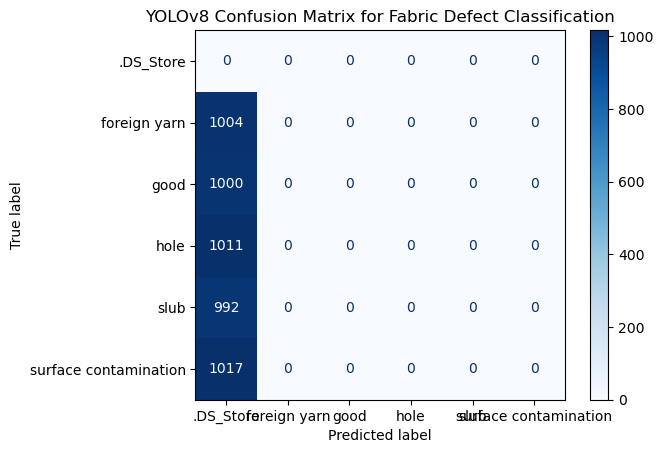

In [4]:
import os
import numpy as np
from ultralytics import YOLO
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from tqdm import tqdm

# Load YOLOv8 model
weights = '/Users/randithasenarathne/FYP/runs/classify/train/weights/best.pt'
model = YOLO(weights)

# Main dataset directory (it now contains 'val' as well)
data_dir = '/Users/randithasenarathne/FYP/FabricDefects/cls-multi/val'  # Ensure this path points to validation data

# Initialize lists to store true and predicted labels
true_labels = []
pred_labels = []

# Run through validation dataset and collect predictions
for folder_name in os.listdir(data_dir):
    folder_path = os.path.join(data_dir, folder_name)
    if os.path.isdir(folder_path):
        for image_name in tqdm(os.listdir(folder_path)):
            image_path = os.path.join(folder_path, image_name)
            
            # Get model prediction
            result = model(image_path, imgsz=64, task='classify', save=False)

            # Check the result object structure
            print("Result Object:", result)

            # Access the class probabilities
            try:
                probabilities = result[0].probs.numpy()  # Convert to numpy array
                print("Probabilities:", probabilities)
                print("Shape of Probabilities:", probabilities.shape)
                
                if probabilities is not None and len(probabilities):
                    # Extract the class index with the highest probability
                    predicted_label = np.argmax(probabilities)  # Get the predicted class index
                else:
                    predicted_label = -1  # Handle case with no prediction
            
            except Exception as e:
                print(f"Error accessing probabilities: {e}")
                predicted_label = -1  # Fallback

            # Append the predicted and true label
            true_labels.append(folder_name)  # Assuming folder name is the true label
            pred_labels.append(predicted_label)

# Convert true labels from folder names to numeric class labels
class_names = sorted(os.listdir(data_dir))  # Get class names from folder names
true_labels = [class_names.index(label) for label in true_labels]

# Generate confusion matrix
cm = confusion_matrix(true_labels, pred_labels)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)
plt.title("YOLOv8 Confusion Matrix for Fabric Defect Classification")
plt.show()

In [2]:
from ultralytics import YOLO
import cv2
import numpy as np
from PIL import Image

# Load the YOLO model from the best checkpoint
model_path = '/Users/randithasenarathne/FYP/runs/classify/train4/weights/best.pt'
model = YOLO(model_path)

def preprocess_image(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Resize the image to 64x64 if it's not already
    resized_image = cv2.resize(gray_image, (64, 64))
    
    # Normalize the image (if required by the model)
    normalized_image = resized_image.astype(np.float32) / 255.0
    
    # Expand dimensions to add channel for grayscale (1 channel)
    expanded_image = np.expand_dims(normalized_image, axis=-1)
    
    # Convert grayscale to 3 channels by duplicating the grayscale channel
    rgb_image = np.concatenate([expanded_image] * 3, axis=-1)
    
    # Convert to 8-bit unsigned integer (0-255) format required by PIL
    rgb_image = (rgb_image * 255).astype(np.uint8)
    
    # Add batch dimension (if needed by the model)
    batch_image = np.expand_dims(rgb_image, axis=0)
    
    return batch_image

def predict(image_path, model):
    # Preprocess the image
    image = preprocess_image(image_path)
    
    # Convert the image to a PIL Image
    image_pil = Image.fromarray(image[0])
    
    # Make prediction
    results = model.predict(image_pil)
    
    return results

def post_process_results(results):
    # Print results to debug
    print("Results:", results)
    
    # Extract the predicted class probabilities
    if isinstance(results, list) and len(results) > 0:
        results = results[0]
        
    # Assuming results.probs is an instance of ultralytics.engine.results.Probs
    if hasattr(results, 'probs'):
        probs = results.probs.data.cpu().numpy()  # Convert to numpy array
        predicted_class = np.argmax(probs)
    else:
        # Print results object to understand its structure
        print(results)
        raise ValueError("Unknown results structure")
    
    return predicted_class

# Example usage
image_path = '/Users/randithasenarathne/Desktop/Images/2.jpeg'  
results = predict(image_path, model)
predicted_class = post_process_results(results)
print(f'Predicted Class: {predicted_class}')


0: 64x64 foreign yarn 0.88, hole 0.05, slub 0.03, surface contamination 0.03, good 0.02, 5.0ms
Speed: 1.7ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Results: [ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'foreign yarn', 1: 'good', 2: 'hole', 3: 'slub', 4: 'surface contamination'}
obb: None
orig_img: array([[[106, 106, 106],
        [112, 112, 112],
        [113, 113, 113],
        ...,
        [ 93,  93,  93],
        [107, 107, 107],
        [ 90,  90,  90]],

       [[109, 109, 109],
        [109, 109, 109],
        [111, 111, 111],
        ...,
        [113, 113, 113],
        [ 93,  93,  93],
        [ 91,  91,  91]],

       [[100, 100, 100],
        [103, 103, 103],
        [110, 110, 110],
        ...,
        [113, 113, 113],
        [112, 112, 112],
        [ 90,  90,  90]],

       ...,

       [[134, 134, 134],
        [142, 142, 142],
        [146, 146, 146],
        .

In [3]:
import cv2
import numpy as np
from ultralytics import YOLO
from PIL import Image

# Load the YOLO model from the best checkpoint
model_path = '/Users/randithasenarathne/FYP/runs/classify/train4/weights/best.pt'
model = YOLO(model_path)

def preprocess_image(frame):
    # Convert the frame to grayscale
    gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    
    # Resize the frame to 64x64 if it's not already
    resized_frame = cv2.resize(gray_frame, (64, 64))
    
    # Normalize the frame (if required by the model)
    normalized_frame = resized_frame.astype(np.float32) / 255.0
    
    # Expand dimensions to add channel for grayscale (1 channel)
    expanded_frame = np.expand_dims(normalized_frame, axis=-1)
    
    # Convert grayscale to 3 channels by duplicating the grayscale channel
    rgb_frame = np.concatenate([expanded_frame] * 3, axis=-1)
    
    # Convert to 8-bit unsigned integer (0-255) format required by PIL
    rgb_frame = (rgb_frame * 255).astype(np.uint8)
    
    # Add batch dimension (if needed by the model)
    batch_frame = np.expand_dims(rgb_frame, axis=0)
    
    return batch_frame

def predict(frame, model):
    # Preprocess the frame
    image = preprocess_image(frame)
    
    # Convert the frame to a PIL Image
    image_pil = Image.fromarray(image[0])
    
    # Make prediction
    results = model.predict(image_pil)
    
    return results

def post_process_results(results):
    # Extract the predicted class probabilities
    if isinstance(results, list) and len(results) > 0:
        results = results[0]
        
    # Assuming results.probs is an instance of ultralytics.engine.results.Probs
    if hasattr(results, 'probs'):
        probs = results.probs.data.cpu().numpy()  # Convert to numpy array
        predicted_class = np.argmax(probs)
    else:
        # Print results object to understand its structure
        print(results)
        raise ValueError("Unknown results structure")
    
    return predicted_class

# Define class names
class_names = ['foreign yarn', 'good', 'hole', 'slub', 'surface contamination']

# Start video capture
cap = cv2.VideoCapture(0)  # Use 0 for the default camera or replace with video file path

while True:
    ret, frame = cap.read()
    if not ret:
        break
    
    # Predict the class for the current frame
    results = predict(frame, model)
    predicted_class = post_process_results(results)
    
    # Display the prediction on the frame
    cv2.putText(frame, f'Predicted Class: {class_names[predicted_class]}', (10, 30),
                cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, cv2.LINE_AA)
    
    # Show the frame
    cv2.imshow('Fabric Defect Detection', frame)
    
    # Break the loop on 'q' key press
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release video capture and close windows
cap.release()
cv2.destroyAllWindows()


0: 64x64 foreign yarn 0.24, good 0.24, hole 0.24, slub 0.16, surface contamination 0.12, 5.1ms
Speed: 1.5ms preprocess, 5.1ms inference, 0.1ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.63, foreign yarn 0.32, surface contamination 0.04, slub 0.01, good 0.01, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.57, foreign yarn 0.34, surface contamination 0.07, good 0.01, slub 0.01, 4.2ms
Speed: 1.1ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.50, foreign yarn 0.40, surface contamination 0.08, good 0.01, slub 0.01, 5.6ms
Speed: 1.6ms preprocess, 5.6ms inference, 0.1ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.51, foreign yarn 0.42, surface contamination 0.05, good 0.01, slub 0.00, 4.4ms
Speed: 1.0ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.48, foreign yarn 0.46, surface co

Speed: 0.9ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.59, foreign yarn 0.34, surface contamination 0.05, good 0.01, slub 0.01, 3.9ms
Speed: 0.7ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.60, foreign yarn 0.33, surface contamination 0.05, good 0.01, slub 0.01, 3.9ms
Speed: 0.9ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.58, foreign yarn 0.32, surface contamination 0.07, good 0.02, slub 0.01, 4.2ms
Speed: 0.9ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.57, foreign yarn 0.33, surface contamination 0.08, good 0.02, slub 0.01, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.54, foreign yarn 0.35, surface contamination 0.09, good 0.02, slub 0.01, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms po


0: 64x64 hole 0.54, foreign yarn 0.36, surface contamination 0.08, good 0.01, slub 0.01, 4.2ms
Speed: 0.9ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.62, foreign yarn 0.29, surface contamination 0.07, good 0.02, slub 0.01, 4.7ms
Speed: 1.0ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.62, foreign yarn 0.29, surface contamination 0.07, good 0.02, slub 0.01, 4.3ms
Speed: 1.0ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.59, foreign yarn 0.29, surface contamination 0.10, good 0.02, slub 0.01, 4.2ms
Speed: 0.9ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.68, foreign yarn 0.25, surface contamination 0.06, good 0.01, slub 0.00, 3.9ms
Speed: 1.0ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.51, foreign yarn 0.41, surface co

Speed: 1.0ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.52, hole 0.43, surface contamination 0.04, good 0.01, slub 0.00, 4.6ms
Speed: 0.8ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.53, foreign yarn 0.42, surface contamination 0.03, good 0.01, slub 0.00, 4.8ms
Speed: 0.9ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.51, hole 0.44, surface contamination 0.04, good 0.01, slub 0.00, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.54, hole 0.41, surface contamination 0.04, good 0.01, slub 0.00, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.52, foreign yarn 0.44, surface contamination 0.02, good 0.01, slub 0.00, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms po


0: 64x64 hole 0.53, foreign yarn 0.38, surface contamination 0.07, good 0.02, slub 0.00, 5.1ms
Speed: 1.0ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.51, foreign yarn 0.39, surface contamination 0.08, good 0.02, slub 0.00, 5.1ms
Speed: 1.1ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.67, foreign yarn 0.24, surface contamination 0.06, good 0.02, slub 0.00, 5.0ms
Speed: 0.9ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.62, foreign yarn 0.28, surface contamination 0.08, good 0.01, slub 0.00, 4.8ms
Speed: 0.9ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.54, foreign yarn 0.32, surface contamination 0.11, good 0.02, slub 0.01, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.62, foreign yarn 0.27, surface co

Speed: 1.0ms preprocess, 5.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.58, foreign yarn 0.35, surface contamination 0.05, good 0.01, slub 0.00, 4.9ms
Speed: 1.1ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.56, foreign yarn 0.37, surface contamination 0.06, good 0.01, slub 0.00, 4.6ms
Speed: 0.9ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.65, foreign yarn 0.28, surface contamination 0.04, good 0.01, slub 0.00, 5.4ms
Speed: 0.9ms preprocess, 5.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.68, foreign yarn 0.26, surface contamination 0.04, good 0.01, slub 0.00, 4.9ms
Speed: 1.1ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.57, foreign yarn 0.34, surface contamination 0.07, good 0.02, slub 0.00, 5.5ms
Speed: 0.9ms preprocess, 5.5ms inference, 0.0ms po


0: 64x64 hole 0.66, foreign yarn 0.27, surface contamination 0.06, good 0.01, slub 0.00, 5.1ms
Speed: 0.8ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.68, foreign yarn 0.25, surface contamination 0.05, good 0.02, slub 0.00, 6.4ms
Speed: 1.2ms preprocess, 6.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.56, foreign yarn 0.37, surface contamination 0.06, good 0.01, slub 0.00, 5.2ms
Speed: 1.0ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.57, foreign yarn 0.35, surface contamination 0.06, good 0.01, slub 0.00, 5.7ms
Speed: 1.2ms preprocess, 5.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.62, foreign yarn 0.31, surface contamination 0.06, good 0.01, slub 0.00, 5.1ms
Speed: 1.3ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.54, foreign yarn 0.37, surface co

Speed: 0.9ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.52, hole 0.41, surface contamination 0.05, good 0.01, slub 0.00, 6.0ms
Speed: 1.0ms preprocess, 6.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.65, hole 0.27, surface contamination 0.06, good 0.01, slub 0.00, 4.8ms
Speed: 1.1ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.58, hole 0.35, surface contamination 0.05, good 0.02, slub 0.00, 7.9ms
Speed: 1.1ms preprocess, 7.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.57, hole 0.35, surface contamination 0.06, good 0.02, slub 0.00, 4.4ms
Speed: 1.0ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.60, hole 0.32, surface contamination 0.06, good 0.02, slub 0.00, 5.6ms
Speed: 1.0ms preprocess, 5.6ms inference, 0.0ms po


0: 64x64 hole 0.69, foreign yarn 0.25, surface contamination 0.05, good 0.01, slub 0.00, 4.8ms
Speed: 1.0ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.70, foreign yarn 0.24, surface contamination 0.04, good 0.01, slub 0.00, 4.8ms
Speed: 1.0ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.60, foreign yarn 0.31, surface contamination 0.07, good 0.02, slub 0.00, 4.7ms
Speed: 1.2ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.73, foreign yarn 0.22, surface contamination 0.04, good 0.01, slub 0.00, 4.5ms
Speed: 0.8ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.80, foreign yarn 0.17, surface contamination 0.02, good 0.01, slub 0.00, 4.6ms
Speed: 1.1ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.70, foreign yarn 0.25, surface co

Speed: 1.3ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.69, foreign yarn 0.25, surface contamination 0.04, good 0.02, slub 0.00, 4.7ms
Speed: 1.1ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.80, foreign yarn 0.16, surface contamination 0.02, good 0.01, slub 0.00, 4.0ms
Speed: 1.4ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.71, foreign yarn 0.25, surface contamination 0.03, good 0.01, slub 0.00, 6.4ms
Speed: 1.2ms preprocess, 6.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.50, foreign yarn 0.41, surface contamination 0.07, good 0.03, slub 0.01, 4.1ms
Speed: 1.0ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.45, foreign yarn 0.43, surface contamination 0.09, good 0.02, slub 0.00, 4.0ms
Speed: 1.0ms preprocess, 4.0ms inference, 0.0ms po


0: 64x64 hole 0.61, foreign yarn 0.35, surface contamination 0.03, good 0.01, slub 0.00, 5.0ms
Speed: 1.1ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.53, foreign yarn 0.42, surface contamination 0.04, good 0.01, slub 0.00, 4.9ms
Speed: 1.0ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.48, foreign yarn 0.46, surface contamination 0.06, good 0.01, slub 0.00, 5.1ms
Speed: 1.2ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.51, foreign yarn 0.42, surface contamination 0.06, good 0.01, slub 0.00, 4.6ms
Speed: 0.9ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.59, foreign yarn 0.34, surface contamination 0.06, good 0.01, slub 0.00, 4.0ms
Speed: 1.0ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.56, foreign yarn 0.35, surface co

Speed: 1.3ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.57, foreign yarn 0.34, surface contamination 0.07, good 0.02, slub 0.00, 4.9ms
Speed: 1.1ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.53, foreign yarn 0.38, surface contamination 0.07, good 0.01, slub 0.00, 4.1ms
Speed: 1.2ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.54, foreign yarn 0.37, surface contamination 0.07, good 0.02, slub 0.00, 3.7ms
Speed: 0.7ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.56, foreign yarn 0.36, surface contamination 0.06, good 0.02, slub 0.00, 4.0ms
Speed: 0.8ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.47, hole 0.41, surface contamination 0.10, good 0.02, slub 0.00, 3.8ms
Speed: 0.9ms preprocess, 3.8ms inference, 0.0ms po


0: 64x64 hole 0.69, foreign yarn 0.23, surface contamination 0.05, good 0.02, slub 0.01, 4.0ms
Speed: 1.2ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.66, foreign yarn 0.26, surface contamination 0.05, good 0.02, slub 0.00, 5.2ms
Speed: 1.1ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.66, foreign yarn 0.26, surface contamination 0.05, good 0.02, slub 0.00, 4.0ms
Speed: 1.3ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.64, foreign yarn 0.27, surface contamination 0.06, good 0.02, slub 0.00, 5.0ms
Speed: 1.3ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.61, foreign yarn 0.30, surface contamination 0.07, good 0.02, slub 0.00, 4.7ms
Speed: 1.0ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.61, foreign yarn 0.29, surface co

Speed: 1.2ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.69, foreign yarn 0.24, surface contamination 0.04, good 0.02, slub 0.01, 5.8ms
Speed: 1.1ms preprocess, 5.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.72, foreign yarn 0.22, surface contamination 0.04, good 0.01, slub 0.00, 4.8ms
Speed: 1.1ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.66, foreign yarn 0.27, surface contamination 0.05, good 0.02, slub 0.00, 5.2ms
Speed: 1.3ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.71, foreign yarn 0.23, surface contamination 0.04, good 0.01, slub 0.01, 4.4ms
Speed: 1.0ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.69, foreign yarn 0.24, surface contamination 0.05, good 0.02, slub 0.01, 5.9ms
Speed: 1.3ms preprocess, 5.9ms inference, 0.0ms po


0: 64x64 hole 0.72, foreign yarn 0.23, surface contamination 0.03, good 0.01, slub 0.00, 6.1ms
Speed: 1.1ms preprocess, 6.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.58, foreign yarn 0.34, surface contamination 0.05, good 0.01, slub 0.00, 5.1ms
Speed: 1.2ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.54, foreign yarn 0.38, surface contamination 0.06, good 0.02, slub 0.01, 3.8ms
Speed: 1.3ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.57, foreign yarn 0.35, surface contamination 0.06, good 0.02, slub 0.01, 5.3ms
Speed: 1.0ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.60, foreign yarn 0.31, surface contamination 0.07, good 0.02, slub 0.00, 4.5ms
Speed: 1.0ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.65, foreign yarn 0.28, surface co

KeyboardInterrupt: 

In [1]:
import cv2
import numpy as np
from ultralytics import YOLO
from PIL import Image
from collections import deque
import ipywidgets as widgets
from IPython.display import display

# Load the YOLO model from the best checkpoint
model_path = '/Users/randithasenarathne/FYP/runs/classify/train4/weights/best.pt'
model = YOLO(model_path)

def preprocess_image(frame):
    # Convert the frame to grayscale
    gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    
    # Resize the frame to 64x64 if it's not already
    resized_frame = cv2.resize(gray_frame, (64, 64))
    
    # Normalize the frame (if required by the model)
    normalized_frame = resized_frame.astype(np.float32) / 255.0
    
    # Expand dimensions to add channel for grayscale (1 channel)
    expanded_frame = np.expand_dims(normalized_frame, axis=-1)
    
    # Convert grayscale to 3 channels by duplicating the grayscale channel
    rgb_frame = np.concatenate([expanded_frame] * 3, axis=-1)
    
    # Convert to 8-bit unsigned integer (0-255) format required by PIL
    rgb_frame = (rgb_frame * 255).astype(np.uint8)
    
    # Add batch dimension (if needed by the model)
    batch_frame = np.expand_dims(rgb_frame, axis=0)
    
    return batch_frame

def predict(frame, model):
    # Preprocess the frame
    image = preprocess_image(frame)
    
    # Convert the frame to a PIL Image
    image_pil = Image.fromarray(image[0])
    
    # Make prediction
    results = model.predict(image_pil)
    
    return results

def post_process_results(results):
    # Extract the predicted class probabilities
    if isinstance(results, list) and len(results) > 0:
        results = results[0]
        
    # Assuming results.probs is an instance of ultralytics.engine.results.Probs
    if hasattr(results, 'probs'):
        probs = results.probs.data.cpu().numpy()  # Convert to numpy array
        predicted_class = np.argmax(probs)
    else:
        # Print results object to understand its structure
        print(results)
        raise ValueError("Unknown results structure")
    
    return predicted_class

# Define class names
class_names = ['foreign yarn', 'good', 'hole', 'slub', 'surface contamination']

# Initialize widgets for length and width
length_widget = widgets.FloatText(description="Length (m):")
width_widget = widgets.FloatText(description="Width (m):")
display(length_widget, width_widget)

# Variables to handle pausing and fault rate calculation
is_paused = False
fault_points = 0
frame_count = 0
recent_defects = deque(maxlen=3)

def calculate_fault_rate(fault_points, roll_length, roll_width):
    return (fault_points * 0.84 * 100) / (roll_length * roll_width)

def process_frame(frame, is_paused, fault_points, recent_defects, frame_count):
    if not is_paused:
        # Predict the class for the current frame
        results = predict(frame, model)
        predicted_class = post_process_results(results)
        
        # Update fault points based on predictions
        if class_names[predicted_class] in ['slub', 'foreign yarn', 'surface contamination']:
            fault_points += 1
        elif class_names[predicted_class] == 'hole':
            fault_points += 4
        
        # Track recent defects to identify clusters of defects
        if class_names[predicted_class] != 'good':
            recent_defects.append((class_names[predicted_class], frame_count))
        
        # Check for long defects or clusters of defects
        if len(recent_defects) >= 3:
            if len(set(d[0] for d in recent_defects)) > 1 or (recent_defects[-1][1] - recent_defects[0][1]) < 30:
                fault_points += 4
                recent_defects.clear()
        
        # Display the prediction on the frame
        cv2.putText(frame, f'Predicted Class: {class_names[predicted_class]}', (10, 30),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, cv2.LINE_AA)
    
    # Show the frame
    cv2.imshow('Fabric Defect Detection', frame)
    
    frame_count += 1
    return fault_points, recent_defects, frame_count

def run_detection():
    # Get the roll length and width from widgets
    roll_length = length_widget.value
    roll_width = width_widget.value
    
    if roll_length == 0 or roll_width == 0:
        print("Please enter valid roll length and width.")
        return
    
    # Start video capture
    cap = cv2.VideoCapture(0)  # Use 0 for the default camera or replace with video file path
    
    global is_paused, fault_points, frame_count, recent_defects
    
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        
        fault_points, recent_defects, frame_count = process_frame(
            frame, is_paused, fault_points, recent_defects, frame_count)
        
        key = cv2.waitKey(1)
        if key & 0xFF == ord('q'):
            break
        elif key & 0xFF == ord('p'):
            is_paused = not is_paused
    
    # Calculate and print fault rate
    fault_rate = calculate_fault_rate(fault_points, roll_length, roll_width)
    print(f"Fault Rate: {fault_rate:.2f}%")
    
    # Release video capture and close windows
    cap.release()
    cv2.destroyAllWindows()

# Run the detection
run_detection()

FloatText(value=0.0, description='Length (m):')

FloatText(value=0.0, description='Width (m):')

Please enter valid roll length and width.


In [ ]:
run_detection()


0: 64x64 hole 0.25, good 0.22, foreign yarn 0.20, slub 0.19, surface contamination 0.13, 16.2ms
Speed: 18.3ms preprocess, 16.2ms inference, 0.1ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.50, surface contamination 0.25, hole 0.10, slub 0.09, good 0.06, 4.7ms
Speed: 1.1ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.57, hole 0.18, surface contamination 0.13, slub 0.07, good 0.05, 5.0ms
Speed: 0.9ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.53, hole 0.20, surface contamination 0.11, slub 0.10, good 0.06, 5.3ms
Speed: 1.2ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.61, hole 0.20, slub 0.08, surface contamination 0.08, good 0.03, 4.4ms
Speed: 1.0ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.51, hole 0.26, surface

Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.86, surface contamination 0.06, hole 0.03, slub 0.03, good 0.01, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.85, surface contamination 0.05, hole 0.04, slub 0.04, good 0.01, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.87, surface contamination 0.05, hole 0.04, slub 0.04, good 0.01, 4.0ms
Speed: 0.8ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.84, slub 0.05, surface contamination 0.05, hole 0.05, good 0.01, 4.1ms
Speed: 1.1ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.83, slub 0.06, surface contamination 0.05, hole 0.05, good 0.01, 3.8ms
Speed: 0.8ms preprocess, 3.8ms inference, 0.0ms po


0: 64x64 hole 0.46, foreign yarn 0.35, slub 0.12, surface contamination 0.06, good 0.01, 3.9ms
Speed: 0.8ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.48, hole 0.36, slub 0.09, surface contamination 0.05, good 0.01, 4.3ms
Speed: 0.9ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.59, hole 0.28, slub 0.09, surface contamination 0.03, good 0.01, 4.3ms
Speed: 1.0ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.69, hole 0.22, slub 0.07, surface contamination 0.02, good 0.01, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.59, hole 0.25, slub 0.11, surface contamination 0.04, good 0.01, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.60, hole 0.17, slub 0.12,

Speed: 0.8ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.96, hole 0.03, surface contamination 0.01, good 0.00, slub 0.00, 4.0ms
Speed: 0.8ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, surface contamination 0.00, good 0.00, slub 0.00, 4.6ms
Speed: 0.7ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.97, good 0.01, surface contamination 0.01, hole 0.01, slub 0.00, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.82, surface contamination 0.08, good 0.05, hole 0.04, slub 0.02, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.90, hole 0.08, surface contamination 0.01, good 0.01, slub 0.00, 4.7ms
Speed: 0.9ms preprocess, 4.7ms inference, 0.0ms po


0: 64x64 hole 0.60, foreign yarn 0.39, good 0.00, surface contamination 0.00, slub 0.00, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.87, foreign yarn 0.13, good 0.00, surface contamination 0.00, slub 0.00, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.53, hole 0.47, good 0.00, surface contamination 0.00, slub 0.00, 4.7ms
Speed: 0.7ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.80, hole 0.20, good 0.00, slub 0.00, surface contamination 0.00, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.90, hole 0.10, slub 0.00, surface contamination 0.00, good 0.00, 3.9ms
Speed: 0.9ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, hole 0.02, slub 0.00,

Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.78, slub 0.11, hole 0.09, surface contamination 0.01, good 0.01, 4.4ms
Speed: 0.9ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.62, hole 0.33, slub 0.05, surface contamination 0.00, good 0.00, 4.9ms
Speed: 0.8ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.55, hole 0.41, slub 0.03, surface contamination 0.01, good 0.00, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.74, foreign yarn 0.22, slub 0.03, good 0.00, surface contamination 0.00, 4.5ms
Speed: 0.9ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.79, foreign yarn 0.12, slub 0.08, good 0.00, surface contamination 0.00, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms po


0: 64x64 foreign yarn 0.45, hole 0.30, slub 0.14, good 0.06, surface contamination 0.05, 4.2ms
Speed: 1.3ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.72, hole 0.15, surface contamination 0.05, good 0.05, slub 0.03, 3.9ms
Speed: 0.7ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.53, hole 0.24, surface contamination 0.10, slub 0.08, good 0.05, 4.1ms
Speed: 0.8ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.50, hole 0.24, slub 0.13, surface contamination 0.09, good 0.05, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.59, good 0.14, hole 0.13, surface contamination 0.09, slub 0.04, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.69, good 0.13, surface co

Speed: 0.7ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.86, good 0.05, surface contamination 0.05, hole 0.02, slub 0.02, 4.5ms
Speed: 0.7ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.76, good 0.12, surface contamination 0.10, slub 0.01, hole 0.00, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.57, good 0.25, surface contamination 0.16, slub 0.01, hole 0.01, 4.9ms
Speed: 0.7ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.63, good 0.23, surface contamination 0.10, hole 0.03, slub 0.01, 4.7ms
Speed: 0.8ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.76, good 0.14, surface contamination 0.06, hole 0.03, slub 0.01, 4.7ms
Speed: 0.8ms preprocess, 4.7ms inference, 0.0ms po


0: 64x64 foreign yarn 0.99, hole 0.01, slub 0.00, surface contamination 0.00, good 0.00, 4.1ms
Speed: 0.8ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, slub 0.00, surface contamination 0.00, good 0.00, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, slub 0.00, surface contamination 0.00, good 0.00, 4.4ms
Speed: 0.6ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, slub 0.00, surface contamination 0.00, good 0.00, 4.6ms
Speed: 0.7ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, surface contamination 0.00, good 0.00, 4.7ms
Speed: 0.8ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00,

Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.94, hole 0.06, surface contamination 0.00, slub 0.00, good 0.00, 4.4ms
Speed: 0.9ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.84, hole 0.16, surface contamination 0.00, slub 0.00, good 0.00, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.77, hole 0.22, surface contamination 0.00, slub 0.00, good 0.00, 4.4ms
Speed: 1.0ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.87, hole 0.13, surface contamination 0.00, slub 0.00, good 0.00, 3.8ms
Speed: 0.7ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.85, hole 0.14, slub 0.00, surface contamination 0.00, good 0.00, 4.0ms
Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms po


0: 64x64 foreign yarn 0.99, hole 0.01, slub 0.00, surface contamination 0.00, good 0.00, 4.9ms
Speed: 1.1ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, hole 0.02, slub 0.00, surface contamination 0.00, good 0.00, 4.6ms
Speed: 0.8ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, slub 0.00, good 0.00, 4.1ms
Speed: 0.8ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, slub 0.00, good 0.00, 4.6ms
Speed: 0.7ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.87, hole 0.13, surface contamination 0.00, slub 0.00, good 0.00, 3.9ms
Speed: 0.6ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.56, foreign yarn 0.43, slub 0.00,

Speed: 0.9ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.46, foreign yarn 0.40, hole 0.08, slub 0.04, good 0.02, 4.0ms
Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.50, foreign yarn 0.39, hole 0.07, slub 0.03, good 0.01, 4.5ms
Speed: 0.7ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.34, hole 0.31, foreign yarn 0.27, slub 0.08, good 0.00, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.45, hole 0.34, surface contamination 0.12, slub 0.08, good 0.00, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.55, surface contamination 0.25, hole 0.15, slub 0.04, good 0.01, 4.7ms
Speed: 0.9ms preprocess, 4.7ms inference, 0.0ms po


0: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, surface contamination 0.00, good 0.00, 4.1ms
Speed: 1.0ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, surface contamination 0.00, good 0.00, 4.1ms
Speed: 0.8ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, surface contamination 0.00, good 0.00, 4.5ms
Speed: 0.7ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, slub 0.00, good 0.00, surface contamination 0.00, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.95, hole 0.04, slub 0.00, good 0.00, surface contamination 0.00, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.96, hole 0.04, slub 0.00,

Speed: 0.9ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.78, good 0.08, surface contamination 0.08, hole 0.05, slub 0.02, 4.9ms
Speed: 0.6ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.76, hole 0.09, good 0.07, surface contamination 0.06, slub 0.03, 4.6ms
Speed: 0.7ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.85, hole 0.05, good 0.04, surface contamination 0.03, slub 0.03, 4.8ms
Speed: 0.8ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.76, hole 0.10, slub 0.07, good 0.04, surface contamination 0.03, 4.2ms
Speed: 1.1ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.74, hole 0.13, slub 0.05, good 0.04, surface contamination 0.03, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms po


0: 64x64 foreign yarn 0.51, hole 0.46, surface contamination 0.02, good 0.01, slub 0.00, 4.4ms
Speed: 0.6ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.81, hole 0.13, surface contamination 0.03, good 0.02, slub 0.00, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.73, hole 0.18, good 0.05, surface contamination 0.02, slub 0.02, 4.5ms
Speed: 0.7ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.75, hole 0.17, good 0.05, surface contamination 0.02, slub 0.01, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.71, hole 0.18, good 0.05, surface contamination 0.04, slub 0.01, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.80, hole 0.10, good 0.05,

Speed: 0.8ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.90, hole 0.09, slub 0.01, surface contamination 0.00, good 0.00, 4.6ms
Speed: 1.0ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.88, hole 0.11, slub 0.01, good 0.00, surface contamination 0.00, 3.9ms
Speed: 0.8ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.72, hole 0.25, slub 0.03, good 0.00, surface contamination 0.00, 4.1ms
Speed: 0.8ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.60, hole 0.37, slub 0.03, good 0.00, surface contamination 0.00, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.59, foreign yarn 0.39, slub 0.02, good 0.00, surface contamination 0.00, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms po


0: 64x64 foreign yarn 0.96, hole 0.03, slub 0.01, surface contamination 0.01, good 0.00, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.88, hole 0.05, slub 0.03, surface contamination 0.03, good 0.01, 4.2ms
Speed: 0.9ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.85, hole 0.05, surface contamination 0.05, slub 0.03, good 0.02, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.85, hole 0.08, slub 0.03, surface contamination 0.03, good 0.01, 4.2ms
Speed: 0.6ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.80, hole 0.10, slub 0.07, surface contamination 0.03, good 0.01, 4.1ms
Speed: 0.8ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.50, surface contamination

Speed: 0.7ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.96, hole 0.03, surface contamination 0.01, slub 0.00, good 0.00, 4.5ms
Speed: 0.6ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.88, hole 0.10, slub 0.01, surface contamination 0.01, good 0.00, 4.6ms
Speed: 0.8ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.94, hole 0.05, slub 0.01, surface contamination 0.00, good 0.00, 4.9ms
Speed: 0.9ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.96, hole 0.04, slub 0.00, surface contamination 0.00, good 0.00, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.97, hole 0.03, slub 0.00, surface contamination 0.00, good 0.00, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms po


0: 64x64 foreign yarn 0.85, hole 0.12, surface contamination 0.02, slub 0.01, good 0.00, 4.2ms
Speed: 0.6ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.84, hole 0.15, slub 0.01, surface contamination 0.00, good 0.00, 4.8ms
Speed: 1.0ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, hole 0.02, surface contamination 0.00, good 0.00, slub 0.00, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, surface contamination 0.00, good 0.00, slub 0.00, 4.3ms
Speed: 0.9ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, surface contamination 0.00, good 0.00, slub 0.00, 3.7ms
Speed: 0.8ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, surface co

Speed: 0.7ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.96, hole 0.04, slub 0.00, good 0.00, surface contamination 0.00, 4.6ms
Speed: 0.7ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.97, hole 0.02, slub 0.00, good 0.00, surface contamination 0.00, 4.1ms
Speed: 1.0ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.96, hole 0.04, slub 0.00, good 0.00, surface contamination 0.00, 4.0ms
Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.97, hole 0.03, slub 0.00, good 0.00, surface contamination 0.00, 4.1ms
Speed: 0.9ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.97, hole 0.03, slub 0.00, good 0.00, surface contamination 0.00, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms po


0: 64x64 foreign yarn 0.81, hole 0.13, surface contamination 0.04, slub 0.02, good 0.01, 4.3ms
Speed: 1.0ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.85, hole 0.09, surface contamination 0.05, slub 0.02, good 0.00, 4.6ms
Speed: 0.8ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.79, hole 0.16, surface contamination 0.02, slub 0.02, good 0.00, 4.5ms
Speed: 0.8ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.94, hole 0.05, surface contamination 0.01, slub 0.01, good 0.00, 4.3ms
Speed: 1.0ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.88, hole 0.11, slub 0.00, surface contamination 0.00, good 0.00, 4.8ms
Speed: 0.8ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.75, hole 0.24, slub 0.01,

Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.45, surface contamination 0.25, hole 0.24, slub 0.04, good 0.02, 4.0ms
Speed: 0.8ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.44, surface contamination 0.29, hole 0.20, slub 0.04, good 0.03, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.41, surface contamination 0.31, hole 0.23, slub 0.04, good 0.02, 4.3ms
Speed: 0.9ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.34, foreign yarn 0.32, hole 0.29, slub 0.03, good 0.02, 4.5ms
Speed: 0.7ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.50, foreign yarn 0.27, hole 0.19, slub 0.02, good 0.02, 4.7ms
Speed: 1.0ms preprocess, 4.7ms inference, 0.0ms po


0: 64x64 foreign yarn 0.86, surface contamination 0.09, hole 0.04, good 0.01, slub 0.01, 3.9ms
Speed: 0.7ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.76, surface contamination 0.13, hole 0.07, good 0.02, slub 0.01, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.75, surface contamination 0.12, hole 0.10, good 0.02, slub 0.01, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.73, surface contamination 0.14, hole 0.09, good 0.03, slub 0.01, 4.1ms
Speed: 0.8ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.79, surface contamination 0.15, hole 0.04, good 0.02, slub 0.01, 4.3ms
Speed: 0.9ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.71, surface contamination

Speed: 0.8ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.74, surface contamination 0.16, hole 0.04, slub 0.03, good 0.02, 4.1ms
Speed: 0.8ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.69, surface contamination 0.18, hole 0.05, good 0.04, slub 0.04, 4.7ms
Speed: 0.8ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.73, surface contamination 0.15, hole 0.05, slub 0.04, good 0.03, 4.0ms
Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.74, surface contamination 0.15, hole 0.04, good 0.04, slub 0.03, 4.3ms
Speed: 0.6ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.75, surface contamination 0.13, hole 0.05, good 0.04, slub 0.03, 3.9ms
Speed: 0.9ms preprocess, 3.9ms inference, 0.0ms po


0: 64x64 foreign yarn 0.84, hole 0.12, slub 0.02, surface contamination 0.01, good 0.00, 3.8ms
Speed: 0.7ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.82, hole 0.13, slub 0.02, surface contamination 0.02, good 0.01, 3.5ms
Speed: 0.6ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.84, hole 0.12, surface contamination 0.02, slub 0.01, good 0.00, 3.6ms
Speed: 0.8ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.87, hole 0.08, surface contamination 0.03, slub 0.01, good 0.00, 3.8ms
Speed: 0.7ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.85, hole 0.10, surface contamination 0.04, slub 0.01, good 0.00, 3.8ms
Speed: 0.6ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.86, hole 0.08, surface co

Speed: 0.7ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.96, hole 0.04, good 0.00, surface contamination 0.00, slub 0.00, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.97, hole 0.03, good 0.00, surface contamination 0.00, slub 0.00, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.97, hole 0.03, good 0.00, surface contamination 0.00, slub 0.00, 4.6ms
Speed: 1.1ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.96, hole 0.04, good 0.00, surface contamination 0.00, slub 0.00, 4.5ms
Speed: 0.9ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, hole 0.02, good 0.00, surface contamination 0.00, slub 0.00, 4.6ms
Speed: 0.7ms preprocess, 4.6ms inference, 0.0ms po


0: 64x64 foreign yarn 0.72, hole 0.28, good 0.00, slub 0.00, surface contamination 0.00, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.00, good 0.00, surface contamination 0.00, slub 0.00, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, good 0.00, slub 0.00, 4.7ms
Speed: 1.0ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, good 0.00, slub 0.00, 4.6ms
Speed: 0.8ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, good 0.00, slub 0.00, 4.3ms
Speed: 1.0ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, good 0.00,

Speed: 1.0ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.96, hole 0.03, surface contamination 0.00, good 0.00, slub 0.00, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.66, hole 0.33, surface contamination 0.00, good 0.00, slub 0.00, 4.7ms
Speed: 0.7ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.68, foreign yarn 0.32, surface contamination 0.00, good 0.00, slub 0.00, 4.5ms
Speed: 0.9ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.56, hole 0.44, surface contamination 0.00, good 0.00, slub 0.00, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.57, foreign yarn 0.43, slub 0.00, surface contamination 0.00, good 0.00, 4.0ms
Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms po


0: 64x64 foreign yarn 0.74, hole 0.11, good 0.07, surface contamination 0.04, slub 0.04, 4.8ms
Speed: 0.7ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.88, hole 0.04, surface contamination 0.03, good 0.03, slub 0.02, 4.7ms
Speed: 0.9ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.93, surface contamination 0.03, hole 0.02, good 0.01, slub 0.01, 3.9ms
Speed: 0.7ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.85, surface contamination 0.05, hole 0.04, good 0.04, slub 0.02, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.81, surface contamination 0.10, hole 0.04, good 0.03, slub 0.02, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.83, hole 0.07, surface co

Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, surface contamination 0.00, hole 0.00, slub 0.00, good 0.00, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, surface contamination 0.00, hole 0.00, good 0.00, slub 0.00, 4.5ms
Speed: 0.9ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, slub 0.00, good 0.00, 4.6ms
Speed: 0.7ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, hole 0.00, slub 0.00, 4.7ms
Speed: 0.7ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, surface contamination 0.00, good 0.00, hole 0.00, slub 0.00, 4.6ms
Speed: 0.8ms preprocess, 4.6ms inference, 0.0ms po


0: 64x64 foreign yarn 0.88, surface contamination 0.11, hole 0.00, good 0.00, slub 0.00, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.95, surface contamination 0.05, hole 0.00, good 0.00, slub 0.00, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.94, surface contamination 0.05, hole 0.01, good 0.00, slub 0.00, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.92, surface contamination 0.06, hole 0.01, good 0.01, slub 0.00, 4.1ms
Speed: 0.8ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.95, surface contamination 0.02, good 0.02, hole 0.00, slub 0.00, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.81, good 0.09, surface co

Speed: 0.9ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.81, surface contamination 0.10, hole 0.06, slub 0.02, good 0.00, 4.0ms
Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, slub 0.00, surface contamination 0.00, good 0.00, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, good 0.00, hole 0.00, slub 0.00, surface contamination 0.00, 4.2ms
Speed: 0.9ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.00, good 0.00, surface contamination 0.00, slub 0.00, 4.3ms
Speed: 1.1ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, surface contamination 0.01, good 0.00, hole 0.00, slub 0.00, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms po


0: 64x64 foreign yarn 0.99, hole 0.01, good 0.00, surface contamination 0.00, slub 0.00, 3.9ms
Speed: 0.7ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, surface contamination 0.00, good 0.00, slub 0.00, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, good 0.00, slub 0.00, 4.4ms
Speed: 0.9ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, good 0.00, surface contamination 0.00, slub 0.00, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, surface contamination 0.00, good 0.00, slub 0.00, 4.3ms
Speed: 1.0ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, surface co

Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.91, surface contamination 0.08, hole 0.01, slub 0.00, good 0.00, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.91, surface contamination 0.08, hole 0.00, slub 0.00, good 0.00, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.93, surface contamination 0.07, hole 0.01, slub 0.00, good 0.00, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.96, surface contamination 0.04, hole 0.00, good 0.00, slub 0.00, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.95, surface contamination 0.05, hole 0.00, slub 0.00, good 0.00, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms po


0: 64x64 foreign yarn 0.99, surface contamination 0.01, hole 0.00, slub 0.00, good 0.00, 3.8ms
Speed: 0.8ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, surface contamination 0.01, hole 0.00, slub 0.00, good 0.00, 3.9ms
Speed: 0.8ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, surface contamination 0.01, hole 0.00, slub 0.00, good 0.00, 3.8ms
Speed: 0.8ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, surface contamination 0.01, hole 0.00, slub 0.00, good 0.00, 4.8ms
Speed: 0.9ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, surface contamination 0.01, hole 0.00, slub 0.00, good 0.00, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.97, surface contamination

Speed: 0.9ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, surface contamination 0.02, hole 0.00, slub 0.00, good 0.00, 4.0ms
Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.96, surface contamination 0.03, hole 0.00, slub 0.00, good 0.00, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.97, surface contamination 0.03, hole 0.00, slub 0.00, good 0.00, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.96, surface contamination 0.03, hole 0.00, slub 0.00, good 0.00, 4.1ms
Speed: 0.8ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.97, surface contamination 0.02, hole 0.00, slub 0.00, good 0.00, 4.3ms
Speed: 1.1ms preprocess, 4.3ms inference, 0.0ms po


0: 64x64 foreign yarn 0.98, hole 0.02, surface contamination 0.00, slub 0.00, good 0.00, 4.4ms
Speed: 0.6ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, hole 0.02, surface contamination 0.00, slub 0.00, good 0.00, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.96, hole 0.04, surface contamination 0.00, slub 0.00, good 0.00, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.97, hole 0.02, surface contamination 0.00, slub 0.00, good 0.00, 4.5ms
Speed: 1.1ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, surface contamination 0.00, slub 0.00, good 0.00, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, surface co

Speed: 0.6ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.97, hole 0.02, surface contamination 0.00, slub 0.00, good 0.00, 3.5ms
Speed: 0.6ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, hole 0.01, surface contamination 0.00, slub 0.00, good 0.00, 3.6ms
Speed: 0.7ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, surface contamination 0.00, slub 0.00, good 0.00, 3.6ms
Speed: 0.6ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, hole 0.01, surface contamination 0.00, slub 0.00, good 0.00, 3.5ms
Speed: 0.7ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, hole 0.02, slub 0.00, surface contamination 0.00, good 0.00, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms po


0: 64x64 foreign yarn 0.90, hole 0.06, surface contamination 0.03, slub 0.01, good 0.00, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.51, foreign yarn 0.28, slub 0.12, surface contamination 0.08, good 0.01, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.54, foreign yarn 0.30, surface contamination 0.09, slub 0.06, good 0.01, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.50, hole 0.36, surface contamination 0.10, slub 0.03, good 0.01, 4.5ms
Speed: 0.8ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.67, foreign yarn 0.27, surface contamination 0.03, slub 0.02, good 0.01, 4.7ms
Speed: 1.0ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.64, foreign yarn 0.29, surface co

Speed: 0.8ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.43, hole 0.31, surface contamination 0.12, slub 0.09, good 0.05, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.50, hole 0.31, surface contamination 0.10, slub 0.06, good 0.03, 4.3ms
Speed: 0.6ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.49, hole 0.31, surface contamination 0.11, slub 0.07, good 0.03, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.45, hole 0.36, surface contamination 0.11, slub 0.05, good 0.02, 4.2ms
Speed: 0.9ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.57, hole 0.22, surface contamination 0.13, slub 0.07, good 0.02, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms po


0: 64x64 foreign yarn 0.87, surface contamination 0.07, hole 0.03, slub 0.02, good 0.01, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.93, surface contamination 0.04, hole 0.02, slub 0.01, good 0.00, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.94, surface contamination 0.03, hole 0.02, slub 0.01, good 0.00, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.94, surface contamination 0.03, hole 0.02, slub 0.01, good 0.01, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.94, surface contamination 0.03, hole 0.02, slub 0.01, good 0.01, 4.4ms
Speed: 1.0ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.92, surface contamination

Speed: 1.1ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, good 0.00, surface contamination 0.00, slub 0.00, 4.6ms
Speed: 0.8ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, surface contamination 0.00, good 0.00, slub 0.00, 4.8ms
Speed: 0.8ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.00, surface contamination 0.00, good 0.00, slub 0.00, 4.9ms
Speed: 0.7ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, hole 0.02, surface contamination 0.00, good 0.00, slub 0.00, 4.7ms
Speed: 0.8ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.89, hole 0.11, surface contamination 0.00, slub 0.00, good 0.00, 4.9ms
Speed: 0.7ms preprocess, 4.9ms inference, 0.0ms po


0: 64x64 foreign yarn 0.97, hole 0.02, slub 0.00, surface contamination 0.00, good 0.00, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, surface contamination 0.00, good 0.00, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, surface contamination 0.00, good 0.00, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, surface contamination 0.00, good 0.00, 4.7ms
Speed: 1.0ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, surface contamination 0.01, hole 0.00, slub 0.00, good 0.00, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, surface contamination

Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.60, slub 0.22, hole 0.11, surface contamination 0.05, good 0.02, 4.1ms
Speed: 0.8ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.57, slub 0.25, hole 0.09, surface contamination 0.07, good 0.02, 4.5ms
Speed: 1.0ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.70, slub 0.12, surface contamination 0.10, hole 0.05, good 0.03, 4.3ms
Speed: 0.6ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.72, slub 0.13, hole 0.08, surface contamination 0.05, good 0.02, 4.4ms
Speed: 0.9ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.55, slub 0.24, hole 0.11, surface contamination 0.06, good 0.04, 4.0ms
Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms po


0: 64x64 foreign yarn 0.91, slub 0.06, hole 0.02, surface contamination 0.01, good 0.00, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.91, slub 0.06, hole 0.02, surface contamination 0.01, good 0.01, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.94, slub 0.04, hole 0.01, surface contamination 0.01, good 0.00, 4.5ms
Speed: 0.9ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.81, slub 0.14, hole 0.02, surface contamination 0.01, good 0.01, 4.8ms
Speed: 0.7ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.83, slub 0.10, surface contamination 0.03, hole 0.02, good 0.02, 4.5ms
Speed: 0.8ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.89, slub 0.05, surface co

Speed: 1.0ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.52, slub 0.43, hole 0.05, surface contamination 0.01, good 0.00, 4.5ms
Speed: 1.0ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.60, slub 0.26, hole 0.13, surface contamination 0.01, good 0.00, 4.8ms
Speed: 0.9ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.72, slub 0.17, hole 0.07, surface contamination 0.02, good 0.02, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.84, surface contamination 0.05, slub 0.05, hole 0.03, good 0.01, 4.8ms
Speed: 0.9ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.89, surface contamination 0.04, slub 0.03, hole 0.02, good 0.01, 4.8ms
Speed: 0.7ms preprocess, 4.8ms inference, 0.0ms po


0: 64x64 foreign yarn 0.75, slub 0.15, hole 0.07, surface contamination 0.02, good 0.01, 4.0ms
Speed: 0.8ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.82, slub 0.09, hole 0.07, surface contamination 0.01, good 0.01, 3.9ms
Speed: 0.8ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.91, slub 0.04, hole 0.04, surface contamination 0.01, good 0.01, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.82, slub 0.10, hole 0.05, surface contamination 0.02, good 0.01, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.84, slub 0.08, hole 0.03, surface contamination 0.03, good 0.02, 4.5ms
Speed: 0.7ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.87, slub 0.05, hole 0.05,

Speed: 0.6ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.60, foreign yarn 0.24, hole 0.13, good 0.02, surface contamination 0.01, 3.8ms
Speed: 0.8ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.40, slub 0.31, hole 0.23, surface contamination 0.04, good 0.01, 3.9ms
Speed: 0.8ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.54, slub 0.31, hole 0.08, good 0.04, surface contamination 0.04, 4.0ms
Speed: 1.0ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.68, foreign yarn 0.22, hole 0.07, good 0.03, surface contamination 0.01, 3.9ms
Speed: 0.8ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.87, foreign yarn 0.07, hole 0.05, good 0.01, surface contamination 0.01, 3.7ms
Speed: 0.7ms preprocess, 3.7ms inference, 0.0ms po


0: 64x64 slub 0.82, foreign yarn 0.11, good 0.05, surface contamination 0.02, hole 0.01, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.88, foreign yarn 0.08, good 0.02, surface contamination 0.01, hole 0.01, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.97, foreign yarn 0.02, good 0.01, surface contamination 0.00, hole 0.00, 4.5ms
Speed: 1.0ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.99, foreign yarn 0.01, good 0.00, hole 0.00, surface contamination 0.00, 4.3ms
Speed: 0.9ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.94, foreign yarn 0.04, good 0.01, hole 0.01, surface contamination 0.00, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.83, foreign yarn 0.11, good 0.03,

Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.48, foreign yarn 0.35, good 0.11, hole 0.03, surface contamination 0.03, 4.5ms
Speed: 0.7ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.58, foreign yarn 0.26, good 0.10, hole 0.03, surface contamination 0.03, 4.7ms
Speed: 0.8ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.70, foreign yarn 0.18, good 0.08, surface contamination 0.02, hole 0.02, 4.5ms
Speed: 0.7ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.51, foreign yarn 0.36, good 0.08, hole 0.03, surface contamination 0.02, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.64, foreign yarn 0.23, good 0.09, surface contamination 0.03, hole 0.02, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms po


0: 64x64 slub 0.93, foreign yarn 0.04, good 0.02, surface contamination 0.01, hole 0.00, 4.9ms
Speed: 0.8ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.88, foreign yarn 0.07, good 0.03, surface contamination 0.02, hole 0.00, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.95, foreign yarn 0.02, good 0.02, surface contamination 0.01, hole 0.00, 4.8ms
Speed: 0.8ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.95, good 0.02, foreign yarn 0.02, surface contamination 0.01, hole 0.00, 4.8ms
Speed: 0.8ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.96, good 0.02, foreign yarn 0.01, surface contamination 0.01, hole 0.00, 4.7ms
Speed: 0.7ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.96, good 0.01, foreign yarn 0.01,

Speed: 0.8ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.69, foreign yarn 0.19, good 0.08, surface contamination 0.02, hole 0.01, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.64, foreign yarn 0.22, good 0.08, surface contamination 0.04, hole 0.02, 4.8ms
Speed: 0.7ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.55, foreign yarn 0.30, good 0.09, surface contamination 0.03, hole 0.02, 4.7ms
Speed: 0.7ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.47, foreign yarn 0.34, good 0.11, surface contamination 0.06, hole 0.02, 4.6ms
Speed: 0.6ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.50, foreign yarn 0.30, good 0.10, surface contamination 0.07, hole 0.03, 4.6ms
Speed: 0.6ms preprocess, 4.6ms inference, 0.0ms po


0: 64x64 slub 0.64, foreign yarn 0.19, surface contamination 0.08, good 0.08, hole 0.01, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.69, foreign yarn 0.17, good 0.08, surface contamination 0.05, hole 0.01, 4.2ms
Speed: 0.6ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.53, foreign yarn 0.26, surface contamination 0.11, good 0.09, hole 0.01, 4.2ms
Speed: 0.6ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.65, foreign yarn 0.19, surface contamination 0.08, good 0.08, hole 0.01, 4.0ms
Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.47, foreign yarn 0.31, surface contamination 0.10, good 0.10, hole 0.02, 4.2ms
Speed: 0.9ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.42, slub 0.39, good 0.11,

Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.69, good 0.12, foreign yarn 0.12, surface contamination 0.06, hole 0.01, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.75, good 0.09, foreign yarn 0.09, surface contamination 0.06, hole 0.01, 4.5ms
Speed: 0.7ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.85, foreign yarn 0.07, good 0.05, surface contamination 0.02, hole 0.01, 4.6ms
Speed: 1.0ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.79, foreign yarn 0.12, good 0.06, surface contamination 0.03, hole 0.01, 4.3ms
Speed: 0.6ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.65, foreign yarn 0.21, good 0.07, surface contamination 0.06, hole 0.01, 4.5ms
Speed: 0.8ms preprocess, 4.5ms inference, 0.0ms po


0: 64x64 slub 0.98, foreign yarn 0.01, good 0.00, hole 0.00, surface contamination 0.00, 4.7ms
Speed: 0.7ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.99, foreign yarn 0.01, good 0.00, surface contamination 0.00, hole 0.00, 4.5ms
Speed: 0.8ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.99, foreign yarn 0.01, good 0.00, surface contamination 0.00, hole 0.00, 4.0ms
Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.95, foreign yarn 0.02, good 0.02, surface contamination 0.01, hole 0.00, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.91, foreign yarn 0.05, good 0.02, surface contamination 0.01, hole 0.00, 4.4ms
Speed: 0.9ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.91, foreign yarn 0.06, good 0.02,

Speed: 0.9ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.80, foreign yarn 0.13, good 0.04, surface contamination 0.03, hole 0.01, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.93, foreign yarn 0.04, good 0.02, surface contamination 0.01, hole 0.00, 4.4ms
Speed: 1.0ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.92, foreign yarn 0.05, good 0.02, surface contamination 0.01, hole 0.00, 4.7ms
Speed: 0.7ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.91, foreign yarn 0.05, good 0.03, surface contamination 0.01, hole 0.01, 4.7ms
Speed: 0.6ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.91, foreign yarn 0.06, good 0.02, surface contamination 0.01, hole 0.00, 4.9ms
Speed: 1.0ms preprocess, 4.9ms inference, 0.0ms po


0: 64x64 slub 0.73, foreign yarn 0.22, good 0.04, surface contamination 0.01, hole 0.01, 4.1ms
Speed: 0.8ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.64, foreign yarn 0.30, good 0.03, hole 0.01, surface contamination 0.01, 4.5ms
Speed: 0.7ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.81, foreign yarn 0.14, good 0.02, hole 0.01, surface contamination 0.01, 4.5ms
Speed: 0.8ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.80, foreign yarn 0.14, good 0.03, hole 0.02, surface contamination 0.01, 4.8ms
Speed: 0.7ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.86, foreign yarn 0.09, good 0.03, surface contamination 0.01, hole 0.01, 4.7ms
Speed: 0.6ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.81, foreign yarn 0.14, good 0.03,

Speed: 0.6ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.47, foreign yarn 0.36, good 0.09, surface contamination 0.06, hole 0.02, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.72, foreign yarn 0.14, good 0.06, surface contamination 0.05, hole 0.02, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.80, foreign yarn 0.10, good 0.05, surface contamination 0.04, hole 0.01, 4.6ms
Speed: 0.8ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.69, foreign yarn 0.19, good 0.05, surface contamination 0.04, hole 0.02, 4.5ms
Speed: 0.9ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.68, foreign yarn 0.19, good 0.07, surface contamination 0.05, hole 0.02, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms po


0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, slub 0.00, good 0.00, 4.0ms
Speed: 1.0ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, slub 0.00, good 0.00, 3.8ms
Speed: 0.9ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, slub 0.00, good 0.00, 3.9ms
Speed: 0.7ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, slub 0.00, good 0.00, 3.9ms
Speed: 0.7ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, good 0.00, slub 0.00, 4.0ms
Speed: 0.9ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface co

Speed: 0.8ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.96, hole 0.02, surface contamination 0.01, good 0.00, slub 0.00, 4.5ms
Speed: 0.9ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.96, hole 0.03, surface contamination 0.01, good 0.00, slub 0.00, 4.3ms
Speed: 0.6ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.95, hole 0.04, surface contamination 0.01, good 0.01, slub 0.00, 4.6ms
Speed: 1.0ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.96, hole 0.03, surface contamination 0.01, good 0.00, slub 0.00, 4.2ms
Speed: 1.0ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, surface contamination 0.00, good 0.00, slub 0.00, 4.8ms
Speed: 0.8ms preprocess, 4.8ms inference, 0.0ms po


0: 64x64 foreign yarn 0.67, hole 0.16, surface contamination 0.14, slub 0.02, good 0.01, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.47, hole 0.42, surface contamination 0.06, slub 0.03, good 0.01, 4.5ms
Speed: 0.7ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.66, hole 0.29, surface contamination 0.04, slub 0.01, good 0.01, 3.9ms
Speed: 1.0ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.67, hole 0.20, surface contamination 0.10, slub 0.01, good 0.01, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.74, hole 0.13, surface contamination 0.12, slub 0.01, good 0.00, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.71, surface contamination

Speed: 0.8ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.49, surface contamination 0.30, hole 0.19, good 0.01, slub 0.01, 3.5ms
Speed: 0.6ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.49, surface contamination 0.35, hole 0.14, good 0.02, slub 0.01, 3.7ms
Speed: 0.7ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.56, surface contamination 0.27, hole 0.15, good 0.02, slub 0.01, 3.9ms
Speed: 0.8ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.55, surface contamination 0.27, hole 0.15, good 0.02, slub 0.01, 3.8ms
Speed: 1.2ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.48, surface contamination 0.30, hole 0.19, good 0.02, slub 0.01, 3.8ms
Speed: 0.8ms preprocess, 3.8ms inference, 0.0ms po


0: 64x64 foreign yarn 0.49, hole 0.36, surface contamination 0.13, slub 0.02, good 0.01, 4.1ms
Speed: 1.0ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.52, hole 0.35, surface contamination 0.11, slub 0.02, good 0.01, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.51, hole 0.24, surface contamination 0.21, slub 0.02, good 0.01, 4.2ms
Speed: 0.9ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.57, hole 0.26, surface contamination 0.13, slub 0.02, good 0.01, 4.2ms
Speed: 0.9ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.51, hole 0.38, surface contamination 0.08, slub 0.02, good 0.00, 3.9ms
Speed: 0.7ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.56, hole 0.29, surface co

Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.85, surface contamination 0.10, hole 0.04, good 0.00, slub 0.00, 4.3ms
Speed: 0.9ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.85, surface contamination 0.10, hole 0.04, good 0.00, slub 0.00, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.80, surface contamination 0.13, hole 0.06, good 0.01, slub 0.00, 4.5ms
Speed: 0.8ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.82, surface contamination 0.13, hole 0.04, good 0.00, slub 0.00, 4.2ms
Speed: 0.9ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.78, surface contamination 0.13, hole 0.08, slub 0.01, good 0.01, 3.7ms
Speed: 0.7ms preprocess, 3.7ms inference, 0.0ms po


0: 64x64 hole 0.85, foreign yarn 0.13, surface contamination 0.01, slub 0.00, good 0.00, 3.9ms
Speed: 0.7ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.73, foreign yarn 0.20, surface contamination 0.05, good 0.02, slub 0.01, 4.0ms
Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.77, foreign yarn 0.20, surface contamination 0.02, slub 0.00, good 0.00, 4.1ms
Speed: 1.0ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.77, hole 0.17, surface contamination 0.05, good 0.01, slub 0.01, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.90, hole 0.07, surface contamination 0.02, good 0.01, slub 0.00, 4.0ms
Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.90, hole 0.08, surface co

Speed: 0.6ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, good 0.00, surface contamination 0.00, 4.7ms
Speed: 0.9ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, good 0.00, slub 0.00, 4.4ms
Speed: 0.9ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, good 0.00, slub 0.00, 4.6ms
Speed: 0.9ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, good 0.00, slub 0.00, 4.5ms
Speed: 0.9ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, good 0.00, slub 0.00, 4.6ms
Speed: 0.8ms preprocess, 4.6ms inference, 0.0ms po


0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, good 0.00, slub 0.00, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, good 0.00, slub 0.00, 4.3ms
Speed: 1.0ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, slub 0.00, good 0.00, 3.6ms
Speed: 0.9ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, slub 0.00, good 0.00, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, good 0.00, slub 0.00, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface co

Speed: 0.9ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, surface contamination 0.00, slub 0.00, good 0.00, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, hole 0.02, surface contamination 0.00, slub 0.00, good 0.00, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, hole 0.02, surface contamination 0.00, slub 0.00, good 0.00, 4.3ms
Speed: 0.6ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, hole 0.02, surface contamination 0.00, slub 0.00, good 0.00, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.96, hole 0.04, surface contamination 0.00, slub 0.00, good 0.00, 4.7ms
Speed: 0.8ms preprocess, 4.7ms inference, 0.0ms po


0: 64x64 foreign yarn 0.83, hole 0.16, surface contamination 0.01, slub 0.00, good 0.00, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.85, hole 0.14, surface contamination 0.01, slub 0.00, good 0.00, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.92, hole 0.08, surface contamination 0.01, good 0.00, slub 0.00, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.90, hole 0.09, surface contamination 0.01, good 0.00, slub 0.00, 4.5ms
Speed: 0.8ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.96, hole 0.03, surface contamination 0.01, good 0.00, slub 0.00, 3.7ms
Speed: 0.7ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.96, hole 0.03, surface co

Speed: 1.3ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, surface contamination 0.00, slub 0.00, good 0.00, 4.8ms
Speed: 0.8ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, hole 0.02, surface contamination 0.00, slub 0.00, good 0.00, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, hole 0.01, surface contamination 0.00, slub 0.00, good 0.00, 4.0ms
Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, surface contamination 0.00, slub 0.00, good 0.00, 4.2ms
Speed: 0.9ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, surface contamination 0.00, slub 0.00, good 0.00, 4.0ms
Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms po


0: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, good 0.00, surface contamination 0.00, 4.1ms
Speed: 0.8ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, good 0.00, surface contamination 0.00, 3.9ms
Speed: 0.7ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, good 0.00, surface contamination 0.00, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, good 0.00, surface contamination 0.00, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, good 0.00, surface contamination 0.00, 4.3ms
Speed: 0.9ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00,

Speed: 0.7ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.58, slub 0.23, surface contamination 0.09, good 0.06, hole 0.05, 3.9ms
Speed: 0.8ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.62, slub 0.19, hole 0.07, surface contamination 0.06, good 0.06, 4.0ms
Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.51, slub 0.23, hole 0.15, surface contamination 0.06, good 0.05, 3.9ms
Speed: 0.7ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.45, hole 0.25, slub 0.18, surface contamination 0.06, good 0.05, 4.2ms
Speed: 0.9ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.31, slub 0.27, foreign yarn 0.27, surface contamination 0.11, good 0.05, 4.6ms
Speed: 0.7ms preprocess, 4.6ms inference, 0.0ms po


0: 64x64 slub 0.98, hole 0.01, foreign yarn 0.01, good 0.00, surface contamination 0.00, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.94, foreign yarn 0.03, hole 0.03, surface contamination 0.00, good 0.00, 4.9ms
Speed: 0.8ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.45, foreign yarn 0.45, hole 0.09, surface contamination 0.01, good 0.01, 4.6ms
Speed: 0.8ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.80, slub 0.09, hole 0.07, surface contamination 0.02, good 0.01, 4.6ms
Speed: 0.8ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.88, slub 0.06, hole 0.04, surface contamination 0.01, good 0.01, 4.5ms
Speed: 0.8ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.96, hole 0.02, slub 0.01,

Speed: 1.0ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.97, hole 0.01, surface contamination 0.01, slub 0.00, good 0.00, 4.4ms
Speed: 0.9ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, hole 0.01, surface contamination 0.00, slub 0.00, good 0.00, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.96, hole 0.02, slub 0.01, surface contamination 0.00, good 0.00, 4.3ms
Speed: 1.1ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.78, hole 0.10, slub 0.10, good 0.01, surface contamination 0.01, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.87, hole 0.05, slub 0.04, surface contamination 0.02, good 0.01, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms po


0: 64x64 foreign yarn 0.99, hole 0.01, surface contamination 0.00, good 0.00, slub 0.00, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, surface contamination 0.00, good 0.00, slub 0.00, 4.5ms
Speed: 0.9ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.94, hole 0.05, surface contamination 0.00, good 0.00, slub 0.00, 4.0ms
Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.95, hole 0.04, surface contamination 0.00, slub 0.00, good 0.00, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.96, hole 0.03, surface contamination 0.00, good 0.00, slub 0.00, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.97, hole 0.03, surface co

Speed: 1.0ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.72, hole 0.15, slub 0.07, good 0.03, surface contamination 0.02, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.65, hole 0.16, slub 0.10, good 0.04, surface contamination 0.04, 4.3ms
Speed: 0.9ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.75, slub 0.10, hole 0.07, surface contamination 0.04, good 0.03, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.68, slub 0.14, hole 0.11, surface contamination 0.04, good 0.03, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.56, slub 0.23, hole 0.12, surface contamination 0.05, good 0.04, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms po


0: 64x64 foreign yarn 0.62, hole 0.21, slub 0.11, good 0.03, surface contamination 0.02, 4.1ms
Speed: 0.9ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.64, hole 0.19, slub 0.12, good 0.03, surface contamination 0.02, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.68, hole 0.15, slub 0.12, good 0.03, surface contamination 0.02, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.67, hole 0.22, slub 0.09, good 0.02, surface contamination 0.01, 4.0ms
Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.56, hole 0.29, slub 0.13, good 0.01, surface contamination 0.01, 4.2ms
Speed: 1.0ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.47, hole 0.43, slub 0.07,

Speed: 0.7ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.69, hole 0.20, slub 0.09, good 0.01, surface contamination 0.01, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.78, hole 0.15, slub 0.06, good 0.01, surface contamination 0.00, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.78, hole 0.16, slub 0.06, good 0.00, surface contamination 0.00, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.81, hole 0.12, slub 0.06, good 0.00, surface contamination 0.00, 4.8ms
Speed: 0.7ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.83, hole 0.12, slub 0.05, good 0.01, surface contamination 0.00, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms po


0: 64x64 foreign yarn 0.93, hole 0.06, surface contamination 0.00, good 0.00, slub 0.00, 4.9ms
Speed: 1.0ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.88, hole 0.11, surface contamination 0.00, good 0.00, slub 0.00, 4.8ms
Speed: 0.7ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.91, hole 0.08, surface contamination 0.01, slub 0.00, good 0.00, 4.2ms
Speed: 1.1ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.93, hole 0.07, surface contamination 0.00, slub 0.00, good 0.00, 4.0ms
Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.94, hole 0.05, surface contamination 0.00, slub 0.00, good 0.00, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.90, hole 0.09, slub 0.00,

Speed: 1.0ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, slub 0.00, good 0.00, 4.5ms
Speed: 0.8ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, slub 0.00, good 0.00, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, slub 0.00, good 0.00, 4.6ms
Speed: 0.8ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, slub 0.00, good 0.00, 4.6ms
Speed: 1.0ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, surface contamination 0.00, slub 0.00, good 0.00, 4.6ms
Speed: 0.7ms preprocess, 4.6ms inference, 0.0ms po


0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, slub 0.00, good 0.00, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, surface contamination 0.00, slub 0.00, good 0.00, 4.1ms
Speed: 0.8ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, hole 0.01, surface contamination 0.00, slub 0.00, good 0.00, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, hole 0.02, surface contamination 0.00, slub 0.00, good 0.00, 4.4ms
Speed: 0.9ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.97, hole 0.03, surface contamination 0.00, slub 0.00, good 0.00, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, surface co

Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, good 0.00, surface contamination 0.00, slub 0.00, 3.9ms
Speed: 0.7ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, good 0.00, surface contamination 0.00, slub 0.00, 4.3ms
Speed: 0.9ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, good 0.00, surface contamination 0.00, slub 0.00, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, good 0.00, surface contamination 0.00, slub 0.00, 4.5ms
Speed: 0.8ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, good 0.00, slub 0.00, 4.3ms
Speed: 1.1ms preprocess, 4.3ms inference, 0.0ms po


0: 64x64 foreign yarn 1.00, hole 0.00, good 0.00, surface contamination 0.00, slub 0.00, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, good 0.00, slub 0.00, surface contamination 0.00, 4.8ms
Speed: 0.8ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, good 0.00, slub 0.00, surface contamination 0.00, 4.9ms
Speed: 0.7ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.00, surface contamination 0.00, good 0.00, slub 0.00, 4.7ms
Speed: 0.7ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.92, surface contamination 0.06, hole 0.02, good 0.01, slub 0.00, 4.8ms
Speed: 0.8ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.91, surface contamination

Speed: 0.9ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.72, surface contamination 0.26, hole 0.01, good 0.00, slub 0.00, 5.0ms
Speed: 1.0ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.81, surface contamination 0.16, slub 0.01, hole 0.01, good 0.01, 4.2ms
Speed: 1.1ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.85, surface contamination 0.13, hole 0.01, good 0.01, slub 0.01, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.80, surface contamination 0.16, hole 0.02, slub 0.01, good 0.01, 4.4ms
Speed: 0.9ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.56, surface contamination 0.34, slub 0.04, hole 0.04, good 0.02, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms po


0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, slub 0.00, good 0.00, 4.5ms
Speed: 0.8ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, good 0.00, slub 0.00, 4.1ms
Speed: 0.8ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, good 0.00, slub 0.00, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, slub 0.00, good 0.00, 4.0ms
Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, good 0.00, slub 0.00, 4.3ms
Speed: 0.6ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, good 0.00,

Speed: 0.7ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.97, hole 0.02, slub 0.00, surface contamination 0.00, good 0.00, 4.4ms
Speed: 0.9ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, hole 0.01, surface contamination 0.00, slub 0.00, good 0.00, 4.5ms
Speed: 0.8ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.00, surface contamination 0.00, slub 0.00, good 0.00, 4.6ms
Speed: 0.7ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, surface contamination 0.01, hole 0.00, slub 0.00, good 0.00, 4.9ms
Speed: 0.7ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.96, surface contamination 0.02, hole 0.01, slub 0.01, good 0.00, 4.7ms
Speed: 0.7ms preprocess, 4.7ms inference, 0.0ms po


0: 64x64 foreign yarn 0.97, hole 0.01, surface contamination 0.01, slub 0.00, good 0.00, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.97, surface contamination 0.01, hole 0.01, slub 0.00, good 0.00, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.96, surface contamination 0.02, hole 0.01, slub 0.00, good 0.00, 4.6ms
Speed: 0.7ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.97, surface contamination 0.02, hole 0.01, slub 0.00, good 0.00, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.97, surface contamination 0.01, hole 0.01, slub 0.00, good 0.00, 4.8ms
Speed: 0.8ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.97, surface contamination

Speed: 0.7ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, good 0.00, surface contamination 0.00, slub 0.00, 4.8ms
Speed: 0.8ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, surface contamination 0.00, slub 0.00, good 0.00, 4.7ms
Speed: 0.7ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, surface contamination 0.00, slub 0.00, good 0.00, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, surface contamination 0.01, hole 0.01, slub 0.00, good 0.00, 3.6ms
Speed: 0.7ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.97, surface contamination 0.01, hole 0.01, slub 0.00, good 0.00, 3.9ms
Speed: 1.0ms preprocess, 3.9ms inference, 0.0ms po


0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, good 0.00, slub 0.00, 4.7ms
Speed: 0.7ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.95, hole 0.05, surface contamination 0.00, good 0.00, slub 0.00, 4.2ms
Speed: 1.2ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.88, hole 0.12, surface contamination 0.00, good 0.00, slub 0.00, 4.7ms
Speed: 0.8ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.93, hole 0.07, surface contamination 0.00, good 0.00, slub 0.00, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.93, hole 0.07, surface contamination 0.00, good 0.00, slub 0.00, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.94, hole 0.06, surface co

Speed: 1.1ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.92, hole 0.07, good 0.01, surface contamination 0.00, slub 0.00, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.88, hole 0.11, good 0.00, surface contamination 0.00, slub 0.00, 4.3ms
Speed: 0.6ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.88, hole 0.11, surface contamination 0.00, good 0.00, slub 0.00, 3.9ms
Speed: 0.9ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.92, hole 0.07, surface contamination 0.00, good 0.00, slub 0.00, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.94, hole 0.05, surface contamination 0.00, good 0.00, slub 0.00, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms po


0: 64x64 foreign yarn 0.70, hole 0.29, surface contamination 0.01, slub 0.00, good 0.00, 4.1ms
Speed: 0.8ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.69, hole 0.29, surface contamination 0.01, good 0.01, slub 0.00, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.78, hole 0.16, surface contamination 0.03, good 0.01, slub 0.01, 4.3ms
Speed: 0.9ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.81, hole 0.15, surface contamination 0.02, good 0.01, slub 0.01, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.72, hole 0.23, surface contamination 0.03, good 0.01, slub 0.01, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.56, hole 0.23, surface co

Speed: 0.9ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, slub 0.00, good 0.00, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, slub 0.00, good 0.00, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, slub 0.00, good 0.00, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, slub 0.00, good 0.00, 4.5ms
Speed: 1.4ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.93, hole 0.06, slub 0.00, surface contamination 0.00, good 0.00, 4.6ms
Speed: 0.9ms preprocess, 4.6ms inference, 0.0ms po


0: 64x64 foreign yarn 0.99, hole 0.01, surface contamination 0.00, slub 0.00, good 0.00, 4.3ms
Speed: 0.6ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, surface contamination 0.00, slub 0.00, good 0.00, 4.0ms
Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.95, hole 0.04, surface contamination 0.00, slub 0.00, good 0.00, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, hole 0.02, surface contamination 0.01, good 0.00, slub 0.00, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.96, surface contamination 0.03, hole 0.02, good 0.00, slub 0.00, 4.2ms
Speed: 0.9ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, surface contamination

Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, slub 0.00, surface contamination 0.00, good 0.00, 4.5ms
Speed: 0.8ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, slub 0.00, good 0.00, surface contamination 0.00, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, surface contamination 0.00, good 0.00, 4.0ms
Speed: 0.8ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, surface contamination 0.00, good 0.00, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, surface contamination 0.00, good 0.00, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms po


0: 64x64 foreign yarn 0.98, hole 0.01, slub 0.00, surface contamination 0.00, good 0.00, 4.2ms
Speed: 0.9ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, slub 0.00, surface contamination 0.00, good 0.00, 4.5ms
Speed: 1.0ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, slub 0.00, surface contamination 0.00, good 0.00, 4.6ms
Speed: 0.7ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, good 0.00, surface contamination 0.00, 4.4ms
Speed: 1.0ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, surface contamination 0.00, good 0.00, 4.9ms
Speed: 0.8ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00,

Speed: 0.8ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, surface contamination 0.00, hole 0.00, good 0.00, slub 0.00, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, surface contamination 0.00, hole 0.00, good 0.00, slub 0.00, 4.3ms
Speed: 0.9ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, good 0.00, slub 0.00, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, good 0.00, slub 0.00, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, slub 0.00, good 0.00, 4.5ms
Speed: 0.8ms preprocess, 4.5ms inference, 0.0ms po


0: 64x64 foreign yarn 0.99, hole 0.01, surface contamination 0.00, good 0.00, slub 0.00, 4.2ms
Speed: 1.0ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.00, surface contamination 0.00, good 0.00, slub 0.00, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, surface contamination 0.00, good 0.00, slub 0.00, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.96, hole 0.04, surface contamination 0.00, good 0.00, slub 0.00, 4.7ms
Speed: 0.8ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.75, hole 0.24, surface contamination 0.01, good 0.00, slub 0.00, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.57, hole 0.43, surface co

Speed: 0.8ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.59, surface contamination 0.37, hole 0.03, good 0.00, slub 0.00, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.80, surface contamination 0.17, hole 0.03, good 0.00, slub 0.00, 4.2ms
Speed: 1.0ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.65, surface contamination 0.33, hole 0.02, good 0.00, slub 0.00, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.72, surface contamination 0.24, hole 0.04, good 0.00, slub 0.00, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.54, surface contamination 0.42, hole 0.04, good 0.00, slub 0.00, 4.1ms
Speed: 0.8ms preprocess, 4.1ms inference, 0.0ms po


0: 64x64 foreign yarn 0.68, surface contamination 0.30, hole 0.01, good 0.00, slub 0.00, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.74, surface contamination 0.23, hole 0.02, good 0.00, slub 0.00, 4.1ms
Speed: 0.6ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.67, surface contamination 0.31, hole 0.01, good 0.00, slub 0.00, 4.0ms
Speed: 0.9ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.63, surface contamination 0.34, hole 0.02, good 0.00, slub 0.00, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.72, surface contamination 0.27, hole 0.01, good 0.00, slub 0.00, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.65, surface contamination

Speed: 0.8ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.87, surface contamination 0.10, hole 0.02, good 0.01, slub 0.00, 4.0ms
Speed: 0.8ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.95, surface contamination 0.04, hole 0.01, good 0.00, slub 0.00, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.81, surface contamination 0.14, hole 0.04, good 0.00, slub 0.00, 4.3ms
Speed: 0.9ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.91, surface contamination 0.06, hole 0.02, good 0.00, slub 0.00, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.83, surface contamination 0.15, hole 0.02, good 0.00, slub 0.00, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms po


0: 64x64 foreign yarn 0.93, hole 0.04, surface contamination 0.03, good 0.00, slub 0.00, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.94, surface contamination 0.03, hole 0.02, good 0.00, slub 0.00, 4.0ms
Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.81, surface contamination 0.13, hole 0.07, good 0.00, slub 0.00, 4.5ms
Speed: 0.7ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.61, hole 0.20, surface contamination 0.19, good 0.00, slub 0.00, 4.6ms
Speed: 0.7ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.49, surface contamination 0.42, hole 0.09, good 0.00, slub 0.00, 4.6ms
Speed: 0.8ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.54, foreign yarn

Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.82, surface contamination 0.10, hole 0.08, good 0.01, slub 0.00, 4.6ms
Speed: 0.8ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.90, surface contamination 0.06, hole 0.03, good 0.01, slub 0.00, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.82, surface contamination 0.15, hole 0.02, good 0.01, slub 0.00, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.82, surface contamination 0.16, hole 0.01, good 0.01, slub 0.00, 4.0ms
Speed: 0.9ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.58, surface contamination 0.39, hole 0.02, good 0.01, slub 0.00, 4.2ms
Speed: 0.9ms preprocess, 4.2ms inference, 0.0ms po


0: 64x64 foreign yarn 0.51, surface contamination 0.46, good 0.02, hole 0.01, slub 0.00, 3.8ms
Speed: 0.7ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.68, surface contamination 0.27, hole 0.03, good 0.02, slub 0.00, 3.9ms
Speed: 0.7ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.60, surface contamination 0.31, hole 0.07, good 0.02, slub 0.00, 4.3ms
Speed: 0.9ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.69, surface contamination 0.25, hole 0.04, good 0.01, slub 0.00, 4.7ms
Speed: 0.6ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.73, surface contamination 0.23, hole 0.03, good 0.01, slub 0.00, 3.9ms
Speed: 0.7ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.72, surface contamination

Speed: 1.1ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.79, surface contamination 0.18, hole 0.02, good 0.01, slub 0.00, 4.5ms
Speed: 0.8ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.75, surface contamination 0.21, good 0.02, hole 0.02, slub 0.00, 4.7ms
Speed: 0.9ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.79, surface contamination 0.17, hole 0.02, good 0.02, slub 0.00, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.78, surface contamination 0.18, hole 0.02, good 0.01, slub 0.00, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.76, surface contamination 0.21, hole 0.02, good 0.01, slub 0.00, 4.6ms
Speed: 0.7ms preprocess, 4.6ms inference, 0.0ms po


0: 64x64 foreign yarn 0.71, surface contamination 0.27, hole 0.01, good 0.01, slub 0.00, 4.5ms
Speed: 0.7ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.55, foreign yarn 0.44, good 0.01, hole 0.01, slub 0.00, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.54, surface contamination 0.45, good 0.01, hole 0.01, slub 0.00, 4.2ms
Speed: 0.9ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.60, foreign yarn 0.39, good 0.01, hole 0.00, slub 0.00, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.56, surface contamination 0.42, good 0.01, hole 0.01, slub 0.00, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.55, foreign yarn

Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.89, surface contamination 0.09, good 0.01, hole 0.00, slub 0.00, 4.9ms
Speed: 0.8ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.95, surface contamination 0.04, good 0.01, hole 0.00, slub 0.00, 4.5ms
Speed: 0.8ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.95, surface contamination 0.04, good 0.00, hole 0.00, slub 0.00, 4.7ms
Speed: 0.9ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.97, surface contamination 0.02, good 0.00, hole 0.00, slub 0.00, 4.5ms
Speed: 0.9ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.97, surface contamination 0.02, hole 0.01, good 0.00, slub 0.00, 3.6ms
Speed: 0.8ms preprocess, 3.6ms inference, 0.0ms po


0: 64x64 surface contamination 0.77, foreign yarn 0.21, hole 0.01, good 0.00, slub 0.00, 4.8ms
Speed: 0.7ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.71, foreign yarn 0.24, hole 0.04, good 0.01, slub 0.00, 4.7ms
Speed: 0.8ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.72, foreign yarn 0.18, hole 0.09, good 0.00, slub 0.00, 4.3ms
Speed: 1.1ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.46, foreign yarn 0.33, hole 0.21, good 0.00, slub 0.00, 3.8ms
Speed: 0.7ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.58, foreign yarn 0.35, hole 0.07, good 0.00, slub 0.00, 3.9ms
Speed: 0.9ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.54, foreign yarn

Speed: 0.9ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.50, surface contamination 0.32, hole 0.17, slub 0.01, good 0.00, 4.5ms
Speed: 0.8ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.33, surface contamination 0.33, hole 0.33, slub 0.01, good 0.00, 4.0ms
Speed: 0.8ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.41, hole 0.30, foreign yarn 0.27, slub 0.01, good 0.01, 4.3ms
Speed: 0.9ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.61, foreign yarn 0.26, hole 0.11, good 0.01, slub 0.01, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.64, foreign yarn 0.26, hole 0.09, good 0.00, slub 0.00, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms po


0: 64x64 foreign yarn 0.97, hole 0.02, surface contamination 0.01, good 0.00, slub 0.00, 3.8ms
Speed: 0.7ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.96, hole 0.03, surface contamination 0.02, good 0.00, slub 0.00, 3.9ms
Speed: 0.7ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.92, hole 0.05, surface contamination 0.03, good 0.00, slub 0.00, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.84, hole 0.11, surface contamination 0.05, good 0.00, slub 0.00, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.57, hole 0.41, surface contamination 0.02, good 0.00, slub 0.00, 4.6ms
Speed: 0.9ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.68, hole 0.30, surface co

Speed: 0.9ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, good 0.00, slub 0.00, 4.8ms
Speed: 0.7ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.90, hole 0.08, surface contamination 0.02, slub 0.00, good 0.00, 4.6ms
Speed: 0.8ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, surface contamination 0.00, good 0.00, slub 0.00, 4.4ms
Speed: 1.0ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, hole 0.01, surface contamination 0.00, good 0.00, slub 0.00, 4.4ms
Speed: 0.9ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, hole 0.02, surface contamination 0.00, good 0.00, slub 0.00, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms po


0: 64x64 hole 0.69, foreign yarn 0.28, surface contamination 0.02, good 0.00, slub 0.00, 4.5ms
Speed: 0.8ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.80, foreign yarn 0.18, surface contamination 0.02, good 0.00, slub 0.00, 4.6ms
Speed: 0.8ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.69, foreign yarn 0.26, surface contamination 0.03, good 0.01, slub 0.00, 4.8ms
Speed: 0.9ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.78, hole 0.15, surface contamination 0.06, good 0.01, slub 0.00, 4.1ms
Speed: 0.8ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.59, hole 0.39, surface contamination 0.02, slub 0.00, good 0.00, 3.9ms
Speed: 0.7ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.52, foreign yarn 0.46, surface co

Speed: 0.8ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.54, foreign yarn 0.29, hole 0.15, good 0.01, slub 0.01, 5.3ms
Speed: 0.7ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.52, hole 0.43, surface contamination 0.04, good 0.01, slub 0.00, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.70, foreign yarn 0.29, surface contamination 0.00, slub 0.00, good 0.00, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.75, foreign yarn 0.24, surface contamination 0.00, slub 0.00, good 0.00, 4.1ms
Speed: 0.8ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.75, hole 0.23, surface contamination 0.02, slub 0.00, good 0.00, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms po


0: 64x64 foreign yarn 0.88, surface contamination 0.09, hole 0.03, good 0.00, slub 0.00, 4.4ms
Speed: 1.1ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.87, surface contamination 0.09, hole 0.03, good 0.00, slub 0.00, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.79, surface contamination 0.14, hole 0.07, good 0.00, slub 0.00, 4.5ms
Speed: 1.0ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.81, hole 0.14, surface contamination 0.05, good 0.00, slub 0.00, 4.2ms
Speed: 0.9ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.85, surface contamination 0.07, hole 0.07, good 0.00, slub 0.00, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.87, hole 0.08, surface co

Speed: 0.7ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.66, foreign yarn 0.33, surface contamination 0.01, good 0.00, slub 0.00, 3.8ms
Speed: 0.7ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.53, hole 0.40, surface contamination 0.05, good 0.01, slub 0.01, 3.8ms
Speed: 0.8ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.65, hole 0.33, surface contamination 0.01, good 0.00, slub 0.00, 4.1ms
Speed: 0.9ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.70, hole 0.26, surface contamination 0.02, slub 0.01, good 0.00, 5.0ms
Speed: 1.2ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.58, foreign yarn 0.40, surface contamination 0.01, slub 0.01, good 0.00, 4.5ms
Speed: 0.8ms preprocess, 4.5ms inference, 0.0ms po


0: 64x64 foreign yarn 0.65, good 0.11, hole 0.10, slub 0.08, surface contamination 0.06, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.74, good 0.11, hole 0.07, slub 0.04, surface contamination 0.04, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.73, good 0.13, hole 0.05, surface contamination 0.04, slub 0.04, 4.7ms
Speed: 0.9ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.60, good 0.15, slub 0.10, hole 0.09, surface contamination 0.06, 4.7ms
Speed: 0.8ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.75, good 0.11, hole 0.06, surface contamination 0.05, slub 0.03, 4.5ms
Speed: 1.1ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.65, good 0.12, slub 0.10,

Speed: 0.9ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.89, good 0.07, slub 0.02, hole 0.02, surface contamination 0.01, 4.7ms
Speed: 0.7ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.79, good 0.09, slub 0.06, hole 0.04, surface contamination 0.01, 4.5ms
Speed: 0.8ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.82, good 0.08, slub 0.07, surface contamination 0.02, hole 0.01, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.55, slub 0.36, good 0.06, hole 0.02, surface contamination 0.01, 3.8ms
Speed: 0.8ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.85, slub 0.08, good 0.03, hole 0.02, surface contamination 0.01, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms po


0: 64x64 foreign yarn 0.83, good 0.10, slub 0.04, hole 0.02, surface contamination 0.01, 4.8ms
Speed: 1.0ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.89, good 0.07, hole 0.02, slub 0.02, surface contamination 0.01, 4.2ms
Speed: 0.9ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.79, good 0.12, slub 0.05, hole 0.02, surface contamination 0.01, 3.8ms
Speed: 0.7ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.81, good 0.12, slub 0.03, hole 0.03, surface contamination 0.01, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.88, good 0.07, slub 0.02, hole 0.02, surface contamination 0.01, 4.1ms
Speed: 0.8ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.87, good 0.06, hole 0.03,

Speed: 0.8ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.40, slub 0.35, good 0.19, surface contamination 0.03, hole 0.02, 4.9ms
Speed: 0.8ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.40, foreign yarn 0.30, good 0.24, surface contamination 0.04, hole 0.02, 4.6ms
Speed: 0.7ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.34, foreign yarn 0.30, good 0.30, surface contamination 0.04, hole 0.02, 4.5ms
Speed: 0.7ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.45, good 0.27, foreign yarn 0.20, surface contamination 0.05, hole 0.03, 4.5ms
Speed: 0.9ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.50, foreign yarn 0.25, good 0.19, surface contamination 0.03, hole 0.02, 4.7ms
Speed: 0.7ms preprocess, 4.7ms inference, 0.0ms po


0: 64x64 slub 0.75, foreign yarn 0.09, good 0.07, hole 0.06, surface contamination 0.03, 4.5ms
Speed: 0.7ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.71, foreign yarn 0.14, hole 0.07, good 0.04, surface contamination 0.03, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.86, foreign yarn 0.05, hole 0.04, good 0.03, surface contamination 0.02, 4.6ms
Speed: 0.7ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.70, foreign yarn 0.12, good 0.07, hole 0.06, surface contamination 0.06, 4.6ms
Speed: 0.8ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.89, foreign yarn 0.04, good 0.03, hole 0.02, surface contamination 0.02, 4.8ms
Speed: 0.7ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.92, foreign yarn 0.03, good 0.02,

Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.69, foreign yarn 0.20, hole 0.06, surface contamination 0.03, good 0.02, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.96, hole 0.02, foreign yarn 0.01, surface contamination 0.00, good 0.00, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.99, hole 0.01, foreign yarn 0.00, surface contamination 0.00, good 0.00, 4.5ms
Speed: 0.8ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.99, hole 0.01, foreign yarn 0.00, good 0.00, surface contamination 0.00, 4.2ms
Speed: 1.1ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 slub 0.98, hole 0.02, good 0.00, foreign yarn 0.00, surface contamination 0.00, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms po


0: 64x64 surface contamination 0.91, foreign yarn 0.07, slub 0.01, good 0.00, hole 0.00, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.84, foreign yarn 0.14, slub 0.01, good 0.00, hole 0.00, 4.4ms
Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.74, foreign yarn 0.23, slub 0.01, hole 0.01, good 0.01, 4.5ms
Speed: 0.8ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.83, foreign yarn 0.15, slub 0.01, hole 0.01, good 0.01, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.77, foreign yarn 0.21, hole 0.01, slub 0.01, good 0.00, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.91, foreign yarn

Speed: 0.7ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.74, foreign yarn 0.22, hole 0.02, slub 0.01, good 0.01, 4.6ms
Speed: 0.9ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.83, foreign yarn 0.13, hole 0.01, slub 0.01, good 0.01, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.88, foreign yarn 0.08, slub 0.02, hole 0.01, good 0.01, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.79, foreign yarn 0.17, slub 0.02, good 0.01, hole 0.01, 4.1ms
Speed: 0.6ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.81, foreign yarn 0.15, slub 0.02, hole 0.01, good 0.01, 4.4ms
Speed: 1.0ms preprocess, 4.4ms inference, 0.0ms po


0: 64x64 foreign yarn 0.92, surface contamination 0.06, slub 0.01, good 0.01, hole 0.00, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.83, surface contamination 0.14, slub 0.02, hole 0.01, good 0.00, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.66, surface contamination 0.18, slub 0.12, hole 0.03, good 0.01, 4.6ms
Speed: 0.7ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.65, surface contamination 0.31, slub 0.01, good 0.01, hole 0.01, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.80, foreign yarn 0.17, good 0.01, slub 0.01, hole 0.01, 4.6ms
Speed: 0.7ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.86, surface contamination

Speed: 0.6ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.56, foreign yarn 0.38, hole 0.03, good 0.02, slub 0.01, 3.5ms
Speed: 0.7ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.43, surface contamination 0.36, hole 0.12, slub 0.07, good 0.02, 3.7ms
Speed: 0.6ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.62, hole 0.17, surface contamination 0.15, slub 0.04, good 0.02, 4.0ms
Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.55, surface contamination 0.26, hole 0.11, slub 0.04, good 0.03, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 surface contamination 0.45, foreign yarn 0.40, hole 0.07, slub 0.04, good 0.03, 4.0ms
Speed: 0.9ms preprocess, 4.0ms inference, 0.0ms po


0: 64x64 foreign yarn 0.56, hole 0.25, slub 0.10, good 0.05, surface contamination 0.04, 3.7ms
Speed: 0.8ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.57, hole 0.18, slub 0.12, surface contamination 0.07, good 0.06, 3.6ms
Speed: 0.7ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.70, hole 0.15, slub 0.08, surface contamination 0.04, good 0.03, 3.6ms
Speed: 0.7ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.56, hole 0.19, slub 0.14, surface contamination 0.07, good 0.04, 3.9ms
Speed: 1.0ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.82, hole 0.08, slub 0.04, surface contamination 0.04, good 0.02, 3.8ms
Speed: 0.7ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.63, hole 0.17, surface co

In [1]:
import cv2
import numpy as np
from ultralytics import YOLO
from PIL import Image
from collections import deque
import ipywidgets as widgets
from IPython.display import display

# Load the YOLO model from the best checkpoint
model_path = '/Users/randithasenarathne/FYP/runs/classify/train4/weights/best.pt'
model = YOLO(model_path)

def preprocess_image(frame):
    # Convert the frame to grayscale
    gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    
    # Resize the frame to 64x64 if it's not already
    resized_frame = cv2.resize(gray_frame, (64, 64))
    
    # Normalize the frame (if required by the model)
    normalized_frame = resized_frame.astype(np.float32) / 255.0
    
    # Expand dimensions to add channel for grayscale (1 channel)
    expanded_frame = np.expand_dims(normalized_frame, axis=-1)
    
    # Convert grayscale to 3 channels by duplicating the grayscale channel
    rgb_frame = np.concatenate([expanded_frame] * 3, axis=-1)
    
    # Convert to 8-bit unsigned integer (0-255) format required by PIL
    rgb_frame = (rgb_frame * 255).astype(np.uint8)
    
    # Add batch dimension (if needed by the model)
    batch_frame = np.expand_dims(rgb_frame, axis=0)
    
    return batch_frame

def predict(frame, model):
    # Preprocess the frame
    image = preprocess_image(frame)
    
    # Convert the frame to a PIL Image
    image_pil = Image.fromarray(image[0])
    
    # Make prediction
    results = model.predict(image_pil)
    
    return results

def post_process_results(results):
    # Extract the predicted class probabilities
    if isinstance(results, list) and len(results) > 0:
        results = results[0]
        
    # Assuming results.probs is an instance of ultralytics.engine.results.Probs
    if hasattr(results, 'probs'):
        probs = results.probs.data.cpu().numpy()  # Convert to numpy array
        predicted_class = np.argmax(probs)
    else:
        # Print results object to understand its structure
        print(results)
        raise ValueError("Unknown results structure")
    
    return predicted_class

# Define class names
class_names = ['foreign yarn', 'good', 'hole', 'slub', 'surface contamination']

# Initialize widgets for length and width
length_widget = widgets.FloatText(description="Length (m):")
width_widget = widgets.FloatText(description="Width (m):")
display(length_widget, width_widget)

# Variables to handle pausing and fault rate calculation
is_paused = False
fault_points = 0
frame_count = 0
recent_defects = deque(maxlen=3)
defects_within_meter = deque(maxlen=30)  # Assuming 30 frames per meter for this example

def calculate_fault_rate(fault_points, roll_length, roll_width):
    return (fault_points * 0.84 * 100) / (roll_length * roll_width)

def process_frame(frame, is_paused, fault_points, recent_defects, defects_within_meter, frame_count):
    if not is_paused:
        # Predict the class for the current frame
        results = predict(frame, model)
        predicted_class = post_process_results(results)
        
        # Update fault points based on predictions
        if class_names[predicted_class] in ['slub', 'foreign yarn', 'surface contamination']:
            fault_points += 1
        elif class_names[predicted_class] == 'hole':
            fault_points += 4
        
        # Track recent defects to identify clusters of defects
        if class_names[predicted_class] != 'good':
            recent_defects.append((class_names[predicted_class], frame_count))
            defects_within_meter.append((class_names[predicted_class], frame_count))
        
        # Check for long defects or clusters of defects
        if len(recent_defects) >= 3:
            if len(set(d[0] for d in recent_defects)) > 1 or (recent_defects[-1][1] - recent_defects[0][1]) < 30:
                fault_points += 4
                recent_defects.clear()
        
        # Check for more than 3 fabric defects within one meter
        if len(defects_within_meter) >= 3:
            if defects_within_meter[-1][1] - defects_within_meter[0][1] < 30:
                fault_points += 4
                defects_within_meter.clear()
        
        # Check for considerable big fabric defects (assuming large defects have a large bounding box)
        # Assuming results.boxes is available and contains the bounding box information
        if hasattr(results, 'boxes'):
            for box in results.boxes:
                if box.size > SOME_THRESHOLD:  # Define SOME_THRESHOLD based on what constitutes a large defect
                    fault_points += 4
                    break
        
        # Display the prediction on the frame
        cv2.putText(frame, f'Predicted Class: {class_names[predicted_class]}', (10, 30),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, cv2.LINE_AA)
    
    # Show the frame
    cv2.imshow('Fabric Defect Detection', frame)
    
    frame_count += 1
    return fault_points, recent_defects, defects_within_meter, frame_count

def run_detection():
    # Get the roll length and width from widgets
    roll_length = length_widget.value
    roll_width = width_widget.value
    
    if roll_length == 0 or roll_width == 0:
        print("Please enter valid roll length and width.")
        return
    
    # Start video capture
    cap = cv2.VideoCapture(0)  # Use 0 for the default camera or replace with video file path
    
    global is_paused, fault_points, frame_count, recent_defects, defects_within_meter
    
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        
        fault_points, recent_defects, defects_within_meter, frame_count = process_frame(
            frame, is_paused, fault_points, recent_defects, defects_within_meter, frame_count)
        
        key = cv2.waitKey(1)
        if key & 0xFF == ord('q'):
            break
        elif key & 0xFF == ord('p'):
            is_paused = not is_paused
    
    # Calculate and print fault rate
    fault_rate = calculate_fault_rate(fault_points, roll_length, roll_width)
    print(f"Fault Rate: {fault_rate:.2f}%")
    
    # Release video capture and close windows
    cap.release()
    cv2.destroyAllWindows()

# Run the detection
run_detection()

FloatText(value=0.0, description='Length (m):')

FloatText(value=0.0, description='Width (m):')

Please enter valid roll length and width.


In [2]:
run_detection()


0: 64x64 hole 0.30, slub 0.21, foreign yarn 0.19, surface contamination 0.17, good 0.14, 15.6ms
Speed: 12.3ms preprocess, 15.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.63, hole 0.19, slub 0.09, surface contamination 0.07, good 0.02, 3.4ms
Speed: 0.6ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.66, hole 0.18, slub 0.08, surface contamination 0.05, good 0.03, 3.8ms
Speed: 0.7ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.64, hole 0.18, slub 0.08, surface contamination 0.06, good 0.03, 3.1ms
Speed: 1.3ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.61, hole 0.19, slub 0.09, surface contamination 0.08, good 0.04, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.65, hole 0.17, slub 0.

Speed: 0.9ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.60, hole 0.17, surface contamination 0.10, slub 0.10, good 0.04, 3.1ms
Speed: 1.0ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.56, hole 0.21, slub 0.11, surface contamination 0.08, good 0.04, 3.2ms
Speed: 0.7ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.59, hole 0.20, slub 0.09, surface contamination 0.08, good 0.03, 3.9ms
Speed: 1.7ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.66, hole 0.14, surface contamination 0.11, slub 0.08, good 0.02, 3.8ms
Speed: 1.2ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.68, hole 0.15, surface contamination 0.11, slub 0.04, good 0.02, 3.5ms
Speed: 0.6ms preprocess, 3.5ms inference, 0.0ms po


0: 64x64 foreign yarn 0.65, hole 0.30, slub 0.02, good 0.02, surface contamination 0.01, 3.6ms
Speed: 0.8ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.68, hole 0.18, good 0.07, slub 0.05, surface contamination 0.02, 3.8ms
Speed: 0.8ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.78, hole 0.15, slub 0.03, good 0.02, surface contamination 0.01, 4.0ms
Speed: 0.9ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.91, hole 0.06, good 0.01, surface contamination 0.01, slub 0.01, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.94, hole 0.04, good 0.01, surface contamination 0.01, slub 0.00, 4.0ms
Speed: 1.0ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.95, hole 0.03, good 0.01,

Speed: 0.8ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.43, good 0.27, slub 0.10, hole 0.10, surface contamination 0.09, 3.9ms
Speed: 0.8ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.48, good 0.25, surface contamination 0.09, slub 0.09, hole 0.09, 4.0ms
Speed: 1.0ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.46, good 0.27, slub 0.10, hole 0.09, surface contamination 0.09, 4.0ms
Speed: 0.8ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.53, good 0.24, surface contamination 0.08, slub 0.07, hole 0.07, 4.2ms
Speed: 0.9ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.45, good 0.30, surface contamination 0.10, slub 0.08, hole 0.07, 4.0ms
Speed: 0.9ms preprocess, 4.0ms inference, 0.0ms po


0: 64x64 good 0.32, foreign yarn 0.26, hole 0.18, slub 0.15, surface contamination 0.09, 3.9ms
Speed: 0.9ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.31, foreign yarn 0.28, hole 0.17, slub 0.14, surface contamination 0.10, 4.0ms
Speed: 1.0ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.31, foreign yarn 0.28, hole 0.17, slub 0.15, surface contamination 0.10, 4.4ms
Speed: 0.9ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.31, foreign yarn 0.27, hole 0.17, slub 0.16, surface contamination 0.09, 4.0ms
Speed: 0.9ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.33, foreign yarn 0.29, hole 0.15, slub 0.14, surface contamination 0.09, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.30, foreign yarn 0.28, hole 0.17,

Speed: 0.8ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.31, foreign yarn 0.27, hole 0.16, slub 0.15, surface contamination 0.10, 4.1ms
Speed: 0.9ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.32, foreign yarn 0.28, slub 0.15, hole 0.15, surface contamination 0.10, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.32, foreign yarn 0.27, hole 0.16, slub 0.16, surface contamination 0.09, 4.1ms
Speed: 0.9ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.31, foreign yarn 0.28, hole 0.16, slub 0.16, surface contamination 0.09, 3.9ms
Speed: 0.8ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.30, foreign yarn 0.29, hole 0.16, slub 0.15, surface contamination 0.10, 4.7ms
Speed: 1.0ms preprocess, 4.7ms inference, 0.0ms po


0: 64x64 good 0.30, foreign yarn 0.24, hole 0.20, slub 0.16, surface contamination 0.10, 4.0ms
Speed: 0.8ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.32, foreign yarn 0.24, hole 0.20, slub 0.15, surface contamination 0.09, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.31, foreign yarn 0.23, hole 0.20, slub 0.16, surface contamination 0.09, 4.0ms
Speed: 0.9ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.30, foreign yarn 0.26, hole 0.19, slub 0.15, surface contamination 0.10, 4.0ms
Speed: 1.0ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.30, foreign yarn 0.25, hole 0.21, slub 0.15, surface contamination 0.10, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.29, foreign yarn 0.25, hole 0.20,

Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.31, foreign yarn 0.23, hole 0.20, slub 0.15, surface contamination 0.10, 4.2ms
Speed: 1.0ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.30, foreign yarn 0.23, hole 0.21, slub 0.16, surface contamination 0.10, 4.4ms
Speed: 1.0ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.31, foreign yarn 0.23, hole 0.20, slub 0.16, surface contamination 0.10, 4.5ms
Speed: 0.9ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.33, foreign yarn 0.24, hole 0.18, slub 0.16, surface contamination 0.09, 4.9ms
Speed: 0.9ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.35, foreign yarn 0.24, hole 0.17, slub 0.15, surface contamination 0.09, 4.7ms
Speed: 0.7ms preprocess, 4.7ms inference, 0.0ms po


0: 64x64 good 0.32, foreign yarn 0.28, hole 0.16, slub 0.15, surface contamination 0.09, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.31, foreign yarn 0.26, hole 0.17, slub 0.16, surface contamination 0.09, 4.5ms
Speed: 1.0ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.29, foreign yarn 0.23, hole 0.21, slub 0.17, surface contamination 0.11, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.32, foreign yarn 0.24, hole 0.19, slub 0.15, surface contamination 0.10, 4.4ms
Speed: 1.0ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.32, foreign yarn 0.23, hole 0.21, slub 0.15, surface contamination 0.09, 4.2ms
Speed: 1.0ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.34, foreign yarn 0.24, hole 0.19,

Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.31, foreign yarn 0.23, hole 0.21, slub 0.16, surface contamination 0.10, 4.2ms
Speed: 0.6ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.29, foreign yarn 0.23, hole 0.22, slub 0.16, surface contamination 0.11, 4.0ms
Speed: 1.1ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.30, foreign yarn 0.23, hole 0.21, slub 0.16, surface contamination 0.10, 4.0ms
Speed: 0.6ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.30, foreign yarn 0.23, hole 0.21, slub 0.16, surface contamination 0.11, 4.3ms
Speed: 0.9ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.29, foreign yarn 0.23, hole 0.21, slub 0.16, surface contamination 0.11, 4.4ms
Speed: 1.0ms preprocess, 4.4ms inference, 0.0ms po


0: 64x64 good 0.31, foreign yarn 0.24, hole 0.20, slub 0.16, surface contamination 0.10, 4.5ms
Speed: 0.7ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.29, foreign yarn 0.23, hole 0.21, slub 0.17, surface contamination 0.10, 4.6ms
Speed: 0.7ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.29, foreign yarn 0.23, hole 0.21, slub 0.17, surface contamination 0.10, 3.9ms
Speed: 0.8ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.30, hole 0.22, foreign yarn 0.21, slub 0.17, surface contamination 0.10, 3.8ms
Speed: 0.9ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.29, hole 0.22, foreign yarn 0.21, slub 0.17, surface contamination 0.10, 4.4ms
Speed: 0.9ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.29, hole 0.23, foreign yarn 0.21,

Speed: 1.0ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.60, foreign yarn 0.37, surface contamination 0.02, slub 0.01, good 0.01, 4.4ms
Speed: 0.9ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.59, hole 0.38, surface contamination 0.02, slub 0.01, good 0.01, 4.0ms
Speed: 0.9ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.79, hole 0.20, surface contamination 0.01, slub 0.00, good 0.00, 3.7ms
Speed: 0.7ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.77, hole 0.22, surface contamination 0.00, slub 0.00, good 0.00, 4.1ms
Speed: 0.8ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.60, hole 0.40, surface contamination 0.00, slub 0.00, good 0.00, 4.0ms
Speed: 0.8ms preprocess, 4.0ms inference, 0.0ms po


0: 64x64 foreign yarn 0.48, hole 0.31, surface contamination 0.11, slub 0.06, good 0.04, 3.6ms
Speed: 0.8ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.54, hole 0.23, surface contamination 0.13, slub 0.06, good 0.04, 4.0ms
Speed: 0.9ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.52, hole 0.27, surface contamination 0.09, slub 0.08, good 0.05, 3.9ms
Speed: 0.8ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.43, hole 0.34, slub 0.12, surface contamination 0.06, good 0.05, 4.2ms
Speed: 0.9ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.56, hole 0.31, slub 0.06, surface contamination 0.03, good 0.03, 3.8ms
Speed: 0.9ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.49, hole 0.34, slub 0.10,

Speed: 0.7ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.47, hole 0.30, slub 0.14, good 0.05, surface contamination 0.04, 4.2ms
Speed: 0.9ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.36, foreign yarn 0.36, slub 0.19, good 0.05, surface contamination 0.04, 4.3ms
Speed: 1.0ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.42, hole 0.36, slub 0.15, good 0.04, surface contamination 0.04, 3.9ms
Speed: 1.0ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.44, hole 0.31, slub 0.15, good 0.05, surface contamination 0.05, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.43, hole 0.35, slub 0.13, surface contamination 0.05, good 0.05, 4.4ms
Speed: 1.0ms preprocess, 4.4ms inference, 0.0ms po

In [18]:
import time
import torch
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from ultralytics import YOLO  # Import YOLO for loading the model

# Load the YOLOv8 model
model_path = '/Users/randithasenarathne/FYP/runs/classify/train/weights/best.pt'
model = YOLO(model_path)  # Specify the path to the trained weights

# Example test_images and true_labels
test_images = ['/Users/randithasenarathne/FYP/FabricDefectsAugmented/hole_augmented/011_patch6-7_11.png', '/Users/randithasenarathne/FYP/FabricDefectsAugmented/hole_augmented/010_patch4-5_14.png', '/Users/randithasenarathne/FYP/FabricDefectsAugmented/hole_augmented/012_patch4-7_2.png']  # Replace with actual image paths or arrays
true_labels = [0, 1, 2]  # Replace with actual labels (assuming you have 3 classes here)

# Initialize lists for predictions and actual labels
predictions = []
actual_labels = true_labels  # Your actual labels

# Measure time taken to make predictions
start_time = time.time()

# Run inference and collect predictions
for img in test_images:
    results = model(img)  # Inference on a single image
    predicted_class = results[0].probs.top1  # Get the predicted class (top1)
    predictions.append(predicted_class)

end_time = time.time()
time_taken = end_time - start_time

# Calculate accuracy, precision, recall, and F1 score
accuracy = accuracy_score(actual_labels, predictions)
precision = precision_score(actual_labels, predictions, average='weighted')
recall = recall_score(actual_labels, predictions, average='weighted')
f1 = f1_score(actual_labels, predictions, average='weighted')

# Print metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Time taken for predictions: {time_taken:.2f} seconds")


image 1/1 /Users/randithasenarathne/FYP/FabricDefectsAugmented/hole_augmented/011_patch6-7_11.png: 64x64 hole 1.00, foreign yarn 0.00, surface contamination 0.00, good 0.00, slub 0.00, 4.8ms
Speed: 1.0ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefectsAugmented/hole_augmented/010_patch4-5_14.png: 64x64 hole 1.00, foreign yarn 0.00, surface contamination 0.00, slub 0.00, good 0.00, 4.3ms
Speed: 0.6ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefectsAugmented/hole_augmented/012_patch4-7_2.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, surface contamination 0.00, good 0.00, 4.0ms
Speed: 1.1ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)
Accuracy: 0.3333
Precision: 0.1111
Recall: 0.3333
F1 Score: 0.1667
Time taken for predictions: 0.20 seconds


/Applications/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [8]:
def calculate_metrics():
    global all_predictions, all_ground_truths
    
    # Debugging: Print predictions and ground truths
    print(f"Predictions: {all_predictions}")
    print(f"Ground Truths: {all_ground_truths}")
    
    # Check if the lists are empty
    if len(all_predictions) == 0 or len(all_ground_truths) == 0:
        print("No predictions or ground truths available.")
        return
    
    # Calculate Accuracy, Precision, Recall, and F1-Score
    try:
        accuracy = accuracy_score(all_ground_truths, all_predictions)
        precision = precision_score(all_ground_truths, all_predictions, average='weighted', zero_division=0)
        recall = recall_score(all_ground_truths, all_predictions, average='weighted', zero_division=0)
        f1 = f1_score(all_ground_truths, all_predictions, average='weighted', zero_division=0)
        
        print(f"Accuracy: {accuracy:.2f}")
        print(f"Precision: {precision:.2f}")
        print(f"Recall: {recall:.2f}")
        print(f"F1-Score: {f1:.2f}")
    except Exception as e:
        print(f"Error calculating metrics: {e}")

# Example usage:
run_detection()

Accuracy: nan
Precision: nan
Recall: nan
F1-Score: nan


/Applications/anaconda3/lib/python3.11/site-packages/numpy/lib/function_base.py:520: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/Applications/anaconda3/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [3]:
import cv2
import numpy as np
from ultralytics import YOLO
from PIL import Image
from collections import deque
import ipywidgets as widgets
from IPython.display import display

# Load the YOLO model from the best checkpoint
model_path = '/Users/randithasenarathne/FYP/runs/classify/train/weights/best.pt'
model = YOLO(model_path)

def preprocess_image(frame):
    # Convert the frame to grayscale
    gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    
    # Resize the frame to 64x64 if it's not already
    resized_frame = cv2.resize(gray_frame, (64, 64))
    
    # Normalize the frame (if required by the model)
    normalized_frame = resized_frame.astype(np.float32) / 255.0
    
    # Expand dimensions to add channel for grayscale (1 channel)
    expanded_frame = np.expand_dims(normalized_frame, axis=-1)
    
    # Convert grayscale to 3 channels by duplicating the grayscale channel
    rgb_frame = np.concatenate([expanded_frame] * 3, axis=-1)
    
    # Convert to 8-bit unsigned integer (0-255) format required by PIL
    rgb_frame = (rgb_frame * 255).astype(np.uint8)
    
    # Add batch dimension (if needed by the model)
    batch_frame = np.expand_dims(rgb_frame, axis=0)
    
    return batch_frame

def predict(frame, model):
    # Preprocess the frame
    image = preprocess_image(frame)
    
    # Convert the frame to a PIL Image
    image_pil = Image.fromarray(image[0])
    
    # Make prediction
    results = model.predict(image_pil)
    
    return results

def post_process_results(results):
    # Extract the predicted class probabilities
    if isinstance(results, list) and len(results) > 0:
        results = results[0]
        
    # Assuming results.probs is an instance of ultralytics.engine.results.Probs
    if hasattr(results, 'probs'):
        probs = results.probs.data.cpu().numpy()  # Convert to numpy array
        predicted_class = np.argmax(probs)
    else:
        # Print results object to understand its structure
        print(results)
        raise ValueError("Unknown results structure")
    
    return predicted_class

# Define class names
class_names = ['foreign yarn', 'good', 'hole', 'slub', 'surface contamination']

# Initialize widgets for length and width
length_widget = widgets.FloatText(description="Length (m):")
width_widget = widgets.FloatText(description="Width (m):")
display(length_widget, width_widget)

# Variables to handle pausing, fault rate calculation, and cooldown
is_paused = False
fault_points = 0
frame_count = 0
recent_defects = deque(maxlen=3)
defects_within_meter = deque(maxlen=30)  # Assuming 30 frames per meter for this example
last_detected_class = None
cooldown_counter = 0  # To track cooldown for ignoring same defect

def calculate_fault_rate(fault_points, roll_length, roll_width):
    return (fault_points * 0.84 * 100) / (roll_length * roll_width)

def process_frame(frame, is_paused, fault_points, recent_defects, defects_within_meter, frame_count, cooldown_counter, last_detected_class):
    if not is_paused:
        # Predict the class for the current frame
        results = predict(frame, model)
        predicted_class = post_process_results(results)
        
        # Cooldown mechanism: Ignore the same defect within 10 frames
        if predicted_class == last_detected_class:
            if cooldown_counter < 10:
                cooldown_counter += 1
                return fault_points, recent_defects, defects_within_meter, frame_count, cooldown_counter, last_detected_class
        else:
            cooldown_counter = 0
        
        last_detected_class = predicted_class
        
        # Update fault points based on predictions
        if class_names[predicted_class] in ['slub', 'foreign yarn', 'surface contamination']:
            fault_points += 1
        elif class_names[predicted_class] == 'hole':
            fault_points += 4
        
        # Track recent defects to identify clusters of defects
        if class_names[predicted_class] != 'good':
            recent_defects.append((class_names[predicted_class], frame_count))
            defects_within_meter.append((class_names[predicted_class], frame_count))
        
        # Check for long defects or clusters of defects
        if len(recent_defects) >= 3:
            if len(set(d[0] for d in recent_defects)) > 1 or (recent_defects[-1][1] - recent_defects[0][1]) < 30:
                fault_points += 4
                recent_defects.clear()
        
        # Check for more than 3 fabric defects within one meter
        if len(defects_within_meter) >= 3:
            if defects_within_meter[-1][1] - defects_within_meter[0][1] < 30:
                fault_points += 4
                defects_within_meter.clear()
        
        # Check for considerable big fabric defects (assuming large defects have a large bounding box)
        if hasattr(results, 'boxes'):
            for box in results.boxes:
                if box.size > SOME_THRESHOLD:  # Define SOME_THRESHOLD based on what constitutes a large defect
                    fault_points += 4
                    break
        
        # Display the prediction on the frame
        cv2.putText(frame, f'Predicted Class: {class_names[predicted_class]}', (10, 30),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, cv2.LINE_AA)
    
    # Show the frame
    cv2.imshow('Fabric Defect Detection', frame)
    
    frame_count += 1
    return fault_points, recent_defects, defects_within_meter, frame_count, cooldown_counter, last_detected_class

def run_detection():
    # Get the roll length and width from widgets
    roll_length = length_widget.value
    roll_width = width_widget.value
    
    if roll_length == 0 or roll_width == 0:
        print("Please enter valid roll length and width.")
        return
    
    # Start video capture
    cap = cv2.VideoCapture(0)  # Use 0 for the default camera or replace with video file path
    
    global is_paused, fault_points, frame_count, recent_defects, defects_within_meter, cooldown_counter, last_detected_class
    
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        
        fault_points, recent_defects, defects_within_meter, frame_count, cooldown_counter, last_detected_class = process_frame(
            frame, is_paused, fault_points, recent_defects, defects_within_meter, frame_count, cooldown_counter, last_detected_class)
        
        key = cv2.waitKey(1)
        if key & 0xFF == ord('q'):
            break
        elif key & 0xFF == ord('p'):
            is_paused = not is_paused
    
    # Calculate and print fault rate
    fault_rate = calculate_fault_rate(fault_points, roll_length, roll_width)
    print(f"Fault Rate: {fault_rate:.2f}%")
    
    # Release video capture and close windows
    cap.release()
    cv2.destroyAllWindows()

# Run the detection
run_detection()

FloatText(value=0.0, description='Length (m):')

FloatText(value=0.0, description='Width (m):')

Please enter valid roll length and width.


In [4]:
# Run the detection
run_detection()


0: 64x64 good 0.26, hole 0.25, foreign yarn 0.20, slub 0.18, surface contamination 0.11, 3.0ms
Speed: 8.1ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.86, hole 0.13, slub 0.01, surface contamination 0.01, good 0.00, 4.8ms
Speed: 1.1ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.83, hole 0.16, surface contamination 0.01, slub 0.01, good 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.86, hole 0.11, surface contamination 0.01, slub 0.01, good 0.00, 3.5ms
Speed: 0.8ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.91, hole 0.07, surface contamination 0.02, slub 0.01, good 0.00, 2.9ms
Speed: 0.7ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.91, hole 0.06, surface co

Speed: 0.9ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.86, hole 0.10, surface contamination 0.02, slub 0.02, good 0.00, 3.0ms
Speed: 0.7ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.92, hole 0.05, surface contamination 0.01, slub 0.01, good 0.00, 3.2ms
Speed: 0.8ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.96, hole 0.03, slub 0.00, surface contamination 0.00, good 0.00, 3.4ms
Speed: 0.9ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.95, hole 0.03, surface contamination 0.01, slub 0.01, good 0.00, 3.0ms
Speed: 0.6ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.90, hole 0.06, surface contamination 0.02, slub 0.01, good 0.00, 3.3ms
Speed: 1.0ms preprocess, 3.3ms inference, 0.0ms po


0: 64x64 foreign yarn 0.70, hole 0.14, surface contamination 0.12, slub 0.03, good 0.01, 3.0ms
Speed: 1.0ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.69, hole 0.16, surface contamination 0.11, slub 0.03, good 0.01, 3.5ms
Speed: 1.1ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.77, hole 0.12, surface contamination 0.07, slub 0.03, good 0.01, 3.0ms
Speed: 1.3ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.76, hole 0.09, surface contamination 0.08, slub 0.05, good 0.01, 4.4ms
Speed: 1.2ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.89, surface contamination 0.05, hole 0.04, slub 0.02, good 0.01, 3.7ms
Speed: 0.8ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.64, surface contamination

Speed: 1.3ms preprocess, 6.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.78, hole 0.11, surface contamination 0.06, slub 0.04, good 0.01, 5.5ms
Speed: 1.2ms preprocess, 5.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.76, hole 0.10, surface contamination 0.08, slub 0.05, good 0.01, 5.9ms
Speed: 1.0ms preprocess, 5.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.77, hole 0.10, surface contamination 0.09, slub 0.04, good 0.01, 5.3ms
Speed: 1.3ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.71, hole 0.12, surface contamination 0.10, slub 0.05, good 0.01, 3.6ms
Speed: 0.9ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.81, hole 0.09, surface contamination 0.05, slub 0.04, good 0.01, 6.6ms
Speed: 1.2ms preprocess, 6.6ms inference, 0.0ms po


0: 64x64 hole 0.53, foreign yarn 0.46, slub 0.01, surface contamination 0.00, good 0.00, 7.2ms
Speed: 1.2ms preprocess, 7.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.83, foreign yarn 0.17, slub 0.00, good 0.00, surface contamination 0.00, 4.1ms
Speed: 1.3ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.95, foreign yarn 0.05, slub 0.00, surface contamination 0.00, good 0.00, 6.7ms
Speed: 1.2ms preprocess, 6.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.85, foreign yarn 0.15, slub 0.00, good 0.00, surface contamination 0.00, 6.9ms
Speed: 1.3ms preprocess, 6.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.91, foreign yarn 0.09, slub 0.00, good 0.00, surface contamination 0.00, 6.7ms
Speed: 1.4ms preprocess, 6.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.99, foreign yarn 0.01, slub 0.00,

Speed: 1.2ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, slub 0.00, good 0.00, surface contamination 0.00, 5.6ms
Speed: 1.2ms preprocess, 5.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, hole 0.01, slub 0.01, good 0.00, surface contamination 0.00, 3.3ms
Speed: 1.3ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, slub 0.00, surface contamination 0.00, good 0.00, 7.3ms
Speed: 1.2ms preprocess, 7.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.99, hole 0.01, slub 0.00, surface contamination 0.00, good 0.00, 3.7ms
Speed: 1.1ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.98, hole 0.01, slub 0.00, good 0.00, surface contamination 0.00, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 0.0ms po


0: 64x64 foreign yarn 0.98, hole 0.01, slub 0.01, surface contamination 0.00, good 0.00, 3.7ms
Speed: 0.7ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.92, hole 0.04, slub 0.03, surface contamination 0.00, good 0.00, 3.0ms
Speed: 1.0ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.93, hole 0.05, slub 0.02, surface contamination 0.00, good 0.00, 3.1ms
Speed: 1.0ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.90, hole 0.07, slub 0.03, surface contamination 0.00, good 0.00, 3.3ms
Speed: 0.6ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.91, hole 0.09, slub 0.00, surface contamination 0.00, good 0.00, 3.4ms
Speed: 0.6ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.97, hole 0.03, slub 0.00,

Speed: 1.2ms preprocess, 8.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.27, hole 0.22, good 0.22, slub 0.18, surface contamination 0.11, 8.8ms
Speed: 1.2ms preprocess, 8.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.26, hole 0.23, good 0.22, slub 0.19, surface contamination 0.11, 7.5ms
Speed: 1.2ms preprocess, 7.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.24, hole 0.23, good 0.23, slub 0.19, surface contamination 0.11, 8.6ms
Speed: 1.3ms preprocess, 8.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.25, hole 0.23, good 0.22, slub 0.19, surface contamination 0.11, 7.5ms
Speed: 1.1ms preprocess, 7.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.25, hole 0.23, good 0.22, slub 0.18, surface contamination 0.11, 7.6ms
Speed: 1.4ms preprocess, 7.6ms inference, 0.0ms po


0: 64x64 good 0.25, hole 0.24, foreign yarn 0.22, slub 0.18, surface contamination 0.11, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.24, hole 0.24, foreign yarn 0.23, slub 0.18, surface contamination 0.11, 8.2ms
Speed: 1.3ms preprocess, 8.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.24, hole 0.24, foreign yarn 0.23, slub 0.18, surface contamination 0.11, 8.1ms
Speed: 1.2ms preprocess, 8.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.24, hole 0.24, foreign yarn 0.23, slub 0.18, surface contamination 0.11, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.25, hole 0.24, foreign yarn 0.22, slub 0.18, surface contamination 0.11, 7.9ms
Speed: 1.4ms preprocess, 7.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.25, hole 0.24, foreign yarn 0.23,

Speed: 1.5ms preprocess, 8.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.25, hole 0.24, foreign yarn 0.22, slub 0.18, surface contamination 0.11, 8.4ms
Speed: 1.2ms preprocess, 8.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.25, hole 0.24, foreign yarn 0.22, slub 0.18, surface contamination 0.11, 8.1ms
Speed: 1.1ms preprocess, 8.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.25, hole 0.24, foreign yarn 0.22, slub 0.18, surface contamination 0.11, 3.6ms
Speed: 1.0ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.25, hole 0.24, foreign yarn 0.22, slub 0.18, surface contamination 0.11, 6.9ms
Speed: 1.1ms preprocess, 6.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.25, hole 0.24, foreign yarn 0.22, slub 0.18, surface contamination 0.11, 7.4ms
Speed: 1.2ms preprocess, 7.4ms inference, 0.0ms po


0: 64x64 good 0.26, hole 0.24, foreign yarn 0.21, slub 0.18, surface contamination 0.11, 7.5ms
Speed: 1.3ms preprocess, 7.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.26, hole 0.24, foreign yarn 0.21, slub 0.18, surface contamination 0.11, 8.3ms
Speed: 1.2ms preprocess, 8.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.26, hole 0.24, foreign yarn 0.21, slub 0.18, surface contamination 0.11, 8.3ms
Speed: 1.2ms preprocess, 8.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.26, hole 0.24, foreign yarn 0.22, slub 0.17, surface contamination 0.11, 8.4ms
Speed: 1.1ms preprocess, 8.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.25, hole 0.24, foreign yarn 0.22, slub 0.17, surface contamination 0.11, 7.6ms
Speed: 1.3ms preprocess, 7.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.25, hole 0.24, foreign yarn 0.22,

Speed: 1.2ms preprocess, 7.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.26, hole 0.24, foreign yarn 0.22, slub 0.17, surface contamination 0.11, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.26, hole 0.24, foreign yarn 0.21, slub 0.17, surface contamination 0.11, 8.0ms
Speed: 1.5ms preprocess, 8.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.27, hole 0.24, foreign yarn 0.21, slub 0.17, surface contamination 0.11, 8.1ms
Speed: 1.5ms preprocess, 8.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.27, hole 0.24, foreign yarn 0.21, slub 0.17, surface contamination 0.11, 7.5ms
Speed: 1.4ms preprocess, 7.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.27, hole 0.24, foreign yarn 0.20, slub 0.17, surface contamination 0.11, 9.3ms
Speed: 1.1ms preprocess, 9.3ms inference, 0.0ms po


0: 64x64 good 0.30, hole 0.23, foreign yarn 0.19, slub 0.17, surface contamination 0.11, 8.3ms
Speed: 1.3ms preprocess, 8.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.30, hole 0.23, foreign yarn 0.19, slub 0.17, surface contamination 0.11, 8.7ms
Speed: 1.2ms preprocess, 8.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.30, hole 0.23, foreign yarn 0.19, slub 0.17, surface contamination 0.11, 9.0ms
Speed: 1.2ms preprocess, 9.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.30, hole 0.23, foreign yarn 0.19, slub 0.17, surface contamination 0.11, 9.2ms
Speed: 1.2ms preprocess, 9.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.30, hole 0.24, foreign yarn 0.19, slub 0.17, surface contamination 0.11, 7.7ms
Speed: 1.2ms preprocess, 7.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.30, hole 0.23, foreign yarn 0.19,

Speed: 1.2ms preprocess, 8.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.24, foreign yarn 0.24, good 0.23, slub 0.18, surface contamination 0.11, 8.1ms
Speed: 1.2ms preprocess, 8.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.24, hole 0.24, good 0.23, slub 0.18, surface contamination 0.11, 5.3ms
Speed: 1.4ms preprocess, 5.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.24, good 0.24, foreign yarn 0.23, slub 0.18, surface contamination 0.11, 6.4ms
Speed: 1.2ms preprocess, 6.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.24, hole 0.24, foreign yarn 0.23, slub 0.18, surface contamination 0.11, 8.9ms
Speed: 1.2ms preprocess, 8.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.24, good 0.24, foreign yarn 0.23, slub 0.18, surface contamination 0.11, 9.1ms
Speed: 1.2ms preprocess, 9.1ms inference, 0.0ms po


0: 64x64 good 0.25, hole 0.24, foreign yarn 0.23, slub 0.18, surface contamination 0.11, 7.8ms
Speed: 1.2ms preprocess, 7.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.25, hole 0.24, foreign yarn 0.23, slub 0.18, surface contamination 0.11, 8.7ms
Speed: 1.2ms preprocess, 8.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.25, hole 0.24, foreign yarn 0.23, slub 0.17, surface contamination 0.11, 8.0ms
Speed: 1.3ms preprocess, 8.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.24, foreign yarn 0.24, hole 0.23, slub 0.18, surface contamination 0.11, 4.3ms
Speed: 1.3ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.24, hole 0.24, foreign yarn 0.23, slub 0.18, surface contamination 0.11, 8.5ms
Speed: 1.2ms preprocess, 8.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.24, hole 0.24, foreign yarn 0.23,

Speed: 1.3ms preprocess, 8.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.25, hole 0.24, foreign yarn 0.23, slub 0.18, surface contamination 0.11, 7.9ms
Speed: 1.3ms preprocess, 7.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.25, hole 0.24, foreign yarn 0.23, slub 0.18, surface contamination 0.11, 7.9ms
Speed: 1.4ms preprocess, 7.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.25, hole 0.24, foreign yarn 0.22, slub 0.18, surface contamination 0.11, 8.9ms
Speed: 1.1ms preprocess, 8.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.25, hole 0.24, foreign yarn 0.22, slub 0.18, surface contamination 0.11, 8.0ms
Speed: 1.4ms preprocess, 8.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 good 0.25, hole 0.24, foreign yarn 0.23, slub 0.17, surface contamination 0.11, 7.9ms
Speed: 1.4ms preprocess, 7.9ms inference, 0.0ms po


0: 64x64 hole 0.24, good 0.24, foreign yarn 0.22, slub 0.18, surface contamination 0.11, 8.2ms
Speed: 1.2ms preprocess, 8.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.24, good 0.24, foreign yarn 0.23, slub 0.18, surface contamination 0.11, 8.6ms
Speed: 1.4ms preprocess, 8.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.24, good 0.24, foreign yarn 0.23, slub 0.18, surface contamination 0.11, 8.2ms
Speed: 1.2ms preprocess, 8.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 hole 0.24, foreign yarn 0.24, good 0.23, slub 0.18, surface contamination 0.11, 4.6ms
Speed: 1.1ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.24, hole 0.24, good 0.23, slub 0.18, surface contamination 0.11, 4.1ms
Speed: 1.2ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

0: 64x64 foreign yarn 0.24, hole 0.23, good 0.23,

In [1]:
!pip install ultralytics numpy matplotlib scikit-learn

/Applications/anaconda3/lib/python3.11/site-packages/ultralytics/nn/tasks.py:781: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(file, map_location="cpu")


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/167_patch0-5_3.png: 64x64 foreign yarn 1.00, slub 0.00, hole 0.00, surface contamination 0.00, good 0.00, 11.2ms
Speed: 11.4ms preprocess, 11.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/383_patch4-4_5.png: 64x64 foreign yarn 1.00, good 0.00, surface contamination 0.00, hole 0.00, slub 0.00, 4.6ms
Speed: 0.4ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/162_patch0-6_4.png: 64x64 foreign yarn 0.89, good 0.08, surface contamination 0.02, slub 0.01, hole 0.00, 2.7ms
Speed: 0.8ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/153_patch5-1_6.png: 64x64 foreign yarn 0.98, goo

Speed: 0.6ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/141_patch7-0_3.png: 64x64 hole 0.58, foreign yarn 0.26, slub 0.08, good 0.08, surface contamination 0.00, 4.9ms
Speed: 1.5ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/354_patch3-1_3.png: 64x64 foreign yarn 1.00, slub 0.00, hole 0.00, good 0.00, surface contamination 0.00, 4.5ms
Speed: 0.6ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/398_patch5-0_1.png: 64x64 foreign yarn 0.96, good 0.04, surface contamination 0.00, hole 0.00, slub 0.00, 4.0ms
Speed: 1.0ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FY

Speed: 0.4ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/144_patch7-3_5.png: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, good 0.00, slub 0.00, 3.2ms
Speed: 0.4ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/356_patch1-3_3.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, hole 0.00, slub 0.00, 3.0ms
Speed: 1.0ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/391_patch4-4_4.png: 64x64 foreign yarn 1.00, good 0.00, hole 0.00, surface contamination 0.00, slub 0.00, 3.6ms
Speed: 0.7ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FY

Speed: 0.5ms preprocess, 5.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/146_patch7-0_4.png: 64x64 good 0.68, surface contamination 0.16, foreign yarn 0.09, slub 0.04, hole 0.03, 4.1ms
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/390_patch5-2_6.png: 64x64 foreign yarn 0.95, slub 0.04, surface contamination 0.01, good 0.00, hole 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/157_patch7-7_3.png: 64x64 foreign yarn 0.88, slub 0.12, hole 0.00, surface contamination 0.00, good 0.00, 8.0ms
Speed: 0.9ms preprocess, 8.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FY

Speed: 0.8ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/376_patch6-2_5.png: 64x64 foreign yarn 1.00, surface contamination 0.00, hole 0.00, good 0.00, slub 0.00, 3.0ms
Speed: 0.9ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/387_patch6-2_3.png: 64x64 foreign yarn 0.98, good 0.02, surface contamination 0.00, slub 0.00, hole 0.00, 3.3ms
Speed: 0.7ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/139_patch6-0_4.png: 64x64 surface contamination 0.44, foreign yarn 0.37, good 0.19, slub 0.00, hole 0.00, 4.3ms
Speed: 0.9ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FY

Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/144_patch7-2_5.png: 64x64 foreign yarn 1.00, good 0.00, slub 0.00, hole 0.00, surface contamination 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/355_patch3-4_2.png: 64x64 foreign yarn 1.00, good 0.00, surface contamination 0.00, slub 0.00, hole 0.00, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/180_patch2-2_6.png: 64x64 foreign yarn 1.00, hole 0.00, slub 0.00, surface contamination 0.00, good 0.00, 4.0ms
Speed: 0.5ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FY

Speed: 0.6ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/189_patch2-4_6.png: 64x64 foreign yarn 0.86, surface contamination 0.09, slub 0.02, good 0.01, hole 0.01, 4.4ms
Speed: 1.0ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/354_patch3-2_3.png: 64x64 foreign yarn 0.94, slub 0.04, good 0.01, hole 0.01, surface contamination 0.00, 4.7ms
Speed: 0.7ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/153_patch5-2_5.png: 64x64 foreign yarn 0.98, good 0.01, slub 0.00, hole 0.00, surface contamination 0.00, 3.2ms
Speed: 0.6ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FY

Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/158_patch5-3_3.png: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, good 0.00, slub 0.00, 3.5ms
Speed: 0.9ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/148_patch4-2_3.png: 64x64 foreign yarn 1.00, good 0.00, slub 0.00, surface contamination 0.00, hole 0.00, 3.2ms
Speed: 0.7ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/394_patch4-2_1.png: 64x64 foreign yarn 0.99, surface contamination 0.00, good 0.00, slub 0.00, hole 0.00, 3.7ms
Speed: 0.6ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FY

Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/157_patch6-4_5.png: 64x64 good 0.72, foreign yarn 0.26, surface contamination 0.02, slub 0.00, hole 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/141_patch4-2_4.png: 64x64 foreign yarn 0.92, hole 0.04, good 0.02, surface contamination 0.02, slub 0.01, 3.7ms
Speed: 0.5ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/157_patch7-6_3.png: 64x64 foreign yarn 1.00, slub 0.00, surface contamination 0.00, good 0.00, hole 0.00, 3.9ms
Speed: 0.6ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FY

Speed: 0.6ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/377_patch3-3_2.png: 64x64 foreign yarn 0.81, good 0.17, surface contamination 0.01, slub 0.00, hole 0.00, 3.3ms
Speed: 0.5ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/382_patch2-6_4.png: 64x64 good 0.75, foreign yarn 0.15, surface contamination 0.07, slub 0.02, hole 0.01, 3.6ms
Speed: 0.9ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/381_patch1-2_2.png: 64x64 foreign yarn 0.48, good 0.42, slub 0.05, hole 0.04, surface contamination 0.01, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FY

Speed: 0.3ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/365_patch3-1_1.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, slub 0.00, hole 0.00, 2.8ms
Speed: 0.6ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/373_patch3-2_1.png: 64x64 good 0.66, foreign yarn 0.31, hole 0.01, surface contamination 0.01, slub 0.01, 3.9ms
Speed: 0.3ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/349_patch5-1_4.png: 64x64 foreign yarn 0.94, slub 0.05, hole 0.01, surface contamination 0.00, good 0.00, 3.3ms
Speed: 0.6ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FY

Speed: 0.5ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/381_patch2-1_6.png: 64x64 foreign yarn 0.98, good 0.01, hole 0.00, slub 0.00, surface contamination 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/372_patch3-2_1.png: 64x64 foreign yarn 1.00, hole 0.00, good 0.00, slub 0.00, surface contamination 0.00, 2.4ms
Speed: 0.5ms preprocess, 2.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/371_patch1-4_1.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, slub 0.00, hole 0.00, 2.3ms
Speed: 0.4ms preprocess, 2.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FY

Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/399_patch1-1_1.png: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, slub 0.00, good 0.00, 2.4ms
Speed: 0.5ms preprocess, 2.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/201_patch1-3_3.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, hole 0.00, slub 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/375_patch2-2_4.png: 64x64 foreign yarn 0.98, surface contamination 0.01, good 0.01, hole 0.00, slub 0.00, 2.4ms
Speed: 0.4ms preprocess, 2.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FY

Speed: 0.5ms preprocess, 2.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/384_patch3-3_1.png: 64x64 foreign yarn 0.55, good 0.43, surface contamination 0.01, slub 0.00, hole 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/381_patch2-2_1.png: 64x64 good 0.45, foreign yarn 0.43, hole 0.06, surface contamination 0.03, slub 0.03, 2.4ms
Speed: 0.4ms preprocess, 2.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/367_patch3-1_6.png: 64x64 foreign yarn 1.00, good 0.00, surface contamination 0.00, slub 0.00, hole 0.00, 2.9ms
Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FY

Speed: 0.3ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/384_patch3-3_2.png: 64x64 foreign yarn 0.74, good 0.21, slub 0.02, surface contamination 0.02, hole 0.00, 2.4ms
Speed: 0.4ms preprocess, 2.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/169_patch6-2_4.png: 64x64 foreign yarn 1.00, hole 0.00, surface contamination 0.00, slub 0.00, good 0.00, 2.3ms
Speed: 0.4ms preprocess, 2.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/364_patch3-2_5.png: 64x64 foreign yarn 0.98, hole 0.01, slub 0.01, good 0.00, surface contamination 0.00, 3.8ms
Speed: 0.5ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FY

Speed: 0.3ms preprocess, 2.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/389_patch0-3_3.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, hole 0.00, slub 0.00, 2.4ms
Speed: 0.4ms preprocess, 2.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/181_patch4-2_2.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, hole 0.00, slub 0.00, 2.3ms
Speed: 0.4ms preprocess, 2.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/383_patch1-2_1.png: 64x64 foreign yarn 1.00, hole 0.00, good 0.00, surface contamination 0.00, slub 0.00, 3.8ms
Speed: 0.5ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FY

Speed: 0.4ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/186_patch4-0_2.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, hole 0.00, slub 0.00, 3.4ms
Speed: 0.9ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/164_patch6-5_2.png: 64x64 foreign yarn 0.47, good 0.31, slub 0.14, surface contamination 0.05, hole 0.03, 2.4ms
Speed: 0.4ms preprocess, 2.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/365_patch3-2_5.png: 64x64 foreign yarn 1.00, surface contamination 0.00, good 0.00, slub 0.00, hole 0.00, 2.4ms
Speed: 0.4ms preprocess, 2.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FY

Speed: 0.3ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/369_patch3-3_6.png: 64x64 foreign yarn 0.94, good 0.04, surface contamination 0.01, hole 0.01, slub 0.01, 2.5ms
Speed: 0.4ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/144_patch2-1_5.png: 64x64 foreign yarn 1.00, slub 0.00, hole 0.00, surface contamination 0.00, good 0.00, 3.2ms
Speed: 0.5ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/foreign yarn/369_patch2-3_3.png: 64x64 foreign yarn 0.78, good 0.16, hole 0.03, slub 0.01, surface contamination 0.01, 3.9ms
Speed: 0.4ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FY

Speed: 0.3ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/078_patch0-5_7.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.4ms
Speed: 0.3ms preprocess, 2.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/254_patch1-3_4.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.9ms
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/080_patch1-3_7.png: 64x64 surface contamination 0.93, slub 0.05, hole 0.01, good 0.01, foreign yarn 0.00, 2.4ms
Speed: 0.3ms preprocess, 2.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /

Speed: 0.8ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/198_patch2-6_6.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.4ms
Speed: 0.3ms preprocess, 2.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/091_patch3-1_2.png: 64x64 surface contamination 1.00, foreign yarn 0.00, slub 0.00, good 0.00, hole 0.00, 3.6ms
Speed: 0.5ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/254_patch3-6_6.png: 64x64 surface contamination 0.98, foreign yarn 0.01, good 0.01, slub 0.00, hole 0.00, 2.3ms
Speed: 0.3ms preprocess, 2.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /

Speed: 0.5ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/071_patch3-2_2.png: 64x64 good 0.74, surface contamination 0.24, foreign yarn 0.01, hole 0.00, slub 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/273_patch4-3_4.png: 64x64 surface contamination 1.00, good 0.00, slub 0.00, foreign yarn 0.00, hole 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/259_patch2-3_6.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.5ms
Speed: 0.6ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /

Speed: 1.1ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/077_patch1-5_5.png: 64x64 surface contamination 1.00, good 0.00, foreign yarn 0.00, slub 0.00, hole 0.00, 3.0ms
Speed: 0.7ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/065_patch2-6_4.png: 64x64 surface contamination 0.67, good 0.27, hole 0.04, foreign yarn 0.01, slub 0.01, 2.8ms
Speed: 0.7ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/061_patch4-6_8.png: 64x64 surface contamination 0.89, good 0.10, slub 0.01, foreign yarn 0.00, hole 0.00, 3.2ms
Speed: 0.7ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /

Speed: 0.6ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/062_patch7-3_8.png: 64x64 good 0.50, surface contamination 0.43, foreign yarn 0.05, slub 0.01, hole 0.01, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/081_patch1-6_4.png: 64x64 surface contamination 0.59, foreign yarn 0.28, good 0.11, hole 0.01, slub 0.00, 5.6ms
Speed: 0.6ms preprocess, 5.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/086_patch2-5_5.png: 64x64 surface contamination 0.84, foreign yarn 0.12, slub 0.02, good 0.01, hole 0.01, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /

Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/053_patch0-1_8.png: 64x64 surface contamination 0.92, good 0.03, foreign yarn 0.03, hole 0.02, slub 0.00, 2.9ms
Speed: 0.6ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/059_patch5-6_4.png: 64x64 surface contamination 0.51, good 0.45, slub 0.03, foreign yarn 0.01, hole 0.00, 4.1ms
Speed: 0.6ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/056_patch2-1_8.png: 64x64 surface contamination 0.95, good 0.04, slub 0.00, hole 0.00, foreign yarn 0.00, 3.2ms
Speed: 0.9ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /

Speed: 1.2ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/253_patch3-5_1.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 3.7ms
Speed: 0.7ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/080_patch2-3_2.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/077_patch1-4_5.png: 64x64 surface contamination 0.93, good 0.06, slub 0.00, foreign yarn 0.00, hole 0.00, 3.5ms
Speed: 0.4ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /

Speed: 0.7ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/196_patch2-1_3.png: 64x64 surface contamination 0.79, good 0.10, foreign yarn 0.10, slub 0.00, hole 0.00, 2.8ms
Speed: 0.4ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/253_patch4-6_8.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 3.6ms
Speed: 0.7ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/089_patch3-5_7.png: 64x64 surface contamination 0.61, foreign yarn 0.30, good 0.07, slub 0.01, hole 0.00, 3.2ms
Speed: 0.6ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /

Speed: 0.6ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/278_patch0-5_5.png: 64x64 surface contamination 1.00, foreign yarn 0.00, hole 0.00, good 0.00, slub 0.00, 4.2ms
Speed: 0.6ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/296_patch1-4_1.png: 64x64 surface contamination 0.65, good 0.33, foreign yarn 0.01, slub 0.01, hole 0.00, 3.1ms
Speed: 0.6ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/261_patch2-3_6.png: 64x64 good 0.65, surface contamination 0.25, foreign yarn 0.07, slub 0.03, hole 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /

Speed: 0.5ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/078_patch1-6_8.png: 64x64 surface contamination 0.80, foreign yarn 0.16, hole 0.02, slub 0.01, good 0.01, 3.7ms
Speed: 0.6ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/291_patch1-0_4.png: 64x64 surface contamination 1.00, foreign yarn 0.00, hole 0.00, slub 0.00, good 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/078_patch4-0_3.png: 64x64 surface contamination 1.00, foreign yarn 0.00, slub 0.00, good 0.00, hole 0.00, 3.8ms
Speed: 0.5ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /

Speed: 0.7ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/083_patch4-1_3.png: 64x64 surface contamination 0.68, foreign yarn 0.17, good 0.10, slub 0.06, hole 0.00, 3.8ms
Speed: 0.7ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/072_patch5-3_2.png: 64x64 surface contamination 0.66, good 0.26, foreign yarn 0.04, slub 0.04, hole 0.00, 3.0ms
Speed: 0.8ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/078_patch4-0_2.png: 64x64 surface contamination 1.00, slub 0.00, foreign yarn 0.00, good 0.00, hole 0.00, 3.3ms
Speed: 0.5ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /

Speed: 0.3ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/267_patch1-6_2.png: 64x64 good 0.42, foreign yarn 0.37, surface contamination 0.18, slub 0.02, hole 0.01, 2.9ms
Speed: 0.6ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/284_patch6-1_8.png: 64x64 surface contamination 0.98, good 0.01, foreign yarn 0.01, slub 0.00, hole 0.00, 3.1ms
Speed: 0.6ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/299_patch3-7_2.png: 64x64 surface contamination 0.99, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 3.3ms
Speed: 0.5ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /

Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/268_patch2-5_1.png: 64x64 surface contamination 1.00, hole 0.00, good 0.00, foreign yarn 0.00, slub 0.00, 4.7ms
Speed: 0.5ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/295_patch2-2_1.png: 64x64 surface contamination 0.95, hole 0.03, foreign yarn 0.01, slub 0.00, good 0.00, 4.3ms
Speed: 0.6ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/267_patch1-6_1.png: 64x64 surface contamination 0.88, good 0.10, foreign yarn 0.02, slub 0.00, hole 0.00, 2.8ms
Speed: 0.6ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /

Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/047_patch3-3_6.png: 64x64 surface contamination 0.98, foreign yarn 0.01, good 0.00, slub 0.00, hole 0.00, 3.3ms
Speed: 0.6ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/078_patch2-6_8.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/286_patch1-0_2.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 3.3ms
Speed: 0.7ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /

Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/245_patch4-6_7.png: 64x64 surface contamination 1.00, foreign yarn 0.00, slub 0.00, good 0.00, hole 0.00, 3.7ms
Speed: 0.5ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/199_patch4-1_1.png: 64x64 surface contamination 0.99, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 3.1ms
Speed: 1.0ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/249_patch1-5_8.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 3.1ms
Speed: 0.6ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /

Speed: 0.6ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/075_patch5-6_6.png: 64x64 surface contamination 1.00, foreign yarn 0.00, slub 0.00, good 0.00, hole 0.00, 3.1ms
Speed: 0.7ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/255_patch4-7_3.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 2.7ms
Speed: 0.6ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/194_patch3-5_8.png: 64x64 surface contamination 0.42, slub 0.28, good 0.21, hole 0.05, foreign yarn 0.04, 3.5ms
Speed: 0.5ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /

Speed: 0.9ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/293_patch3-5_4.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/075_patch5-6_3.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 3.8ms
Speed: 0.4ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/078_patch4-7_2.png: 64x64 surface contamination 1.00, foreign yarn 0.00, slub 0.00, good 0.00, hole 0.00, 3.0ms
Speed: 0.7ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /

Speed: 1.0ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/081_patch4-3_2.png: 64x64 surface contamination 0.99, foreign yarn 0.00, slub 0.00, good 0.00, hole 0.00, 3.5ms
Speed: 0.5ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/281_patch0-2_2.png: 64x64 surface contamination 1.00, foreign yarn 0.00, good 0.00, slub 0.00, hole 0.00, 3.1ms
Speed: 0.6ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/surface contamination/047_patch2-3_7.png: 64x64 surface contamination 0.99, foreign yarn 0.01, good 0.00, slub 0.00, hole 0.00, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/124_patch5-3_3.png: 64x64 good 0.88, foreign yarn 0.05, surface contamination 0.03, slub 0.03, hole 0.01, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/058_patch6-4_3.png: 64x64 good 0.97, foreign yarn 0.02, slub 0.00, surface contamination 0.00, hole 0.00, 3.3ms
Speed: 0.3ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/135_patch4-0_5.png: 64x64 good 0.98, surface contamination 0.01, foreign yarn 0.01, hole 0.00, slub 0.00, 3.0ms
Speed: 0.7ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/205_patch5-7_1.png: 64x64 good 0.73, surface contamination 0.21, slub 0.03, foreig

Speed: 0.6ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/193_patch3-3_4.png: 64x64 good 0.95, surface contamination 0.03, hole 0.01, foreign yarn 0.01, slub 0.00, 3.4ms
Speed: 0.7ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/091_patch2-5_3.png: 64x64 good 0.76, surface contamination 0.10, slub 0.08, foreign yarn 0.04, hole 0.02, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/308_patch4-3_4.png: 64x64 good 0.78, foreign yarn 0.12, surface contamination 0.04, hole 0.03, slub 0.02, 3.7ms
Speed: 0.4ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-mult


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/295_patch5-2_1.png: 64x64 good 0.79, surface contamination 0.19, hole 0.01, foreign yarn 0.01, slub 0.00, 4.6ms
Speed: 0.6ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/298_patch6-6_1.png: 64x64 good 0.66, surface contamination 0.21, foreign yarn 0.11, slub 0.01, hole 0.00, 3.1ms
Speed: 0.7ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/129_patch4-2_5.png: 64x64 good 0.74, surface contamination 0.13, slub 0.06, foreign yarn 0.06, hole 0.02, 3.2ms
Speed: 0.6ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/338_patch0-4_2.png: 64x64 good 0.98, surface contamination 0.01, foreign yarn 0.00

Speed: 1.0ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/115_patch0-0_1.png: 64x64 good 0.80, surface contamination 0.11, slub 0.04, hole 0.03, foreign yarn 0.02, 3.2ms
Speed: 0.4ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/315_patch4-1_1.png: 64x64 good 0.97, surface contamination 0.02, slub 0.00, foreign yarn 0.00, hole 0.00, 4.2ms
Speed: 0.6ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/059_patch6-2_5.png: 64x64 good 0.85, surface contamination 0.14, slub 0.01, foreign yarn 0.00, hole 0.00, 3.5ms
Speed: 0.7ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-mult


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/271_patch4-7_3.png: 64x64 good 0.73, foreign yarn 0.21, surface contamination 0.03, slub 0.02, hole 0.01, 3.5ms
Speed: 0.4ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/310_patch7-6_4.png: 64x64 good 0.97, foreign yarn 0.02, surface contamination 0.01, slub 0.00, hole 0.00, 2.9ms
Speed: 0.7ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/030_patch6-6_3.png: 64x64 good 0.85, surface contamination 0.11, hole 0.02, foreign yarn 0.01, slub 0.00, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/165_patch3-2_1.png: 64x64 good 0.77, foreign yarn 0.11, slub 0.07, surface contami

Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/343_patch3-7_1.png: 64x64 good 0.95, surface contamination 0.04, hole 0.00, slub 0.00, foreign yarn 0.00, 5.1ms
Speed: 0.6ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/179_patch0-7_3.png: 64x64 good 0.72, surface contamination 0.17, foreign yarn 0.10, slub 0.01, hole 0.00, 2.8ms
Speed: 0.7ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/395_patch5-4_3.png: 64x64 good 0.95, foreign yarn 0.04, surface contamination 0.01, hole 0.00, slub 0.00, 2.9ms
Speed: 0.7ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-mult


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/375_patch6-6_2.png: 64x64 good 0.93, foreign yarn 0.04, surface contamination 0.02, slub 0.00, hole 0.00, 4.5ms
Speed: 1.0ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/152_patch6-7_1.png: 64x64 good 0.83, foreign yarn 0.07, slub 0.04, surface contamination 0.03, hole 0.03, 3.5ms
Speed: 1.1ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/146_patch6-3_1.png: 64x64 good 0.95, foreign yarn 0.03, surface contamination 0.01, hole 0.01, slub 0.00, 3.2ms
Speed: 0.7ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/062_patch1-0_1.png: 64x64 good 0.86, foreign yarn 0.09, surface contamination 0.04

Speed: 0.7ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/360_patch7-6_5.png: 64x64 good 0.97, surface contamination 0.02, foreign yarn 0.01, slub 0.00, hole 0.00, 3.8ms
Speed: 0.5ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/387_patch5-0_2.png: 64x64 good 0.96, foreign yarn 0.02, surface contamination 0.01, hole 0.00, slub 0.00, 2.7ms
Speed: 1.0ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/378_patch7-5_3.png: 64x64 foreign yarn 0.66, good 0.30, surface contamination 0.02, hole 0.01, slub 0.01, 3.9ms
Speed: 0.6ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-mult


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/109_patch5-5_3.png: 64x64 good 0.75, foreign yarn 0.08, slub 0.06, surface contamination 0.06, hole 0.05, 3.4ms
Speed: 0.8ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/340_patch5-1_2.png: 64x64 good 0.93, surface contamination 0.05, foreign yarn 0.01, slub 0.01, hole 0.00, 2.8ms
Speed: 0.6ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/180_patch5-5_1.png: 64x64 good 0.80, slub 0.13, foreign yarn 0.04, surface contamination 0.02, hole 0.01, 3.8ms
Speed: 0.4ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/298_patch3-3_4.png: 64x64 good 0.89, slub 0.04, surface contamination 0.04, foreig

Speed: 1.9ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/211_patch2-1_2.png: 64x64 good 0.88, surface contamination 0.09, foreign yarn 0.01, hole 0.01, slub 0.01, 3.2ms
Speed: 0.6ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/263_patch1-1_1.png: 64x64 good 0.75, surface contamination 0.22, foreign yarn 0.02, slub 0.00, hole 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/004_patch7-2_4.png: 64x64 good 0.91, foreign yarn 0.04, surface contamination 0.03, slub 0.01, hole 0.01, 3.9ms
Speed: 0.5ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-mult


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/217_patch3-1_5.png: 64x64 good 0.97, surface contamination 0.03, slub 0.00, hole 0.00, foreign yarn 0.00, 5.0ms
Speed: 1.0ms preprocess, 5.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/194_patch5-5_2.png: 64x64 good 0.53, surface contamination 0.23, slub 0.11, foreign yarn 0.06, hole 0.06, 3.7ms
Speed: 0.5ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/042_patch0-0_4.png: 64x64 good 0.91, surface contamination 0.03, slub 0.02, foreign yarn 0.02, hole 0.02, 3.7ms
Speed: 0.5ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/041_patch3-4_2.png: 64x64 good 0.87, surface contamination 0.06, foreign yarn 0.03

Speed: 0.5ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/187_patch6-0_2.png: 64x64 good 0.85, surface contamination 0.08, foreign yarn 0.06, slub 0.00, hole 0.00, 3.2ms
Speed: 0.5ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/010_patch6-2_2.png: 64x64 good 0.89, foreign yarn 0.05, surface contamination 0.03, slub 0.02, hole 0.00, 4.3ms
Speed: 0.5ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/228_patch5-1_4.png: 64x64 good 0.96, surface contamination 0.03, slub 0.00, hole 0.00, foreign yarn 0.00, 4.0ms
Speed: 1.0ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-mult


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/390_patch2-4_1.png: 64x64 surface contamination 0.37, good 0.34, foreign yarn 0.27, slub 0.01, hole 0.00, 3.1ms
Speed: 0.5ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/225_patch5-4_5.png: 64x64 good 0.65, foreign yarn 0.26, surface contamination 0.07, slub 0.03, hole 0.00, 3.4ms
Speed: 0.5ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/300_patch1-4_2.png: 64x64 good 0.63, surface contamination 0.27, foreign yarn 0.04, slub 0.03, hole 0.03, 3.9ms
Speed: 0.5ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/301_patch3-3_5.png: 64x64 surface contamination 0.48, good 0.40, foreign yarn 0.12

Speed: 0.5ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/043_patch0-7_2.png: 64x64 good 0.78, slub 0.08, hole 0.05, surface contamination 0.04, foreign yarn 0.04, 3.4ms
Speed: 0.7ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/181_patch6-7_4.png: 64x64 good 0.77, slub 0.14, foreign yarn 0.06, surface contamination 0.02, hole 0.01, 3.4ms
Speed: 0.6ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/164_patch7-1_5.png: 64x64 good 0.88, foreign yarn 0.06, slub 0.03, surface contamination 0.02, hole 0.00, 3.3ms
Speed: 0.5ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-mult


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/091_patch7-1_3.png: 64x64 good 0.86, foreign yarn 0.07, slub 0.03, surface contamination 0.02, hole 0.02, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/341_patch4-0_3.png: 64x64 good 0.97, foreign yarn 0.03, surface contamination 0.01, slub 0.00, hole 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/237_patch4-1_2.png: 64x64 good 0.67, surface contamination 0.30, foreign yarn 0.02, slub 0.00, hole 0.00, 3.6ms
Speed: 0.7ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/150_patch2-5_3.png: 64x64 good 0.79, slub 0.12, surface contamination 0.04, foreig

Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/276_patch1-6_1.png: 64x64 good 0.97, foreign yarn 0.01, surface contamination 0.01, hole 0.01, slub 0.00, 4.6ms
Speed: 1.0ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/319_patch3-3_1.png: 64x64 good 0.60, foreign yarn 0.23, slub 0.09, surface contamination 0.07, hole 0.02, 4.0ms
Speed: 0.6ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/012_patch7-0_2.png: 64x64 good 0.98, foreign yarn 0.01, surface contamination 0.00, hole 0.00, slub 0.00, 3.5ms
Speed: 1.1ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-mult


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/303_patch3-1_2.png: 64x64 good 0.87, surface contamination 0.10, foreign yarn 0.03, slub 0.01, hole 0.00, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/091_patch7-1_5.png: 64x64 good 0.84, foreign yarn 0.06, hole 0.04, slub 0.03, surface contamination 0.02, 3.0ms
Speed: 0.6ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/082_patch4-6_4.png: 64x64 good 0.76, foreign yarn 0.08, slub 0.07, surface contamination 0.06, hole 0.03, 3.4ms
Speed: 0.8ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/good/102_patch5-7_5.png: 64x64 good 0.86, foreign yarn 0.07, surface contamination 0.05

Speed: 0.4ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/087_patch3-0_2.png: 64x64 slub 0.74, good 0.19, foreign yarn 0.03, surface contamination 0.02, hole 0.01, 4.4ms
Speed: 0.5ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/096_patch1-4_2.png: 64x64 good 0.84, surface contamination 0.06, slub 0.04, hole 0.04, foreign yarn 0.02, 4.5ms
Speed: 0.4ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/137_patch6-0_6.png: 64x64 slub 1.00, hole 0.00, foreign yarn 0.00, surface contamination 0.00, good 0.00, 3.7ms
Speed: 0.5ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-mult


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/111_patch3-4_3.png: 64x64 slub 1.00, hole 0.00, good 0.00, surface contamination 0.00, foreign yarn 0.00, 5.1ms
Speed: 0.7ms preprocess, 5.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/094_patch2-6_5.png: 64x64 slub 0.98, good 0.02, foreign yarn 0.01, surface contamination 0.00, hole 0.00, 3.2ms
Speed: 0.6ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/130_patch2-6_8.png: 64x64 surface contamination 0.84, good 0.10, slub 0.05, foreign yarn 0.01, hole 0.00, 2.6ms
Speed: 0.3ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/087_patch3-0_1.png: 64x64 slub 0.75, good 0.10, surface contamination 0.06, foreig

Speed: 0.9ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/323_patch2-1_4.png: 64x64 slub 1.00, foreign yarn 0.00, hole 0.00, good 0.00, surface contamination 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/324_patch1-4_3.png: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 4.1ms
Speed: 0.9ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/312_patch4-3_2.png: 64x64 slub 1.00, hole 0.00, good 0.00, surface contamination 0.00, foreign yarn 0.00, 4.2ms
Speed: 0.8ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-mult


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/322_patch0-4_2.png: 64x64 slub 0.99, hole 0.01, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.0ms
Speed: 0.6ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/310_patch6-7_6.png: 64x64 slub 0.93, foreign yarn 0.06, hole 0.01, good 0.00, surface contamination 0.00, 4.1ms
Speed: 0.5ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/342_patch3-6_1.png: 64x64 slub 0.72, hole 0.15, foreign yarn 0.11, good 0.01, surface contamination 0.01, 3.6ms
Speed: 0.9ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/347_patch3-5_6.png: 64x64 slub 0.98, hole 0.01, good 0.00, foreign yarn 0.00, surf

Speed: 0.6ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/300_patch4-0_6.png: 64x64 slub 0.96, hole 0.03, foreign yarn 0.01, surface contamination 0.00, good 0.00, 3.5ms
Speed: 0.5ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/311_patch5-5_6.png: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 2.7ms
Speed: 0.7ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/128_patch4-3_5.png: 64x64 slub 1.00, good 0.00, hole 0.00, foreign yarn 0.00, surface contamination 0.00, 4.0ms
Speed: 0.6ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-mult


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/329_patch3-5_4.png: 64x64 slub 0.95, foreign yarn 0.03, good 0.02, surface contamination 0.00, hole 0.00, 3.8ms
Speed: 0.5ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/103_patch1-4_6.png: 64x64 slub 0.99, foreign yarn 0.00, good 0.00, hole 0.00, surface contamination 0.00, 4.4ms
Speed: 0.5ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/087_patch2-1_7.png: 64x64 slub 0.79, hole 0.21, good 0.00, foreign yarn 0.00, surface contamination 0.00, 4.4ms
Speed: 0.9ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/326_patch1-4_3.png: 64x64 slub 0.99, hole 0.00, good 0.00, foreign yarn 0.00, surf

Speed: 1.0ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/300_patch6-1_1.png: 64x64 slub 0.51, foreign yarn 0.23, hole 0.18, surface contamination 0.05, good 0.03, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/339_patch3-6_2.png: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 4.9ms
Speed: 0.6ms preprocess, 4.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/097_patch0-3_4.png: 64x64 slub 0.77, good 0.09, foreign yarn 0.07, surface contamination 0.04, hole 0.03, 4.0ms
Speed: 0.4ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-mult


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/111_patch2-3_7.png: 64x64 slub 0.58, good 0.33, foreign yarn 0.04, surface contamination 0.03, hole 0.03, 3.0ms
Speed: 0.9ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/132_patch0-3_8.png: 64x64 slub 0.95, hole 0.04, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.0ms
Speed: 0.7ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/324_patch1-3_7.png: 64x64 slub 0.83, foreign yarn 0.15, good 0.01, surface contamination 0.01, hole 0.00, 3.5ms
Speed: 0.5ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/344_patch5-4_8.png: 64x64 slub 0.99, hole 0.00, foreign yarn 0.00, good 0.00, surf

Speed: 0.6ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/118_patch1-4_6.png: 64x64 slub 1.00, hole 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 4.3ms
Speed: 0.9ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/136_patch2-5_8.png: 64x64 slub 0.73, foreign yarn 0.22, surface contamination 0.02, good 0.02, hole 0.01, 2.6ms
Speed: 0.6ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/112_patch2-6_3.png: 64x64 slub 0.96, hole 0.04, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.7ms
Speed: 0.6ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-mult


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/093_patch4-2_6.png: 64x64 slub 1.00, good 0.00, hole 0.00, surface contamination 0.00, foreign yarn 0.00, 3.2ms
Speed: 0.7ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/338_patch7-0_3.png: 64x64 slub 1.00, good 0.00, foreign yarn 0.00, hole 0.00, surface contamination 0.00, 4.3ms
Speed: 0.5ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/123_patch1-4_4.png: 64x64 surface contamination 0.44, slub 0.27, foreign yarn 0.18, good 0.08, hole 0.04, 3.5ms
Speed: 0.9ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/360_patch3-2_4.png: 64x64 slub 0.96, good 0.02, foreign yarn 0.01, hole 0.01, surf

Speed: 0.5ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/336_patch6-6_4.png: 64x64 slub 0.99, hole 0.01, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.1ms
Speed: 0.6ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/335_patch4-0_5.png: 64x64 slub 0.91, hole 0.09, foreign yarn 0.00, good 0.00, surface contamination 0.00, 4.6ms
Speed: 0.6ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/348_patch4-3_7.png: 64x64 slub 1.00, hole 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 4.0ms
Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-mult


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/348_patch5-3_6.png: 64x64 slub 0.99, hole 0.01, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.0ms
Speed: 0.5ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/338_patch7-2_7.png: 64x64 slub 1.00, hole 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 4.4ms
Speed: 0.4ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/122_patch0-0_7.png: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 4.3ms
Speed: 0.8ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/134_patch2-6_6.png: 64x64 slub 0.53, good 0.38, surface contamination 0.05, foreig

Speed: 0.6ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/342_patch4-6_3.png: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.9ms
Speed: 0.9ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/331_patch4-3_1.png: 64x64 slub 0.33, hole 0.28, surface contamination 0.15, foreign yarn 0.14, good 0.10, 3.7ms
Speed: 0.4ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/308_patch3-1_3.png: 64x64 slub 0.98, hole 0.01, foreign yarn 0.01, good 0.00, surface contamination 0.00, 4.0ms
Speed: 0.7ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-mult


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/123_patch1-3_1.png: 64x64 surface contamination 0.73, slub 0.24, good 0.02, foreign yarn 0.01, hole 0.00, 4.2ms
Speed: 0.4ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/318_patch0-4_4.png: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/138_patch2-6_3.png: 64x64 good 0.52, slub 0.43, surface contamination 0.03, hole 0.02, foreign yarn 0.01, 3.7ms
Speed: 0.4ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/125_patch1-7_2.png: 64x64 slub 0.91, foreign yarn 0.05, good 0.04, hole 0.00, surf

Speed: 0.5ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/130_patch3-4_6.png: 64x64 surface contamination 0.87, slub 0.10, hole 0.01, good 0.01, foreign yarn 0.01, 4.2ms
Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/135_patch3-7_1.png: 64x64 slub 0.99, hole 0.01, foreign yarn 0.00, surface contamination 0.00, good 0.00, 3.6ms
Speed: 0.4ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/130_patch2-6_1.png: 64x64 surface contamination 0.46, slub 0.31, good 0.21, foreign yarn 0.02, hole 0.00, 3.9ms
Speed: 1.8ms preprocess, 3.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-mult


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/129_patch7-7_8.png: 64x64 slub 1.00, hole 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.4ms
Speed: 1.1ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/102_patch4-5_1.png: 64x64 slub 1.00, hole 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.3ms
Speed: 0.7ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/130_patch3-4_2.png: 64x64 surface contamination 0.99, slub 0.00, good 0.00, foreign yarn 0.00, hole 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/116_patch4-3_3.png: 64x64 good 0.45, slub 0.28, foreign yarn 0.12, hole 0.08, surf

Speed: 0.6ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/300_patch2-4_1.png: 64x64 slub 0.55, foreign yarn 0.24, good 0.18, surface contamination 0.03, hole 0.00, 4.5ms
Speed: 1.0ms preprocess, 4.5ms inference, 0.1ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/342_patch4-7_1.png: 64x64 slub 1.00, hole 0.00, surface contamination 0.00, good 0.00, foreign yarn 0.00, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/slub/102_patch5-5_7.png: 64x64 good 0.58, slub 0.39, foreign yarn 0.03, surface contamination 0.01, hole 0.00, 4.3ms
Speed: 0.6ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-mult


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/019_patch3-4_15.png: 64x64 hole 0.94, slub 0.06, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.6ms
Speed: 0.3ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/001_patch6-6_9.png: 64x64 hole 0.99, slub 0.01, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.8ms
Speed: 0.5ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/221_patch2-1_7.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/222_patch1-5_10.png: 64x64 hole 0.90, slub 0.05, foreign yarn 0.04, surface conta

Speed: 0.4ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/044_patch3-5_12.png: 64x64 hole 0.93, slub 0.06, good 0.01, surface contamination 0.00, foreign yarn 0.00, 3.0ms
Speed: 0.6ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/038_patch5-6_2.png: 64x64 hole 0.90, slub 0.09, foreign yarn 0.00, good 0.00, surface contamination 0.00, 4.8ms
Speed: 0.5ms preprocess, 4.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/042_patch6-6_14.png: 64x64 hole 0.99, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.6ms
Speed: 0.8ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-mu


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/004_patch0-4_5.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 2.9ms
Speed: 0.8ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/230_patch2-5_13.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.0ms
Speed: 0.4ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/014_patch1-5_5.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, surface contamination 0.00, good 0.00, 5.2ms
Speed: 0.5ms preprocess, 5.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/229_patch2-5_4.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, sur

Speed: 0.6ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/051_patch1-7_10.png: 64x64 hole 1.00, slub 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 4.4ms
Speed: 0.5ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/226_patch3-3_6.png: 64x64 hole 0.80, slub 0.19, surface contamination 0.01, foreign yarn 0.00, good 0.00, 3.1ms
Speed: 0.8ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/027_patch5-7_3.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, surface contamination 0.00, good 0.00, 2.8ms
Speed: 0.6ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-mul


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/043_patch6-7_4.png: 64x64 hole 0.84, slub 0.16, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.9ms
Speed: 0.5ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/251_patch1-5_5.png: 64x64 slub 0.65, hole 0.34, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.6ms
Speed: 0.5ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/243_patch2-5_14.png: 64x64 hole 0.75, slub 0.23, foreign yarn 0.01, good 0.01, surface contamination 0.00, 4.4ms
Speed: 0.8ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/238_patch2-3_6.png: 64x64 hole 0.84, good 0.13, surface contamination 0.01, slub 

Speed: 0.7ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/030_patch2-7_12.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/027_patch5-7_11.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, surface contamination 0.00, good 0.00, 4.1ms
Speed: 0.4ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/226_patch3-4_4.png: 64x64 hole 0.55, slub 0.33, foreign yarn 0.10, good 0.01, surface contamination 0.01, 4.2ms
Speed: 0.6ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-mu


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/221_patch2-4_6.png: 64x64 hole 1.00, slub 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 4.6ms
Speed: 0.7ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/243_patch3-5_13.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.1ms
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/044_patch1-2_12.png: 64x64 hole 0.99, slub 0.01, foreign yarn 0.00, good 0.00, surface contamination 0.00, 4.7ms
Speed: 0.6ms preprocess, 4.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/018_patch2-6_10.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, surface cont

Speed: 0.5ms preprocess, 3.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/026_patch2-5_12.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, surface contamination 0.00, good 0.00, 2.5ms
Speed: 0.4ms preprocess, 2.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/014_patch1-6_6.png: 64x64 foreign yarn 0.56, hole 0.24, slub 0.20, good 0.01, surface contamination 0.00, 6.1ms
Speed: 0.6ms preprocess, 6.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/252_patch3-3_1.png: 64x64 hole 0.99, slub 0.01, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.0ms
Speed: 1.0ms preprocess, 3.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-mul


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/008_patch4-1_10.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, surface contamination 0.00, good 0.00, 2.6ms
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/234_patch6-2_6.png: 64x64 hole 1.00, foreign yarn 0.00, good 0.00, slub 0.00, surface contamination 0.00, 3.1ms
Speed: 0.9ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/251_patch3-4_9.png: 64x64 hole 0.91, slub 0.09, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.5ms
Speed: 0.7ms preprocess, 3.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/242_patch4-5_6.png: 64x64 hole 0.99, slub 0.01, good 0.00, foreign yarn 0.00, sur

Speed: 0.6ms preprocess, 3.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/038_patch4-6_10.png: 64x64 hole 0.98, slub 0.02, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.3ms
Speed: 0.9ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/027_patch0-4_1.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, surface contamination 0.00, good 0.00, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/183_patch2-5_9.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, surface contamination 0.00, good 0.00, 4.4ms
Speed: 0.6ms preprocess, 4.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-mul


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/031_patch1-5_7.png: 64x64 hole 0.99, slub 0.01, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.8ms
Speed: 0.4ms preprocess, 3.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/031_patch1-5_3.png: 64x64 hole 0.91, slub 0.09, good 0.00, foreign yarn 0.00, surface contamination 0.00, 3.7ms
Speed: 1.1ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/035_patch1-4_10.png: 64x64 hole 0.99, slub 0.01, foreign yarn 0.00, good 0.00, surface contamination 0.00, 2.7ms
Speed: 0.5ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/038_patch4-7_9.png: 64x64 hole 0.80, slub 0.19, foreign yarn 0.00, good 0.00, sur

Speed: 0.7ms preprocess, 3.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/251_patch3-3_11.png: 64x64 hole 0.30, slub 0.27, good 0.26, foreign yarn 0.17, surface contamination 0.01, 2.7ms
Speed: 0.6ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/231_patch1-3_12.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 4.2ms
Speed: 0.3ms preprocess, 4.2ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/208_patch6-6_8.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.3ms
Speed: 0.9ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-mu


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/034_patch3-3_11.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 3.3ms
Speed: 0.6ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/017_patch2-3_14.png: 64x64 hole 0.83, slub 0.17, foreign yarn 0.00, good 0.00, surface contamination 0.00, 4.5ms
Speed: 0.6ms preprocess, 4.5ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/210_patch1-4_15.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/030_patch2-4_5.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, surface cont

Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/019_patch2-3_8.png: 64x64 hole 1.00, surface contamination 0.00, foreign yarn 0.00, slub 0.00, good 0.00, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/048_patch3-3_5.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.4ms
Speed: 0.3ms preprocess, 3.4ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/219_patch3-7_12.png: 64x64 hole 0.98, foreign yarn 0.01, slub 0.01, good 0.00, surface contamination 0.00, 2.9ms
Speed: 0.6ms preprocess, 2.9ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-mul


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/219_patch3-6_3.png: 64x64 hole 0.95, slub 0.03, foreign yarn 0.02, good 0.00, surface contamination 0.00, 3.3ms
Speed: 1.0ms preprocess, 3.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/219_patch3-7_10.png: 64x64 hole 0.52, slub 0.32, foreign yarn 0.12, good 0.02, surface contamination 0.01, 2.6ms
Speed: 0.4ms preprocess, 2.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/219_patch2-7_10.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 3.7ms
Speed: 0.6ms preprocess, 3.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/034_patch4-1_9.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, su

Speed: 0.5ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/054_patch3-7_3.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, good 0.00, surface contamination 0.00, 4.3ms
Speed: 0.7ms preprocess, 4.3ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/233_patch0-0_14.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, good 0.00, surface contamination 0.00, 2.8ms
Speed: 0.5ms preprocess, 2.8ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/230_patch0-3_14.png: 64x64 hole 1.00, slub 0.00, foreign yarn 0.00, surface contamination 0.00, good 0.00, 4.1ms
Speed: 0.4ms preprocess, 4.1ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-mu


image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/036_patch2-2_13.png: 64x64 hole 1.00, slub 0.00, good 0.00, foreign yarn 0.00, surface contamination 0.00, 4.0ms
Speed: 0.5ms preprocess, 4.0ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/054_patch3-7_1.png: 64x64 hole 1.00, slub 0.00, good 0.00, surface contamination 0.00, foreign yarn 0.00, 4.6ms
Speed: 0.8ms preprocess, 4.6ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/215_patch1-0_7.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, surface contamination 0.00, good 0.00, 2.7ms
Speed: 0.4ms preprocess, 2.7ms inference, 0.0ms postprocess per image at shape (1, 3, 64, 64)

image 1/1 /Users/randithasenarathne/FYP/FabricDefects/cls-multi/test/hole/026_patch2-4_4.png: 64x64 hole 1.00, foreign yarn 0.00, slub 0.00, surface contam

<Figure size 800x600 with 0 Axes>

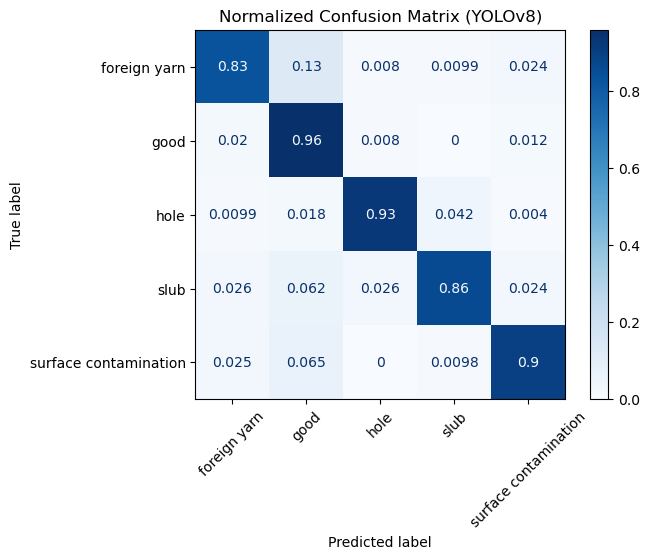

In [2]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from ultralytics import YOLO

# Load the YOLOv8 classification model
model_path = '/Users/randithasenarathne/FYP/runs/classify/train/weights/best.pt'
model = YOLO(model_path)

# Define the test directory and collect all image paths
test_dir = '/Users/randithasenarathne/FYP/FabricDefects/cls-multi/test'
image_paths = glob.glob(os.path.join(test_dir, '**', '*.*'), recursive=True)
image_paths = [p for p in image_paths if p.lower().endswith(('jpg', 'jpeg', 'png', 'bmp', 'tiff'))]

# Define class labels based on your dataset
class_labels = ['foreign yarn', 'good', 'hole', 'slub', 'surface contamination']

# Initialize lists for ground truth and predictions
y_true = []
y_pred = []

# Map folder names to class indices (for ground truth)
class_indices = {label: idx for idx, label in enumerate(class_labels)}

# Loop through images and get predictions
for image_path in image_paths:
    true_label = os.path.basename(os.path.dirname(image_path))
    y_true.append(class_indices[true_label])

    # Run prediction on the image
    result = model.predict(source=image_path, save=False)[0]

    # Convert `probs` to a Numpy array (use .cpu() for compatibility with GPU tensors)
    probs = result.probs.data.cpu().numpy()  # Ensure data is on CPU and converted to Numpy
    predicted_class = np.argmax(probs)  # Get index of the highest probability
    y_pred.append(predicted_class)

# Compute the confusion matrix
cm = confusion_matrix(y_true, y_pred, labels=np.arange(len(class_labels)))

# Normalize the confusion matrix
with np.errstate(all='ignore'):
    cm_normalized = cm.astype('float') / cm.sum(axis=1, keepdims=True)
cm_normalized = np.nan_to_num(cm_normalized)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
disp = ConfusionMatrixDisplay(confusion_matrix=cm_normalized, display_labels=class_labels)
disp.plot(cmap=plt.cm.Blues)

# Rotate x-axis labels by 45 degrees
plt.xticks(rotation=45)

plt.title('Normalized Confusion Matrix (YOLOv8)')
plt.show()